In [1]:
# taken from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import torchvision.transforms.v2 as v2transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image
import skimage
from skimage import io, transform

In [2]:
batch_size = 16
image_size = 324
model_image_size = 128
workers = 2
rootdir = "/Users/ishwar/Desktop"
output_dir = "model_output_020926_128x128_t99"
if not os.path.isdir(output_dir):
    os.mkdir(output_dir)
NUM_LANDMARKS = 5

In [3]:
class ChannelLayerNorm(nn.LayerNorm):
    def __init__(self, num_channels, channel_dim, num_dims):
        super(ChannelLayerNorm, self).__init__(num_channels)
        # build ro
        ro = []
        for i in range(num_dims-1):
            if i >= channel_dim:
                ro.append(i+1)
            else:
                ro.append(i)
        ro.append(channel_dim)

        ro_inv = []
        for i in range(num_dims):
            if i == channel_dim:
                ro_inv.append(num_dims-1)
            elif i > channel_dim:
                ro_inv.append(i-1)
            else:
                ro_inv.append(i)
        
        self.ro = tuple(ro)
        self.ro_inv = tuple(ro_inv)

        print(self.ro)
        print(self.ro_inv)

    def forward(self, x):
        x_perm = torch.permute(x, self.ro)
        layernorm_x = super().forward(x_perm)
        return torch.permute(layernorm_x, self.ro_inv)

In [4]:
class ResidualNorm(nn.Module):
    def __init__(self, inchannels, outchannels):
        super(ResidualNorm, self).__init__()

        self.res_conv = nn.Conv2d(inchannels, outchannels, 1, stride=1, padding=0, bias=False)
        self.layer_norm = ChannelLayerNorm(outchannels, 1, 4)# nn.LayerNorm(outchannels)

    def forward(self, x_orig, x):
        res_image = x + self.res_conv(x_orig)
        out_image = self.layer_norm(res_image) #torch.permute(self.layer_norm(torch.permute(res_image, (0, 2, 3, 1))), (0, 3, 1, 2))
        return out_image


In [5]:
class Residual(nn.Module):
    def __init__(self, inchannels, outchannels):
        super(Residual, self).__init__()

        self.res_conv = nn.Conv2d(inchannels, outchannels, 1, stride=1, padding=0, bias=False)

    def forward(self, x_orig, x):
        res_image = x + self.res_conv(x_orig)
        return res_image

In [6]:
class MLP(nn.Module):
    def __init__(self, inchannels, outchannels, num_layers=3):
        super(MLP, self).__init__()

        conv_layers = []
        for i in range(num_layers):
            endchannels = outchannels if (i == num_layers-1) else inchannels
            conv_layers.append(nn.Conv2d(inchannels, endchannels, 1, stride=1, padding=0, bias=False))
            conv_layers.append(nn.BatchNorm2d(endchannels))
            conv_layers.append(nn.LeakyReLU())

        self.conv_layers = nn.Sequential(*conv_layers)
        self.res = Residual(inchannels, outchannels)

    def forward(self, x):
        return self.res(x, self.conv_layers(x))


In [7]:
class SameSizeConv(nn.Module):
    def __init__(self, inchannels, outchannels, p_dropout, num_layers=2):
        super(SameSizeConv, self).__init__()
        self.p_dropout = p_dropout
        
        self.kernelSize = 3
        convs = []

        for _ in range(num_layers):
            convs.append(nn.Conv2d(inchannels, inchannels, self.kernelSize, stride=1, \
                    padding=(self.kernelSize-1)//2, bias=False) )
            convs.append(nn.Conv2d(inchannels, inchannels, self.kernelSize+2, stride=1, \
                    dilation=2, padding=(self.kernelSize+2-1), bias=False) )
            convs.append(nn.BatchNorm2d(inchannels))
            convs.append(nn.LeakyReLU())
            convs.append(nn.Dropout(p=self.p_dropout))

        mlp = []
        mlp.append(nn.Conv2d(inchannels, inchannels, 1, stride=1, \
                            padding=0, bias=False) )
        mlp.append(nn.BatchNorm2d(inchannels))
        mlp.append(nn.LeakyReLU())
        mlp.append(nn.Dropout(p=self.p_dropout))

        mlp.append(nn.Conv2d(inchannels, outchannels, 1, stride=1, \
                            padding=0, bias=False) )
        mlp.append(nn.BatchNorm2d(outchannels))
        mlp.append(nn.LeakyReLU())
        mlp.append(nn.Dropout(p=self.p_dropout))

        self.res_conv = nn.Conv2d(inchannels, inchannels, 1, stride=1, padding=0, bias=False)
        self.res_mlp = nn.Conv2d(inchannels, outchannels, 1, stride=1, padding=0, bias=False)
        
        self.conv_layers = nn.Sequential(*convs)
        self.mlp_layers = nn.Sequential(*mlp)
    
    def forward(self, x):
        x2 = self.conv_layers(x) + self.res_conv(x)
        return self.mlp_layers(x2) + self.res_mlp(x2)

In [8]:
class PatchConv(nn.Module):
    def __init__(self, in_channels, patch_size):
        super(PatchConv, self).__init__()
        with torch.no_grad():
            patch_arr = torch.reshape(torch.eye(patch_size**2), (patch_size**2, patch_size, patch_size))
            patch_weights = torch.zeros((in_channels * patch_size**2, in_channels, patch_size, patch_size))
            for i in range(in_channels * patch_size**2):
                patch_weights[i, i % in_channels] = patch_arr[i // in_channels]
            patch_weights.to(dtype=torch.float32)
            self.patch_filter = nn.Conv2d(in_channels, in_channels * patch_size**2, patch_size, stride=patch_size, padding=0, bias=False)
            self.patch_filter.weight = nn.Parameter(patch_weights)
        #self.patch_filter.weight.requires_grad = False
        # Freeze all parameters in the layer
        for param in self.patch_filter.parameters():
            param.requires_grad = False
    
    def forward(self, x):
        return self.patch_filter(x)

In [9]:
# Absolute Position Encoding (32 channels)
def gen_ape(num_channels, img_size):
    num_channels = torch.tensor(num_channels) # must be a multiple of 4 to have sin & cos for both x and y axes
    img_size = torch.tensor(img_size)
    NQ = torch.tensor(4)

    varying_dim = torch.linspace(0, img_size-1, steps=img_size)
    static_dim = torch.linspace(0, 0, steps=img_size)
    wavelength_dim = torch.linspace(torch.log(NQ)/torch.log(img_size), 1, steps=num_channels//4)
    wavelength_dim = torch.pow(img_size, wavelength_dim)

    # make first dim position encoding
    grid_tuple = torch.meshgrid(wavelength_dim, varying_dim, static_dim, indexing='ij')
    dim1_ape = torch.concat(\
                        (torch.sin((1 /  grid_tuple[0]) * grid_tuple[1] * 2*torch.pi), 
                            torch.cos((1 /  grid_tuple[0]) * grid_tuple[1] * 2*torch.pi)) )
    # make second dim position encoding
    grid_tuple = torch.meshgrid(wavelength_dim, static_dim, varying_dim, indexing='ij')
    dim2_ape = torch.concat(\
                        (torch.sin((1 /  grid_tuple[0]) * grid_tuple[2] * 2*torch.pi), 
                            torch.cos((1 /  grid_tuple[0]) * grid_tuple[2] * 2*torch.pi)) )
    ape = torch.concat((dim1_ape, dim2_ape))

    #ape_seq = torch.permute(torch.flatten(ape, start_dim=1, end_dim=2), (1, 0))

    return ape

In [10]:
def gen_learnable_ape(num_channels, img_size):
    x = torch.randn(num_channels, img_size, img_size)
    print(f"Learnable ape shape: {x.shape}")
    x_param = nn.Parameter(x, requires_grad=True)
    return x_param

In [11]:
class VisionAttention(nn.Module):
    def __init__(self, image_size, inchannels, qkchannels, vchannels):
        super(VisionAttention, self).__init__()

        # need to know how to customize initialization broadly
        self.image_size = image_size
        self.qkchannels = qkchannels
        self.qkscalar = torch.sqrt(torch.tensor(self.qkchannels))
        
        self.vchannels = vchannels
        self.queryMatrix = nn.Parameter(torch.empty(inchannels, qkchannels), requires_grad=True)
        self.keyMatrix = nn.Parameter(torch.empty(inchannels, qkchannels), requires_grad=True)
        self.valueMatrix = nn.Parameter(torch.empty(inchannels, vchannels), requires_grad=True)

        self.ape = torch.permute(torch.flatten(gen_ape(qkchannels, self.image_size), start_dim=1, end_dim=2), (1, 0))

        self.res = ResidualNorm(inchannels, vchannels)

        self.mlp = MLP(vchannels, vchannels)
    
    def forward(self, x): # x should be of dimension (batch, channels, imx, imy) ->(batch, length of sequence, dimension of embedding)
        x_seq = torch.flatten(torch.permute(x, (0, 2, 3, 1)), start_dim=1, end_dim=2)
        queries = torch.matmul(x_seq+self.ape, self.queryMatrix)
        keys = torch.matmul(x_seq+self.ape, self.keyMatrix)
        values = torch.matmul(x_seq, self.valueMatrix)
        cosine_sim = torch.matmul(queries, torch.permute(keys, (0, 2, 1))) / self.qkscalar
        attention = F.softmax(cosine_sim, dim=2) # dimension 2 contains all dot products for one query and all keys
        values = torch.matmul(attention, values)
        values_image = torch.unflatten(torch.permute(values, (0, 2, 1)), dim=2, sizes=(self.image_size, self.image_size))

        out_image = self.res(x, values_image)

        mlp_image = self.mlp(out_image)

        return mlp_image

In [77]:
SAVE_SWITCH=1
class MultiHeadVisionAttention(nn.Module):
    def __init__(self, image_size, inchannels, qkchannels, vchannels, numheads, given_ape=None):
        super(MultiHeadVisionAttention, self).__init__()

        # need to know how to customize initialization broadly
        self.image_size = image_size
        self.qkchannels = qkchannels
        self.qkscalar = torch.tensor(self.qkchannels)
        self.numheads = numheads

        self.initnorm = nn.LayerNorm(inchannels)
        
        self.vchannels = vchannels
        self.queryMatrix = nn.Parameter(torch.empty(numheads, inchannels, qkchannels), requires_grad=True)
        self.queryNorm = nn.LayerNorm(qkchannels)
        #self.register_parameter(name='queryMatrix', param=nn.Parameter(torch.empty(numheads, inchannels, qkchannels), requires_grad=True))
        self.keyMatrix = nn.Parameter(torch.empty(numheads, inchannels, qkchannels), requires_grad=True)
        self.keyNorm = nn.LayerNorm(qkchannels)
        #self.register_parameter(name='keyMatrix', param=nn.Parameter(torch.empty(numheads, inchannels, qkchannels), requires_grad=True))
        self.valueMatrix = nn.Parameter(torch.empty(numheads, inchannels, vchannels), requires_grad=True)
        #self.register_parameter(name='valueMatrix', param=nn.Parameter(torch.empty(numheads, inchannels, vchannels), requires_grad=True))
        self.valueNorm = ChannelLayerNorm(numheads*vchannels, 1, 4)

        # if given_ape == None:
        #     self.ape = gen_ape(qkchannels, self.image_size)
        # else:
        #     self.ape = given_ape # given_ape may or may not be learnable

        self.combine = nn.Conv2d(vchannels*numheads, vchannels, 1, stride=1, padding=0, bias=False)

        self.resnorm = ResidualNorm(inchannels, vchannels)

        self.mlp = MLP(vchannels, vchannels)
    
    def forward(self, x): # x should be of dimension (batch, channels, imx, imy) ->(batch, numheads, length of sequence, dimension of embedding)
        global SAVE_SWITCH
        x_seq = torch.permute(torch.flatten(x, start_dim=2, end_dim=3), (0, 2, 1))
        #x_seq_pos = x_seq + self.ape
        x_seq_heads = x_seq.reshape((x_seq.shape[0],)+(1,)+x_seq.shape[1:]).repeat(1, self.numheads, 1, 1)

        x_seq_heads = self.initnorm(x_seq_heads)

        #x_seq_pos_heads = x_seq_pos.reshape((x_seq.shape[0],)+(1,)+x_seq.shape[1:]).repeat(1, self.numheads, 1, 1)
        #print("Sequence shape after head dimension ", x_seq_heads.shape)
        queries = torch.matmul(x_seq_heads, self.queryMatrix)
        keys = torch.matmul(x_seq_heads, self.keyMatrix)
        values = torch.matmul(x_seq_heads, self.valueMatrix)

        ##queries_norm = self.queryNorm(queries)
        ##keys_norm = self.keyNorm(keys)

        ##cosine_sim = torch.matmul(queries_norm, torch.permute(keys_norm, (0, 1, 3, 2))) / self.qkscalar
        cosine_sim = torch.matmul(queries, torch.permute(keys, (0, 1, 3, 2))) / self.qkscalar

        #print(torch.max(torch.abs(cosine_sim)))

        attention = F.softmax(cosine_sim, dim=3) # dimension 3 contains all dot products for one query and all keys
        tsf_out = torch.matmul(attention, values)

        # tsf_out_image will now be of shape (batch, numheads, vchannels, image_size, image_size)
        tsf_out_image = torch.unflatten(torch.permute(tsf_out, (0, 1, 3, 2)), dim=3, sizes=(self.image_size, self.image_size))
        #print("Values image shape before head stack", values_image.shape)
        
        # tsf_out_image will now be of shape (batch, numheads*vchannels, image_size, image_size)
        tsf_out_image = torch.flatten(tsf_out_image, start_dim=1, end_dim=2)
        
        tsf_out_image_norm = self.valueNorm(tsf_out_image)

        #print("Values image shape after head stack", values_image.shape)
        combined = self.combine(tsf_out_image_norm)

        out_image = self.resnorm(x, combined)

        mlp_image = self.mlp(out_image)

        """
        if SAVE_SWITCH==1:
            torch.save(x_seq_heads, f"{output_dir}/x_seq_heads.pt")
            torch.save(queries, f"{output_dir}/queries.pt")
            torch.save(self.queryMatrix.data, f"{output_dir}/queryMatrix.pt")
            torch.save(keys, f"{output_dir}/keys.pt")
            torch.save(self.keyMatrix.data, f"{output_dir}/keyMatrix.pt")
            torch.save(values, f"{output_dir}/values.pt")
            torch.save(self.valueMatrix.data, f"{output_dir}/valueMatrix.pt")
            torch.save(cosine_sim, f"{output_dir}/cosine_sim.pt")
            torch.save(attention, f"{output_dir}/attention.pt")
            torch.save(tsf_out, f"{output_dir}/tsf_out.pt")
            torch.save(tsf_out_image, f"{output_dir}/tsf_out_image.pt")
            torch.save(out_image, f"{output_dir}/post_res_norm.pt")
            torch.save(mlp_image, f"{output_dir}/mlp_image.pt")
            SAVE_SWITCH=0
        """

        return mlp_image

In [78]:
class VisionTransformer(nn.Module):
    def __init__(self, image_size, inchannels, outchannels, numheads, numlayers):
        super(VisionTransformer, self).__init__()
        
        self.intc = [256, 4] # 512 / 8 should be a perfect square (the patch size)
        self.patch_size = 8

        # self.conv_layers = []
        # self.conv_layers.append(nn.Conv2d(inchannels, 32, 1, stride=1, padding=0, bias=False))
        #self.conv_layers.append(SameSizeConv(32, 32, 0, num_layers=2))

        self.patch_conv = [PatchConv(inchannels, self.patch_size)] # image_size must be divisible by 8
        self.resizechannels = nn.Conv2d(inchannels*(self.patch_size**2), self.intc[0], 1, stride=1, padding=0, bias=False) # image_size must be divisible by 8
        self.norm1 = nn.BatchNorm2d(self.intc[0])

        self.transformer_layers = []
        
        self.learnable_ape = gen_learnable_ape(self.intc[0], image_size//self.patch_size)

        #self.transformer_layers.append(MultiHeadVisionAttention(image_size//self.patch_size, 4*(self.patch_size**2), 4*(self.patch_size**2), self.intc[0], numheads))
        ##self.transformer_layers.append(nn.ConvTranspose2d(self.intc[0], self.intc[1], self.patch_size, stride=self.patch_size, padding=0, bias=False) )
        ##self.transformer_layers.append(SameSizeConv(self.intc[1], self.intc[1], 0))

        for i in range(0, numlayers):
            ##self.transformer_layers.append(nn.Conv2d(self.intc[1], self.intc[0], self.patch_size, stride=self.patch_size, padding=0, bias=False))

            self.transformer_layers.append(MultiHeadVisionAttention(image_size//self.patch_size, self.intc[0], self.intc[0], self.intc[0], numheads))#, given_ape=self.learnable_ape))
            self.transformer_layers.append(nn.BatchNorm2d(self.intc[0]))
            #self.transformer_layers.append(nn.ConvTranspose2d(self.intc[0], self.intc[1], self.patch_size, stride=self.patch_size, padding=0, bias=False))
            #self.transformer_layers.append(SameSizeConv(self.intc[1], self.intc[1], 0))
        #self.transformer_layers.append( nn.ConvTranspose2d(self.intc[0], 16, 8, stride=8, padding=0, bias=False))
        self.transformer_layers.append( nn.ConvTranspose2d(self.intc[0], 64, 4, 2, 1, bias=False))
        self.transformer_layers.append(nn.BatchNorm2d(64))
        self.transformer_layers.append( nn.ConvTranspose2d(64, 16, 4, 2, 1, bias=False))
        self.transformer_layers.append(nn.BatchNorm2d(16))
        self.transformer_layers.append( nn.ConvTranspose2d(16, outchannels, 4, 2, 1, bias=False))
        self.transformer_layers.append(nn.BatchNorm2d(outchannels))

        # self.conv_layers = nn.Sequential(*self.conv_layers)
        self.transformer_layers = nn.Sequential(*self.transformer_layers)

    def forward(self, x):
        x2 = self.patch_conv[0](x)
        tsf_input = self.norm1(self.resizechannels(x2)) + self.learnable_ape
        return self.transformer_layers(tsf_input)


In [14]:
def weights_init(m):
    #print(m)
    classname = m.__class__.__name__
    if isinstance(m, nn.Linear):
        print(f"Linear {m.weight.shape}")
        nn.init.normal_(m.weight.data, 0.0, (2/(m.weight.shape[1]))**0.5)
        if hasattr(m.bias, 'data'):
            nn.init.constant_(m.bias.data, 0.0)
    elif isinstance(m, MultiHeadVisionAttention):
        print(f"MultiHeadVisionAttention {m.queryMatrix.data.shape}")
        nn.init.normal_(m.queryMatrix.data, 0.0, (2/(m.queryMatrix.data.shape[1]))**0.5)
        nn.init.normal_(m.keyMatrix.data, 0.0, (2/(m.keyMatrix.data.shape[1]))**0.5)
        nn.init.normal_(m.valueMatrix.data, 0.0, (2/(m.valueMatrix.data.shape[1]))**0.5)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.05)
        nn.init.normal_(m.bias.data, 0.0, 0.001)
    elif isinstance(m, nn.Conv2d):
        print(f"Conv2d (2/({m.weight.shape[1]}*{m.weight.shape[2]}*{m.weight.shape[3]}))**0.5")
        nn.init.normal_(m.weight.data, 0.0, (2/(m.weight.shape[1]*m.weight.shape[2]*m.weight.shape[3]))**0.5) # shape[0] should be changed to shape[1]
        #print(m.weight.shape)
        if hasattr(m.bias, 'data'):
            nn.init.constant_(m.bias.data, 0.0)
    elif isinstance(m, nn.ConvTranspose2d):
        print(f"ConvTranspose2d (2/({m.weight.shape[0]}*(({m.weight.shape[2]}/{m.stride[0]})**2)))**0.5")
        nn.init.normal_(m.weight.data, 0.0, (2/(m.weight.shape[0]*((m.weight.shape[2]/m.stride[0])**2)))**0.5)
        #print(m.weight.shape)
        if hasattr(m.bias, 'data'):
            nn.init.constant_(m.bias.data, 0.0)
    m = m.to(torch.float32)

In [15]:
# Set random seed for reproducibility
manualSeed = 499
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  499


In [16]:
#MIN_SIGMA = 1
MAX_SIGMA = 5
def gen_coordinates(coord_array):
    # make 7 coordinates from 5 coordinates
    coord_array_new = torch.zeros((NUM_LANDMARKS, 2))
    coord_array_new[0] = coord_array[0]
    coord_array_new[1] = coord_array[1]
    coord_array_new[2] = (1/2)*((3/5)*coord_array[3] + (2/5)*coord_array[0]) + (1/2)*coord_array[1] # on left wing
    coord_array_new[3] = coord_array[2]
    coord_array_new[4] = (1/2)*((3/5)*coord_array[3] + (2/5)*coord_array[0]) + (1/2)*coord_array[2] # on right wing
    coord_array_new[5] = coord_array[3]
    coord_array_new[6] = coord_array[4]

    coord_array_new[7] = (3/4)*coord_array[0] + (1/4)*coord_array[3]
    coord_array_new[8] = (1/2)*coord_array[0] + (1/2)*coord_array[3]
    coord_array_new[9] = (1/4)*coord_array[0] + (3/4)*coord_array[3]

    return coord_array_new

def coord_to_heatmap(coord_array, image_shape, SIGMA_RATIO, device):
    heatmaps = torch.zeros((NUM_LANDMARKS, image_shape[1], image_shape[2]))
    
    for i in range(NUM_LANDMARKS):
        mu_x, mu_y = coord_array[i][0], coord_array[i][1]   # center (x,y)
        #sigma = sigma_in * model_image_size / image_size
        # calculate average square root distance
        coord_diff = coord_array - torch.stack([coord_array[i],]*NUM_LANDMARKS)
        #print(coord_diff)
        mag = torch.linalg.vector_norm(coord_diff, 2, dim=1)
        mag_remove = torch.cat((mag[:i], mag[i+1:]))
        s = torch.pow(torch.mean(torch.pow(mag_remove + 1e-5, -1)), -1)
        #print(s)
        sigma = MAX_SIGMA #min(SIGMA_RATIO * s + MIN_SIGMA, MAX_SIGMA)

        ys = torch.arange(image_shape[1], device=device, dtype=torch.float32)
        xs = torch.arange(image_shape[2], device=device, dtype=torch.float32)
        yy, xx = torch.meshgrid(ys, xs, indexing='ij')          # HxW each

        img = torch.exp(-0.5 * ((xx - mu_x)**2 + (yy - mu_y)**2) / (sigma**2))
        #img = torch.sqrt((xx - mu_x)**2 + (yy - mu_y)**2)
        # (optional) normalize to peak (1 / 1 + 1e-3)
        #img = torch.round(img / (img.max() + 1e-5))
        heatmaps[i] = (img / (img.sum() + 1e-5))
        #heatmaps[i] = F.softmax(img.view((model_image_size*model_image_size,)), dim=0).view((model_image_size, model_image_size)) * (model_image_size*model_image_size)
    return heatmaps

In [17]:
#SIGMA_RATIO = 0.05
class FramesFromCSV(Dataset):
    def __init__(self, csv_path, images_dir, image_pattern="frame_{frame}.png", transform=None, geo_transform=None, post_geo_transform=None):
        """
        Args:
            csv_path: path to CSV file with header in first row
            images_dir: directory containing frame PNGs
            image_pattern: naming pattern for image files
            transform: optional torchvision transform
        """
        self.images_dir = images_dir
        self.image_pattern = image_pattern
        self.transform = transform
        self.geo_transform = geo_transform
        self.post_geo_transform = post_geo_transform

        # Load CSV into numpy array, skipping header
        self.data = np.loadtxt(csv_path, delimiter=",", skiprows=1)
        # Ensure it's 2D even if only one row
        if self.data.ndim == 1:
            self.data = np.expand_dims(self.data, axis=0)

        self.frame_numbers = self.data[:, 0].astype(int)
        self.points = self.data[:, 1:]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        frame_num = self.frame_numbers[idx]
        coords = self.points[idx]

        # Load image
        img_path = os.path.join(self.images_dir, self.image_pattern.format(frame=frame_num))
        image = Image.open(img_path).convert("RGB")

        # # Reshape coords into N×2 array (x, y)
        coords = coords.reshape(-1, 2)
        coords = torch.tensor(coords, dtype=torch.float32)

        if self.transform:
            image = self.transform(image)
        if self.geo_transform:
            image, coords = self.geo_transform(image, coords)
        if self.post_geo_transform:
            image = self.post_geo_transform(image)

        #augmented_coords = gen_coordinates(coords)
        augmented_coords = coords * model_image_size / image_size
        normalized_image = image*2 - 1

        return {
            "image": normalized_image,
            "points": augmented_coords,
            "heatmaps": coord_to_heatmap(augmented_coords, image.shape, 0.1, "cpu"),
            "frame": frame_num
        }


In [18]:
class RandomAdditiveNoise:
    def __init__(self, p=0.5, mean=0.0, std=0.05):
        self.p = p
        self.mean = mean
        self.std = std

    def __call__(self, x):
        # x: tensor in [0,1], shape (C, H, W)
        if torch.rand(1).item() < self.p:
            noise = torch.randn_like(x) * self.std + self.mean
            x = x + noise
            x = torch.clamp(x, 0.0, 1.0)
        return x

class RandomColorMatrix:
    """
    Applies x -> A x where A is 3x3 with:
      - rank in {1, 2, 3} (each w.p. 1/3)
      - spectral norm <= max_spectral_norm
    """
    def __init__(self, max_spectral_norm=1.5, min_spectral_norm=0.75):
        self.max_spectral_norm = max_spectral_norm
        self.min_spectral_norm = min_spectral_norm

    def _random_orthonormal(self):
        """Generate a random 3x3 orthonormal matrix via QR."""
        M = torch.randn(3, 3)
        Q, _ = torch.linalg.qr(M)  # Q is orthonormal
        return Q

    def __call__(self, x):
        # x: tensor in [0,1], shape (3, H, W)
        c, h, w = x.shape
        assert c == 3, "RandomColorMatrix expects a 3-channel RGB tensor."

        # # Choose rank 1, 2, or 3 with equal probability
        # rank = random.choice([1, 2, 3, 3, 3, 3, 3])

        # # Random orthonormals U, V
        # U = self._random_orthonormal()
        # V = self._random_orthonormal()

        # # Singular values: only 'rank' non-zero, each ≤ max_spectral_norm
        # s = torch.zeros(3)
        # nonzero_s = torch.rand(rank)*(self.max_spectral_norm - self.min_spectral_norm) + self.min_spectral_norm  # [min_spectral_norm, max_spectral_norm)
        # # Sort descending just for sanity (not required)
        # nonzero_s, _ = torch.sort(nonzero_s, descending=True)
        # s[:rank] = nonzero_s
        # S = torch.diag(s)

        # # A = U S V^T; spectral norm = max singular value <= max_spectral_norm
        # A = U @ S @ V.T  # shape (3,3)
        A = torch.eye(c)
        A += torch.randn_like(A)*0.1

        # Apply A to each pixel: x_flat is 3 x (H*W)
        x_flat = x.view(3, -1)
        x_transformed = A @ x_flat
        x_out = x_transformed.view(3, h, w)

        # Clamp back to [0,1]
        x_out = torch.clamp(torch.abs(x_out), 0.0, 1.0)
        return x_out

# random_affine = transforms.RandomAffine(
#     degrees=(-15, 15),           # rotation range in degrees
#     scale=(0.9, 1.1),            # scaling range
#     shear=(-10, 10),              # shear range in degrees
#     translate=(0.5, 0.5)
# )


In [19]:
class ComposeJoint:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, pts):
        for t in self.transforms:
            img, pts = t(img, pts)
        return img, pts

# class ResizeWithPoints:
#     def __init__(self, size):
#         """
#         size: (H, W) or int (shorter side)
#         """
#         self.size = size

#     def __call__(self, img, pts):
#         # img.size -> (W, H)
#         old_w, old_h = img.size()

#         img = TF.resize(img, self.size())

#         if isinstance(self.size, tuple):
#             new_h, new_w = self.size()
#         else:
#             # torchvision's int size = shorter side; to keep it simple,
#             # assume you use (H, W) tuple for model_image_size
#             raise ValueError("Use an explicit (H, W) tuple for size")

#         sx = new_w / old_w
#         sy = new_h / old_h

#         scale = torch.tensor([sx, sy], dtype=torch.float32, device=pts.device)
#         pts = pts * scale  # elementwise [x, y] * [sx, sy]
#         return img, pts

class RandomAffineWithPoints:
    """
    Same params as torchvision.transforms.RandomAffine,
    but applied to both image and (N,2) coords.
    """
    def __init__(self, degrees, translate=None, scale=None, shear=None):
        self.degrees = degrees
        self.translate = translate
        self.scale = scale
        self.shear = shear

    def __call__(self, img, pts):
        # img.size is (W, H)
        w, h = img.size()[1:]

        # Sample random params exactly like RandomAffine
        angle, translations, scale, shear = transforms.RandomAffine.get_params(
            self.degrees, self.translate, self.scale, self.shear, (w, h)
        )
        corner_pixel = (img[0, -1, -1].item(), img[1, -1, -1].item(), img[2, -1, -1].item())
        # --- 1) Transform the image ---
        img = TF.affine(
            img,
            angle=angle,
            translate=translations,
            scale=scale,
            shear=shear,
            interpolation = transforms.InterpolationMode.BILINEAR,
            fill=corner_pixel
        )

        center = [w * 0.5, h * 0.5]
        inv_coeffs = TF._get_inverse_affine_matrix(
            center=center,
            angle=angle,
            translate=translations,
            scale=scale,
            shear=shear
        )
        # inv_coeffs = [a, b, c, d, e, f] giving:
        # x_in  = a * x_out + b * y_out + c
        # y_in  = d * x_out + e * y_out + f
        a, b, c, d, e, f = inv_coeffs
        #print(f"{a} {b} {c} {d} {e} {f}")

        M_inv = torch.tensor(
            [[a, b],
             [d, e]],
            dtype=torch.float32,
            device=pts.device,
        )

        M = torch.inverse(M_inv)  # 2×2

        # pts: (N,2) in input image coords
        #ones = torch.ones(pts.shape[0], 1, dtype=torch.float32, device=pts.device)
        #hom = torch.cat([pts, ones], dim=1).T  # 3×N

        #pts_out = (M @ hom).T[:, :2]  # back to (N,2)
        translation = torch.tensor([[c, f]]).repeat(pts.size()[0], 1)
        #print("Translation:\n", translation)
        #print("Points:\n", pts)

        pts_tr = pts - translation

        pts_out = (M @ pts_tr.T).T

        return img, pts_out
    
# geom_transform = ComposeJoint([
#     # ResizeWithPoints((model_image_size, model_image_size)),
#     RandomAffineWithPoints(
#         degrees=(-15, 15),
#         translate=(0.5, 0.5),
#         scale=(0.9, 1.1),
#         shear=(-10, 10),
#     ),
# ])

geom_transform = ComposeJoint([
    # ResizeWithPoints((model_image_size, model_image_size)),
    RandomAffineWithPoints(
        degrees=(-180, 180),
        translate=(0, 0),
        scale=(1.3, 1.5),
        shear=(-7, 7),
    ),
])

In [20]:
dataset = FramesFromCSV(
    csv_path="plane_data/labeled_points_mega_grp.csv",
    images_dir="outp",
    image_pattern="frame_{frame}.png",
    transform=transforms.Compose([
        transforms.Resize(image_size),
        #random_affine,
        transforms.ToTensor(),
        ]),
    geo_transform=geom_transform,
    post_geo_transform=transforms.Compose([RandomColorMatrix(max_spectral_norm=1.5, min_spectral_norm=0.95),
                                           RandomAdditiveNoise(p=0.7, mean=0.0, std=0.025), transforms.Resize(model_image_size)])
)

/Users/ishwar/anaconda3/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


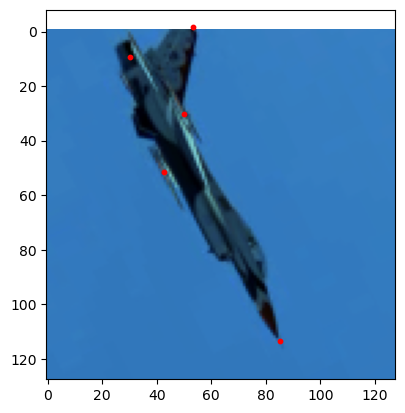

In [21]:
IMG_IDX = 291
IMG = dataset[IMG_IDX]
plt.imshow(torch.permute(IMG['image'], (1, 2, 0))*0.5 + 0.5)
# Unpack points into two lists: xs, ys
xs = [p[0] for p in IMG['points']]
ys = [p[1] for p in IMG['points']]
# Plot points as red circles
plt.scatter(xs, ys, c='red', s=10)  # s = point size

In [22]:
print(torch.min(dataset[IMG_IDX]['image']))
print(torch.max(dataset[IMG_IDX]['image']))
print(dataset[IMG_IDX]['image'].shape)

tensor(-0.9999)
tensor(0.5605)
torch.Size([3, 128, 128])


tensor(0.) tensor(0.0146)
torch.Size([5, 128, 128])


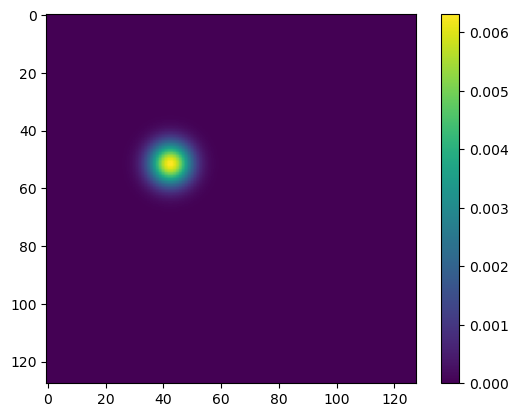

In [23]:
print(torch.min(IMG['heatmaps']), torch.max(IMG['heatmaps']))
print(IMG['heatmaps'].shape)
plt.imshow(IMG['heatmaps'][1])
plt.colorbar()

In [24]:
print(torch.mean(IMG['heatmaps'][1]))

tensor(6.1035e-05)


In [25]:
print(IMG['points'])

tensor([[ 85.3135, 113.4104],
        [ 42.5306,  51.5999],
        [ 50.0329,  30.3347],
        [ 30.2483,   9.2312],
        [ 53.3681,  -1.5863]])


tensor(0.) tensor(0.0146)


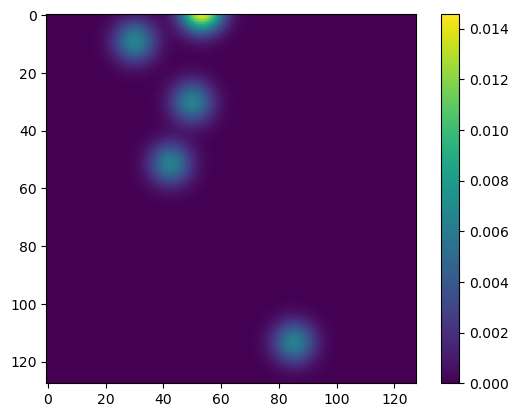

In [26]:
print(torch.min(IMG['heatmaps']), torch.max(IMG['heatmaps']))
plt.imshow(torch.sum(IMG['heatmaps'], axis=0))
plt.colorbar()

In [27]:
total_size = len(dataset)
train_size = int(total_size * 0.8)
val_size = int(total_size * 0.1)
test_size = total_size - train_size - val_size # Ensure all samples are used

In [28]:
seed = torch.Generator().manual_seed(42)
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size], generator=seed)

print(f"Train size: {len(train_dataset)}")
print(f"Validation size: {len(val_dataset)}")
print(f"Test size: {len(test_dataset)}")


Train size: 732
Validation size: 91
Test size: 92


In [29]:
# loader = DataLoader(dataset, batch_size=batch_size, shuffle=True) # accidentally set shuffle to false all this time
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# for batch in train_loader:
#     print(batch["frame"])
#     print(batch["points"].shape)  # (B, N, 2)
#     break

In [30]:
trial_number = 0

from datetime import datetime
import time

# instantiate generator, discriminator
# borrowed from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")
print("device: ", device)

print("Instantiating VisionTransformer")
model = VisionTransformer(model_image_size, 3, NUM_LANDMARKS, 4, 3).to(device, dtype=torch.float32)
model.apply(weights_init)
print(model)

# Setup Adam optimizers for both G and D
optimizer = optim.Adam(model.parameters(), lr=0.0002, betas=(0.5, 0.999))
print("Model optimizer: \n", optimizer)

criterion = nn.MSELoss()

device:  cpu
Instantiating VisionTransformer
Learnable ape shape: torch.Size([256, 16, 16])
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
Conv2d (2/(192*1*1))**0.5
Conv2d (2/(1024*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
MultiHeadVisionAttention torch.Size([4, 256, 256])
Conv2d (2/(1024*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
MultiHeadVisionAttention torch.Size([4, 256, 256])
Conv2d (2/(1024*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
Conv2d (2/(256*1*1))**0.5
MultiHeadVisionAttention torch.Size([4, 256, 256])
ConvTranspose2d (2/(256*((4/2)**2)))**0.5
ConvTranspose2d (2/(64*((4/2)**2)))**0.5
ConvTranspose2d (2/

PatchConv(
  (patch_filter): Conv2d(3, 192, kernel_size=(8, 8), stride=(8, 8), bias=False)
)
False


(array([36672.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,   192.]),
 array([0.        , 0.03333334, 0.06666667, 0.1       , 0.13333334,
        0.16666667, 0.2       , 0.23333333, 0.26666668, 0.30000001,
        0.33333334, 0.36666667, 0.40000001, 0.43333334, 0.46666667,
        0.5       , 0.53333336, 0.56666666, 0.60000002, 0.63333333,
        0.66666669, 0.69999999, 0.73333335, 0.76666665, 0.80000001,
        0.83333331, 0.86666667, 0.89999998, 0.93333334, 0.96666664,
        1.        ]),
 <BarContainer object of 30 artists>)

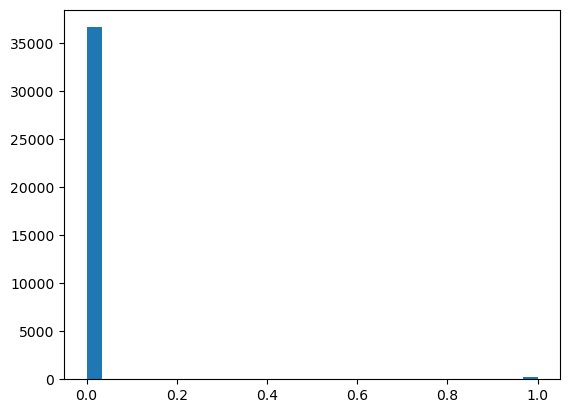

In [31]:
print(model.patch_conv[0])
print(model.patch_conv[0].patch_filter.weight.requires_grad)
plt.hist(model.patch_conv[0].patch_filter.weight.flatten().detach().numpy(), bins=30)

ConvTranspose2d(64, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
Parameter containing:
tensor([[[[ 8.1153e-02, -7.0076e-03,  4.9875e-03, -1.7232e-01],
          [-1.1669e-01, -7.0381e-02, -9.6478e-02, -6.0161e-02],
          [-1.1543e-02, -7.6873e-02,  6.4948e-02,  7.9435e-02],
          [-6.9813e-03, -4.4772e-02,  1.6854e-01,  1.2878e-01]],

         [[ 1.5412e-01, -1.3451e-01, -1.0383e-01,  1.0143e-01],
          [-4.9137e-02, -3.9724e-02,  9.5532e-02, -3.0243e-02],
          [ 7.7306e-03, -9.4561e-02, -8.5765e-03,  2.0448e-02],
          [ 4.3150e-02,  1.0290e-01, -5.6837e-02,  6.1160e-03]],

         [[-2.8657e-02, -1.4794e-01, -7.6166e-02,  7.7965e-02],
          [ 2.5827e-02, -1.4797e-02,  3.1357e-02,  2.4710e-02],
          [ 2.9397e-02, -6.3977e-02, -5.5998e-02,  1.0407e-01],
          [-4.7556e-02,  1.8989e-02,  1.8371e-01,  3.6859e-02]],

         ...,

         [[ 1.1556e-01, -1.2747e-01,  2.4100e-02,  3.0295e-02],
          [-1.7579e-01, -9.2751e-03, -

(array([   3.,    8.,   16.,   48.,  101.,  141.,  258.,  399.,  586.,
         840., 1078., 1326., 1553., 1646., 1660., 1606., 1410., 1141.,
         870.,  636.,  412.,  286.,  184.,   80.,   44.,   26.,   16.,
           4.,    2.,    4.]),
 array([-0.31771928, -0.29517433, -0.27262938, -0.25008443, -0.22753949,
        -0.20499454, -0.18244959, -0.15990464, -0.13735971, -0.11481476,
        -0.09226981, -0.06972486, -0.04717992, -0.02463497, -0.00209002,
         0.02045493,  0.04299987,  0.06554482,  0.08808977,  0.11063471,
         0.13317966,  0.15572461,  0.17826957,  0.2008145 ,  0.22335945,
         0.2459044 ,  0.26844934,  0.29099429,  0.31353924,  0.33608419,
         0.35862914]),
 <BarContainer object of 30 artists>)

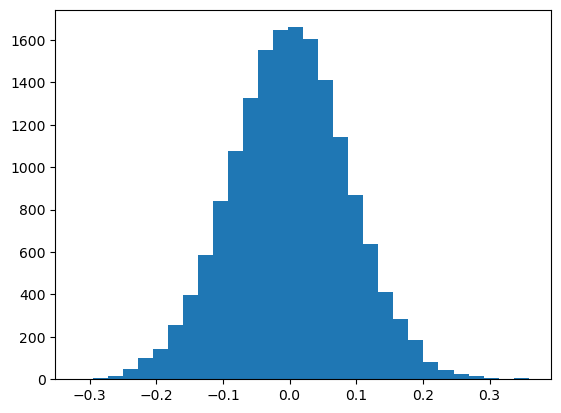

In [32]:
print(model.transformer_layers[8])
print(model.transformer_layers[8].weight)
plt.hist(model.transformer_layers[8].weight.flatten().detach().numpy(), bins=30)

Parameter containing:
tensor([[[ 0.6420,  1.3105, -0.2438,  ...,  1.6331,  0.4421,  0.1450],
         [-0.7171, -1.6113,  1.1770,  ..., -0.6481, -0.1263, -1.1136],
         [ 0.5027,  1.0670, -1.7512,  ..., -0.0838, -0.6595, -0.0753],
         ...,
         [ 0.3060,  0.4655, -0.3597,  ...,  0.8614,  1.4520,  0.2266],
         [-0.8231,  0.0109,  1.1663,  ..., -1.4524, -0.9426, -0.0952],
         [ 0.1330,  0.1607, -1.3347,  ..., -0.1783, -0.3154, -2.8405]],

        [[-1.3572,  1.2338,  2.6141,  ..., -0.5834,  0.8255,  2.8576],
         [ 0.4712,  0.5306, -0.8626,  ..., -0.4945, -0.9729, -0.3567],
         [ 2.2186,  0.4370,  0.2468,  ...,  0.8567,  1.7583,  0.1645],
         ...,
         [ 0.5180, -0.2431,  0.2461,  ...,  2.9727,  1.4189,  2.2796],
         [ 0.1046, -0.1444, -1.4192,  ...,  0.1498, -1.1814, -0.9040],
         [ 0.1360, -0.4220, -0.2727,  ..., -0.9904,  0.2913, -1.4826]],

        [[ 1.1013, -0.1326,  0.8663,  ..., -0.8219,  1.0412, -0.3227],
         [-1.2477,  0.8

(array([6.000e+00, 4.000e+00, 2.400e+01, 6.000e+01, 1.250e+02, 2.350e+02,
        5.160e+02, 9.330e+02, 1.594e+03, 2.474e+03, 3.566e+03, 4.847e+03,
        5.887e+03, 6.685e+03, 7.198e+03, 7.237e+03, 6.562e+03, 5.529e+03,
        4.180e+03, 3.131e+03, 2.008e+03, 1.292e+03, 7.140e+02, 4.330e+02,
        1.670e+02, 7.600e+01, 2.800e+01, 1.400e+01, 8.000e+00, 3.000e+00]),
 array([-4.1217165 , -3.8433125 , -3.56490874, -3.28650475, -3.00810075,
        -2.72969699, -2.45129299, -2.17288899, -1.89448512, -1.61608124,
        -1.33767736, -1.05927336, -0.78086948, -0.50246555, -0.22406165,
         0.05434227,  0.33274618,  0.61115009,  0.88955402,  1.1679579 ,
         1.4463619 ,  1.72476578,  2.00316978,  2.28157353,  2.55997753,
         2.83838153,  3.11678529,  3.39518929,  3.67359328,  3.95199704,
         4.23040104]),
 <BarContainer object of 30 artists>)

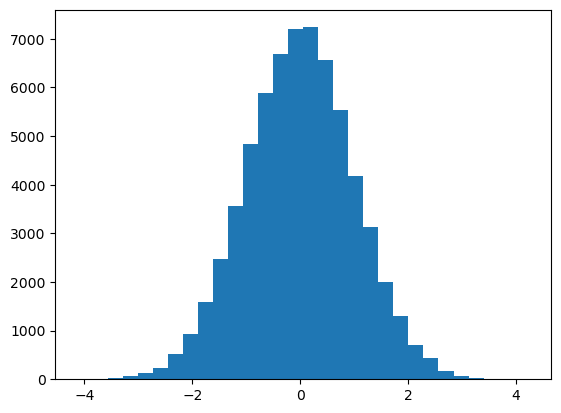

In [33]:
print(model.learnable_ape)
plt.hist(model.learnable_ape.flatten().detach().numpy(), bins=30)

In [34]:
# Assuming 'model' is your defined torch.nn.Module instance
pytorch_total_params = sum(p.numel() for p in model.parameters())

pytorch_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total parameters: {pytorch_total_params}")
print(f"Trainable parameters: {pytorch_trainable_params}")

Total parameters: 4542378
Trainable parameters: 4542378


In [35]:
iters = 0
epoch = 0
num_epochs = 1000
#k=500 # saving images of fixed_noise outputs
last_save = iters
break_flag = False

losses = []

example_idx = 110

In [36]:
def heatmap_softmax(heatmap_list, b, c):
    return [ F.softmax(heatmap.view(b, c, model_image_size*model_image_size), dim=2).view((b,c,model_image_size,model_image_size)) for heatmap in heatmap_list ]

In [37]:
xs = torch.linspace(0.5, model_image_size-0.5, model_image_size, device=device) / model_image_size
ys = torch.linspace(0.5, model_image_size-0.5, model_image_size, device=device) / model_image_size
X, Y = torch.meshgrid(xs, ys, indexing="xy")
pts_template = torch.stack([X.reshape(-1), Y.reshape(-1)], dim=-1)  # (N, 2), N = grid_size^2

f_log = open(f"{output_dir}/training.log", "a")
f_log.write("""Checking if attention layers computations come out correctly; Cut most convolutional layers ... goal is to see whether attention only architecture works. Added batchnorms between final convolutional layers. Make ape learnable. Increased conv2d init std multiplier from 0.4 to 2. removed initial convolutional layer -- goes straight to patch conv and projection onto 256 dimensional embedding; only adding positional encoding at the start of the transformer layers by treating it as part of the input to the model (injected after conv layers and before transformer layers). More info on gradients of convolutional and MLP layers as well, changed patch size from 8 to 4; higher learning rate of 0.0012; added layernorm to normalize keys and queries before forming attention matrix (employing new ChannelLayerNorm class, which extends nn.LayerNorm to deal with the channel dim not being the last dim. Added a batchnorm after resizechannels convolution. Applied key and query transformations after normalizing x_seq input (for real this time, so that similarity matrix isn't just scaled by layernorm weights). Restored scaling factor of conv2d init to 1 (from 2). Scaled qk transformations init to 0.05 times original amount, left v transformation as is. Reduced learning rate to 0.0002. Changed attention scaling factor from sqrt(256) to 256.\n""")

example_indices = [110, 198]

print("Starting Training Loop...")
while (epoch < num_epochs) and (not break_flag):
    # For each batch in the dataloader
    should_break = False
    err_total_loss = 0

    f_log.write(f"Epoch\t{epoch}.\n")
    for i, data in enumerate(train_loader, 0):
    #while False:
        print(f"Epoch\t{epoch}, batch\t{i}.")
        t0 = time.perf_counter()

        data_input = data['image']
        output = data['heatmaps']
        output_coords = data['points'] / model_image_size

        data_input = data_input.to(device, dtype=torch.float32)

        b = data_input.shape[0]
        c = output.shape[1]

        t1 = time.perf_counter()
        f_log.write(f"Epoch\t{epoch}, batch\t{i}, {b} elements.\n")
        f_log.write(f"\t\tTime for setup: {t1-t0}\n")

        heatmap_logits = [model(data_input)]
        heatmap_probs = heatmap_softmax(heatmap_logits, b, c)
        predicted_heatmap_stages = heatmap_probs[0]##torch.cat(heatmap_predicted[0], dim=1)
        expected_output_stages = output #output.repeat(1, 3, 1, 1)

        t2 = time.perf_counter()
        f_log.write(f"\t\tTime for forward: {t2-t1}\n")

        model.zero_grad()

        t3 = time.perf_counter()
        f_log.write(f"\t\tTime for zero-grad: {t3-t2}\n")

        #print(expected_output_stages.shape)
        #print(predicted_heatmap_stages.shape)
        err_endpts_sum = criterion(predicted_heatmap_stages, expected_output_stages) * b / batch_size

        ###errs_endpts = []
        ###for j in range(len(heatmap_predicted[0])):
        ###    errs_endpts.append(criterion(heatmap_predicted[0][j], output))
        ###    print(f"Error for intermediate heatmap {j}: {errs_endpts[j].item()}")
        ###losses.append((epoch, i, iters, {f"Stage {j} error endpt": errs_endpts[j].item() for j in range(len(heatmap_predicted[0]))} ) )
        ###err_endpts_sum = (sum(errs_endpts)/len(errs_endpts)) * b / batch_size

        # errs_interior = []
        # for j in range(len(heatmap_predicted[1])):
        #     errs_interior.append(criterion(heatmap_predicted[1][j], output))
        #     print(f"Error for intermediate heatmap {j}: {errs_interior[j].item()}")
        
        # losses.append((epoch, i, iters, {f"Stage {j} error interior": errs_interior[j].item() for j in range(len(heatmap_predicted[1]))} ) )
        # err_interior_sum = (sum(errs_interior)/len(errs_interior)) * b / batch_size

        # err_sum = err_interior_sum*0.5 + err_endpts_sum*0.5
        err_sum = err_endpts_sum * (10**2)**3 # factor to adjust for the scale of the heatmaps
        losses.append( (epoch, i, iters, {f"Stage 0 error": err_sum.item()} ) )

        f_log.write(f"\tTraining loss / batch: {err_sum.item()}\n")
        err_total_loss += err_sum.item()

        t4 = time.perf_counter()
        f_log.write(f"\t\tTime for loss computation: {t4-t3}\n")

        err_sum.backward()

        t5 = time.perf_counter()
        f_log.write(f"\t\tTime for backprop: {t5-t4}\n")

        peek_modules = {"patch": model.patch_conv[0].patch_filter.weight, "init_resize": model.resizechannels.weight, \
                        "attn1q": model.transformer_layers[0].queryMatrix, "attn1k": model.transformer_layers[0].keyMatrix, "attn1v": model.transformer_layers[0].valueMatrix, \
                        "mlp1": model.transformer_layers[0].mlp,\
                        "attn2q": model.transformer_layers[2].queryMatrix, "attn2k": model.transformer_layers[2].keyMatrix, "attn2v": model.transformer_layers[2].valueMatrix, \
                        "mlp2": model.transformer_layers[2].mlp,\
                        "attn3q": model.transformer_layers[4].queryMatrix, "attn3k": model.transformer_layers[4].keyMatrix, "attn3v": model.transformer_layers[4].valueMatrix, \
                        "mlp3": model.transformer_layers[4].mlp,\
                        "up1": model.transformer_layers[6].weight, "up2": model.transformer_layers[6].weight, "up3": model.transformer_layers[6].weight,}
        f_log.write("\tGradient statistics\n")
        for num in peek_modules:
            all_gradients = []
            param = peek_modules[num]
            if isinstance(param, nn.Module):
                for name, param in peek_modules[num].named_parameters():
                    if param.grad is not None:
                        # Flatten the gradients and convert to numpy
                        all_gradients.append(param.grad.view(-1).numpy())
            elif isinstance(param, nn.Parameter):
                if param.grad is not None:
                    # Flatten the gradients and convert to numpy
                    all_gradients.append(param.grad.view(-1).numpy())
            # Concatenate all gradient arrays
            if len(all_gradients) == 0:
                f_log.write(f"\tPart {num} has no gradients to report.\n")
            else:
                all_gradients = np.abs(np.concatenate(all_gradients))
                f_log.write(f"\tPart {num}: {np.min(all_gradients):.2e} to {np.median(all_gradients):.2e} to {np.max(all_gradients):.2e}\n")
            #print(f"\tMedian. {np.median(all_gradients)}. Min {np.min(all_gradients)}. Max {np.max(all_gradients)}")
        f_log.write("\tValue statistics\n")
        for num in peek_modules:
            all_vals = []
            param = peek_modules[num]
            if isinstance(param, nn.Module):
                for name, param in peek_modules[num].named_parameters():
                    # Flatten the values and convert to numpy
                    all_vals.append(param.data.view(-1).numpy())
            elif isinstance(param, nn.Parameter):
                # Flatten the values and convert to numpy
                all_vals.append(param.data.view(-1).numpy())
            # Concatenate all values arrays
            all_vals = np.abs(np.concatenate(all_vals))
            f_log.write(f"\tPart {num}: {np.min(all_vals):.2e} to {np.median(all_vals):.2e} to {np.max(all_vals):.2e}\n")
            #print(f"\tMedian. {np.median(all_vals)}. Min {np.min(all_vals)}. Max {np.max(all_vals)}")

        t6 = time.perf_counter()
        f_log.write(f"\t\tTime for gathering statistics: {t6-t5}\n")
        
        
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.1) # Clip to a max norm of 1.0

        t7 = time.perf_counter()
        f_log.write(f"\t\tTime for grad clip: {t7-t5}\n")

        optimizer.step()

        t8 = time.perf_counter()
        f_log.write(f"\t\tTime for opt step: {t8-t7}\n")

        iters += 1

        f_log.flush()

    f_log.write(f"Sum of losses over epochs (training): {err_total_loss}\n")
    f_log.write(f"Average of losses over epochs (training): {err_total_loss / train_size}\n")

    losses.append((epoch, -1, iters, {f"Average training loss": err_total_loss / train_size} ) )

    f_log.write(f"Epoch\t{epoch}. Evaluating validation loss\n")
    err_val_loss = 0
    model.eval()
    with torch.no_grad():
        for i, data in enumerate(val_loader, 0):
        #while False:
            t0 = time.perf_counter()

            data_input = data['image']
            output = data['heatmaps']
            output_coords = data['points'] / model_image_size

            data_input = data_input.to(device, dtype=torch.float32)

            b = data_input.shape[0]
            c = output.shape[1]

            t1 = time.perf_counter()
            f_log.write(f"Batch\t{i}, {b} elements.\n")
            f_log.write(f"\t\tTime for setup: {t1-t0}\n")

            heatmap_logits = [model(data_input)]
            heatmap_probs = heatmap_softmax(heatmap_logits, b, c)
            predicted_heatmap_stages = heatmap_probs[0]##torch.cat(heatmap_predicted[0], dim=1)
            expected_output_stages = output #output.repeat(1, 3, 1, 1)

            t2 = time.perf_counter()
            f_log.write(f"\t\tTime for forward: {t2-t1}\n")

            #print(expected_output_stages.shape)s
            #print(predicted_heatmap_stages.shape)
            err_endpts_sum = criterion(predicted_heatmap_stages, expected_output_stages) * b / batch_size

            ###errs_endpts = []
            ###for j in range(len(heatmap_predicted[0])):
            ###    errs_endpts.append(criterion(heatmap_predicted[0][j], output))
            ###    print(f"Error for intermediate heatmap {j}: {errs_endpts[j].item()}")
            ###losses.append((epoch, i, iters, {f"Stage {j} error endpt": errs_endpts[j].item() for j in range(len(heatmap_predicted[0]))} ) )
            ###err_endpts_sum = (sum(errs_endpts)/len(errs_endpts)) * b / batch_size

            # errs_interior = []
            # for j in range(len(heatmap_predicted[1])):
            #     errs_interior.append(criterion(heatmap_predicted[1][j], output))
            #     print(f"Error for intermediate heatmap {j}: {errs_interior[j].item()}")
            
            # losses.append((epoch, i, iters, {f"Stage {j} error interior": errs_interior[j].item() for j in range(len(heatmap_predicted[1]))} ) )
            # err_interior_sum = (sum(errs_interior)/len(errs_interior)) * b / batch_size

            # err_sum = err_interior_sum*0.5 + err_endpts_sum*0.5
            err_sum = err_endpts_sum * (10**2)**3 # factor to adjust for the scale of the heatmaps
            f_log.write(f"\tValidation loss / batch: {err_sum.item()}\n")
            err_val_loss += err_sum.item()

            t4 = time.perf_counter()
            f_log.write(f"\t\tTime for validation loss computation: {t4-t2}\n")

            f_log.flush()
    
    f_log.write(f"Total validation loss: {err_val_loss}\n")
    f_log.write(f"Average validation loss: {err_val_loss / val_size}\n")

    losses.append((epoch, -1, iters, {f"Average validation loss": err_val_loss / val_size} ) )
    print(f"Loss info length: {len(losses)}")

    model.train()
    
    if should_break:
        break

    if (epoch+1) % 1 == 0:
        for example_idx in example_indices:
            print(f"Saving results for example index {example_idx}")
            f_log.write(f"Saving results for example index {example_idx}\n")
            # output example output from model
            example_point = dataset[example_idx]
            image = torch.permute(example_point['image'], (1, 2, 0))
            plt.imshow(image.numpy())
            plt.savefig(f"{output_dir}/epoch{epoch}_i{example_idx}_in.png")
            plt.clf()

            input_example = example_point['image'].to(dtype=torch.float32)
            print(torch.min(input_example), torch.max(input_example))
            print(input_example.shape)

            model.eval()
            heatmap_pred = [model( torch.stack((input_example,)) )]
            heatmap_pred_detach = [y.detach() for y in heatmap_pred]
            heatmap_probs = heatmap_softmax(heatmap_pred, 1, c)
            heatmap_probs_detach = [y.detach() for y in heatmap_probs]
            model.train()

            heatmap_actual = example_point['heatmaps']
            print(heatmap_pred_detach[0].shape)
            for i in range(NUM_LANDMARKS):
                plt.imshow(heatmap_actual.numpy()[i])
                plt.colorbar()
                plt.savefig(f"{output_dir}/epoch{epoch}_i{example_idx}_out_{i}_real.png")
                plt.clf()
                for j in range(len(heatmap_pred_detach)):
                    plt.title(f"Heatmap {i} logits")
                    plt.imshow(heatmap_pred_detach[j].numpy()[0][i])
                    plt.colorbar()
                    plt.savefig(f"{output_dir}/epoch{epoch}_i{example_idx}_out_{i}_endpt{j}_logits.png")
                    plt.clf()
                    plt.title(f"Heatmap {i} probabilities")
                    plt.imshow(heatmap_probs_detach[j].numpy()[0][i])
                    plt.colorbar()
                    plt.savefig(f"{output_dir}/epoch{epoch}_i{example_idx}_out_{i}_endpt{j}_probs.png")
                    plt.clf()
                # for j in range(len(heatmap_pred_detach[1])):
                #     plt.imshow(heatmap_pred_detach[1][j].numpy()[0][i])
                #     plt.colorbar()
                #     plt.savefig(f"{output_dir}/epoch{epoch}_out_{i}_inter{j}.png")
                #     plt.clf()

    epoch += 1
    #SIGMA_RATIO = ((SIGMA_RATIO - 0.05) * 0.996) + 0.05
    #f_log.write(f"New SIGMA_RATIO: {SIGMA_RATIO}\n")

f_log.close()

Starting Training Loop...
Epoch	0, batch	0.
tensor(0.6641, grad_fn=<MaxBackward1>)
tensor(0.6237, grad_fn=<MaxBackward1>)
tensor(0.6022, grad_fn=<MaxBackward1>)
Epoch	0, batch	1.
tensor(0.6921, grad_fn=<MaxBackward1>)
tensor(0.6771, grad_fn=<MaxBackward1>)
tensor(0.6575, grad_fn=<MaxBackward1>)
Epoch	0, batch	2.
tensor(0.6778, grad_fn=<MaxBackward1>)
tensor(0.6914, grad_fn=<MaxBackward1>)
tensor(0.6306, grad_fn=<MaxBackward1>)
Epoch	0, batch	3.
tensor(0.6406, grad_fn=<MaxBackward1>)
tensor(0.7002, grad_fn=<MaxBackward1>)
tensor(0.5887, grad_fn=<MaxBackward1>)
Epoch	0, batch	4.
tensor(0.6566, grad_fn=<MaxBackward1>)
tensor(0.6314, grad_fn=<MaxBackward1>)
tensor(0.5819, grad_fn=<MaxBackward1>)
Epoch	0, batch	5.
tensor(0.6986, grad_fn=<MaxBackward1>)
tensor(0.6889, grad_fn=<MaxBackward1>)
tensor(0.6196, grad_fn=<MaxBackward1>)
Epoch	0, batch	6.
tensor(0.6791, grad_fn=<MaxBackward1>)
tensor(0.6090, grad_fn=<MaxBackward1>)
tensor(0.6067, grad_fn=<MaxBackward1>)
Epoch	0, batch	7.
tensor(0.67

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99873996].


tensor(0.8915)
tensor(0.9757)
tensor(0.6077)
Loss info length: 48
Saving results for example index 110
tensor(-1.) tensor(0.9987)
torch.Size([3, 128, 128])
tensor(0.6737, grad_fn=<MaxBackward1>)
tensor(0.6736, grad_fn=<MaxBackward1>)
tensor(0.4361, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(0.6813, grad_fn=<MaxBackward1>)
tensor(0.6001, grad_fn=<MaxBackward1>)
tensor(0.3784, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	1, batch	0.
tensor(0.8395, grad_fn=<MaxBackward1>)
tensor(0.8558, grad_fn=<MaxBackward1>)
tensor(0.6200, grad_fn=<MaxBackward1>)
Epoch	1, batch	1.
tensor(0.8396, grad_fn=<MaxBackward1>)
tensor(0.8035, grad_fn=<MaxBackward1>)
tensor(0.5988, grad_fn=<MaxBackward1>)
Epoch	1, batch	2.
tensor(0.8799, grad_fn=<MaxBackward1>)
tensor(0.8698, grad_fn=<MaxBackward1>)
tensor(0.6398, grad_fn=<MaxBackward1>)
Epoch	1, batch	3.
tensor(1.0110, grad_fn=<MaxBackward1>)
tensor(1.1075, grad_fn=<MaxBackward1>)
tensor(0.7474, grad_fn=<MaxBackward1>)
Epoch	1, batch	4.
tensor(1.0220, grad_fn=<MaxBackward1>)
tensor(1.1610, grad_fn=<MaxBackward1>)
tensor(0.6135, grad_fn=<MaxBackward1>)
Epoch	1, batch	5.
tensor(1.1183, grad_fn=<MaxBackward1>)
tensor(1.0638, grad_fn=<MaxBackward1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99958324..1.0].


tensor(2.9220)
tensor(2.8217)
tensor(1.8996)
Loss info length: 96
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(2.7928, grad_fn=<MaxBackward1>)
tensor(2.1318, grad_fn=<MaxBackward1>)
tensor(1.8342, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994774..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(1.6377, grad_fn=<MaxBackward1>)
tensor(1.1751, grad_fn=<MaxBackward1>)
tensor(1.4278, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	2, batch	0.
tensor(2.8964, grad_fn=<MaxBackward1>)
tensor(2.9243, grad_fn=<MaxBackward1>)
tensor(2.0423, grad_fn=<MaxBackward1>)
Epoch	2, batch	1.
tensor(2.8524, grad_fn=<MaxBackward1>)
tensor(2.4206, grad_fn=<MaxBackward1>)
tensor(1.9824, grad_fn=<MaxBackward1>)
Epoch	2, batch	2.
tensor(3.0373, grad_fn=<MaxBackward1>)
tensor(2.7163, grad_fn=<MaxBackward1>)
tensor(2.1058, grad_fn=<MaxBackward1>)
Epoch	2, batch	3.
tensor(2.9625, grad_fn=<MaxBackward1>)
tensor(2.8395, grad_fn=<MaxBackward1>)
tensor(2.3060, grad_fn=<MaxBackward1>)
Epoch	2, batch	4.
tensor(2.7674, grad_fn=<MaxBackward1>)
tensor(3.0242, grad_fn=<MaxBackward1>)
tensor(2.4155, grad_fn=<MaxBackward1>)
Epoch	2, batch	5.
tensor(3.2198, grad_fn=<MaxBackward1>)
tensor(3.2159, grad_fn=<MaxBackw

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9979686..1.0].


tensor(2.5921)
tensor(5.1905)
tensor(3.7674)
Loss info length: 144
Saving results for example index 110
tensor(-0.9980) tensor(1.)
torch.Size([3, 128, 128])
tensor(2.0034, grad_fn=<MaxBackward1>)
tensor(4.2917, grad_fn=<MaxBackward1>)
tensor(3.1979, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996278..0.9014697].


Saving results for example index 198
tensor(-0.9996) tensor(0.9015)
torch.Size([3, 128, 128])
tensor(1.6180, grad_fn=<MaxBackward1>)
tensor(2.8272, grad_fn=<MaxBackward1>)
tensor(3.4640, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	3, batch	0.
tensor(2.7196, grad_fn=<MaxBackward1>)
tensor(5.3841, grad_fn=<MaxBackward1>)
tensor(3.8467, grad_fn=<MaxBackward1>)
Epoch	3, batch	1.
tensor(2.7259, grad_fn=<MaxBackward1>)
tensor(5.5731, grad_fn=<MaxBackward1>)
tensor(3.8947, grad_fn=<MaxBackward1>)
Epoch	3, batch	2.
tensor(2.6570, grad_fn=<MaxBackward1>)
tensor(4.9283, grad_fn=<MaxBackward1>)
tensor(3.8962, grad_fn=<MaxBackward1>)
Epoch	3, batch	3.
tensor(3.1827, grad_fn=<MaxBackward1>)
tensor(5.9587, grad_fn=<MaxBackward1>)
tensor(3.8603, grad_fn=<MaxBackward1>)
Epoch	3, batch	4.
tensor(3.3360, grad_fn=<MaxBackward1>)
tensor(5.7090, grad_fn=<MaxBackward1>)
tensor(3.8694, grad_fn=<MaxBackward1>)
Epoch	3, batch	5.
tensor(3.3968, grad_fn=<MaxBackward1>)
tensor(5.5688, grad_fn=<MaxB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(3.9040)
tensor(5.9135)
tensor(4.1105)
Loss info length: 192
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(2.9512, grad_fn=<MaxBackward1>)
tensor(4.8671, grad_fn=<MaxBackward1>)
tensor(3.5279, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.88956904].


Saving results for example index 198
tensor(-1.) tensor(0.8896)
torch.Size([3, 128, 128])
tensor(2.9652, grad_fn=<MaxBackward1>)
tensor(5.1455, grad_fn=<MaxBackward1>)
tensor(3.3823, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	4, batch	0.
tensor(4.0590, grad_fn=<MaxBackward1>)
tensor(7.0018, grad_fn=<MaxBackward1>)
tensor(3.9003, grad_fn=<MaxBackward1>)
Epoch	4, batch	1.
tensor(3.4658, grad_fn=<MaxBackward1>)
tensor(6.5963, grad_fn=<MaxBackward1>)
tensor(3.9401, grad_fn=<MaxBackward1>)
Epoch	4, batch	2.
tensor(3.3987, grad_fn=<MaxBackward1>)
tensor(6.0111, grad_fn=<MaxBackward1>)
tensor(4.0520, grad_fn=<MaxBackward1>)
Epoch	4, batch	3.
tensor(3.8902, grad_fn=<MaxBackward1>)
tensor(6.1181, grad_fn=<MaxBackward1>)
tensor(3.6701, grad_fn=<MaxBackward1>)
Epoch	4, batch	4.
tensor(4.0962, grad_fn=<MaxBackward1>)
tensor(6.5641, grad_fn=<MaxBackward1>)
tensor(4.1421, grad_fn=<MaxBackward1>)
Epoch	4, batch	5.
tensor(3.7448, grad_fn=<MaxBackward1>)
tensor(5.5388, grad_fn=<MaxBackw

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999288..1.0].


tensor(4.1385)
tensor(7.3265)
tensor(4.5789)
Loss info length: 240
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.6804, grad_fn=<MaxBackward1>)
tensor(5.7537, grad_fn=<MaxBackward1>)
tensor(2.4296, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992836..0.9937788].


Saving results for example index 198
tensor(-0.9993) tensor(0.9938)
torch.Size([3, 128, 128])
tensor(2.5037, grad_fn=<MaxBackward1>)
tensor(5.0601, grad_fn=<MaxBackward1>)
tensor(3.8396, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	5, batch	0.
tensor(4.4420, grad_fn=<MaxBackward1>)
tensor(7.0065, grad_fn=<MaxBackward1>)
tensor(4.3734, grad_fn=<MaxBackward1>)
Epoch	5, batch	1.
tensor(5.0017, grad_fn=<MaxBackward1>)
tensor(7.0046, grad_fn=<MaxBackward1>)
tensor(4.2328, grad_fn=<MaxBackward1>)
Epoch	5, batch	2.
tensor(5.0704, grad_fn=<MaxBackward1>)
tensor(7.1933, grad_fn=<MaxBackward1>)
tensor(4.3308, grad_fn=<MaxBackward1>)
Epoch	5, batch	3.
tensor(4.8601, grad_fn=<MaxBackward1>)
tensor(6.7701, grad_fn=<MaxBackward1>)
tensor(4.3028, grad_fn=<MaxBackward1>)
Epoch	5, batch	4.
tensor(4.2487, grad_fn=<MaxBackward1>)
tensor(7.5524, grad_fn=<MaxBackward1>)
tensor(4.3562, grad_fn=<MaxBackward1>)
Epoch	5, batch	5.
tensor(4.4576, grad_fn=<MaxBackward1>)
tensor(6.2436, grad_fn=<MaxB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(5.4796)
tensor(6.9455)
tensor(4.7599)
Loss info length: 288
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.2985, grad_fn=<MaxBackward1>)
tensor(6.2032, grad_fn=<MaxBackward1>)
tensor(3.6858, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.8622, grad_fn=<MaxBackward1>)
tensor(5.2881, grad_fn=<MaxBackward1>)
tensor(4.3802, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	6, batch	0.
tensor(5.9225, grad_fn=<MaxBackward1>)
tensor(7.1113, grad_fn=<MaxBackward1>)
tensor(4.5211, grad_fn=<MaxBackward1>)
Epoch	6, batch	1.
tensor(5.5970, grad_fn=<MaxBackward1>)
tensor(7.0989, grad_fn=<MaxBackward1>)
tensor(4.7278, grad_fn=<MaxBackward1>)
Epoch	6, batch	2.
tensor(6.2045, grad_fn=<MaxBackward1>)
tensor(6.7434, grad_fn=<MaxBackward1>)
tensor(4.7119, grad_fn=<MaxBackward1>)
Epoch	6, batch	3.
tensor(6.0589, grad_fn=<MaxBackward1>)
tensor(6.6416, grad_fn=<MaxBackward1>)
tensor(4.7027, grad_fn=<MaxBackward1>)
Epoch	6, batch	4.
tensor(6.1448, grad_fn=<MaxBackward1>)
tensor(6.2394, grad_fn=<MaxBackward1>)
tensor(4.4766, grad_fn=<MaxBackward1>)
Epoch	6, batch	5.
tensor(6.1765, grad_fn=<MaxBackward1>)
tensor(6.5522, grad_fn=<MaxBackward1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(5.7365)
tensor(7.3392)
tensor(4.9856)
Loss info length: 336
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.3499, grad_fn=<MaxBackward1>)
tensor(5.4594, grad_fn=<MaxBackward1>)
tensor(3.8012, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.6923, grad_fn=<MaxBackward1>)
tensor(5.0202, grad_fn=<MaxBackward1>)
tensor(4.5713, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	7, batch	0.
tensor(5.6526, grad_fn=<MaxBackward1>)
tensor(7.3528, grad_fn=<MaxBackward1>)
tensor(5.1374, grad_fn=<MaxBackward1>)
Epoch	7, batch	1.
tensor(6.0431, grad_fn=<MaxBackward1>)
tensor(7.0268, grad_fn=<MaxBackward1>)
tensor(4.7475, grad_fn=<MaxBackward1>)
Epoch	7, batch	2.
tensor(5.4022, grad_fn=<MaxBackward1>)
tensor(6.7580, grad_fn=<MaxBackward1>)
tensor(5.1021, grad_fn=<MaxBackward1>)
Epoch	7, batch	3.
tensor(5.8134, grad_fn=<MaxBackward1>)
tensor(7.1265, grad_fn=<MaxBackward1>)
tensor(5.2731, grad_fn=<MaxBackward1>)
Epoch	7, batch	4.
tensor(5.9453, grad_fn=<MaxBackward1>)
tensor(7.5205, grad_fn=<MaxBackward1>)
tensor(5.5758, grad_fn=<MaxBackward1>)
Epoch	7, batch	5.
tensor(5.9255, grad_fn=<MaxBackward1>)
tensor(7.1689, grad_fn=<MaxBackward1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994567..1.0].


tensor(5.9582)
tensor(6.5112)
tensor(4.8084)
Loss info length: 384
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4444, grad_fn=<MaxBackward1>)
tensor(5.4753, grad_fn=<MaxBackward1>)
tensor(4.5452, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993814..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.9926, grad_fn=<MaxBackward1>)
tensor(5.7432, grad_fn=<MaxBackward1>)
tensor(4.4487, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	8, batch	0.
tensor(7.0553, grad_fn=<MaxBackward1>)
tensor(6.7492, grad_fn=<MaxBackward1>)
tensor(4.9379, grad_fn=<MaxBackward1>)
Epoch	8, batch	1.
tensor(6.6954, grad_fn=<MaxBackward1>)
tensor(7.2213, grad_fn=<MaxBackward1>)
tensor(4.9423, grad_fn=<MaxBackward1>)
Epoch	8, batch	2.
tensor(7.0675, grad_fn=<MaxBackward1>)
tensor(7.8085, grad_fn=<MaxBackward1>)
tensor(4.9679, grad_fn=<MaxBackward1>)
Epoch	8, batch	3.
tensor(6.7290, grad_fn=<MaxBackward1>)
tensor(7.7810, grad_fn=<MaxBackward1>)
tensor(4.8496, grad_fn=<MaxBackward1>)
Epoch	8, batch	4.
tensor(6.5707, grad_fn=<MaxBackward1>)
tensor(7.1048, grad_fn=<MaxBackward1>)
tensor(5.0761, grad_fn=<MaxBackward1>)
Epoch	8, batch	5.
tensor(7.2007, grad_fn=<MaxBackward1>)
tensor(7.6025, grad_fn=<MaxBackw

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99910325..1.0].


tensor(7.1955)
tensor(7.8298)
tensor(5.6077)
Loss info length: 432
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5468, grad_fn=<MaxBackward1>)
tensor(6.4486, grad_fn=<MaxBackward1>)
tensor(5.4110, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997749..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6822, grad_fn=<MaxBackward1>)
tensor(4.5931, grad_fn=<MaxBackward1>)
tensor(4.7873, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	9, batch	0.
tensor(7.8483, grad_fn=<MaxBackward1>)
tensor(7.8530, grad_fn=<MaxBackward1>)
tensor(5.5405, grad_fn=<MaxBackward1>)
Epoch	9, batch	1.
tensor(7.6353, grad_fn=<MaxBackward1>)
tensor(7.2648, grad_fn=<MaxBackward1>)
tensor(5.7478, grad_fn=<MaxBackward1>)
Epoch	9, batch	2.
tensor(7.4067, grad_fn=<MaxBackward1>)
tensor(8.3384, grad_fn=<MaxBackward1>)
tensor(5.7861, grad_fn=<MaxBackward1>)
Epoch	9, batch	3.
tensor(7.5916, grad_fn=<MaxBackward1>)
tensor(6.7960, grad_fn=<MaxBackward1>)
tensor(5.9079, grad_fn=<MaxBackward1>)
Epoch	9, batch	4.
tensor(7.5895, grad_fn=<MaxBackward1>)
tensor(7.3686, grad_fn=<MaxBackward1>)
tensor(5.3410, grad_fn=<MaxBackward1>)
Epoch	9, batch	5.
tensor(7.0043, grad_fn=<MaxBackward1>)
tensor(7.1344, grad_fn=<MaxBackw

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(6.7558)
tensor(8.0664)
tensor(6.0958)
Loss info length: 480
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3500, grad_fn=<MaxBackward1>)
tensor(6.4204, grad_fn=<MaxBackward1>)
tensor(5.3887, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.4203, grad_fn=<MaxBackward1>)
tensor(4.6860, grad_fn=<MaxBackward1>)
tensor(4.5745, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	10, batch	0.
tensor(7.2556, grad_fn=<MaxBackward1>)
tensor(7.7458, grad_fn=<MaxBackward1>)
tensor(5.6923, grad_fn=<MaxBackward1>)
Epoch	10, batch	1.
tensor(7.5086, grad_fn=<MaxBackward1>)
tensor(7.8892, grad_fn=<MaxBackward1>)
tensor(5.9820, grad_fn=<MaxBackward1>)
Epoch	10, batch	2.
tensor(7.1732, grad_fn=<MaxBackward1>)
tensor(8.1901, grad_fn=<MaxBackward1>)
tensor(5.9842, grad_fn=<MaxBackward1>)
Epoch	10, batch	3.
tensor(6.9868, grad_fn=<MaxBackward1>)
tensor(6.9828, grad_fn=<MaxBackward1>)
tensor(5.6019, grad_fn=<MaxBackward1>)
Epoch	10, batch	4.
tensor(7.0196, grad_fn=<MaxBackward1>)
tensor(7.6752, grad_fn=<MaxBackward1>)
tensor(5.8151, grad_fn=<MaxBackward1>)
Epoch	10, batch	5.
tensor(7.3004, grad_fn=<MaxBackward1>)
tensor(8.1654, grad_fn=<MaxBac

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(7.5884)
tensor(7.3456)
tensor(6.3746)
Loss info length: 528
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6269, grad_fn=<MaxBackward1>)
tensor(4.7606, grad_fn=<MaxBackward1>)
tensor(4.7828, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0038, grad_fn=<MaxBackward1>)
tensor(3.8961, grad_fn=<MaxBackward1>)
tensor(5.1952, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	11, batch	0.
tensor(8.4259, grad_fn=<MaxBackward1>)
tensor(7.1318, grad_fn=<MaxBackward1>)
tensor(6.4532, grad_fn=<MaxBackward1>)
Epoch	11, batch	1.
tensor(8.3818, grad_fn=<MaxBackward1>)
tensor(7.8797, grad_fn=<MaxBackward1>)
tensor(6.0528, grad_fn=<MaxBackward1>)
Epoch	11, batch	2.
tensor(7.7897, grad_fn=<MaxBackward1>)
tensor(7.0770, grad_fn=<MaxBackward1>)
tensor(5.6072, grad_fn=<MaxBackward1>)
Epoch	11, batch	3.
tensor(7.9826, grad_fn=<MaxBackward1>)
tensor(7.4260, grad_fn=<MaxBackward1>)
tensor(5.9340, grad_fn=<MaxBackward1>)
Epoch	11, batch	4.
tensor(8.3262, grad_fn=<MaxBackward1>)
tensor(7.0581, grad_fn=<MaxBackward1>)
tensor(6.3648, grad_fn=<MaxBackward1>)
Epoch	11, batch	5.
tensor(7.3868, grad_fn=<MaxBackward1>)
tensor(7.8788, grad_fn=<MaxBac

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9974852..1.0].


tensor(8.1227)
tensor(7.2790)
tensor(6.4594)
Loss info length: 576
Saving results for example index 110
tensor(-0.9975) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2481, grad_fn=<MaxBackward1>)
tensor(6.7085, grad_fn=<MaxBackward1>)
tensor(4.9334, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3763, grad_fn=<MaxBackward1>)
tensor(6.1218, grad_fn=<MaxBackward1>)
tensor(4.7501, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	12, batch	0.
tensor(8.7048, grad_fn=<MaxBackward1>)
tensor(8.0923, grad_fn=<MaxBackward1>)
tensor(6.4675, grad_fn=<MaxBackward1>)
Epoch	12, batch	1.
tensor(8.4883, grad_fn=<MaxBackward1>)
tensor(7.6308, grad_fn=<MaxBackward1>)
tensor(6.6520, grad_fn=<MaxBackward1>)
Epoch	12, batch	2.
tensor(9.0057, grad_fn=<MaxBackward1>)
tensor(8.3113, grad_fn=<MaxBackward1>)
tensor(6.3614, grad_fn=<MaxBackward1>)
Epoch	12, batch	3.
tensor(8.2294, grad_fn=<MaxBackward1>)
tensor(7.7405, grad_fn=<MaxBackward1>)
tensor(6.3944, grad_fn=<MaxBackward1>)
Epoch	12, batch	4.
tensor(8.4862, grad_fn=<MaxBackward1>)
tensor(7.8614, grad_fn=<MaxBackward1>)
tensor(6.2986, grad_fn=<MaxBackward1>)
Epoch	12, batch	5.
tensor(8.9892, grad_fn=<MaxBackward1>)
tensor(8.4845, grad_fn=<MaxBac

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999572..1.0].


tensor(8.7055)
tensor(8.4421)
tensor(6.5264)
Loss info length: 624
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0982, grad_fn=<MaxBackward1>)
tensor(6.9627, grad_fn=<MaxBackward1>)
tensor(5.9266, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7465, grad_fn=<MaxBackward1>)
tensor(7.8769, grad_fn=<MaxBackward1>)
tensor(4.5675, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	13, batch	0.
tensor(9.7609, grad_fn=<MaxBackward1>)
tensor(9.0512, grad_fn=<MaxBackward1>)
tensor(6.4017, grad_fn=<MaxBackward1>)
Epoch	13, batch	1.
tensor(9.6737, grad_fn=<MaxBackward1>)
tensor(8.6817, grad_fn=<MaxBackward1>)
tensor(6.4846, grad_fn=<MaxBackward1>)
Epoch	13, batch	2.
tensor(9.3566, grad_fn=<MaxBackward1>)
tensor(8.3883, grad_fn=<MaxBackward1>)
tensor(6.4046, grad_fn=<MaxBackward1>)
Epoch	13, batch	3.
tensor(9.9396, grad_fn=<MaxBackward1>)
tensor(8.1159, grad_fn=<MaxBackward1>)
tensor(6.3037, grad_fn=<MaxBackward1>)
Epoch	13, batch	4.
tensor(9.1100, grad_fn=<MaxBackward1>)
tensor(8.1678, grad_fn=<MaxBackward1>)
tensor(6.7568, grad_fn=<MaxBackward1>)
Epoch	13, batch	5.
tensor(9.1869, grad_fn=<MaxBackward1>)
tensor(7.4158, grad_fn=<MaxBac

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.4922)
tensor(8.3169)
tensor(6.9626)
Loss info length: 672
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1645, grad_fn=<MaxBackward1>)
tensor(8.1618, grad_fn=<MaxBackward1>)
tensor(6.7676, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998503..0.9351262].


Saving results for example index 198
tensor(-0.9999) tensor(0.9351)
torch.Size([3, 128, 128])
tensor(4.0868, grad_fn=<MaxBackward1>)
tensor(6.3787, grad_fn=<MaxBackward1>)
tensor(5.4993, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	14, batch	0.
tensor(10.0701, grad_fn=<MaxBackward1>)
tensor(8.5398, grad_fn=<MaxBackward1>)
tensor(6.9947, grad_fn=<MaxBackward1>)
Epoch	14, batch	1.
tensor(9.8831, grad_fn=<MaxBackward1>)
tensor(8.3234, grad_fn=<MaxBackward1>)
tensor(7.0393, grad_fn=<MaxBackward1>)
Epoch	14, batch	2.
tensor(10.5523, grad_fn=<MaxBackward1>)
tensor(8.2715, grad_fn=<MaxBackward1>)
tensor(6.8722, grad_fn=<MaxBackward1>)
Epoch	14, batch	3.
tensor(10.1086, grad_fn=<MaxBackward1>)
tensor(8.1765, grad_fn=<MaxBackward1>)
tensor(6.9406, grad_fn=<MaxBackward1>)
Epoch	14, batch	4.
tensor(10.5848, grad_fn=<MaxBackward1>)
tensor(8.6845, grad_fn=<MaxBackward1>)
tensor(7.3252, grad_fn=<MaxBackward1>)
Epoch	14, batch	5.
tensor(10.8006, grad_fn=<MaxBackward1>)
tensor(8.5994, gr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9974494].


tensor(9.6329)
tensor(8.6897)
tensor(7.3632)
Loss info length: 720
Saving results for example index 110
tensor(-1.) tensor(0.9974)
torch.Size([3, 128, 128])
tensor(8.8216, grad_fn=<MaxBackward1>)
tensor(6.7978, grad_fn=<MaxBackward1>)
tensor(6.9803, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99965703..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.8659, grad_fn=<MaxBackward1>)
tensor(7.1096, grad_fn=<MaxBackward1>)
tensor(4.8966, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	15, batch	0.
tensor(10.0382, grad_fn=<MaxBackward1>)
tensor(8.0015, grad_fn=<MaxBackward1>)
tensor(7.6851, grad_fn=<MaxBackward1>)
Epoch	15, batch	1.
tensor(10.1477, grad_fn=<MaxBackward1>)
tensor(8.5872, grad_fn=<MaxBackward1>)
tensor(7.6489, grad_fn=<MaxBackward1>)
Epoch	15, batch	2.
tensor(9.9168, grad_fn=<MaxBackward1>)
tensor(8.6710, grad_fn=<MaxBackward1>)
tensor(7.4750, grad_fn=<MaxBackward1>)
Epoch	15, batch	3.
tensor(10.4934, grad_fn=<MaxBackward1>)
tensor(8.5097, grad_fn=<MaxBackward1>)
tensor(7.2900, grad_fn=<MaxBackward1>)
Epoch	15, batch	4.
tensor(9.3212, grad_fn=<MaxBackward1>)
tensor(8.7282, grad_fn=<MaxBackward1>)
tensor(7.2727, grad_fn=<MaxBackward1>)
Epoch	15, batch	5.
tensor(10.2828, grad_fn=<MaxBackward1>)
tensor(8.5814, grad_fn

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(8.5577)
tensor(8.6292)
tensor(7.6901)
Loss info length: 768
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9256, grad_fn=<MaxBackward1>)
tensor(7.4909, grad_fn=<MaxBackward1>)
tensor(6.5283, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995893..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.5368, grad_fn=<MaxBackward1>)
tensor(6.3905, grad_fn=<MaxBackward1>)
tensor(5.7771, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	16, batch	0.
tensor(10.2396, grad_fn=<MaxBackward1>)
tensor(8.7120, grad_fn=<MaxBackward1>)
tensor(7.5510, grad_fn=<MaxBackward1>)
Epoch	16, batch	1.
tensor(10.1127, grad_fn=<MaxBackward1>)
tensor(8.6994, grad_fn=<MaxBackward1>)
tensor(7.1748, grad_fn=<MaxBackward1>)
Epoch	16, batch	2.
tensor(10.0112, grad_fn=<MaxBackward1>)
tensor(8.6345, grad_fn=<MaxBackward1>)
tensor(7.2372, grad_fn=<MaxBackward1>)
Epoch	16, batch	3.
tensor(9.9594, grad_fn=<MaxBackward1>)
tensor(8.7542, grad_fn=<MaxBackward1>)
tensor(7.6395, grad_fn=<MaxBackward1>)
Epoch	16, batch	4.
tensor(10.2931, grad_fn=<MaxBackward1>)
tensor(8.7444, grad_fn=<MaxBackward1>)
tensor(7.4898, grad_fn=<MaxBackward1>)
Epoch	16, batch	5.
tensor(9.8488, grad_fn=<MaxBackward1>)
tensor(9.0611, grad_fn

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3287)
tensor(8.6309)
tensor(7.5851)
Loss info length: 816
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3425, grad_fn=<MaxBackward1>)
tensor(7.0383, grad_fn=<MaxBackward1>)
tensor(6.9143, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.7049, grad_fn=<MaxBackward1>)
tensor(7.5633, grad_fn=<MaxBackward1>)
tensor(4.2334, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	17, batch	0.
tensor(9.7571, grad_fn=<MaxBackward1>)
tensor(8.7877, grad_fn=<MaxBackward1>)
tensor(7.8251, grad_fn=<MaxBackward1>)
Epoch	17, batch	1.
tensor(10.5053, grad_fn=<MaxBackward1>)
tensor(8.6159, grad_fn=<MaxBackward1>)
tensor(7.7062, grad_fn=<MaxBackward1>)
Epoch	17, batch	2.
tensor(9.7501, grad_fn=<MaxBackward1>)
tensor(8.6201, grad_fn=<MaxBackward1>)
tensor(8.0236, grad_fn=<MaxBackward1>)
Epoch	17, batch	3.
tensor(10.7312, grad_fn=<MaxBackward1>)
tensor(8.4976, grad_fn=<MaxBackward1>)
tensor(7.8861, grad_fn=<MaxBackward1>)
Epoch	17, batch	4.
tensor(10.9965, grad_fn=<MaxBackward1>)
tensor(8.7064, grad_fn=<MaxBackward1>)
tensor(8.1206, grad_fn=<MaxBackward1>)
Epoch	17, batch	5.
tensor(11.5094, grad_fn=<MaxBackward1>)
tensor(8.8513, grad_fn=<Ma

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.999418].


tensor(10.1635)
tensor(8.2912)
tensor(7.9148)
Loss info length: 864
Saving results for example index 110
tensor(-1.) tensor(0.9994)
torch.Size([3, 128, 128])
tensor(9.1607, grad_fn=<MaxBackward1>)
tensor(7.3409, grad_fn=<MaxBackward1>)
tensor(7.5330, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.2606, grad_fn=<MaxBackward1>)
tensor(7.5130, grad_fn=<MaxBackward1>)
tensor(5.0917, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	18, batch	0.
tensor(11.2459, grad_fn=<MaxBackward1>)
tensor(8.6585, grad_fn=<MaxBackward1>)
tensor(8.0438, grad_fn=<MaxBackward1>)
Epoch	18, batch	1.
tensor(10.9219, grad_fn=<MaxBackward1>)
tensor(8.6161, grad_fn=<MaxBackward1>)
tensor(8.4045, grad_fn=<MaxBackward1>)
Epoch	18, batch	2.
tensor(11.5110, grad_fn=<MaxBackward1>)
tensor(8.9493, grad_fn=<MaxBackward1>)
tensor(8.4428, grad_fn=<MaxBackward1>)
Epoch	18, batch	3.
tensor(10.1097, grad_fn=<MaxBackward1>)
tensor(8.3524, grad_fn=<MaxBackward1>)
tensor(8.4457, grad_fn=<MaxBackward1>)
Epoch	18, batch	4.
tensor(9.8427, grad_fn=<MaxBackward1>)
tensor(8.2884, grad_fn=<MaxBackward1>)
tensor(8.3224, grad_fn=<MaxBackward1>)
Epoch	18, batch	5.
tensor(10.9515, grad_fn=<MaxBackward1>)
tensor(8.8105, grad_fn=<M

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999401..0.94688344].


tensor(9.8913)
tensor(9.3230)
tensor(8.7506)
Loss info length: 912
Saving results for example index 110
tensor(-0.9999) tensor(0.9469)
torch.Size([3, 128, 128])
tensor(9.5346, grad_fn=<MaxBackward1>)
tensor(8.4748, grad_fn=<MaxBackward1>)
tensor(8.8900, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7813, grad_fn=<MaxBackward1>)
tensor(5.3877, grad_fn=<MaxBackward1>)
tensor(5.9718, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	19, batch	0.
tensor(9.6262, grad_fn=<MaxBackward1>)
tensor(8.1083, grad_fn=<MaxBackward1>)
tensor(9.1281, grad_fn=<MaxBackward1>)
Epoch	19, batch	1.
tensor(10.6227, grad_fn=<MaxBackward1>)
tensor(9.4399, grad_fn=<MaxBackward1>)
tensor(9.0812, grad_fn=<MaxBackward1>)
Epoch	19, batch	2.
tensor(10.0617, grad_fn=<MaxBackward1>)
tensor(9.4598, grad_fn=<MaxBackward1>)
tensor(8.7135, grad_fn=<MaxBackward1>)
Epoch	19, batch	3.
tensor(10.7376, grad_fn=<MaxBackward1>)
tensor(10.1130, grad_fn=<MaxBackward1>)
tensor(8.4342, grad_fn=<MaxBackward1>)
Epoch	19, batch	4.
tensor(11.0944, grad_fn=<MaxBackward1>)
tensor(9.9278, grad_fn=<MaxBackward1>)
tensor(8.8070, grad_fn=<MaxBackward1>)
Epoch	19, batch	5.
tensor(10.4875, grad_fn=<MaxBackward1>)
tensor(9.5904, grad_fn=<

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9979982..0.9999888].


tensor(9.5713)
tensor(9.5298)
Loss info length: 960
Saving results for example index 110
tensor(-0.9980) tensor(1.0000)
torch.Size([3, 128, 128])
tensor(8.7369, grad_fn=<MaxBackward1>)
tensor(8.9199, grad_fn=<MaxBackward1>)
tensor(9.3128, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996676..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.9445, grad_fn=<MaxBackward1>)
tensor(5.8810, grad_fn=<MaxBackward1>)
tensor(4.3744, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	20, batch	0.
tensor(12.3500, grad_fn=<MaxBackward1>)
tensor(10.3324, grad_fn=<MaxBackward1>)
tensor(8.6227, grad_fn=<MaxBackward1>)
Epoch	20, batch	1.
tensor(11.5572, grad_fn=<MaxBackward1>)
tensor(9.2672, grad_fn=<MaxBackward1>)
tensor(9.1137, grad_fn=<MaxBackward1>)
Epoch	20, batch	2.
tensor(11.5771, grad_fn=<MaxBackward1>)
tensor(8.7695, grad_fn=<MaxBackward1>)
tensor(8.6339, grad_fn=<MaxBackward1>)
Epoch	20, batch	3.
tensor(12.3397, grad_fn=<MaxBackward1>)
tensor(10.0446, grad_fn=<MaxBackward1>)
tensor(8.4788, grad_fn=<MaxBackward1>)
Epoch	20, batch	4.
tensor(11.9213, grad_fn=<MaxBackward1>)
tensor(9.9744, grad_fn=<MaxBackward1>)
tensor(8.5961, grad_fn=<MaxBackward1>)
Epoch	20, batch	5.
tensor(12.0950, grad_fn=<MaxBackward1>)
tensor(9.9307, gra

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3710)
tensor(8.8885)
tensor(8.7900)
Loss info length: 1008
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9264, grad_fn=<MaxBackward1>)
tensor(7.8691, grad_fn=<MaxBackward1>)
tensor(7.1701, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1866, grad_fn=<MaxBackward1>)
tensor(9.8416, grad_fn=<MaxBackward1>)
tensor(6.7201, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	21, batch	0.
tensor(11.7375, grad_fn=<MaxBackward1>)
tensor(9.3920, grad_fn=<MaxBackward1>)
tensor(9.1263, grad_fn=<MaxBackward1>)
Epoch	21, batch	1.
tensor(11.3224, grad_fn=<MaxBackward1>)
tensor(9.8978, grad_fn=<MaxBackward1>)
tensor(8.9816, grad_fn=<MaxBackward1>)
Epoch	21, batch	2.
tensor(11.9214, grad_fn=<MaxBackward1>)
tensor(9.6317, grad_fn=<MaxBackward1>)
tensor(9.0774, grad_fn=<MaxBackward1>)
Epoch	21, batch	3.
tensor(11.7516, grad_fn=<MaxBackward1>)
tensor(9.3759, grad_fn=<MaxBackward1>)
tensor(9.1442, grad_fn=<MaxBackward1>)
Epoch	21, batch	4.
tensor(11.4478, grad_fn=<MaxBackward1>)
tensor(9.9878, grad_fn=<MaxBackward1>)
tensor(9.2778, grad_fn=<MaxBackward1>)
Epoch	21, batch	5.
tensor(11.3068, grad_fn=<MaxBackward1>)
tensor(9.8783, grad_fn=<

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989282..1.0].


tensor(10.7132)
tensor(9.1760)
tensor(9.9434)
Loss info length: 1056
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7338, grad_fn=<MaxBackward1>)
tensor(7.7128, grad_fn=<MaxBackward1>)
tensor(8.6963, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99981505..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3561, grad_fn=<MaxBackward1>)
tensor(9.2245, grad_fn=<MaxBackward1>)
tensor(6.0644, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	22, batch	0.
tensor(11.7763, grad_fn=<MaxBackward1>)
tensor(9.5607, grad_fn=<MaxBackward1>)
tensor(9.7589, grad_fn=<MaxBackward1>)
Epoch	22, batch	1.
tensor(12.1006, grad_fn=<MaxBackward1>)
tensor(10.2265, grad_fn=<MaxBackward1>)
tensor(9.7890, grad_fn=<MaxBackward1>)
Epoch	22, batch	2.
tensor(11.3597, grad_fn=<MaxBackward1>)
tensor(9.6529, grad_fn=<MaxBackward1>)
tensor(9.9039, grad_fn=<MaxBackward1>)
Epoch	22, batch	3.
tensor(12.4677, grad_fn=<MaxBackward1>)
tensor(9.9518, grad_fn=<MaxBackward1>)
tensor(9.4816, grad_fn=<MaxBackward1>)
Epoch	22, batch	4.
tensor(12.0452, grad_fn=<MaxBackward1>)
tensor(9.8612, grad_fn=<MaxBackward1>)
tensor(9.8845, grad_fn=<MaxBackward1>)
Epoch	22, batch	5.
tensor(11.4883, grad_fn=<MaxBackward1>)
tensor(9.8602, grad

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99909955..1.0].


tensor(12.4528)
tensor(9.4069)
tensor(10.3271)
Loss info length: 1104
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1007, grad_fn=<MaxBackward1>)
tensor(8.6970, grad_fn=<MaxBackward1>)
tensor(8.9127, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99975723..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.3689, grad_fn=<MaxBackward1>)
tensor(5.2011, grad_fn=<MaxBackward1>)
tensor(7.1141, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	23, batch	0.
tensor(12.9054, grad_fn=<MaxBackward1>)
tensor(9.4602, grad_fn=<MaxBackward1>)
tensor(10.2055, grad_fn=<MaxBackward1>)
Epoch	23, batch	1.
tensor(12.2891, grad_fn=<MaxBackward1>)
tensor(10.6506, grad_fn=<MaxBackward1>)
tensor(10.4642, grad_fn=<MaxBackward1>)
Epoch	23, batch	2.
tensor(12.6392, grad_fn=<MaxBackward1>)
tensor(9.5240, grad_fn=<MaxBackward1>)
tensor(10.5774, grad_fn=<MaxBackward1>)
Epoch	23, batch	3.
tensor(13.0474, grad_fn=<MaxBackward1>)
tensor(10.8760, grad_fn=<MaxBackward1>)
tensor(10.0995, grad_fn=<MaxBackward1>)
Epoch	23, batch	4.
tensor(12.6137, grad_fn=<MaxBackward1>)
tensor(9.8937, grad_fn=<MaxBackward1>)
tensor(10.2620, grad_fn=<MaxBackward1>)
Epoch	23, batch	5.
tensor(12.8339, grad_fn=<MaxBackward1>)
tensor(9.8023

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.986202].


tensor(13.5951)
tensor(10.4087)
tensor(11.0809)
Loss info length: 1152
Saving results for example index 110
tensor(-1.) tensor(0.9862)
torch.Size([3, 128, 128])
tensor(10.8540, grad_fn=<MaxBackward1>)
tensor(9.1843, grad_fn=<MaxBackward1>)
tensor(10.5959, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.97573113].


Saving results for example index 198
tensor(-1.) tensor(0.9757)
torch.Size([3, 128, 128])
tensor(5.8304, grad_fn=<MaxBackward1>)
tensor(6.4968, grad_fn=<MaxBackward1>)
tensor(8.0515, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	24, batch	0.
tensor(13.7367, grad_fn=<MaxBackward1>)
tensor(9.6717, grad_fn=<MaxBackward1>)
tensor(11.2180, grad_fn=<MaxBackward1>)
Epoch	24, batch	1.
tensor(13.4077, grad_fn=<MaxBackward1>)
tensor(10.3693, grad_fn=<MaxBackward1>)
tensor(10.6376, grad_fn=<MaxBackward1>)
Epoch	24, batch	2.
tensor(11.9462, grad_fn=<MaxBackward1>)
tensor(10.3021, grad_fn=<MaxBackward1>)
tensor(11.0963, grad_fn=<MaxBackward1>)
Epoch	24, batch	3.
tensor(13.1842, grad_fn=<MaxBackward1>)
tensor(9.5563, grad_fn=<MaxBackward1>)
tensor(11.1584, grad_fn=<MaxBackward1>)
Epoch	24, batch	4.
tensor(13.2293, grad_fn=<MaxBackward1>)
tensor(10.1008, grad_fn=<MaxBackward1>)
tensor(11.2299, grad_fn=<MaxBackward1>)
Epoch	24, batch	5.
tensor(13.5566, grad_fn=<MaxBackward1>)
tensor(9.594

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999097..1.0].


tensor(14.0714)
tensor(10.4144)
tensor(11.4494)
Loss info length: 1200
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.7712, grad_fn=<MaxBackward1>)
tensor(8.2906, grad_fn=<MaxBackward1>)
tensor(8.6334, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998556..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7805, grad_fn=<MaxBackward1>)
tensor(8.3018, grad_fn=<MaxBackward1>)
tensor(6.6795, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	25, batch	0.
tensor(14.4333, grad_fn=<MaxBackward1>)
tensor(10.4651, grad_fn=<MaxBackward1>)
tensor(10.9780, grad_fn=<MaxBackward1>)
Epoch	25, batch	1.
tensor(13.7075, grad_fn=<MaxBackward1>)
tensor(10.1304, grad_fn=<MaxBackward1>)
tensor(11.1676, grad_fn=<MaxBackward1>)
Epoch	25, batch	2.
tensor(13.0356, grad_fn=<MaxBackward1>)
tensor(9.2551, grad_fn=<MaxBackward1>)
tensor(11.3795, grad_fn=<MaxBackward1>)
Epoch	25, batch	3.
tensor(14.9685, grad_fn=<MaxBackward1>)
tensor(10.3234, grad_fn=<MaxBackward1>)
tensor(11.1043, grad_fn=<MaxBackward1>)
Epoch	25, batch	4.
tensor(14.7525, grad_fn=<MaxBackward1>)
tensor(10.3072, grad_fn=<MaxBackward1>)
tensor(10.9396, grad_fn=<MaxBackward1>)
Epoch	25, batch	5.
tensor(13.1530, grad_fn=<MaxBackward1>)
tensor(10.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9983952..0.99988794].


tensor(13.1707)
tensor(9.6100)
tensor(11.2624)
Loss info length: 1248
Saving results for example index 110
tensor(-0.9984) tensor(0.9999)
torch.Size([3, 128, 128])
tensor(10.0406, grad_fn=<MaxBackward1>)
tensor(9.5763, grad_fn=<MaxBackward1>)
tensor(11.1359, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5106, grad_fn=<MaxBackward1>)
tensor(9.7707, grad_fn=<MaxBackward1>)
tensor(8.1757, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	26, batch	0.
tensor(11.8934, grad_fn=<MaxBackward1>)
tensor(9.6707, grad_fn=<MaxBackward1>)
tensor(11.2019, grad_fn=<MaxBackward1>)
Epoch	26, batch	1.
tensor(14.2840, grad_fn=<MaxBackward1>)
tensor(10.0402, grad_fn=<MaxBackward1>)
tensor(11.2206, grad_fn=<MaxBackward1>)
Epoch	26, batch	2.
tensor(12.1584, grad_fn=<MaxBackward1>)
tensor(9.6882, grad_fn=<MaxBackward1>)
tensor(11.4128, grad_fn=<MaxBackward1>)
Epoch	26, batch	3.
tensor(14.4332, grad_fn=<MaxBackward1>)
tensor(9.8824, grad_fn=<MaxBackward1>)
tensor(11.6578, grad_fn=<MaxBackward1>)
Epoch	26, batch	4.
tensor(14.1769, grad_fn=<MaxBackward1>)
tensor(9.9133, grad_fn=<MaxBackward1>)
tensor(11.3306, grad_fn=<MaxBackward1>)
Epoch	26, batch	5.
tensor(14.0785, grad_fn=<MaxBackward1>)
tensor(9.9554, gra

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99723494..1.0].


tensor(13.1448)
tensor(10.1959)
tensor(10.8940)
Loss info length: 1296
Saving results for example index 110
tensor(-0.9972) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.9868, grad_fn=<MaxBackward1>)
tensor(8.8063, grad_fn=<MaxBackward1>)
tensor(8.9479, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7565, grad_fn=<MaxBackward1>)
tensor(8.5124, grad_fn=<MaxBackward1>)
tensor(8.6331, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	27, batch	0.
tensor(13.4211, grad_fn=<MaxBackward1>)
tensor(10.3994, grad_fn=<MaxBackward1>)
tensor(11.1524, grad_fn=<MaxBackward1>)
Epoch	27, batch	1.
tensor(14.7906, grad_fn=<MaxBackward1>)
tensor(9.8499, grad_fn=<MaxBackward1>)
tensor(11.2130, grad_fn=<MaxBackward1>)
Epoch	27, batch	2.
tensor(14.6547, grad_fn=<MaxBackward1>)
tensor(9.2887, grad_fn=<MaxBackward1>)
tensor(10.8741, grad_fn=<MaxBackward1>)
Epoch	27, batch	3.
tensor(14.7415, grad_fn=<MaxBackward1>)
tensor(9.8301, grad_fn=<MaxBackward1>)
tensor(10.5225, grad_fn=<MaxBackward1>)
Epoch	27, batch	4.
tensor(13.8349, grad_fn=<MaxBackward1>)
tensor(9.7415, grad_fn=<MaxBackward1>)
tensor(11.2821, grad_fn=<MaxBackward1>)
Epoch	27, batch	5.
tensor(13.7410, grad_fn=<MaxBackward1>)
tensor(10.3747, gr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.5513)
tensor(10.0362)
tensor(11.8431)
Loss info length: 1344
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6903, grad_fn=<MaxBackward1>)
tensor(8.5965, grad_fn=<MaxBackward1>)
tensor(10.9974, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1914, grad_fn=<MaxBackward1>)
tensor(6.3266, grad_fn=<MaxBackward1>)
tensor(6.8497, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	28, batch	0.
tensor(13.2752, grad_fn=<MaxBackward1>)
tensor(10.0250, grad_fn=<MaxBackward1>)
tensor(11.7388, grad_fn=<MaxBackward1>)
Epoch	28, batch	1.
tensor(12.7339, grad_fn=<MaxBackward1>)
tensor(8.8697, grad_fn=<MaxBackward1>)
tensor(11.2594, grad_fn=<MaxBackward1>)
Epoch	28, batch	2.
tensor(14.1140, grad_fn=<MaxBackward1>)
tensor(9.9082, grad_fn=<MaxBackward1>)
tensor(11.5356, grad_fn=<MaxBackward1>)
Epoch	28, batch	3.
tensor(13.9593, grad_fn=<MaxBackward1>)
tensor(9.8483, grad_fn=<MaxBackward1>)
tensor(12.0442, grad_fn=<MaxBackward1>)
Epoch	28, batch	4.
tensor(15.3742, grad_fn=<MaxBackward1>)
tensor(11.5742, grad_fn=<MaxBackward1>)
tensor(11.7457, grad_fn=<MaxBackward1>)
Epoch	28, batch	5.
tensor(14.6243, grad_fn=<MaxBackward1>)
tensor(9.8616, gr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99860835].


tensor(10.1482)
tensor(12.0194)
Loss info length: 1392
Saving results for example index 110
tensor(-1.) tensor(0.9986)
torch.Size([3, 128, 128])
tensor(12.9146, grad_fn=<MaxBackward1>)
tensor(8.6204, grad_fn=<MaxBackward1>)
tensor(9.1583, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99982387..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0693, grad_fn=<MaxBackward1>)
tensor(7.2051, grad_fn=<MaxBackward1>)
tensor(9.2853, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	29, batch	0.
tensor(14.9520, grad_fn=<MaxBackward1>)
tensor(10.3005, grad_fn=<MaxBackward1>)
tensor(12.1704, grad_fn=<MaxBackward1>)
Epoch	29, batch	1.
tensor(15.6622, grad_fn=<MaxBackward1>)
tensor(10.8276, grad_fn=<MaxBackward1>)
tensor(11.9645, grad_fn=<MaxBackward1>)
Epoch	29, batch	2.
tensor(14.4245, grad_fn=<MaxBackward1>)
tensor(10.2031, grad_fn=<MaxBackward1>)
tensor(12.2945, grad_fn=<MaxBackward1>)
Epoch	29, batch	3.
tensor(13.8391, grad_fn=<MaxBackward1>)
tensor(9.3330, grad_fn=<MaxBackward1>)
tensor(12.0651, grad_fn=<MaxBackward1>)
Epoch	29, batch	4.
tensor(15.0530, grad_fn=<MaxBackward1>)
tensor(10.1897, grad_fn=<MaxBackward1>)
tensor(12.4871, grad_fn=<MaxBackward1>)
Epoch	29, batch	5.
tensor(14.0160, grad_fn=<MaxBackward1>)
tensor(9.24

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99879056..1.0].


tensor(14.0384)
tensor(10.0075)
tensor(11.9415)
Loss info length: 1440
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.7913, grad_fn=<MaxBackward1>)
tensor(7.9300, grad_fn=<MaxBackward1>)
tensor(9.3407, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98466027].


Saving results for example index 198
tensor(-1.) tensor(0.9847)
torch.Size([3, 128, 128])
tensor(6.3117, grad_fn=<MaxBackward1>)
tensor(8.3856, grad_fn=<MaxBackward1>)
tensor(10.3172, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	30, batch	0.
tensor(14.0821, grad_fn=<MaxBackward1>)
tensor(9.4863, grad_fn=<MaxBackward1>)
tensor(12.8239, grad_fn=<MaxBackward1>)
Epoch	30, batch	1.
tensor(14.7497, grad_fn=<MaxBackward1>)
tensor(9.7965, grad_fn=<MaxBackward1>)
tensor(12.7738, grad_fn=<MaxBackward1>)
Epoch	30, batch	2.
tensor(14.4248, grad_fn=<MaxBackward1>)
tensor(10.3318, grad_fn=<MaxBackward1>)
tensor(13.8081, grad_fn=<MaxBackward1>)
Epoch	30, batch	3.
tensor(15.2331, grad_fn=<MaxBackward1>)
tensor(10.6713, grad_fn=<MaxBackward1>)
tensor(13.4838, grad_fn=<MaxBackward1>)
Epoch	30, batch	4.
tensor(13.6927, grad_fn=<MaxBackward1>)
tensor(10.0475, grad_fn=<MaxBackward1>)
tensor(14.2535, grad_fn=<MaxBackward1>)
Epoch	30, batch	5.
tensor(14.5596, grad_fn=<MaxBackward1>)
tensor(10.2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.997922..1.0].


tensor(14.5336)
tensor(10.1510)
tensor(12.4292)
Loss info length: 1488
Saving results for example index 110
tensor(-0.9979) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5363, grad_fn=<MaxBackward1>)
tensor(7.6346, grad_fn=<MaxBackward1>)
tensor(11.2659, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2059, grad_fn=<MaxBackward1>)
tensor(7.5588, grad_fn=<MaxBackward1>)
tensor(8.8368, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	31, batch	0.
tensor(14.7068, grad_fn=<MaxBackward1>)
tensor(9.6024, grad_fn=<MaxBackward1>)
tensor(13.2004, grad_fn=<MaxBackward1>)
Epoch	31, batch	1.
tensor(13.0736, grad_fn=<MaxBackward1>)
tensor(9.4486, grad_fn=<MaxBackward1>)
tensor(12.0189, grad_fn=<MaxBackward1>)
Epoch	31, batch	2.
tensor(13.2929, grad_fn=<MaxBackward1>)
tensor(9.6537, grad_fn=<MaxBackward1>)
tensor(12.8636, grad_fn=<MaxBackward1>)
Epoch	31, batch	3.
tensor(15.0666, grad_fn=<MaxBackward1>)
tensor(10.2482, grad_fn=<MaxBackward1>)
tensor(13.5195, grad_fn=<MaxBackward1>)
Epoch	31, batch	4.
tensor(13.7847, grad_fn=<MaxBackward1>)
tensor(9.3886, grad_fn=<MaxBackward1>)
tensor(12.8430, grad_fn=<MaxBackward1>)
Epoch	31, batch	5.
tensor(14.8475, grad_fn=<MaxBackward1>)
tensor(9.5339, gra

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(15.1909)
tensor(9.8743)
tensor(12.5181)
Loss info length: 1536
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.0356, grad_fn=<MaxBackward1>)
tensor(7.5333, grad_fn=<MaxBackward1>)
tensor(11.4462, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.91437745].


Saving results for example index 198
tensor(-1.) tensor(0.9144)
torch.Size([3, 128, 128])
tensor(10.8872, grad_fn=<MaxBackward1>)
tensor(8.1850, grad_fn=<MaxBackward1>)
tensor(8.1430, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	32, batch	0.
tensor(16.9450, grad_fn=<MaxBackward1>)
tensor(10.0399, grad_fn=<MaxBackward1>)
tensor(11.9804, grad_fn=<MaxBackward1>)
Epoch	32, batch	1.
tensor(16.0068, grad_fn=<MaxBackward1>)
tensor(9.4374, grad_fn=<MaxBackward1>)
tensor(12.4968, grad_fn=<MaxBackward1>)
Epoch	32, batch	2.
tensor(13.8733, grad_fn=<MaxBackward1>)
tensor(9.5566, grad_fn=<MaxBackward1>)
tensor(12.3248, grad_fn=<MaxBackward1>)
Epoch	32, batch	3.
tensor(16.8100, grad_fn=<MaxBackward1>)
tensor(9.6595, grad_fn=<MaxBackward1>)
tensor(12.0179, grad_fn=<MaxBackward1>)
Epoch	32, batch	4.
tensor(15.3047, grad_fn=<MaxBackward1>)
tensor(9.4716, grad_fn=<MaxBackward1>)
tensor(13.1690, grad_fn=<MaxBackward1>)
Epoch	32, batch	5.
tensor(13.6273, grad_fn=<MaxBackward1>)
tensor(9.4552

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99766076..1.0].


tensor(14.5968)
tensor(10.2801)
tensor(13.2441)
Loss info length: 1584
Saving results for example index 110
tensor(-0.9977) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.6682, grad_fn=<MaxBackward1>)
tensor(7.4808, grad_fn=<MaxBackward1>)
tensor(12.2296, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993493..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1044, grad_fn=<MaxBackward1>)
tensor(7.0308, grad_fn=<MaxBackward1>)
tensor(9.6564, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	33, batch	0.
tensor(14.1345, grad_fn=<MaxBackward1>)
tensor(10.0079, grad_fn=<MaxBackward1>)
tensor(12.1475, grad_fn=<MaxBackward1>)
Epoch	33, batch	1.
tensor(16.5623, grad_fn=<MaxBackward1>)
tensor(11.2600, grad_fn=<MaxBackward1>)
tensor(13.0495, grad_fn=<MaxBackward1>)
Epoch	33, batch	2.
tensor(15.1953, grad_fn=<MaxBackward1>)
tensor(10.0890, grad_fn=<MaxBackward1>)
tensor(13.1167, grad_fn=<MaxBackward1>)
Epoch	33, batch	3.
tensor(15.9536, grad_fn=<MaxBackward1>)
tensor(10.2982, grad_fn=<MaxBackward1>)
tensor(13.2816, grad_fn=<MaxBackward1>)
Epoch	33, batch	4.
tensor(16.4135, grad_fn=<MaxBackward1>)
tensor(10.7132, grad_fn=<MaxBackward1>)
tensor(13.1661, grad_fn=<MaxBackward1>)
Epoch	33, batch	5.
tensor(16.0181, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(15.1763)
tensor(11.2170)
tensor(12.1350)
Loss info length: 1632
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.7472, grad_fn=<MaxBackward1>)
tensor(7.7396, grad_fn=<MaxBackward1>)
tensor(12.5777, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4039, grad_fn=<MaxBackward1>)
tensor(8.5012, grad_fn=<MaxBackward1>)
tensor(9.8745, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	34, batch	0.
tensor(15.8583, grad_fn=<MaxBackward1>)
tensor(10.2949, grad_fn=<MaxBackward1>)
tensor(13.2255, grad_fn=<MaxBackward1>)
Epoch	34, batch	1.
tensor(16.1427, grad_fn=<MaxBackward1>)
tensor(11.4342, grad_fn=<MaxBackward1>)
tensor(13.6564, grad_fn=<MaxBackward1>)
Epoch	34, batch	2.
tensor(16.1904, grad_fn=<MaxBackward1>)
tensor(11.1994, grad_fn=<MaxBackward1>)
tensor(12.3802, grad_fn=<MaxBackward1>)
Epoch	34, batch	3.
tensor(15.8862, grad_fn=<MaxBackward1>)
tensor(11.2014, grad_fn=<MaxBackward1>)
tensor(12.0632, grad_fn=<MaxBackward1>)
Epoch	34, batch	4.
tensor(15.9699, grad_fn=<MaxBackward1>)
tensor(11.2287, grad_fn=<MaxBackward1>)
tensor(12.9965, grad_fn=<MaxBackward1>)
Epoch	34, batch	5.
tensor(14.6670, grad_fn=<MaxBackward1>)
tensor(10.3015

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(15.0147)
tensor(10.7418)
tensor(14.0212)
Loss info length: 1680
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.0330, grad_fn=<MaxBackward1>)
tensor(8.6382, grad_fn=<MaxBackward1>)
tensor(11.7565, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99786913..1.0].


Saving results for example index 198
tensor(-0.9979) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3265, grad_fn=<MaxBackward1>)
tensor(7.8361, grad_fn=<MaxBackward1>)
tensor(10.2805, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	35, batch	0.
tensor(15.4813, grad_fn=<MaxBackward1>)
tensor(10.6042, grad_fn=<MaxBackward1>)
tensor(12.9558, grad_fn=<MaxBackward1>)
Epoch	35, batch	1.
tensor(16.0702, grad_fn=<MaxBackward1>)
tensor(10.4591, grad_fn=<MaxBackward1>)
tensor(12.7860, grad_fn=<MaxBackward1>)
Epoch	35, batch	2.
tensor(15.0482, grad_fn=<MaxBackward1>)
tensor(10.2140, grad_fn=<MaxBackward1>)
tensor(13.8059, grad_fn=<MaxBackward1>)
Epoch	35, batch	3.
tensor(16.9752, grad_fn=<MaxBackward1>)
tensor(11.0022, grad_fn=<MaxBackward1>)
tensor(13.0879, grad_fn=<MaxBackward1>)
Epoch	35, batch	4.
tensor(15.7116, grad_fn=<MaxBackward1>)
tensor(10.7991, grad_fn=<MaxBackward1>)
tensor(13.1464, grad_fn=<MaxBackward1>)
Epoch	35, batch	5.
tensor(16.5211, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98546743].


tensor(16.0759)
tensor(10.6434)
tensor(13.2706)
Loss info length: 1728
Saving results for example index 110
tensor(-1.) tensor(0.9855)
torch.Size([3, 128, 128])
tensor(13.0833, grad_fn=<MaxBackward1>)
tensor(9.4446, grad_fn=<MaxBackward1>)
tensor(10.7936, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99987817..0.94479525].


Saving results for example index 198
tensor(-0.9999) tensor(0.9448)
torch.Size([3, 128, 128])
tensor(5.6266, grad_fn=<MaxBackward1>)
tensor(8.4499, grad_fn=<MaxBackward1>)
tensor(11.5750, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	36, batch	0.
tensor(15.5422, grad_fn=<MaxBackward1>)
tensor(10.5857, grad_fn=<MaxBackward1>)
tensor(13.5137, grad_fn=<MaxBackward1>)
Epoch	36, batch	1.
tensor(17.1084, grad_fn=<MaxBackward1>)
tensor(11.6724, grad_fn=<MaxBackward1>)
tensor(13.4668, grad_fn=<MaxBackward1>)
Epoch	36, batch	2.
tensor(16.3007, grad_fn=<MaxBackward1>)
tensor(10.3504, grad_fn=<MaxBackward1>)
tensor(12.6144, grad_fn=<MaxBackward1>)
Epoch	36, batch	3.
tensor(17.2401, grad_fn=<MaxBackward1>)
tensor(10.3063, grad_fn=<MaxBackward1>)
tensor(13.3840, grad_fn=<MaxBackward1>)
Epoch	36, batch	4.
tensor(17.3050, grad_fn=<MaxBackward1>)
tensor(10.5281, grad_fn=<MaxBackward1>)
tensor(14.3233, grad_fn=<MaxBackward1>)
Epoch	36, batch	5.
tensor(15.4885, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.934379].


tensor(16.7056)
tensor(10.1213)
tensor(12.9953)
Loss info length: 1776
Saving results for example index 110
tensor(-1.) tensor(0.9344)
torch.Size([3, 128, 128])
tensor(13.8789, grad_fn=<MaxBackward1>)
tensor(8.9487, grad_fn=<MaxBackward1>)
tensor(13.0503, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6945, grad_fn=<MaxBackward1>)
tensor(10.3907, grad_fn=<MaxBackward1>)
tensor(10.8024, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	37, batch	0.
tensor(16.8818, grad_fn=<MaxBackward1>)
tensor(11.0416, grad_fn=<MaxBackward1>)
tensor(13.8699, grad_fn=<MaxBackward1>)
Epoch	37, batch	1.
tensor(17.4838, grad_fn=<MaxBackward1>)
tensor(10.1082, grad_fn=<MaxBackward1>)
tensor(12.8455, grad_fn=<MaxBackward1>)
Epoch	37, batch	2.
tensor(16.1558, grad_fn=<MaxBackward1>)
tensor(9.9897, grad_fn=<MaxBackward1>)
tensor(13.4822, grad_fn=<MaxBackward1>)
Epoch	37, batch	3.
tensor(17.5209, grad_fn=<MaxBackward1>)
tensor(9.8055, grad_fn=<MaxBackward1>)
tensor(12.7860, grad_fn=<MaxBackward1>)
Epoch	37, batch	4.
tensor(17.4694, grad_fn=<MaxBackward1>)
tensor(9.8618, grad_fn=<MaxBackward1>)
tensor(12.8476, grad_fn=<MaxBackward1>)
Epoch	37, batch	5.
tensor(18.0746, grad_fn=<MaxBackward1>)
tensor(10.3428,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99591774..1.0].


tensor(16.3844)
tensor(10.1679)
tensor(12.7582)
Loss info length: 1824
Saving results for example index 110
tensor(-0.9959) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.9047, grad_fn=<MaxBackward1>)
tensor(7.3775, grad_fn=<MaxBackward1>)
tensor(13.3455, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.7057, grad_fn=<MaxBackward1>)
tensor(6.2970, grad_fn=<MaxBackward1>)
tensor(9.6640, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	38, batch	0.
tensor(16.4394, grad_fn=<MaxBackward1>)
tensor(9.5640, grad_fn=<MaxBackward1>)
tensor(13.7371, grad_fn=<MaxBackward1>)
Epoch	38, batch	1.
tensor(16.4071, grad_fn=<MaxBackward1>)
tensor(11.4449, grad_fn=<MaxBackward1>)
tensor(14.2809, grad_fn=<MaxBackward1>)
Epoch	38, batch	2.
tensor(17.7080, grad_fn=<MaxBackward1>)
tensor(9.8311, grad_fn=<MaxBackward1>)
tensor(14.5940, grad_fn=<MaxBackward1>)
Epoch	38, batch	3.
tensor(17.7685, grad_fn=<MaxBackward1>)
tensor(9.7993, grad_fn=<MaxBackward1>)
tensor(13.2969, grad_fn=<MaxBackward1>)
Epoch	38, batch	4.
tensor(17.0925, grad_fn=<MaxBackward1>)
tensor(9.9783, grad_fn=<MaxBackward1>)
tensor(14.3334, grad_fn=<MaxBackward1>)
Epoch	38, batch	5.
tensor(17.3994, grad_fn=<MaxBackward1>)
tensor(10.4750, gr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99962646..1.0].


tensor(15.7623)
tensor(9.7365)
tensor(13.1370)
Loss info length: 1872
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.4336, grad_fn=<MaxBackward1>)
tensor(7.3860, grad_fn=<MaxBackward1>)
tensor(10.9310, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999404..0.9996046].


Saving results for example index 198
tensor(-0.9999) tensor(0.9996)
torch.Size([3, 128, 128])
tensor(4.4817, grad_fn=<MaxBackward1>)
tensor(5.1763, grad_fn=<MaxBackward1>)
tensor(10.3633, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	39, batch	0.
tensor(17.2423, grad_fn=<MaxBackward1>)
tensor(10.2762, grad_fn=<MaxBackward1>)
tensor(14.1170, grad_fn=<MaxBackward1>)
Epoch	39, batch	1.
tensor(17.1129, grad_fn=<MaxBackward1>)
tensor(9.7282, grad_fn=<MaxBackward1>)
tensor(12.9889, grad_fn=<MaxBackward1>)
Epoch	39, batch	2.
tensor(17.7076, grad_fn=<MaxBackward1>)
tensor(9.9923, grad_fn=<MaxBackward1>)
tensor(13.6328, grad_fn=<MaxBackward1>)
Epoch	39, batch	3.
tensor(17.7496, grad_fn=<MaxBackward1>)
tensor(10.4650, grad_fn=<MaxBackward1>)
tensor(13.1571, grad_fn=<MaxBackward1>)
Epoch	39, batch	4.
tensor(16.3374, grad_fn=<MaxBackward1>)
tensor(10.3749, grad_fn=<MaxBackward1>)
tensor(13.3269, grad_fn=<MaxBackward1>)
Epoch	39, batch	5.
tensor(17.1010, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(16.6510)
tensor(10.3102)
tensor(13.2532)
Loss info length: 1920
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.9450, grad_fn=<MaxBackward1>)
tensor(8.9091, grad_fn=<MaxBackward1>)
tensor(12.3327, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99948186..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.8887, grad_fn=<MaxBackward1>)
tensor(8.0272, grad_fn=<MaxBackward1>)
tensor(10.9574, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	40, batch	0.
tensor(18.9794, grad_fn=<MaxBackward1>)
tensor(10.9779, grad_fn=<MaxBackward1>)
tensor(13.3281, grad_fn=<MaxBackward1>)
Epoch	40, batch	1.
tensor(18.0135, grad_fn=<MaxBackward1>)
tensor(9.9867, grad_fn=<MaxBackward1>)
tensor(14.0942, grad_fn=<MaxBackward1>)
Epoch	40, batch	2.
tensor(19.0118, grad_fn=<MaxBackward1>)
tensor(10.3137, grad_fn=<MaxBackward1>)
tensor(13.6441, grad_fn=<MaxBackward1>)
Epoch	40, batch	3.
tensor(18.9976, grad_fn=<MaxBackward1>)
tensor(9.9321, grad_fn=<MaxBackward1>)
tensor(13.1707, grad_fn=<MaxBackward1>)
Epoch	40, batch	4.
tensor(16.1300, grad_fn=<MaxBackward1>)
tensor(8.4432, grad_fn=<MaxBackward1>)
tensor(12.4619, grad_fn=<MaxBackward1>)
Epoch	40, batch	5.
tensor(17.8874, grad_fn=<MaxBackward1>)
tensor(9.033

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985942..0.77938664].


tensor(14.5834)
tensor(9.8314)
tensor(13.5697)
Loss info length: 1968
Saving results for example index 110
tensor(-0.9986) tensor(0.7794)
torch.Size([3, 128, 128])
tensor(14.6753, grad_fn=<MaxBackward1>)
tensor(8.5529, grad_fn=<MaxBackward1>)
tensor(9.0177, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.4413, grad_fn=<MaxBackward1>)
tensor(6.8174, grad_fn=<MaxBackward1>)
tensor(11.2471, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	41, batch	0.
tensor(16.8963, grad_fn=<MaxBackward1>)
tensor(10.7257, grad_fn=<MaxBackward1>)
tensor(13.5640, grad_fn=<MaxBackward1>)
Epoch	41, batch	1.
tensor(17.9189, grad_fn=<MaxBackward1>)
tensor(10.0689, grad_fn=<MaxBackward1>)
tensor(12.8181, grad_fn=<MaxBackward1>)
Epoch	41, batch	2.
tensor(17.0646, grad_fn=<MaxBackward1>)
tensor(9.8718, grad_fn=<MaxBackward1>)
tensor(13.0297, grad_fn=<MaxBackward1>)
Epoch	41, batch	3.
tensor(17.5928, grad_fn=<MaxBackward1>)
tensor(10.1875, grad_fn=<MaxBackward1>)
tensor(13.0676, grad_fn=<MaxBackward1>)
Epoch	41, batch	4.
tensor(15.9564, grad_fn=<MaxBackward1>)
tensor(10.5555, grad_fn=<MaxBackward1>)
tensor(14.9741, grad_fn=<MaxBackward1>)
Epoch	41, batch	5.
tensor(15.2526, grad_fn=<MaxBackward1>)
tensor(10.4888

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99994016..1.0].


tensor(10.3085)
tensor(12.8491)
Loss info length: 2016
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.6469, grad_fn=<MaxBackward1>)
tensor(7.6082, grad_fn=<MaxBackward1>)
tensor(11.7854, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.5679, grad_fn=<MaxBackward1>)
tensor(6.8208, grad_fn=<MaxBackward1>)
tensor(12.7272, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	42, batch	0.
tensor(18.2573, grad_fn=<MaxBackward1>)
tensor(9.9163, grad_fn=<MaxBackward1>)
tensor(13.0959, grad_fn=<MaxBackward1>)
Epoch	42, batch	1.
tensor(16.5608, grad_fn=<MaxBackward1>)
tensor(10.1871, grad_fn=<MaxBackward1>)
tensor(13.2910, grad_fn=<MaxBackward1>)
Epoch	42, batch	2.
tensor(17.8646, grad_fn=<MaxBackward1>)
tensor(10.4044, grad_fn=<MaxBackward1>)
tensor(13.5420, grad_fn=<MaxBackward1>)
Epoch	42, batch	3.
tensor(16.3335, grad_fn=<MaxBackward1>)
tensor(10.8091, grad_fn=<MaxBackward1>)
tensor(13.7834, grad_fn=<MaxBackward1>)
Epoch	42, batch	4.
tensor(16.6844, grad_fn=<MaxBackward1>)
tensor(9.6940, grad_fn=<MaxBackward1>)
tensor(13.6320, grad_fn=<MaxBackward1>)
Epoch	42, batch	5.
tensor(17.8013, grad_fn=<MaxBackward1>)
tensor(9.6875, 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9954326].


tensor(17.2827)
tensor(9.2236)
tensor(14.1911)
Loss info length: 2064
Saving results for example index 110
tensor(-1.) tensor(0.9954)
torch.Size([3, 128, 128])
tensor(13.7946, grad_fn=<MaxBackward1>)
tensor(9.8670, grad_fn=<MaxBackward1>)
tensor(11.7408, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9739901].


Saving results for example index 198
tensor(-1.) tensor(0.9740)
torch.Size([3, 128, 128])
tensor(7.2864, grad_fn=<MaxBackward1>)
tensor(7.0178, grad_fn=<MaxBackward1>)
tensor(11.4384, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	43, batch	0.
tensor(17.8086, grad_fn=<MaxBackward1>)
tensor(10.4195, grad_fn=<MaxBackward1>)
tensor(13.0961, grad_fn=<MaxBackward1>)
Epoch	43, batch	1.
tensor(17.4080, grad_fn=<MaxBackward1>)
tensor(9.8836, grad_fn=<MaxBackward1>)
tensor(13.3735, grad_fn=<MaxBackward1>)
Epoch	43, batch	2.
tensor(17.4441, grad_fn=<MaxBackward1>)
tensor(9.3591, grad_fn=<MaxBackward1>)
tensor(13.7086, grad_fn=<MaxBackward1>)
Epoch	43, batch	3.
tensor(17.6751, grad_fn=<MaxBackward1>)
tensor(11.0258, grad_fn=<MaxBackward1>)
tensor(14.2304, grad_fn=<MaxBackward1>)
Epoch	43, batch	4.
tensor(17.1875, grad_fn=<MaxBackward1>)
tensor(9.7322, grad_fn=<MaxBackward1>)
tensor(14.5049, grad_fn=<MaxBackward1>)
Epoch	43, batch	5.
tensor(17.6395, grad_fn=<MaxBackward1>)
tensor(10.09

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99958706].


tensor(10.7968)
tensor(13.3161)
Loss info length: 2112
Saving results for example index 110
tensor(-1.) tensor(0.9996)
torch.Size([3, 128, 128])
tensor(16.2600, grad_fn=<MaxBackward1>)
tensor(8.1991, grad_fn=<MaxBackward1>)
tensor(10.1808, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990938..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0217, grad_fn=<MaxBackward1>)
tensor(9.7183, grad_fn=<MaxBackward1>)
tensor(12.1532, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	44, batch	0.
tensor(17.8288, grad_fn=<MaxBackward1>)
tensor(9.9703, grad_fn=<MaxBackward1>)
tensor(13.2111, grad_fn=<MaxBackward1>)
Epoch	44, batch	1.
tensor(18.6732, grad_fn=<MaxBackward1>)
tensor(9.9459, grad_fn=<MaxBackward1>)
tensor(12.7555, grad_fn=<MaxBackward1>)
Epoch	44, batch	2.
tensor(18.8431, grad_fn=<MaxBackward1>)
tensor(9.3863, grad_fn=<MaxBackward1>)
tensor(13.1301, grad_fn=<MaxBackward1>)
Epoch	44, batch	3.
tensor(19.4509, grad_fn=<MaxBackward1>)
tensor(10.4393, grad_fn=<MaxBackward1>)
tensor(14.1258, grad_fn=<MaxBackward1>)
Epoch	44, batch	4.
tensor(19.1320, grad_fn=<MaxBackward1>)
tensor(10.6780, grad_fn=<MaxBackward1>)
tensor(13.6157, grad_fn=<MaxBackward1>)
Epoch	44, batch	5.
tensor(17.5128, grad_fn=<MaxBackward1>)
tensor(9.22

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(18.1123)
tensor(10.8223)
tensor(12.6279)
Loss info length: 2160
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.4350, grad_fn=<MaxBackward1>)
tensor(8.0775, grad_fn=<MaxBackward1>)
tensor(10.2043, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993097..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9154, grad_fn=<MaxBackward1>)
tensor(8.5289, grad_fn=<MaxBackward1>)
tensor(12.0992, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	45, batch	0.
tensor(19.2395, grad_fn=<MaxBackward1>)
tensor(10.3263, grad_fn=<MaxBackward1>)
tensor(13.4003, grad_fn=<MaxBackward1>)
Epoch	45, batch	1.
tensor(20.8695, grad_fn=<MaxBackward1>)
tensor(10.3052, grad_fn=<MaxBackward1>)
tensor(13.3791, grad_fn=<MaxBackward1>)
Epoch	45, batch	2.
tensor(19.6370, grad_fn=<MaxBackward1>)
tensor(10.3695, grad_fn=<MaxBackward1>)
tensor(12.6810, grad_fn=<MaxBackward1>)
Epoch	45, batch	3.
tensor(18.4627, grad_fn=<MaxBackward1>)
tensor(10.0266, grad_fn=<MaxBackward1>)
tensor(11.8354, grad_fn=<MaxBackward1>)
Epoch	45, batch	4.
tensor(17.7123, grad_fn=<MaxBackward1>)
tensor(10.7023, grad_fn=<MaxBackward1>)
tensor(13.2196, grad_fn=<MaxBackward1>)
Epoch	45, batch	5.
tensor(17.4335, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996335..0.99346197].


tensor(10.7181)
tensor(14.5559)
Loss info length: 2208
Saving results for example index 110
tensor(-0.9996) tensor(0.9935)
torch.Size([3, 128, 128])
tensor(17.9445, grad_fn=<MaxBackward1>)
tensor(9.2808, grad_fn=<MaxBackward1>)
tensor(10.9778, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99981207..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2936, grad_fn=<MaxBackward1>)
tensor(8.7050, grad_fn=<MaxBackward1>)
tensor(11.2750, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	46, batch	0.
tensor(19.3012, grad_fn=<MaxBackward1>)
tensor(10.4090, grad_fn=<MaxBackward1>)
tensor(13.1582, grad_fn=<MaxBackward1>)
Epoch	46, batch	1.
tensor(19.5070, grad_fn=<MaxBackward1>)
tensor(10.9320, grad_fn=<MaxBackward1>)
tensor(13.6127, grad_fn=<MaxBackward1>)
Epoch	46, batch	2.
tensor(20.0949, grad_fn=<MaxBackward1>)
tensor(11.0517, grad_fn=<MaxBackward1>)
tensor(11.8528, grad_fn=<MaxBackward1>)
Epoch	46, batch	3.
tensor(18.9525, grad_fn=<MaxBackward1>)
tensor(10.5208, grad_fn=<MaxBackward1>)
tensor(12.8559, grad_fn=<MaxBackward1>)
Epoch	46, batch	4.
tensor(18.2217, grad_fn=<MaxBackward1>)
tensor(10.8639, grad_fn=<MaxBackward1>)
tensor(12.8160, grad_fn=<MaxBackward1>)
Epoch	46, batch	5.
tensor(17.1852, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.4000)
tensor(13.6715)
Loss info length: 2256
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.0064, grad_fn=<MaxBackward1>)
tensor(7.4310, grad_fn=<MaxBackward1>)
tensor(11.3730, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998353..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.6936, grad_fn=<MaxBackward1>)
tensor(6.3188, grad_fn=<MaxBackward1>)
tensor(11.7083, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	47, batch	0.
tensor(19.9178, grad_fn=<MaxBackward1>)
tensor(9.8648, grad_fn=<MaxBackward1>)
tensor(12.8530, grad_fn=<MaxBackward1>)
Epoch	47, batch	1.
tensor(20.0884, grad_fn=<MaxBackward1>)
tensor(9.8395, grad_fn=<MaxBackward1>)
tensor(14.5594, grad_fn=<MaxBackward1>)
Epoch	47, batch	2.
tensor(19.8948, grad_fn=<MaxBackward1>)
tensor(9.7112, grad_fn=<MaxBackward1>)
tensor(14.0334, grad_fn=<MaxBackward1>)
Epoch	47, batch	3.
tensor(18.5689, grad_fn=<MaxBackward1>)
tensor(10.9348, grad_fn=<MaxBackward1>)
tensor(13.3162, grad_fn=<MaxBackward1>)
Epoch	47, batch	4.
tensor(19.0449, grad_fn=<MaxBackward1>)
tensor(10.7851, grad_fn=<MaxBackward1>)
tensor(14.8341, grad_fn=<MaxBackward1>)
Epoch	47, batch	5.
tensor(19.3417, grad_fn=<MaxBackward1>)
tensor(11.40

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99778223..1.0].


tensor(18.5666)
tensor(11.0459)
tensor(13.6495)
Loss info length: 2304
Saving results for example index 110
tensor(-0.9978) tensor(1.)
torch.Size([3, 128, 128])
tensor(17.0947, grad_fn=<MaxBackward1>)
tensor(9.5555, grad_fn=<MaxBackward1>)
tensor(11.0412, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997279..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.2227, grad_fn=<MaxBackward1>)
tensor(5.5088, grad_fn=<MaxBackward1>)
tensor(13.2523, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	48, batch	0.
tensor(20.7529, grad_fn=<MaxBackward1>)
tensor(11.0597, grad_fn=<MaxBackward1>)
tensor(13.8020, grad_fn=<MaxBackward1>)
Epoch	48, batch	1.
tensor(20.0670, grad_fn=<MaxBackward1>)
tensor(11.3257, grad_fn=<MaxBackward1>)
tensor(14.7610, grad_fn=<MaxBackward1>)
Epoch	48, batch	2.
tensor(19.3232, grad_fn=<MaxBackward1>)
tensor(11.1293, grad_fn=<MaxBackward1>)
tensor(13.9616, grad_fn=<MaxBackward1>)
Epoch	48, batch	3.
tensor(18.0134, grad_fn=<MaxBackward1>)
tensor(11.1767, grad_fn=<MaxBackward1>)
tensor(14.0492, grad_fn=<MaxBackward1>)
Epoch	48, batch	4.
tensor(19.5652, grad_fn=<MaxBackward1>)
tensor(11.0150, grad_fn=<MaxBackward1>)
tensor(13.5990, grad_fn=<MaxBackward1>)
Epoch	48, batch	5.
tensor(20.5510, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9987365].


tensor(9.8710)
tensor(14.9478)
Loss info length: 2352
Saving results for example index 110
tensor(-1.) tensor(0.9987)
torch.Size([3, 128, 128])
tensor(17.4062, grad_fn=<MaxBackward1>)
tensor(8.4486, grad_fn=<MaxBackward1>)
tensor(12.7387, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997297..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0445, grad_fn=<MaxBackward1>)
tensor(7.9763, grad_fn=<MaxBackward1>)
tensor(13.3241, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	49, batch	0.
tensor(17.9917, grad_fn=<MaxBackward1>)
tensor(10.7200, grad_fn=<MaxBackward1>)
tensor(13.8764, grad_fn=<MaxBackward1>)
Epoch	49, batch	1.
tensor(20.7247, grad_fn=<MaxBackward1>)
tensor(10.9557, grad_fn=<MaxBackward1>)
tensor(12.9419, grad_fn=<MaxBackward1>)
Epoch	49, batch	2.
tensor(19.8890, grad_fn=<MaxBackward1>)
tensor(9.6423, grad_fn=<MaxBackward1>)
tensor(13.7962, grad_fn=<MaxBackward1>)
Epoch	49, batch	3.
tensor(20.6452, grad_fn=<MaxBackward1>)
tensor(9.3672, grad_fn=<MaxBackward1>)
tensor(13.4429, grad_fn=<MaxBackward1>)
Epoch	49, batch	4.
tensor(20.9056, grad_fn=<MaxBackward1>)
tensor(10.5548, grad_fn=<MaxBackward1>)
tensor(13.7472, grad_fn=<MaxBackward1>)
Epoch	49, batch	5.
tensor(20.1553, grad_fn=<MaxBackward1>)
tensor(9.99

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.95880556].


tensor(9.7662)
tensor(13.2580)
Loss info length: 2400
Saving results for example index 110
tensor(-1.) tensor(0.9588)
torch.Size([3, 128, 128])
tensor(16.9157, grad_fn=<MaxBackward1>)
tensor(8.0178, grad_fn=<MaxBackward1>)
tensor(12.5310, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4705, grad_fn=<MaxBackward1>)
tensor(8.3570, grad_fn=<MaxBackward1>)
tensor(12.2791, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	50, batch	0.
tensor(19.6279, grad_fn=<MaxBackward1>)
tensor(10.5729, grad_fn=<MaxBackward1>)
tensor(12.5194, grad_fn=<MaxBackward1>)
Epoch	50, batch	1.
tensor(19.4811, grad_fn=<MaxBackward1>)
tensor(9.8339, grad_fn=<MaxBackward1>)
tensor(13.2328, grad_fn=<MaxBackward1>)
Epoch	50, batch	2.
tensor(19.7153, grad_fn=<MaxBackward1>)
tensor(9.8996, grad_fn=<MaxBackward1>)
tensor(14.2300, grad_fn=<MaxBackward1>)
Epoch	50, batch	3.
tensor(17.9975, grad_fn=<MaxBackward1>)
tensor(10.0775, grad_fn=<MaxBackward1>)
tensor(13.1639, grad_fn=<MaxBackward1>)
Epoch	50, batch	4.
tensor(18.2120, grad_fn=<MaxBackward1>)
tensor(10.2655, grad_fn=<MaxBackward1>)
tensor(13.9921, grad_fn=<MaxBackward1>)
Epoch	50, batch	5.
tensor(18.5041, grad_fn=<MaxBackward1>)
tensor(10.9885

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99765766..1.0].


tensor(10.1729)
tensor(13.3255)
Loss info length: 2448
Saving results for example index 110
tensor(-0.9977) tensor(1.)
torch.Size([3, 128, 128])
tensor(17.3834, grad_fn=<MaxBackward1>)
tensor(8.1070, grad_fn=<MaxBackward1>)
tensor(9.4311, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99951786..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.4623, grad_fn=<MaxBackward1>)
tensor(5.9095, grad_fn=<MaxBackward1>)
tensor(11.7047, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	51, batch	0.
tensor(21.6977, grad_fn=<MaxBackward1>)
tensor(9.5300, grad_fn=<MaxBackward1>)
tensor(13.4461, grad_fn=<MaxBackward1>)
Epoch	51, batch	1.
tensor(21.6749, grad_fn=<MaxBackward1>)
tensor(10.4519, grad_fn=<MaxBackward1>)
tensor(14.0678, grad_fn=<MaxBackward1>)
Epoch	51, batch	2.
tensor(20.1489, grad_fn=<MaxBackward1>)
tensor(9.2545, grad_fn=<MaxBackward1>)
tensor(12.5698, grad_fn=<MaxBackward1>)
Epoch	51, batch	3.
tensor(20.6652, grad_fn=<MaxBackward1>)
tensor(10.6164, grad_fn=<MaxBackward1>)
tensor(13.0330, grad_fn=<MaxBackward1>)
Epoch	51, batch	4.
tensor(19.3673, grad_fn=<MaxBackward1>)
tensor(10.4541, grad_fn=<MaxBackward1>)
tensor(13.1625, grad_fn=<MaxBackward1>)
Epoch	51, batch	5.
tensor(19.0077, grad_fn=<MaxBackward1>)
tensor(10.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986896..1.0].


tensor(11.0519)
tensor(14.2889)
Loss info length: 2496
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(18.8313, grad_fn=<MaxBackward1>)
tensor(8.5581, grad_fn=<MaxBackward1>)
tensor(11.6390, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.3999, grad_fn=<MaxBackward1>)
tensor(8.4117, grad_fn=<MaxBackward1>)
tensor(13.2359, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	52, batch	0.
tensor(22.9100, grad_fn=<MaxBackward1>)
tensor(11.0695, grad_fn=<MaxBackward1>)
tensor(13.7849, grad_fn=<MaxBackward1>)
Epoch	52, batch	1.
tensor(21.4521, grad_fn=<MaxBackward1>)
tensor(11.2387, grad_fn=<MaxBackward1>)
tensor(13.3303, grad_fn=<MaxBackward1>)
Epoch	52, batch	2.
tensor(19.7384, grad_fn=<MaxBackward1>)
tensor(10.7903, grad_fn=<MaxBackward1>)
tensor(14.8335, grad_fn=<MaxBackward1>)
Epoch	52, batch	3.
tensor(18.5332, grad_fn=<MaxBackward1>)
tensor(10.2534, grad_fn=<MaxBackward1>)
tensor(14.1098, grad_fn=<MaxBackward1>)
Epoch	52, batch	4.
tensor(19.7585, grad_fn=<MaxBackward1>)
tensor(10.1785, grad_fn=<MaxBackward1>)
tensor(13.9526, grad_fn=<MaxBackward1>)
Epoch	52, batch	5.
tensor(18.9259, grad_fn=<MaxBackward1>)
tensor(10.75

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99946374..1.0].


tensor(11.1828)
tensor(13.4308)
Loss info length: 2544
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(18.8913, grad_fn=<MaxBackward1>)
tensor(9.0280, grad_fn=<MaxBackward1>)
tensor(11.8977, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9649334].


Saving results for example index 198
tensor(-1.) tensor(0.9649)
torch.Size([3, 128, 128])
tensor(12.1515, grad_fn=<MaxBackward1>)
tensor(8.9991, grad_fn=<MaxBackward1>)
tensor(12.0036, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	53, batch	0.
tensor(21.4897, grad_fn=<MaxBackward1>)
tensor(11.4833, grad_fn=<MaxBackward1>)
tensor(13.3455, grad_fn=<MaxBackward1>)
Epoch	53, batch	1.
tensor(20.6317, grad_fn=<MaxBackward1>)
tensor(10.3556, grad_fn=<MaxBackward1>)
tensor(13.8026, grad_fn=<MaxBackward1>)
Epoch	53, batch	2.
tensor(21.3391, grad_fn=<MaxBackward1>)
tensor(10.6417, grad_fn=<MaxBackward1>)
tensor(13.2702, grad_fn=<MaxBackward1>)
Epoch	53, batch	3.
tensor(20.2792, grad_fn=<MaxBackward1>)
tensor(11.0717, grad_fn=<MaxBackward1>)
tensor(14.0672, grad_fn=<MaxBackward1>)
Epoch	53, batch	4.
tensor(20.7620, grad_fn=<MaxBackward1>)
tensor(11.5171, grad_fn=<MaxBackward1>)
tensor(14.9429, grad_fn=<MaxBackward1>)
Epoch	53, batch	5.
tensor(19.2348, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(18.2595)
tensor(10.9676)
tensor(13.2195)
Loss info length: 2592
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.0400, grad_fn=<MaxBackward1>)
tensor(8.9477, grad_fn=<MaxBackward1>)
tensor(10.7651, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999715..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8392, grad_fn=<MaxBackward1>)
tensor(8.6225, grad_fn=<MaxBackward1>)
tensor(13.1176, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	54, batch	0.
tensor(18.2894, grad_fn=<MaxBackward1>)
tensor(10.7202, grad_fn=<MaxBackward1>)
tensor(13.1437, grad_fn=<MaxBackward1>)
Epoch	54, batch	1.
tensor(20.3347, grad_fn=<MaxBackward1>)
tensor(11.5966, grad_fn=<MaxBackward1>)
tensor(12.7787, grad_fn=<MaxBackward1>)
Epoch	54, batch	2.
tensor(19.2412, grad_fn=<MaxBackward1>)
tensor(11.9142, grad_fn=<MaxBackward1>)
tensor(13.0459, grad_fn=<MaxBackward1>)
Epoch	54, batch	3.
tensor(20.4747, grad_fn=<MaxBackward1>)
tensor(10.6181, grad_fn=<MaxBackward1>)
tensor(12.4355, grad_fn=<MaxBackward1>)
Epoch	54, batch	4.
tensor(20.5339, grad_fn=<MaxBackward1>)
tensor(11.4956, grad_fn=<MaxBackward1>)
tensor(13.2207, grad_fn=<MaxBackward1>)
Epoch	54, batch	5.
tensor(18.6831, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998605..1.0].


tensor(10.9464)
tensor(12.8226)
Loss info length: 2640
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.9592, grad_fn=<MaxBackward1>)
tensor(8.8147, grad_fn=<MaxBackward1>)
tensor(9.3561, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99910724..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.6259, grad_fn=<MaxBackward1>)
tensor(5.6837, grad_fn=<MaxBackward1>)
tensor(11.9235, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	55, batch	0.
tensor(18.6665, grad_fn=<MaxBackward1>)
tensor(11.6313, grad_fn=<MaxBackward1>)
tensor(12.3863, grad_fn=<MaxBackward1>)
Epoch	55, batch	1.
tensor(20.2861, grad_fn=<MaxBackward1>)
tensor(11.3126, grad_fn=<MaxBackward1>)
tensor(13.6222, grad_fn=<MaxBackward1>)
Epoch	55, batch	2.
tensor(18.0802, grad_fn=<MaxBackward1>)
tensor(10.1855, grad_fn=<MaxBackward1>)
tensor(15.0127, grad_fn=<MaxBackward1>)
Epoch	55, batch	3.
tensor(17.6191, grad_fn=<MaxBackward1>)
tensor(10.8521, grad_fn=<MaxBackward1>)
tensor(13.8213, grad_fn=<MaxBackward1>)
Epoch	55, batch	4.
tensor(18.4371, grad_fn=<MaxBackward1>)
tensor(11.7261, grad_fn=<MaxBackward1>)
tensor(14.4961, grad_fn=<MaxBackward1>)
Epoch	55, batch	5.
tensor(17.7038, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.8912)
tensor(14.1347)
Loss info length: 2688
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(18.3701, grad_fn=<MaxBackward1>)
tensor(8.9895, grad_fn=<MaxBackward1>)
tensor(10.8056, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998868..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3784, grad_fn=<MaxBackward1>)
tensor(10.2475, grad_fn=<MaxBackward1>)
tensor(12.3896, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	56, batch	0.
tensor(18.7121, grad_fn=<MaxBackward1>)
tensor(10.3460, grad_fn=<MaxBackward1>)
tensor(13.3268, grad_fn=<MaxBackward1>)
Epoch	56, batch	1.
tensor(19.5408, grad_fn=<MaxBackward1>)
tensor(11.0530, grad_fn=<MaxBackward1>)
tensor(13.4903, grad_fn=<MaxBackward1>)
Epoch	56, batch	2.
tensor(19.9052, grad_fn=<MaxBackward1>)
tensor(10.2303, grad_fn=<MaxBackward1>)
tensor(13.5974, grad_fn=<MaxBackward1>)
Epoch	56, batch	3.
tensor(19.4167, grad_fn=<MaxBackward1>)
tensor(10.8868, grad_fn=<MaxBackward1>)
tensor(14.0348, grad_fn=<MaxBackward1>)
Epoch	56, batch	4.
tensor(17.5520, grad_fn=<MaxBackward1>)
tensor(10.5171, grad_fn=<MaxBackward1>)
tensor(12.6892, grad_fn=<MaxBackward1>)
Epoch	56, batch	5.
tensor(18.4181, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99980855..1.0].


tensor(10.9353)
tensor(13.4905)
Loss info length: 2736
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.0683, grad_fn=<MaxBackward1>)
tensor(8.7772, grad_fn=<MaxBackward1>)
tensor(12.6388, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.3952, grad_fn=<MaxBackward1>)
tensor(7.0965, grad_fn=<MaxBackward1>)
tensor(13.2746, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	57, batch	0.
tensor(18.0411, grad_fn=<MaxBackward1>)
tensor(10.9390, grad_fn=<MaxBackward1>)
tensor(14.5160, grad_fn=<MaxBackward1>)
Epoch	57, batch	1.
tensor(16.2521, grad_fn=<MaxBackward1>)
tensor(11.2468, grad_fn=<MaxBackward1>)
tensor(12.4911, grad_fn=<MaxBackward1>)
Epoch	57, batch	2.
tensor(19.6958, grad_fn=<MaxBackward1>)
tensor(10.2232, grad_fn=<MaxBackward1>)
tensor(13.7178, grad_fn=<MaxBackward1>)
Epoch	57, batch	3.
tensor(19.9467, grad_fn=<MaxBackward1>)
tensor(10.0495, grad_fn=<MaxBackward1>)
tensor(13.3570, grad_fn=<MaxBackward1>)
Epoch	57, batch	4.
tensor(19.3188, grad_fn=<MaxBackward1>)
tensor(10.3398, grad_fn=<MaxBackward1>)
tensor(14.0983, grad_fn=<MaxBackward1>)
Epoch	57, batch	5.
tensor(19.7942, grad_fn=<MaxBackward1>)
tensor(10.835

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991504..0.9920213].


tensor(10.6395)
tensor(13.8961)
Loss info length: 2784
Saving results for example index 110
tensor(-0.9992) tensor(0.9920)
torch.Size([3, 128, 128])
tensor(17.6860, grad_fn=<MaxBackward1>)
tensor(8.1157, grad_fn=<MaxBackward1>)
tensor(11.4815, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99482954].


Saving results for example index 198
tensor(-1.) tensor(0.9948)
torch.Size([3, 128, 128])
tensor(5.5219, grad_fn=<MaxBackward1>)
tensor(6.0120, grad_fn=<MaxBackward1>)
tensor(13.1733, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	58, batch	0.
tensor(18.8597, grad_fn=<MaxBackward1>)
tensor(10.8145, grad_fn=<MaxBackward1>)
tensor(13.7030, grad_fn=<MaxBackward1>)
Epoch	58, batch	1.
tensor(19.0545, grad_fn=<MaxBackward1>)
tensor(10.4304, grad_fn=<MaxBackward1>)
tensor(14.4775, grad_fn=<MaxBackward1>)
Epoch	58, batch	2.
tensor(18.3549, grad_fn=<MaxBackward1>)
tensor(11.5380, grad_fn=<MaxBackward1>)
tensor(13.4506, grad_fn=<MaxBackward1>)
Epoch	58, batch	3.
tensor(18.8950, grad_fn=<MaxBackward1>)
tensor(10.8442, grad_fn=<MaxBackward1>)
tensor(12.5840, grad_fn=<MaxBackward1>)
Epoch	58, batch	4.
tensor(18.5546, grad_fn=<MaxBackward1>)
tensor(10.7440, grad_fn=<MaxBackward1>)
tensor(13.5968, grad_fn=<MaxBackward1>)
Epoch	58, batch	5.
tensor(19.4910, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3921)
tensor(13.6735)
Loss info length: 2832
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.0319, grad_fn=<MaxBackward1>)
tensor(9.9030, grad_fn=<MaxBackward1>)
tensor(10.9511, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992208..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2437, grad_fn=<MaxBackward1>)
tensor(8.2430, grad_fn=<MaxBackward1>)
tensor(12.5168, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	59, batch	0.
tensor(19.2863, grad_fn=<MaxBackward1>)
tensor(10.7607, grad_fn=<MaxBackward1>)
tensor(13.1907, grad_fn=<MaxBackward1>)
Epoch	59, batch	1.
tensor(18.7315, grad_fn=<MaxBackward1>)
tensor(10.7815, grad_fn=<MaxBackward1>)
tensor(13.6487, grad_fn=<MaxBackward1>)
Epoch	59, batch	2.
tensor(19.0076, grad_fn=<MaxBackward1>)
tensor(10.9807, grad_fn=<MaxBackward1>)
tensor(12.8621, grad_fn=<MaxBackward1>)
Epoch	59, batch	3.
tensor(19.9298, grad_fn=<MaxBackward1>)
tensor(10.9070, grad_fn=<MaxBackward1>)
tensor(13.2280, grad_fn=<MaxBackward1>)
Epoch	59, batch	4.
tensor(20.1149, grad_fn=<MaxBackward1>)
tensor(10.9132, grad_fn=<MaxBackward1>)
tensor(13.9032, grad_fn=<MaxBackward1>)
Epoch	59, batch	5.
tensor(19.7468, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999386..1.0].


tensor(10.4092)
tensor(14.4594)
Loss info length: 2880
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.2133, grad_fn=<MaxBackward1>)
tensor(9.7107, grad_fn=<MaxBackward1>)
tensor(10.4401, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998507..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2277, grad_fn=<MaxBackward1>)
tensor(6.2769, grad_fn=<MaxBackward1>)
tensor(12.6299, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	60, batch	0.
tensor(19.7731, grad_fn=<MaxBackward1>)
tensor(10.5985, grad_fn=<MaxBackward1>)
tensor(12.8636, grad_fn=<MaxBackward1>)
Epoch	60, batch	1.
tensor(19.9682, grad_fn=<MaxBackward1>)
tensor(10.0722, grad_fn=<MaxBackward1>)
tensor(13.7710, grad_fn=<MaxBackward1>)
Epoch	60, batch	2.
tensor(19.4638, grad_fn=<MaxBackward1>)
tensor(10.2387, grad_fn=<MaxBackward1>)
tensor(13.1151, grad_fn=<MaxBackward1>)
Epoch	60, batch	3.
tensor(19.9458, grad_fn=<MaxBackward1>)
tensor(10.3743, grad_fn=<MaxBackward1>)
tensor(11.7639, grad_fn=<MaxBackward1>)
Epoch	60, batch	4.
tensor(18.1371, grad_fn=<MaxBackward1>)
tensor(11.4984, grad_fn=<MaxBackward1>)
tensor(13.3258, grad_fn=<MaxBackward1>)
Epoch	60, batch	5.
tensor(19.5155, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994798..1.0].


tensor(18.6475)
tensor(9.7320)
tensor(14.3605)
Loss info length: 2928
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.7793, grad_fn=<MaxBackward1>)
tensor(8.6477, grad_fn=<MaxBackward1>)
tensor(11.6988, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998204..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.5836, grad_fn=<MaxBackward1>)
tensor(8.0588, grad_fn=<MaxBackward1>)
tensor(12.1864, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	61, batch	0.
tensor(21.9179, grad_fn=<MaxBackward1>)
tensor(9.8790, grad_fn=<MaxBackward1>)
tensor(14.2045, grad_fn=<MaxBackward1>)
Epoch	61, batch	1.
tensor(19.4998, grad_fn=<MaxBackward1>)
tensor(11.1960, grad_fn=<MaxBackward1>)
tensor(14.6988, grad_fn=<MaxBackward1>)
Epoch	61, batch	2.
tensor(20.6240, grad_fn=<MaxBackward1>)
tensor(10.1662, grad_fn=<MaxBackward1>)
tensor(13.8284, grad_fn=<MaxBackward1>)
Epoch	61, batch	3.
tensor(19.1857, grad_fn=<MaxBackward1>)
tensor(11.0417, grad_fn=<MaxBackward1>)
tensor(14.4582, grad_fn=<MaxBackward1>)
Epoch	61, batch	4.
tensor(21.8574, grad_fn=<MaxBackward1>)
tensor(10.3457, grad_fn=<MaxBackward1>)
tensor(13.3917, grad_fn=<MaxBackward1>)
Epoch	61, batch	5.
tensor(20.4801, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99968195..1.0].


tensor(20.5367)
tensor(10.3114)
tensor(12.9992)
Loss info length: 2976
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(18.1081, grad_fn=<MaxBackward1>)
tensor(7.6476, grad_fn=<MaxBackward1>)
tensor(11.8675, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99998254..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3097, grad_fn=<MaxBackward1>)
tensor(7.3710, grad_fn=<MaxBackward1>)
tensor(13.1936, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	62, batch	0.
tensor(21.6119, grad_fn=<MaxBackward1>)
tensor(9.6915, grad_fn=<MaxBackward1>)
tensor(13.8012, grad_fn=<MaxBackward1>)
Epoch	62, batch	1.
tensor(22.0105, grad_fn=<MaxBackward1>)
tensor(10.7004, grad_fn=<MaxBackward1>)
tensor(14.4565, grad_fn=<MaxBackward1>)
Epoch	62, batch	2.
tensor(20.8356, grad_fn=<MaxBackward1>)
tensor(9.8580, grad_fn=<MaxBackward1>)
tensor(14.4385, grad_fn=<MaxBackward1>)
Epoch	62, batch	3.
tensor(21.7868, grad_fn=<MaxBackward1>)
tensor(9.9793, grad_fn=<MaxBackward1>)
tensor(14.3162, grad_fn=<MaxBackward1>)
Epoch	62, batch	4.
tensor(20.3245, grad_fn=<MaxBackward1>)
tensor(10.1076, grad_fn=<MaxBackward1>)
tensor(13.7030, grad_fn=<MaxBackward1>)
Epoch	62, batch	5.
tensor(19.9861, grad_fn=<MaxBackward1>)
tensor(10.46

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7192)
tensor(13.2790)
Loss info length: 3024
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.5119, grad_fn=<MaxBackward1>)
tensor(8.8971, grad_fn=<MaxBackward1>)
tensor(10.0716, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8636, grad_fn=<MaxBackward1>)
tensor(6.2915, grad_fn=<MaxBackward1>)
tensor(12.5815, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	63, batch	0.
tensor(20.7919, grad_fn=<MaxBackward1>)
tensor(10.5585, grad_fn=<MaxBackward1>)
tensor(12.8294, grad_fn=<MaxBackward1>)
Epoch	63, batch	1.
tensor(19.5794, grad_fn=<MaxBackward1>)
tensor(10.2312, grad_fn=<MaxBackward1>)
tensor(13.3236, grad_fn=<MaxBackward1>)
Epoch	63, batch	2.
tensor(20.2141, grad_fn=<MaxBackward1>)
tensor(10.2908, grad_fn=<MaxBackward1>)
tensor(13.1107, grad_fn=<MaxBackward1>)
Epoch	63, batch	3.
tensor(19.2333, grad_fn=<MaxBackward1>)
tensor(10.1626, grad_fn=<MaxBackward1>)
tensor(13.5580, grad_fn=<MaxBackward1>)
Epoch	63, batch	4.
tensor(17.7825, grad_fn=<MaxBackward1>)
tensor(10.1967, grad_fn=<MaxBackward1>)
tensor(12.6590, grad_fn=<MaxBackward1>)
Epoch	63, batch	5.
tensor(17.2401, grad_fn=<MaxBackward1>)
tensor(10.294

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999618..0.97161794].


tensor(10.2164)
tensor(13.4942)
Loss info length: 3072
Saving results for example index 110
tensor(-0.9996) tensor(0.9716)
torch.Size([3, 128, 128])
tensor(16.2236, grad_fn=<MaxBackward1>)
tensor(8.3833, grad_fn=<MaxBackward1>)
tensor(10.4174, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.5741, grad_fn=<MaxBackward1>)
tensor(6.3580, grad_fn=<MaxBackward1>)
tensor(12.4290, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	64, batch	0.
tensor(19.4509, grad_fn=<MaxBackward1>)
tensor(10.6588, grad_fn=<MaxBackward1>)
tensor(12.8763, grad_fn=<MaxBackward1>)
Epoch	64, batch	1.
tensor(19.5951, grad_fn=<MaxBackward1>)
tensor(10.5367, grad_fn=<MaxBackward1>)
tensor(13.1832, grad_fn=<MaxBackward1>)
Epoch	64, batch	2.
tensor(19.5458, grad_fn=<MaxBackward1>)
tensor(9.8942, grad_fn=<MaxBackward1>)
tensor(13.8634, grad_fn=<MaxBackward1>)
Epoch	64, batch	3.
tensor(17.9867, grad_fn=<MaxBackward1>)
tensor(9.5386, grad_fn=<MaxBackward1>)
tensor(14.4923, grad_fn=<MaxBackward1>)
Epoch	64, batch	4.
tensor(19.1293, grad_fn=<MaxBackward1>)
tensor(11.7629, grad_fn=<MaxBackward1>)
tensor(13.1733, grad_fn=<MaxBackward1>)
Epoch	64, batch	5.
tensor(17.9062, grad_fn=<MaxBackward1>)
tensor(10.4218,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9988479..1.0].


tensor(18.8795)
tensor(10.7665)
tensor(13.5617)
Loss info length: 3120
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.4782, grad_fn=<MaxBackward1>)
tensor(8.3357, grad_fn=<MaxBackward1>)
tensor(8.8399, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99983394..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2684, grad_fn=<MaxBackward1>)
tensor(8.3989, grad_fn=<MaxBackward1>)
tensor(12.6881, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	65, batch	0.
tensor(19.2805, grad_fn=<MaxBackward1>)
tensor(10.0549, grad_fn=<MaxBackward1>)
tensor(13.2440, grad_fn=<MaxBackward1>)
Epoch	65, batch	1.
tensor(18.9086, grad_fn=<MaxBackward1>)
tensor(10.3584, grad_fn=<MaxBackward1>)
tensor(12.8168, grad_fn=<MaxBackward1>)
Epoch	65, batch	2.
tensor(19.0047, grad_fn=<MaxBackward1>)
tensor(10.5373, grad_fn=<MaxBackward1>)
tensor(12.9892, grad_fn=<MaxBackward1>)
Epoch	65, batch	3.
tensor(20.6976, grad_fn=<MaxBackward1>)
tensor(10.6091, grad_fn=<MaxBackward1>)
tensor(13.5036, grad_fn=<MaxBackward1>)
Epoch	65, batch	4.
tensor(18.9774, grad_fn=<MaxBackward1>)
tensor(10.4836, grad_fn=<MaxBackward1>)
tensor(13.3719, grad_fn=<MaxBackward1>)
Epoch	65, batch	5.
tensor(19.0464, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995049..1.0].


tensor(17.1988)
tensor(10.2554)
tensor(12.9836)
Loss info length: 3168
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(17.0597, grad_fn=<MaxBackward1>)
tensor(8.8147, grad_fn=<MaxBackward1>)
tensor(10.8728, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999801..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2384, grad_fn=<MaxBackward1>)
tensor(7.1235, grad_fn=<MaxBackward1>)
tensor(12.3802, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	66, batch	0.
tensor(20.2416, grad_fn=<MaxBackward1>)
tensor(10.1423, grad_fn=<MaxBackward1>)
tensor(12.8177, grad_fn=<MaxBackward1>)
Epoch	66, batch	1.
tensor(20.3795, grad_fn=<MaxBackward1>)
tensor(9.7321, grad_fn=<MaxBackward1>)
tensor(12.3746, grad_fn=<MaxBackward1>)
Epoch	66, batch	2.
tensor(19.0206, grad_fn=<MaxBackward1>)
tensor(11.1998, grad_fn=<MaxBackward1>)
tensor(12.8457, grad_fn=<MaxBackward1>)
Epoch	66, batch	3.
tensor(18.2284, grad_fn=<MaxBackward1>)
tensor(10.9404, grad_fn=<MaxBackward1>)
tensor(13.4050, grad_fn=<MaxBackward1>)
Epoch	66, batch	4.
tensor(19.7804, grad_fn=<MaxBackward1>)
tensor(10.0488, grad_fn=<MaxBackward1>)
tensor(12.6888, grad_fn=<MaxBackward1>)
Epoch	66, batch	5.
tensor(21.4247, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99877316..1.0].


tensor(10.9634)
tensor(13.2707)
Loss info length: 3216
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.5879, grad_fn=<MaxBackward1>)
tensor(8.5265, grad_fn=<MaxBackward1>)
tensor(11.0777, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5896, grad_fn=<MaxBackward1>)
tensor(7.7753, grad_fn=<MaxBackward1>)
tensor(12.4876, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	67, batch	0.
tensor(18.5961, grad_fn=<MaxBackward1>)
tensor(10.9051, grad_fn=<MaxBackward1>)
tensor(12.9145, grad_fn=<MaxBackward1>)
Epoch	67, batch	1.
tensor(19.5726, grad_fn=<MaxBackward1>)
tensor(10.4809, grad_fn=<MaxBackward1>)
tensor(12.4386, grad_fn=<MaxBackward1>)
Epoch	67, batch	2.
tensor(18.2713, grad_fn=<MaxBackward1>)
tensor(10.3650, grad_fn=<MaxBackward1>)
tensor(13.5086, grad_fn=<MaxBackward1>)
Epoch	67, batch	3.
tensor(19.5939, grad_fn=<MaxBackward1>)
tensor(10.5422, grad_fn=<MaxBackward1>)
tensor(13.8194, grad_fn=<MaxBackward1>)
Epoch	67, batch	4.
tensor(18.8732, grad_fn=<MaxBackward1>)
tensor(10.2721, grad_fn=<MaxBackward1>)
tensor(13.3200, grad_fn=<MaxBackward1>)
Epoch	67, batch	5.
tensor(18.7656, grad_fn=<MaxBackward1>)
tensor(11.446

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992719..1.0].


tensor(19.0813)
tensor(10.0478)
tensor(12.1824)
Loss info length: 3264
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(17.5887, grad_fn=<MaxBackward1>)
tensor(8.1595, grad_fn=<MaxBackward1>)
tensor(10.3022, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7185, grad_fn=<MaxBackward1>)
tensor(6.8276, grad_fn=<MaxBackward1>)
tensor(11.5803, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	68, batch	0.
tensor(19.9986, grad_fn=<MaxBackward1>)
tensor(10.5551, grad_fn=<MaxBackward1>)
tensor(12.4743, grad_fn=<MaxBackward1>)
Epoch	68, batch	1.
tensor(19.5287, grad_fn=<MaxBackward1>)
tensor(10.3788, grad_fn=<MaxBackward1>)
tensor(11.7094, grad_fn=<MaxBackward1>)
Epoch	68, batch	2.
tensor(19.3277, grad_fn=<MaxBackward1>)
tensor(10.2672, grad_fn=<MaxBackward1>)
tensor(12.7358, grad_fn=<MaxBackward1>)
Epoch	68, batch	3.
tensor(20.3621, grad_fn=<MaxBackward1>)
tensor(9.8594, grad_fn=<MaxBackward1>)
tensor(12.1471, grad_fn=<MaxBackward1>)
Epoch	68, batch	4.
tensor(18.9787, grad_fn=<MaxBackward1>)
tensor(11.5699, grad_fn=<MaxBackward1>)
tensor(12.9459, grad_fn=<MaxBackward1>)
Epoch	68, batch	5.
tensor(21.6054, grad_fn=<MaxBackward1>)
tensor(10.4131

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.93603945].


tensor(10.7197)
tensor(12.8025)
Loss info length: 3312
Saving results for example index 110
tensor(-1.) tensor(0.9360)
torch.Size([3, 128, 128])
tensor(16.7006, grad_fn=<MaxBackward1>)
tensor(8.7215, grad_fn=<MaxBackward1>)
tensor(9.6015, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987558..1.0].


Saving results for example index 198
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.6569, grad_fn=<MaxBackward1>)
tensor(6.3504, grad_fn=<MaxBackward1>)
tensor(11.6897, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	69, batch	0.
tensor(19.2533, grad_fn=<MaxBackward1>)
tensor(10.4286, grad_fn=<MaxBackward1>)
tensor(13.2319, grad_fn=<MaxBackward1>)
Epoch	69, batch	1.
tensor(20.6187, grad_fn=<MaxBackward1>)
tensor(9.8493, grad_fn=<MaxBackward1>)
tensor(12.4086, grad_fn=<MaxBackward1>)
Epoch	69, batch	2.
tensor(19.7262, grad_fn=<MaxBackward1>)
tensor(9.9345, grad_fn=<MaxBackward1>)
tensor(12.5073, grad_fn=<MaxBackward1>)
Epoch	69, batch	3.
tensor(19.1211, grad_fn=<MaxBackward1>)
tensor(11.4671, grad_fn=<MaxBackward1>)
tensor(13.0902, grad_fn=<MaxBackward1>)
Epoch	69, batch	4.
tensor(18.7620, grad_fn=<MaxBackward1>)
tensor(10.8368, grad_fn=<MaxBackward1>)
tensor(12.2711, grad_fn=<MaxBackward1>)
Epoch	69, batch	5.
tensor(19.9165, grad_fn=<MaxBackward1>)
tensor(10.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993537..0.9945476].


tensor(10.1644)
tensor(13.2742)
Loss info length: 3360
Saving results for example index 110
tensor(-0.9994) tensor(0.9945)
torch.Size([3, 128, 128])
tensor(17.2030, grad_fn=<MaxBackward1>)
tensor(8.5686, grad_fn=<MaxBackward1>)
tensor(11.7922, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99885666].


Saving results for example index 198
tensor(-1.) tensor(0.9989)
torch.Size([3, 128, 128])
tensor(10.9959, grad_fn=<MaxBackward1>)
tensor(8.2789, grad_fn=<MaxBackward1>)
tensor(12.6261, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	70, batch	0.
tensor(21.8338, grad_fn=<MaxBackward1>)
tensor(10.5307, grad_fn=<MaxBackward1>)
tensor(13.6425, grad_fn=<MaxBackward1>)
Epoch	70, batch	1.
tensor(23.3263, grad_fn=<MaxBackward1>)
tensor(11.0366, grad_fn=<MaxBackward1>)
tensor(13.2099, grad_fn=<MaxBackward1>)
Epoch	70, batch	2.
tensor(19.6779, grad_fn=<MaxBackward1>)
tensor(9.2229, grad_fn=<MaxBackward1>)
tensor(12.3267, grad_fn=<MaxBackward1>)
Epoch	70, batch	3.
tensor(18.2793, grad_fn=<MaxBackward1>)
tensor(10.1639, grad_fn=<MaxBackward1>)
tensor(12.5642, grad_fn=<MaxBackward1>)
Epoch	70, batch	4.
tensor(18.8982, grad_fn=<MaxBackward1>)
tensor(11.5966, grad_fn=<MaxBackward1>)
tensor(13.9211, grad_fn=<MaxBackward1>)
Epoch	70, batch	5.
tensor(22.3962, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996442..1.0].


tensor(19.0173)
tensor(10.4028)
tensor(14.2431)
Loss info length: 3408
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(18.7320, grad_fn=<MaxBackward1>)
tensor(8.4194, grad_fn=<MaxBackward1>)
tensor(10.3537, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99986017..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.2618, grad_fn=<MaxBackward1>)
tensor(6.4481, grad_fn=<MaxBackward1>)
tensor(12.4011, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	71, batch	0.
tensor(19.7010, grad_fn=<MaxBackward1>)
tensor(9.7403, grad_fn=<MaxBackward1>)
tensor(12.4793, grad_fn=<MaxBackward1>)
Epoch	71, batch	1.
tensor(17.9931, grad_fn=<MaxBackward1>)
tensor(11.0355, grad_fn=<MaxBackward1>)
tensor(13.7077, grad_fn=<MaxBackward1>)
Epoch	71, batch	2.
tensor(19.3238, grad_fn=<MaxBackward1>)
tensor(10.6342, grad_fn=<MaxBackward1>)
tensor(12.8365, grad_fn=<MaxBackward1>)
Epoch	71, batch	3.
tensor(19.7725, grad_fn=<MaxBackward1>)
tensor(10.4267, grad_fn=<MaxBackward1>)
tensor(13.9776, grad_fn=<MaxBackward1>)
Epoch	71, batch	4.
tensor(18.0363, grad_fn=<MaxBackward1>)
tensor(9.6792, grad_fn=<MaxBackward1>)
tensor(13.1727, grad_fn=<MaxBackward1>)
Epoch	71, batch	5.
tensor(19.9383, grad_fn=<MaxBackward1>)
tensor(10.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99925214..1.0].


tensor(19.0236)
tensor(10.3802)
tensor(13.1375)
Loss info length: 3456
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.7242, grad_fn=<MaxBackward1>)
tensor(8.3406, grad_fn=<MaxBackward1>)
tensor(9.1101, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9207678].


Saving results for example index 198
tensor(-1.) tensor(0.9208)
torch.Size([3, 128, 128])
tensor(9.5403, grad_fn=<MaxBackward1>)
tensor(8.8157, grad_fn=<MaxBackward1>)
tensor(13.4318, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	72, batch	0.
tensor(21.3458, grad_fn=<MaxBackward1>)
tensor(9.3517, grad_fn=<MaxBackward1>)
tensor(12.4112, grad_fn=<MaxBackward1>)
Epoch	72, batch	1.
tensor(20.4574, grad_fn=<MaxBackward1>)
tensor(9.8897, grad_fn=<MaxBackward1>)
tensor(12.7082, grad_fn=<MaxBackward1>)
Epoch	72, batch	2.
tensor(19.3745, grad_fn=<MaxBackward1>)
tensor(10.0632, grad_fn=<MaxBackward1>)
tensor(13.4555, grad_fn=<MaxBackward1>)
Epoch	72, batch	3.
tensor(20.1759, grad_fn=<MaxBackward1>)
tensor(10.1496, grad_fn=<MaxBackward1>)
tensor(13.6526, grad_fn=<MaxBackward1>)
Epoch	72, batch	4.
tensor(20.3115, grad_fn=<MaxBackward1>)
tensor(10.6484, grad_fn=<MaxBackward1>)
tensor(12.3275, grad_fn=<MaxBackward1>)
Epoch	72, batch	5.
tensor(21.1563, grad_fn=<MaxBackward1>)
tensor(10.3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9972712..1.0].


tensor(19.1547)
tensor(10.7370)
tensor(12.5823)
Loss info length: 3504
Saving results for example index 110
tensor(-0.9973) tensor(1.)
torch.Size([3, 128, 128])
tensor(17.9954, grad_fn=<MaxBackward1>)
tensor(8.9806, grad_fn=<MaxBackward1>)
tensor(12.1234, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991168..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7887, grad_fn=<MaxBackward1>)
tensor(7.7095, grad_fn=<MaxBackward1>)
tensor(12.9905, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	73, batch	0.
tensor(20.0570, grad_fn=<MaxBackward1>)
tensor(10.9526, grad_fn=<MaxBackward1>)
tensor(12.9220, grad_fn=<MaxBackward1>)
Epoch	73, batch	1.
tensor(19.0922, grad_fn=<MaxBackward1>)
tensor(10.9391, grad_fn=<MaxBackward1>)
tensor(11.7688, grad_fn=<MaxBackward1>)
Epoch	73, batch	2.
tensor(18.7952, grad_fn=<MaxBackward1>)
tensor(9.6320, grad_fn=<MaxBackward1>)
tensor(13.6285, grad_fn=<MaxBackward1>)
Epoch	73, batch	3.
tensor(18.9122, grad_fn=<MaxBackward1>)
tensor(10.5105, grad_fn=<MaxBackward1>)
tensor(12.4332, grad_fn=<MaxBackward1>)
Epoch	73, batch	4.
tensor(19.2313, grad_fn=<MaxBackward1>)
tensor(11.4299, grad_fn=<MaxBackward1>)
tensor(13.3649, grad_fn=<MaxBackward1>)
Epoch	73, batch	5.
tensor(19.0040, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992917..0.9990096].


tensor(16.2746)
tensor(10.3936)
tensor(12.7197)
Loss info length: 3552
Saving results for example index 110
tensor(-0.9993) tensor(0.9990)
torch.Size([3, 128, 128])
tensor(16.3481, grad_fn=<MaxBackward1>)
tensor(9.4250, grad_fn=<MaxBackward1>)
tensor(11.3297, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997831..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1168, grad_fn=<MaxBackward1>)
tensor(8.8346, grad_fn=<MaxBackward1>)
tensor(12.2458, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	74, batch	0.
tensor(18.6339, grad_fn=<MaxBackward1>)
tensor(10.7019, grad_fn=<MaxBackward1>)
tensor(13.8229, grad_fn=<MaxBackward1>)
Epoch	74, batch	1.
tensor(18.4331, grad_fn=<MaxBackward1>)
tensor(11.3526, grad_fn=<MaxBackward1>)
tensor(12.9483, grad_fn=<MaxBackward1>)
Epoch	74, batch	2.
tensor(18.3377, grad_fn=<MaxBackward1>)
tensor(10.4900, grad_fn=<MaxBackward1>)
tensor(12.1033, grad_fn=<MaxBackward1>)
Epoch	74, batch	3.
tensor(19.5932, grad_fn=<MaxBackward1>)
tensor(11.7369, grad_fn=<MaxBackward1>)
tensor(12.1152, grad_fn=<MaxBackward1>)
Epoch	74, batch	4.
tensor(18.0800, grad_fn=<MaxBackward1>)
tensor(10.4819, grad_fn=<MaxBackward1>)
tensor(12.5224, grad_fn=<MaxBackward1>)
Epoch	74, batch	5.
tensor(18.6356, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996181..1.0].


tensor(16.2337)
tensor(10.0799)
tensor(13.5815)
Loss info length: 3600
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.9234, grad_fn=<MaxBackward1>)
tensor(8.0640, grad_fn=<MaxBackward1>)
tensor(9.2573, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999519..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(3.8370, grad_fn=<MaxBackward1>)
tensor(7.1441, grad_fn=<MaxBackward1>)
tensor(11.2443, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	75, batch	0.
tensor(17.5773, grad_fn=<MaxBackward1>)
tensor(10.4562, grad_fn=<MaxBackward1>)
tensor(12.9088, grad_fn=<MaxBackward1>)
Epoch	75, batch	1.
tensor(17.8104, grad_fn=<MaxBackward1>)
tensor(10.6100, grad_fn=<MaxBackward1>)
tensor(13.3553, grad_fn=<MaxBackward1>)
Epoch	75, batch	2.
tensor(18.0134, grad_fn=<MaxBackward1>)
tensor(10.3141, grad_fn=<MaxBackward1>)
tensor(13.0436, grad_fn=<MaxBackward1>)
Epoch	75, batch	3.
tensor(18.4299, grad_fn=<MaxBackward1>)
tensor(10.9616, grad_fn=<MaxBackward1>)
tensor(13.1579, grad_fn=<MaxBackward1>)
Epoch	75, batch	4.
tensor(19.4065, grad_fn=<MaxBackward1>)
tensor(10.4936, grad_fn=<MaxBackward1>)
tensor(12.4153, grad_fn=<MaxBackward1>)
Epoch	75, batch	5.
tensor(19.0985, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9973755..1.0].


tensor(17.0969)
tensor(10.2274)
tensor(13.1593)
Loss info length: 3648
Saving results for example index 110
tensor(-0.9974) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.1700, grad_fn=<MaxBackward1>)
tensor(8.9428, grad_fn=<MaxBackward1>)
tensor(9.7240, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5590, grad_fn=<MaxBackward1>)
tensor(8.3836, grad_fn=<MaxBackward1>)
tensor(12.3633, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	76, batch	0.
tensor(18.3462, grad_fn=<MaxBackward1>)
tensor(10.9080, grad_fn=<MaxBackward1>)
tensor(13.0646, grad_fn=<MaxBackward1>)
Epoch	76, batch	1.
tensor(18.1478, grad_fn=<MaxBackward1>)
tensor(9.8188, grad_fn=<MaxBackward1>)
tensor(12.5928, grad_fn=<MaxBackward1>)
Epoch	76, batch	2.
tensor(18.8158, grad_fn=<MaxBackward1>)
tensor(10.7069, grad_fn=<MaxBackward1>)
tensor(12.3003, grad_fn=<MaxBackward1>)
Epoch	76, batch	3.
tensor(19.5044, grad_fn=<MaxBackward1>)
tensor(10.2507, grad_fn=<MaxBackward1>)
tensor(12.6143, grad_fn=<MaxBackward1>)
Epoch	76, batch	4.
tensor(18.5199, grad_fn=<MaxBackward1>)
tensor(9.0564, grad_fn=<MaxBackward1>)
tensor(12.7489, grad_fn=<MaxBackward1>)
Epoch	76, batch	5.
tensor(17.6878, grad_fn=<MaxBackward1>)
tensor(10.3303,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99898756..0.86811817].


tensor(10.4689)
tensor(12.8033)
Loss info length: 3696
Saving results for example index 110
tensor(-0.9990) tensor(0.8681)
torch.Size([3, 128, 128])
tensor(17.2502, grad_fn=<MaxBackward1>)
tensor(8.9576, grad_fn=<MaxBackward1>)
tensor(10.3349, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7931, grad_fn=<MaxBackward1>)
tensor(7.2364, grad_fn=<MaxBackward1>)
tensor(11.9038, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	77, batch	0.
tensor(18.4595, grad_fn=<MaxBackward1>)
tensor(10.4603, grad_fn=<MaxBackward1>)
tensor(14.2669, grad_fn=<MaxBackward1>)
Epoch	77, batch	1.
tensor(19.0769, grad_fn=<MaxBackward1>)
tensor(10.2590, grad_fn=<MaxBackward1>)
tensor(13.0882, grad_fn=<MaxBackward1>)
Epoch	77, batch	2.
tensor(18.5377, grad_fn=<MaxBackward1>)
tensor(10.9820, grad_fn=<MaxBackward1>)
tensor(12.6211, grad_fn=<MaxBackward1>)
Epoch	77, batch	3.
tensor(18.3265, grad_fn=<MaxBackward1>)
tensor(10.7415, grad_fn=<MaxBackward1>)
tensor(13.6712, grad_fn=<MaxBackward1>)
Epoch	77, batch	4.
tensor(19.7552, grad_fn=<MaxBackward1>)
tensor(11.1696, grad_fn=<MaxBackward1>)
tensor(11.7844, grad_fn=<MaxBackward1>)
Epoch	77, batch	5.
tensor(17.4068, grad_fn=<MaxBackward1>)
tensor(10.908

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992196..1.0].


tensor(15.4083)
tensor(10.6999)
tensor(12.2142)
Loss info length: 3744
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.3415, grad_fn=<MaxBackward1>)
tensor(8.7339, grad_fn=<MaxBackward1>)
tensor(9.2030, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99971247].


Saving results for example index 198
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(6.3285, grad_fn=<MaxBackward1>)
tensor(8.0246, grad_fn=<MaxBackward1>)
tensor(11.5416, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	78, batch	0.
tensor(17.0005, grad_fn=<MaxBackward1>)
tensor(10.9853, grad_fn=<MaxBackward1>)
tensor(12.5513, grad_fn=<MaxBackward1>)
Epoch	78, batch	1.
tensor(18.9737, grad_fn=<MaxBackward1>)
tensor(11.9353, grad_fn=<MaxBackward1>)
tensor(12.5473, grad_fn=<MaxBackward1>)
Epoch	78, batch	2.
tensor(18.2820, grad_fn=<MaxBackward1>)
tensor(10.8898, grad_fn=<MaxBackward1>)
tensor(12.2283, grad_fn=<MaxBackward1>)
Epoch	78, batch	3.
tensor(17.6630, grad_fn=<MaxBackward1>)
tensor(11.6256, grad_fn=<MaxBackward1>)
tensor(12.1991, grad_fn=<MaxBackward1>)
Epoch	78, batch	4.
tensor(17.8624, grad_fn=<MaxBackward1>)
tensor(10.2813, grad_fn=<MaxBackward1>)
tensor(12.3803, grad_fn=<MaxBackward1>)
Epoch	78, batch	5.
tensor(18.3200, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99957347..1.0].


tensor(10.8573)
tensor(11.9759)
Loss info length: 3792
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.5121, grad_fn=<MaxBackward1>)
tensor(9.1183, grad_fn=<MaxBackward1>)
tensor(10.0456, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996597..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7147, grad_fn=<MaxBackward1>)
tensor(7.5296, grad_fn=<MaxBackward1>)
tensor(10.4152, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	79, batch	0.
tensor(19.2115, grad_fn=<MaxBackward1>)
tensor(10.7574, grad_fn=<MaxBackward1>)
tensor(12.5545, grad_fn=<MaxBackward1>)
Epoch	79, batch	1.
tensor(19.3979, grad_fn=<MaxBackward1>)
tensor(10.6248, grad_fn=<MaxBackward1>)
tensor(11.9916, grad_fn=<MaxBackward1>)
Epoch	79, batch	2.
tensor(18.6509, grad_fn=<MaxBackward1>)
tensor(10.6944, grad_fn=<MaxBackward1>)
tensor(11.5858, grad_fn=<MaxBackward1>)
Epoch	79, batch	3.
tensor(18.4353, grad_fn=<MaxBackward1>)
tensor(10.0371, grad_fn=<MaxBackward1>)
tensor(13.1329, grad_fn=<MaxBackward1>)
Epoch	79, batch	4.
tensor(18.7429, grad_fn=<MaxBackward1>)
tensor(11.0013, grad_fn=<MaxBackward1>)
tensor(12.4717, grad_fn=<MaxBackward1>)
Epoch	79, batch	5.
tensor(18.3668, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99750686].


tensor(17.4137)
tensor(11.0163)
tensor(12.0730)
Loss info length: 3840
Saving results for example index 110
tensor(-1.) tensor(0.9975)
torch.Size([3, 128, 128])
tensor(16.5453, grad_fn=<MaxBackward1>)
tensor(9.0034, grad_fn=<MaxBackward1>)
tensor(9.6230, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7996118].


Saving results for example index 198
tensor(-1.) tensor(0.7996)
torch.Size([3, 128, 128])
tensor(7.0817, grad_fn=<MaxBackward1>)
tensor(7.4025, grad_fn=<MaxBackward1>)
tensor(10.3628, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	80, batch	0.
tensor(17.4556, grad_fn=<MaxBackward1>)
tensor(10.8214, grad_fn=<MaxBackward1>)
tensor(11.7001, grad_fn=<MaxBackward1>)
Epoch	80, batch	1.
tensor(16.8742, grad_fn=<MaxBackward1>)
tensor(10.6178, grad_fn=<MaxBackward1>)
tensor(12.2897, grad_fn=<MaxBackward1>)
Epoch	80, batch	2.
tensor(16.7389, grad_fn=<MaxBackward1>)
tensor(10.4584, grad_fn=<MaxBackward1>)
tensor(11.6419, grad_fn=<MaxBackward1>)
Epoch	80, batch	3.
tensor(16.9986, grad_fn=<MaxBackward1>)
tensor(10.0212, grad_fn=<MaxBackward1>)
tensor(11.5729, grad_fn=<MaxBackward1>)
Epoch	80, batch	4.
tensor(17.7494, grad_fn=<MaxBackward1>)
tensor(10.3923, grad_fn=<MaxBackward1>)
tensor(11.4954, grad_fn=<MaxBackward1>)
Epoch	80, batch	5.
tensor(15.3267, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99984044..1.0].


tensor(17.0351)
tensor(11.0903)
tensor(12.1815)
Loss info length: 3888
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.4520, grad_fn=<MaxBackward1>)
tensor(8.7931, grad_fn=<MaxBackward1>)
tensor(10.6489, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99982256..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0915, grad_fn=<MaxBackward1>)
tensor(8.8507, grad_fn=<MaxBackward1>)
tensor(11.6261, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	81, batch	0.
tensor(18.2967, grad_fn=<MaxBackward1>)
tensor(11.2322, grad_fn=<MaxBackward1>)
tensor(12.2747, grad_fn=<MaxBackward1>)
Epoch	81, batch	1.
tensor(17.4615, grad_fn=<MaxBackward1>)
tensor(11.7180, grad_fn=<MaxBackward1>)
tensor(11.4483, grad_fn=<MaxBackward1>)
Epoch	81, batch	2.
tensor(18.1630, grad_fn=<MaxBackward1>)
tensor(10.3501, grad_fn=<MaxBackward1>)
tensor(11.7659, grad_fn=<MaxBackward1>)
Epoch	81, batch	3.
tensor(19.1017, grad_fn=<MaxBackward1>)
tensor(11.5678, grad_fn=<MaxBackward1>)
tensor(12.5806, grad_fn=<MaxBackward1>)
Epoch	81, batch	4.
tensor(18.4632, grad_fn=<MaxBackward1>)
tensor(11.1350, grad_fn=<MaxBackward1>)
tensor(12.5415, grad_fn=<MaxBackward1>)
Epoch	81, batch	5.
tensor(19.2890, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(16.9960)
tensor(10.7623)
tensor(13.4084)
Loss info length: 3936
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.7423, grad_fn=<MaxBackward1>)
tensor(9.4810, grad_fn=<MaxBackward1>)
tensor(10.4522, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7442, grad_fn=<MaxBackward1>)
tensor(6.8790, grad_fn=<MaxBackward1>)
tensor(12.0296, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	82, batch	0.
tensor(16.8841, grad_fn=<MaxBackward1>)
tensor(10.8414, grad_fn=<MaxBackward1>)
tensor(12.9582, grad_fn=<MaxBackward1>)
Epoch	82, batch	1.
tensor(18.2064, grad_fn=<MaxBackward1>)
tensor(10.4652, grad_fn=<MaxBackward1>)
tensor(12.8424, grad_fn=<MaxBackward1>)
Epoch	82, batch	2.
tensor(17.7853, grad_fn=<MaxBackward1>)
tensor(10.6583, grad_fn=<MaxBackward1>)
tensor(13.0253, grad_fn=<MaxBackward1>)
Epoch	82, batch	3.
tensor(17.2319, grad_fn=<MaxBackward1>)
tensor(10.8694, grad_fn=<MaxBackward1>)
tensor(13.1286, grad_fn=<MaxBackward1>)
Epoch	82, batch	4.
tensor(18.7423, grad_fn=<MaxBackward1>)
tensor(10.6562, grad_fn=<MaxBackward1>)
tensor(12.1753, grad_fn=<MaxBackward1>)
Epoch	82, batch	5.
tensor(18.5108, grad_fn=<MaxBackward1>)
tensor(10.994

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9975017..1.0].


tensor(10.1268)
tensor(12.9737)
Loss info length: 3984
Saving results for example index 110
tensor(-0.9975) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.0333, grad_fn=<MaxBackward1>)
tensor(7.5050, grad_fn=<MaxBackward1>)
tensor(11.0223, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992665..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.5877, grad_fn=<MaxBackward1>)
tensor(8.1094, grad_fn=<MaxBackward1>)
tensor(12.9112, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	83, batch	0.
tensor(18.9334, grad_fn=<MaxBackward1>)
tensor(10.6783, grad_fn=<MaxBackward1>)
tensor(12.7407, grad_fn=<MaxBackward1>)
Epoch	83, batch	1.
tensor(16.9255, grad_fn=<MaxBackward1>)
tensor(9.2973, grad_fn=<MaxBackward1>)
tensor(13.5455, grad_fn=<MaxBackward1>)
Epoch	83, batch	2.
tensor(18.6171, grad_fn=<MaxBackward1>)
tensor(10.8698, grad_fn=<MaxBackward1>)
tensor(11.7943, grad_fn=<MaxBackward1>)
Epoch	83, batch	3.
tensor(18.5445, grad_fn=<MaxBackward1>)
tensor(10.3609, grad_fn=<MaxBackward1>)
tensor(13.2794, grad_fn=<MaxBackward1>)
Epoch	83, batch	4.
tensor(18.5662, grad_fn=<MaxBackward1>)
tensor(11.3014, grad_fn=<MaxBackward1>)
tensor(12.5142, grad_fn=<MaxBackward1>)
Epoch	83, batch	5.
tensor(16.3165, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996589..1.0].


tensor(17.4782)
tensor(10.3258)
tensor(14.0018)
Loss info length: 4032
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(16.8917, grad_fn=<MaxBackward1>)
tensor(9.0560, grad_fn=<MaxBackward1>)
tensor(9.8900, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993484..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7138, grad_fn=<MaxBackward1>)
tensor(7.8460, grad_fn=<MaxBackward1>)
tensor(12.0776, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	84, batch	0.
tensor(17.7513, grad_fn=<MaxBackward1>)
tensor(10.5606, grad_fn=<MaxBackward1>)
tensor(12.6124, grad_fn=<MaxBackward1>)
Epoch	84, batch	1.
tensor(17.4788, grad_fn=<MaxBackward1>)
tensor(11.2541, grad_fn=<MaxBackward1>)
tensor(12.4569, grad_fn=<MaxBackward1>)
Epoch	84, batch	2.
tensor(18.1907, grad_fn=<MaxBackward1>)
tensor(11.1461, grad_fn=<MaxBackward1>)
tensor(11.7598, grad_fn=<MaxBackward1>)
Epoch	84, batch	3.
tensor(17.5628, grad_fn=<MaxBackward1>)
tensor(10.5694, grad_fn=<MaxBackward1>)
tensor(11.7263, grad_fn=<MaxBackward1>)
Epoch	84, batch	4.
tensor(18.8670, grad_fn=<MaxBackward1>)
tensor(10.4528, grad_fn=<MaxBackward1>)
tensor(12.4292, grad_fn=<MaxBackward1>)
Epoch	84, batch	5.
tensor(18.5621, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99909794..1.0].


tensor(10.5987)
tensor(12.0616)
Loss info length: 4080
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.4343, grad_fn=<MaxBackward1>)
tensor(7.8246, grad_fn=<MaxBackward1>)
tensor(9.5237, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8305, grad_fn=<MaxBackward1>)
tensor(7.7075, grad_fn=<MaxBackward1>)
tensor(12.0028, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	85, batch	0.
tensor(17.8174, grad_fn=<MaxBackward1>)
tensor(9.9283, grad_fn=<MaxBackward1>)
tensor(10.9951, grad_fn=<MaxBackward1>)
Epoch	85, batch	1.
tensor(18.0417, grad_fn=<MaxBackward1>)
tensor(11.0921, grad_fn=<MaxBackward1>)
tensor(10.7603, grad_fn=<MaxBackward1>)
Epoch	85, batch	2.
tensor(16.5586, grad_fn=<MaxBackward1>)
tensor(10.7038, grad_fn=<MaxBackward1>)
tensor(11.5994, grad_fn=<MaxBackward1>)
Epoch	85, batch	3.
tensor(17.0131, grad_fn=<MaxBackward1>)
tensor(11.6827, grad_fn=<MaxBackward1>)
tensor(13.6342, grad_fn=<MaxBackward1>)
Epoch	85, batch	4.
tensor(15.3686, grad_fn=<MaxBackward1>)
tensor(10.1792, grad_fn=<MaxBackward1>)
tensor(13.5379, grad_fn=<MaxBackward1>)
Epoch	85, batch	5.
tensor(17.6207, grad_fn=<MaxBackward1>)
tensor(10.9762

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(17.2782)
tensor(11.0912)
tensor(13.1492)
Loss info length: 4128
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.8616, grad_fn=<MaxBackward1>)
tensor(8.7351, grad_fn=<MaxBackward1>)
tensor(11.1836, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9155, grad_fn=<MaxBackward1>)
tensor(7.3724, grad_fn=<MaxBackward1>)
tensor(11.9359, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	86, batch	0.
tensor(18.3200, grad_fn=<MaxBackward1>)
tensor(10.6492, grad_fn=<MaxBackward1>)
tensor(12.3485, grad_fn=<MaxBackward1>)
Epoch	86, batch	1.
tensor(17.9968, grad_fn=<MaxBackward1>)
tensor(10.3920, grad_fn=<MaxBackward1>)
tensor(11.8963, grad_fn=<MaxBackward1>)
Epoch	86, batch	2.
tensor(17.2361, grad_fn=<MaxBackward1>)
tensor(11.1671, grad_fn=<MaxBackward1>)
tensor(12.5271, grad_fn=<MaxBackward1>)
Epoch	86, batch	3.
tensor(16.6345, grad_fn=<MaxBackward1>)
tensor(12.2723, grad_fn=<MaxBackward1>)
tensor(12.1350, grad_fn=<MaxBackward1>)
Epoch	86, batch	4.
tensor(18.1604, grad_fn=<MaxBackward1>)
tensor(11.8264, grad_fn=<MaxBackward1>)
tensor(12.3932, grad_fn=<MaxBackward1>)
Epoch	86, batch	5.
tensor(17.3895, grad_fn=<MaxBackward1>)
tensor(12.134

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998895..1.0].


tensor(16.6867)
tensor(10.2070)
tensor(12.8132)
Loss info length: 4176
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.7423, grad_fn=<MaxBackward1>)
tensor(7.5396, grad_fn=<MaxBackward1>)
tensor(11.0406, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0250, grad_fn=<MaxBackward1>)
tensor(8.9053, grad_fn=<MaxBackward1>)
tensor(12.4522, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	87, batch	0.
tensor(16.8761, grad_fn=<MaxBackward1>)
tensor(10.8393, grad_fn=<MaxBackward1>)
tensor(11.8764, grad_fn=<MaxBackward1>)
Epoch	87, batch	1.
tensor(17.2376, grad_fn=<MaxBackward1>)
tensor(10.0023, grad_fn=<MaxBackward1>)
tensor(12.1781, grad_fn=<MaxBackward1>)
Epoch	87, batch	2.
tensor(18.0728, grad_fn=<MaxBackward1>)
tensor(11.3015, grad_fn=<MaxBackward1>)
tensor(12.7340, grad_fn=<MaxBackward1>)
Epoch	87, batch	3.
tensor(18.3617, grad_fn=<MaxBackward1>)
tensor(10.1202, grad_fn=<MaxBackward1>)
tensor(12.3204, grad_fn=<MaxBackward1>)
Epoch	87, batch	4.
tensor(18.1324, grad_fn=<MaxBackward1>)
tensor(10.9803, grad_fn=<MaxBackward1>)
tensor(12.2882, grad_fn=<MaxBackward1>)
Epoch	87, batch	5.
tensor(16.9594, grad_fn=<MaxBackward1>)
tensor(11.116

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985242..0.87288475].


tensor(14.8341)
tensor(10.0424)
tensor(12.4664)
Loss info length: 4224
Saving results for example index 110
tensor(-0.9985) tensor(0.8729)
torch.Size([3, 128, 128])
tensor(14.1151, grad_fn=<MaxBackward1>)
tensor(8.3319, grad_fn=<MaxBackward1>)
tensor(9.6779, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.97745824].


Saving results for example index 198
tensor(-1.) tensor(0.9775)
torch.Size([3, 128, 128])
tensor(6.5368, grad_fn=<MaxBackward1>)
tensor(6.8175, grad_fn=<MaxBackward1>)
tensor(11.7751, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	88, batch	0.
tensor(16.2223, grad_fn=<MaxBackward1>)
tensor(11.3233, grad_fn=<MaxBackward1>)
tensor(12.4799, grad_fn=<MaxBackward1>)
Epoch	88, batch	1.
tensor(15.7896, grad_fn=<MaxBackward1>)
tensor(11.1172, grad_fn=<MaxBackward1>)
tensor(12.6692, grad_fn=<MaxBackward1>)
Epoch	88, batch	2.
tensor(16.5876, grad_fn=<MaxBackward1>)
tensor(10.8561, grad_fn=<MaxBackward1>)
tensor(12.6585, grad_fn=<MaxBackward1>)
Epoch	88, batch	3.
tensor(15.0374, grad_fn=<MaxBackward1>)
tensor(10.2667, grad_fn=<MaxBackward1>)
tensor(13.4552, grad_fn=<MaxBackward1>)
Epoch	88, batch	4.
tensor(15.6926, grad_fn=<MaxBackward1>)
tensor(10.7210, grad_fn=<MaxBackward1>)
tensor(11.6537, grad_fn=<MaxBackward1>)
Epoch	88, batch	5.
tensor(16.8668, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9988637..1.0].


tensor(14.8039)
tensor(10.3901)
tensor(12.0322)
Loss info length: 4272
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.9833, grad_fn=<MaxBackward1>)
tensor(8.3536, grad_fn=<MaxBackward1>)
tensor(10.2764, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1007, grad_fn=<MaxBackward1>)
tensor(7.1694, grad_fn=<MaxBackward1>)
tensor(13.0514, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	89, batch	0.
tensor(16.0079, grad_fn=<MaxBackward1>)
tensor(10.7076, grad_fn=<MaxBackward1>)
tensor(12.4884, grad_fn=<MaxBackward1>)
Epoch	89, batch	1.
tensor(16.0836, grad_fn=<MaxBackward1>)
tensor(9.7642, grad_fn=<MaxBackward1>)
tensor(12.3510, grad_fn=<MaxBackward1>)
Epoch	89, batch	2.
tensor(16.6256, grad_fn=<MaxBackward1>)
tensor(9.6384, grad_fn=<MaxBackward1>)
tensor(11.6625, grad_fn=<MaxBackward1>)
Epoch	89, batch	3.
tensor(13.3692, grad_fn=<MaxBackward1>)
tensor(9.6055, grad_fn=<MaxBackward1>)
tensor(11.5911, grad_fn=<MaxBackward1>)
Epoch	89, batch	4.
tensor(15.7188, grad_fn=<MaxBackward1>)
tensor(9.9862, grad_fn=<MaxBackward1>)
tensor(12.3476, grad_fn=<MaxBackward1>)
Epoch	89, batch	5.
tensor(15.5762, grad_fn=<MaxBackward1>)
tensor(10.4881, g

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(15.5639)
tensor(9.9975)
tensor(12.8924)
Loss info length: 4320
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.0181, grad_fn=<MaxBackward1>)
tensor(8.8870, grad_fn=<MaxBackward1>)
tensor(9.4617, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999616..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.1381, grad_fn=<MaxBackward1>)
tensor(7.1873, grad_fn=<MaxBackward1>)
tensor(12.3327, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	90, batch	0.
tensor(15.6951, grad_fn=<MaxBackward1>)
tensor(9.8622, grad_fn=<MaxBackward1>)
tensor(12.1812, grad_fn=<MaxBackward1>)
Epoch	90, batch	1.
tensor(16.3655, grad_fn=<MaxBackward1>)
tensor(10.5195, grad_fn=<MaxBackward1>)
tensor(12.6619, grad_fn=<MaxBackward1>)
Epoch	90, batch	2.
tensor(14.1445, grad_fn=<MaxBackward1>)
tensor(10.3977, grad_fn=<MaxBackward1>)
tensor(12.3718, grad_fn=<MaxBackward1>)
Epoch	90, batch	3.
tensor(15.9211, grad_fn=<MaxBackward1>)
tensor(10.4450, grad_fn=<MaxBackward1>)
tensor(12.4250, grad_fn=<MaxBackward1>)
Epoch	90, batch	4.
tensor(15.8631, grad_fn=<MaxBackward1>)
tensor(9.6249, grad_fn=<MaxBackward1>)
tensor(11.4452, grad_fn=<MaxBackward1>)
Epoch	90, batch	5.
tensor(14.4465, grad_fn=<MaxBackward1>)
tensor(9.43

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.4741)
tensor(13.6628)
Loss info length: 4368
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.0358, grad_fn=<MaxBackward1>)
tensor(7.9766, grad_fn=<MaxBackward1>)
tensor(9.8893, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99960834..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.1783, grad_fn=<MaxBackward1>)
tensor(7.4988, grad_fn=<MaxBackward1>)
tensor(12.0281, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	91, batch	0.
tensor(16.0501, grad_fn=<MaxBackward1>)
tensor(10.6847, grad_fn=<MaxBackward1>)
tensor(12.3101, grad_fn=<MaxBackward1>)
Epoch	91, batch	1.
tensor(16.1913, grad_fn=<MaxBackward1>)
tensor(10.1715, grad_fn=<MaxBackward1>)
tensor(12.8514, grad_fn=<MaxBackward1>)
Epoch	91, batch	2.
tensor(15.1851, grad_fn=<MaxBackward1>)
tensor(11.1128, grad_fn=<MaxBackward1>)
tensor(11.7821, grad_fn=<MaxBackward1>)
Epoch	91, batch	3.
tensor(15.6552, grad_fn=<MaxBackward1>)
tensor(10.9072, grad_fn=<MaxBackward1>)
tensor(12.6587, grad_fn=<MaxBackward1>)
Epoch	91, batch	4.
tensor(14.2960, grad_fn=<MaxBackward1>)
tensor(11.1947, grad_fn=<MaxBackward1>)
tensor(13.1277, grad_fn=<MaxBackward1>)
Epoch	91, batch	5.
tensor(14.7917, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99879825..0.8832538].


tensor(15.6833)
tensor(10.4394)
tensor(12.1218)
Loss info length: 4416
Saving results for example index 110
tensor(-0.9988) tensor(0.8833)
torch.Size([3, 128, 128])
tensor(15.2252, grad_fn=<MaxBackward1>)
tensor(8.0535, grad_fn=<MaxBackward1>)
tensor(7.6717, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6380, grad_fn=<MaxBackward1>)
tensor(8.2439, grad_fn=<MaxBackward1>)
tensor(12.2112, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	92, batch	0.
tensor(16.1441, grad_fn=<MaxBackward1>)
tensor(10.8332, grad_fn=<MaxBackward1>)
tensor(12.2050, grad_fn=<MaxBackward1>)
Epoch	92, batch	1.
tensor(15.9880, grad_fn=<MaxBackward1>)
tensor(10.1809, grad_fn=<MaxBackward1>)
tensor(12.8248, grad_fn=<MaxBackward1>)
Epoch	92, batch	2.
tensor(15.8777, grad_fn=<MaxBackward1>)
tensor(10.5273, grad_fn=<MaxBackward1>)
tensor(12.4861, grad_fn=<MaxBackward1>)
Epoch	92, batch	3.
tensor(15.6966, grad_fn=<MaxBackward1>)
tensor(10.9579, grad_fn=<MaxBackward1>)
tensor(12.6981, grad_fn=<MaxBackward1>)
Epoch	92, batch	4.
tensor(16.8485, grad_fn=<MaxBackward1>)
tensor(10.5582, grad_fn=<MaxBackward1>)
tensor(13.1686, grad_fn=<MaxBackward1>)
Epoch	92, batch	5.
tensor(16.2319, grad_fn=<MaxBackward1>)
tensor(11.441

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999044..1.0].


tensor(15.1708)
tensor(10.1845)
tensor(12.0584)
Loss info length: 4464
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.9356, grad_fn=<MaxBackward1>)
tensor(7.9496, grad_fn=<MaxBackward1>)
tensor(9.4164, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99993414..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3999, grad_fn=<MaxBackward1>)
tensor(8.7529, grad_fn=<MaxBackward1>)
tensor(12.6735, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	93, batch	0.
tensor(16.1885, grad_fn=<MaxBackward1>)
tensor(9.7858, grad_fn=<MaxBackward1>)
tensor(11.5804, grad_fn=<MaxBackward1>)
Epoch	93, batch	1.
tensor(15.9267, grad_fn=<MaxBackward1>)
tensor(10.7404, grad_fn=<MaxBackward1>)
tensor(12.9170, grad_fn=<MaxBackward1>)
Epoch	93, batch	2.
tensor(15.8148, grad_fn=<MaxBackward1>)
tensor(10.3197, grad_fn=<MaxBackward1>)
tensor(12.9300, grad_fn=<MaxBackward1>)
Epoch	93, batch	3.
tensor(16.7876, grad_fn=<MaxBackward1>)
tensor(10.0417, grad_fn=<MaxBackward1>)
tensor(11.8124, grad_fn=<MaxBackward1>)
Epoch	93, batch	4.
tensor(16.2766, grad_fn=<MaxBackward1>)
tensor(10.3478, grad_fn=<MaxBackward1>)
tensor(12.9132, grad_fn=<MaxBackward1>)
Epoch	93, batch	5.
tensor(15.8845, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.0106)
tensor(11.9027)
Loss info length: 4512
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.0174, grad_fn=<MaxBackward1>)
tensor(8.6164, grad_fn=<MaxBackward1>)
tensor(8.1049, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99974144..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2180, grad_fn=<MaxBackward1>)
tensor(6.0061, grad_fn=<MaxBackward1>)
tensor(11.4140, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	94, batch	0.
tensor(15.9329, grad_fn=<MaxBackward1>)
tensor(11.2614, grad_fn=<MaxBackward1>)
tensor(11.9402, grad_fn=<MaxBackward1>)
Epoch	94, batch	1.
tensor(16.3289, grad_fn=<MaxBackward1>)
tensor(11.0782, grad_fn=<MaxBackward1>)
tensor(11.8722, grad_fn=<MaxBackward1>)
Epoch	94, batch	2.
tensor(16.4057, grad_fn=<MaxBackward1>)
tensor(10.4619, grad_fn=<MaxBackward1>)
tensor(11.4965, grad_fn=<MaxBackward1>)
Epoch	94, batch	3.
tensor(16.4106, grad_fn=<MaxBackward1>)
tensor(11.5497, grad_fn=<MaxBackward1>)
tensor(12.5880, grad_fn=<MaxBackward1>)
Epoch	94, batch	4.
tensor(16.6030, grad_fn=<MaxBackward1>)
tensor(10.1220, grad_fn=<MaxBackward1>)
tensor(11.3310, grad_fn=<MaxBackward1>)
Epoch	94, batch	5.
tensor(15.5806, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(14.6070)
tensor(11.0559)
tensor(11.5561)
Loss info length: 4560
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.2415, grad_fn=<MaxBackward1>)
tensor(7.9852, grad_fn=<MaxBackward1>)
tensor(9.5437, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999443..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8546, grad_fn=<MaxBackward1>)
tensor(7.6299, grad_fn=<MaxBackward1>)
tensor(10.4218, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	95, batch	0.
tensor(15.0971, grad_fn=<MaxBackward1>)
tensor(11.7544, grad_fn=<MaxBackward1>)
tensor(13.2051, grad_fn=<MaxBackward1>)
Epoch	95, batch	1.
tensor(15.0686, grad_fn=<MaxBackward1>)
tensor(10.2808, grad_fn=<MaxBackward1>)
tensor(10.9317, grad_fn=<MaxBackward1>)
Epoch	95, batch	2.
tensor(16.2825, grad_fn=<MaxBackward1>)
tensor(11.0611, grad_fn=<MaxBackward1>)
tensor(12.1760, grad_fn=<MaxBackward1>)
Epoch	95, batch	3.
tensor(15.5817, grad_fn=<MaxBackward1>)
tensor(11.1257, grad_fn=<MaxBackward1>)
tensor(12.8730, grad_fn=<MaxBackward1>)
Epoch	95, batch	4.
tensor(16.4927, grad_fn=<MaxBackward1>)
tensor(10.3373, grad_fn=<MaxBackward1>)
tensor(12.0238, grad_fn=<MaxBackward1>)
Epoch	95, batch	5.
tensor(14.9882, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991058..1.0].


tensor(15.1482)
tensor(10.6541)
tensor(11.6567)
Loss info length: 4608
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.3511, grad_fn=<MaxBackward1>)
tensor(7.7971, grad_fn=<MaxBackward1>)
tensor(9.7885, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999431..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7849, grad_fn=<MaxBackward1>)
tensor(7.7946, grad_fn=<MaxBackward1>)
tensor(11.6945, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	96, batch	0.
tensor(16.7842, grad_fn=<MaxBackward1>)
tensor(11.4389, grad_fn=<MaxBackward1>)
tensor(12.0233, grad_fn=<MaxBackward1>)
Epoch	96, batch	1.
tensor(16.3994, grad_fn=<MaxBackward1>)
tensor(10.2653, grad_fn=<MaxBackward1>)
tensor(10.6055, grad_fn=<MaxBackward1>)
Epoch	96, batch	2.
tensor(15.3540, grad_fn=<MaxBackward1>)
tensor(11.0405, grad_fn=<MaxBackward1>)
tensor(11.0408, grad_fn=<MaxBackward1>)
Epoch	96, batch	3.
tensor(15.1929, grad_fn=<MaxBackward1>)
tensor(11.0436, grad_fn=<MaxBackward1>)
tensor(12.4563, grad_fn=<MaxBackward1>)
Epoch	96, batch	4.
tensor(15.7472, grad_fn=<MaxBackward1>)
tensor(11.4091, grad_fn=<MaxBackward1>)
tensor(11.0497, grad_fn=<MaxBackward1>)
Epoch	96, batch	5.
tensor(16.3927, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986193..1.0].


tensor(13.7888)
tensor(11.8479)
tensor(12.3668)
Loss info length: 4656
Saving results for example index 110
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.6486, grad_fn=<MaxBackward1>)
tensor(9.4050, grad_fn=<MaxBackward1>)
tensor(8.6189, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8364, grad_fn=<MaxBackward1>)
tensor(9.3281, grad_fn=<MaxBackward1>)
tensor(10.8656, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	97, batch	0.
tensor(14.8662, grad_fn=<MaxBackward1>)
tensor(11.9127, grad_fn=<MaxBackward1>)
tensor(12.2057, grad_fn=<MaxBackward1>)
Epoch	97, batch	1.
tensor(14.7337, grad_fn=<MaxBackward1>)
tensor(12.0761, grad_fn=<MaxBackward1>)
tensor(11.6028, grad_fn=<MaxBackward1>)
Epoch	97, batch	2.
tensor(15.7038, grad_fn=<MaxBackward1>)
tensor(11.2797, grad_fn=<MaxBackward1>)
tensor(11.8132, grad_fn=<MaxBackward1>)
Epoch	97, batch	3.
tensor(15.2339, grad_fn=<MaxBackward1>)
tensor(10.8724, grad_fn=<MaxBackward1>)
tensor(11.3824, grad_fn=<MaxBackward1>)
Epoch	97, batch	4.
tensor(15.5276, grad_fn=<MaxBackward1>)
tensor(12.3437, grad_fn=<MaxBackward1>)
tensor(11.8556, grad_fn=<MaxBackward1>)
Epoch	97, batch	5.
tensor(16.2148, grad_fn=<MaxBackward1>)
tensor(11.443

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99997944..0.9746115].


tensor(14.8906)
tensor(10.6047)
tensor(11.8889)
Loss info length: 4704
Saving results for example index 110
tensor(-1.0000) tensor(0.9746)
torch.Size([3, 128, 128])
tensor(12.7323, grad_fn=<MaxBackward1>)
tensor(8.6189, grad_fn=<MaxBackward1>)
tensor(9.4155, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4360, grad_fn=<MaxBackward1>)
tensor(7.0451, grad_fn=<MaxBackward1>)
tensor(12.2618, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	98, batch	0.
tensor(16.0438, grad_fn=<MaxBackward1>)
tensor(12.0306, grad_fn=<MaxBackward1>)
tensor(12.0015, grad_fn=<MaxBackward1>)
Epoch	98, batch	1.
tensor(14.5207, grad_fn=<MaxBackward1>)
tensor(11.8865, grad_fn=<MaxBackward1>)
tensor(10.5321, grad_fn=<MaxBackward1>)
Epoch	98, batch	2.
tensor(15.7919, grad_fn=<MaxBackward1>)
tensor(11.8742, grad_fn=<MaxBackward1>)
tensor(11.5635, grad_fn=<MaxBackward1>)
Epoch	98, batch	3.
tensor(14.6370, grad_fn=<MaxBackward1>)
tensor(11.4419, grad_fn=<MaxBackward1>)
tensor(10.7987, grad_fn=<MaxBackward1>)
Epoch	98, batch	4.
tensor(15.5478, grad_fn=<MaxBackward1>)
tensor(10.9292, grad_fn=<MaxBackward1>)
tensor(11.5712, grad_fn=<MaxBackward1>)
Epoch	98, batch	5.
tensor(16.3657, grad_fn=<MaxBackward1>)
tensor(10.141

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99866235..1.0].


tensor(14.2492)
tensor(10.5901)
tensor(11.3076)
Loss info length: 4752
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.2897, grad_fn=<MaxBackward1>)
tensor(8.8191, grad_fn=<MaxBackward1>)
tensor(9.5958, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9997512].


Saving results for example index 198
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(7.0546, grad_fn=<MaxBackward1>)
tensor(7.8517, grad_fn=<MaxBackward1>)
tensor(10.5630, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	99, batch	0.
tensor(15.5251, grad_fn=<MaxBackward1>)
tensor(10.5922, grad_fn=<MaxBackward1>)
tensor(10.4690, grad_fn=<MaxBackward1>)
Epoch	99, batch	1.
tensor(16.1417, grad_fn=<MaxBackward1>)
tensor(11.5681, grad_fn=<MaxBackward1>)
tensor(12.9535, grad_fn=<MaxBackward1>)
Epoch	99, batch	2.
tensor(15.4983, grad_fn=<MaxBackward1>)
tensor(11.2266, grad_fn=<MaxBackward1>)
tensor(12.4268, grad_fn=<MaxBackward1>)
Epoch	99, batch	3.
tensor(15.8771, grad_fn=<MaxBackward1>)
tensor(11.5035, grad_fn=<MaxBackward1>)
tensor(11.4077, grad_fn=<MaxBackward1>)
Epoch	99, batch	4.
tensor(16.4221, grad_fn=<MaxBackward1>)
tensor(10.8121, grad_fn=<MaxBackward1>)
tensor(11.5614, grad_fn=<MaxBackward1>)
Epoch	99, batch	5.
tensor(15.3597, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99940777..0.9959214].


tensor(10.2587)
tensor(11.9220)
Loss info length: 4800
Saving results for example index 110
tensor(-0.9994) tensor(0.9959)
torch.Size([3, 128, 128])
tensor(12.9644, grad_fn=<MaxBackward1>)
tensor(7.7295, grad_fn=<MaxBackward1>)
tensor(9.9023, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5569, grad_fn=<MaxBackward1>)
tensor(7.0559, grad_fn=<MaxBackward1>)
tensor(12.3473, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	100, batch	0.
tensor(15.3138, grad_fn=<MaxBackward1>)
tensor(10.7900, grad_fn=<MaxBackward1>)
tensor(11.4198, grad_fn=<MaxBackward1>)
Epoch	100, batch	1.
tensor(16.2157, grad_fn=<MaxBackward1>)
tensor(10.9501, grad_fn=<MaxBackward1>)
tensor(11.5021, grad_fn=<MaxBackward1>)
Epoch	100, batch	2.
tensor(16.3639, grad_fn=<MaxBackward1>)
tensor(11.0797, grad_fn=<MaxBackward1>)
tensor(11.3301, grad_fn=<MaxBackward1>)
Epoch	100, batch	3.
tensor(16.3123, grad_fn=<MaxBackward1>)
tensor(11.9782, grad_fn=<MaxBackward1>)
tensor(11.8650, grad_fn=<MaxBackward1>)
Epoch	100, batch	4.
tensor(15.7422, grad_fn=<MaxBackward1>)
tensor(11.0010, grad_fn=<MaxBackward1>)
tensor(12.3634, grad_fn=<MaxBackward1>)
Epoch	100, batch	5.
tensor(14.4275, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9537579].


tensor(14.2741)
tensor(11.0312)
tensor(12.4049)
Loss info length: 4848
Saving results for example index 110
tensor(-1.) tensor(0.9538)
torch.Size([3, 128, 128])
tensor(15.7750, grad_fn=<MaxBackward1>)
tensor(9.1869, grad_fn=<MaxBackward1>)
tensor(9.0716, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6009, grad_fn=<MaxBackward1>)
tensor(9.4870, grad_fn=<MaxBackward1>)
tensor(11.4179, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	101, batch	0.
tensor(14.9471, grad_fn=<MaxBackward1>)
tensor(11.4199, grad_fn=<MaxBackward1>)
tensor(11.1703, grad_fn=<MaxBackward1>)
Epoch	101, batch	1.
tensor(15.0764, grad_fn=<MaxBackward1>)
tensor(11.4680, grad_fn=<MaxBackward1>)
tensor(11.6454, grad_fn=<MaxBackward1>)
Epoch	101, batch	2.
tensor(15.0643, grad_fn=<MaxBackward1>)
tensor(11.2239, grad_fn=<MaxBackward1>)
tensor(11.2923, grad_fn=<MaxBackward1>)
Epoch	101, batch	3.
tensor(15.9929, grad_fn=<MaxBackward1>)
tensor(12.0064, grad_fn=<MaxBackward1>)
tensor(11.3812, grad_fn=<MaxBackward1>)
Epoch	101, batch	4.
tensor(15.1434, grad_fn=<MaxBackward1>)
tensor(11.8712, grad_fn=<MaxBackward1>)
tensor(11.7391, grad_fn=<MaxBackward1>)
Epoch	101, batch	5.
tensor(16.1080, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99455214..1.0].


tensor(15.3633)
tensor(10.4182)
tensor(11.5804)
Loss info length: 4896
Saving results for example index 110
tensor(-0.9946) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.2192, grad_fn=<MaxBackward1>)
tensor(9.0545, grad_fn=<MaxBackward1>)
tensor(10.5261, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991728..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7967, grad_fn=<MaxBackward1>)
tensor(8.0540, grad_fn=<MaxBackward1>)
tensor(11.8667, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	102, batch	0.
tensor(16.5514, grad_fn=<MaxBackward1>)
tensor(11.1380, grad_fn=<MaxBackward1>)
tensor(11.5645, grad_fn=<MaxBackward1>)
Epoch	102, batch	1.
tensor(15.5979, grad_fn=<MaxBackward1>)
tensor(11.2073, grad_fn=<MaxBackward1>)
tensor(11.8587, grad_fn=<MaxBackward1>)
Epoch	102, batch	2.
tensor(16.6490, grad_fn=<MaxBackward1>)
tensor(10.7797, grad_fn=<MaxBackward1>)
tensor(11.7352, grad_fn=<MaxBackward1>)
Epoch	102, batch	3.
tensor(16.5183, grad_fn=<MaxBackward1>)
tensor(11.0605, grad_fn=<MaxBackward1>)
tensor(11.7542, grad_fn=<MaxBackward1>)
Epoch	102, batch	4.
tensor(16.1212, grad_fn=<MaxBackward1>)
tensor(10.3310, grad_fn=<MaxBackward1>)
tensor(12.0108, grad_fn=<MaxBackward1>)
Epoch	102, batch	5.
tensor(16.1484, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.4528)
tensor(10.8458)
tensor(12.2453)
Loss info length: 4944
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.2463, grad_fn=<MaxBackward1>)
tensor(7.5569, grad_fn=<MaxBackward1>)
tensor(9.8339, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999866..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6048, grad_fn=<MaxBackward1>)
tensor(8.9198, grad_fn=<MaxBackward1>)
tensor(11.9042, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	103, batch	0.
tensor(14.7806, grad_fn=<MaxBackward1>)
tensor(10.1690, grad_fn=<MaxBackward1>)
tensor(11.4858, grad_fn=<MaxBackward1>)
Epoch	103, batch	1.
tensor(15.3631, grad_fn=<MaxBackward1>)
tensor(10.5744, grad_fn=<MaxBackward1>)
tensor(11.1716, grad_fn=<MaxBackward1>)
Epoch	103, batch	2.
tensor(16.2401, grad_fn=<MaxBackward1>)
tensor(10.2137, grad_fn=<MaxBackward1>)
tensor(10.9152, grad_fn=<MaxBackward1>)
Epoch	103, batch	3.
tensor(15.4704, grad_fn=<MaxBackward1>)
tensor(10.1758, grad_fn=<MaxBackward1>)
tensor(10.5358, grad_fn=<MaxBackward1>)
Epoch	103, batch	4.
tensor(14.8986, grad_fn=<MaxBackward1>)
tensor(10.7421, grad_fn=<MaxBackward1>)
tensor(12.3180, grad_fn=<MaxBackward1>)
Epoch	103, batch	5.
tensor(15.6389, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(15.3792)
tensor(11.4378)
tensor(12.8860)
Loss info length: 4992
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.0381, grad_fn=<MaxBackward1>)
tensor(8.4578, grad_fn=<MaxBackward1>)
tensor(10.2976, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999804..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6507, grad_fn=<MaxBackward1>)
tensor(6.8501, grad_fn=<MaxBackward1>)
tensor(10.8697, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	104, batch	0.
tensor(15.8340, grad_fn=<MaxBackward1>)
tensor(12.0663, grad_fn=<MaxBackward1>)
tensor(12.3686, grad_fn=<MaxBackward1>)
Epoch	104, batch	1.
tensor(16.4226, grad_fn=<MaxBackward1>)
tensor(12.1555, grad_fn=<MaxBackward1>)
tensor(11.5968, grad_fn=<MaxBackward1>)
Epoch	104, batch	2.
tensor(16.2289, grad_fn=<MaxBackward1>)
tensor(11.2095, grad_fn=<MaxBackward1>)
tensor(11.7688, grad_fn=<MaxBackward1>)
Epoch	104, batch	3.
tensor(16.7217, grad_fn=<MaxBackward1>)
tensor(10.5902, grad_fn=<MaxBackward1>)
tensor(11.9125, grad_fn=<MaxBackward1>)
Epoch	104, batch	4.
tensor(16.5951, grad_fn=<MaxBackward1>)
tensor(11.6583, grad_fn=<MaxBackward1>)
tensor(12.0716, grad_fn=<MaxBackward1>)
Epoch	104, batch	5.
tensor(16.0297, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99967206..1.0].


tensor(15.4242)
tensor(10.2303)
tensor(11.2360)
Loss info length: 5040
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.0979, grad_fn=<MaxBackward1>)
tensor(7.5304, grad_fn=<MaxBackward1>)
tensor(9.4056, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7975, grad_fn=<MaxBackward1>)
tensor(7.7677, grad_fn=<MaxBackward1>)
tensor(11.3608, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	105, batch	0.
tensor(15.3493, grad_fn=<MaxBackward1>)
tensor(10.4418, grad_fn=<MaxBackward1>)
tensor(11.2774, grad_fn=<MaxBackward1>)
Epoch	105, batch	1.
tensor(16.6073, grad_fn=<MaxBackward1>)
tensor(10.5576, grad_fn=<MaxBackward1>)
tensor(10.7581, grad_fn=<MaxBackward1>)
Epoch	105, batch	2.
tensor(16.2357, grad_fn=<MaxBackward1>)
tensor(10.4520, grad_fn=<MaxBackward1>)
tensor(10.8762, grad_fn=<MaxBackward1>)
Epoch	105, batch	3.
tensor(16.1922, grad_fn=<MaxBackward1>)
tensor(11.1832, grad_fn=<MaxBackward1>)
tensor(10.6845, grad_fn=<MaxBackward1>)
Epoch	105, batch	4.
tensor(16.4591, grad_fn=<MaxBackward1>)
tensor(10.2796, grad_fn=<MaxBackward1>)
tensor(10.3890, grad_fn=<MaxBackward1>)
Epoch	105, batch	5.
tensor(15.6275, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994896..0.95861864].


tensor(15.1714)
tensor(10.3115)
tensor(11.6432)
Loss info length: 5088
Saving results for example index 110
tensor(-0.9995) tensor(0.9586)
torch.Size([3, 128, 128])
tensor(15.1102, grad_fn=<MaxBackward1>)
tensor(8.0871, grad_fn=<MaxBackward1>)
tensor(8.6410, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99987316..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9787, grad_fn=<MaxBackward1>)
tensor(6.8961, grad_fn=<MaxBackward1>)
tensor(10.8773, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	106, batch	0.
tensor(16.9657, grad_fn=<MaxBackward1>)
tensor(9.0435, grad_fn=<MaxBackward1>)
tensor(10.8393, grad_fn=<MaxBackward1>)
Epoch	106, batch	1.
tensor(17.0022, grad_fn=<MaxBackward1>)
tensor(10.3528, grad_fn=<MaxBackward1>)
tensor(10.3832, grad_fn=<MaxBackward1>)
Epoch	106, batch	2.
tensor(16.9958, grad_fn=<MaxBackward1>)
tensor(10.7069, grad_fn=<MaxBackward1>)
tensor(10.7430, grad_fn=<MaxBackward1>)
Epoch	106, batch	3.
tensor(16.1326, grad_fn=<MaxBackward1>)
tensor(9.8148, grad_fn=<MaxBackward1>)
tensor(10.5548, grad_fn=<MaxBackward1>)
Epoch	106, batch	4.
tensor(17.1184, grad_fn=<MaxBackward1>)
tensor(10.5631, grad_fn=<MaxBackward1>)
tensor(12.3616, grad_fn=<MaxBackward1>)
Epoch	106, batch	5.
tensor(15.8944, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995074..1.0].


tensor(15.6736)
tensor(11.4789)
tensor(11.5159)
Loss info length: 5136
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.5554, grad_fn=<MaxBackward1>)
tensor(7.9130, grad_fn=<MaxBackward1>)
tensor(8.9874, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2771, grad_fn=<MaxBackward1>)
tensor(6.6762, grad_fn=<MaxBackward1>)
tensor(12.8132, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	107, batch	0.
tensor(15.9313, grad_fn=<MaxBackward1>)
tensor(11.5098, grad_fn=<MaxBackward1>)
tensor(10.6517, grad_fn=<MaxBackward1>)
Epoch	107, batch	1.
tensor(16.1127, grad_fn=<MaxBackward1>)
tensor(11.5756, grad_fn=<MaxBackward1>)
tensor(11.3405, grad_fn=<MaxBackward1>)
Epoch	107, batch	2.
tensor(16.0805, grad_fn=<MaxBackward1>)
tensor(11.6288, grad_fn=<MaxBackward1>)
tensor(10.8521, grad_fn=<MaxBackward1>)
Epoch	107, batch	3.
tensor(16.3911, grad_fn=<MaxBackward1>)
tensor(10.7428, grad_fn=<MaxBackward1>)
tensor(11.3679, grad_fn=<MaxBackward1>)
Epoch	107, batch	4.
tensor(16.1118, grad_fn=<MaxBackward1>)
tensor(11.3761, grad_fn=<MaxBackward1>)
tensor(11.1131, grad_fn=<MaxBackward1>)
Epoch	107, batch	5.
tensor(16.9895, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987219..0.9493482].


tensor(14.7873)
tensor(10.3315)
tensor(11.0890)
Loss info length: 5184
Saving results for example index 110
tensor(-0.9987) tensor(0.9493)
torch.Size([3, 128, 128])
tensor(14.2849, grad_fn=<MaxBackward1>)
tensor(8.0527, grad_fn=<MaxBackward1>)
tensor(7.6896, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9096, grad_fn=<MaxBackward1>)
tensor(7.3992, grad_fn=<MaxBackward1>)
tensor(11.5999, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	108, batch	0.
tensor(15.9541, grad_fn=<MaxBackward1>)
tensor(11.5774, grad_fn=<MaxBackward1>)
tensor(11.3593, grad_fn=<MaxBackward1>)
Epoch	108, batch	1.
tensor(15.9041, grad_fn=<MaxBackward1>)
tensor(10.5213, grad_fn=<MaxBackward1>)
tensor(10.7405, grad_fn=<MaxBackward1>)
Epoch	108, batch	2.
tensor(16.0659, grad_fn=<MaxBackward1>)
tensor(10.7608, grad_fn=<MaxBackward1>)
tensor(12.2583, grad_fn=<MaxBackward1>)
Epoch	108, batch	3.
tensor(16.5054, grad_fn=<MaxBackward1>)
tensor(11.2494, grad_fn=<MaxBackward1>)
tensor(11.6544, grad_fn=<MaxBackward1>)
Epoch	108, batch	4.
tensor(16.0191, grad_fn=<MaxBackward1>)
tensor(11.7658, grad_fn=<MaxBackward1>)
tensor(11.5680, grad_fn=<MaxBackward1>)
Epoch	108, batch	5.
tensor(16.2759, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8710531].


tensor(15.8811)
tensor(9.4322)
tensor(11.0379)
Loss info length: 5232
Saving results for example index 110
tensor(-1.) tensor(0.8711)
torch.Size([3, 128, 128])
tensor(14.8294, grad_fn=<MaxBackward1>)
tensor(8.1965, grad_fn=<MaxBackward1>)
tensor(8.4403, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9978733].


Saving results for example index 198
tensor(-1.) tensor(0.9979)
torch.Size([3, 128, 128])
tensor(7.3739, grad_fn=<MaxBackward1>)
tensor(6.2062, grad_fn=<MaxBackward1>)
tensor(11.3909, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	109, batch	0.
tensor(15.8538, grad_fn=<MaxBackward1>)
tensor(10.8997, grad_fn=<MaxBackward1>)
tensor(10.9983, grad_fn=<MaxBackward1>)
Epoch	109, batch	1.
tensor(15.6381, grad_fn=<MaxBackward1>)
tensor(9.8911, grad_fn=<MaxBackward1>)
tensor(12.1182, grad_fn=<MaxBackward1>)
Epoch	109, batch	2.
tensor(15.2211, grad_fn=<MaxBackward1>)
tensor(10.0233, grad_fn=<MaxBackward1>)
tensor(11.4046, grad_fn=<MaxBackward1>)
Epoch	109, batch	3.
tensor(16.0518, grad_fn=<MaxBackward1>)
tensor(10.7486, grad_fn=<MaxBackward1>)
tensor(11.1965, grad_fn=<MaxBackward1>)
Epoch	109, batch	4.
tensor(16.3735, grad_fn=<MaxBackward1>)
tensor(10.8986, grad_fn=<MaxBackward1>)
tensor(10.7511, grad_fn=<MaxBackward1>)
Epoch	109, batch	5.
tensor(15.6627, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(15.4263)
tensor(10.2308)
tensor(11.7977)
Loss info length: 5280
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.4311, grad_fn=<MaxBackward1>)
tensor(8.6541, grad_fn=<MaxBackward1>)
tensor(9.9325, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999094..0.9487854].


Saving results for example index 198
tensor(-0.9999) tensor(0.9488)
torch.Size([3, 128, 128])
tensor(7.3299, grad_fn=<MaxBackward1>)
tensor(6.4757, grad_fn=<MaxBackward1>)
tensor(11.3777, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	110, batch	0.
tensor(15.2461, grad_fn=<MaxBackward1>)
tensor(10.9628, grad_fn=<MaxBackward1>)
tensor(12.0492, grad_fn=<MaxBackward1>)
Epoch	110, batch	1.
tensor(15.3938, grad_fn=<MaxBackward1>)
tensor(10.8504, grad_fn=<MaxBackward1>)
tensor(11.8204, grad_fn=<MaxBackward1>)
Epoch	110, batch	2.
tensor(16.1302, grad_fn=<MaxBackward1>)
tensor(11.3911, grad_fn=<MaxBackward1>)
tensor(10.7003, grad_fn=<MaxBackward1>)
Epoch	110, batch	3.
tensor(15.8848, grad_fn=<MaxBackward1>)
tensor(10.6008, grad_fn=<MaxBackward1>)
tensor(10.7595, grad_fn=<MaxBackward1>)
Epoch	110, batch	4.
tensor(15.4143, grad_fn=<MaxBackward1>)
tensor(11.4723, grad_fn=<MaxBackward1>)
tensor(10.9326, grad_fn=<MaxBackward1>)
Epoch	110, batch	5.
tensor(14.7430, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9979107..1.0].


tensor(15.0310)
tensor(10.8416)
tensor(12.0136)
Loss info length: 5328
Saving results for example index 110
tensor(-0.9979) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.3200, grad_fn=<MaxBackward1>)
tensor(8.6377, grad_fn=<MaxBackward1>)
tensor(7.6642, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995285..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7252, grad_fn=<MaxBackward1>)
tensor(5.8353, grad_fn=<MaxBackward1>)
tensor(11.3902, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	111, batch	0.
tensor(16.0698, grad_fn=<MaxBackward1>)
tensor(11.4289, grad_fn=<MaxBackward1>)
tensor(10.6904, grad_fn=<MaxBackward1>)
Epoch	111, batch	1.
tensor(15.5762, grad_fn=<MaxBackward1>)
tensor(10.8652, grad_fn=<MaxBackward1>)
tensor(11.5524, grad_fn=<MaxBackward1>)
Epoch	111, batch	2.
tensor(15.1318, grad_fn=<MaxBackward1>)
tensor(11.2876, grad_fn=<MaxBackward1>)
tensor(11.8946, grad_fn=<MaxBackward1>)
Epoch	111, batch	3.
tensor(14.8469, grad_fn=<MaxBackward1>)
tensor(10.9786, grad_fn=<MaxBackward1>)
tensor(11.0391, grad_fn=<MaxBackward1>)
Epoch	111, batch	4.
tensor(15.7012, grad_fn=<MaxBackward1>)
tensor(11.0500, grad_fn=<MaxBackward1>)
tensor(10.7079, grad_fn=<MaxBackward1>)
Epoch	111, batch	5.
tensor(14.7304, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(14.5747)
tensor(9.7007)
tensor(11.1127)
Loss info length: 5376
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.8139, grad_fn=<MaxBackward1>)
tensor(8.3716, grad_fn=<MaxBackward1>)
tensor(9.6796, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0162, grad_fn=<MaxBackward1>)
tensor(5.8305, grad_fn=<MaxBackward1>)
tensor(10.9796, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	112, batch	0.
tensor(15.8908, grad_fn=<MaxBackward1>)
tensor(10.3524, grad_fn=<MaxBackward1>)
tensor(10.8076, grad_fn=<MaxBackward1>)
Epoch	112, batch	1.
tensor(14.6858, grad_fn=<MaxBackward1>)
tensor(10.7464, grad_fn=<MaxBackward1>)
tensor(10.9503, grad_fn=<MaxBackward1>)
Epoch	112, batch	2.
tensor(14.7502, grad_fn=<MaxBackward1>)
tensor(9.8960, grad_fn=<MaxBackward1>)
tensor(10.4761, grad_fn=<MaxBackward1>)
Epoch	112, batch	3.
tensor(14.4896, grad_fn=<MaxBackward1>)
tensor(10.9078, grad_fn=<MaxBackward1>)
tensor(11.2218, grad_fn=<MaxBackward1>)
Epoch	112, batch	4.
tensor(14.6168, grad_fn=<MaxBackward1>)
tensor(10.5193, grad_fn=<MaxBackward1>)
tensor(10.7164, grad_fn=<MaxBackward1>)
Epoch	112, batch	5.
tensor(14.7070, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99812835..1.0].


tensor(14.2863)
tensor(10.8898)
tensor(10.6504)
Loss info length: 5424
Saving results for example index 110
tensor(-0.9981) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.6962, grad_fn=<MaxBackward1>)
tensor(8.2433, grad_fn=<MaxBackward1>)
tensor(8.5296, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98919].


Saving results for example index 198
tensor(-1.) tensor(0.9892)
torch.Size([3, 128, 128])
tensor(10.8231, grad_fn=<MaxBackward1>)
tensor(9.3932, grad_fn=<MaxBackward1>)
tensor(10.7403, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	113, batch	0.
tensor(14.8454, grad_fn=<MaxBackward1>)
tensor(11.3806, grad_fn=<MaxBackward1>)
tensor(10.3541, grad_fn=<MaxBackward1>)
Epoch	113, batch	1.
tensor(15.6781, grad_fn=<MaxBackward1>)
tensor(10.1019, grad_fn=<MaxBackward1>)
tensor(10.7129, grad_fn=<MaxBackward1>)
Epoch	113, batch	2.
tensor(14.4632, grad_fn=<MaxBackward1>)
tensor(11.5392, grad_fn=<MaxBackward1>)
tensor(11.5077, grad_fn=<MaxBackward1>)
Epoch	113, batch	3.
tensor(15.1755, grad_fn=<MaxBackward1>)
tensor(10.7538, grad_fn=<MaxBackward1>)
tensor(11.1250, grad_fn=<MaxBackward1>)
Epoch	113, batch	4.
tensor(15.3762, grad_fn=<MaxBackward1>)
tensor(11.3955, grad_fn=<MaxBackward1>)
tensor(12.2878, grad_fn=<MaxBackward1>)
Epoch	113, batch	5.
tensor(14.0774, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994966..1.0].


tensor(15.3811)
tensor(10.8782)
tensor(10.6442)
Loss info length: 5472
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.2826, grad_fn=<MaxBackward1>)
tensor(7.8587, grad_fn=<MaxBackward1>)
tensor(7.9589, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9828639].


Saving results for example index 198
tensor(-1.) tensor(0.9829)
torch.Size([3, 128, 128])
tensor(8.3902, grad_fn=<MaxBackward1>)
tensor(8.1855, grad_fn=<MaxBackward1>)
tensor(10.4284, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	114, batch	0.
tensor(16.3502, grad_fn=<MaxBackward1>)
tensor(11.1918, grad_fn=<MaxBackward1>)
tensor(10.6022, grad_fn=<MaxBackward1>)
Epoch	114, batch	1.
tensor(16.1592, grad_fn=<MaxBackward1>)
tensor(10.8273, grad_fn=<MaxBackward1>)
tensor(10.9642, grad_fn=<MaxBackward1>)
Epoch	114, batch	2.
tensor(15.7825, grad_fn=<MaxBackward1>)
tensor(11.6819, grad_fn=<MaxBackward1>)
tensor(10.9354, grad_fn=<MaxBackward1>)
Epoch	114, batch	3.
tensor(15.1777, grad_fn=<MaxBackward1>)
tensor(10.1294, grad_fn=<MaxBackward1>)
tensor(10.3700, grad_fn=<MaxBackward1>)
Epoch	114, batch	4.
tensor(15.0750, grad_fn=<MaxBackward1>)
tensor(11.3011, grad_fn=<MaxBackward1>)
tensor(10.5931, grad_fn=<MaxBackward1>)
Epoch	114, batch	5.
tensor(16.5142, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(15.0347)
tensor(10.8380)
tensor(10.9557)
Loss info length: 5520
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.4682, grad_fn=<MaxBackward1>)
tensor(8.3659, grad_fn=<MaxBackward1>)
tensor(8.5974, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.3554, grad_fn=<MaxBackward1>)
tensor(5.7487, grad_fn=<MaxBackward1>)
tensor(9.8015, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	115, batch	0.
tensor(16.1548, grad_fn=<MaxBackward1>)
tensor(10.8036, grad_fn=<MaxBackward1>)
tensor(10.8588, grad_fn=<MaxBackward1>)
Epoch	115, batch	1.
tensor(15.5501, grad_fn=<MaxBackward1>)
tensor(11.2833, grad_fn=<MaxBackward1>)
tensor(10.9528, grad_fn=<MaxBackward1>)
Epoch	115, batch	2.
tensor(17.0150, grad_fn=<MaxBackward1>)
tensor(10.6586, grad_fn=<MaxBackward1>)
tensor(10.0960, grad_fn=<MaxBackward1>)
Epoch	115, batch	3.
tensor(15.2140, grad_fn=<MaxBackward1>)
tensor(10.7554, grad_fn=<MaxBackward1>)
tensor(10.7480, grad_fn=<MaxBackward1>)
Epoch	115, batch	4.
tensor(14.7046, grad_fn=<MaxBackward1>)
tensor(11.4603, grad_fn=<MaxBackward1>)
tensor(11.2085, grad_fn=<MaxBackward1>)
Epoch	115, batch	5.
tensor(15.6238, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99942887..1.0].


tensor(14.7234)
tensor(10.8547)
tensor(10.2431)
Loss info length: 5568
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.0952, grad_fn=<MaxBackward1>)
tensor(8.4722, grad_fn=<MaxBackward1>)
tensor(7.6126, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9351058].


Saving results for example index 198
tensor(-1.) tensor(0.9351)
torch.Size([3, 128, 128])
tensor(5.6331, grad_fn=<MaxBackward1>)
tensor(7.0001, grad_fn=<MaxBackward1>)
tensor(10.7561, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	116, batch	0.
tensor(14.3801, grad_fn=<MaxBackward1>)
tensor(10.7025, grad_fn=<MaxBackward1>)
tensor(10.5261, grad_fn=<MaxBackward1>)
Epoch	116, batch	1.
tensor(13.7745, grad_fn=<MaxBackward1>)
tensor(10.5350, grad_fn=<MaxBackward1>)
tensor(10.8619, grad_fn=<MaxBackward1>)
Epoch	116, batch	2.
tensor(15.1167, grad_fn=<MaxBackward1>)
tensor(10.1006, grad_fn=<MaxBackward1>)
tensor(11.0834, grad_fn=<MaxBackward1>)
Epoch	116, batch	3.
tensor(15.4543, grad_fn=<MaxBackward1>)
tensor(10.7508, grad_fn=<MaxBackward1>)
tensor(10.9282, grad_fn=<MaxBackward1>)
Epoch	116, batch	4.
tensor(15.3636, grad_fn=<MaxBackward1>)
tensor(10.1109, grad_fn=<MaxBackward1>)
tensor(10.4555, grad_fn=<MaxBackward1>)
Epoch	116, batch	5.
tensor(15.1445, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990592..1.0].


tensor(12.8854)
tensor(10.8306)
tensor(11.1528)
Loss info length: 5616
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9159, grad_fn=<MaxBackward1>)
tensor(7.8010, grad_fn=<MaxBackward1>)
tensor(8.7009, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5020, grad_fn=<MaxBackward1>)
tensor(6.3891, grad_fn=<MaxBackward1>)
tensor(10.8096, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	117, batch	0.
tensor(14.9140, grad_fn=<MaxBackward1>)
tensor(10.6949, grad_fn=<MaxBackward1>)
tensor(11.1788, grad_fn=<MaxBackward1>)
Epoch	117, batch	1.
tensor(14.9406, grad_fn=<MaxBackward1>)
tensor(10.4098, grad_fn=<MaxBackward1>)
tensor(10.5369, grad_fn=<MaxBackward1>)
Epoch	117, batch	2.
tensor(15.2228, grad_fn=<MaxBackward1>)
tensor(10.3878, grad_fn=<MaxBackward1>)
tensor(11.7473, grad_fn=<MaxBackward1>)
Epoch	117, batch	3.
tensor(15.6750, grad_fn=<MaxBackward1>)
tensor(11.2699, grad_fn=<MaxBackward1>)
tensor(11.2498, grad_fn=<MaxBackward1>)
Epoch	117, batch	4.
tensor(14.4792, grad_fn=<MaxBackward1>)
tensor(10.3154, grad_fn=<MaxBackward1>)
tensor(10.9959, grad_fn=<MaxBackward1>)
Epoch	117, batch	5.
tensor(14.5539, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.91396403].


tensor(10.9819)
tensor(10.9871)
Loss info length: 5664
Saving results for example index 110
tensor(-1.) tensor(0.9140)
torch.Size([3, 128, 128])
tensor(13.9409, grad_fn=<MaxBackward1>)
tensor(8.0979, grad_fn=<MaxBackward1>)
tensor(9.1502, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6324, grad_fn=<MaxBackward1>)
tensor(7.2259, grad_fn=<MaxBackward1>)
tensor(12.0998, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	118, batch	0.
tensor(15.2116, grad_fn=<MaxBackward1>)
tensor(10.9213, grad_fn=<MaxBackward1>)
tensor(10.3070, grad_fn=<MaxBackward1>)
Epoch	118, batch	1.
tensor(14.6783, grad_fn=<MaxBackward1>)
tensor(10.6437, grad_fn=<MaxBackward1>)
tensor(10.1903, grad_fn=<MaxBackward1>)
Epoch	118, batch	2.
tensor(14.6927, grad_fn=<MaxBackward1>)
tensor(11.5216, grad_fn=<MaxBackward1>)
tensor(10.6368, grad_fn=<MaxBackward1>)
Epoch	118, batch	3.
tensor(14.6687, grad_fn=<MaxBackward1>)
tensor(10.9799, grad_fn=<MaxBackward1>)
tensor(11.2269, grad_fn=<MaxBackward1>)
Epoch	118, batch	4.
tensor(14.8707, grad_fn=<MaxBackward1>)
tensor(11.1104, grad_fn=<MaxBackward1>)
tensor(11.0477, grad_fn=<MaxBackward1>)
Epoch	118, batch	5.
tensor(15.7816, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99991965..0.99929845].


tensor(9.7119)
tensor(11.4779)
Loss info length: 5712
Saving results for example index 110
tensor(-0.9999) tensor(0.9993)
torch.Size([3, 128, 128])
tensor(14.1901, grad_fn=<MaxBackward1>)
tensor(8.1116, grad_fn=<MaxBackward1>)
tensor(8.3829, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997969..0.7780384].


Saving results for example index 198
tensor(-0.9998) tensor(0.7780)
torch.Size([3, 128, 128])
tensor(9.2997, grad_fn=<MaxBackward1>)
tensor(8.8884, grad_fn=<MaxBackward1>)
tensor(10.8358, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	119, batch	0.
tensor(15.2543, grad_fn=<MaxBackward1>)
tensor(10.5574, grad_fn=<MaxBackward1>)
tensor(11.4274, grad_fn=<MaxBackward1>)
Epoch	119, batch	1.
tensor(14.9814, grad_fn=<MaxBackward1>)
tensor(10.9311, grad_fn=<MaxBackward1>)
tensor(10.8434, grad_fn=<MaxBackward1>)
Epoch	119, batch	2.
tensor(14.4806, grad_fn=<MaxBackward1>)
tensor(11.1743, grad_fn=<MaxBackward1>)
tensor(10.0383, grad_fn=<MaxBackward1>)
Epoch	119, batch	3.
tensor(15.4458, grad_fn=<MaxBackward1>)
tensor(10.8339, grad_fn=<MaxBackward1>)
tensor(10.5605, grad_fn=<MaxBackward1>)
Epoch	119, batch	4.
tensor(14.3436, grad_fn=<MaxBackward1>)
tensor(10.4617, grad_fn=<MaxBackward1>)
tensor(10.1060, grad_fn=<MaxBackward1>)
Epoch	119, batch	5.
tensor(14.7485, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.0770)
tensor(11.2023)
tensor(10.5097)
Loss info length: 5760
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.2088, grad_fn=<MaxBackward1>)
tensor(8.7028, grad_fn=<MaxBackward1>)
tensor(9.2382, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9744, grad_fn=<MaxBackward1>)
tensor(8.2775, grad_fn=<MaxBackward1>)
tensor(11.3892, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	120, batch	0.
tensor(14.8169, grad_fn=<MaxBackward1>)
tensor(11.2608, grad_fn=<MaxBackward1>)
tensor(10.5609, grad_fn=<MaxBackward1>)
Epoch	120, batch	1.
tensor(14.7928, grad_fn=<MaxBackward1>)
tensor(10.6174, grad_fn=<MaxBackward1>)
tensor(9.8051, grad_fn=<MaxBackward1>)
Epoch	120, batch	2.
tensor(16.4677, grad_fn=<MaxBackward1>)
tensor(10.5654, grad_fn=<MaxBackward1>)
tensor(10.6363, grad_fn=<MaxBackward1>)
Epoch	120, batch	3.
tensor(14.0925, grad_fn=<MaxBackward1>)
tensor(11.2370, grad_fn=<MaxBackward1>)
tensor(10.1077, grad_fn=<MaxBackward1>)
Epoch	120, batch	4.
tensor(15.3822, grad_fn=<MaxBackward1>)
tensor(11.3526, grad_fn=<MaxBackward1>)
tensor(10.3948, grad_fn=<MaxBackward1>)
Epoch	120, batch	5.
tensor(14.2935, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99983835].


tensor(15.1369)
tensor(10.7899)
tensor(10.5000)
Loss info length: 5808
Saving results for example index 110
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(12.2097, grad_fn=<MaxBackward1>)
tensor(9.1384, grad_fn=<MaxBackward1>)
tensor(8.6709, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9095, grad_fn=<MaxBackward1>)
tensor(8.8535, grad_fn=<MaxBackward1>)
tensor(10.5752, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	121, batch	0.
tensor(16.0184, grad_fn=<MaxBackward1>)
tensor(11.3146, grad_fn=<MaxBackward1>)
tensor(10.3250, grad_fn=<MaxBackward1>)
Epoch	121, batch	1.
tensor(14.5340, grad_fn=<MaxBackward1>)
tensor(10.9270, grad_fn=<MaxBackward1>)
tensor(10.5340, grad_fn=<MaxBackward1>)
Epoch	121, batch	2.
tensor(14.2346, grad_fn=<MaxBackward1>)
tensor(10.6377, grad_fn=<MaxBackward1>)
tensor(11.1340, grad_fn=<MaxBackward1>)
Epoch	121, batch	3.
tensor(15.6939, grad_fn=<MaxBackward1>)
tensor(10.2916, grad_fn=<MaxBackward1>)
tensor(10.4693, grad_fn=<MaxBackward1>)
Epoch	121, batch	4.
tensor(14.5609, grad_fn=<MaxBackward1>)
tensor(10.9849, grad_fn=<MaxBackward1>)
tensor(11.2698, grad_fn=<MaxBackward1>)
Epoch	121, batch	5.
tensor(14.7737, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998903..0.99935913].


tensor(14.8974)
tensor(10.7380)
tensor(9.6348)
Loss info length: 5856
Saving results for example index 110
tensor(-0.9999) tensor(0.9994)
torch.Size([3, 128, 128])
tensor(14.1311, grad_fn=<MaxBackward1>)
tensor(8.4425, grad_fn=<MaxBackward1>)
tensor(6.8212, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7294, grad_fn=<MaxBackward1>)
tensor(6.7040, grad_fn=<MaxBackward1>)
tensor(11.0971, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	122, batch	0.
tensor(14.6721, grad_fn=<MaxBackward1>)
tensor(11.0468, grad_fn=<MaxBackward1>)
tensor(10.0216, grad_fn=<MaxBackward1>)
Epoch	122, batch	1.
tensor(15.0370, grad_fn=<MaxBackward1>)
tensor(10.6136, grad_fn=<MaxBackward1>)
tensor(9.6350, grad_fn=<MaxBackward1>)
Epoch	122, batch	2.
tensor(15.6248, grad_fn=<MaxBackward1>)
tensor(10.8259, grad_fn=<MaxBackward1>)
tensor(9.7892, grad_fn=<MaxBackward1>)
Epoch	122, batch	3.
tensor(15.4556, grad_fn=<MaxBackward1>)
tensor(10.5924, grad_fn=<MaxBackward1>)
tensor(10.6291, grad_fn=<MaxBackward1>)
Epoch	122, batch	4.
tensor(15.2961, grad_fn=<MaxBackward1>)
tensor(10.2643, grad_fn=<MaxBackward1>)
tensor(10.7728, grad_fn=<MaxBackward1>)
Epoch	122, batch	5.
tensor(15.5808, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991373..1.0].


tensor(10.3335)
tensor(9.9464)
Loss info length: 5904
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.2813, grad_fn=<MaxBackward1>)
tensor(8.1235, grad_fn=<MaxBackward1>)
tensor(8.7386, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9650, grad_fn=<MaxBackward1>)
tensor(8.2982, grad_fn=<MaxBackward1>)
tensor(10.7042, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	123, batch	0.
tensor(15.3211, grad_fn=<MaxBackward1>)
tensor(10.8920, grad_fn=<MaxBackward1>)
tensor(10.4432, grad_fn=<MaxBackward1>)
Epoch	123, batch	1.
tensor(14.1382, grad_fn=<MaxBackward1>)
tensor(10.9800, grad_fn=<MaxBackward1>)
tensor(10.5332, grad_fn=<MaxBackward1>)
Epoch	123, batch	2.
tensor(14.5609, grad_fn=<MaxBackward1>)
tensor(10.1378, grad_fn=<MaxBackward1>)
tensor(9.9314, grad_fn=<MaxBackward1>)
Epoch	123, batch	3.
tensor(15.7359, grad_fn=<MaxBackward1>)
tensor(10.6640, grad_fn=<MaxBackward1>)
tensor(10.4052, grad_fn=<MaxBackward1>)
Epoch	123, batch	4.
tensor(13.6603, grad_fn=<MaxBackward1>)
tensor(10.5360, grad_fn=<MaxBackward1>)
tensor(10.5967, grad_fn=<MaxBackward1>)
Epoch	123, batch	5.
tensor(13.9441, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.8626)
tensor(10.3587)
tensor(10.9236)
Loss info length: 5952
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.8984, grad_fn=<MaxBackward1>)
tensor(8.2352, grad_fn=<MaxBackward1>)
tensor(8.5244, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979347..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.4798, grad_fn=<MaxBackward1>)
tensor(5.4167, grad_fn=<MaxBackward1>)
tensor(10.8978, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	124, batch	0.
tensor(14.7197, grad_fn=<MaxBackward1>)
tensor(10.4919, grad_fn=<MaxBackward1>)
tensor(9.6694, grad_fn=<MaxBackward1>)
Epoch	124, batch	1.
tensor(15.6028, grad_fn=<MaxBackward1>)
tensor(10.6148, grad_fn=<MaxBackward1>)
tensor(10.9155, grad_fn=<MaxBackward1>)
Epoch	124, batch	2.
tensor(16.1858, grad_fn=<MaxBackward1>)
tensor(10.0405, grad_fn=<MaxBackward1>)
tensor(10.8879, grad_fn=<MaxBackward1>)
Epoch	124, batch	3.
tensor(15.5691, grad_fn=<MaxBackward1>)
tensor(10.9605, grad_fn=<MaxBackward1>)
tensor(9.7388, grad_fn=<MaxBackward1>)
Epoch	124, batch	4.
tensor(14.9062, grad_fn=<MaxBackward1>)
tensor(10.0290, grad_fn=<MaxBackward1>)
tensor(10.2575, grad_fn=<MaxBackward1>)
Epoch	124, batch	5.
tensor(14.7435, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99901146..0.9927473].


tensor(14.0205)
tensor(9.7096)
tensor(10.5961)
Loss info length: 6000
Saving results for example index 110
tensor(-0.9990) tensor(0.9927)
torch.Size([3, 128, 128])
tensor(14.4731, grad_fn=<MaxBackward1>)
tensor(7.9996, grad_fn=<MaxBackward1>)
tensor(9.1255, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9625, grad_fn=<MaxBackward1>)
tensor(7.3779, grad_fn=<MaxBackward1>)
tensor(10.6179, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	125, batch	0.
tensor(14.9909, grad_fn=<MaxBackward1>)
tensor(10.2953, grad_fn=<MaxBackward1>)
tensor(10.4015, grad_fn=<MaxBackward1>)
Epoch	125, batch	1.
tensor(15.1247, grad_fn=<MaxBackward1>)
tensor(10.9029, grad_fn=<MaxBackward1>)
tensor(10.8458, grad_fn=<MaxBackward1>)
Epoch	125, batch	2.
tensor(14.8606, grad_fn=<MaxBackward1>)
tensor(10.7240, grad_fn=<MaxBackward1>)
tensor(11.9857, grad_fn=<MaxBackward1>)
Epoch	125, batch	3.
tensor(14.8021, grad_fn=<MaxBackward1>)
tensor(9.9708, grad_fn=<MaxBackward1>)
tensor(11.6202, grad_fn=<MaxBackward1>)
Epoch	125, batch	4.
tensor(14.5905, grad_fn=<MaxBackward1>)
tensor(10.2096, grad_fn=<MaxBackward1>)
tensor(10.1362, grad_fn=<MaxBackward1>)
Epoch	125, batch	5.
tensor(15.2394, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(14.6335)
tensor(10.2675)
tensor(10.9796)
Loss info length: 6048
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.9913, grad_fn=<MaxBackward1>)
tensor(8.8281, grad_fn=<MaxBackward1>)
tensor(7.8991, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987538..1.0].


Saving results for example index 198
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6908, grad_fn=<MaxBackward1>)
tensor(6.8404, grad_fn=<MaxBackward1>)
tensor(10.2479, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	126, batch	0.
tensor(16.2130, grad_fn=<MaxBackward1>)
tensor(11.1439, grad_fn=<MaxBackward1>)
tensor(10.7068, grad_fn=<MaxBackward1>)
Epoch	126, batch	1.
tensor(15.9215, grad_fn=<MaxBackward1>)
tensor(10.7887, grad_fn=<MaxBackward1>)
tensor(9.8719, grad_fn=<MaxBackward1>)
Epoch	126, batch	2.
tensor(15.4764, grad_fn=<MaxBackward1>)
tensor(10.6222, grad_fn=<MaxBackward1>)
tensor(10.0064, grad_fn=<MaxBackward1>)
Epoch	126, batch	3.
tensor(14.9803, grad_fn=<MaxBackward1>)
tensor(11.0833, grad_fn=<MaxBackward1>)
tensor(9.7572, grad_fn=<MaxBackward1>)
Epoch	126, batch	4.
tensor(15.3668, grad_fn=<MaxBackward1>)
tensor(11.0591, grad_fn=<MaxBackward1>)
tensor(10.8105, grad_fn=<MaxBackward1>)
Epoch	126, batch	5.
tensor(14.9290, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(14.1822)
tensor(10.3590)
tensor(9.5762)
Loss info length: 6096
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(15.5364, grad_fn=<MaxBackward1>)
tensor(8.4215, grad_fn=<MaxBackward1>)
tensor(9.8368, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5028, grad_fn=<MaxBackward1>)
tensor(5.3931, grad_fn=<MaxBackward1>)
tensor(11.6900, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	127, batch	0.
tensor(15.6745, grad_fn=<MaxBackward1>)
tensor(10.7191, grad_fn=<MaxBackward1>)
tensor(11.3812, grad_fn=<MaxBackward1>)
Epoch	127, batch	1.
tensor(16.0008, grad_fn=<MaxBackward1>)
tensor(9.9573, grad_fn=<MaxBackward1>)
tensor(10.2004, grad_fn=<MaxBackward1>)
Epoch	127, batch	2.
tensor(16.2243, grad_fn=<MaxBackward1>)
tensor(10.4943, grad_fn=<MaxBackward1>)
tensor(10.0976, grad_fn=<MaxBackward1>)
Epoch	127, batch	3.
tensor(15.4698, grad_fn=<MaxBackward1>)
tensor(10.3935, grad_fn=<MaxBackward1>)
tensor(9.9615, grad_fn=<MaxBackward1>)
Epoch	127, batch	4.
tensor(15.5145, grad_fn=<MaxBackward1>)
tensor(10.1643, grad_fn=<MaxBackward1>)
tensor(10.6822, grad_fn=<MaxBackward1>)
Epoch	127, batch	5.
tensor(16.1395, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99880236..1.0].


tensor(13.6438)
tensor(10.9725)
tensor(10.1876)
Loss info length: 6144
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(14.4481, grad_fn=<MaxBackward1>)
tensor(8.4898, grad_fn=<MaxBackward1>)
tensor(8.6977, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2077, grad_fn=<MaxBackward1>)
tensor(7.1914, grad_fn=<MaxBackward1>)
tensor(11.1323, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	128, batch	0.
tensor(15.4853, grad_fn=<MaxBackward1>)
tensor(10.5834, grad_fn=<MaxBackward1>)
tensor(10.2089, grad_fn=<MaxBackward1>)
Epoch	128, batch	1.
tensor(14.9220, grad_fn=<MaxBackward1>)
tensor(9.9375, grad_fn=<MaxBackward1>)
tensor(11.1305, grad_fn=<MaxBackward1>)
Epoch	128, batch	2.
tensor(13.6575, grad_fn=<MaxBackward1>)
tensor(10.9482, grad_fn=<MaxBackward1>)
tensor(9.8769, grad_fn=<MaxBackward1>)
Epoch	128, batch	3.
tensor(14.1902, grad_fn=<MaxBackward1>)
tensor(10.3668, grad_fn=<MaxBackward1>)
tensor(11.5223, grad_fn=<MaxBackward1>)
Epoch	128, batch	4.
tensor(13.7236, grad_fn=<MaxBackward1>)
tensor(10.9551, grad_fn=<MaxBackward1>)
tensor(10.2164, grad_fn=<MaxBackward1>)
Epoch	128, batch	5.
tensor(14.3842, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9956453].


tensor(9.8415)
tensor(10.8669)
Loss info length: 6192
Saving results for example index 110
tensor(-1.) tensor(0.9956)
torch.Size([3, 128, 128])
tensor(14.4672, grad_fn=<MaxBackward1>)
tensor(8.4402, grad_fn=<MaxBackward1>)
tensor(8.2103, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.0172, grad_fn=<MaxBackward1>)
tensor(6.6223, grad_fn=<MaxBackward1>)
tensor(9.6767, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	129, batch	0.
tensor(13.7753, grad_fn=<MaxBackward1>)
tensor(11.0712, grad_fn=<MaxBackward1>)
tensor(9.9055, grad_fn=<MaxBackward1>)
Epoch	129, batch	1.
tensor(15.0941, grad_fn=<MaxBackward1>)
tensor(10.7858, grad_fn=<MaxBackward1>)
tensor(10.5927, grad_fn=<MaxBackward1>)
Epoch	129, batch	2.
tensor(14.6456, grad_fn=<MaxBackward1>)
tensor(10.1713, grad_fn=<MaxBackward1>)
tensor(11.2846, grad_fn=<MaxBackward1>)
Epoch	129, batch	3.
tensor(14.8834, grad_fn=<MaxBackward1>)
tensor(9.9062, grad_fn=<MaxBackward1>)
tensor(10.2884, grad_fn=<MaxBackward1>)
Epoch	129, batch	4.
tensor(15.9709, grad_fn=<MaxBackward1>)
tensor(10.1323, grad_fn=<MaxBackward1>)
tensor(10.5237, grad_fn=<MaxBackward1>)
Epoch	129, batch	5.
tensor(14.2377, grad_fn=<MaxBackward1>)
tensor(11.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9991112].


tensor(10.2018)
tensor(10.2754)
Loss info length: 6240
Saving results for example index 110
tensor(-1.) tensor(0.9991)
torch.Size([3, 128, 128])
tensor(12.8965, grad_fn=<MaxBackward1>)
tensor(7.9597, grad_fn=<MaxBackward1>)
tensor(7.8037, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4947, grad_fn=<MaxBackward1>)
tensor(6.9380, grad_fn=<MaxBackward1>)
tensor(10.9047, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	130, batch	0.
tensor(15.0859, grad_fn=<MaxBackward1>)
tensor(10.8848, grad_fn=<MaxBackward1>)
tensor(10.6085, grad_fn=<MaxBackward1>)
Epoch	130, batch	1.
tensor(15.0589, grad_fn=<MaxBackward1>)
tensor(10.3247, grad_fn=<MaxBackward1>)
tensor(10.3892, grad_fn=<MaxBackward1>)
Epoch	130, batch	2.
tensor(15.5105, grad_fn=<MaxBackward1>)
tensor(10.6316, grad_fn=<MaxBackward1>)
tensor(11.1437, grad_fn=<MaxBackward1>)
Epoch	130, batch	3.
tensor(14.8363, grad_fn=<MaxBackward1>)
tensor(10.8607, grad_fn=<MaxBackward1>)
tensor(9.6324, grad_fn=<MaxBackward1>)
Epoch	130, batch	4.
tensor(14.9081, grad_fn=<MaxBackward1>)
tensor(11.0440, grad_fn=<MaxBackward1>)
tensor(10.2120, grad_fn=<MaxBackward1>)
Epoch	130, batch	5.
tensor(14.1586, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9970884..1.0].


tensor(12.6492)
tensor(10.4422)
tensor(10.6374)
Loss info length: 6288
Saving results for example index 110
tensor(-0.9971) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.5860, grad_fn=<MaxBackward1>)
tensor(8.5708, grad_fn=<MaxBackward1>)
tensor(8.3208, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6037, grad_fn=<MaxBackward1>)
tensor(6.8139, grad_fn=<MaxBackward1>)
tensor(11.7929, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	131, batch	0.
tensor(15.4595, grad_fn=<MaxBackward1>)
tensor(10.7702, grad_fn=<MaxBackward1>)
tensor(9.7403, grad_fn=<MaxBackward1>)
Epoch	131, batch	1.
tensor(14.2058, grad_fn=<MaxBackward1>)
tensor(10.1849, grad_fn=<MaxBackward1>)
tensor(10.1528, grad_fn=<MaxBackward1>)
Epoch	131, batch	2.
tensor(14.1121, grad_fn=<MaxBackward1>)
tensor(10.9944, grad_fn=<MaxBackward1>)
tensor(10.2846, grad_fn=<MaxBackward1>)
Epoch	131, batch	3.
tensor(13.5141, grad_fn=<MaxBackward1>)
tensor(10.2320, grad_fn=<MaxBackward1>)
tensor(10.8743, grad_fn=<MaxBackward1>)
Epoch	131, batch	4.
tensor(13.5092, grad_fn=<MaxBackward1>)
tensor(9.4498, grad_fn=<MaxBackward1>)
tensor(10.0366, grad_fn=<MaxBackward1>)
Epoch	131, batch	5.
tensor(13.9681, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995474..1.0].


tensor(13.5598)
tensor(10.8742)
tensor(10.0501)
Loss info length: 6336
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.5730, grad_fn=<MaxBackward1>)
tensor(8.6305, grad_fn=<MaxBackward1>)
tensor(8.4260, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994844..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1950, grad_fn=<MaxBackward1>)
tensor(7.9701, grad_fn=<MaxBackward1>)
tensor(11.5556, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	132, batch	0.
tensor(14.8012, grad_fn=<MaxBackward1>)
tensor(10.3845, grad_fn=<MaxBackward1>)
tensor(10.7046, grad_fn=<MaxBackward1>)
Epoch	132, batch	1.
tensor(14.7408, grad_fn=<MaxBackward1>)
tensor(11.1456, grad_fn=<MaxBackward1>)
tensor(10.8652, grad_fn=<MaxBackward1>)
Epoch	132, batch	2.
tensor(15.2572, grad_fn=<MaxBackward1>)
tensor(11.4630, grad_fn=<MaxBackward1>)
tensor(12.1651, grad_fn=<MaxBackward1>)
Epoch	132, batch	3.
tensor(15.1973, grad_fn=<MaxBackward1>)
tensor(10.8678, grad_fn=<MaxBackward1>)
tensor(10.6894, grad_fn=<MaxBackward1>)
Epoch	132, batch	4.
tensor(14.4982, grad_fn=<MaxBackward1>)
tensor(11.1659, grad_fn=<MaxBackward1>)
tensor(11.0679, grad_fn=<MaxBackward1>)
Epoch	132, batch	5.
tensor(14.4392, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.1922)
tensor(9.8020)
tensor(9.4319)
Loss info length: 6384
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.8969, grad_fn=<MaxBackward1>)
tensor(8.9960, grad_fn=<MaxBackward1>)
tensor(8.8786, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9964, grad_fn=<MaxBackward1>)
tensor(8.1123, grad_fn=<MaxBackward1>)
tensor(11.1345, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	133, batch	0.
tensor(14.0606, grad_fn=<MaxBackward1>)
tensor(11.1549, grad_fn=<MaxBackward1>)
tensor(9.8213, grad_fn=<MaxBackward1>)
Epoch	133, batch	1.
tensor(13.8277, grad_fn=<MaxBackward1>)
tensor(10.8101, grad_fn=<MaxBackward1>)
tensor(10.1035, grad_fn=<MaxBackward1>)
Epoch	133, batch	2.
tensor(14.7421, grad_fn=<MaxBackward1>)
tensor(10.6339, grad_fn=<MaxBackward1>)
tensor(10.0703, grad_fn=<MaxBackward1>)
Epoch	133, batch	3.
tensor(14.0871, grad_fn=<MaxBackward1>)
tensor(11.0755, grad_fn=<MaxBackward1>)
tensor(9.7239, grad_fn=<MaxBackward1>)
Epoch	133, batch	4.
tensor(14.0342, grad_fn=<MaxBackward1>)
tensor(10.6891, grad_fn=<MaxBackward1>)
tensor(9.7275, grad_fn=<MaxBackward1>)
Epoch	133, batch	5.
tensor(14.0689, grad_fn=<MaxBackward1>)
tensor(11.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990843..0.9988855].


tensor(13.2664)
tensor(10.8993)
tensor(9.2576)
Loss info length: 6432
Saving results for example index 110
tensor(-0.9991) tensor(0.9989)
torch.Size([3, 128, 128])
tensor(12.7731, grad_fn=<MaxBackward1>)
tensor(8.2409, grad_fn=<MaxBackward1>)
tensor(8.7122, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3385, grad_fn=<MaxBackward1>)
tensor(8.0570, grad_fn=<MaxBackward1>)
tensor(9.7589, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	134, batch	0.
tensor(13.9553, grad_fn=<MaxBackward1>)
tensor(11.3095, grad_fn=<MaxBackward1>)
tensor(10.4441, grad_fn=<MaxBackward1>)
Epoch	134, batch	1.
tensor(12.4049, grad_fn=<MaxBackward1>)
tensor(11.0074, grad_fn=<MaxBackward1>)
tensor(9.1991, grad_fn=<MaxBackward1>)
Epoch	134, batch	2.
tensor(12.8165, grad_fn=<MaxBackward1>)
tensor(11.0730, grad_fn=<MaxBackward1>)
tensor(9.7968, grad_fn=<MaxBackward1>)
Epoch	134, batch	3.
tensor(12.5212, grad_fn=<MaxBackward1>)
tensor(11.0757, grad_fn=<MaxBackward1>)
tensor(10.0587, grad_fn=<MaxBackward1>)
Epoch	134, batch	4.
tensor(12.8880, grad_fn=<MaxBackward1>)
tensor(10.8332, grad_fn=<MaxBackward1>)
tensor(10.3732, grad_fn=<MaxBackward1>)
Epoch	134, batch	5.
tensor(11.8916, grad_fn=<MaxBackward1>)
tensor(11.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997565..1.0].


tensor(12.8550)
tensor(10.5905)
tensor(10.5985)
Loss info length: 6480
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.9301, grad_fn=<MaxBackward1>)
tensor(8.1205, grad_fn=<MaxBackward1>)
tensor(9.1542, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99974835..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3768, grad_fn=<MaxBackward1>)
tensor(7.2377, grad_fn=<MaxBackward1>)
tensor(10.0265, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	135, batch	0.
tensor(14.0743, grad_fn=<MaxBackward1>)
tensor(10.8917, grad_fn=<MaxBackward1>)
tensor(10.4305, grad_fn=<MaxBackward1>)
Epoch	135, batch	1.
tensor(13.5185, grad_fn=<MaxBackward1>)
tensor(11.5784, grad_fn=<MaxBackward1>)
tensor(10.4975, grad_fn=<MaxBackward1>)
Epoch	135, batch	2.
tensor(13.3368, grad_fn=<MaxBackward1>)
tensor(12.0725, grad_fn=<MaxBackward1>)
tensor(11.1683, grad_fn=<MaxBackward1>)
Epoch	135, batch	3.
tensor(13.4442, grad_fn=<MaxBackward1>)
tensor(10.9745, grad_fn=<MaxBackward1>)
tensor(10.1760, grad_fn=<MaxBackward1>)
Epoch	135, batch	4.
tensor(13.7301, grad_fn=<MaxBackward1>)
tensor(11.3875, grad_fn=<MaxBackward1>)
tensor(9.7418, grad_fn=<MaxBackward1>)
Epoch	135, batch	5.
tensor(13.7397, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991709..0.82554996].


tensor(12.7532)
tensor(11.4141)
tensor(9.4014)
Loss info length: 6528
Saving results for example index 110
tensor(-0.9992) tensor(0.8255)
torch.Size([3, 128, 128])
tensor(12.0891, grad_fn=<MaxBackward1>)
tensor(8.9222, grad_fn=<MaxBackward1>)
tensor(7.1265, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999252..0.9998975].


Saving results for example index 198
tensor(-0.9999) tensor(0.9999)
torch.Size([3, 128, 128])
tensor(7.5055, grad_fn=<MaxBackward1>)
tensor(8.8442, grad_fn=<MaxBackward1>)
tensor(9.9034, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	136, batch	0.
tensor(14.1245, grad_fn=<MaxBackward1>)
tensor(10.4608, grad_fn=<MaxBackward1>)
tensor(9.2355, grad_fn=<MaxBackward1>)
Epoch	136, batch	1.
tensor(13.7579, grad_fn=<MaxBackward1>)
tensor(11.6660, grad_fn=<MaxBackward1>)
tensor(9.6978, grad_fn=<MaxBackward1>)
Epoch	136, batch	2.
tensor(13.0949, grad_fn=<MaxBackward1>)
tensor(11.6237, grad_fn=<MaxBackward1>)
tensor(9.4107, grad_fn=<MaxBackward1>)
Epoch	136, batch	3.
tensor(13.2118, grad_fn=<MaxBackward1>)
tensor(11.8517, grad_fn=<MaxBackward1>)
tensor(10.4259, grad_fn=<MaxBackward1>)
Epoch	136, batch	4.
tensor(13.3939, grad_fn=<MaxBackward1>)
tensor(11.0506, grad_fn=<MaxBackward1>)
tensor(9.6513, grad_fn=<MaxBackward1>)
Epoch	136, batch	5.
tensor(13.5293, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99662817].


tensor(13.6382)
tensor(11.0876)
tensor(10.6535)
Loss info length: 6576
Saving results for example index 110
tensor(-1.) tensor(0.9966)
torch.Size([3, 128, 128])
tensor(11.0569, grad_fn=<MaxBackward1>)
tensor(8.0040, grad_fn=<MaxBackward1>)
tensor(7.8095, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997252..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0764, grad_fn=<MaxBackward1>)
tensor(8.8549, grad_fn=<MaxBackward1>)
tensor(11.0897, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	137, batch	0.
tensor(13.1747, grad_fn=<MaxBackward1>)
tensor(10.6966, grad_fn=<MaxBackward1>)
tensor(10.6453, grad_fn=<MaxBackward1>)
Epoch	137, batch	1.
tensor(13.3217, grad_fn=<MaxBackward1>)
tensor(11.5838, grad_fn=<MaxBackward1>)
tensor(9.8679, grad_fn=<MaxBackward1>)
Epoch	137, batch	2.
tensor(13.1404, grad_fn=<MaxBackward1>)
tensor(11.5575, grad_fn=<MaxBackward1>)
tensor(10.1232, grad_fn=<MaxBackward1>)
Epoch	137, batch	3.
tensor(13.1139, grad_fn=<MaxBackward1>)
tensor(11.3949, grad_fn=<MaxBackward1>)
tensor(10.4043, grad_fn=<MaxBackward1>)
Epoch	137, batch	4.
tensor(12.9520, grad_fn=<MaxBackward1>)
tensor(11.5375, grad_fn=<MaxBackward1>)
tensor(10.9929, grad_fn=<MaxBackward1>)
Epoch	137, batch	5.
tensor(13.9418, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996484..1.0].


tensor(12.1858)
tensor(10.8701)
tensor(10.4539)
Loss info length: 6624
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.2053, grad_fn=<MaxBackward1>)
tensor(8.1253, grad_fn=<MaxBackward1>)
tensor(7.2164, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.998891..1.0].


Saving results for example index 198
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.8125, grad_fn=<MaxBackward1>)
tensor(7.6207, grad_fn=<MaxBackward1>)
tensor(9.7530, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	138, batch	0.
tensor(13.5951, grad_fn=<MaxBackward1>)
tensor(10.7252, grad_fn=<MaxBackward1>)
tensor(10.1687, grad_fn=<MaxBackward1>)
Epoch	138, batch	1.
tensor(13.1343, grad_fn=<MaxBackward1>)
tensor(11.1157, grad_fn=<MaxBackward1>)
tensor(10.6452, grad_fn=<MaxBackward1>)
Epoch	138, batch	2.
tensor(12.2133, grad_fn=<MaxBackward1>)
tensor(11.1665, grad_fn=<MaxBackward1>)
tensor(10.9160, grad_fn=<MaxBackward1>)
Epoch	138, batch	3.
tensor(13.2663, grad_fn=<MaxBackward1>)
tensor(11.2699, grad_fn=<MaxBackward1>)
tensor(10.8324, grad_fn=<MaxBackward1>)
Epoch	138, batch	4.
tensor(13.4040, grad_fn=<MaxBackward1>)
tensor(11.3163, grad_fn=<MaxBackward1>)
tensor(11.0633, grad_fn=<MaxBackward1>)
Epoch	138, batch	5.
tensor(12.5812, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.8850)
tensor(11.3009)
tensor(10.1870)
Loss info length: 6672
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.6151, grad_fn=<MaxBackward1>)
tensor(9.5840, grad_fn=<MaxBackward1>)
tensor(7.9768, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4316, grad_fn=<MaxBackward1>)
tensor(8.2607, grad_fn=<MaxBackward1>)
tensor(10.5012, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	139, batch	0.
tensor(13.6176, grad_fn=<MaxBackward1>)
tensor(11.1666, grad_fn=<MaxBackward1>)
tensor(9.6561, grad_fn=<MaxBackward1>)
Epoch	139, batch	1.
tensor(12.9831, grad_fn=<MaxBackward1>)
tensor(11.0750, grad_fn=<MaxBackward1>)
tensor(10.0042, grad_fn=<MaxBackward1>)
Epoch	139, batch	2.
tensor(13.3659, grad_fn=<MaxBackward1>)
tensor(11.8240, grad_fn=<MaxBackward1>)
tensor(10.3058, grad_fn=<MaxBackward1>)
Epoch	139, batch	3.
tensor(13.0812, grad_fn=<MaxBackward1>)
tensor(11.2137, grad_fn=<MaxBackward1>)
tensor(9.2091, grad_fn=<MaxBackward1>)
Epoch	139, batch	4.
tensor(13.0002, grad_fn=<MaxBackward1>)
tensor(11.1530, grad_fn=<MaxBackward1>)
tensor(10.0025, grad_fn=<MaxBackward1>)
Epoch	139, batch	5.
tensor(14.2702, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98530173].


tensor(13.1078)
tensor(11.2174)
tensor(10.2391)
Loss info length: 6720
Saving results for example index 110
tensor(-1.) tensor(0.9853)
torch.Size([3, 128, 128])
tensor(12.9646, grad_fn=<MaxBackward1>)
tensor(8.3827, grad_fn=<MaxBackward1>)
tensor(7.7989, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99988073..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2454, grad_fn=<MaxBackward1>)
tensor(8.9972, grad_fn=<MaxBackward1>)
tensor(10.8264, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	140, batch	0.
tensor(13.4630, grad_fn=<MaxBackward1>)
tensor(11.4938, grad_fn=<MaxBackward1>)
tensor(9.5504, grad_fn=<MaxBackward1>)
Epoch	140, batch	1.
tensor(13.6117, grad_fn=<MaxBackward1>)
tensor(11.2993, grad_fn=<MaxBackward1>)
tensor(10.0005, grad_fn=<MaxBackward1>)
Epoch	140, batch	2.
tensor(14.2843, grad_fn=<MaxBackward1>)
tensor(10.9917, grad_fn=<MaxBackward1>)
tensor(10.3359, grad_fn=<MaxBackward1>)
Epoch	140, batch	3.
tensor(14.2784, grad_fn=<MaxBackward1>)
tensor(11.3194, grad_fn=<MaxBackward1>)
tensor(10.4038, grad_fn=<MaxBackward1>)
Epoch	140, batch	4.
tensor(13.6042, grad_fn=<MaxBackward1>)
tensor(11.4910, grad_fn=<MaxBackward1>)
tensor(10.7565, grad_fn=<MaxBackward1>)
Epoch	140, batch	5.
tensor(13.2222, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8272)
tensor(11.4973)
tensor(10.0123)
Loss info length: 6768
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.9734, grad_fn=<MaxBackward1>)
tensor(8.3028, grad_fn=<MaxBackward1>)
tensor(7.9789, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99974984..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3812, grad_fn=<MaxBackward1>)
tensor(7.3472, grad_fn=<MaxBackward1>)
tensor(10.5611, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	141, batch	0.
tensor(12.6181, grad_fn=<MaxBackward1>)
tensor(11.1765, grad_fn=<MaxBackward1>)
tensor(11.7776, grad_fn=<MaxBackward1>)
Epoch	141, batch	1.
tensor(12.6987, grad_fn=<MaxBackward1>)
tensor(11.3151, grad_fn=<MaxBackward1>)
tensor(10.0003, grad_fn=<MaxBackward1>)
Epoch	141, batch	2.
tensor(12.8035, grad_fn=<MaxBackward1>)
tensor(11.2013, grad_fn=<MaxBackward1>)
tensor(9.6049, grad_fn=<MaxBackward1>)
Epoch	141, batch	3.
tensor(13.5935, grad_fn=<MaxBackward1>)
tensor(11.4636, grad_fn=<MaxBackward1>)
tensor(9.4574, grad_fn=<MaxBackward1>)
Epoch	141, batch	4.
tensor(12.6138, grad_fn=<MaxBackward1>)
tensor(10.2033, grad_fn=<MaxBackward1>)
tensor(9.2676, grad_fn=<MaxBackward1>)
Epoch	141, batch	5.
tensor(13.7151, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.4639)
tensor(10.7650)
tensor(9.8931)
Loss info length: 6816
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.3933, grad_fn=<MaxBackward1>)
tensor(8.5340, grad_fn=<MaxBackward1>)
tensor(8.4831, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997897..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2589, grad_fn=<MaxBackward1>)
tensor(7.5678, grad_fn=<MaxBackward1>)
tensor(10.5531, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	142, batch	0.
tensor(13.1184, grad_fn=<MaxBackward1>)
tensor(11.0047, grad_fn=<MaxBackward1>)
tensor(10.8380, grad_fn=<MaxBackward1>)
Epoch	142, batch	1.
tensor(13.3474, grad_fn=<MaxBackward1>)
tensor(11.5065, grad_fn=<MaxBackward1>)
tensor(10.7087, grad_fn=<MaxBackward1>)
Epoch	142, batch	2.
tensor(13.5953, grad_fn=<MaxBackward1>)
tensor(11.3449, grad_fn=<MaxBackward1>)
tensor(10.0085, grad_fn=<MaxBackward1>)
Epoch	142, batch	3.
tensor(13.5120, grad_fn=<MaxBackward1>)
tensor(11.3872, grad_fn=<MaxBackward1>)
tensor(11.5732, grad_fn=<MaxBackward1>)
Epoch	142, batch	4.
tensor(13.4352, grad_fn=<MaxBackward1>)
tensor(10.8402, grad_fn=<MaxBackward1>)
tensor(10.0617, grad_fn=<MaxBackward1>)
Epoch	142, batch	5.
tensor(12.8103, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99949527..0.89005387].


tensor(12.6178)
tensor(10.1534)
tensor(10.0290)
Loss info length: 6864
Saving results for example index 110
tensor(-0.9995) tensor(0.8901)
torch.Size([3, 128, 128])
tensor(11.9336, grad_fn=<MaxBackward1>)
tensor(7.8087, grad_fn=<MaxBackward1>)
tensor(8.1372, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6736, grad_fn=<MaxBackward1>)
tensor(8.1363, grad_fn=<MaxBackward1>)
tensor(11.1071, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	143, batch	0.
tensor(13.9990, grad_fn=<MaxBackward1>)
tensor(11.4571, grad_fn=<MaxBackward1>)
tensor(10.3011, grad_fn=<MaxBackward1>)
Epoch	143, batch	1.
tensor(13.6278, grad_fn=<MaxBackward1>)
tensor(10.9271, grad_fn=<MaxBackward1>)
tensor(9.7036, grad_fn=<MaxBackward1>)
Epoch	143, batch	2.
tensor(13.4226, grad_fn=<MaxBackward1>)
tensor(10.7707, grad_fn=<MaxBackward1>)
tensor(10.1706, grad_fn=<MaxBackward1>)
Epoch	143, batch	3.
tensor(13.0943, grad_fn=<MaxBackward1>)
tensor(10.6990, grad_fn=<MaxBackward1>)
tensor(10.4940, grad_fn=<MaxBackward1>)
Epoch	143, batch	4.
tensor(13.8063, grad_fn=<MaxBackward1>)
tensor(11.0505, grad_fn=<MaxBackward1>)
tensor(9.7223, grad_fn=<MaxBackward1>)
Epoch	143, batch	5.
tensor(13.8013, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999154..1.0].


tensor(12.6457)
tensor(10.4001)
tensor(10.1476)
Loss info length: 6912
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.9977, grad_fn=<MaxBackward1>)
tensor(8.4879, grad_fn=<MaxBackward1>)
tensor(7.9241, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0677, grad_fn=<MaxBackward1>)
tensor(8.6798, grad_fn=<MaxBackward1>)
tensor(10.1962, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	144, batch	0.
tensor(13.0762, grad_fn=<MaxBackward1>)
tensor(11.9954, grad_fn=<MaxBackward1>)
tensor(10.1439, grad_fn=<MaxBackward1>)
Epoch	144, batch	1.
tensor(13.2801, grad_fn=<MaxBackward1>)
tensor(11.6888, grad_fn=<MaxBackward1>)
tensor(9.4378, grad_fn=<MaxBackward1>)
Epoch	144, batch	2.
tensor(13.6944, grad_fn=<MaxBackward1>)
tensor(12.1065, grad_fn=<MaxBackward1>)
tensor(10.1110, grad_fn=<MaxBackward1>)
Epoch	144, batch	3.
tensor(13.2124, grad_fn=<MaxBackward1>)
tensor(12.2232, grad_fn=<MaxBackward1>)
tensor(10.8028, grad_fn=<MaxBackward1>)
Epoch	144, batch	4.
tensor(13.7549, grad_fn=<MaxBackward1>)
tensor(11.1371, grad_fn=<MaxBackward1>)
tensor(10.6885, grad_fn=<MaxBackward1>)
Epoch	144, batch	5.
tensor(13.8242, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.6314)
tensor(10.8136)
Loss info length: 6960
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.2543, grad_fn=<MaxBackward1>)
tensor(9.1622, grad_fn=<MaxBackward1>)
tensor(9.3537, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0520, grad_fn=<MaxBackward1>)
tensor(8.0620, grad_fn=<MaxBackward1>)
tensor(11.0493, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	145, batch	0.
tensor(11.9641, grad_fn=<MaxBackward1>)
tensor(11.3053, grad_fn=<MaxBackward1>)
tensor(10.4332, grad_fn=<MaxBackward1>)
Epoch	145, batch	1.
tensor(12.5778, grad_fn=<MaxBackward1>)
tensor(11.0273, grad_fn=<MaxBackward1>)
tensor(10.0090, grad_fn=<MaxBackward1>)
Epoch	145, batch	2.
tensor(13.9834, grad_fn=<MaxBackward1>)
tensor(11.1313, grad_fn=<MaxBackward1>)
tensor(10.1580, grad_fn=<MaxBackward1>)
Epoch	145, batch	3.
tensor(13.0665, grad_fn=<MaxBackward1>)
tensor(9.6512, grad_fn=<MaxBackward1>)
tensor(10.9612, grad_fn=<MaxBackward1>)
Epoch	145, batch	4.
tensor(12.2828, grad_fn=<MaxBackward1>)
tensor(10.6519, grad_fn=<MaxBackward1>)
tensor(9.7117, grad_fn=<MaxBackward1>)
Epoch	145, batch	5.
tensor(12.0806, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996245..1.0].


tensor(11.5668)
tensor(10.0632)
tensor(9.2984)
Loss info length: 7008
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2466, grad_fn=<MaxBackward1>)
tensor(8.4839, grad_fn=<MaxBackward1>)
tensor(8.4620, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2327, grad_fn=<MaxBackward1>)
tensor(8.3763, grad_fn=<MaxBackward1>)
tensor(9.7629, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	146, batch	0.
tensor(12.9752, grad_fn=<MaxBackward1>)
tensor(11.1981, grad_fn=<MaxBackward1>)
tensor(9.3643, grad_fn=<MaxBackward1>)
Epoch	146, batch	1.
tensor(13.9343, grad_fn=<MaxBackward1>)
tensor(10.6612, grad_fn=<MaxBackward1>)
tensor(9.8539, grad_fn=<MaxBackward1>)
Epoch	146, batch	2.
tensor(13.3918, grad_fn=<MaxBackward1>)
tensor(9.9223, grad_fn=<MaxBackward1>)
tensor(9.6352, grad_fn=<MaxBackward1>)
Epoch	146, batch	3.
tensor(12.7510, grad_fn=<MaxBackward1>)
tensor(10.3518, grad_fn=<MaxBackward1>)
tensor(8.9579, grad_fn=<MaxBackward1>)
Epoch	146, batch	4.
tensor(13.9513, grad_fn=<MaxBackward1>)
tensor(11.5286, grad_fn=<MaxBackward1>)
tensor(9.7823, grad_fn=<MaxBackward1>)
Epoch	146, batch	5.
tensor(11.6400, grad_fn=<MaxBackward1>)
tensor(10.6328

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998666..0.95155466].


tensor(10.4274)
tensor(9.5324)
Loss info length: 7056
Saving results for example index 110
tensor(-0.9999) tensor(0.9516)
torch.Size([3, 128, 128])
tensor(10.8938, grad_fn=<MaxBackward1>)
tensor(7.8261, grad_fn=<MaxBackward1>)
tensor(6.8293, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3171, grad_fn=<MaxBackward1>)
tensor(8.1941, grad_fn=<MaxBackward1>)
tensor(10.3179, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	147, batch	0.
tensor(14.2478, grad_fn=<MaxBackward1>)
tensor(9.2644, grad_fn=<MaxBackward1>)
tensor(9.1909, grad_fn=<MaxBackward1>)
Epoch	147, batch	1.
tensor(12.4658, grad_fn=<MaxBackward1>)
tensor(11.2649, grad_fn=<MaxBackward1>)
tensor(10.0790, grad_fn=<MaxBackward1>)
Epoch	147, batch	2.
tensor(14.0011, grad_fn=<MaxBackward1>)
tensor(10.5199, grad_fn=<MaxBackward1>)
tensor(9.3256, grad_fn=<MaxBackward1>)
Epoch	147, batch	3.
tensor(13.0553, grad_fn=<MaxBackward1>)
tensor(10.3676, grad_fn=<MaxBackward1>)
tensor(10.1545, grad_fn=<MaxBackward1>)
Epoch	147, batch	4.
tensor(13.7527, grad_fn=<MaxBackward1>)
tensor(10.6554, grad_fn=<MaxBackward1>)
tensor(9.3316, grad_fn=<MaxBackward1>)
Epoch	147, batch	5.
tensor(13.7845, grad_fn=<MaxBackward1>)
tensor(10.2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.4468)
tensor(10.4694)
tensor(9.4240)
Loss info length: 7104
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6159, grad_fn=<MaxBackward1>)
tensor(7.9681, grad_fn=<MaxBackward1>)
tensor(8.6603, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5225, grad_fn=<MaxBackward1>)
tensor(6.6636, grad_fn=<MaxBackward1>)
tensor(10.6200, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	148, batch	0.
tensor(13.7809, grad_fn=<MaxBackward1>)
tensor(10.5605, grad_fn=<MaxBackward1>)
tensor(9.4593, grad_fn=<MaxBackward1>)
Epoch	148, batch	1.
tensor(12.6891, grad_fn=<MaxBackward1>)
tensor(11.3382, grad_fn=<MaxBackward1>)
tensor(9.9216, grad_fn=<MaxBackward1>)
Epoch	148, batch	2.
tensor(13.5024, grad_fn=<MaxBackward1>)
tensor(11.0784, grad_fn=<MaxBackward1>)
tensor(9.4948, grad_fn=<MaxBackward1>)
Epoch	148, batch	3.
tensor(12.8501, grad_fn=<MaxBackward1>)
tensor(10.1604, grad_fn=<MaxBackward1>)
tensor(10.3286, grad_fn=<MaxBackward1>)
Epoch	148, batch	4.
tensor(13.1034, grad_fn=<MaxBackward1>)
tensor(9.6509, grad_fn=<MaxBackward1>)
tensor(9.4859, grad_fn=<MaxBackward1>)
Epoch	148, batch	5.
tensor(12.6960, grad_fn=<MaxBackward1>)
tensor(10.51

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99924874..1.0].


tensor(12.4711)
tensor(10.5161)
tensor(9.9763)
Loss info length: 7152
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.6514, grad_fn=<MaxBackward1>)
tensor(8.1495, grad_fn=<MaxBackward1>)
tensor(8.6104, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2625, grad_fn=<MaxBackward1>)
tensor(7.2560, grad_fn=<MaxBackward1>)
tensor(10.3343, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	149, batch	0.
tensor(13.7874, grad_fn=<MaxBackward1>)
tensor(10.0925, grad_fn=<MaxBackward1>)
tensor(10.1860, grad_fn=<MaxBackward1>)
Epoch	149, batch	1.
tensor(14.2594, grad_fn=<MaxBackward1>)
tensor(10.8543, grad_fn=<MaxBackward1>)
tensor(10.3985, grad_fn=<MaxBackward1>)
Epoch	149, batch	2.
tensor(13.1341, grad_fn=<MaxBackward1>)
tensor(10.5028, grad_fn=<MaxBackward1>)
tensor(9.6528, grad_fn=<MaxBackward1>)
Epoch	149, batch	3.
tensor(14.3670, grad_fn=<MaxBackward1>)
tensor(10.8244, grad_fn=<MaxBackward1>)
tensor(10.0203, grad_fn=<MaxBackward1>)
Epoch	149, batch	4.
tensor(13.1940, grad_fn=<MaxBackward1>)
tensor(11.2258, grad_fn=<MaxBackward1>)
tensor(10.0395, grad_fn=<MaxBackward1>)
Epoch	149, batch	5.
tensor(12.7467, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99680746..1.0].


tensor(12.3965)
tensor(10.6925)
tensor(9.3369)
Loss info length: 7200
Saving results for example index 110
tensor(-0.9968) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.7410, grad_fn=<MaxBackward1>)
tensor(7.6551, grad_fn=<MaxBackward1>)
tensor(8.9367, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997429..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0185, grad_fn=<MaxBackward1>)
tensor(8.2588, grad_fn=<MaxBackward1>)
tensor(9.6578, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	150, batch	0.
tensor(13.2755, grad_fn=<MaxBackward1>)
tensor(11.3319, grad_fn=<MaxBackward1>)
tensor(9.0419, grad_fn=<MaxBackward1>)
Epoch	150, batch	1.
tensor(12.3836, grad_fn=<MaxBackward1>)
tensor(10.7051, grad_fn=<MaxBackward1>)
tensor(9.4174, grad_fn=<MaxBackward1>)
Epoch	150, batch	2.
tensor(13.2798, grad_fn=<MaxBackward1>)
tensor(11.4018, grad_fn=<MaxBackward1>)
tensor(9.7598, grad_fn=<MaxBackward1>)
Epoch	150, batch	3.
tensor(12.7715, grad_fn=<MaxBackward1>)
tensor(11.0046, grad_fn=<MaxBackward1>)
tensor(9.3823, grad_fn=<MaxBackward1>)
Epoch	150, batch	4.
tensor(12.5426, grad_fn=<MaxBackward1>)
tensor(11.0763, grad_fn=<MaxBackward1>)
tensor(9.6841, grad_fn=<MaxBackward1>)
Epoch	150, batch	5.
tensor(12.8527, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.0557)
tensor(10.4176)
tensor(10.3857)
Loss info length: 7248
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.0120, grad_fn=<MaxBackward1>)
tensor(7.5551, grad_fn=<MaxBackward1>)
tensor(7.4569, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5435, grad_fn=<MaxBackward1>)
tensor(8.8402, grad_fn=<MaxBackward1>)
tensor(9.6402, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	151, batch	0.
tensor(12.9884, grad_fn=<MaxBackward1>)
tensor(10.7034, grad_fn=<MaxBackward1>)
tensor(9.8026, grad_fn=<MaxBackward1>)
Epoch	151, batch	1.
tensor(13.2415, grad_fn=<MaxBackward1>)
tensor(10.4653, grad_fn=<MaxBackward1>)
tensor(9.4531, grad_fn=<MaxBackward1>)
Epoch	151, batch	2.
tensor(13.3828, grad_fn=<MaxBackward1>)
tensor(10.6672, grad_fn=<MaxBackward1>)
tensor(9.5761, grad_fn=<MaxBackward1>)
Epoch	151, batch	3.
tensor(14.2221, grad_fn=<MaxBackward1>)
tensor(10.8040, grad_fn=<MaxBackward1>)
tensor(10.5337, grad_fn=<MaxBackward1>)
Epoch	151, batch	4.
tensor(13.6539, grad_fn=<MaxBackward1>)
tensor(10.5624, grad_fn=<MaxBackward1>)
tensor(9.1532, grad_fn=<MaxBackward1>)
Epoch	151, batch	5.
tensor(13.9903, grad_fn=<MaxBackward1>)
tensor(10.12

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.5600)
tensor(10.6187)
tensor(10.1494)
Loss info length: 7296
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.0922, grad_fn=<MaxBackward1>)
tensor(8.9211, grad_fn=<MaxBackward1>)
tensor(8.6783, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99970853..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4569, grad_fn=<MaxBackward1>)
tensor(7.5006, grad_fn=<MaxBackward1>)
tensor(10.4900, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	152, batch	0.
tensor(13.2073, grad_fn=<MaxBackward1>)
tensor(10.9085, grad_fn=<MaxBackward1>)
tensor(9.7960, grad_fn=<MaxBackward1>)
Epoch	152, batch	1.
tensor(12.9744, grad_fn=<MaxBackward1>)
tensor(9.9447, grad_fn=<MaxBackward1>)
tensor(10.1052, grad_fn=<MaxBackward1>)
Epoch	152, batch	2.
tensor(13.2638, grad_fn=<MaxBackward1>)
tensor(10.2903, grad_fn=<MaxBackward1>)
tensor(10.0082, grad_fn=<MaxBackward1>)
Epoch	152, batch	3.
tensor(12.7846, grad_fn=<MaxBackward1>)
tensor(10.4568, grad_fn=<MaxBackward1>)
tensor(9.7249, grad_fn=<MaxBackward1>)
Epoch	152, batch	4.
tensor(13.3562, grad_fn=<MaxBackward1>)
tensor(10.3574, grad_fn=<MaxBackward1>)
tensor(9.4178, grad_fn=<MaxBackward1>)
Epoch	152, batch	5.
tensor(12.8850, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8394)
tensor(10.2505)
tensor(10.0402)
Loss info length: 7344
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.2822, grad_fn=<MaxBackward1>)
tensor(8.3869, grad_fn=<MaxBackward1>)
tensor(8.1985, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979526..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4526, grad_fn=<MaxBackward1>)
tensor(7.2553, grad_fn=<MaxBackward1>)
tensor(10.3856, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	153, batch	0.
tensor(13.0782, grad_fn=<MaxBackward1>)
tensor(10.8795, grad_fn=<MaxBackward1>)
tensor(10.5234, grad_fn=<MaxBackward1>)
Epoch	153, batch	1.
tensor(12.9359, grad_fn=<MaxBackward1>)
tensor(9.8775, grad_fn=<MaxBackward1>)
tensor(9.1868, grad_fn=<MaxBackward1>)
Epoch	153, batch	2.
tensor(12.8010, grad_fn=<MaxBackward1>)
tensor(10.9966, grad_fn=<MaxBackward1>)
tensor(9.7503, grad_fn=<MaxBackward1>)
Epoch	153, batch	3.
tensor(13.8575, grad_fn=<MaxBackward1>)
tensor(10.8724, grad_fn=<MaxBackward1>)
tensor(9.2842, grad_fn=<MaxBackward1>)
Epoch	153, batch	4.
tensor(13.3490, grad_fn=<MaxBackward1>)
tensor(10.8985, grad_fn=<MaxBackward1>)
tensor(9.5576, grad_fn=<MaxBackward1>)
Epoch	153, batch	5.
tensor(12.3231, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99924237..0.8557019].


tensor(11.1714)
tensor(10.2653)
tensor(10.0479)
Loss info length: 7392
Saving results for example index 110
tensor(-0.9992) tensor(0.8557)
torch.Size([3, 128, 128])
tensor(11.8409, grad_fn=<MaxBackward1>)
tensor(8.6871, grad_fn=<MaxBackward1>)
tensor(8.0605, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.2732, grad_fn=<MaxBackward1>)
tensor(7.0849, grad_fn=<MaxBackward1>)
tensor(9.3795, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	154, batch	0.
tensor(13.3598, grad_fn=<MaxBackward1>)
tensor(10.0211, grad_fn=<MaxBackward1>)
tensor(10.0915, grad_fn=<MaxBackward1>)
Epoch	154, batch	1.
tensor(12.1149, grad_fn=<MaxBackward1>)
tensor(10.4591, grad_fn=<MaxBackward1>)
tensor(9.4273, grad_fn=<MaxBackward1>)
Epoch	154, batch	2.
tensor(13.2686, grad_fn=<MaxBackward1>)
tensor(9.9470, grad_fn=<MaxBackward1>)
tensor(8.8944, grad_fn=<MaxBackward1>)
Epoch	154, batch	3.
tensor(12.9049, grad_fn=<MaxBackward1>)
tensor(11.0064, grad_fn=<MaxBackward1>)
tensor(8.9832, grad_fn=<MaxBackward1>)
Epoch	154, batch	4.
tensor(12.8658, grad_fn=<MaxBackward1>)
tensor(11.6765, grad_fn=<MaxBackward1>)
tensor(9.1748, grad_fn=<MaxBackward1>)
Epoch	154, batch	5.
tensor(11.7180, grad_fn=<MaxBackward1>)
tensor(10.402

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8852)
tensor(10.3024)
tensor(9.6572)
Loss info length: 7440
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.4604, grad_fn=<MaxBackward1>)
tensor(8.2345, grad_fn=<MaxBackward1>)
tensor(7.2055, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99957..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8802, grad_fn=<MaxBackward1>)
tensor(7.0383, grad_fn=<MaxBackward1>)
tensor(9.8267, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	155, batch	0.
tensor(12.4250, grad_fn=<MaxBackward1>)
tensor(10.8889, grad_fn=<MaxBackward1>)
tensor(10.9980, grad_fn=<MaxBackward1>)
Epoch	155, batch	1.
tensor(13.7648, grad_fn=<MaxBackward1>)
tensor(11.5288, grad_fn=<MaxBackward1>)
tensor(9.8833, grad_fn=<MaxBackward1>)
Epoch	155, batch	2.
tensor(12.4134, grad_fn=<MaxBackward1>)
tensor(10.6104, grad_fn=<MaxBackward1>)
tensor(10.4119, grad_fn=<MaxBackward1>)
Epoch	155, batch	3.
tensor(12.0609, grad_fn=<MaxBackward1>)
tensor(10.8849, grad_fn=<MaxBackward1>)
tensor(10.7677, grad_fn=<MaxBackward1>)
Epoch	155, batch	4.
tensor(12.8372, grad_fn=<MaxBackward1>)
tensor(10.4411, grad_fn=<MaxBackward1>)
tensor(9.3519, grad_fn=<MaxBackward1>)
Epoch	155, batch	5.
tensor(13.1389, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99447083].


tensor(13.6667)
tensor(11.2192)
tensor(9.1351)
Loss info length: 7488
Saving results for example index 110
tensor(-1.) tensor(0.9945)
torch.Size([3, 128, 128])
tensor(12.8406, grad_fn=<MaxBackward1>)
tensor(8.2275, grad_fn=<MaxBackward1>)
tensor(8.3062, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99932545..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4186, grad_fn=<MaxBackward1>)
tensor(7.0221, grad_fn=<MaxBackward1>)
tensor(9.4067, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	156, batch	0.
tensor(12.7002, grad_fn=<MaxBackward1>)
tensor(11.5122, grad_fn=<MaxBackward1>)
tensor(9.8301, grad_fn=<MaxBackward1>)
Epoch	156, batch	1.
tensor(13.1295, grad_fn=<MaxBackward1>)
tensor(11.1416, grad_fn=<MaxBackward1>)
tensor(9.4453, grad_fn=<MaxBackward1>)
Epoch	156, batch	2.
tensor(13.0554, grad_fn=<MaxBackward1>)
tensor(11.4687, grad_fn=<MaxBackward1>)
tensor(9.2996, grad_fn=<MaxBackward1>)
Epoch	156, batch	3.
tensor(13.0485, grad_fn=<MaxBackward1>)
tensor(11.6199, grad_fn=<MaxBackward1>)
tensor(9.7028, grad_fn=<MaxBackward1>)
Epoch	156, batch	4.
tensor(13.3601, grad_fn=<MaxBackward1>)
tensor(11.2262, grad_fn=<MaxBackward1>)
tensor(9.3973, grad_fn=<MaxBackward1>)
Epoch	156, batch	5.
tensor(13.7721, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.1527)
tensor(10.2706)
tensor(10.2631)
Loss info length: 7536
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.8769, grad_fn=<MaxBackward1>)
tensor(8.2583, grad_fn=<MaxBackward1>)
tensor(8.8569, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5973, grad_fn=<MaxBackward1>)
tensor(8.2137, grad_fn=<MaxBackward1>)
tensor(10.1006, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	157, batch	0.
tensor(13.8319, grad_fn=<MaxBackward1>)
tensor(10.9840, grad_fn=<MaxBackward1>)
tensor(10.2497, grad_fn=<MaxBackward1>)
Epoch	157, batch	1.
tensor(13.7202, grad_fn=<MaxBackward1>)
tensor(10.9697, grad_fn=<MaxBackward1>)
tensor(10.1323, grad_fn=<MaxBackward1>)
Epoch	157, batch	2.
tensor(13.6689, grad_fn=<MaxBackward1>)
tensor(11.1503, grad_fn=<MaxBackward1>)
tensor(10.0524, grad_fn=<MaxBackward1>)
Epoch	157, batch	3.
tensor(12.9700, grad_fn=<MaxBackward1>)
tensor(11.0477, grad_fn=<MaxBackward1>)
tensor(10.3155, grad_fn=<MaxBackward1>)
Epoch	157, batch	4.
tensor(13.2253, grad_fn=<MaxBackward1>)
tensor(10.8016, grad_fn=<MaxBackward1>)
tensor(9.6547, grad_fn=<MaxBackward1>)
Epoch	157, batch	5.
tensor(13.1465, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99944174..1.0].


tensor(12.4652)
tensor(10.3734)
tensor(10.1836)
Loss info length: 7584
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.8655, grad_fn=<MaxBackward1>)
tensor(8.3461, grad_fn=<MaxBackward1>)
tensor(8.0762, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.8826, grad_fn=<MaxBackward1>)
tensor(5.8270, grad_fn=<MaxBackward1>)
tensor(9.6442, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	158, batch	0.
tensor(14.5354, grad_fn=<MaxBackward1>)
tensor(11.0660, grad_fn=<MaxBackward1>)
tensor(9.6013, grad_fn=<MaxBackward1>)
Epoch	158, batch	1.
tensor(12.5586, grad_fn=<MaxBackward1>)
tensor(10.6756, grad_fn=<MaxBackward1>)
tensor(10.3814, grad_fn=<MaxBackward1>)
Epoch	158, batch	2.
tensor(13.1550, grad_fn=<MaxBackward1>)
tensor(10.3781, grad_fn=<MaxBackward1>)
tensor(10.0304, grad_fn=<MaxBackward1>)
Epoch	158, batch	3.
tensor(12.9634, grad_fn=<MaxBackward1>)
tensor(11.0762, grad_fn=<MaxBackward1>)
tensor(10.2029, grad_fn=<MaxBackward1>)
Epoch	158, batch	4.
tensor(14.1008, grad_fn=<MaxBackward1>)
tensor(10.6209, grad_fn=<MaxBackward1>)
tensor(10.5048, grad_fn=<MaxBackward1>)
Epoch	158, batch	5.
tensor(14.2605, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9628265].


tensor(12.5548)
tensor(10.3005)
tensor(9.3352)
Loss info length: 7632
Saving results for example index 110
tensor(-1.) tensor(0.9628)
torch.Size([3, 128, 128])
tensor(12.2246, grad_fn=<MaxBackward1>)
tensor(7.8384, grad_fn=<MaxBackward1>)
tensor(7.5852, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999617..0.32886338].


Saving results for example index 198
tensor(-0.9996) tensor(0.3289)
torch.Size([3, 128, 128])
tensor(11.0777, grad_fn=<MaxBackward1>)
tensor(8.3219, grad_fn=<MaxBackward1>)
tensor(9.2877, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	159, batch	0.
tensor(13.1238, grad_fn=<MaxBackward1>)
tensor(11.2653, grad_fn=<MaxBackward1>)
tensor(9.5603, grad_fn=<MaxBackward1>)
Epoch	159, batch	1.
tensor(13.3409, grad_fn=<MaxBackward1>)
tensor(10.0548, grad_fn=<MaxBackward1>)
tensor(10.4449, grad_fn=<MaxBackward1>)
Epoch	159, batch	2.
tensor(13.2805, grad_fn=<MaxBackward1>)
tensor(10.4934, grad_fn=<MaxBackward1>)
tensor(9.4886, grad_fn=<MaxBackward1>)
Epoch	159, batch	3.
tensor(12.5416, grad_fn=<MaxBackward1>)
tensor(10.8526, grad_fn=<MaxBackward1>)
tensor(9.8176, grad_fn=<MaxBackward1>)
Epoch	159, batch	4.
tensor(13.3193, grad_fn=<MaxBackward1>)
tensor(11.0863, grad_fn=<MaxBackward1>)
tensor(10.2982, grad_fn=<MaxBackward1>)
Epoch	159, batch	5.
tensor(13.0806, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9983998..0.99890447].


tensor(11.7034)
tensor(10.1839)
tensor(9.8819)
Loss info length: 7680
Saving results for example index 110
tensor(-0.9984) tensor(0.9989)
torch.Size([3, 128, 128])
tensor(10.0896, grad_fn=<MaxBackward1>)
tensor(7.1860, grad_fn=<MaxBackward1>)
tensor(8.1018, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.95400345].


Saving results for example index 198
tensor(-1.) tensor(0.9540)
torch.Size([3, 128, 128])
tensor(8.4839, grad_fn=<MaxBackward1>)
tensor(8.4889, grad_fn=<MaxBackward1>)
tensor(9.8744, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	160, batch	0.
tensor(12.8171, grad_fn=<MaxBackward1>)
tensor(11.1658, grad_fn=<MaxBackward1>)
tensor(9.5035, grad_fn=<MaxBackward1>)
Epoch	160, batch	1.
tensor(12.5080, grad_fn=<MaxBackward1>)
tensor(10.3417, grad_fn=<MaxBackward1>)
tensor(9.3190, grad_fn=<MaxBackward1>)
Epoch	160, batch	2.
tensor(12.9436, grad_fn=<MaxBackward1>)
tensor(10.6903, grad_fn=<MaxBackward1>)
tensor(9.5829, grad_fn=<MaxBackward1>)
Epoch	160, batch	3.
tensor(12.8807, grad_fn=<MaxBackward1>)
tensor(10.3506, grad_fn=<MaxBackward1>)
tensor(9.6243, grad_fn=<MaxBackward1>)
Epoch	160, batch	4.
tensor(11.8014, grad_fn=<MaxBackward1>)
tensor(11.1233, grad_fn=<MaxBackward1>)
tensor(9.4542, grad_fn=<MaxBackward1>)
Epoch	160, batch	5.
tensor(12.8086, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6568)
tensor(10.8744)
tensor(9.6962)
Loss info length: 7728
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3278, grad_fn=<MaxBackward1>)
tensor(7.8981, grad_fn=<MaxBackward1>)
tensor(8.3810, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9595001].


Saving results for example index 198
tensor(-1.) tensor(0.9595)
torch.Size([3, 128, 128])
tensor(7.4260, grad_fn=<MaxBackward1>)
tensor(8.9898, grad_fn=<MaxBackward1>)
tensor(9.5181, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	161, batch	0.
tensor(11.6040, grad_fn=<MaxBackward1>)
tensor(10.5430, grad_fn=<MaxBackward1>)
tensor(9.5833, grad_fn=<MaxBackward1>)
Epoch	161, batch	1.
tensor(12.3093, grad_fn=<MaxBackward1>)
tensor(11.0246, grad_fn=<MaxBackward1>)
tensor(10.2849, grad_fn=<MaxBackward1>)
Epoch	161, batch	2.
tensor(13.3978, grad_fn=<MaxBackward1>)
tensor(11.0299, grad_fn=<MaxBackward1>)
tensor(9.2125, grad_fn=<MaxBackward1>)
Epoch	161, batch	3.
tensor(12.0589, grad_fn=<MaxBackward1>)
tensor(10.2405, grad_fn=<MaxBackward1>)
tensor(10.3008, grad_fn=<MaxBackward1>)
Epoch	161, batch	4.
tensor(12.2115, grad_fn=<MaxBackward1>)
tensor(9.9243, grad_fn=<MaxBackward1>)
tensor(9.5105, grad_fn=<MaxBackward1>)
Epoch	161, batch	5.
tensor(11.3291, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991516..1.0].


tensor(12.9813)
tensor(10.0760)
tensor(9.7753)
Loss info length: 7776
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8487, grad_fn=<MaxBackward1>)
tensor(9.1344, grad_fn=<MaxBackward1>)
tensor(8.1013, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.0613, grad_fn=<MaxBackward1>)
tensor(7.3253, grad_fn=<MaxBackward1>)
tensor(9.6226, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	162, batch	0.
tensor(12.2886, grad_fn=<MaxBackward1>)
tensor(10.7465, grad_fn=<MaxBackward1>)
tensor(10.0487, grad_fn=<MaxBackward1>)
Epoch	162, batch	1.
tensor(12.2727, grad_fn=<MaxBackward1>)
tensor(10.7212, grad_fn=<MaxBackward1>)
tensor(10.8062, grad_fn=<MaxBackward1>)
Epoch	162, batch	2.
tensor(13.0868, grad_fn=<MaxBackward1>)
tensor(10.3280, grad_fn=<MaxBackward1>)
tensor(10.3974, grad_fn=<MaxBackward1>)
Epoch	162, batch	3.
tensor(12.1583, grad_fn=<MaxBackward1>)
tensor(11.2364, grad_fn=<MaxBackward1>)
tensor(9.8476, grad_fn=<MaxBackward1>)
Epoch	162, batch	4.
tensor(13.7591, grad_fn=<MaxBackward1>)
tensor(11.5991, grad_fn=<MaxBackward1>)
tensor(9.7094, grad_fn=<MaxBackward1>)
Epoch	162, batch	5.
tensor(12.8035, grad_fn=<MaxBackward1>)
tensor(11.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9932978].


tensor(12.7681)
tensor(9.8854)
tensor(9.6073)
Loss info length: 7824
Saving results for example index 110
tensor(-1.) tensor(0.9933)
torch.Size([3, 128, 128])
tensor(11.0824, grad_fn=<MaxBackward1>)
tensor(7.8704, grad_fn=<MaxBackward1>)
tensor(7.8473, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997237..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6287, grad_fn=<MaxBackward1>)
tensor(7.3056, grad_fn=<MaxBackward1>)
tensor(9.5520, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	163, batch	0.
tensor(13.4478, grad_fn=<MaxBackward1>)
tensor(10.3586, grad_fn=<MaxBackward1>)
tensor(9.0848, grad_fn=<MaxBackward1>)
Epoch	163, batch	1.
tensor(13.3463, grad_fn=<MaxBackward1>)
tensor(10.6126, grad_fn=<MaxBackward1>)
tensor(9.1013, grad_fn=<MaxBackward1>)
Epoch	163, batch	2.
tensor(12.9046, grad_fn=<MaxBackward1>)
tensor(10.5229, grad_fn=<MaxBackward1>)
tensor(9.8753, grad_fn=<MaxBackward1>)
Epoch	163, batch	3.
tensor(12.7368, grad_fn=<MaxBackward1>)
tensor(10.3183, grad_fn=<MaxBackward1>)
tensor(9.9329, grad_fn=<MaxBackward1>)
Epoch	163, batch	4.
tensor(13.6874, grad_fn=<MaxBackward1>)
tensor(10.6546, grad_fn=<MaxBackward1>)
tensor(9.5002, grad_fn=<MaxBackward1>)
Epoch	163, batch	5.
tensor(11.9027, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99960524..1.0].


tensor(13.7223)
tensor(10.2073)
tensor(10.6366)
Loss info length: 7872
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.6181, grad_fn=<MaxBackward1>)
tensor(8.0718, grad_fn=<MaxBackward1>)
tensor(8.2598, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7294, grad_fn=<MaxBackward1>)
tensor(7.4791, grad_fn=<MaxBackward1>)
tensor(10.2330, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	164, batch	0.
tensor(13.0341, grad_fn=<MaxBackward1>)
tensor(10.5153, grad_fn=<MaxBackward1>)
tensor(9.5027, grad_fn=<MaxBackward1>)
Epoch	164, batch	1.
tensor(12.6803, grad_fn=<MaxBackward1>)
tensor(10.7486, grad_fn=<MaxBackward1>)
tensor(10.1030, grad_fn=<MaxBackward1>)
Epoch	164, batch	2.
tensor(13.6269, grad_fn=<MaxBackward1>)
tensor(10.5961, grad_fn=<MaxBackward1>)
tensor(10.2260, grad_fn=<MaxBackward1>)
Epoch	164, batch	3.
tensor(13.7922, grad_fn=<MaxBackward1>)
tensor(9.5511, grad_fn=<MaxBackward1>)
tensor(9.6362, grad_fn=<MaxBackward1>)
Epoch	164, batch	4.
tensor(12.8366, grad_fn=<MaxBackward1>)
tensor(9.8767, grad_fn=<MaxBackward1>)
tensor(9.4407, grad_fn=<MaxBackward1>)
Epoch	164, batch	5.
tensor(13.8923, grad_fn=<MaxBackward1>)
tensor(10.50

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9755715].


tensor(13.4125)
tensor(10.3086)
tensor(10.0489)
Loss info length: 7920
Saving results for example index 110
tensor(-1.) tensor(0.9756)
torch.Size([3, 128, 128])
tensor(12.0861, grad_fn=<MaxBackward1>)
tensor(7.8980, grad_fn=<MaxBackward1>)
tensor(8.0682, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6203, grad_fn=<MaxBackward1>)
tensor(6.9373, grad_fn=<MaxBackward1>)
tensor(10.0592, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	165, batch	0.
tensor(13.9800, grad_fn=<MaxBackward1>)
tensor(10.9571, grad_fn=<MaxBackward1>)
tensor(9.5550, grad_fn=<MaxBackward1>)
Epoch	165, batch	1.
tensor(14.6174, grad_fn=<MaxBackward1>)
tensor(11.6392, grad_fn=<MaxBackward1>)
tensor(9.7091, grad_fn=<MaxBackward1>)
Epoch	165, batch	2.
tensor(13.2694, grad_fn=<MaxBackward1>)
tensor(10.6925, grad_fn=<MaxBackward1>)
tensor(9.6878, grad_fn=<MaxBackward1>)
Epoch	165, batch	3.
tensor(13.5432, grad_fn=<MaxBackward1>)
tensor(11.2171, grad_fn=<MaxBackward1>)
tensor(9.7920, grad_fn=<MaxBackward1>)
Epoch	165, batch	4.
tensor(12.2619, grad_fn=<MaxBackward1>)
tensor(10.1942, grad_fn=<MaxBackward1>)
tensor(10.1408, grad_fn=<MaxBackward1>)
Epoch	165, batch	5.
tensor(13.8534, grad_fn=<MaxBackward1>)
tensor(10.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99924016].


tensor(12.9649)
tensor(10.1184)
tensor(10.0794)
Loss info length: 7968
Saving results for example index 110
tensor(-1.) tensor(0.9992)
torch.Size([3, 128, 128])
tensor(12.1369, grad_fn=<MaxBackward1>)
tensor(8.2741, grad_fn=<MaxBackward1>)
tensor(8.6580, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979335..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9920, grad_fn=<MaxBackward1>)
tensor(6.9639, grad_fn=<MaxBackward1>)
tensor(10.7964, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	166, batch	0.
tensor(12.9426, grad_fn=<MaxBackward1>)
tensor(10.4842, grad_fn=<MaxBackward1>)
tensor(10.1938, grad_fn=<MaxBackward1>)
Epoch	166, batch	1.
tensor(12.8552, grad_fn=<MaxBackward1>)
tensor(10.8593, grad_fn=<MaxBackward1>)
tensor(11.3114, grad_fn=<MaxBackward1>)
Epoch	166, batch	2.
tensor(13.4039, grad_fn=<MaxBackward1>)
tensor(11.2707, grad_fn=<MaxBackward1>)
tensor(9.3052, grad_fn=<MaxBackward1>)
Epoch	166, batch	3.
tensor(12.4953, grad_fn=<MaxBackward1>)
tensor(10.4608, grad_fn=<MaxBackward1>)
tensor(9.6797, grad_fn=<MaxBackward1>)
Epoch	166, batch	4.
tensor(13.0332, grad_fn=<MaxBackward1>)
tensor(10.6176, grad_fn=<MaxBackward1>)
tensor(10.1975, grad_fn=<MaxBackward1>)
Epoch	166, batch	5.
tensor(12.9359, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6906)
tensor(10.3859)
tensor(9.6141)
Loss info length: 8016
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8106, grad_fn=<MaxBackward1>)
tensor(7.5860, grad_fn=<MaxBackward1>)
tensor(7.8482, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.8680, grad_fn=<MaxBackward1>)
tensor(6.1917, grad_fn=<MaxBackward1>)
tensor(10.3181, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	167, batch	0.
tensor(12.0556, grad_fn=<MaxBackward1>)
tensor(10.8364, grad_fn=<MaxBackward1>)
tensor(10.3748, grad_fn=<MaxBackward1>)
Epoch	167, batch	1.
tensor(11.1991, grad_fn=<MaxBackward1>)
tensor(10.5455, grad_fn=<MaxBackward1>)
tensor(10.0424, grad_fn=<MaxBackward1>)
Epoch	167, batch	2.
tensor(12.8219, grad_fn=<MaxBackward1>)
tensor(11.4351, grad_fn=<MaxBackward1>)
tensor(8.6821, grad_fn=<MaxBackward1>)
Epoch	167, batch	3.
tensor(11.7736, grad_fn=<MaxBackward1>)
tensor(10.1229, grad_fn=<MaxBackward1>)
tensor(10.3713, grad_fn=<MaxBackward1>)
Epoch	167, batch	4.
tensor(12.2752, grad_fn=<MaxBackward1>)
tensor(11.0939, grad_fn=<MaxBackward1>)
tensor(9.8931, grad_fn=<MaxBackward1>)
Epoch	167, batch	5.
tensor(12.0562, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995874..1.0].


tensor(11.5507)
tensor(10.7843)
tensor(9.9789)
Loss info length: 8064
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.1830, grad_fn=<MaxBackward1>)
tensor(7.6776, grad_fn=<MaxBackward1>)
tensor(8.1342, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996102..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7937, grad_fn=<MaxBackward1>)
tensor(6.0455, grad_fn=<MaxBackward1>)
tensor(10.0304, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	168, batch	0.
tensor(11.7316, grad_fn=<MaxBackward1>)
tensor(11.6322, grad_fn=<MaxBackward1>)
tensor(9.2728, grad_fn=<MaxBackward1>)
Epoch	168, batch	1.
tensor(11.3266, grad_fn=<MaxBackward1>)
tensor(11.8966, grad_fn=<MaxBackward1>)
tensor(9.4884, grad_fn=<MaxBackward1>)
Epoch	168, batch	2.
tensor(12.4165, grad_fn=<MaxBackward1>)
tensor(11.1095, grad_fn=<MaxBackward1>)
tensor(10.8937, grad_fn=<MaxBackward1>)
Epoch	168, batch	3.
tensor(12.2172, grad_fn=<MaxBackward1>)
tensor(11.2147, grad_fn=<MaxBackward1>)
tensor(9.7476, grad_fn=<MaxBackward1>)
Epoch	168, batch	4.
tensor(11.4041, grad_fn=<MaxBackward1>)
tensor(11.0994, grad_fn=<MaxBackward1>)
tensor(9.9809, grad_fn=<MaxBackward1>)
Epoch	168, batch	5.
tensor(12.3931, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99992985..1.0].


tensor(11.1513)
tensor(10.8092)
tensor(10.3999)
Loss info length: 8112
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.8746, grad_fn=<MaxBackward1>)
tensor(7.8937, grad_fn=<MaxBackward1>)
tensor(7.9288, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0272, grad_fn=<MaxBackward1>)
tensor(8.5114, grad_fn=<MaxBackward1>)
tensor(10.1499, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	169, batch	0.
tensor(13.0869, grad_fn=<MaxBackward1>)
tensor(10.9721, grad_fn=<MaxBackward1>)
tensor(9.8062, grad_fn=<MaxBackward1>)
Epoch	169, batch	1.
tensor(11.7723, grad_fn=<MaxBackward1>)
tensor(11.0084, grad_fn=<MaxBackward1>)
tensor(9.7377, grad_fn=<MaxBackward1>)
Epoch	169, batch	2.
tensor(11.7418, grad_fn=<MaxBackward1>)
tensor(11.2588, grad_fn=<MaxBackward1>)
tensor(10.0300, grad_fn=<MaxBackward1>)
Epoch	169, batch	3.
tensor(11.2901, grad_fn=<MaxBackward1>)
tensor(11.2277, grad_fn=<MaxBackward1>)
tensor(10.4076, grad_fn=<MaxBackward1>)
Epoch	169, batch	4.
tensor(11.7023, grad_fn=<MaxBackward1>)
tensor(10.9916, grad_fn=<MaxBackward1>)
tensor(10.4805, grad_fn=<MaxBackward1>)
Epoch	169, batch	5.
tensor(12.2059, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9978757..1.0].


tensor(12.5667)
tensor(11.3313)
tensor(10.2606)
Loss info length: 8160
Saving results for example index 110
tensor(-0.9979) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3577, grad_fn=<MaxBackward1>)
tensor(7.5779, grad_fn=<MaxBackward1>)
tensor(7.6041, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998967..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5331, grad_fn=<MaxBackward1>)
tensor(7.2661, grad_fn=<MaxBackward1>)
tensor(9.5525, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	170, batch	0.
tensor(12.0526, grad_fn=<MaxBackward1>)
tensor(11.5853, grad_fn=<MaxBackward1>)
tensor(10.3872, grad_fn=<MaxBackward1>)
Epoch	170, batch	1.
tensor(12.7223, grad_fn=<MaxBackward1>)
tensor(11.7470, grad_fn=<MaxBackward1>)
tensor(10.0779, grad_fn=<MaxBackward1>)
Epoch	170, batch	2.
tensor(12.7309, grad_fn=<MaxBackward1>)
tensor(10.8580, grad_fn=<MaxBackward1>)
tensor(9.3516, grad_fn=<MaxBackward1>)
Epoch	170, batch	3.
tensor(11.1083, grad_fn=<MaxBackward1>)
tensor(11.3405, grad_fn=<MaxBackward1>)
tensor(9.7258, grad_fn=<MaxBackward1>)
Epoch	170, batch	4.
tensor(11.7214, grad_fn=<MaxBackward1>)
tensor(10.7640, grad_fn=<MaxBackward1>)
tensor(10.0592, grad_fn=<MaxBackward1>)
Epoch	170, batch	5.
tensor(12.6133, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998311..0.9930427].


tensor(12.9508)
tensor(10.6354)
tensor(10.7532)
Loss info length: 8208
Saving results for example index 110
tensor(-0.9998) tensor(0.9930)
torch.Size([3, 128, 128])
tensor(11.5267, grad_fn=<MaxBackward1>)
tensor(8.1666, grad_fn=<MaxBackward1>)
tensor(8.2155, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0898, grad_fn=<MaxBackward1>)
tensor(7.4115, grad_fn=<MaxBackward1>)
tensor(10.1742, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	171, batch	0.
tensor(12.2693, grad_fn=<MaxBackward1>)
tensor(10.9172, grad_fn=<MaxBackward1>)
tensor(10.5451, grad_fn=<MaxBackward1>)
Epoch	171, batch	1.
tensor(12.0394, grad_fn=<MaxBackward1>)
tensor(11.1097, grad_fn=<MaxBackward1>)
tensor(9.5291, grad_fn=<MaxBackward1>)
Epoch	171, batch	2.
tensor(13.4678, grad_fn=<MaxBackward1>)
tensor(11.3730, grad_fn=<MaxBackward1>)
tensor(9.3493, grad_fn=<MaxBackward1>)
Epoch	171, batch	3.
tensor(13.1136, grad_fn=<MaxBackward1>)
tensor(11.3458, grad_fn=<MaxBackward1>)
tensor(10.1588, grad_fn=<MaxBackward1>)
Epoch	171, batch	4.
tensor(12.9908, grad_fn=<MaxBackward1>)
tensor(11.1556, grad_fn=<MaxBackward1>)
tensor(9.4024, grad_fn=<MaxBackward1>)
Epoch	171, batch	5.
tensor(12.3767, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99981934..1.0].


tensor(11.8691)
tensor(10.2421)
tensor(9.8368)
Loss info length: 8256
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7075, grad_fn=<MaxBackward1>)
tensor(8.5931, grad_fn=<MaxBackward1>)
tensor(7.8541, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.82547355].


Saving results for example index 198
tensor(-1.) tensor(0.8255)
torch.Size([3, 128, 128])
tensor(5.8389, grad_fn=<MaxBackward1>)
tensor(7.1423, grad_fn=<MaxBackward1>)
tensor(8.9708, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	172, batch	0.
tensor(13.5857, grad_fn=<MaxBackward1>)
tensor(10.8667, grad_fn=<MaxBackward1>)
tensor(9.6802, grad_fn=<MaxBackward1>)
Epoch	172, batch	1.
tensor(12.6613, grad_fn=<MaxBackward1>)
tensor(11.2537, grad_fn=<MaxBackward1>)
tensor(10.2832, grad_fn=<MaxBackward1>)
Epoch	172, batch	2.
tensor(12.8043, grad_fn=<MaxBackward1>)
tensor(10.9857, grad_fn=<MaxBackward1>)
tensor(9.6799, grad_fn=<MaxBackward1>)
Epoch	172, batch	3.
tensor(12.8090, grad_fn=<MaxBackward1>)
tensor(11.3209, grad_fn=<MaxBackward1>)
tensor(9.7252, grad_fn=<MaxBackward1>)
Epoch	172, batch	4.
tensor(12.9140, grad_fn=<MaxBackward1>)
tensor(10.7020, grad_fn=<MaxBackward1>)
tensor(9.8209, grad_fn=<MaxBackward1>)
Epoch	172, batch	5.
tensor(12.7061, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996245..0.9830425].


tensor(12.1558)
tensor(9.9938)
tensor(9.7225)
Loss info length: 8304
Saving results for example index 110
tensor(-0.9996) tensor(0.9830)
torch.Size([3, 128, 128])
tensor(11.9495, grad_fn=<MaxBackward1>)
tensor(7.2780, grad_fn=<MaxBackward1>)
tensor(7.2590, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8144, grad_fn=<MaxBackward1>)
tensor(7.3182, grad_fn=<MaxBackward1>)
tensor(10.8322, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	173, batch	0.
tensor(13.9835, grad_fn=<MaxBackward1>)
tensor(11.1405, grad_fn=<MaxBackward1>)
tensor(11.0080, grad_fn=<MaxBackward1>)
Epoch	173, batch	1.
tensor(12.6646, grad_fn=<MaxBackward1>)
tensor(10.9132, grad_fn=<MaxBackward1>)
tensor(10.2792, grad_fn=<MaxBackward1>)
Epoch	173, batch	2.
tensor(13.6973, grad_fn=<MaxBackward1>)
tensor(10.1445, grad_fn=<MaxBackward1>)
tensor(10.3882, grad_fn=<MaxBackward1>)
Epoch	173, batch	3.
tensor(12.6778, grad_fn=<MaxBackward1>)
tensor(10.7340, grad_fn=<MaxBackward1>)
tensor(10.3103, grad_fn=<MaxBackward1>)
Epoch	173, batch	4.
tensor(12.4861, grad_fn=<MaxBackward1>)
tensor(11.0575, grad_fn=<MaxBackward1>)
tensor(10.2262, grad_fn=<MaxBackward1>)
Epoch	173, batch	5.
tensor(13.5706, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979126..1.0].


tensor(12.5806)
tensor(10.6626)
tensor(10.6780)
Loss info length: 8352
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.5379, grad_fn=<MaxBackward1>)
tensor(8.0341, grad_fn=<MaxBackward1>)
tensor(8.8899, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.94785047].


Saving results for example index 198
tensor(-1.) tensor(0.9479)
torch.Size([3, 128, 128])
tensor(5.3972, grad_fn=<MaxBackward1>)
tensor(6.9020, grad_fn=<MaxBackward1>)
tensor(9.6174, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	174, batch	0.
tensor(13.2128, grad_fn=<MaxBackward1>)
tensor(11.0154, grad_fn=<MaxBackward1>)
tensor(9.9587, grad_fn=<MaxBackward1>)
Epoch	174, batch	1.
tensor(13.8393, grad_fn=<MaxBackward1>)
tensor(11.2945, grad_fn=<MaxBackward1>)
tensor(11.3868, grad_fn=<MaxBackward1>)
Epoch	174, batch	2.
tensor(12.7820, grad_fn=<MaxBackward1>)
tensor(11.2589, grad_fn=<MaxBackward1>)
tensor(10.3285, grad_fn=<MaxBackward1>)
Epoch	174, batch	3.
tensor(13.1066, grad_fn=<MaxBackward1>)
tensor(10.8577, grad_fn=<MaxBackward1>)
tensor(10.0155, grad_fn=<MaxBackward1>)
Epoch	174, batch	4.
tensor(14.3065, grad_fn=<MaxBackward1>)
tensor(10.7845, grad_fn=<MaxBackward1>)
tensor(10.5876, grad_fn=<MaxBackward1>)
Epoch	174, batch	5.
tensor(12.7219, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.998684..1.0].


tensor(12.4375)
tensor(11.0627)
tensor(10.4349)
Loss info length: 8400
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3201, grad_fn=<MaxBackward1>)
tensor(8.2927, grad_fn=<MaxBackward1>)
tensor(7.4484, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9836924].


Saving results for example index 198
tensor(-1.) tensor(0.9837)
torch.Size([3, 128, 128])
tensor(7.9684, grad_fn=<MaxBackward1>)
tensor(6.9865, grad_fn=<MaxBackward1>)
tensor(10.4573, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	175, batch	0.
tensor(13.2608, grad_fn=<MaxBackward1>)
tensor(11.0233, grad_fn=<MaxBackward1>)
tensor(10.7905, grad_fn=<MaxBackward1>)
Epoch	175, batch	1.
tensor(13.4569, grad_fn=<MaxBackward1>)
tensor(10.8224, grad_fn=<MaxBackward1>)
tensor(10.8828, grad_fn=<MaxBackward1>)
Epoch	175, batch	2.
tensor(12.9574, grad_fn=<MaxBackward1>)
tensor(11.0526, grad_fn=<MaxBackward1>)
tensor(9.6318, grad_fn=<MaxBackward1>)
Epoch	175, batch	3.
tensor(12.8827, grad_fn=<MaxBackward1>)
tensor(11.3628, grad_fn=<MaxBackward1>)
tensor(10.4626, grad_fn=<MaxBackward1>)
Epoch	175, batch	4.
tensor(13.1275, grad_fn=<MaxBackward1>)
tensor(11.2602, grad_fn=<MaxBackward1>)
tensor(9.3350, grad_fn=<MaxBackward1>)
Epoch	175, batch	5.
tensor(13.2065, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99894077..1.0].


tensor(12.7228)
tensor(10.5855)
tensor(9.7918)
Loss info length: 8448
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3182, grad_fn=<MaxBackward1>)
tensor(7.5328, grad_fn=<MaxBackward1>)
tensor(8.9811, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6207, grad_fn=<MaxBackward1>)
tensor(7.1945, grad_fn=<MaxBackward1>)
tensor(10.3422, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	176, batch	0.
tensor(12.4703, grad_fn=<MaxBackward1>)
tensor(10.6104, grad_fn=<MaxBackward1>)
tensor(10.0134, grad_fn=<MaxBackward1>)
Epoch	176, batch	1.
tensor(12.5141, grad_fn=<MaxBackward1>)
tensor(10.5118, grad_fn=<MaxBackward1>)
tensor(9.4976, grad_fn=<MaxBackward1>)
Epoch	176, batch	2.
tensor(12.4653, grad_fn=<MaxBackward1>)
tensor(10.5447, grad_fn=<MaxBackward1>)
tensor(9.8538, grad_fn=<MaxBackward1>)
Epoch	176, batch	3.
tensor(12.7176, grad_fn=<MaxBackward1>)
tensor(11.0201, grad_fn=<MaxBackward1>)
tensor(9.9757, grad_fn=<MaxBackward1>)
Epoch	176, batch	4.
tensor(12.8696, grad_fn=<MaxBackward1>)
tensor(10.8559, grad_fn=<MaxBackward1>)
tensor(9.3942, grad_fn=<MaxBackward1>)
Epoch	176, batch	5.
tensor(13.4245, grad_fn=<MaxBackward1>)
tensor(10.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979335..1.0].


tensor(12.7609)
tensor(11.1901)
tensor(9.5733)
Loss info length: 8496
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7078, grad_fn=<MaxBackward1>)
tensor(8.5439, grad_fn=<MaxBackward1>)
tensor(8.4039, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997877..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.2084, grad_fn=<MaxBackward1>)
tensor(7.3477, grad_fn=<MaxBackward1>)
tensor(9.9598, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	177, batch	0.
tensor(12.0842, grad_fn=<MaxBackward1>)
tensor(10.9236, grad_fn=<MaxBackward1>)
tensor(10.2230, grad_fn=<MaxBackward1>)
Epoch	177, batch	1.
tensor(13.8794, grad_fn=<MaxBackward1>)
tensor(11.2983, grad_fn=<MaxBackward1>)
tensor(9.5409, grad_fn=<MaxBackward1>)
Epoch	177, batch	2.
tensor(12.4528, grad_fn=<MaxBackward1>)
tensor(10.8398, grad_fn=<MaxBackward1>)
tensor(9.4841, grad_fn=<MaxBackward1>)
Epoch	177, batch	3.
tensor(13.5042, grad_fn=<MaxBackward1>)
tensor(10.9916, grad_fn=<MaxBackward1>)
tensor(9.9790, grad_fn=<MaxBackward1>)
Epoch	177, batch	4.
tensor(13.3471, grad_fn=<MaxBackward1>)
tensor(11.3088, grad_fn=<MaxBackward1>)
tensor(10.1251, grad_fn=<MaxBackward1>)
Epoch	177, batch	5.
tensor(13.2112, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9977836..1.0].


tensor(11.5774)
tensor(10.4310)
tensor(10.5707)
Loss info length: 8544
Saving results for example index 110
tensor(-0.9978) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7214, grad_fn=<MaxBackward1>)
tensor(7.8738, grad_fn=<MaxBackward1>)
tensor(8.4002, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999994..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4255, grad_fn=<MaxBackward1>)
tensor(7.1809, grad_fn=<MaxBackward1>)
tensor(10.0019, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	178, batch	0.
tensor(12.4995, grad_fn=<MaxBackward1>)
tensor(11.1668, grad_fn=<MaxBackward1>)
tensor(10.6087, grad_fn=<MaxBackward1>)
Epoch	178, batch	1.
tensor(13.1320, grad_fn=<MaxBackward1>)
tensor(10.8386, grad_fn=<MaxBackward1>)
tensor(9.7293, grad_fn=<MaxBackward1>)
Epoch	178, batch	2.
tensor(13.5771, grad_fn=<MaxBackward1>)
tensor(10.6226, grad_fn=<MaxBackward1>)
tensor(9.9862, grad_fn=<MaxBackward1>)
Epoch	178, batch	3.
tensor(12.9283, grad_fn=<MaxBackward1>)
tensor(10.5811, grad_fn=<MaxBackward1>)
tensor(9.5205, grad_fn=<MaxBackward1>)
Epoch	178, batch	4.
tensor(12.0783, grad_fn=<MaxBackward1>)
tensor(11.1628, grad_fn=<MaxBackward1>)
tensor(10.5843, grad_fn=<MaxBackward1>)
Epoch	178, batch	5.
tensor(12.9460, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6198)
tensor(11.0169)
tensor(9.2120)
Loss info length: 8592
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9719, grad_fn=<MaxBackward1>)
tensor(8.1542, grad_fn=<MaxBackward1>)
tensor(8.2201, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.3057, grad_fn=<MaxBackward1>)
tensor(7.2005, grad_fn=<MaxBackward1>)
tensor(9.6951, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	179, batch	0.
tensor(12.3672, grad_fn=<MaxBackward1>)
tensor(10.9698, grad_fn=<MaxBackward1>)
tensor(9.7555, grad_fn=<MaxBackward1>)
Epoch	179, batch	1.
tensor(12.0954, grad_fn=<MaxBackward1>)
tensor(10.6844, grad_fn=<MaxBackward1>)
tensor(9.8039, grad_fn=<MaxBackward1>)
Epoch	179, batch	2.
tensor(12.7862, grad_fn=<MaxBackward1>)
tensor(11.1022, grad_fn=<MaxBackward1>)
tensor(9.3399, grad_fn=<MaxBackward1>)
Epoch	179, batch	3.
tensor(12.9842, grad_fn=<MaxBackward1>)
tensor(10.9094, grad_fn=<MaxBackward1>)
tensor(9.8758, grad_fn=<MaxBackward1>)
Epoch	179, batch	4.
tensor(12.2696, grad_fn=<MaxBackward1>)
tensor(11.4069, grad_fn=<MaxBackward1>)
tensor(9.6274, grad_fn=<MaxBackward1>)
Epoch	179, batch	5.
tensor(12.0629, grad_fn=<MaxBackward1>)
tensor(10.924

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99968296..0.85342777].


tensor(10.6216)
tensor(9.9618)
tensor(10.0538)
Loss info length: 8640
Saving results for example index 110
tensor(-0.9997) tensor(0.8534)
torch.Size([3, 128, 128])
tensor(10.6737, grad_fn=<MaxBackward1>)
tensor(7.2683, grad_fn=<MaxBackward1>)
tensor(8.1372, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(4.7572, grad_fn=<MaxBackward1>)
tensor(7.2008, grad_fn=<MaxBackward1>)
tensor(9.9943, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	180, batch	0.
tensor(12.8159, grad_fn=<MaxBackward1>)
tensor(10.0435, grad_fn=<MaxBackward1>)
tensor(10.0818, grad_fn=<MaxBackward1>)
Epoch	180, batch	1.
tensor(12.6333, grad_fn=<MaxBackward1>)
tensor(9.8199, grad_fn=<MaxBackward1>)
tensor(10.6061, grad_fn=<MaxBackward1>)
Epoch	180, batch	2.
tensor(11.7494, grad_fn=<MaxBackward1>)
tensor(9.9828, grad_fn=<MaxBackward1>)
tensor(10.2704, grad_fn=<MaxBackward1>)
Epoch	180, batch	3.
tensor(11.1896, grad_fn=<MaxBackward1>)
tensor(9.7799, grad_fn=<MaxBackward1>)
tensor(10.2048, grad_fn=<MaxBackward1>)
Epoch	180, batch	4.
tensor(12.0227, grad_fn=<MaxBackward1>)
tensor(10.5009, grad_fn=<MaxBackward1>)
tensor(9.6934, grad_fn=<MaxBackward1>)
Epoch	180, batch	5.
tensor(12.1624, grad_fn=<MaxBackward1>)
tensor(10.64

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.998875..1.0].


tensor(12.6251)
tensor(10.4129)
tensor(10.7428)
Loss info length: 8688
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1589, grad_fn=<MaxBackward1>)
tensor(7.9889, grad_fn=<MaxBackward1>)
tensor(7.8823, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4761, grad_fn=<MaxBackward1>)
tensor(6.5886, grad_fn=<MaxBackward1>)
tensor(10.0885, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	181, batch	0.
tensor(13.0850, grad_fn=<MaxBackward1>)
tensor(11.1815, grad_fn=<MaxBackward1>)
tensor(10.0040, grad_fn=<MaxBackward1>)
Epoch	181, batch	1.
tensor(12.5018, grad_fn=<MaxBackward1>)
tensor(10.8850, grad_fn=<MaxBackward1>)
tensor(10.2788, grad_fn=<MaxBackward1>)
Epoch	181, batch	2.
tensor(12.6132, grad_fn=<MaxBackward1>)
tensor(10.6920, grad_fn=<MaxBackward1>)
tensor(10.2630, grad_fn=<MaxBackward1>)
Epoch	181, batch	3.
tensor(13.4531, grad_fn=<MaxBackward1>)
tensor(9.7109, grad_fn=<MaxBackward1>)
tensor(11.2769, grad_fn=<MaxBackward1>)
Epoch	181, batch	4.
tensor(12.8523, grad_fn=<MaxBackward1>)
tensor(9.4871, grad_fn=<MaxBackward1>)
tensor(10.5101, grad_fn=<MaxBackward1>)
Epoch	181, batch	5.
tensor(13.1047, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9997698].


tensor(11.0716)
tensor(9.9454)
tensor(10.0464)
Loss info length: 8736
Saving results for example index 110
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(11.2976, grad_fn=<MaxBackward1>)
tensor(7.2193, grad_fn=<MaxBackward1>)
tensor(7.6497, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8161, grad_fn=<MaxBackward1>)
tensor(6.4390, grad_fn=<MaxBackward1>)
tensor(9.6105, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	182, batch	0.
tensor(14.2631, grad_fn=<MaxBackward1>)
tensor(9.6731, grad_fn=<MaxBackward1>)
tensor(9.5299, grad_fn=<MaxBackward1>)
Epoch	182, batch	1.
tensor(13.4427, grad_fn=<MaxBackward1>)
tensor(10.0668, grad_fn=<MaxBackward1>)
tensor(10.8775, grad_fn=<MaxBackward1>)
Epoch	182, batch	2.
tensor(13.2784, grad_fn=<MaxBackward1>)
tensor(10.9306, grad_fn=<MaxBackward1>)
tensor(9.7724, grad_fn=<MaxBackward1>)
Epoch	182, batch	3.
tensor(12.4920, grad_fn=<MaxBackward1>)
tensor(9.8234, grad_fn=<MaxBackward1>)
tensor(10.2829, grad_fn=<MaxBackward1>)
Epoch	182, batch	4.
tensor(12.5797, grad_fn=<MaxBackward1>)
tensor(10.7938, grad_fn=<MaxBackward1>)
tensor(9.9854, grad_fn=<MaxBackward1>)
Epoch	182, batch	5.
tensor(12.1296, grad_fn=<MaxBackward1>)
tensor(10.616

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985926..0.9973376].


tensor(11.3960)
tensor(9.5662)
tensor(9.8649)
Loss info length: 8784
Saving results for example index 110
tensor(-0.9986) tensor(0.9973)
torch.Size([3, 128, 128])
tensor(11.3836, grad_fn=<MaxBackward1>)
tensor(8.6961, grad_fn=<MaxBackward1>)
tensor(7.7466, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999708..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0602, grad_fn=<MaxBackward1>)
tensor(7.5104, grad_fn=<MaxBackward1>)
tensor(9.4769, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	183, batch	0.
tensor(11.7648, grad_fn=<MaxBackward1>)
tensor(10.4270, grad_fn=<MaxBackward1>)
tensor(9.8406, grad_fn=<MaxBackward1>)
Epoch	183, batch	1.
tensor(11.9834, grad_fn=<MaxBackward1>)
tensor(10.3388, grad_fn=<MaxBackward1>)
tensor(10.0164, grad_fn=<MaxBackward1>)
Epoch	183, batch	2.
tensor(12.9492, grad_fn=<MaxBackward1>)
tensor(10.0213, grad_fn=<MaxBackward1>)
tensor(9.8923, grad_fn=<MaxBackward1>)
Epoch	183, batch	3.
tensor(13.0163, grad_fn=<MaxBackward1>)
tensor(10.5833, grad_fn=<MaxBackward1>)
tensor(9.7848, grad_fn=<MaxBackward1>)
Epoch	183, batch	4.
tensor(12.3229, grad_fn=<MaxBackward1>)
tensor(9.5748, grad_fn=<MaxBackward1>)
tensor(9.2207, grad_fn=<MaxBackward1>)
Epoch	183, batch	5.
tensor(12.8768, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9988784..1.0].


tensor(11.7927)
tensor(10.7914)
tensor(10.0309)
Loss info length: 8832
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.9677, grad_fn=<MaxBackward1>)
tensor(8.1513, grad_fn=<MaxBackward1>)
tensor(8.1843, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999501..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8913, grad_fn=<MaxBackward1>)
tensor(8.3378, grad_fn=<MaxBackward1>)
tensor(9.3924, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	184, batch	0.
tensor(13.1893, grad_fn=<MaxBackward1>)
tensor(10.6189, grad_fn=<MaxBackward1>)
tensor(9.6741, grad_fn=<MaxBackward1>)
Epoch	184, batch	1.
tensor(13.5428, grad_fn=<MaxBackward1>)
tensor(10.3397, grad_fn=<MaxBackward1>)
tensor(10.3409, grad_fn=<MaxBackward1>)
Epoch	184, batch	2.
tensor(12.4219, grad_fn=<MaxBackward1>)
tensor(11.3207, grad_fn=<MaxBackward1>)
tensor(10.6368, grad_fn=<MaxBackward1>)
Epoch	184, batch	3.
tensor(12.4502, grad_fn=<MaxBackward1>)
tensor(11.0912, grad_fn=<MaxBackward1>)
tensor(10.1014, grad_fn=<MaxBackward1>)
Epoch	184, batch	4.
tensor(12.2726, grad_fn=<MaxBackward1>)
tensor(10.8293, grad_fn=<MaxBackward1>)
tensor(9.4972, grad_fn=<MaxBackward1>)
Epoch	184, batch	5.
tensor(12.8277, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99954045..0.8633646].


tensor(10.2603)
tensor(10.1478)
Loss info length: 8880
Saving results for example index 110
tensor(-0.9995) tensor(0.8634)
torch.Size([3, 128, 128])
tensor(11.6496, grad_fn=<MaxBackward1>)
tensor(8.2377, grad_fn=<MaxBackward1>)
tensor(9.2876, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996809..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6683, grad_fn=<MaxBackward1>)
tensor(8.3817, grad_fn=<MaxBackward1>)
tensor(9.7737, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	185, batch	0.
tensor(12.8511, grad_fn=<MaxBackward1>)
tensor(10.8380, grad_fn=<MaxBackward1>)
tensor(9.0608, grad_fn=<MaxBackward1>)
Epoch	185, batch	1.
tensor(12.8451, grad_fn=<MaxBackward1>)
tensor(10.2844, grad_fn=<MaxBackward1>)
tensor(10.3360, grad_fn=<MaxBackward1>)
Epoch	185, batch	2.
tensor(11.9866, grad_fn=<MaxBackward1>)
tensor(10.6382, grad_fn=<MaxBackward1>)
tensor(9.4385, grad_fn=<MaxBackward1>)
Epoch	185, batch	3.
tensor(12.7750, grad_fn=<MaxBackward1>)
tensor(10.8756, grad_fn=<MaxBackward1>)
tensor(9.5863, grad_fn=<MaxBackward1>)
Epoch	185, batch	4.
tensor(12.4978, grad_fn=<MaxBackward1>)
tensor(10.5809, grad_fn=<MaxBackward1>)
tensor(9.8065, grad_fn=<MaxBackward1>)
Epoch	185, batch	5.
tensor(12.1171, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989925..1.0].


tensor(11.3308)
tensor(10.8569)
tensor(9.9430)
Loss info length: 8928
Saving results for example index 110
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5100, grad_fn=<MaxBackward1>)
tensor(7.9319, grad_fn=<MaxBackward1>)
tensor(8.3146, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998826..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5550, grad_fn=<MaxBackward1>)
tensor(7.4407, grad_fn=<MaxBackward1>)
tensor(10.5989, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	186, batch	0.
tensor(13.0067, grad_fn=<MaxBackward1>)
tensor(10.5408, grad_fn=<MaxBackward1>)
tensor(9.2588, grad_fn=<MaxBackward1>)
Epoch	186, batch	1.
tensor(12.5872, grad_fn=<MaxBackward1>)
tensor(10.1335, grad_fn=<MaxBackward1>)
tensor(9.6347, grad_fn=<MaxBackward1>)
Epoch	186, batch	2.
tensor(13.0108, grad_fn=<MaxBackward1>)
tensor(11.0977, grad_fn=<MaxBackward1>)
tensor(9.7117, grad_fn=<MaxBackward1>)
Epoch	186, batch	3.
tensor(12.4174, grad_fn=<MaxBackward1>)
tensor(10.8392, grad_fn=<MaxBackward1>)
tensor(9.7999, grad_fn=<MaxBackward1>)
Epoch	186, batch	4.
tensor(12.0413, grad_fn=<MaxBackward1>)
tensor(10.9192, grad_fn=<MaxBackward1>)
tensor(9.7374, grad_fn=<MaxBackward1>)
Epoch	186, batch	5.
tensor(11.3462, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994283..1.0].


tensor(10.7968)
tensor(9.9224)
Loss info length: 8976
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6064, grad_fn=<MaxBackward1>)
tensor(8.2118, grad_fn=<MaxBackward1>)
tensor(8.8715, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4462, grad_fn=<MaxBackward1>)
tensor(8.3147, grad_fn=<MaxBackward1>)
tensor(10.8249, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	187, batch	0.
tensor(13.7297, grad_fn=<MaxBackward1>)
tensor(11.0278, grad_fn=<MaxBackward1>)
tensor(10.7124, grad_fn=<MaxBackward1>)
Epoch	187, batch	1.
tensor(13.1001, grad_fn=<MaxBackward1>)
tensor(10.9699, grad_fn=<MaxBackward1>)
tensor(10.3519, grad_fn=<MaxBackward1>)
Epoch	187, batch	2.
tensor(12.4797, grad_fn=<MaxBackward1>)
tensor(10.8684, grad_fn=<MaxBackward1>)
tensor(9.7868, grad_fn=<MaxBackward1>)
Epoch	187, batch	3.
tensor(13.7829, grad_fn=<MaxBackward1>)
tensor(11.0458, grad_fn=<MaxBackward1>)
tensor(10.3348, grad_fn=<MaxBackward1>)
Epoch	187, batch	4.
tensor(13.3557, grad_fn=<MaxBackward1>)
tensor(11.2573, grad_fn=<MaxBackward1>)
tensor(9.9237, grad_fn=<MaxBackward1>)
Epoch	187, batch	5.
tensor(13.7697, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.5124)
tensor(10.6309)
tensor(9.9236)
Loss info length: 9024
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.8998, grad_fn=<MaxBackward1>)
tensor(7.7756, grad_fn=<MaxBackward1>)
tensor(8.0892, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5735, grad_fn=<MaxBackward1>)
tensor(6.5745, grad_fn=<MaxBackward1>)
tensor(10.8822, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	188, batch	0.
tensor(13.8793, grad_fn=<MaxBackward1>)
tensor(10.8125, grad_fn=<MaxBackward1>)
tensor(9.8534, grad_fn=<MaxBackward1>)
Epoch	188, batch	1.
tensor(14.2310, grad_fn=<MaxBackward1>)
tensor(11.1619, grad_fn=<MaxBackward1>)
tensor(9.9224, grad_fn=<MaxBackward1>)
Epoch	188, batch	2.
tensor(14.5382, grad_fn=<MaxBackward1>)
tensor(10.5281, grad_fn=<MaxBackward1>)
tensor(10.1664, grad_fn=<MaxBackward1>)
Epoch	188, batch	3.
tensor(13.0349, grad_fn=<MaxBackward1>)
tensor(10.0112, grad_fn=<MaxBackward1>)
tensor(10.6499, grad_fn=<MaxBackward1>)
Epoch	188, batch	4.
tensor(13.4871, grad_fn=<MaxBackward1>)
tensor(10.5151, grad_fn=<MaxBackward1>)
tensor(11.7161, grad_fn=<MaxBackward1>)
Epoch	188, batch	5.
tensor(13.0743, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997777..0.44103622].


tensor(10.3896)
tensor(10.0406)
Loss info length: 9072
Saving results for example index 110
tensor(-0.9998) tensor(0.4410)
torch.Size([3, 128, 128])
tensor(12.2589, grad_fn=<MaxBackward1>)
tensor(7.8998, grad_fn=<MaxBackward1>)
tensor(8.5600, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8702, grad_fn=<MaxBackward1>)
tensor(8.1316, grad_fn=<MaxBackward1>)
tensor(10.2087, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	189, batch	0.
tensor(13.2991, grad_fn=<MaxBackward1>)
tensor(11.3965, grad_fn=<MaxBackward1>)
tensor(9.8745, grad_fn=<MaxBackward1>)
Epoch	189, batch	1.
tensor(12.6490, grad_fn=<MaxBackward1>)
tensor(10.8566, grad_fn=<MaxBackward1>)
tensor(9.5353, grad_fn=<MaxBackward1>)
Epoch	189, batch	2.
tensor(12.8601, grad_fn=<MaxBackward1>)
tensor(11.1164, grad_fn=<MaxBackward1>)
tensor(9.6474, grad_fn=<MaxBackward1>)
Epoch	189, batch	3.
tensor(13.0230, grad_fn=<MaxBackward1>)
tensor(11.2100, grad_fn=<MaxBackward1>)
tensor(9.4523, grad_fn=<MaxBackward1>)
Epoch	189, batch	4.
tensor(13.1090, grad_fn=<MaxBackward1>)
tensor(10.7171, grad_fn=<MaxBackward1>)
tensor(10.3759, grad_fn=<MaxBackward1>)
Epoch	189, batch	5.
tensor(13.7950, grad_fn=<MaxBackward1>)
tensor(11.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98154354].


tensor(10.8305)
tensor(10.1577)
Loss info length: 9120
Saving results for example index 110
tensor(-1.) tensor(0.9815)
torch.Size([3, 128, 128])
tensor(11.0424, grad_fn=<MaxBackward1>)
tensor(7.7863, grad_fn=<MaxBackward1>)
tensor(7.8014, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99812657..1.0].


Saving results for example index 198
tensor(-0.9981) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5544, grad_fn=<MaxBackward1>)
tensor(8.3734, grad_fn=<MaxBackward1>)
tensor(10.7908, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	190, batch	0.
tensor(13.0277, grad_fn=<MaxBackward1>)
tensor(11.2210, grad_fn=<MaxBackward1>)
tensor(10.5183, grad_fn=<MaxBackward1>)
Epoch	190, batch	1.
tensor(12.8267, grad_fn=<MaxBackward1>)
tensor(10.5664, grad_fn=<MaxBackward1>)
tensor(9.9516, grad_fn=<MaxBackward1>)
Epoch	190, batch	2.
tensor(12.2619, grad_fn=<MaxBackward1>)
tensor(11.1044, grad_fn=<MaxBackward1>)
tensor(9.6885, grad_fn=<MaxBackward1>)
Epoch	190, batch	3.
tensor(13.3466, grad_fn=<MaxBackward1>)
tensor(11.1558, grad_fn=<MaxBackward1>)
tensor(10.4021, grad_fn=<MaxBackward1>)
Epoch	190, batch	4.
tensor(13.1335, grad_fn=<MaxBackward1>)
tensor(11.3997, grad_fn=<MaxBackward1>)
tensor(10.0868, grad_fn=<MaxBackward1>)
Epoch	190, batch	5.
tensor(12.4877, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9973335..1.0].


tensor(11.7944)
tensor(10.5664)
tensor(9.0119)
Loss info length: 9168
Saving results for example index 110
tensor(-0.9973) tensor(1.)
torch.Size([3, 128, 128])
tensor(13.1673, grad_fn=<MaxBackward1>)
tensor(8.0056, grad_fn=<MaxBackward1>)
tensor(8.0885, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9979118..0.9955963].


Saving results for example index 198
tensor(-0.9979) tensor(0.9956)
torch.Size([3, 128, 128])
tensor(7.2919, grad_fn=<MaxBackward1>)
tensor(7.9468, grad_fn=<MaxBackward1>)
tensor(10.0584, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	191, batch	0.
tensor(12.1515, grad_fn=<MaxBackward1>)
tensor(10.3410, grad_fn=<MaxBackward1>)
tensor(10.9116, grad_fn=<MaxBackward1>)
Epoch	191, batch	1.
tensor(13.4458, grad_fn=<MaxBackward1>)
tensor(10.7603, grad_fn=<MaxBackward1>)
tensor(10.0011, grad_fn=<MaxBackward1>)
Epoch	191, batch	2.
tensor(12.3666, grad_fn=<MaxBackward1>)
tensor(11.0244, grad_fn=<MaxBackward1>)
tensor(10.0911, grad_fn=<MaxBackward1>)
Epoch	191, batch	3.
tensor(13.3914, grad_fn=<MaxBackward1>)
tensor(10.1622, grad_fn=<MaxBackward1>)
tensor(9.3935, grad_fn=<MaxBackward1>)
Epoch	191, batch	4.
tensor(13.2841, grad_fn=<MaxBackward1>)
tensor(11.1087, grad_fn=<MaxBackward1>)
tensor(9.7357, grad_fn=<MaxBackward1>)
Epoch	191, batch	5.
tensor(13.4358, grad_fn=<MaxBackward1>)
t

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995414..1.0].


tensor(12.1135)
tensor(10.1045)
tensor(10.1813)
Loss info length: 9216
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3954, grad_fn=<MaxBackward1>)
tensor(7.7321, grad_fn=<MaxBackward1>)
tensor(8.0308, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99984974..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6026, grad_fn=<MaxBackward1>)
tensor(7.2886, grad_fn=<MaxBackward1>)
tensor(9.6713, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	192, batch	0.
tensor(13.3980, grad_fn=<MaxBackward1>)
tensor(10.1485, grad_fn=<MaxBackward1>)
tensor(9.6717, grad_fn=<MaxBackward1>)
Epoch	192, batch	1.
tensor(12.5190, grad_fn=<MaxBackward1>)
tensor(10.0991, grad_fn=<MaxBackward1>)
tensor(9.5916, grad_fn=<MaxBackward1>)
Epoch	192, batch	2.
tensor(12.5259, grad_fn=<MaxBackward1>)
tensor(10.8902, grad_fn=<MaxBackward1>)
tensor(9.9633, grad_fn=<MaxBackward1>)
Epoch	192, batch	3.
tensor(12.0023, grad_fn=<MaxBackward1>)
tensor(9.8930, grad_fn=<MaxBackward1>)
tensor(9.9977, grad_fn=<MaxBackward1>)
Epoch	192, batch	4.
tensor(13.1230, grad_fn=<MaxBackward1>)
tensor(10.6010, grad_fn=<MaxBackward1>)
tensor(10.0919, grad_fn=<MaxBackward1>)
Epoch	192, batch	5.
tensor(12.4215, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998633..1.0].


tensor(11.5054)
tensor(10.5645)
tensor(10.6683)
Loss info length: 9264
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2967, grad_fn=<MaxBackward1>)
tensor(8.1884, grad_fn=<MaxBackward1>)
tensor(8.6506, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99986684..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7727, grad_fn=<MaxBackward1>)
tensor(8.7948, grad_fn=<MaxBackward1>)
tensor(10.7494, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	193, batch	0.
tensor(11.5696, grad_fn=<MaxBackward1>)
tensor(11.0539, grad_fn=<MaxBackward1>)
tensor(9.7069, grad_fn=<MaxBackward1>)
Epoch	193, batch	1.
tensor(11.7554, grad_fn=<MaxBackward1>)
tensor(10.2187, grad_fn=<MaxBackward1>)
tensor(10.5669, grad_fn=<MaxBackward1>)
Epoch	193, batch	2.
tensor(11.5381, grad_fn=<MaxBackward1>)
tensor(10.6337, grad_fn=<MaxBackward1>)
tensor(10.7306, grad_fn=<MaxBackward1>)
Epoch	193, batch	3.
tensor(12.4864, grad_fn=<MaxBackward1>)
tensor(11.0298, grad_fn=<MaxBackward1>)
tensor(10.4758, grad_fn=<MaxBackward1>)
Epoch	193, batch	4.
tensor(11.9059, grad_fn=<MaxBackward1>)
tensor(10.9302, grad_fn=<MaxBackward1>)
tensor(9.6131, grad_fn=<MaxBackward1>)
Epoch	193, batch	5.
tensor(12.4846, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997551..1.0].


tensor(10.7012)
tensor(10.6248)
tensor(9.6395)
Loss info length: 9312
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.0990, grad_fn=<MaxBackward1>)
tensor(7.5783, grad_fn=<MaxBackward1>)
tensor(9.0731, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2435, grad_fn=<MaxBackward1>)
tensor(7.3367, grad_fn=<MaxBackward1>)
tensor(10.0473, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	194, batch	0.
tensor(12.2065, grad_fn=<MaxBackward1>)
tensor(11.5023, grad_fn=<MaxBackward1>)
tensor(9.7734, grad_fn=<MaxBackward1>)
Epoch	194, batch	1.
tensor(11.2571, grad_fn=<MaxBackward1>)
tensor(10.8480, grad_fn=<MaxBackward1>)
tensor(9.8214, grad_fn=<MaxBackward1>)
Epoch	194, batch	2.
tensor(12.3548, grad_fn=<MaxBackward1>)
tensor(11.1563, grad_fn=<MaxBackward1>)
tensor(10.1886, grad_fn=<MaxBackward1>)
Epoch	194, batch	3.
tensor(12.9292, grad_fn=<MaxBackward1>)
tensor(10.4929, grad_fn=<MaxBackward1>)
tensor(10.3909, grad_fn=<MaxBackward1>)
Epoch	194, batch	4.
tensor(11.7965, grad_fn=<MaxBackward1>)
tensor(10.7936, grad_fn=<MaxBackward1>)
tensor(10.0456, grad_fn=<MaxBackward1>)
Epoch	194, batch	5.
tensor(11.9714, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.4337)
tensor(9.6720)
Loss info length: 9360
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6967, grad_fn=<MaxBackward1>)
tensor(7.7775, grad_fn=<MaxBackward1>)
tensor(8.4428, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999093..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6214, grad_fn=<MaxBackward1>)
tensor(7.3090, grad_fn=<MaxBackward1>)
tensor(9.8988, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	195, batch	0.
tensor(12.1378, grad_fn=<MaxBackward1>)
tensor(9.6137, grad_fn=<MaxBackward1>)
tensor(9.7033, grad_fn=<MaxBackward1>)
Epoch	195, batch	1.
tensor(12.7967, grad_fn=<MaxBackward1>)
tensor(11.2307, grad_fn=<MaxBackward1>)
tensor(9.5568, grad_fn=<MaxBackward1>)
Epoch	195, batch	2.
tensor(13.5978, grad_fn=<MaxBackward1>)
tensor(10.6028, grad_fn=<MaxBackward1>)
tensor(10.4028, grad_fn=<MaxBackward1>)
Epoch	195, batch	3.
tensor(12.6575, grad_fn=<MaxBackward1>)
tensor(10.9477, grad_fn=<MaxBackward1>)
tensor(10.2465, grad_fn=<MaxBackward1>)
Epoch	195, batch	4.
tensor(12.4064, grad_fn=<MaxBackward1>)
tensor(10.8265, grad_fn=<MaxBackward1>)
tensor(9.7959, grad_fn=<MaxBackward1>)
Epoch	195, batch	5.
tensor(12.5492, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.6968)
tensor(9.3293)
Loss info length: 9408
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.4351, grad_fn=<MaxBackward1>)
tensor(8.5995, grad_fn=<MaxBackward1>)
tensor(7.6362, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.1079, grad_fn=<MaxBackward1>)
tensor(6.6838, grad_fn=<MaxBackward1>)
tensor(9.8852, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	196, batch	0.
tensor(11.7349, grad_fn=<MaxBackward1>)
tensor(10.3833, grad_fn=<MaxBackward1>)
tensor(8.7099, grad_fn=<MaxBackward1>)
Epoch	196, batch	1.
tensor(11.4660, grad_fn=<MaxBackward1>)
tensor(10.7484, grad_fn=<MaxBackward1>)
tensor(9.8345, grad_fn=<MaxBackward1>)
Epoch	196, batch	2.
tensor(11.5235, grad_fn=<MaxBackward1>)
tensor(11.5381, grad_fn=<MaxBackward1>)
tensor(10.0125, grad_fn=<MaxBackward1>)
Epoch	196, batch	3.
tensor(12.5522, grad_fn=<MaxBackward1>)
tensor(11.2178, grad_fn=<MaxBackward1>)
tensor(9.3048, grad_fn=<MaxBackward1>)
Epoch	196, batch	4.
tensor(12.0015, grad_fn=<MaxBackward1>)
tensor(11.0272, grad_fn=<MaxBackward1>)
tensor(10.3999, grad_fn=<MaxBackward1>)
Epoch	196, batch	5.
tensor(11.9110, grad_fn=<MaxBackward1>)
tensor(10.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99899805..1.0].


tensor(10.4463)
tensor(10.0473)
Loss info length: 9456
Saving results for example index 110
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1218, grad_fn=<MaxBackward1>)
tensor(8.0303, grad_fn=<MaxBackward1>)
tensor(7.7272, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4608, grad_fn=<MaxBackward1>)
tensor(7.7963, grad_fn=<MaxBackward1>)
tensor(9.5815, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	197, batch	0.
tensor(12.3047, grad_fn=<MaxBackward1>)
tensor(10.6384, grad_fn=<MaxBackward1>)
tensor(10.1497, grad_fn=<MaxBackward1>)
Epoch	197, batch	1.
tensor(12.6191, grad_fn=<MaxBackward1>)
tensor(10.7934, grad_fn=<MaxBackward1>)
tensor(10.3563, grad_fn=<MaxBackward1>)
Epoch	197, batch	2.
tensor(12.0157, grad_fn=<MaxBackward1>)
tensor(11.0597, grad_fn=<MaxBackward1>)
tensor(10.1084, grad_fn=<MaxBackward1>)
Epoch	197, batch	3.
tensor(12.5940, grad_fn=<MaxBackward1>)
tensor(10.8467, grad_fn=<MaxBackward1>)
tensor(9.7471, grad_fn=<MaxBackward1>)
Epoch	197, batch	4.
tensor(12.8624, grad_fn=<MaxBackward1>)
tensor(11.2307, grad_fn=<MaxBackward1>)
tensor(9.1253, grad_fn=<MaxBackward1>)
Epoch	197, batch	5.
tensor(12.0771, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.1089)
tensor(10.8793)
tensor(9.7159)
Loss info length: 9504
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2215, grad_fn=<MaxBackward1>)
tensor(8.9752, grad_fn=<MaxBackward1>)
tensor(8.1086, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2223, grad_fn=<MaxBackward1>)
tensor(7.4260, grad_fn=<MaxBackward1>)
tensor(10.1098, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	198, batch	0.
tensor(12.6909, grad_fn=<MaxBackward1>)
tensor(10.3651, grad_fn=<MaxBackward1>)
tensor(10.1311, grad_fn=<MaxBackward1>)
Epoch	198, batch	1.
tensor(12.3726, grad_fn=<MaxBackward1>)
tensor(10.3746, grad_fn=<MaxBackward1>)
tensor(10.4265, grad_fn=<MaxBackward1>)
Epoch	198, batch	2.
tensor(11.7660, grad_fn=<MaxBackward1>)
tensor(10.0210, grad_fn=<MaxBackward1>)
tensor(10.0919, grad_fn=<MaxBackward1>)
Epoch	198, batch	3.
tensor(13.1888, grad_fn=<MaxBackward1>)
tensor(10.1522, grad_fn=<MaxBackward1>)
tensor(9.7555, grad_fn=<MaxBackward1>)
Epoch	198, batch	4.
tensor(12.5734, grad_fn=<MaxBackward1>)
tensor(11.0144, grad_fn=<MaxBackward1>)
tensor(9.8434, grad_fn=<MaxBackward1>)
Epoch	198, batch	5.
tensor(11.9552, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99917454..1.0].


tensor(12.3314)
tensor(10.6103)
tensor(10.2179)
Loss info length: 9552
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4296, grad_fn=<MaxBackward1>)
tensor(8.0401, grad_fn=<MaxBackward1>)
tensor(7.9915, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7890, grad_fn=<MaxBackward1>)
tensor(7.4810, grad_fn=<MaxBackward1>)
tensor(10.7069, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	199, batch	0.
tensor(12.6976, grad_fn=<MaxBackward1>)
tensor(10.5266, grad_fn=<MaxBackward1>)
tensor(9.7180, grad_fn=<MaxBackward1>)
Epoch	199, batch	1.
tensor(12.7449, grad_fn=<MaxBackward1>)
tensor(11.1587, grad_fn=<MaxBackward1>)
tensor(10.5356, grad_fn=<MaxBackward1>)
Epoch	199, batch	2.
tensor(12.4112, grad_fn=<MaxBackward1>)
tensor(10.6791, grad_fn=<MaxBackward1>)
tensor(10.3549, grad_fn=<MaxBackward1>)
Epoch	199, batch	3.
tensor(12.3636, grad_fn=<MaxBackward1>)
tensor(11.1859, grad_fn=<MaxBackward1>)
tensor(10.0305, grad_fn=<MaxBackward1>)
Epoch	199, batch	4.
tensor(11.5397, grad_fn=<MaxBackward1>)
tensor(10.8216, grad_fn=<MaxBackward1>)
tensor(10.4150, grad_fn=<MaxBackward1>)
Epoch	199, batch	5.
tensor(11.9528, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99974024..1.0].


tensor(11.4336)
tensor(10.5390)
tensor(9.7438)
Loss info length: 9600
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.1383, grad_fn=<MaxBackward1>)
tensor(7.6533, grad_fn=<MaxBackward1>)
tensor(8.5422, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99953157..0.8677294].


Saving results for example index 198
tensor(-0.9995) tensor(0.8677)
torch.Size([3, 128, 128])
tensor(7.0377, grad_fn=<MaxBackward1>)
tensor(7.5239, grad_fn=<MaxBackward1>)
tensor(9.2189, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	200, batch	0.
tensor(12.4681, grad_fn=<MaxBackward1>)
tensor(10.4320, grad_fn=<MaxBackward1>)
tensor(9.4632, grad_fn=<MaxBackward1>)
Epoch	200, batch	1.
tensor(12.4939, grad_fn=<MaxBackward1>)
tensor(10.4079, grad_fn=<MaxBackward1>)
tensor(9.8274, grad_fn=<MaxBackward1>)
Epoch	200, batch	2.
tensor(11.4934, grad_fn=<MaxBackward1>)
tensor(11.1366, grad_fn=<MaxBackward1>)
tensor(9.8184, grad_fn=<MaxBackward1>)
Epoch	200, batch	3.
tensor(11.6678, grad_fn=<MaxBackward1>)
tensor(10.7301, grad_fn=<MaxBackward1>)
tensor(10.0436, grad_fn=<MaxBackward1>)
Epoch	200, batch	4.
tensor(12.2127, grad_fn=<MaxBackward1>)
tensor(11.1642, grad_fn=<MaxBackward1>)
tensor(10.4158, grad_fn=<MaxBackward1>)
Epoch	200, batch	5.
tensor(12.5878, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7111)
tensor(10.6552)
tensor(9.8600)
Loss info length: 9648
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6739, grad_fn=<MaxBackward1>)
tensor(8.2380, grad_fn=<MaxBackward1>)
tensor(8.6882, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99978167..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3093, grad_fn=<MaxBackward1>)
tensor(8.2756, grad_fn=<MaxBackward1>)
tensor(10.1700, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	201, batch	0.
tensor(11.0381, grad_fn=<MaxBackward1>)
tensor(11.0819, grad_fn=<MaxBackward1>)
tensor(9.4908, grad_fn=<MaxBackward1>)
Epoch	201, batch	1.
tensor(12.2697, grad_fn=<MaxBackward1>)
tensor(11.0063, grad_fn=<MaxBackward1>)
tensor(9.9866, grad_fn=<MaxBackward1>)
Epoch	201, batch	2.
tensor(11.9691, grad_fn=<MaxBackward1>)
tensor(10.8872, grad_fn=<MaxBackward1>)
tensor(9.7416, grad_fn=<MaxBackward1>)
Epoch	201, batch	3.
tensor(11.9704, grad_fn=<MaxBackward1>)
tensor(11.1281, grad_fn=<MaxBackward1>)
tensor(10.1400, grad_fn=<MaxBackward1>)
Epoch	201, batch	4.
tensor(12.1529, grad_fn=<MaxBackward1>)
tensor(10.9256, grad_fn=<MaxBackward1>)
tensor(9.9029, grad_fn=<MaxBackward1>)
Epoch	201, batch	5.
tensor(12.1038, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3701)
tensor(9.4732)
Loss info length: 9696
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0427, grad_fn=<MaxBackward1>)
tensor(8.2342, grad_fn=<MaxBackward1>)
tensor(8.5603, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998655..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6407, grad_fn=<MaxBackward1>)
tensor(7.1889, grad_fn=<MaxBackward1>)
tensor(10.1248, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	202, batch	0.
tensor(11.7765, grad_fn=<MaxBackward1>)
tensor(10.6642, grad_fn=<MaxBackward1>)
tensor(9.4437, grad_fn=<MaxBackward1>)
Epoch	202, batch	1.
tensor(12.0215, grad_fn=<MaxBackward1>)
tensor(10.9141, grad_fn=<MaxBackward1>)
tensor(9.8708, grad_fn=<MaxBackward1>)
Epoch	202, batch	2.
tensor(11.7305, grad_fn=<MaxBackward1>)
tensor(11.2883, grad_fn=<MaxBackward1>)
tensor(10.0714, grad_fn=<MaxBackward1>)
Epoch	202, batch	3.
tensor(11.7761, grad_fn=<MaxBackward1>)
tensor(10.3354, grad_fn=<MaxBackward1>)
tensor(9.5330, grad_fn=<MaxBackward1>)
Epoch	202, batch	4.
tensor(12.2954, grad_fn=<MaxBackward1>)
tensor(10.0949, grad_fn=<MaxBackward1>)
tensor(9.8752, grad_fn=<MaxBackward1>)
Epoch	202, batch	5.
tensor(11.7134, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7526)
tensor(10.5603)
Loss info length: 9744
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7352, grad_fn=<MaxBackward1>)
tensor(8.1278, grad_fn=<MaxBackward1>)
tensor(7.8249, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998714..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1006, grad_fn=<MaxBackward1>)
tensor(7.1623, grad_fn=<MaxBackward1>)
tensor(10.4621, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	203, batch	0.
tensor(12.0225, grad_fn=<MaxBackward1>)
tensor(11.4997, grad_fn=<MaxBackward1>)
tensor(11.2467, grad_fn=<MaxBackward1>)
Epoch	203, batch	1.
tensor(12.7833, grad_fn=<MaxBackward1>)
tensor(11.1529, grad_fn=<MaxBackward1>)
tensor(11.1585, grad_fn=<MaxBackward1>)
Epoch	203, batch	2.
tensor(12.7729, grad_fn=<MaxBackward1>)
tensor(11.1277, grad_fn=<MaxBackward1>)
tensor(10.6460, grad_fn=<MaxBackward1>)
Epoch	203, batch	3.
tensor(12.1883, grad_fn=<MaxBackward1>)
tensor(10.9687, grad_fn=<MaxBackward1>)
tensor(10.4727, grad_fn=<MaxBackward1>)
Epoch	203, batch	4.
tensor(12.1471, grad_fn=<MaxBackward1>)
tensor(11.0187, grad_fn=<MaxBackward1>)
tensor(9.6278, grad_fn=<MaxBackward1>)
Epoch	203, batch	5.
tensor(11.0604, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99953353..1.0].


tensor(11.8651)
tensor(10.4070)
tensor(10.0101)
Loss info length: 9792
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5539, grad_fn=<MaxBackward1>)
tensor(8.1395, grad_fn=<MaxBackward1>)
tensor(7.9522, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99962574..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3786, grad_fn=<MaxBackward1>)
tensor(8.1070, grad_fn=<MaxBackward1>)
tensor(11.2825, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	204, batch	0.
tensor(11.9438, grad_fn=<MaxBackward1>)
tensor(10.2807, grad_fn=<MaxBackward1>)
tensor(10.2418, grad_fn=<MaxBackward1>)
Epoch	204, batch	1.
tensor(13.0000, grad_fn=<MaxBackward1>)
tensor(10.4219, grad_fn=<MaxBackward1>)
tensor(10.0092, grad_fn=<MaxBackward1>)
Epoch	204, batch	2.
tensor(12.6719, grad_fn=<MaxBackward1>)
tensor(10.4198, grad_fn=<MaxBackward1>)
tensor(10.9701, grad_fn=<MaxBackward1>)
Epoch	204, batch	3.
tensor(12.2297, grad_fn=<MaxBackward1>)
tensor(10.8382, grad_fn=<MaxBackward1>)
tensor(9.6744, grad_fn=<MaxBackward1>)
Epoch	204, batch	4.
tensor(13.1541, grad_fn=<MaxBackward1>)
tensor(10.4311, grad_fn=<MaxBackward1>)
tensor(10.1506, grad_fn=<MaxBackward1>)
Epoch	204, batch	5.
tensor(13.3934, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2915)
tensor(9.7720)
Loss info length: 9840
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.2048, grad_fn=<MaxBackward1>)
tensor(7.6266, grad_fn=<MaxBackward1>)
tensor(7.8916, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7201, grad_fn=<MaxBackward1>)
tensor(7.2748, grad_fn=<MaxBackward1>)
tensor(9.8981, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	205, batch	0.
tensor(12.1296, grad_fn=<MaxBackward1>)
tensor(10.3110, grad_fn=<MaxBackward1>)
tensor(9.9685, grad_fn=<MaxBackward1>)
Epoch	205, batch	1.
tensor(12.0156, grad_fn=<MaxBackward1>)
tensor(11.0389, grad_fn=<MaxBackward1>)
tensor(9.3975, grad_fn=<MaxBackward1>)
Epoch	205, batch	2.
tensor(11.8365, grad_fn=<MaxBackward1>)
tensor(11.0167, grad_fn=<MaxBackward1>)
tensor(9.3835, grad_fn=<MaxBackward1>)
Epoch	205, batch	3.
tensor(11.8149, grad_fn=<MaxBackward1>)
tensor(10.5886, grad_fn=<MaxBackward1>)
tensor(9.8737, grad_fn=<MaxBackward1>)
Epoch	205, batch	4.
tensor(11.6946, grad_fn=<MaxBackward1>)
tensor(10.9583, grad_fn=<MaxBackward1>)
tensor(9.8941, grad_fn=<MaxBackward1>)
Epoch	205, batch	5.
tensor(11.7660, grad_fn=<MaxBackward1>)
tensor(10.844

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.3987)
tensor(10.3398)
tensor(9.0928)
Loss info length: 9888
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7896, grad_fn=<MaxBackward1>)
tensor(7.9924, grad_fn=<MaxBackward1>)
tensor(7.8124, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997401..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4455, grad_fn=<MaxBackward1>)
tensor(7.1318, grad_fn=<MaxBackward1>)
tensor(9.8274, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	206, batch	0.
tensor(13.4202, grad_fn=<MaxBackward1>)
tensor(10.7736, grad_fn=<MaxBackward1>)
tensor(9.9901, grad_fn=<MaxBackward1>)
Epoch	206, batch	1.
tensor(12.9494, grad_fn=<MaxBackward1>)
tensor(10.4365, grad_fn=<MaxBackward1>)
tensor(9.3376, grad_fn=<MaxBackward1>)
Epoch	206, batch	2.
tensor(12.2546, grad_fn=<MaxBackward1>)
tensor(10.8850, grad_fn=<MaxBackward1>)
tensor(10.6247, grad_fn=<MaxBackward1>)
Epoch	206, batch	3.
tensor(12.3696, grad_fn=<MaxBackward1>)
tensor(10.4401, grad_fn=<MaxBackward1>)
tensor(9.9227, grad_fn=<MaxBackward1>)
Epoch	206, batch	4.
tensor(13.0176, grad_fn=<MaxBackward1>)
tensor(11.0241, grad_fn=<MaxBackward1>)
tensor(10.9218, grad_fn=<MaxBackward1>)
Epoch	206, batch	5.
tensor(13.0015, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99989325..1.0].


tensor(10.4155)
tensor(10.0077)
Loss info length: 9936
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.0245, grad_fn=<MaxBackward1>)
tensor(7.7020, grad_fn=<MaxBackward1>)
tensor(7.4642, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992614..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0200, grad_fn=<MaxBackward1>)
tensor(7.1753, grad_fn=<MaxBackward1>)
tensor(10.3588, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	207, batch	0.
tensor(12.4016, grad_fn=<MaxBackward1>)
tensor(10.7811, grad_fn=<MaxBackward1>)
tensor(9.3482, grad_fn=<MaxBackward1>)
Epoch	207, batch	1.
tensor(13.1584, grad_fn=<MaxBackward1>)
tensor(10.8640, grad_fn=<MaxBackward1>)
tensor(10.7349, grad_fn=<MaxBackward1>)
Epoch	207, batch	2.
tensor(12.4192, grad_fn=<MaxBackward1>)
tensor(10.0830, grad_fn=<MaxBackward1>)
tensor(10.4410, grad_fn=<MaxBackward1>)
Epoch	207, batch	3.
tensor(13.0560, grad_fn=<MaxBackward1>)
tensor(10.5020, grad_fn=<MaxBackward1>)
tensor(10.8995, grad_fn=<MaxBackward1>)
Epoch	207, batch	4.
tensor(12.7933, grad_fn=<MaxBackward1>)
tensor(11.0784, grad_fn=<MaxBackward1>)
tensor(10.2428, grad_fn=<MaxBackward1>)
Epoch	207, batch	5.
tensor(12.8653, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.9866)
tensor(10.4998)
tensor(9.1088)
Loss info length: 9984
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.5044, grad_fn=<MaxBackward1>)
tensor(8.1939, grad_fn=<MaxBackward1>)
tensor(8.0903, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6654, grad_fn=<MaxBackward1>)
tensor(8.2967, grad_fn=<MaxBackward1>)
tensor(10.2136, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	208, batch	0.
tensor(12.9314, grad_fn=<MaxBackward1>)
tensor(10.9290, grad_fn=<MaxBackward1>)
tensor(9.7763, grad_fn=<MaxBackward1>)
Epoch	208, batch	1.
tensor(12.1391, grad_fn=<MaxBackward1>)
tensor(10.7961, grad_fn=<MaxBackward1>)
tensor(10.0719, grad_fn=<MaxBackward1>)
Epoch	208, batch	2.
tensor(12.2219, grad_fn=<MaxBackward1>)
tensor(10.7985, grad_fn=<MaxBackward1>)
tensor(9.4754, grad_fn=<MaxBackward1>)
Epoch	208, batch	3.
tensor(11.9975, grad_fn=<MaxBackward1>)
tensor(10.5111, grad_fn=<MaxBackward1>)
tensor(9.5490, grad_fn=<MaxBackward1>)
Epoch	208, batch	4.
tensor(12.8267, grad_fn=<MaxBackward1>)
tensor(10.4375, grad_fn=<MaxBackward1>)
tensor(9.5826, grad_fn=<MaxBackward1>)
Epoch	208, batch	5.
tensor(12.7248, grad_fn=<MaxBackward1>)
tensor(10.8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995291..1.0].


tensor(11.4389)
tensor(10.8413)
tensor(9.5936)
Loss info length: 10032
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4656, grad_fn=<MaxBackward1>)
tensor(7.6780, grad_fn=<MaxBackward1>)
tensor(8.3523, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995467..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5110, grad_fn=<MaxBackward1>)
tensor(7.0348, grad_fn=<MaxBackward1>)
tensor(10.3327, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	209, batch	0.
tensor(13.8602, grad_fn=<MaxBackward1>)
tensor(10.9713, grad_fn=<MaxBackward1>)
tensor(9.8223, grad_fn=<MaxBackward1>)
Epoch	209, batch	1.
tensor(12.9345, grad_fn=<MaxBackward1>)
tensor(11.2240, grad_fn=<MaxBackward1>)
tensor(10.0853, grad_fn=<MaxBackward1>)
Epoch	209, batch	2.
tensor(12.5703, grad_fn=<MaxBackward1>)
tensor(11.0229, grad_fn=<MaxBackward1>)
tensor(9.8544, grad_fn=<MaxBackward1>)
Epoch	209, batch	3.
tensor(12.5386, grad_fn=<MaxBackward1>)
tensor(10.5511, grad_fn=<MaxBackward1>)
tensor(10.0006, grad_fn=<MaxBackward1>)
Epoch	209, batch	4.
tensor(12.4681, grad_fn=<MaxBackward1>)
tensor(10.9377, grad_fn=<MaxBackward1>)
tensor(9.3702, grad_fn=<MaxBackward1>)
Epoch	209, batch	5.
tensor(12.3141, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.998616..1.0].


tensor(11.5720)
tensor(10.4454)
tensor(9.9348)
Loss info length: 10080
Saving results for example index 110
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7067, grad_fn=<MaxBackward1>)
tensor(7.9355, grad_fn=<MaxBackward1>)
tensor(8.5860, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99989194..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9457, grad_fn=<MaxBackward1>)
tensor(8.0344, grad_fn=<MaxBackward1>)
tensor(10.3830, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	210, batch	0.
tensor(12.4310, grad_fn=<MaxBackward1>)
tensor(10.7541, grad_fn=<MaxBackward1>)
tensor(10.2213, grad_fn=<MaxBackward1>)
Epoch	210, batch	1.
tensor(11.5358, grad_fn=<MaxBackward1>)
tensor(10.3817, grad_fn=<MaxBackward1>)
tensor(8.8614, grad_fn=<MaxBackward1>)
Epoch	210, batch	2.
tensor(13.1077, grad_fn=<MaxBackward1>)
tensor(10.9269, grad_fn=<MaxBackward1>)
tensor(10.2380, grad_fn=<MaxBackward1>)
Epoch	210, batch	3.
tensor(11.9433, grad_fn=<MaxBackward1>)
tensor(10.1164, grad_fn=<MaxBackward1>)
tensor(9.8706, grad_fn=<MaxBackward1>)
Epoch	210, batch	4.
tensor(12.5806, grad_fn=<MaxBackward1>)
tensor(10.6975, grad_fn=<MaxBackward1>)
tensor(10.0314, grad_fn=<MaxBackward1>)
Epoch	210, batch	5.
tensor(11.8187, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.0926)
tensor(10.7888)
tensor(9.3989)
Loss info length: 10128
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8911, grad_fn=<MaxBackward1>)
tensor(8.3486, grad_fn=<MaxBackward1>)
tensor(8.7379, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7631, grad_fn=<MaxBackward1>)
tensor(6.9047, grad_fn=<MaxBackward1>)
tensor(10.8247, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	211, batch	0.
tensor(12.2227, grad_fn=<MaxBackward1>)
tensor(10.2957, grad_fn=<MaxBackward1>)
tensor(9.7608, grad_fn=<MaxBackward1>)
Epoch	211, batch	1.
tensor(12.3421, grad_fn=<MaxBackward1>)
tensor(11.1212, grad_fn=<MaxBackward1>)
tensor(10.0211, grad_fn=<MaxBackward1>)
Epoch	211, batch	2.
tensor(12.7889, grad_fn=<MaxBackward1>)
tensor(11.1423, grad_fn=<MaxBackward1>)
tensor(9.6493, grad_fn=<MaxBackward1>)
Epoch	211, batch	3.
tensor(12.8007, grad_fn=<MaxBackward1>)
tensor(10.2172, grad_fn=<MaxBackward1>)
tensor(10.3385, grad_fn=<MaxBackward1>)
Epoch	211, batch	4.
tensor(12.1923, grad_fn=<MaxBackward1>)
tensor(10.5414, grad_fn=<MaxBackward1>)
tensor(9.4255, grad_fn=<MaxBackward1>)
Epoch	211, batch	5.
tensor(11.6392, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6900)
tensor(10.4860)
tensor(9.7850)
Loss info length: 10176
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5231, grad_fn=<MaxBackward1>)
tensor(7.6612, grad_fn=<MaxBackward1>)
tensor(8.3965, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.4990, grad_fn=<MaxBackward1>)
tensor(7.0291, grad_fn=<MaxBackward1>)
tensor(9.9926, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	212, batch	0.
tensor(11.2121, grad_fn=<MaxBackward1>)
tensor(9.9957, grad_fn=<MaxBackward1>)
tensor(10.0647, grad_fn=<MaxBackward1>)
Epoch	212, batch	1.
tensor(13.5456, grad_fn=<MaxBackward1>)
tensor(10.6231, grad_fn=<MaxBackward1>)
tensor(10.6135, grad_fn=<MaxBackward1>)
Epoch	212, batch	2.
tensor(11.9519, grad_fn=<MaxBackward1>)
tensor(10.0868, grad_fn=<MaxBackward1>)
tensor(10.4219, grad_fn=<MaxBackward1>)
Epoch	212, batch	3.
tensor(12.9821, grad_fn=<MaxBackward1>)
tensor(10.7326, grad_fn=<MaxBackward1>)
tensor(9.7152, grad_fn=<MaxBackward1>)
Epoch	212, batch	4.
tensor(13.8106, grad_fn=<MaxBackward1>)
tensor(10.4436, grad_fn=<MaxBackward1>)
tensor(10.9181, grad_fn=<MaxBackward1>)
Epoch	212, batch	5.
tensor(13.2654, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9901444].


tensor(11.9985)
tensor(10.3953)
tensor(9.8418)
Loss info length: 10224
Saving results for example index 110
tensor(-1.) tensor(0.9901)
torch.Size([3, 128, 128])
tensor(10.2062, grad_fn=<MaxBackward1>)
tensor(7.9818, grad_fn=<MaxBackward1>)
tensor(7.7715, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.86089766].


Saving results for example index 198
tensor(-1.) tensor(0.8609)
torch.Size([3, 128, 128])
tensor(7.8063, grad_fn=<MaxBackward1>)
tensor(8.5180, grad_fn=<MaxBackward1>)
tensor(10.8761, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	213, batch	0.
tensor(12.9762, grad_fn=<MaxBackward1>)
tensor(10.0202, grad_fn=<MaxBackward1>)
tensor(9.5278, grad_fn=<MaxBackward1>)
Epoch	213, batch	1.
tensor(12.8541, grad_fn=<MaxBackward1>)
tensor(10.5263, grad_fn=<MaxBackward1>)
tensor(8.9831, grad_fn=<MaxBackward1>)
Epoch	213, batch	2.
tensor(13.5959, grad_fn=<MaxBackward1>)
tensor(11.1252, grad_fn=<MaxBackward1>)
tensor(9.7111, grad_fn=<MaxBackward1>)
Epoch	213, batch	3.
tensor(13.0554, grad_fn=<MaxBackward1>)
tensor(10.7420, grad_fn=<MaxBackward1>)
tensor(10.0253, grad_fn=<MaxBackward1>)
Epoch	213, batch	4.
tensor(12.6858, grad_fn=<MaxBackward1>)
tensor(10.3305, grad_fn=<MaxBackward1>)
tensor(9.6525, grad_fn=<MaxBackward1>)
Epoch	213, batch	5.
tensor(12.3746, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9977656..0.9843209].


tensor(12.6212)
tensor(10.6031)
tensor(9.4562)
Loss info length: 10272
Saving results for example index 110
tensor(-0.9978) tensor(0.9843)
torch.Size([3, 128, 128])
tensor(10.1274, grad_fn=<MaxBackward1>)
tensor(7.9062, grad_fn=<MaxBackward1>)
tensor(7.6144, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99994236..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6232, grad_fn=<MaxBackward1>)
tensor(7.7148, grad_fn=<MaxBackward1>)
tensor(10.7164, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	214, batch	0.
tensor(11.7424, grad_fn=<MaxBackward1>)
tensor(10.6525, grad_fn=<MaxBackward1>)
tensor(9.8933, grad_fn=<MaxBackward1>)
Epoch	214, batch	1.
tensor(11.3142, grad_fn=<MaxBackward1>)
tensor(10.7912, grad_fn=<MaxBackward1>)
tensor(9.7117, grad_fn=<MaxBackward1>)
Epoch	214, batch	2.
tensor(11.7405, grad_fn=<MaxBackward1>)
tensor(11.1825, grad_fn=<MaxBackward1>)
tensor(9.3102, grad_fn=<MaxBackward1>)
Epoch	214, batch	3.
tensor(12.5962, grad_fn=<MaxBackward1>)
tensor(11.0229, grad_fn=<MaxBackward1>)
tensor(9.7003, grad_fn=<MaxBackward1>)
Epoch	214, batch	4.
tensor(12.0574, grad_fn=<MaxBackward1>)
tensor(11.3237, grad_fn=<MaxBackward1>)
tensor(9.9046, grad_fn=<MaxBackward1>)
Epoch	214, batch	5.
tensor(12.1640, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.5499)
tensor(10.1534)
tensor(10.1030)
Loss info length: 10320
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.9875, grad_fn=<MaxBackward1>)
tensor(8.2836, grad_fn=<MaxBackward1>)
tensor(7.7106, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9966222..1.0].


Saving results for example index 198
tensor(-0.9966) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4882, grad_fn=<MaxBackward1>)
tensor(7.5503, grad_fn=<MaxBackward1>)
tensor(10.6124, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	215, batch	0.
tensor(12.7850, grad_fn=<MaxBackward1>)
tensor(10.9050, grad_fn=<MaxBackward1>)
tensor(9.8669, grad_fn=<MaxBackward1>)
Epoch	215, batch	1.
tensor(12.7251, grad_fn=<MaxBackward1>)
tensor(11.0059, grad_fn=<MaxBackward1>)
tensor(10.0666, grad_fn=<MaxBackward1>)
Epoch	215, batch	2.
tensor(12.8726, grad_fn=<MaxBackward1>)
tensor(10.6759, grad_fn=<MaxBackward1>)
tensor(10.4242, grad_fn=<MaxBackward1>)
Epoch	215, batch	3.
tensor(12.5958, grad_fn=<MaxBackward1>)
tensor(10.8769, grad_fn=<MaxBackward1>)
tensor(10.0753, grad_fn=<MaxBackward1>)
Epoch	215, batch	4.
tensor(12.0219, grad_fn=<MaxBackward1>)
tensor(11.0850, grad_fn=<MaxBackward1>)
tensor(9.7862, grad_fn=<MaxBackward1>)
Epoch	215, batch	5.
tensor(11.9382, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991974..1.0].


tensor(11.3920)
tensor(11.1961)
tensor(9.6051)
Loss info length: 10368
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9306, grad_fn=<MaxBackward1>)
tensor(8.4192, grad_fn=<MaxBackward1>)
tensor(8.3531, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9973, grad_fn=<MaxBackward1>)
tensor(8.8641, grad_fn=<MaxBackward1>)
tensor(10.6548, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	216, batch	0.
tensor(12.3841, grad_fn=<MaxBackward1>)
tensor(10.5795, grad_fn=<MaxBackward1>)
tensor(10.2518, grad_fn=<MaxBackward1>)
Epoch	216, batch	1.
tensor(12.0023, grad_fn=<MaxBackward1>)
tensor(10.8820, grad_fn=<MaxBackward1>)
tensor(10.0468, grad_fn=<MaxBackward1>)
Epoch	216, batch	2.
tensor(11.9330, grad_fn=<MaxBackward1>)
tensor(10.6430, grad_fn=<MaxBackward1>)
tensor(9.1798, grad_fn=<MaxBackward1>)
Epoch	216, batch	3.
tensor(11.6732, grad_fn=<MaxBackward1>)
tensor(11.4770, grad_fn=<MaxBackward1>)
tensor(9.4451, grad_fn=<MaxBackward1>)
Epoch	216, batch	4.
tensor(11.7966, grad_fn=<MaxBackward1>)
tensor(11.1312, grad_fn=<MaxBackward1>)
tensor(9.7105, grad_fn=<MaxBackward1>)
Epoch	216, batch	5.
tensor(12.2813, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9968473..0.9300715].


tensor(12.2281)
tensor(10.5700)
tensor(9.3829)
Loss info length: 10416
Saving results for example index 110
tensor(-0.9968) tensor(0.9301)
torch.Size([3, 128, 128])
tensor(12.5014, grad_fn=<MaxBackward1>)
tensor(8.1988, grad_fn=<MaxBackward1>)
tensor(8.2541, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997641..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.8014, grad_fn=<MaxBackward1>)
tensor(7.7236, grad_fn=<MaxBackward1>)
tensor(9.1194, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	217, batch	0.
tensor(12.2766, grad_fn=<MaxBackward1>)
tensor(10.7790, grad_fn=<MaxBackward1>)
tensor(9.3616, grad_fn=<MaxBackward1>)
Epoch	217, batch	1.
tensor(12.0076, grad_fn=<MaxBackward1>)
tensor(10.9084, grad_fn=<MaxBackward1>)
tensor(9.4176, grad_fn=<MaxBackward1>)
Epoch	217, batch	2.
tensor(11.9561, grad_fn=<MaxBackward1>)
tensor(11.3849, grad_fn=<MaxBackward1>)
tensor(9.6207, grad_fn=<MaxBackward1>)
Epoch	217, batch	3.
tensor(12.4232, grad_fn=<MaxBackward1>)
tensor(11.3787, grad_fn=<MaxBackward1>)
tensor(10.1652, grad_fn=<MaxBackward1>)
Epoch	217, batch	4.
tensor(12.7269, grad_fn=<MaxBackward1>)
tensor(11.1336, grad_fn=<MaxBackward1>)
tensor(9.8158, grad_fn=<MaxBackward1>)
Epoch	217, batch	5.
tensor(12.3865, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99971485..1.0].


tensor(11.6385)
tensor(10.7700)
tensor(9.6192)
Loss info length: 10464
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6320, grad_fn=<MaxBackward1>)
tensor(7.9337, grad_fn=<MaxBackward1>)
tensor(8.2180, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996439..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9898, grad_fn=<MaxBackward1>)
tensor(6.9780, grad_fn=<MaxBackward1>)
tensor(9.0523, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	218, batch	0.
tensor(12.8291, grad_fn=<MaxBackward1>)
tensor(11.1361, grad_fn=<MaxBackward1>)
tensor(9.7104, grad_fn=<MaxBackward1>)
Epoch	218, batch	1.
tensor(12.4819, grad_fn=<MaxBackward1>)
tensor(11.3118, grad_fn=<MaxBackward1>)
tensor(9.1223, grad_fn=<MaxBackward1>)
Epoch	218, batch	2.
tensor(13.1277, grad_fn=<MaxBackward1>)
tensor(11.0664, grad_fn=<MaxBackward1>)
tensor(10.3610, grad_fn=<MaxBackward1>)
Epoch	218, batch	3.
tensor(12.8912, grad_fn=<MaxBackward1>)
tensor(11.1614, grad_fn=<MaxBackward1>)
tensor(9.1928, grad_fn=<MaxBackward1>)
Epoch	218, batch	4.
tensor(13.5650, grad_fn=<MaxBackward1>)
tensor(11.0974, grad_fn=<MaxBackward1>)
tensor(9.8888, grad_fn=<MaxBackward1>)
Epoch	218, batch	5.
tensor(12.3553, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.6354)
tensor(10.4001)
tensor(9.6005)
Loss info length: 10512
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8846, grad_fn=<MaxBackward1>)
tensor(7.7571, grad_fn=<MaxBackward1>)
tensor(7.9176, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6716, grad_fn=<MaxBackward1>)
tensor(8.5805, grad_fn=<MaxBackward1>)
tensor(9.9332, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	219, batch	0.
tensor(12.6441, grad_fn=<MaxBackward1>)
tensor(11.4865, grad_fn=<MaxBackward1>)
tensor(9.8940, grad_fn=<MaxBackward1>)
Epoch	219, batch	1.
tensor(14.1529, grad_fn=<MaxBackward1>)
tensor(10.8097, grad_fn=<MaxBackward1>)
tensor(9.3038, grad_fn=<MaxBackward1>)
Epoch	219, batch	2.
tensor(13.0571, grad_fn=<MaxBackward1>)
tensor(10.6299, grad_fn=<MaxBackward1>)
tensor(9.0621, grad_fn=<MaxBackward1>)
Epoch	219, batch	3.
tensor(14.4367, grad_fn=<MaxBackward1>)
tensor(10.2697, grad_fn=<MaxBackward1>)
tensor(9.7469, grad_fn=<MaxBackward1>)
Epoch	219, batch	4.
tensor(13.2878, grad_fn=<MaxBackward1>)
tensor(10.7042, grad_fn=<MaxBackward1>)
tensor(9.4318, grad_fn=<MaxBackward1>)
Epoch	219, batch	5.
tensor(12.6032, grad_fn=<MaxBackward1>)
tensor(10.663

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99822843..1.0].


tensor(10.5468)
tensor(9.4315)
Loss info length: 10560
Saving results for example index 110
tensor(-0.9982) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3391, grad_fn=<MaxBackward1>)
tensor(7.3243, grad_fn=<MaxBackward1>)
tensor(8.1544, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999063..0.92069113].


Saving results for example index 198
tensor(-0.9999) tensor(0.9207)
torch.Size([3, 128, 128])
tensor(8.1814, grad_fn=<MaxBackward1>)
tensor(7.6528, grad_fn=<MaxBackward1>)
tensor(9.8304, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	220, batch	0.
tensor(12.2462, grad_fn=<MaxBackward1>)
tensor(10.3496, grad_fn=<MaxBackward1>)
tensor(9.7332, grad_fn=<MaxBackward1>)
Epoch	220, batch	1.
tensor(12.7162, grad_fn=<MaxBackward1>)
tensor(10.6091, grad_fn=<MaxBackward1>)
tensor(9.6427, grad_fn=<MaxBackward1>)
Epoch	220, batch	2.
tensor(12.5191, grad_fn=<MaxBackward1>)
tensor(10.4252, grad_fn=<MaxBackward1>)
tensor(10.4382, grad_fn=<MaxBackward1>)
Epoch	220, batch	3.
tensor(12.3951, grad_fn=<MaxBackward1>)
tensor(10.5318, grad_fn=<MaxBackward1>)
tensor(9.4582, grad_fn=<MaxBackward1>)
Epoch	220, batch	4.
tensor(12.7512, grad_fn=<MaxBackward1>)
tensor(10.4595, grad_fn=<MaxBackward1>)
tensor(8.8780, grad_fn=<MaxBackward1>)
Epoch	220, batch	5.
tensor(13.4267, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99881196..1.0].


tensor(11.4958)
tensor(10.5600)
tensor(10.0994)
Loss info length: 10608
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.7040, grad_fn=<MaxBackward1>)
tensor(8.2633, grad_fn=<MaxBackward1>)
tensor(8.3333, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99863285..1.0].


Saving results for example index 198
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4102, grad_fn=<MaxBackward1>)
tensor(7.3681, grad_fn=<MaxBackward1>)
tensor(10.5172, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	221, batch	0.
tensor(11.8939, grad_fn=<MaxBackward1>)
tensor(11.4535, grad_fn=<MaxBackward1>)
tensor(10.4171, grad_fn=<MaxBackward1>)
Epoch	221, batch	1.
tensor(12.3262, grad_fn=<MaxBackward1>)
tensor(10.9519, grad_fn=<MaxBackward1>)
tensor(10.0768, grad_fn=<MaxBackward1>)
Epoch	221, batch	2.
tensor(11.5537, grad_fn=<MaxBackward1>)
tensor(11.4329, grad_fn=<MaxBackward1>)
tensor(10.3818, grad_fn=<MaxBackward1>)
Epoch	221, batch	3.
tensor(11.0767, grad_fn=<MaxBackward1>)
tensor(11.0131, grad_fn=<MaxBackward1>)
tensor(10.6914, grad_fn=<MaxBackward1>)
Epoch	221, batch	4.
tensor(12.2706, grad_fn=<MaxBackward1>)
tensor(11.1944, grad_fn=<MaxBackward1>)
tensor(10.5314, grad_fn=<MaxBackward1>)
Epoch	221, batch	5.
tensor(12.2681, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9977694..1.0].


tensor(11.0983)
tensor(10.1721)
tensor(9.8322)
Loss info length: 10656
Saving results for example index 110
tensor(-0.9978) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.4325, grad_fn=<MaxBackward1>)
tensor(7.4619, grad_fn=<MaxBackward1>)
tensor(7.6655, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.81194973].


Saving results for example index 198
tensor(-1.) tensor(0.8119)
torch.Size([3, 128, 128])
tensor(8.1150, grad_fn=<MaxBackward1>)
tensor(8.6432, grad_fn=<MaxBackward1>)
tensor(9.8980, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	222, batch	0.
tensor(12.1473, grad_fn=<MaxBackward1>)
tensor(9.9379, grad_fn=<MaxBackward1>)
tensor(10.2142, grad_fn=<MaxBackward1>)
Epoch	222, batch	1.
tensor(11.9341, grad_fn=<MaxBackward1>)
tensor(10.9901, grad_fn=<MaxBackward1>)
tensor(9.6219, grad_fn=<MaxBackward1>)
Epoch	222, batch	2.
tensor(12.1910, grad_fn=<MaxBackward1>)
tensor(10.9932, grad_fn=<MaxBackward1>)
tensor(10.0275, grad_fn=<MaxBackward1>)
Epoch	222, batch	3.
tensor(12.4410, grad_fn=<MaxBackward1>)
tensor(11.0500, grad_fn=<MaxBackward1>)
tensor(9.7536, grad_fn=<MaxBackward1>)
Epoch	222, batch	4.
tensor(11.8640, grad_fn=<MaxBackward1>)
tensor(11.1664, grad_fn=<MaxBackward1>)
tensor(9.4448, grad_fn=<MaxBackward1>)
Epoch	222, batch	5.
tensor(11.6979, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99916154..0.99127936].


tensor(11.8787)
tensor(10.2762)
tensor(9.3578)
Loss info length: 10704
Saving results for example index 110
tensor(-0.9992) tensor(0.9913)
torch.Size([3, 128, 128])
tensor(12.9269, grad_fn=<MaxBackward1>)
tensor(7.6438, grad_fn=<MaxBackward1>)
tensor(7.1759, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99973583..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9137, grad_fn=<MaxBackward1>)
tensor(8.4387, grad_fn=<MaxBackward1>)
tensor(10.4993, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	223, batch	0.
tensor(12.1201, grad_fn=<MaxBackward1>)
tensor(11.5681, grad_fn=<MaxBackward1>)
tensor(9.7389, grad_fn=<MaxBackward1>)
Epoch	223, batch	1.
tensor(12.2409, grad_fn=<MaxBackward1>)
tensor(11.3607, grad_fn=<MaxBackward1>)
tensor(9.7790, grad_fn=<MaxBackward1>)
Epoch	223, batch	2.
tensor(11.8317, grad_fn=<MaxBackward1>)
tensor(11.0386, grad_fn=<MaxBackward1>)
tensor(10.2880, grad_fn=<MaxBackward1>)
Epoch	223, batch	3.
tensor(11.7193, grad_fn=<MaxBackward1>)
tensor(10.5434, grad_fn=<MaxBackward1>)
tensor(9.8784, grad_fn=<MaxBackward1>)
Epoch	223, batch	4.
tensor(12.1432, grad_fn=<MaxBackward1>)
tensor(11.3945, grad_fn=<MaxBackward1>)
tensor(9.8496, grad_fn=<MaxBackward1>)
Epoch	223, batch	5.
tensor(11.7442, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7643)
tensor(10.8562)
tensor(9.8714)
Loss info length: 10752
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8533, grad_fn=<MaxBackward1>)
tensor(8.6270, grad_fn=<MaxBackward1>)
tensor(8.1481, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.97841597].


Saving results for example index 198
tensor(-1.) tensor(0.9784)
torch.Size([3, 128, 128])
tensor(6.8105, grad_fn=<MaxBackward1>)
tensor(8.0633, grad_fn=<MaxBackward1>)
tensor(10.6127, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	224, batch	0.
tensor(12.0391, grad_fn=<MaxBackward1>)
tensor(11.0030, grad_fn=<MaxBackward1>)
tensor(9.8276, grad_fn=<MaxBackward1>)
Epoch	224, batch	1.
tensor(12.4904, grad_fn=<MaxBackward1>)
tensor(10.6085, grad_fn=<MaxBackward1>)
tensor(9.7618, grad_fn=<MaxBackward1>)
Epoch	224, batch	2.
tensor(12.8563, grad_fn=<MaxBackward1>)
tensor(11.1927, grad_fn=<MaxBackward1>)
tensor(10.0616, grad_fn=<MaxBackward1>)
Epoch	224, batch	3.
tensor(12.4201, grad_fn=<MaxBackward1>)
tensor(11.3510, grad_fn=<MaxBackward1>)
tensor(9.9641, grad_fn=<MaxBackward1>)
Epoch	224, batch	4.
tensor(12.4813, grad_fn=<MaxBackward1>)
tensor(10.9282, grad_fn=<MaxBackward1>)
tensor(9.6047, grad_fn=<MaxBackward1>)
Epoch	224, batch	5.
tensor(12.1013, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998943..1.0].


tensor(10.9713)
tensor(10.0526)
tensor(10.2477)
Loss info length: 10800
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6712, grad_fn=<MaxBackward1>)
tensor(8.3404, grad_fn=<MaxBackward1>)
tensor(8.3973, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994438..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0235, grad_fn=<MaxBackward1>)
tensor(7.4623, grad_fn=<MaxBackward1>)
tensor(10.1771, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	225, batch	0.
tensor(11.8424, grad_fn=<MaxBackward1>)
tensor(10.6892, grad_fn=<MaxBackward1>)
tensor(10.2631, grad_fn=<MaxBackward1>)
Epoch	225, batch	1.
tensor(11.2206, grad_fn=<MaxBackward1>)
tensor(10.2497, grad_fn=<MaxBackward1>)
tensor(10.4699, grad_fn=<MaxBackward1>)
Epoch	225, batch	2.
tensor(12.3299, grad_fn=<MaxBackward1>)
tensor(10.0350, grad_fn=<MaxBackward1>)
tensor(10.0317, grad_fn=<MaxBackward1>)
Epoch	225, batch	3.
tensor(12.7221, grad_fn=<MaxBackward1>)
tensor(10.7878, grad_fn=<MaxBackward1>)
tensor(10.6430, grad_fn=<MaxBackward1>)
Epoch	225, batch	4.
tensor(12.3609, grad_fn=<MaxBackward1>)
tensor(10.7330, grad_fn=<MaxBackward1>)
tensor(9.7093, grad_fn=<MaxBackward1>)
Epoch	225, batch	5.
tensor(11.0731, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8252909].


tensor(11.7295)
tensor(10.2763)
tensor(10.3579)
Loss info length: 10848
Saving results for example index 110
tensor(-1.) tensor(0.8253)
torch.Size([3, 128, 128])
tensor(11.4568, grad_fn=<MaxBackward1>)
tensor(7.8102, grad_fn=<MaxBackward1>)
tensor(9.3157, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6645, grad_fn=<MaxBackward1>)
tensor(8.7200, grad_fn=<MaxBackward1>)
tensor(9.9282, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	226, batch	0.
tensor(12.4378, grad_fn=<MaxBackward1>)
tensor(10.6936, grad_fn=<MaxBackward1>)
tensor(9.6361, grad_fn=<MaxBackward1>)
Epoch	226, batch	1.
tensor(12.0582, grad_fn=<MaxBackward1>)
tensor(10.6826, grad_fn=<MaxBackward1>)
tensor(10.4127, grad_fn=<MaxBackward1>)
Epoch	226, batch	2.
tensor(12.0504, grad_fn=<MaxBackward1>)
tensor(10.6824, grad_fn=<MaxBackward1>)
tensor(9.7237, grad_fn=<MaxBackward1>)
Epoch	226, batch	3.
tensor(12.8191, grad_fn=<MaxBackward1>)
tensor(10.6160, grad_fn=<MaxBackward1>)
tensor(10.3329, grad_fn=<MaxBackward1>)
Epoch	226, batch	4.
tensor(13.8100, grad_fn=<MaxBackward1>)
tensor(11.4040, grad_fn=<MaxBackward1>)
tensor(9.7987, grad_fn=<MaxBackward1>)
Epoch	226, batch	5.
tensor(11.7826, grad_fn=<MaxBackward1>)
tensor(10.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990783..0.73315275].


tensor(11.6587)
tensor(10.8643)
tensor(9.7413)
Loss info length: 10896
Saving results for example index 110
tensor(-0.9991) tensor(0.7332)
torch.Size([3, 128, 128])
tensor(11.1654, grad_fn=<MaxBackward1>)
tensor(7.7435, grad_fn=<MaxBackward1>)
tensor(8.5822, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7028, grad_fn=<MaxBackward1>)
tensor(7.6623, grad_fn=<MaxBackward1>)
tensor(10.5635, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	227, batch	0.
tensor(12.4490, grad_fn=<MaxBackward1>)
tensor(10.8305, grad_fn=<MaxBackward1>)
tensor(9.2426, grad_fn=<MaxBackward1>)
Epoch	227, batch	1.
tensor(11.7797, grad_fn=<MaxBackward1>)
tensor(10.7685, grad_fn=<MaxBackward1>)
tensor(9.0521, grad_fn=<MaxBackward1>)
Epoch	227, batch	2.
tensor(11.6890, grad_fn=<MaxBackward1>)
tensor(10.5454, grad_fn=<MaxBackward1>)
tensor(9.5477, grad_fn=<MaxBackward1>)
Epoch	227, batch	3.
tensor(12.8735, grad_fn=<MaxBackward1>)
tensor(10.5949, grad_fn=<MaxBackward1>)
tensor(9.7327, grad_fn=<MaxBackward1>)
Epoch	227, batch	4.
tensor(12.0535, grad_fn=<MaxBackward1>)
tensor(10.9862, grad_fn=<MaxBackward1>)
tensor(10.0221, grad_fn=<MaxBackward1>)
Epoch	227, batch	5.
tensor(12.3219, grad_fn=<MaxBackward1>)
tensor(11.2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9982591..0.99284387].


tensor(11.5166)
tensor(10.6194)
tensor(9.9549)
Loss info length: 10944
Saving results for example index 110
tensor(-0.9983) tensor(0.9928)
torch.Size([3, 128, 128])
tensor(10.3627, grad_fn=<MaxBackward1>)
tensor(7.7573, grad_fn=<MaxBackward1>)
tensor(7.6986, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4997, grad_fn=<MaxBackward1>)
tensor(9.9095, grad_fn=<MaxBackward1>)
tensor(9.2224, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	228, batch	0.
tensor(13.1362, grad_fn=<MaxBackward1>)
tensor(10.2928, grad_fn=<MaxBackward1>)
tensor(10.0711, grad_fn=<MaxBackward1>)
Epoch	228, batch	1.
tensor(11.5453, grad_fn=<MaxBackward1>)
tensor(10.8749, grad_fn=<MaxBackward1>)
tensor(9.7159, grad_fn=<MaxBackward1>)
Epoch	228, batch	2.
tensor(11.0878, grad_fn=<MaxBackward1>)
tensor(11.1788, grad_fn=<MaxBackward1>)
tensor(9.4794, grad_fn=<MaxBackward1>)
Epoch	228, batch	3.
tensor(11.9747, grad_fn=<MaxBackward1>)
tensor(11.1624, grad_fn=<MaxBackward1>)
tensor(9.2559, grad_fn=<MaxBackward1>)
Epoch	228, batch	4.
tensor(11.6882, grad_fn=<MaxBackward1>)
tensor(11.4908, grad_fn=<MaxBackward1>)
tensor(9.6066, grad_fn=<MaxBackward1>)
Epoch	228, batch	5.
tensor(11.3123, grad_fn=<MaxBackward1>)
tensor(10.89

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9949303..1.0].


tensor(10.4260)
tensor(10.6041)
tensor(9.9890)
Loss info length: 10992
Saving results for example index 110
tensor(-0.9949) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9605, grad_fn=<MaxBackward1>)
tensor(7.8488, grad_fn=<MaxBackward1>)
tensor(8.1650, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99989176..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7007, grad_fn=<MaxBackward1>)
tensor(8.8950, grad_fn=<MaxBackward1>)
tensor(9.7540, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	229, batch	0.
tensor(10.6072, grad_fn=<MaxBackward1>)
tensor(10.9071, grad_fn=<MaxBackward1>)
tensor(9.6924, grad_fn=<MaxBackward1>)
Epoch	229, batch	1.
tensor(11.3676, grad_fn=<MaxBackward1>)
tensor(11.1040, grad_fn=<MaxBackward1>)
tensor(10.7595, grad_fn=<MaxBackward1>)
Epoch	229, batch	2.
tensor(10.2952, grad_fn=<MaxBackward1>)
tensor(10.6551, grad_fn=<MaxBackward1>)
tensor(11.1447, grad_fn=<MaxBackward1>)
Epoch	229, batch	3.
tensor(10.8574, grad_fn=<MaxBackward1>)
tensor(9.0596, grad_fn=<MaxBackward1>)
tensor(9.2739, grad_fn=<MaxBackward1>)
Epoch	229, batch	4.
tensor(11.5342, grad_fn=<MaxBackward1>)
tensor(10.7076, grad_fn=<MaxBackward1>)
tensor(9.7051, grad_fn=<MaxBackward1>)
Epoch	229, batch	5.
tensor(10.9211, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99448985..0.99735045].


tensor(11.6327)
tensor(10.5278)
tensor(10.0090)
Loss info length: 11040
Saving results for example index 110
tensor(-0.9945) tensor(0.9974)
torch.Size([3, 128, 128])
tensor(10.4358, grad_fn=<MaxBackward1>)
tensor(7.5755, grad_fn=<MaxBackward1>)
tensor(8.0617, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999446..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8615, grad_fn=<MaxBackward1>)
tensor(6.9553, grad_fn=<MaxBackward1>)
tensor(9.5320, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	230, batch	0.
tensor(13.1026, grad_fn=<MaxBackward1>)
tensor(10.3832, grad_fn=<MaxBackward1>)
tensor(10.2558, grad_fn=<MaxBackward1>)
Epoch	230, batch	1.
tensor(13.0150, grad_fn=<MaxBackward1>)
tensor(9.9393, grad_fn=<MaxBackward1>)
tensor(10.0948, grad_fn=<MaxBackward1>)
Epoch	230, batch	2.
tensor(12.5350, grad_fn=<MaxBackward1>)
tensor(10.5920, grad_fn=<MaxBackward1>)
tensor(10.4481, grad_fn=<MaxBackward1>)
Epoch	230, batch	3.
tensor(12.7115, grad_fn=<MaxBackward1>)
tensor(8.8174, grad_fn=<MaxBackward1>)
tensor(9.5036, grad_fn=<MaxBackward1>)
Epoch	230, batch	4.
tensor(12.9628, grad_fn=<MaxBackward1>)
tensor(10.7673, grad_fn=<MaxBackward1>)
tensor(10.4820, grad_fn=<MaxBackward1>)
Epoch	230, batch	5.
tensor(11.6233, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.3587)
tensor(10.5605)
tensor(9.9093)
Loss info length: 11088
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2842, grad_fn=<MaxBackward1>)
tensor(8.1391, grad_fn=<MaxBackward1>)
tensor(8.1540, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997149..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0468, grad_fn=<MaxBackward1>)
tensor(7.1439, grad_fn=<MaxBackward1>)
tensor(10.0266, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	231, batch	0.
tensor(12.8547, grad_fn=<MaxBackward1>)
tensor(10.8848, grad_fn=<MaxBackward1>)
tensor(10.7289, grad_fn=<MaxBackward1>)
Epoch	231, batch	1.
tensor(12.8853, grad_fn=<MaxBackward1>)
tensor(11.4752, grad_fn=<MaxBackward1>)
tensor(9.9832, grad_fn=<MaxBackward1>)
Epoch	231, batch	2.
tensor(11.7164, grad_fn=<MaxBackward1>)
tensor(11.2627, grad_fn=<MaxBackward1>)
tensor(10.1499, grad_fn=<MaxBackward1>)
Epoch	231, batch	3.
tensor(11.8916, grad_fn=<MaxBackward1>)
tensor(10.8990, grad_fn=<MaxBackward1>)
tensor(9.8748, grad_fn=<MaxBackward1>)
Epoch	231, batch	4.
tensor(12.4703, grad_fn=<MaxBackward1>)
tensor(11.1904, grad_fn=<MaxBackward1>)
tensor(10.0465, grad_fn=<MaxBackward1>)
Epoch	231, batch	5.
tensor(13.6518, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.5812)
tensor(10.6124)
tensor(10.7735)
Loss info length: 11136
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.0374, grad_fn=<MaxBackward1>)
tensor(8.1349, grad_fn=<MaxBackward1>)
tensor(8.2798, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9102, grad_fn=<MaxBackward1>)
tensor(7.3047, grad_fn=<MaxBackward1>)
tensor(10.6774, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	232, batch	0.
tensor(12.2929, grad_fn=<MaxBackward1>)
tensor(10.9581, grad_fn=<MaxBackward1>)
tensor(9.9075, grad_fn=<MaxBackward1>)
Epoch	232, batch	1.
tensor(11.8546, grad_fn=<MaxBackward1>)
tensor(10.8613, grad_fn=<MaxBackward1>)
tensor(10.7052, grad_fn=<MaxBackward1>)
Epoch	232, batch	2.
tensor(11.9470, grad_fn=<MaxBackward1>)
tensor(11.0800, grad_fn=<MaxBackward1>)
tensor(10.6403, grad_fn=<MaxBackward1>)
Epoch	232, batch	3.
tensor(12.2460, grad_fn=<MaxBackward1>)
tensor(10.8261, grad_fn=<MaxBackward1>)
tensor(10.1073, grad_fn=<MaxBackward1>)
Epoch	232, batch	4.
tensor(11.9167, grad_fn=<MaxBackward1>)
tensor(10.9121, grad_fn=<MaxBackward1>)
tensor(10.0256, grad_fn=<MaxBackward1>)
Epoch	232, batch	5.
tensor(12.5692, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.96067643].


tensor(10.9066)
tensor(11.2489)
tensor(9.5503)
Loss info length: 11184
Saving results for example index 110
tensor(-1.) tensor(0.9607)
torch.Size([3, 128, 128])
tensor(10.8099, grad_fn=<MaxBackward1>)
tensor(9.6365, grad_fn=<MaxBackward1>)
tensor(7.2909, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9289179].


Saving results for example index 198
tensor(-1.) tensor(0.9289)
torch.Size([3, 128, 128])
tensor(8.1298, grad_fn=<MaxBackward1>)
tensor(10.1037, grad_fn=<MaxBackward1>)
tensor(10.0102, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	233, batch	0.
tensor(12.4583, grad_fn=<MaxBackward1>)
tensor(11.3743, grad_fn=<MaxBackward1>)
tensor(9.7860, grad_fn=<MaxBackward1>)
Epoch	233, batch	1.
tensor(12.2888, grad_fn=<MaxBackward1>)
tensor(11.5917, grad_fn=<MaxBackward1>)
tensor(10.5655, grad_fn=<MaxBackward1>)
Epoch	233, batch	2.
tensor(12.2554, grad_fn=<MaxBackward1>)
tensor(12.2015, grad_fn=<MaxBackward1>)
tensor(9.7256, grad_fn=<MaxBackward1>)
Epoch	233, batch	3.
tensor(12.8836, grad_fn=<MaxBackward1>)
tensor(11.5781, grad_fn=<MaxBackward1>)
tensor(9.9555, grad_fn=<MaxBackward1>)
Epoch	233, batch	4.
tensor(12.9436, grad_fn=<MaxBackward1>)
tensor(11.7908, grad_fn=<MaxBackward1>)
tensor(10.5651, grad_fn=<MaxBackward1>)
Epoch	233, batch	5.
tensor(11.5423, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999249..1.0].


tensor(11.5471)
tensor(11.7049)
tensor(9.9921)
Loss info length: 11232
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.1912, grad_fn=<MaxBackward1>)
tensor(8.6485, grad_fn=<MaxBackward1>)
tensor(9.3060, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.96387506].


Saving results for example index 198
tensor(-1.) tensor(0.9639)
torch.Size([3, 128, 128])
tensor(8.1593, grad_fn=<MaxBackward1>)
tensor(10.2701, grad_fn=<MaxBackward1>)
tensor(9.5683, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	234, batch	0.
tensor(11.7697, grad_fn=<MaxBackward1>)
tensor(11.4602, grad_fn=<MaxBackward1>)
tensor(9.5712, grad_fn=<MaxBackward1>)
Epoch	234, batch	1.
tensor(12.8512, grad_fn=<MaxBackward1>)
tensor(10.6905, grad_fn=<MaxBackward1>)
tensor(9.8110, grad_fn=<MaxBackward1>)
Epoch	234, batch	2.
tensor(12.1396, grad_fn=<MaxBackward1>)
tensor(11.1236, grad_fn=<MaxBackward1>)
tensor(10.1867, grad_fn=<MaxBackward1>)
Epoch	234, batch	3.
tensor(11.2852, grad_fn=<MaxBackward1>)
tensor(11.3619, grad_fn=<MaxBackward1>)
tensor(10.7058, grad_fn=<MaxBackward1>)
Epoch	234, batch	4.
tensor(12.0094, grad_fn=<MaxBackward1>)
tensor(10.8819, grad_fn=<MaxBackward1>)
tensor(9.7779, grad_fn=<MaxBackward1>)
Epoch	234, batch	5.
tensor(11.7242, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.4512)
tensor(10.4839)
tensor(9.6351)
Loss info length: 11280
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3456, grad_fn=<MaxBackward1>)
tensor(7.4341, grad_fn=<MaxBackward1>)
tensor(8.9132, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99916583..0.99070394].


Saving results for example index 198
tensor(-0.9992) tensor(0.9907)
torch.Size([3, 128, 128])
tensor(8.5231, grad_fn=<MaxBackward1>)
tensor(8.4003, grad_fn=<MaxBackward1>)
tensor(9.5628, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	235, batch	0.
tensor(11.5196, grad_fn=<MaxBackward1>)
tensor(11.0124, grad_fn=<MaxBackward1>)
tensor(9.6450, grad_fn=<MaxBackward1>)
Epoch	235, batch	1.
tensor(11.9051, grad_fn=<MaxBackward1>)
tensor(11.2738, grad_fn=<MaxBackward1>)
tensor(9.4648, grad_fn=<MaxBackward1>)
Epoch	235, batch	2.
tensor(11.9677, grad_fn=<MaxBackward1>)
tensor(11.0700, grad_fn=<MaxBackward1>)
tensor(9.9295, grad_fn=<MaxBackward1>)
Epoch	235, batch	3.
tensor(10.2025, grad_fn=<MaxBackward1>)
tensor(11.3504, grad_fn=<MaxBackward1>)
tensor(10.0303, grad_fn=<MaxBackward1>)
Epoch	235, batch	4.
tensor(11.1937, grad_fn=<MaxBackward1>)
tensor(11.0032, grad_fn=<MaxBackward1>)
tensor(10.3036, grad_fn=<MaxBackward1>)
Epoch	235, batch	5.
tensor(12.6187, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999824..0.9996376].


tensor(11.2483)
tensor(10.2669)
tensor(10.3154)
Loss info length: 11328
Saving results for example index 110
tensor(-0.9998) tensor(0.9996)
torch.Size([3, 128, 128])
tensor(10.8751, grad_fn=<MaxBackward1>)
tensor(8.0629, grad_fn=<MaxBackward1>)
tensor(8.9440, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999575..0.9085758].


Saving results for example index 198
tensor(-0.9996) tensor(0.9086)
torch.Size([3, 128, 128])
tensor(6.5551, grad_fn=<MaxBackward1>)
tensor(7.1985, grad_fn=<MaxBackward1>)
tensor(10.1871, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	236, batch	0.
tensor(11.5628, grad_fn=<MaxBackward1>)
tensor(10.7134, grad_fn=<MaxBackward1>)
tensor(9.7200, grad_fn=<MaxBackward1>)
Epoch	236, batch	1.
tensor(11.8672, grad_fn=<MaxBackward1>)
tensor(10.6810, grad_fn=<MaxBackward1>)
tensor(10.9951, grad_fn=<MaxBackward1>)
Epoch	236, batch	2.
tensor(10.7012, grad_fn=<MaxBackward1>)
tensor(10.3030, grad_fn=<MaxBackward1>)
tensor(9.9155, grad_fn=<MaxBackward1>)
Epoch	236, batch	3.
tensor(11.3749, grad_fn=<MaxBackward1>)
tensor(11.1984, grad_fn=<MaxBackward1>)
tensor(10.3104, grad_fn=<MaxBackward1>)
Epoch	236, batch	4.
tensor(12.2476, grad_fn=<MaxBackward1>)
tensor(10.7677, grad_fn=<MaxBackward1>)
tensor(10.8417, grad_fn=<MaxBackward1>)
Epoch	236, batch	5.
tensor(12.2176, grad_fn=<MaxBackward1>)
t

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98410034].


tensor(12.5403)
tensor(10.7956)
tensor(10.2616)
Loss info length: 11376
Saving results for example index 110
tensor(-1.) tensor(0.9841)
torch.Size([3, 128, 128])
tensor(10.6204, grad_fn=<MaxBackward1>)
tensor(8.0491, grad_fn=<MaxBackward1>)
tensor(7.9927, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99981266..0.7574997].


Saving results for example index 198
tensor(-0.9998) tensor(0.7575)
torch.Size([3, 128, 128])
tensor(7.5120, grad_fn=<MaxBackward1>)
tensor(7.2491, grad_fn=<MaxBackward1>)
tensor(9.5349, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	237, batch	0.
tensor(12.1615, grad_fn=<MaxBackward1>)
tensor(10.7521, grad_fn=<MaxBackward1>)
tensor(10.9723, grad_fn=<MaxBackward1>)
Epoch	237, batch	1.
tensor(11.9810, grad_fn=<MaxBackward1>)
tensor(10.8544, grad_fn=<MaxBackward1>)
tensor(11.0015, grad_fn=<MaxBackward1>)
Epoch	237, batch	2.
tensor(13.1108, grad_fn=<MaxBackward1>)
tensor(10.8703, grad_fn=<MaxBackward1>)
tensor(10.2498, grad_fn=<MaxBackward1>)
Epoch	237, batch	3.
tensor(12.4653, grad_fn=<MaxBackward1>)
tensor(9.3204, grad_fn=<MaxBackward1>)
tensor(9.8931, grad_fn=<MaxBackward1>)
Epoch	237, batch	4.
tensor(12.3873, grad_fn=<MaxBackward1>)
tensor(10.9035, grad_fn=<MaxBackward1>)
tensor(10.4580, grad_fn=<MaxBackward1>)
Epoch	237, batch	5.
tensor(11.6643, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99957424..1.0].


tensor(11.4768)
tensor(10.1505)
tensor(10.3159)
Loss info length: 11424
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4671, grad_fn=<MaxBackward1>)
tensor(9.2209, grad_fn=<MaxBackward1>)
tensor(8.2219, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99949694..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2662, grad_fn=<MaxBackward1>)
tensor(7.7997, grad_fn=<MaxBackward1>)
tensor(10.0130, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	238, batch	0.
tensor(11.4211, grad_fn=<MaxBackward1>)
tensor(11.1147, grad_fn=<MaxBackward1>)
tensor(10.0220, grad_fn=<MaxBackward1>)
Epoch	238, batch	1.
tensor(12.7216, grad_fn=<MaxBackward1>)
tensor(11.1639, grad_fn=<MaxBackward1>)
tensor(10.3281, grad_fn=<MaxBackward1>)
Epoch	238, batch	2.
tensor(12.3786, grad_fn=<MaxBackward1>)
tensor(10.7876, grad_fn=<MaxBackward1>)
tensor(10.8176, grad_fn=<MaxBackward1>)
Epoch	238, batch	3.
tensor(11.8391, grad_fn=<MaxBackward1>)
tensor(11.3049, grad_fn=<MaxBackward1>)
tensor(10.2993, grad_fn=<MaxBackward1>)
Epoch	238, batch	4.
tensor(12.0087, grad_fn=<MaxBackward1>)
tensor(11.1647, grad_fn=<MaxBackward1>)
tensor(10.1761, grad_fn=<MaxBackward1>)
Epoch	238, batch	5.
tensor(12.6701, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990587..1.0].


tensor(11.9750)
tensor(10.9563)
tensor(10.2811)
Loss info length: 11472
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9177, grad_fn=<MaxBackward1>)
tensor(8.0886, grad_fn=<MaxBackward1>)
tensor(7.9151, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1661, grad_fn=<MaxBackward1>)
tensor(7.6016, grad_fn=<MaxBackward1>)
tensor(9.9620, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	239, batch	0.
tensor(12.5307, grad_fn=<MaxBackward1>)
tensor(11.0639, grad_fn=<MaxBackward1>)
tensor(9.8470, grad_fn=<MaxBackward1>)
Epoch	239, batch	1.
tensor(11.9694, grad_fn=<MaxBackward1>)
tensor(10.8673, grad_fn=<MaxBackward1>)
tensor(10.0726, grad_fn=<MaxBackward1>)
Epoch	239, batch	2.
tensor(12.5802, grad_fn=<MaxBackward1>)
tensor(10.5577, grad_fn=<MaxBackward1>)
tensor(9.5531, grad_fn=<MaxBackward1>)
Epoch	239, batch	3.
tensor(13.3859, grad_fn=<MaxBackward1>)
tensor(10.9900, grad_fn=<MaxBackward1>)
tensor(10.4070, grad_fn=<MaxBackward1>)
Epoch	239, batch	4.
tensor(12.4521, grad_fn=<MaxBackward1>)
tensor(11.0785, grad_fn=<MaxBackward1>)
tensor(10.0280, grad_fn=<MaxBackward1>)
Epoch	239, batch	5.
tensor(12.2948, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.9694)
tensor(10.9980)
tensor(9.8424)
Loss info length: 11520
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8382, grad_fn=<MaxBackward1>)
tensor(7.7357, grad_fn=<MaxBackward1>)
tensor(8.9848, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1431, grad_fn=<MaxBackward1>)
tensor(7.3777, grad_fn=<MaxBackward1>)
tensor(9.7549, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	240, batch	0.
tensor(12.1811, grad_fn=<MaxBackward1>)
tensor(10.7676, grad_fn=<MaxBackward1>)
tensor(9.7896, grad_fn=<MaxBackward1>)
Epoch	240, batch	1.
tensor(11.9646, grad_fn=<MaxBackward1>)
tensor(11.4388, grad_fn=<MaxBackward1>)
tensor(10.1662, grad_fn=<MaxBackward1>)
Epoch	240, batch	2.
tensor(13.1037, grad_fn=<MaxBackward1>)
tensor(11.0941, grad_fn=<MaxBackward1>)
tensor(10.5690, grad_fn=<MaxBackward1>)
Epoch	240, batch	3.
tensor(12.7653, grad_fn=<MaxBackward1>)
tensor(11.1937, grad_fn=<MaxBackward1>)
tensor(9.9726, grad_fn=<MaxBackward1>)
Epoch	240, batch	4.
tensor(12.4992, grad_fn=<MaxBackward1>)
tensor(10.8474, grad_fn=<MaxBackward1>)
tensor(9.6761, grad_fn=<MaxBackward1>)
Epoch	240, batch	5.
tensor(12.8184, grad_fn=<MaxBackward1>)
tensor(10.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994785..1.0].


tensor(11.0786)
tensor(10.6995)
tensor(9.8222)
Loss info length: 11568
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7187, grad_fn=<MaxBackward1>)
tensor(8.0254, grad_fn=<MaxBackward1>)
tensor(8.9724, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4028, grad_fn=<MaxBackward1>)
tensor(7.4134, grad_fn=<MaxBackward1>)
tensor(9.8238, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	241, batch	0.
tensor(12.6636, grad_fn=<MaxBackward1>)
tensor(10.4317, grad_fn=<MaxBackward1>)
tensor(9.6500, grad_fn=<MaxBackward1>)
Epoch	241, batch	1.
tensor(12.1189, grad_fn=<MaxBackward1>)
tensor(10.2976, grad_fn=<MaxBackward1>)
tensor(10.1986, grad_fn=<MaxBackward1>)
Epoch	241, batch	2.
tensor(11.9321, grad_fn=<MaxBackward1>)
tensor(11.3920, grad_fn=<MaxBackward1>)
tensor(10.7972, grad_fn=<MaxBackward1>)
Epoch	241, batch	3.
tensor(10.8244, grad_fn=<MaxBackward1>)
tensor(11.6716, grad_fn=<MaxBackward1>)
tensor(10.1000, grad_fn=<MaxBackward1>)
Epoch	241, batch	4.
tensor(11.0588, grad_fn=<MaxBackward1>)
tensor(10.9664, grad_fn=<MaxBackward1>)
tensor(10.2760, grad_fn=<MaxBackward1>)
Epoch	241, batch	5.
tensor(11.5775, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99964255..1.0].


tensor(11.5154)
tensor(10.7040)
tensor(10.0947)
Loss info length: 11616
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6660, grad_fn=<MaxBackward1>)
tensor(7.7791, grad_fn=<MaxBackward1>)
tensor(8.3517, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6969, grad_fn=<MaxBackward1>)
tensor(7.2738, grad_fn=<MaxBackward1>)
tensor(9.9428, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	242, batch	0.
tensor(12.5611, grad_fn=<MaxBackward1>)
tensor(10.8149, grad_fn=<MaxBackward1>)
tensor(10.2113, grad_fn=<MaxBackward1>)
Epoch	242, batch	1.
tensor(12.2180, grad_fn=<MaxBackward1>)
tensor(11.1010, grad_fn=<MaxBackward1>)
tensor(10.4050, grad_fn=<MaxBackward1>)
Epoch	242, batch	2.
tensor(11.7369, grad_fn=<MaxBackward1>)
tensor(10.7866, grad_fn=<MaxBackward1>)
tensor(10.0256, grad_fn=<MaxBackward1>)
Epoch	242, batch	3.
tensor(12.2656, grad_fn=<MaxBackward1>)
tensor(10.8173, grad_fn=<MaxBackward1>)
tensor(10.1348, grad_fn=<MaxBackward1>)
Epoch	242, batch	4.
tensor(11.2931, grad_fn=<MaxBackward1>)
tensor(10.7235, grad_fn=<MaxBackward1>)
tensor(9.5726, grad_fn=<MaxBackward1>)
Epoch	242, batch	5.
tensor(13.4707, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9970117..1.0].


tensor(11.8617)
tensor(9.7148)
tensor(10.1621)
Loss info length: 11664
Saving results for example index 110
tensor(-0.9970) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5281, grad_fn=<MaxBackward1>)
tensor(7.9825, grad_fn=<MaxBackward1>)
tensor(7.8885, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7625, grad_fn=<MaxBackward1>)
tensor(6.7762, grad_fn=<MaxBackward1>)
tensor(9.2636, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	243, batch	0.
tensor(11.0870, grad_fn=<MaxBackward1>)
tensor(10.6714, grad_fn=<MaxBackward1>)
tensor(10.4141, grad_fn=<MaxBackward1>)
Epoch	243, batch	1.
tensor(11.6217, grad_fn=<MaxBackward1>)
tensor(10.2477, grad_fn=<MaxBackward1>)
tensor(9.9633, grad_fn=<MaxBackward1>)
Epoch	243, batch	2.
tensor(11.6323, grad_fn=<MaxBackward1>)
tensor(10.0025, grad_fn=<MaxBackward1>)
tensor(9.8285, grad_fn=<MaxBackward1>)
Epoch	243, batch	3.
tensor(11.2108, grad_fn=<MaxBackward1>)
tensor(9.4111, grad_fn=<MaxBackward1>)
tensor(9.8960, grad_fn=<MaxBackward1>)
Epoch	243, batch	4.
tensor(11.3874, grad_fn=<MaxBackward1>)
tensor(9.9472, grad_fn=<MaxBackward1>)
tensor(10.1517, grad_fn=<MaxBackward1>)
Epoch	243, batch	5.
tensor(10.7072, grad_fn=<MaxBackward1>)
tensor(10.993

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99977034..0.9958514].


tensor(10.6226)
tensor(10.4686)
Loss info length: 11712
Saving results for example index 110
tensor(-0.9998) tensor(0.9959)
torch.Size([3, 128, 128])
tensor(10.9229, grad_fn=<MaxBackward1>)
tensor(7.5668, grad_fn=<MaxBackward1>)
tensor(8.2750, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9125, grad_fn=<MaxBackward1>)
tensor(7.4290, grad_fn=<MaxBackward1>)
tensor(9.4226, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	244, batch	0.
tensor(12.3119, grad_fn=<MaxBackward1>)
tensor(10.0684, grad_fn=<MaxBackward1>)
tensor(10.3552, grad_fn=<MaxBackward1>)
Epoch	244, batch	1.
tensor(12.4184, grad_fn=<MaxBackward1>)
tensor(9.9200, grad_fn=<MaxBackward1>)
tensor(10.7161, grad_fn=<MaxBackward1>)
Epoch	244, batch	2.
tensor(11.1193, grad_fn=<MaxBackward1>)
tensor(10.8912, grad_fn=<MaxBackward1>)
tensor(9.8344, grad_fn=<MaxBackward1>)
Epoch	244, batch	3.
tensor(11.8788, grad_fn=<MaxBackward1>)
tensor(10.8012, grad_fn=<MaxBackward1>)
tensor(9.0164, grad_fn=<MaxBackward1>)
Epoch	244, batch	4.
tensor(11.8550, grad_fn=<MaxBackward1>)
tensor(10.7709, grad_fn=<MaxBackward1>)
tensor(9.8801, grad_fn=<MaxBackward1>)
Epoch	244, batch	5.
tensor(12.2651, grad_fn=<MaxBackward1>)
tensor(11.08

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9612179].


tensor(9.9504)
tensor(9.2894)
Loss info length: 11760
Saving results for example index 110
tensor(-1.) tensor(0.9612)
torch.Size([3, 128, 128])
tensor(13.4464, grad_fn=<MaxBackward1>)
tensor(7.8017, grad_fn=<MaxBackward1>)
tensor(7.8619, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99978054..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9321, grad_fn=<MaxBackward1>)
tensor(8.8037, grad_fn=<MaxBackward1>)
tensor(9.4801, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	245, batch	0.
tensor(12.3659, grad_fn=<MaxBackward1>)
tensor(10.3982, grad_fn=<MaxBackward1>)
tensor(9.5381, grad_fn=<MaxBackward1>)
Epoch	245, batch	1.
tensor(13.6967, grad_fn=<MaxBackward1>)
tensor(10.3703, grad_fn=<MaxBackward1>)
tensor(10.0641, grad_fn=<MaxBackward1>)
Epoch	245, batch	2.
tensor(13.3853, grad_fn=<MaxBackward1>)
tensor(11.0809, grad_fn=<MaxBackward1>)
tensor(10.6862, grad_fn=<MaxBackward1>)
Epoch	245, batch	3.
tensor(13.2731, grad_fn=<MaxBackward1>)
tensor(10.9522, grad_fn=<MaxBackward1>)
tensor(10.0984, grad_fn=<MaxBackward1>)
Epoch	245, batch	4.
tensor(12.3549, grad_fn=<MaxBackward1>)
tensor(10.8748, grad_fn=<MaxBackward1>)
tensor(10.8720, grad_fn=<MaxBackward1>)
Epoch	245, batch	5.
tensor(13.2427, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.5671)
tensor(10.5849)
tensor(9.9740)
Loss info length: 11808
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.2786, grad_fn=<MaxBackward1>)
tensor(8.7142, grad_fn=<MaxBackward1>)
tensor(8.4102, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999991..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3662, grad_fn=<MaxBackward1>)
tensor(7.7202, grad_fn=<MaxBackward1>)
tensor(10.8115, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	246, batch	0.
tensor(11.9778, grad_fn=<MaxBackward1>)
tensor(10.2575, grad_fn=<MaxBackward1>)
tensor(10.1581, grad_fn=<MaxBackward1>)
Epoch	246, batch	1.
tensor(11.6778, grad_fn=<MaxBackward1>)
tensor(10.1851, grad_fn=<MaxBackward1>)
tensor(10.1195, grad_fn=<MaxBackward1>)
Epoch	246, batch	2.
tensor(13.0577, grad_fn=<MaxBackward1>)
tensor(10.4777, grad_fn=<MaxBackward1>)
tensor(10.9017, grad_fn=<MaxBackward1>)
Epoch	246, batch	3.
tensor(12.6722, grad_fn=<MaxBackward1>)
tensor(10.4507, grad_fn=<MaxBackward1>)
tensor(11.1543, grad_fn=<MaxBackward1>)
Epoch	246, batch	4.
tensor(12.1725, grad_fn=<MaxBackward1>)
tensor(10.2087, grad_fn=<MaxBackward1>)
tensor(10.7007, grad_fn=<MaxBackward1>)
Epoch	246, batch	5.
tensor(13.5199, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99956316..0.8933283].


tensor(10.4159)
tensor(9.9631)
Loss info length: 11856
Saving results for example index 110
tensor(-0.9996) tensor(0.8933)
torch.Size([3, 128, 128])
tensor(12.7615, grad_fn=<MaxBackward1>)
tensor(8.3467, grad_fn=<MaxBackward1>)
tensor(8.1129, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4959, grad_fn=<MaxBackward1>)
tensor(8.3006, grad_fn=<MaxBackward1>)
tensor(9.5283, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	247, batch	0.
tensor(12.1768, grad_fn=<MaxBackward1>)
tensor(10.5284, grad_fn=<MaxBackward1>)
tensor(9.8210, grad_fn=<MaxBackward1>)
Epoch	247, batch	1.
tensor(12.1336, grad_fn=<MaxBackward1>)
tensor(10.8555, grad_fn=<MaxBackward1>)
tensor(9.8861, grad_fn=<MaxBackward1>)
Epoch	247, batch	2.
tensor(12.5648, grad_fn=<MaxBackward1>)
tensor(10.1645, grad_fn=<MaxBackward1>)
tensor(10.1188, grad_fn=<MaxBackward1>)
Epoch	247, batch	3.
tensor(13.5630, grad_fn=<MaxBackward1>)
tensor(10.1914, grad_fn=<MaxBackward1>)
tensor(9.6382, grad_fn=<MaxBackward1>)
Epoch	247, batch	4.
tensor(12.2153, grad_fn=<MaxBackward1>)
tensor(11.4971, grad_fn=<MaxBackward1>)
tensor(9.9369, grad_fn=<MaxBackward1>)
Epoch	247, batch	5.
tensor(14.0336, grad_fn=<MaxBackward1>)
tensor(10.76

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99756277..1.0].


tensor(12.6999)
tensor(10.6267)
tensor(9.9317)
Loss info length: 11904
Saving results for example index 110
tensor(-0.9976) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.3495, grad_fn=<MaxBackward1>)
tensor(7.4778, grad_fn=<MaxBackward1>)
tensor(8.1987, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99948615..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6625, grad_fn=<MaxBackward1>)
tensor(8.1631, grad_fn=<MaxBackward1>)
tensor(10.0345, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	248, batch	0.
tensor(12.9781, grad_fn=<MaxBackward1>)
tensor(9.8432, grad_fn=<MaxBackward1>)
tensor(10.1171, grad_fn=<MaxBackward1>)
Epoch	248, batch	1.
tensor(12.2325, grad_fn=<MaxBackward1>)
tensor(10.5902, grad_fn=<MaxBackward1>)
tensor(10.2014, grad_fn=<MaxBackward1>)
Epoch	248, batch	2.
tensor(11.7560, grad_fn=<MaxBackward1>)
tensor(11.2779, grad_fn=<MaxBackward1>)
tensor(9.2284, grad_fn=<MaxBackward1>)
Epoch	248, batch	3.
tensor(12.3446, grad_fn=<MaxBackward1>)
tensor(10.6828, grad_fn=<MaxBackward1>)
tensor(10.3760, grad_fn=<MaxBackward1>)
Epoch	248, batch	4.
tensor(12.3901, grad_fn=<MaxBackward1>)
tensor(10.0867, grad_fn=<MaxBackward1>)
tensor(10.0902, grad_fn=<MaxBackward1>)
Epoch	248, batch	5.
tensor(12.0307, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995578..1.0].


tensor(12.7226)
tensor(10.7929)
tensor(9.3691)
Loss info length: 11952
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.4652, grad_fn=<MaxBackward1>)
tensor(7.7818, grad_fn=<MaxBackward1>)
tensor(8.1703, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9940, grad_fn=<MaxBackward1>)
tensor(8.6544, grad_fn=<MaxBackward1>)
tensor(9.2483, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	249, batch	0.
tensor(13.0036, grad_fn=<MaxBackward1>)
tensor(10.4530, grad_fn=<MaxBackward1>)
tensor(9.9390, grad_fn=<MaxBackward1>)
Epoch	249, batch	1.
tensor(12.6223, grad_fn=<MaxBackward1>)
tensor(10.6100, grad_fn=<MaxBackward1>)
tensor(9.6226, grad_fn=<MaxBackward1>)
Epoch	249, batch	2.
tensor(12.5128, grad_fn=<MaxBackward1>)
tensor(10.4505, grad_fn=<MaxBackward1>)
tensor(10.0525, grad_fn=<MaxBackward1>)
Epoch	249, batch	3.
tensor(12.7668, grad_fn=<MaxBackward1>)
tensor(10.8469, grad_fn=<MaxBackward1>)
tensor(11.0011, grad_fn=<MaxBackward1>)
Epoch	249, batch	4.
tensor(12.4918, grad_fn=<MaxBackward1>)
tensor(10.9037, grad_fn=<MaxBackward1>)
tensor(9.6649, grad_fn=<MaxBackward1>)
Epoch	249, batch	5.
tensor(12.2052, grad_fn=<MaxBackward1>)
tensor(10.8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993873..1.0].


tensor(11.4379)
tensor(11.4712)
tensor(9.8965)
Loss info length: 12000
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.6523, grad_fn=<MaxBackward1>)
tensor(8.6269, grad_fn=<MaxBackward1>)
tensor(8.9784, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991455..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2277, grad_fn=<MaxBackward1>)
tensor(10.5924, grad_fn=<MaxBackward1>)
tensor(9.3817, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	250, batch	0.
tensor(11.4623, grad_fn=<MaxBackward1>)
tensor(11.5615, grad_fn=<MaxBackward1>)
tensor(9.4043, grad_fn=<MaxBackward1>)
Epoch	250, batch	1.
tensor(12.0123, grad_fn=<MaxBackward1>)
tensor(11.2577, grad_fn=<MaxBackward1>)
tensor(11.4838, grad_fn=<MaxBackward1>)
Epoch	250, batch	2.
tensor(12.4059, grad_fn=<MaxBackward1>)
tensor(11.1354, grad_fn=<MaxBackward1>)
tensor(10.2782, grad_fn=<MaxBackward1>)
Epoch	250, batch	3.
tensor(11.7555, grad_fn=<MaxBackward1>)
tensor(11.9944, grad_fn=<MaxBackward1>)
tensor(11.0559, grad_fn=<MaxBackward1>)
Epoch	250, batch	4.
tensor(11.6081, grad_fn=<MaxBackward1>)
tensor(11.7596, grad_fn=<MaxBackward1>)
tensor(9.5630, grad_fn=<MaxBackward1>)
Epoch	250, batch	5.
tensor(11.3501, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99743724].


tensor(10.6238)
tensor(10.4338)
tensor(10.5792)
Loss info length: 12048
Saving results for example index 110
tensor(-1.) tensor(0.9974)
torch.Size([3, 128, 128])
tensor(11.5456, grad_fn=<MaxBackward1>)
tensor(8.6154, grad_fn=<MaxBackward1>)
tensor(8.4930, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5056, grad_fn=<MaxBackward1>)
tensor(7.6117, grad_fn=<MaxBackward1>)
tensor(9.8992, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	251, batch	0.
tensor(11.6893, grad_fn=<MaxBackward1>)
tensor(10.3477, grad_fn=<MaxBackward1>)
tensor(10.1931, grad_fn=<MaxBackward1>)
Epoch	251, batch	1.
tensor(11.8431, grad_fn=<MaxBackward1>)
tensor(9.9851, grad_fn=<MaxBackward1>)
tensor(9.8285, grad_fn=<MaxBackward1>)
Epoch	251, batch	2.
tensor(11.0584, grad_fn=<MaxBackward1>)
tensor(11.3307, grad_fn=<MaxBackward1>)
tensor(10.5432, grad_fn=<MaxBackward1>)
Epoch	251, batch	3.
tensor(11.8169, grad_fn=<MaxBackward1>)
tensor(9.9962, grad_fn=<MaxBackward1>)
tensor(9.6173, grad_fn=<MaxBackward1>)
Epoch	251, batch	4.
tensor(11.9672, grad_fn=<MaxBackward1>)
tensor(10.9567, grad_fn=<MaxBackward1>)
tensor(10.6021, grad_fn=<MaxBackward1>)
Epoch	251, batch	5.
tensor(12.2264, grad_fn=<MaxBackward1>)
tensor(10.30

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.4852)
tensor(10.5367)
tensor(9.8239)
Loss info length: 12096
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.1147, grad_fn=<MaxBackward1>)
tensor(8.3604, grad_fn=<MaxBackward1>)
tensor(9.2914, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999901..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0438, grad_fn=<MaxBackward1>)
tensor(7.4906, grad_fn=<MaxBackward1>)
tensor(10.8435, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	252, batch	0.
tensor(12.2603, grad_fn=<MaxBackward1>)
tensor(10.4066, grad_fn=<MaxBackward1>)
tensor(10.5149, grad_fn=<MaxBackward1>)
Epoch	252, batch	1.
tensor(13.1367, grad_fn=<MaxBackward1>)
tensor(10.6101, grad_fn=<MaxBackward1>)
tensor(10.4511, grad_fn=<MaxBackward1>)
Epoch	252, batch	2.
tensor(11.7274, grad_fn=<MaxBackward1>)
tensor(11.0804, grad_fn=<MaxBackward1>)
tensor(10.5500, grad_fn=<MaxBackward1>)
Epoch	252, batch	3.
tensor(11.8541, grad_fn=<MaxBackward1>)
tensor(10.8340, grad_fn=<MaxBackward1>)
tensor(10.3954, grad_fn=<MaxBackward1>)
Epoch	252, batch	4.
tensor(12.3631, grad_fn=<MaxBackward1>)
tensor(10.7082, grad_fn=<MaxBackward1>)
tensor(10.7810, grad_fn=<MaxBackward1>)
Epoch	252, batch	5.
tensor(12.2120, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99990755..0.8785658].


tensor(11.0610)
tensor(11.0052)
tensor(10.1841)
Loss info length: 12144
Saving results for example index 110
tensor(-0.9999) tensor(0.8786)
torch.Size([3, 128, 128])
tensor(11.0561, grad_fn=<MaxBackward1>)
tensor(8.3525, grad_fn=<MaxBackward1>)
tensor(7.5084, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993608..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5056, grad_fn=<MaxBackward1>)
tensor(7.4705, grad_fn=<MaxBackward1>)
tensor(10.1554, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	253, batch	0.
tensor(12.3830, grad_fn=<MaxBackward1>)
tensor(10.2938, grad_fn=<MaxBackward1>)
tensor(9.7561, grad_fn=<MaxBackward1>)
Epoch	253, batch	1.
tensor(11.4636, grad_fn=<MaxBackward1>)
tensor(11.1474, grad_fn=<MaxBackward1>)
tensor(10.3351, grad_fn=<MaxBackward1>)
Epoch	253, batch	2.
tensor(12.5624, grad_fn=<MaxBackward1>)
tensor(10.8458, grad_fn=<MaxBackward1>)
tensor(9.7546, grad_fn=<MaxBackward1>)
Epoch	253, batch	3.
tensor(12.1811, grad_fn=<MaxBackward1>)
tensor(11.1018, grad_fn=<MaxBackward1>)
tensor(9.9500, grad_fn=<MaxBackward1>)
Epoch	253, batch	4.
tensor(11.8770, grad_fn=<MaxBackward1>)
tensor(10.7511, grad_fn=<MaxBackward1>)
tensor(10.5985, grad_fn=<MaxBackward1>)
Epoch	253, batch	5.
tensor(11.2733, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99960476..1.0].


tensor(11.7080)
tensor(10.6124)
tensor(9.2661)
Loss info length: 12192
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1967, grad_fn=<MaxBackward1>)
tensor(8.0730, grad_fn=<MaxBackward1>)
tensor(8.1113, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4304, grad_fn=<MaxBackward1>)
tensor(7.8618, grad_fn=<MaxBackward1>)
tensor(8.9015, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	254, batch	0.
tensor(13.2515, grad_fn=<MaxBackward1>)
tensor(10.5219, grad_fn=<MaxBackward1>)
tensor(10.0248, grad_fn=<MaxBackward1>)
Epoch	254, batch	1.
tensor(11.4811, grad_fn=<MaxBackward1>)
tensor(10.8531, grad_fn=<MaxBackward1>)
tensor(9.8309, grad_fn=<MaxBackward1>)
Epoch	254, batch	2.
tensor(12.8415, grad_fn=<MaxBackward1>)
tensor(10.8729, grad_fn=<MaxBackward1>)
tensor(9.9279, grad_fn=<MaxBackward1>)
Epoch	254, batch	3.
tensor(11.5000, grad_fn=<MaxBackward1>)
tensor(11.1425, grad_fn=<MaxBackward1>)
tensor(9.0499, grad_fn=<MaxBackward1>)
Epoch	254, batch	4.
tensor(11.7904, grad_fn=<MaxBackward1>)
tensor(10.9394, grad_fn=<MaxBackward1>)
tensor(10.2188, grad_fn=<MaxBackward1>)
Epoch	254, batch	5.
tensor(10.7150, grad_fn=<MaxBackward1>)
tensor(11.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8951638].


tensor(10.7577)
tensor(10.8501)
tensor(9.8679)
Loss info length: 12240
Saving results for example index 110
tensor(-1.) tensor(0.8952)
torch.Size([3, 128, 128])
tensor(9.5323, grad_fn=<MaxBackward1>)
tensor(7.5381, grad_fn=<MaxBackward1>)
tensor(7.8849, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979675..0.9777651].


Saving results for example index 198
tensor(-0.9998) tensor(0.9778)
torch.Size([3, 128, 128])
tensor(9.7521, grad_fn=<MaxBackward1>)
tensor(8.8016, grad_fn=<MaxBackward1>)
tensor(9.7000, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	255, batch	0.
tensor(12.1566, grad_fn=<MaxBackward1>)
tensor(10.8745, grad_fn=<MaxBackward1>)
tensor(10.7784, grad_fn=<MaxBackward1>)
Epoch	255, batch	1.
tensor(12.1140, grad_fn=<MaxBackward1>)
tensor(11.3720, grad_fn=<MaxBackward1>)
tensor(9.9408, grad_fn=<MaxBackward1>)
Epoch	255, batch	2.
tensor(11.8501, grad_fn=<MaxBackward1>)
tensor(11.2921, grad_fn=<MaxBackward1>)
tensor(10.7307, grad_fn=<MaxBackward1>)
Epoch	255, batch	3.
tensor(11.8641, grad_fn=<MaxBackward1>)
tensor(11.0515, grad_fn=<MaxBackward1>)
tensor(10.2844, grad_fn=<MaxBackward1>)
Epoch	255, batch	4.
tensor(11.7725, grad_fn=<MaxBackward1>)
tensor(10.9964, grad_fn=<MaxBackward1>)
tensor(9.6680, grad_fn=<MaxBackward1>)
Epoch	255, batch	5.
tensor(12.3881, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99954295..1.0].


tensor(11.3263)
tensor(10.6898)
tensor(10.3256)
Loss info length: 12288
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1934, grad_fn=<MaxBackward1>)
tensor(7.8916, grad_fn=<MaxBackward1>)
tensor(8.9574, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1209, grad_fn=<MaxBackward1>)
tensor(9.1964, grad_fn=<MaxBackward1>)
tensor(9.8898, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	256, batch	0.
tensor(11.5826, grad_fn=<MaxBackward1>)
tensor(10.3963, grad_fn=<MaxBackward1>)
tensor(9.4204, grad_fn=<MaxBackward1>)
Epoch	256, batch	1.
tensor(11.7508, grad_fn=<MaxBackward1>)
tensor(10.9526, grad_fn=<MaxBackward1>)
tensor(10.2196, grad_fn=<MaxBackward1>)
Epoch	256, batch	2.
tensor(11.4137, grad_fn=<MaxBackward1>)
tensor(10.3241, grad_fn=<MaxBackward1>)
tensor(9.9203, grad_fn=<MaxBackward1>)
Epoch	256, batch	3.
tensor(12.2404, grad_fn=<MaxBackward1>)
tensor(10.2936, grad_fn=<MaxBackward1>)
tensor(10.1496, grad_fn=<MaxBackward1>)
Epoch	256, batch	4.
tensor(12.4852, grad_fn=<MaxBackward1>)
tensor(10.5591, grad_fn=<MaxBackward1>)
tensor(10.2219, grad_fn=<MaxBackward1>)
Epoch	256, batch	5.
tensor(11.3840, grad_fn=<MaxBackward1>)
tensor(9.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.0666)
tensor(10.1755)
tensor(9.1741)
Loss info length: 12336
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5288, grad_fn=<MaxBackward1>)
tensor(7.7380, grad_fn=<MaxBackward1>)
tensor(8.6820, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0974, grad_fn=<MaxBackward1>)
tensor(7.2342, grad_fn=<MaxBackward1>)
tensor(10.0601, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	257, batch	0.
tensor(12.3675, grad_fn=<MaxBackward1>)
tensor(10.1136, grad_fn=<MaxBackward1>)
tensor(10.0212, grad_fn=<MaxBackward1>)
Epoch	257, batch	1.
tensor(11.7248, grad_fn=<MaxBackward1>)
tensor(10.5132, grad_fn=<MaxBackward1>)
tensor(9.8900, grad_fn=<MaxBackward1>)
Epoch	257, batch	2.
tensor(11.0530, grad_fn=<MaxBackward1>)
tensor(10.1500, grad_fn=<MaxBackward1>)
tensor(9.5629, grad_fn=<MaxBackward1>)
Epoch	257, batch	3.
tensor(11.4447, grad_fn=<MaxBackward1>)
tensor(11.2915, grad_fn=<MaxBackward1>)
tensor(10.8172, grad_fn=<MaxBackward1>)
Epoch	257, batch	4.
tensor(11.6582, grad_fn=<MaxBackward1>)
tensor(10.5175, grad_fn=<MaxBackward1>)
tensor(10.1263, grad_fn=<MaxBackward1>)
Epoch	257, batch	5.
tensor(12.1800, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7710)
tensor(10.4278)
tensor(9.8980)
Loss info length: 12384
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8961, grad_fn=<MaxBackward1>)
tensor(8.1739, grad_fn=<MaxBackward1>)
tensor(7.4916, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4878, grad_fn=<MaxBackward1>)
tensor(7.0693, grad_fn=<MaxBackward1>)
tensor(9.6689, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	258, batch	0.
tensor(10.7871, grad_fn=<MaxBackward1>)
tensor(10.8672, grad_fn=<MaxBackward1>)
tensor(10.1393, grad_fn=<MaxBackward1>)
Epoch	258, batch	1.
tensor(11.1235, grad_fn=<MaxBackward1>)
tensor(10.5497, grad_fn=<MaxBackward1>)
tensor(11.0283, grad_fn=<MaxBackward1>)
Epoch	258, batch	2.
tensor(12.6587, grad_fn=<MaxBackward1>)
tensor(10.1145, grad_fn=<MaxBackward1>)
tensor(9.3564, grad_fn=<MaxBackward1>)
Epoch	258, batch	3.
tensor(11.0813, grad_fn=<MaxBackward1>)
tensor(10.8471, grad_fn=<MaxBackward1>)
tensor(9.7518, grad_fn=<MaxBackward1>)
Epoch	258, batch	4.
tensor(11.4481, grad_fn=<MaxBackward1>)
tensor(11.1147, grad_fn=<MaxBackward1>)
tensor(9.3389, grad_fn=<MaxBackward1>)
Epoch	258, batch	5.
tensor(11.2492, grad_fn=<MaxBackward1>)
tensor(9.69

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9971801..1.0].


tensor(10.0301)
tensor(10.3121)
tensor(10.0493)
Loss info length: 12432
Saving results for example index 110
tensor(-0.9972) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6391, grad_fn=<MaxBackward1>)
tensor(7.8035, grad_fn=<MaxBackward1>)
tensor(7.5074, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6307, grad_fn=<MaxBackward1>)
tensor(7.4279, grad_fn=<MaxBackward1>)
tensor(10.9154, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	259, batch	0.
tensor(11.5828, grad_fn=<MaxBackward1>)
tensor(10.5791, grad_fn=<MaxBackward1>)
tensor(10.1961, grad_fn=<MaxBackward1>)
Epoch	259, batch	1.
tensor(10.8814, grad_fn=<MaxBackward1>)
tensor(10.9634, grad_fn=<MaxBackward1>)
tensor(10.6341, grad_fn=<MaxBackward1>)
Epoch	259, batch	2.
tensor(11.0910, grad_fn=<MaxBackward1>)
tensor(10.8104, grad_fn=<MaxBackward1>)
tensor(9.8835, grad_fn=<MaxBackward1>)
Epoch	259, batch	3.
tensor(11.7203, grad_fn=<MaxBackward1>)
tensor(11.0726, grad_fn=<MaxBackward1>)
tensor(10.2447, grad_fn=<MaxBackward1>)
Epoch	259, batch	4.
tensor(10.9171, grad_fn=<MaxBackward1>)
tensor(10.3454, grad_fn=<MaxBackward1>)
tensor(10.1615, grad_fn=<MaxBackward1>)
Epoch	259, batch	5.
tensor(11.4128, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994649..0.9145266].


tensor(10.8943)
tensor(10.7778)
tensor(9.8197)
Loss info length: 12480
Saving results for example index 110
tensor(-0.9995) tensor(0.9145)
torch.Size([3, 128, 128])
tensor(11.3421, grad_fn=<MaxBackward1>)
tensor(8.6157, grad_fn=<MaxBackward1>)
tensor(8.5173, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0945, grad_fn=<MaxBackward1>)
tensor(8.9162, grad_fn=<MaxBackward1>)
tensor(9.7553, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	260, batch	0.
tensor(12.2337, grad_fn=<MaxBackward1>)
tensor(10.7925, grad_fn=<MaxBackward1>)
tensor(10.2401, grad_fn=<MaxBackward1>)
Epoch	260, batch	1.
tensor(11.1213, grad_fn=<MaxBackward1>)
tensor(11.5663, grad_fn=<MaxBackward1>)
tensor(9.4074, grad_fn=<MaxBackward1>)
Epoch	260, batch	2.
tensor(11.3746, grad_fn=<MaxBackward1>)
tensor(10.4747, grad_fn=<MaxBackward1>)
tensor(9.5933, grad_fn=<MaxBackward1>)
Epoch	260, batch	3.
tensor(12.0478, grad_fn=<MaxBackward1>)
tensor(10.6646, grad_fn=<MaxBackward1>)
tensor(9.2465, grad_fn=<MaxBackward1>)
Epoch	260, batch	4.
tensor(11.9994, grad_fn=<MaxBackward1>)
tensor(11.4305, grad_fn=<MaxBackward1>)
tensor(10.2323, grad_fn=<MaxBackward1>)
Epoch	260, batch	5.
tensor(10.3470, grad_fn=<MaxBackward1>)
tensor(10.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.3743)
tensor(10.1860)
tensor(10.3498)
Loss info length: 12528
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7674, grad_fn=<MaxBackward1>)
tensor(8.0295, grad_fn=<MaxBackward1>)
tensor(8.4816, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99976814..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2323, grad_fn=<MaxBackward1>)
tensor(7.5949, grad_fn=<MaxBackward1>)
tensor(9.7928, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	261, batch	0.
tensor(12.4739, grad_fn=<MaxBackward1>)
tensor(10.0738, grad_fn=<MaxBackward1>)
tensor(11.0880, grad_fn=<MaxBackward1>)
Epoch	261, batch	1.
tensor(11.5523, grad_fn=<MaxBackward1>)
tensor(10.5189, grad_fn=<MaxBackward1>)
tensor(10.4013, grad_fn=<MaxBackward1>)
Epoch	261, batch	2.
tensor(11.7947, grad_fn=<MaxBackward1>)
tensor(11.1847, grad_fn=<MaxBackward1>)
tensor(10.1440, grad_fn=<MaxBackward1>)
Epoch	261, batch	3.
tensor(12.1078, grad_fn=<MaxBackward1>)
tensor(10.0215, grad_fn=<MaxBackward1>)
tensor(9.5019, grad_fn=<MaxBackward1>)
Epoch	261, batch	4.
tensor(11.2645, grad_fn=<MaxBackward1>)
tensor(10.0079, grad_fn=<MaxBackward1>)
tensor(10.9466, grad_fn=<MaxBackward1>)
Epoch	261, batch	5.
tensor(11.6902, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99993694..1.0].


tensor(11.8499)
tensor(11.3607)
tensor(9.7737)
Loss info length: 12576
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8181, grad_fn=<MaxBackward1>)
tensor(8.0047, grad_fn=<MaxBackward1>)
tensor(8.5250, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0229, grad_fn=<MaxBackward1>)
tensor(7.2262, grad_fn=<MaxBackward1>)
tensor(8.7381, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	262, batch	0.
tensor(12.7967, grad_fn=<MaxBackward1>)
tensor(10.9435, grad_fn=<MaxBackward1>)
tensor(9.7672, grad_fn=<MaxBackward1>)
Epoch	262, batch	1.
tensor(13.5388, grad_fn=<MaxBackward1>)
tensor(11.1657, grad_fn=<MaxBackward1>)
tensor(9.7033, grad_fn=<MaxBackward1>)
Epoch	262, batch	2.
tensor(12.2717, grad_fn=<MaxBackward1>)
tensor(11.0367, grad_fn=<MaxBackward1>)
tensor(10.2285, grad_fn=<MaxBackward1>)
Epoch	262, batch	3.
tensor(12.4954, grad_fn=<MaxBackward1>)
tensor(10.8444, grad_fn=<MaxBackward1>)
tensor(9.9328, grad_fn=<MaxBackward1>)
Epoch	262, batch	4.
tensor(13.5064, grad_fn=<MaxBackward1>)
tensor(10.3952, grad_fn=<MaxBackward1>)
tensor(9.6626, grad_fn=<MaxBackward1>)
Epoch	262, batch	5.
tensor(12.9749, grad_fn=<MaxBackward1>)
tensor(11.04

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99854565..0.8335717].


tensor(11.7598)
tensor(10.4871)
tensor(10.1132)
Loss info length: 12624
Saving results for example index 110
tensor(-0.9985) tensor(0.8336)
torch.Size([3, 128, 128])
tensor(11.4613, grad_fn=<MaxBackward1>)
tensor(8.7513, grad_fn=<MaxBackward1>)
tensor(8.4972, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999836..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7054, grad_fn=<MaxBackward1>)
tensor(7.1415, grad_fn=<MaxBackward1>)
tensor(10.4079, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	263, batch	0.
tensor(12.6377, grad_fn=<MaxBackward1>)
tensor(10.1809, grad_fn=<MaxBackward1>)
tensor(10.2923, grad_fn=<MaxBackward1>)
Epoch	263, batch	1.
tensor(11.6418, grad_fn=<MaxBackward1>)
tensor(10.7454, grad_fn=<MaxBackward1>)
tensor(9.7793, grad_fn=<MaxBackward1>)
Epoch	263, batch	2.
tensor(11.6854, grad_fn=<MaxBackward1>)
tensor(10.1027, grad_fn=<MaxBackward1>)
tensor(10.3309, grad_fn=<MaxBackward1>)
Epoch	263, batch	3.
tensor(11.3645, grad_fn=<MaxBackward1>)
tensor(11.1556, grad_fn=<MaxBackward1>)
tensor(10.6738, grad_fn=<MaxBackward1>)
Epoch	263, batch	4.
tensor(12.4974, grad_fn=<MaxBackward1>)
tensor(11.5321, grad_fn=<MaxBackward1>)
tensor(10.1905, grad_fn=<MaxBackward1>)
Epoch	263, batch	5.
tensor(12.3576, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.4902)
tensor(10.3115)
tensor(9.4082)
Loss info length: 12672
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6835, grad_fn=<MaxBackward1>)
tensor(7.6872, grad_fn=<MaxBackward1>)
tensor(8.1933, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2670, grad_fn=<MaxBackward1>)
tensor(8.2354, grad_fn=<MaxBackward1>)
tensor(10.4240, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	264, batch	0.
tensor(11.2508, grad_fn=<MaxBackward1>)
tensor(10.7902, grad_fn=<MaxBackward1>)
tensor(10.3300, grad_fn=<MaxBackward1>)
Epoch	264, batch	1.
tensor(12.3567, grad_fn=<MaxBackward1>)
tensor(10.6047, grad_fn=<MaxBackward1>)
tensor(9.7879, grad_fn=<MaxBackward1>)
Epoch	264, batch	2.
tensor(12.2926, grad_fn=<MaxBackward1>)
tensor(10.7258, grad_fn=<MaxBackward1>)
tensor(10.1000, grad_fn=<MaxBackward1>)
Epoch	264, batch	3.
tensor(11.7558, grad_fn=<MaxBackward1>)
tensor(10.6756, grad_fn=<MaxBackward1>)
tensor(10.0841, grad_fn=<MaxBackward1>)
Epoch	264, batch	4.
tensor(12.4266, grad_fn=<MaxBackward1>)
tensor(11.1059, grad_fn=<MaxBackward1>)
tensor(9.5180, grad_fn=<MaxBackward1>)
Epoch	264, batch	5.
tensor(12.5950, grad_fn=<MaxBackward1>)
tensor(11

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.3946)
tensor(10.4024)
tensor(10.1617)
Loss info length: 12720
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1020, grad_fn=<MaxBackward1>)
tensor(8.3755, grad_fn=<MaxBackward1>)
tensor(8.7087, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999526..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8436, grad_fn=<MaxBackward1>)
tensor(6.9886, grad_fn=<MaxBackward1>)
tensor(10.8076, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	265, batch	0.
tensor(12.4816, grad_fn=<MaxBackward1>)
tensor(9.6403, grad_fn=<MaxBackward1>)
tensor(10.1051, grad_fn=<MaxBackward1>)
Epoch	265, batch	1.
tensor(12.2833, grad_fn=<MaxBackward1>)
tensor(10.4184, grad_fn=<MaxBackward1>)
tensor(9.9474, grad_fn=<MaxBackward1>)
Epoch	265, batch	2.
tensor(12.5434, grad_fn=<MaxBackward1>)
tensor(11.4563, grad_fn=<MaxBackward1>)
tensor(10.0125, grad_fn=<MaxBackward1>)
Epoch	265, batch	3.
tensor(12.5374, grad_fn=<MaxBackward1>)
tensor(11.2478, grad_fn=<MaxBackward1>)
tensor(10.0653, grad_fn=<MaxBackward1>)
Epoch	265, batch	4.
tensor(11.9644, grad_fn=<MaxBackward1>)
tensor(10.4470, grad_fn=<MaxBackward1>)
tensor(9.7276, grad_fn=<MaxBackward1>)
Epoch	265, batch	5.
tensor(13.3495, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9992429].


tensor(11.4386)
tensor(10.6973)
tensor(10.0022)
Loss info length: 12768
Saving results for example index 110
tensor(-1.) tensor(0.9992)
torch.Size([3, 128, 128])
tensor(10.5421, grad_fn=<MaxBackward1>)
tensor(7.7671, grad_fn=<MaxBackward1>)
tensor(9.1427, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5497, grad_fn=<MaxBackward1>)
tensor(7.8231, grad_fn=<MaxBackward1>)
tensor(9.7325, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	266, batch	0.
tensor(12.9560, grad_fn=<MaxBackward1>)
tensor(10.3334, grad_fn=<MaxBackward1>)
tensor(9.0711, grad_fn=<MaxBackward1>)
Epoch	266, batch	1.
tensor(11.7018, grad_fn=<MaxBackward1>)
tensor(10.4175, grad_fn=<MaxBackward1>)
tensor(10.1222, grad_fn=<MaxBackward1>)
Epoch	266, batch	2.
tensor(12.2455, grad_fn=<MaxBackward1>)
tensor(10.5662, grad_fn=<MaxBackward1>)
tensor(9.6901, grad_fn=<MaxBackward1>)
Epoch	266, batch	3.
tensor(12.2403, grad_fn=<MaxBackward1>)
tensor(10.4797, grad_fn=<MaxBackward1>)
tensor(10.0277, grad_fn=<MaxBackward1>)
Epoch	266, batch	4.
tensor(12.5084, grad_fn=<MaxBackward1>)
tensor(11.0425, grad_fn=<MaxBackward1>)
tensor(9.9588, grad_fn=<MaxBackward1>)
Epoch	266, batch	5.
tensor(12.5726, grad_fn=<MaxBackward1>)
tensor(10.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99904734..0.9889859].


tensor(11.8726)
tensor(10.2761)
tensor(9.7964)
Loss info length: 12816
Saving results for example index 110
tensor(-0.9990) tensor(0.9890)
torch.Size([3, 128, 128])
tensor(12.8970, grad_fn=<MaxBackward1>)
tensor(8.1718, grad_fn=<MaxBackward1>)
tensor(7.7976, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8274052].


Saving results for example index 198
tensor(-1.) tensor(0.8274)
torch.Size([3, 128, 128])
tensor(7.2203, grad_fn=<MaxBackward1>)
tensor(8.1235, grad_fn=<MaxBackward1>)
tensor(9.8711, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	267, batch	0.
tensor(11.9615, grad_fn=<MaxBackward1>)
tensor(10.4912, grad_fn=<MaxBackward1>)
tensor(9.8198, grad_fn=<MaxBackward1>)
Epoch	267, batch	1.
tensor(11.5016, grad_fn=<MaxBackward1>)
tensor(10.4171, grad_fn=<MaxBackward1>)
tensor(9.9674, grad_fn=<MaxBackward1>)
Epoch	267, batch	2.
tensor(12.3946, grad_fn=<MaxBackward1>)
tensor(10.4750, grad_fn=<MaxBackward1>)
tensor(10.2466, grad_fn=<MaxBackward1>)
Epoch	267, batch	3.
tensor(12.0830, grad_fn=<MaxBackward1>)
tensor(10.2828, grad_fn=<MaxBackward1>)
tensor(9.3383, grad_fn=<MaxBackward1>)
Epoch	267, batch	4.
tensor(12.2077, grad_fn=<MaxBackward1>)
tensor(10.8369, grad_fn=<MaxBackward1>)
tensor(10.2225, grad_fn=<MaxBackward1>)
Epoch	267, batch	5.
tensor(11.8244, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99837583..1.0].


tensor(11.3236)
tensor(10.2642)
tensor(9.6384)
Loss info length: 12864
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.9570, grad_fn=<MaxBackward1>)
tensor(7.9143, grad_fn=<MaxBackward1>)
tensor(7.5592, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3994, grad_fn=<MaxBackward1>)
tensor(7.3922, grad_fn=<MaxBackward1>)
tensor(9.1753, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	268, batch	0.
tensor(11.9316, grad_fn=<MaxBackward1>)
tensor(10.2118, grad_fn=<MaxBackward1>)
tensor(9.9442, grad_fn=<MaxBackward1>)
Epoch	268, batch	1.
tensor(11.2845, grad_fn=<MaxBackward1>)
tensor(10.7594, grad_fn=<MaxBackward1>)
tensor(9.7405, grad_fn=<MaxBackward1>)
Epoch	268, batch	2.
tensor(12.2651, grad_fn=<MaxBackward1>)
tensor(9.6298, grad_fn=<MaxBackward1>)
tensor(10.2076, grad_fn=<MaxBackward1>)
Epoch	268, batch	3.
tensor(12.0586, grad_fn=<MaxBackward1>)
tensor(10.3308, grad_fn=<MaxBackward1>)
tensor(9.2362, grad_fn=<MaxBackward1>)
Epoch	268, batch	4.
tensor(11.4140, grad_fn=<MaxBackward1>)
tensor(10.0420, grad_fn=<MaxBackward1>)
tensor(10.5222, grad_fn=<MaxBackward1>)
Epoch	268, batch	5.
tensor(11.4316, grad_fn=<MaxBackward1>)
tensor(10.79

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7264)
tensor(10.7134)
tensor(10.2618)
Loss info length: 12912
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7757, grad_fn=<MaxBackward1>)
tensor(7.9405, grad_fn=<MaxBackward1>)
tensor(8.8326, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3045, grad_fn=<MaxBackward1>)
tensor(7.7949, grad_fn=<MaxBackward1>)
tensor(10.0352, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	269, batch	0.
tensor(11.3310, grad_fn=<MaxBackward1>)
tensor(10.9559, grad_fn=<MaxBackward1>)
tensor(10.5852, grad_fn=<MaxBackward1>)
Epoch	269, batch	1.
tensor(11.1992, grad_fn=<MaxBackward1>)
tensor(10.1317, grad_fn=<MaxBackward1>)
tensor(10.9203, grad_fn=<MaxBackward1>)
Epoch	269, batch	2.
tensor(11.7998, grad_fn=<MaxBackward1>)
tensor(10.5833, grad_fn=<MaxBackward1>)
tensor(10.6191, grad_fn=<MaxBackward1>)
Epoch	269, batch	3.
tensor(11.1936, grad_fn=<MaxBackward1>)
tensor(11.0626, grad_fn=<MaxBackward1>)
tensor(10.0954, grad_fn=<MaxBackward1>)
Epoch	269, batch	4.
tensor(12.2885, grad_fn=<MaxBackward1>)
tensor(10.5630, grad_fn=<MaxBackward1>)
tensor(10.1398, grad_fn=<MaxBackward1>)
Epoch	269, batch	5.
tensor(11.9142, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99903524..1.0].


tensor(11.6057)
tensor(10.0257)
tensor(10.0081)
Loss info length: 12960
Saving results for example index 110
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5443, grad_fn=<MaxBackward1>)
tensor(7.9630, grad_fn=<MaxBackward1>)
tensor(8.4449, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7943, grad_fn=<MaxBackward1>)
tensor(7.9007, grad_fn=<MaxBackward1>)
tensor(10.0410, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	270, batch	0.
tensor(10.3612, grad_fn=<MaxBackward1>)
tensor(10.1473, grad_fn=<MaxBackward1>)
tensor(10.3732, grad_fn=<MaxBackward1>)
Epoch	270, batch	1.
tensor(12.3999, grad_fn=<MaxBackward1>)
tensor(10.6758, grad_fn=<MaxBackward1>)
tensor(10.5250, grad_fn=<MaxBackward1>)
Epoch	270, batch	2.
tensor(12.0496, grad_fn=<MaxBackward1>)
tensor(10.5724, grad_fn=<MaxBackward1>)
tensor(10.0628, grad_fn=<MaxBackward1>)
Epoch	270, batch	3.
tensor(10.8590, grad_fn=<MaxBackward1>)
tensor(10.5720, grad_fn=<MaxBackward1>)
tensor(10.1064, grad_fn=<MaxBackward1>)
Epoch	270, batch	4.
tensor(11.8167, grad_fn=<MaxBackward1>)
tensor(10.0262, grad_fn=<MaxBackward1>)
tensor(10.5240, grad_fn=<MaxBackward1>)
Epoch	270, batch	5.
tensor(11.9893, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6004)
tensor(11.0066)
tensor(10.3083)
Loss info length: 13008
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5033, grad_fn=<MaxBackward1>)
tensor(8.2199, grad_fn=<MaxBackward1>)
tensor(8.4211, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991196..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4516, grad_fn=<MaxBackward1>)
tensor(7.4672, grad_fn=<MaxBackward1>)
tensor(10.6109, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	271, batch	0.
tensor(11.8889, grad_fn=<MaxBackward1>)
tensor(11.1594, grad_fn=<MaxBackward1>)
tensor(10.8627, grad_fn=<MaxBackward1>)
Epoch	271, batch	1.
tensor(11.7568, grad_fn=<MaxBackward1>)
tensor(10.0722, grad_fn=<MaxBackward1>)
tensor(10.1555, grad_fn=<MaxBackward1>)
Epoch	271, batch	2.
tensor(12.1475, grad_fn=<MaxBackward1>)
tensor(10.8186, grad_fn=<MaxBackward1>)
tensor(10.7728, grad_fn=<MaxBackward1>)
Epoch	271, batch	3.
tensor(11.9530, grad_fn=<MaxBackward1>)
tensor(10.3990, grad_fn=<MaxBackward1>)
tensor(9.9753, grad_fn=<MaxBackward1>)
Epoch	271, batch	4.
tensor(11.0777, grad_fn=<MaxBackward1>)
tensor(10.7318, grad_fn=<MaxBackward1>)
tensor(10.2825, grad_fn=<MaxBackward1>)
Epoch	271, batch	5.
tensor(10.7854, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9970153..1.0].


tensor(10.6108)
tensor(10.3519)
tensor(10.5880)
Loss info length: 13056
Saving results for example index 110
tensor(-0.9970) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2774, grad_fn=<MaxBackward1>)
tensor(7.9497, grad_fn=<MaxBackward1>)
tensor(8.8728, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99967986..0.9445276].


Saving results for example index 198
tensor(-0.9997) tensor(0.9445)
torch.Size([3, 128, 128])
tensor(6.6543, grad_fn=<MaxBackward1>)
tensor(7.5288, grad_fn=<MaxBackward1>)
tensor(10.0996, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	272, batch	0.
tensor(12.1212, grad_fn=<MaxBackward1>)
tensor(11.1536, grad_fn=<MaxBackward1>)
tensor(9.6948, grad_fn=<MaxBackward1>)
Epoch	272, batch	1.
tensor(12.4078, grad_fn=<MaxBackward1>)
tensor(10.8724, grad_fn=<MaxBackward1>)
tensor(10.2021, grad_fn=<MaxBackward1>)
Epoch	272, batch	2.
tensor(11.6464, grad_fn=<MaxBackward1>)
tensor(10.7733, grad_fn=<MaxBackward1>)
tensor(10.2575, grad_fn=<MaxBackward1>)
Epoch	272, batch	3.
tensor(10.7643, grad_fn=<MaxBackward1>)
tensor(10.3140, grad_fn=<MaxBackward1>)
tensor(10.5271, grad_fn=<MaxBackward1>)
Epoch	272, batch	4.
tensor(11.1515, grad_fn=<MaxBackward1>)
tensor(10.8073, grad_fn=<MaxBackward1>)
tensor(10.1833, grad_fn=<MaxBackward1>)
Epoch	272, batch	5.
tensor(11.6800, grad_fn=<MaxBackward1>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.8687)
tensor(9.7568)
tensor(9.4990)
Loss info length: 13104
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2668, grad_fn=<MaxBackward1>)
tensor(7.5332, grad_fn=<MaxBackward1>)
tensor(8.5497, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5525, grad_fn=<MaxBackward1>)
tensor(7.5446, grad_fn=<MaxBackward1>)
tensor(9.9115, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	273, batch	0.
tensor(11.3961, grad_fn=<MaxBackward1>)
tensor(10.1168, grad_fn=<MaxBackward1>)
tensor(10.5812, grad_fn=<MaxBackward1>)
Epoch	273, batch	1.
tensor(11.5071, grad_fn=<MaxBackward1>)
tensor(9.7269, grad_fn=<MaxBackward1>)
tensor(10.0838, grad_fn=<MaxBackward1>)
Epoch	273, batch	2.
tensor(12.3724, grad_fn=<MaxBackward1>)
tensor(10.4280, grad_fn=<MaxBackward1>)
tensor(9.8618, grad_fn=<MaxBackward1>)
Epoch	273, batch	3.
tensor(12.8585, grad_fn=<MaxBackward1>)
tensor(9.9407, grad_fn=<MaxBackward1>)
tensor(9.5408, grad_fn=<MaxBackward1>)
Epoch	273, batch	4.
tensor(11.6372, grad_fn=<MaxBackward1>)
tensor(10.0913, grad_fn=<MaxBackward1>)
tensor(9.8994, grad_fn=<MaxBackward1>)
Epoch	273, batch	5.
tensor(11.5592, grad_fn=<MaxBackward1>)
tensor(9.9357

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.2863)
tensor(9.6591)
tensor(10.3950)
Loss info length: 13152
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4897, grad_fn=<MaxBackward1>)
tensor(7.6875, grad_fn=<MaxBackward1>)
tensor(7.8448, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99949414..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4661, grad_fn=<MaxBackward1>)
tensor(7.8269, grad_fn=<MaxBackward1>)
tensor(9.8854, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	274, batch	0.
tensor(12.1260, grad_fn=<MaxBackward1>)
tensor(9.7511, grad_fn=<MaxBackward1>)
tensor(10.2452, grad_fn=<MaxBackward1>)
Epoch	274, batch	1.
tensor(12.1333, grad_fn=<MaxBackward1>)
tensor(10.1489, grad_fn=<MaxBackward1>)
tensor(11.0050, grad_fn=<MaxBackward1>)
Epoch	274, batch	2.
tensor(11.7956, grad_fn=<MaxBackward1>)
tensor(10.3709, grad_fn=<MaxBackward1>)
tensor(10.1041, grad_fn=<MaxBackward1>)
Epoch	274, batch	3.
tensor(11.9215, grad_fn=<MaxBackward1>)
tensor(10.0034, grad_fn=<MaxBackward1>)
tensor(10.2096, grad_fn=<MaxBackward1>)
Epoch	274, batch	4.
tensor(10.6394, grad_fn=<MaxBackward1>)
tensor(10.3207, grad_fn=<MaxBackward1>)
tensor(9.9113, grad_fn=<MaxBackward1>)
Epoch	274, batch	5.
tensor(11.8574, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99954283..1.0].


tensor(11.3315)
tensor(9.9020)
tensor(10.0198)
Loss info length: 13200
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3599, grad_fn=<MaxBackward1>)
tensor(7.9338, grad_fn=<MaxBackward1>)
tensor(8.1855, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99927264..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4759, grad_fn=<MaxBackward1>)
tensor(7.1540, grad_fn=<MaxBackward1>)
tensor(10.0556, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	275, batch	0.
tensor(11.5035, grad_fn=<MaxBackward1>)
tensor(9.6633, grad_fn=<MaxBackward1>)
tensor(9.2560, grad_fn=<MaxBackward1>)
Epoch	275, batch	1.
tensor(11.6628, grad_fn=<MaxBackward1>)
tensor(10.0783, grad_fn=<MaxBackward1>)
tensor(9.3684, grad_fn=<MaxBackward1>)
Epoch	275, batch	2.
tensor(11.2928, grad_fn=<MaxBackward1>)
tensor(9.6601, grad_fn=<MaxBackward1>)
tensor(9.9401, grad_fn=<MaxBackward1>)
Epoch	275, batch	3.
tensor(11.9480, grad_fn=<MaxBackward1>)
tensor(9.5685, grad_fn=<MaxBackward1>)
tensor(10.7412, grad_fn=<MaxBackward1>)
Epoch	275, batch	4.
tensor(11.9049, grad_fn=<MaxBackward1>)
tensor(10.1209, grad_fn=<MaxBackward1>)
tensor(9.4314, grad_fn=<MaxBackward1>)
Epoch	275, batch	5.
tensor(11.8833, grad_fn=<MaxBackward1>)
tensor(9.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6091)
tensor(9.5949)
tensor(9.7866)
Loss info length: 13248
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1747, grad_fn=<MaxBackward1>)
tensor(7.8764, grad_fn=<MaxBackward1>)
tensor(8.9660, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.96538186].


Saving results for example index 198
tensor(-1.) tensor(0.9654)
torch.Size([3, 128, 128])
tensor(5.7959, grad_fn=<MaxBackward1>)
tensor(7.8438, grad_fn=<MaxBackward1>)
tensor(10.3021, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	276, batch	0.
tensor(10.8148, grad_fn=<MaxBackward1>)
tensor(9.8050, grad_fn=<MaxBackward1>)
tensor(9.9964, grad_fn=<MaxBackward1>)
Epoch	276, batch	1.
tensor(11.2704, grad_fn=<MaxBackward1>)
tensor(10.6970, grad_fn=<MaxBackward1>)
tensor(9.9721, grad_fn=<MaxBackward1>)
Epoch	276, batch	2.
tensor(10.5535, grad_fn=<MaxBackward1>)
tensor(10.4363, grad_fn=<MaxBackward1>)
tensor(10.8311, grad_fn=<MaxBackward1>)
Epoch	276, batch	3.
tensor(11.9017, grad_fn=<MaxBackward1>)
tensor(10.4035, grad_fn=<MaxBackward1>)
tensor(10.0996, grad_fn=<MaxBackward1>)
Epoch	276, batch	4.
tensor(11.6114, grad_fn=<MaxBackward1>)
tensor(9.5825, grad_fn=<MaxBackward1>)
tensor(9.8880, grad_fn=<MaxBackward1>)
Epoch	276, batch	5.
tensor(11.3999, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7789)
tensor(10.1240)
Loss info length: 13296
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7597, grad_fn=<MaxBackward1>)
tensor(8.0580, grad_fn=<MaxBackward1>)
tensor(8.5032, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1854, grad_fn=<MaxBackward1>)
tensor(7.1654, grad_fn=<MaxBackward1>)
tensor(10.0370, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	277, batch	0.
tensor(11.2624, grad_fn=<MaxBackward1>)
tensor(10.2621, grad_fn=<MaxBackward1>)
tensor(9.5435, grad_fn=<MaxBackward1>)
Epoch	277, batch	1.
tensor(11.6188, grad_fn=<MaxBackward1>)
tensor(10.4067, grad_fn=<MaxBackward1>)
tensor(10.1775, grad_fn=<MaxBackward1>)
Epoch	277, batch	2.
tensor(12.3398, grad_fn=<MaxBackward1>)
tensor(10.6283, grad_fn=<MaxBackward1>)
tensor(9.8780, grad_fn=<MaxBackward1>)
Epoch	277, batch	3.
tensor(12.0452, grad_fn=<MaxBackward1>)
tensor(9.8541, grad_fn=<MaxBackward1>)
tensor(10.0179, grad_fn=<MaxBackward1>)
Epoch	277, batch	4.
tensor(10.8081, grad_fn=<MaxBackward1>)
tensor(9.9933, grad_fn=<MaxBackward1>)
tensor(9.9337, grad_fn=<MaxBackward1>)
Epoch	277, batch	5.
tensor(11.2582, grad_fn=<MaxBackward1>)
tensor(10.01

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992454..1.0].


tensor(11.7240)
tensor(10.6330)
tensor(9.8247)
Loss info length: 13344
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8282, grad_fn=<MaxBackward1>)
tensor(8.1572, grad_fn=<MaxBackward1>)
tensor(8.6083, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4345, grad_fn=<MaxBackward1>)
tensor(7.4955, grad_fn=<MaxBackward1>)
tensor(10.1971, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	278, batch	0.
tensor(12.1420, grad_fn=<MaxBackward1>)
tensor(10.8008, grad_fn=<MaxBackward1>)
tensor(9.7910, grad_fn=<MaxBackward1>)
Epoch	278, batch	1.
tensor(12.1375, grad_fn=<MaxBackward1>)
tensor(11.4299, grad_fn=<MaxBackward1>)
tensor(10.5415, grad_fn=<MaxBackward1>)
Epoch	278, batch	2.
tensor(11.9788, grad_fn=<MaxBackward1>)
tensor(11.1177, grad_fn=<MaxBackward1>)
tensor(10.1470, grad_fn=<MaxBackward1>)
Epoch	278, batch	3.
tensor(11.4990, grad_fn=<MaxBackward1>)
tensor(10.6084, grad_fn=<MaxBackward1>)
tensor(9.6578, grad_fn=<MaxBackward1>)
Epoch	278, batch	4.
tensor(12.2691, grad_fn=<MaxBackward1>)
tensor(11.0952, grad_fn=<MaxBackward1>)
tensor(9.6652, grad_fn=<MaxBackward1>)
Epoch	278, batch	5.
tensor(12.5237, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.83281505].


tensor(12.1044)
tensor(10.2202)
tensor(10.0970)
Loss info length: 13392
Saving results for example index 110
tensor(-1.) tensor(0.8328)
torch.Size([3, 128, 128])
tensor(12.2938, grad_fn=<MaxBackward1>)
tensor(8.1400, grad_fn=<MaxBackward1>)
tensor(8.2991, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99948627..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9083, grad_fn=<MaxBackward1>)
tensor(7.7090, grad_fn=<MaxBackward1>)
tensor(10.2391, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	279, batch	0.
tensor(12.1716, grad_fn=<MaxBackward1>)
tensor(10.5578, grad_fn=<MaxBackward1>)
tensor(10.6849, grad_fn=<MaxBackward1>)
Epoch	279, batch	1.
tensor(10.4499, grad_fn=<MaxBackward1>)
tensor(10.5046, grad_fn=<MaxBackward1>)
tensor(9.9079, grad_fn=<MaxBackward1>)
Epoch	279, batch	2.
tensor(10.6388, grad_fn=<MaxBackward1>)
tensor(10.8921, grad_fn=<MaxBackward1>)
tensor(10.6744, grad_fn=<MaxBackward1>)
Epoch	279, batch	3.
tensor(12.0517, grad_fn=<MaxBackward1>)
tensor(11.2554, grad_fn=<MaxBackward1>)
tensor(10.0509, grad_fn=<MaxBackward1>)
Epoch	279, batch	4.
tensor(11.6342, grad_fn=<MaxBackward1>)
tensor(10.5244, grad_fn=<MaxBackward1>)
tensor(9.8774, grad_fn=<MaxBackward1>)
Epoch	279, batch	5.
tensor(11.5378, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.5513)
tensor(9.7282)
Loss info length: 13440
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2307, grad_fn=<MaxBackward1>)
tensor(8.8104, grad_fn=<MaxBackward1>)
tensor(8.1615, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989127..1.0].


Saving results for example index 198
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7355, grad_fn=<MaxBackward1>)
tensor(7.3552, grad_fn=<MaxBackward1>)
tensor(9.8114, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	280, batch	0.
tensor(11.9080, grad_fn=<MaxBackward1>)
tensor(10.5619, grad_fn=<MaxBackward1>)
tensor(9.7640, grad_fn=<MaxBackward1>)
Epoch	280, batch	1.
tensor(10.9808, grad_fn=<MaxBackward1>)
tensor(10.6070, grad_fn=<MaxBackward1>)
tensor(10.2631, grad_fn=<MaxBackward1>)
Epoch	280, batch	2.
tensor(11.5244, grad_fn=<MaxBackward1>)
tensor(10.1344, grad_fn=<MaxBackward1>)
tensor(10.7382, grad_fn=<MaxBackward1>)
Epoch	280, batch	3.
tensor(11.3954, grad_fn=<MaxBackward1>)
tensor(10.7167, grad_fn=<MaxBackward1>)
tensor(9.5609, grad_fn=<MaxBackward1>)
Epoch	280, batch	4.
tensor(11.0573, grad_fn=<MaxBackward1>)
tensor(10.1303, grad_fn=<MaxBackward1>)
tensor(10.4485, grad_fn=<MaxBackward1>)
Epoch	280, batch	5.
tensor(11.3557, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9938041].


tensor(10.4108)
tensor(9.9206)
tensor(10.3872)
Loss info length: 13488
Saving results for example index 110
tensor(-1.) tensor(0.9938)
torch.Size([3, 128, 128])
tensor(11.0253, grad_fn=<MaxBackward1>)
tensor(8.0537, grad_fn=<MaxBackward1>)
tensor(8.6960, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1018, grad_fn=<MaxBackward1>)
tensor(7.5438, grad_fn=<MaxBackward1>)
tensor(9.5613, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	281, batch	0.
tensor(10.5369, grad_fn=<MaxBackward1>)
tensor(10.6753, grad_fn=<MaxBackward1>)
tensor(10.3470, grad_fn=<MaxBackward1>)
Epoch	281, batch	1.
tensor(10.9402, grad_fn=<MaxBackward1>)
tensor(10.8076, grad_fn=<MaxBackward1>)
tensor(9.3871, grad_fn=<MaxBackward1>)
Epoch	281, batch	2.
tensor(11.1734, grad_fn=<MaxBackward1>)
tensor(10.6252, grad_fn=<MaxBackward1>)
tensor(10.4579, grad_fn=<MaxBackward1>)
Epoch	281, batch	3.
tensor(12.0313, grad_fn=<MaxBackward1>)
tensor(10.1222, grad_fn=<MaxBackward1>)
tensor(10.2083, grad_fn=<MaxBackward1>)
Epoch	281, batch	4.
tensor(11.5967, grad_fn=<MaxBackward1>)
tensor(10.2208, grad_fn=<MaxBackward1>)
tensor(10.0552, grad_fn=<MaxBackward1>)
Epoch	281, batch	5.
tensor(10.5856, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9978298..1.0].


tensor(9.9875)
tensor(10.5439)
Loss info length: 13536
Saving results for example index 110
tensor(-0.9978) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8874, grad_fn=<MaxBackward1>)
tensor(7.9833, grad_fn=<MaxBackward1>)
tensor(7.8902, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5590, grad_fn=<MaxBackward1>)
tensor(7.6936, grad_fn=<MaxBackward1>)
tensor(10.4698, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	282, batch	0.
tensor(11.7213, grad_fn=<MaxBackward1>)
tensor(10.3839, grad_fn=<MaxBackward1>)
tensor(11.1573, grad_fn=<MaxBackward1>)
Epoch	282, batch	1.
tensor(11.3117, grad_fn=<MaxBackward1>)
tensor(10.6831, grad_fn=<MaxBackward1>)
tensor(10.4868, grad_fn=<MaxBackward1>)
Epoch	282, batch	2.
tensor(11.2446, grad_fn=<MaxBackward1>)
tensor(10.7685, grad_fn=<MaxBackward1>)
tensor(11.4984, grad_fn=<MaxBackward1>)
Epoch	282, batch	3.
tensor(11.6983, grad_fn=<MaxBackward1>)
tensor(10.3513, grad_fn=<MaxBackward1>)
tensor(9.7527, grad_fn=<MaxBackward1>)
Epoch	282, batch	4.
tensor(10.9945, grad_fn=<MaxBackward1>)
tensor(10.5544, grad_fn=<MaxBackward1>)
tensor(10.6047, grad_fn=<MaxBackward1>)
Epoch	282, batch	5.
tensor(11.4823, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99913776..0.99997294].


tensor(10.7602)
tensor(10.2532)
tensor(10.1067)
Loss info length: 13584
Saving results for example index 110
tensor(-0.9991) tensor(1.0000)
torch.Size([3, 128, 128])
tensor(9.6513, grad_fn=<MaxBackward1>)
tensor(8.0298, grad_fn=<MaxBackward1>)
tensor(8.3052, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0427, grad_fn=<MaxBackward1>)
tensor(7.8882, grad_fn=<MaxBackward1>)
tensor(10.2931, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	283, batch	0.
tensor(11.3494, grad_fn=<MaxBackward1>)
tensor(10.4020, grad_fn=<MaxBackward1>)
tensor(10.8438, grad_fn=<MaxBackward1>)
Epoch	283, batch	1.
tensor(11.6434, grad_fn=<MaxBackward1>)
tensor(10.7370, grad_fn=<MaxBackward1>)
tensor(10.7067, grad_fn=<MaxBackward1>)
Epoch	283, batch	2.
tensor(11.1918, grad_fn=<MaxBackward1>)
tensor(10.2476, grad_fn=<MaxBackward1>)
tensor(11.1906, grad_fn=<MaxBackward1>)
Epoch	283, batch	3.
tensor(11.6637, grad_fn=<MaxBackward1>)
tensor(10.6354, grad_fn=<MaxBackward1>)
tensor(9.9532, grad_fn=<MaxBackward1>)
Epoch	283, batch	4.
tensor(11.6876, grad_fn=<MaxBackward1>)
tensor(10.1567, grad_fn=<MaxBackward1>)
tensor(10.5372, grad_fn=<MaxBackward1>)
Epoch	283, batch	5.
tensor(12.1561, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99947447..1.0].


tensor(10.6338)
tensor(10.3822)
Loss info length: 13632
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7771, grad_fn=<MaxBackward1>)
tensor(8.4053, grad_fn=<MaxBackward1>)
tensor(8.5376, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4193, grad_fn=<MaxBackward1>)
tensor(7.8440, grad_fn=<MaxBackward1>)
tensor(10.4484, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	284, batch	0.
tensor(11.8056, grad_fn=<MaxBackward1>)
tensor(10.8365, grad_fn=<MaxBackward1>)
tensor(10.3218, grad_fn=<MaxBackward1>)
Epoch	284, batch	1.
tensor(10.5509, grad_fn=<MaxBackward1>)
tensor(10.8263, grad_fn=<MaxBackward1>)
tensor(10.1343, grad_fn=<MaxBackward1>)
Epoch	284, batch	2.
tensor(11.3898, grad_fn=<MaxBackward1>)
tensor(10.6573, grad_fn=<MaxBackward1>)
tensor(9.3485, grad_fn=<MaxBackward1>)
Epoch	284, batch	3.
tensor(11.0146, grad_fn=<MaxBackward1>)
tensor(10.9126, grad_fn=<MaxBackward1>)
tensor(10.4288, grad_fn=<MaxBackward1>)
Epoch	284, batch	4.
tensor(11.8213, grad_fn=<MaxBackward1>)
tensor(10.1661, grad_fn=<MaxBackward1>)
tensor(10.2647, grad_fn=<MaxBackward1>)
Epoch	284, batch	5.
tensor(11.1125, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99160135].


tensor(10.0712)
tensor(10.3369)
tensor(10.3389)
Loss info length: 13680
Saving results for example index 110
tensor(-1.) tensor(0.9916)
torch.Size([3, 128, 128])
tensor(10.3343, grad_fn=<MaxBackward1>)
tensor(8.7679, grad_fn=<MaxBackward1>)
tensor(7.6516, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998118..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1032, grad_fn=<MaxBackward1>)
tensor(7.4634, grad_fn=<MaxBackward1>)
tensor(10.2983, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	285, batch	0.
tensor(11.7686, grad_fn=<MaxBackward1>)
tensor(10.0596, grad_fn=<MaxBackward1>)
tensor(9.4464, grad_fn=<MaxBackward1>)
Epoch	285, batch	1.
tensor(11.3568, grad_fn=<MaxBackward1>)
tensor(11.1106, grad_fn=<MaxBackward1>)
tensor(10.2025, grad_fn=<MaxBackward1>)
Epoch	285, batch	2.
tensor(11.4163, grad_fn=<MaxBackward1>)
tensor(10.4326, grad_fn=<MaxBackward1>)
tensor(10.2784, grad_fn=<MaxBackward1>)
Epoch	285, batch	3.
tensor(11.4379, grad_fn=<MaxBackward1>)
tensor(10.8669, grad_fn=<MaxBackward1>)
tensor(10.2973, grad_fn=<MaxBackward1>)
Epoch	285, batch	4.
tensor(11.8333, grad_fn=<MaxBackward1>)
tensor(10.4651, grad_fn=<MaxBackward1>)
tensor(10.5202, grad_fn=<MaxBackward1>)
Epoch	285, batch	5.
tensor(11.9020, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994289..0.9088038].


tensor(9.9567)
tensor(10.4391)
Loss info length: 13728
Saving results for example index 110
tensor(-0.9994) tensor(0.9088)
torch.Size([3, 128, 128])
tensor(9.6041, grad_fn=<MaxBackward1>)
tensor(8.1232, grad_fn=<MaxBackward1>)
tensor(8.5637, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99951524..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9977, grad_fn=<MaxBackward1>)
tensor(8.4619, grad_fn=<MaxBackward1>)
tensor(9.5667, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	286, batch	0.
tensor(12.5241, grad_fn=<MaxBackward1>)
tensor(9.8650, grad_fn=<MaxBackward1>)
tensor(10.3030, grad_fn=<MaxBackward1>)
Epoch	286, batch	1.
tensor(11.1241, grad_fn=<MaxBackward1>)
tensor(10.2637, grad_fn=<MaxBackward1>)
tensor(10.8368, grad_fn=<MaxBackward1>)
Epoch	286, batch	2.
tensor(11.5235, grad_fn=<MaxBackward1>)
tensor(9.6988, grad_fn=<MaxBackward1>)
tensor(10.5056, grad_fn=<MaxBackward1>)
Epoch	286, batch	3.
tensor(11.3026, grad_fn=<MaxBackward1>)
tensor(10.2242, grad_fn=<MaxBackward1>)
tensor(10.1937, grad_fn=<MaxBackward1>)
Epoch	286, batch	4.
tensor(12.4573, grad_fn=<MaxBackward1>)
tensor(9.9345, grad_fn=<MaxBackward1>)
tensor(10.5729, grad_fn=<MaxBackward1>)
Epoch	286, batch	5.
tensor(11.4009, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99821186..0.8201773].


tensor(11.5828)
tensor(10.8602)
tensor(10.0457)
Loss info length: 13776
Saving results for example index 110
tensor(-0.9982) tensor(0.8202)
torch.Size([3, 128, 128])
tensor(11.5395, grad_fn=<MaxBackward1>)
tensor(7.7620, grad_fn=<MaxBackward1>)
tensor(8.2421, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.86307514].


Saving results for example index 198
tensor(-1.) tensor(0.8631)
torch.Size([3, 128, 128])
tensor(7.0893, grad_fn=<MaxBackward1>)
tensor(8.3225, grad_fn=<MaxBackward1>)
tensor(10.1897, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	287, batch	0.
tensor(10.1117, grad_fn=<MaxBackward1>)
tensor(10.2044, grad_fn=<MaxBackward1>)
tensor(10.6047, grad_fn=<MaxBackward1>)
Epoch	287, batch	1.
tensor(11.6369, grad_fn=<MaxBackward1>)
tensor(10.1019, grad_fn=<MaxBackward1>)
tensor(10.2828, grad_fn=<MaxBackward1>)
Epoch	287, batch	2.
tensor(11.3299, grad_fn=<MaxBackward1>)
tensor(10.5690, grad_fn=<MaxBackward1>)
tensor(10.2014, grad_fn=<MaxBackward1>)
Epoch	287, batch	3.
tensor(11.6382, grad_fn=<MaxBackward1>)
tensor(9.4892, grad_fn=<MaxBackward1>)
tensor(10.2986, grad_fn=<MaxBackward1>)
Epoch	287, batch	4.
tensor(11.1767, grad_fn=<MaxBackward1>)
tensor(10.4013, grad_fn=<MaxBackward1>)
tensor(10.1745, grad_fn=<MaxBackward1>)
Epoch	287, batch	5.
tensor(11.6976, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7757)
tensor(10.4659)
tensor(9.9051)
Loss info length: 13824
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9793, grad_fn=<MaxBackward1>)
tensor(8.4113, grad_fn=<MaxBackward1>)
tensor(8.9994, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3368, grad_fn=<MaxBackward1>)
tensor(7.7194, grad_fn=<MaxBackward1>)
tensor(10.3845, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	288, batch	0.
tensor(11.4000, grad_fn=<MaxBackward1>)
tensor(10.3130, grad_fn=<MaxBackward1>)
tensor(11.3892, grad_fn=<MaxBackward1>)
Epoch	288, batch	1.
tensor(11.2313, grad_fn=<MaxBackward1>)
tensor(9.8219, grad_fn=<MaxBackward1>)
tensor(9.7860, grad_fn=<MaxBackward1>)
Epoch	288, batch	2.
tensor(11.6657, grad_fn=<MaxBackward1>)
tensor(10.4648, grad_fn=<MaxBackward1>)
tensor(9.6968, grad_fn=<MaxBackward1>)
Epoch	288, batch	3.
tensor(10.5134, grad_fn=<MaxBackward1>)
tensor(10.3434, grad_fn=<MaxBackward1>)
tensor(10.5692, grad_fn=<MaxBackward1>)
Epoch	288, batch	4.
tensor(10.1296, grad_fn=<MaxBackward1>)
tensor(10.6008, grad_fn=<MaxBackward1>)
tensor(9.6192, grad_fn=<MaxBackward1>)
Epoch	288, batch	5.
tensor(11.0770, grad_fn=<MaxBackward1>)
tensor(10.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99881685..1.0].


tensor(11.0346)
tensor(9.9426)
tensor(10.0003)
Loss info length: 13872
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1295, grad_fn=<MaxBackward1>)
tensor(8.2255, grad_fn=<MaxBackward1>)
tensor(8.9623, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997652..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.8124, grad_fn=<MaxBackward1>)
tensor(7.1343, grad_fn=<MaxBackward1>)
tensor(10.1108, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	289, batch	0.
tensor(11.1495, grad_fn=<MaxBackward1>)
tensor(10.2297, grad_fn=<MaxBackward1>)
tensor(9.9711, grad_fn=<MaxBackward1>)
Epoch	289, batch	1.
tensor(10.9670, grad_fn=<MaxBackward1>)
tensor(10.4874, grad_fn=<MaxBackward1>)
tensor(10.7847, grad_fn=<MaxBackward1>)
Epoch	289, batch	2.
tensor(11.9247, grad_fn=<MaxBackward1>)
tensor(9.9964, grad_fn=<MaxBackward1>)
tensor(9.9904, grad_fn=<MaxBackward1>)
Epoch	289, batch	3.
tensor(10.4137, grad_fn=<MaxBackward1>)
tensor(10.3149, grad_fn=<MaxBackward1>)
tensor(10.1628, grad_fn=<MaxBackward1>)
Epoch	289, batch	4.
tensor(10.6812, grad_fn=<MaxBackward1>)
tensor(10.5756, grad_fn=<MaxBackward1>)
tensor(9.6593, grad_fn=<MaxBackward1>)
Epoch	289, batch	5.
tensor(11.0631, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.4918)
tensor(9.8380)
Loss info length: 13920
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4283, grad_fn=<MaxBackward1>)
tensor(8.2492, grad_fn=<MaxBackward1>)
tensor(8.1539, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99987376..0.65841675].


Saving results for example index 198
tensor(-0.9999) tensor(0.6584)
torch.Size([3, 128, 128])
tensor(6.5194, grad_fn=<MaxBackward1>)
tensor(7.8962, grad_fn=<MaxBackward1>)
tensor(9.2663, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	290, batch	0.
tensor(11.2005, grad_fn=<MaxBackward1>)
tensor(9.6664, grad_fn=<MaxBackward1>)
tensor(10.6191, grad_fn=<MaxBackward1>)
Epoch	290, batch	1.
tensor(11.1520, grad_fn=<MaxBackward1>)
tensor(10.0104, grad_fn=<MaxBackward1>)
tensor(9.7424, grad_fn=<MaxBackward1>)
Epoch	290, batch	2.
tensor(11.1763, grad_fn=<MaxBackward1>)
tensor(9.7586, grad_fn=<MaxBackward1>)
tensor(10.0685, grad_fn=<MaxBackward1>)
Epoch	290, batch	3.
tensor(10.8775, grad_fn=<MaxBackward1>)
tensor(10.2650, grad_fn=<MaxBackward1>)
tensor(10.4957, grad_fn=<MaxBackward1>)
Epoch	290, batch	4.
tensor(11.5937, grad_fn=<MaxBackward1>)
tensor(9.2579, grad_fn=<MaxBackward1>)
tensor(9.8287, grad_fn=<MaxBackward1>)
Epoch	290, batch	5.
tensor(11.0489, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99863213..0.95102024].


tensor(11.2315)
tensor(10.0482)
tensor(9.5368)
Loss info length: 13968
Saving results for example index 110
tensor(-0.9986) tensor(0.9510)
torch.Size([3, 128, 128])
tensor(12.5948, grad_fn=<MaxBackward1>)
tensor(8.2777, grad_fn=<MaxBackward1>)
tensor(9.2084, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987504..1.0].


Saving results for example index 198
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3587, grad_fn=<MaxBackward1>)
tensor(7.5177, grad_fn=<MaxBackward1>)
tensor(10.4539, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	291, batch	0.
tensor(11.4844, grad_fn=<MaxBackward1>)
tensor(9.2022, grad_fn=<MaxBackward1>)
tensor(10.2883, grad_fn=<MaxBackward1>)
Epoch	291, batch	1.
tensor(11.3797, grad_fn=<MaxBackward1>)
tensor(9.6974, grad_fn=<MaxBackward1>)
tensor(10.4258, grad_fn=<MaxBackward1>)
Epoch	291, batch	2.
tensor(11.4784, grad_fn=<MaxBackward1>)
tensor(10.0609, grad_fn=<MaxBackward1>)
tensor(9.7791, grad_fn=<MaxBackward1>)
Epoch	291, batch	3.
tensor(12.4436, grad_fn=<MaxBackward1>)
tensor(10.0466, grad_fn=<MaxBackward1>)
tensor(10.4708, grad_fn=<MaxBackward1>)
Epoch	291, batch	4.
tensor(10.6936, grad_fn=<MaxBackward1>)
tensor(10.1071, grad_fn=<MaxBackward1>)
tensor(10.0183, grad_fn=<MaxBackward1>)
Epoch	291, batch	5.
tensor(11.8970, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9997592].


tensor(11.8958)
tensor(9.8093)
tensor(9.8825)
Loss info length: 14016
Saving results for example index 110
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(10.9902, grad_fn=<MaxBackward1>)
tensor(8.5957, grad_fn=<MaxBackward1>)
tensor(9.1658, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997804..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2013, grad_fn=<MaxBackward1>)
tensor(7.6948, grad_fn=<MaxBackward1>)
tensor(10.3848, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	292, batch	0.
tensor(11.2617, grad_fn=<MaxBackward1>)
tensor(10.3877, grad_fn=<MaxBackward1>)
tensor(10.3129, grad_fn=<MaxBackward1>)
Epoch	292, batch	1.
tensor(10.9071, grad_fn=<MaxBackward1>)
tensor(10.8635, grad_fn=<MaxBackward1>)
tensor(10.1323, grad_fn=<MaxBackward1>)
Epoch	292, batch	2.
tensor(11.6148, grad_fn=<MaxBackward1>)
tensor(10.0368, grad_fn=<MaxBackward1>)
tensor(9.7299, grad_fn=<MaxBackward1>)
Epoch	292, batch	3.
tensor(11.0326, grad_fn=<MaxBackward1>)
tensor(10.9357, grad_fn=<MaxBackward1>)
tensor(10.9613, grad_fn=<MaxBackward1>)
Epoch	292, batch	4.
tensor(12.1917, grad_fn=<MaxBackward1>)
tensor(9.8167, grad_fn=<MaxBackward1>)
tensor(10.8129, grad_fn=<MaxBackward1>)
Epoch	292, batch	5.
tensor(10.8795, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99921376..0.98731554].


tensor(11.1288)
tensor(9.9064)
tensor(10.3000)
Loss info length: 14064
Saving results for example index 110
tensor(-0.9992) tensor(0.9873)
torch.Size([3, 128, 128])
tensor(10.0456, grad_fn=<MaxBackward1>)
tensor(8.9188, grad_fn=<MaxBackward1>)
tensor(9.1291, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3057, grad_fn=<MaxBackward1>)
tensor(7.3191, grad_fn=<MaxBackward1>)
tensor(11.0962, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	293, batch	0.
tensor(11.1068, grad_fn=<MaxBackward1>)
tensor(9.9659, grad_fn=<MaxBackward1>)
tensor(10.1547, grad_fn=<MaxBackward1>)
Epoch	293, batch	1.
tensor(11.5315, grad_fn=<MaxBackward1>)
tensor(10.0233, grad_fn=<MaxBackward1>)
tensor(9.6722, grad_fn=<MaxBackward1>)
Epoch	293, batch	2.
tensor(10.6989, grad_fn=<MaxBackward1>)
tensor(10.2287, grad_fn=<MaxBackward1>)
tensor(10.3877, grad_fn=<MaxBackward1>)
Epoch	293, batch	3.
tensor(10.9617, grad_fn=<MaxBackward1>)
tensor(10.2685, grad_fn=<MaxBackward1>)
tensor(9.8510, grad_fn=<MaxBackward1>)
Epoch	293, batch	4.
tensor(11.1515, grad_fn=<MaxBackward1>)
tensor(9.8233, grad_fn=<MaxBackward1>)
tensor(10.0564, grad_fn=<MaxBackward1>)
Epoch	293, batch	5.
tensor(10.6572, grad_fn=<MaxBackward1>)
tensor(10.3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996499..1.0].


tensor(11.1317)
tensor(9.4533)
tensor(9.8123)
Loss info length: 14112
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4045, grad_fn=<MaxBackward1>)
tensor(8.0622, grad_fn=<MaxBackward1>)
tensor(8.2435, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3777, grad_fn=<MaxBackward1>)
tensor(7.8264, grad_fn=<MaxBackward1>)
tensor(9.4086, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	294, batch	0.
tensor(11.1569, grad_fn=<MaxBackward1>)
tensor(9.8327, grad_fn=<MaxBackward1>)
tensor(10.2762, grad_fn=<MaxBackward1>)
Epoch	294, batch	1.
tensor(10.8639, grad_fn=<MaxBackward1>)
tensor(10.2883, grad_fn=<MaxBackward1>)
tensor(10.0914, grad_fn=<MaxBackward1>)
Epoch	294, batch	2.
tensor(10.9933, grad_fn=<MaxBackward1>)
tensor(9.8695, grad_fn=<MaxBackward1>)
tensor(10.1902, grad_fn=<MaxBackward1>)
Epoch	294, batch	3.
tensor(11.4535, grad_fn=<MaxBackward1>)
tensor(9.9380, grad_fn=<MaxBackward1>)
tensor(10.1861, grad_fn=<MaxBackward1>)
Epoch	294, batch	4.
tensor(10.9374, grad_fn=<MaxBackward1>)
tensor(10.3547, grad_fn=<MaxBackward1>)
tensor(10.1437, grad_fn=<MaxBackward1>)
Epoch	294, batch	5.
tensor(11.9582, grad_fn=<MaxBackward1>)
tensor(9.91

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99871445..1.0].


tensor(10.7346)
tensor(10.3633)
tensor(10.2576)
Loss info length: 14160
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2484, grad_fn=<MaxBackward1>)
tensor(8.0286, grad_fn=<MaxBackward1>)
tensor(9.6265, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998507..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2815, grad_fn=<MaxBackward1>)
tensor(7.9686, grad_fn=<MaxBackward1>)
tensor(9.3801, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	295, batch	0.
tensor(11.8455, grad_fn=<MaxBackward1>)
tensor(10.6481, grad_fn=<MaxBackward1>)
tensor(9.9375, grad_fn=<MaxBackward1>)
Epoch	295, batch	1.
tensor(11.8781, grad_fn=<MaxBackward1>)
tensor(9.9180, grad_fn=<MaxBackward1>)
tensor(10.4057, grad_fn=<MaxBackward1>)
Epoch	295, batch	2.
tensor(11.6707, grad_fn=<MaxBackward1>)
tensor(10.3199, grad_fn=<MaxBackward1>)
tensor(10.2703, grad_fn=<MaxBackward1>)
Epoch	295, batch	3.
tensor(11.9792, grad_fn=<MaxBackward1>)
tensor(10.8040, grad_fn=<MaxBackward1>)
tensor(10.2096, grad_fn=<MaxBackward1>)
Epoch	295, batch	4.
tensor(11.1900, grad_fn=<MaxBackward1>)
tensor(10.8932, grad_fn=<MaxBackward1>)
tensor(11.0177, grad_fn=<MaxBackward1>)
Epoch	295, batch	5.
tensor(12.1243, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8123704].


tensor(11.4358)
tensor(10.4175)
tensor(10.7947)
Loss info length: 14208
Saving results for example index 110
tensor(-1.) tensor(0.8124)
torch.Size([3, 128, 128])
tensor(11.1183, grad_fn=<MaxBackward1>)
tensor(8.3168, grad_fn=<MaxBackward1>)
tensor(8.6039, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99974483..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5593, grad_fn=<MaxBackward1>)
tensor(8.6347, grad_fn=<MaxBackward1>)
tensor(10.0920, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	296, batch	0.
tensor(12.7802, grad_fn=<MaxBackward1>)
tensor(10.0163, grad_fn=<MaxBackward1>)
tensor(10.0399, grad_fn=<MaxBackward1>)
Epoch	296, batch	1.
tensor(10.2708, grad_fn=<MaxBackward1>)
tensor(10.7894, grad_fn=<MaxBackward1>)
tensor(10.0745, grad_fn=<MaxBackward1>)
Epoch	296, batch	2.
tensor(11.0823, grad_fn=<MaxBackward1>)
tensor(10.0830, grad_fn=<MaxBackward1>)
tensor(10.2875, grad_fn=<MaxBackward1>)
Epoch	296, batch	3.
tensor(11.1955, grad_fn=<MaxBackward1>)
tensor(10.6323, grad_fn=<MaxBackward1>)
tensor(10.6899, grad_fn=<MaxBackward1>)
Epoch	296, batch	4.
tensor(11.4554, grad_fn=<MaxBackward1>)
tensor(10.3341, grad_fn=<MaxBackward1>)
tensor(9.9438, grad_fn=<MaxBackward1>)
Epoch	296, batch	5.
tensor(12.0809, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995786..1.0].


tensor(10.6798)
tensor(10.5891)
tensor(9.7631)
Loss info length: 14256
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6840, grad_fn=<MaxBackward1>)
tensor(8.6115, grad_fn=<MaxBackward1>)
tensor(7.8076, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1012, grad_fn=<MaxBackward1>)
tensor(7.2796, grad_fn=<MaxBackward1>)
tensor(10.1129, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	297, batch	0.
tensor(11.9609, grad_fn=<MaxBackward1>)
tensor(10.5586, grad_fn=<MaxBackward1>)
tensor(10.2306, grad_fn=<MaxBackward1>)
Epoch	297, batch	1.
tensor(11.4468, grad_fn=<MaxBackward1>)
tensor(10.5675, grad_fn=<MaxBackward1>)
tensor(10.3229, grad_fn=<MaxBackward1>)
Epoch	297, batch	2.
tensor(12.2699, grad_fn=<MaxBackward1>)
tensor(10.6089, grad_fn=<MaxBackward1>)
tensor(10.3514, grad_fn=<MaxBackward1>)
Epoch	297, batch	3.
tensor(11.5336, grad_fn=<MaxBackward1>)
tensor(11.0505, grad_fn=<MaxBackward1>)
tensor(11.0369, grad_fn=<MaxBackward1>)
Epoch	297, batch	4.
tensor(11.3278, grad_fn=<MaxBackward1>)
tensor(10.9681, grad_fn=<MaxBackward1>)
tensor(9.7578, grad_fn=<MaxBackward1>)
Epoch	297, batch	5.
tensor(11.1034, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997697..1.0].


tensor(10.5225)
tensor(9.8304)
tensor(10.3362)
Loss info length: 14304
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5489, grad_fn=<MaxBackward1>)
tensor(7.9030, grad_fn=<MaxBackward1>)
tensor(8.8770, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989592..1.0].


Saving results for example index 198
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1845, grad_fn=<MaxBackward1>)
tensor(7.3984, grad_fn=<MaxBackward1>)
tensor(10.4331, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	298, batch	0.
tensor(10.8768, grad_fn=<MaxBackward1>)
tensor(10.7581, grad_fn=<MaxBackward1>)
tensor(10.0849, grad_fn=<MaxBackward1>)
Epoch	298, batch	1.
tensor(12.1476, grad_fn=<MaxBackward1>)
tensor(10.1460, grad_fn=<MaxBackward1>)
tensor(10.4041, grad_fn=<MaxBackward1>)
Epoch	298, batch	2.
tensor(10.7556, grad_fn=<MaxBackward1>)
tensor(11.1698, grad_fn=<MaxBackward1>)
tensor(10.0737, grad_fn=<MaxBackward1>)
Epoch	298, batch	3.
tensor(11.1509, grad_fn=<MaxBackward1>)
tensor(10.7340, grad_fn=<MaxBackward1>)
tensor(9.8896, grad_fn=<MaxBackward1>)
Epoch	298, batch	4.
tensor(11.3716, grad_fn=<MaxBackward1>)
tensor(9.1010, grad_fn=<MaxBackward1>)
tensor(10.5892, grad_fn=<MaxBackward1>)
Epoch	298, batch	5.
tensor(10.6783, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997296..0.9965904].


tensor(10.6418)
tensor(9.5041)
tensor(9.4654)
Loss info length: 14352
Saving results for example index 110
tensor(-0.9997) tensor(0.9966)
torch.Size([3, 128, 128])
tensor(9.9732, grad_fn=<MaxBackward1>)
tensor(8.4114, grad_fn=<MaxBackward1>)
tensor(8.7081, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998405..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1862, grad_fn=<MaxBackward1>)
tensor(7.1762, grad_fn=<MaxBackward1>)
tensor(10.1533, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	299, batch	0.
tensor(11.0499, grad_fn=<MaxBackward1>)
tensor(9.4634, grad_fn=<MaxBackward1>)
tensor(10.6293, grad_fn=<MaxBackward1>)
Epoch	299, batch	1.
tensor(10.2230, grad_fn=<MaxBackward1>)
tensor(9.5772, grad_fn=<MaxBackward1>)
tensor(10.0819, grad_fn=<MaxBackward1>)
Epoch	299, batch	2.
tensor(11.6870, grad_fn=<MaxBackward1>)
tensor(10.2463, grad_fn=<MaxBackward1>)
tensor(9.9716, grad_fn=<MaxBackward1>)
Epoch	299, batch	3.
tensor(11.6377, grad_fn=<MaxBackward1>)
tensor(9.8384, grad_fn=<MaxBackward1>)
tensor(9.3628, grad_fn=<MaxBackward1>)
Epoch	299, batch	4.
tensor(11.3416, grad_fn=<MaxBackward1>)
tensor(9.2868, grad_fn=<MaxBackward1>)
tensor(10.1110, grad_fn=<MaxBackward1>)
Epoch	299, batch	5.
tensor(11.7547, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990544..1.0].


tensor(10.1691)
tensor(9.8237)
tensor(9.9039)
Loss info length: 14400
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4083, grad_fn=<MaxBackward1>)
tensor(7.7770, grad_fn=<MaxBackward1>)
tensor(8.4635, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995803..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0227, grad_fn=<MaxBackward1>)
tensor(7.6073, grad_fn=<MaxBackward1>)
tensor(10.3107, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	300, batch	0.
tensor(9.9801, grad_fn=<MaxBackward1>)
tensor(9.5455, grad_fn=<MaxBackward1>)
tensor(9.7254, grad_fn=<MaxBackward1>)
Epoch	300, batch	1.
tensor(10.4683, grad_fn=<MaxBackward1>)
tensor(9.9207, grad_fn=<MaxBackward1>)
tensor(10.3807, grad_fn=<MaxBackward1>)
Epoch	300, batch	2.
tensor(11.6554, grad_fn=<MaxBackward1>)
tensor(9.6254, grad_fn=<MaxBackward1>)
tensor(9.4795, grad_fn=<MaxBackward1>)
Epoch	300, batch	3.
tensor(11.6264, grad_fn=<MaxBackward1>)
tensor(9.3580, grad_fn=<MaxBackward1>)
tensor(10.0443, grad_fn=<MaxBackward1>)
Epoch	300, batch	4.
tensor(10.9032, grad_fn=<MaxBackward1>)
tensor(9.8072, grad_fn=<MaxBackward1>)
tensor(9.8529, grad_fn=<MaxBackward1>)
Epoch	300, batch	5.
tensor(11.2404, grad_fn=<MaxBackward1>)
tensor(9.804

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999037..0.98733044].


tensor(10.4367)
tensor(9.4809)
tensor(9.4362)
Loss info length: 14448
Saving results for example index 110
tensor(-0.9999) tensor(0.9873)
torch.Size([3, 128, 128])
tensor(9.4973, grad_fn=<MaxBackward1>)
tensor(7.7178, grad_fn=<MaxBackward1>)
tensor(8.3985, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995077..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8723, grad_fn=<MaxBackward1>)
tensor(7.8567, grad_fn=<MaxBackward1>)
tensor(10.5714, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	301, batch	0.
tensor(10.4732, grad_fn=<MaxBackward1>)
tensor(9.3960, grad_fn=<MaxBackward1>)
tensor(10.0288, grad_fn=<MaxBackward1>)
Epoch	301, batch	1.
tensor(10.9282, grad_fn=<MaxBackward1>)
tensor(9.5607, grad_fn=<MaxBackward1>)
tensor(10.6529, grad_fn=<MaxBackward1>)
Epoch	301, batch	2.
tensor(11.9306, grad_fn=<MaxBackward1>)
tensor(9.7506, grad_fn=<MaxBackward1>)
tensor(10.1142, grad_fn=<MaxBackward1>)
Epoch	301, batch	3.
tensor(11.1558, grad_fn=<MaxBackward1>)
tensor(9.7856, grad_fn=<MaxBackward1>)
tensor(10.6504, grad_fn=<MaxBackward1>)
Epoch	301, batch	4.
tensor(11.1248, grad_fn=<MaxBackward1>)
tensor(9.2342, grad_fn=<MaxBackward1>)
tensor(10.6387, grad_fn=<MaxBackward1>)
Epoch	301, batch	5.
tensor(11.1104, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.5511)
tensor(10.0252)
tensor(11.1256)
Loss info length: 14496
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7737, grad_fn=<MaxBackward1>)
tensor(8.1213, grad_fn=<MaxBackward1>)
tensor(8.3392, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4228, grad_fn=<MaxBackward1>)
tensor(7.2075, grad_fn=<MaxBackward1>)
tensor(9.9919, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	302, batch	0.
tensor(11.3304, grad_fn=<MaxBackward1>)
tensor(9.9446, grad_fn=<MaxBackward1>)
tensor(10.9087, grad_fn=<MaxBackward1>)
Epoch	302, batch	1.
tensor(11.1698, grad_fn=<MaxBackward1>)
tensor(9.5295, grad_fn=<MaxBackward1>)
tensor(11.1319, grad_fn=<MaxBackward1>)
Epoch	302, batch	2.
tensor(10.8821, grad_fn=<MaxBackward1>)
tensor(9.9489, grad_fn=<MaxBackward1>)
tensor(10.4880, grad_fn=<MaxBackward1>)
Epoch	302, batch	3.
tensor(11.0321, grad_fn=<MaxBackward1>)
tensor(9.5783, grad_fn=<MaxBackward1>)
tensor(9.9622, grad_fn=<MaxBackward1>)
Epoch	302, batch	4.
tensor(11.2711, grad_fn=<MaxBackward1>)
tensor(9.4221, grad_fn=<MaxBackward1>)
tensor(10.2057, grad_fn=<MaxBackward1>)
Epoch	302, batch	5.
tensor(11.2461, grad_fn=<MaxBackward1>)
tensor(9.7540,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99843186..1.0].


tensor(10.6857)
tensor(9.3859)
tensor(9.9527)
Loss info length: 14544
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4551, grad_fn=<MaxBackward1>)
tensor(8.4056, grad_fn=<MaxBackward1>)
tensor(8.0603, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5164, grad_fn=<MaxBackward1>)
tensor(7.4407, grad_fn=<MaxBackward1>)
tensor(9.5731, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	303, batch	0.
tensor(12.2379, grad_fn=<MaxBackward1>)
tensor(10.5243, grad_fn=<MaxBackward1>)
tensor(10.2356, grad_fn=<MaxBackward1>)
Epoch	303, batch	1.
tensor(10.7377, grad_fn=<MaxBackward1>)
tensor(9.9335, grad_fn=<MaxBackward1>)
tensor(10.7415, grad_fn=<MaxBackward1>)
Epoch	303, batch	2.
tensor(10.6730, grad_fn=<MaxBackward1>)
tensor(8.8510, grad_fn=<MaxBackward1>)
tensor(11.1719, grad_fn=<MaxBackward1>)
Epoch	303, batch	3.
tensor(10.7378, grad_fn=<MaxBackward1>)
tensor(10.2526, grad_fn=<MaxBackward1>)
tensor(9.7391, grad_fn=<MaxBackward1>)
Epoch	303, batch	4.
tensor(11.3212, grad_fn=<MaxBackward1>)
tensor(9.8190, grad_fn=<MaxBackward1>)
tensor(9.5105, grad_fn=<MaxBackward1>)
Epoch	303, batch	5.
tensor(11.0862, grad_fn=<MaxBackward1>)
tensor(9.8410

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9982007..1.0].


tensor(11.7775)
tensor(9.9641)
tensor(10.1077)
Loss info length: 14592
Saving results for example index 110
tensor(-0.9982) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6405, grad_fn=<MaxBackward1>)
tensor(8.0555, grad_fn=<MaxBackward1>)
tensor(8.4528, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99747384].


Saving results for example index 198
tensor(-1.) tensor(0.9975)
torch.Size([3, 128, 128])
tensor(6.6099, grad_fn=<MaxBackward1>)
tensor(7.6638, grad_fn=<MaxBackward1>)
tensor(9.9570, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	304, batch	0.
tensor(11.4965, grad_fn=<MaxBackward1>)
tensor(10.7663, grad_fn=<MaxBackward1>)
tensor(10.6666, grad_fn=<MaxBackward1>)
Epoch	304, batch	1.
tensor(11.6256, grad_fn=<MaxBackward1>)
tensor(10.7720, grad_fn=<MaxBackward1>)
tensor(10.2327, grad_fn=<MaxBackward1>)
Epoch	304, batch	2.
tensor(11.3497, grad_fn=<MaxBackward1>)
tensor(10.8922, grad_fn=<MaxBackward1>)
tensor(10.9107, grad_fn=<MaxBackward1>)
Epoch	304, batch	3.
tensor(10.9822, grad_fn=<MaxBackward1>)
tensor(9.7194, grad_fn=<MaxBackward1>)
tensor(9.9884, grad_fn=<MaxBackward1>)
Epoch	304, batch	4.
tensor(10.7585, grad_fn=<MaxBackward1>)
tensor(10.0525, grad_fn=<MaxBackward1>)
tensor(10.1538, grad_fn=<MaxBackward1>)
Epoch	304, batch	5.
tensor(11.2168, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.1358)
tensor(9.7126)
tensor(9.7356)
Loss info length: 14640
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.0799, grad_fn=<MaxBackward1>)
tensor(7.8233, grad_fn=<MaxBackward1>)
tensor(9.4942, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99969447..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3305, grad_fn=<MaxBackward1>)
tensor(7.5049, grad_fn=<MaxBackward1>)
tensor(10.3177, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	305, batch	0.
tensor(9.9708, grad_fn=<MaxBackward1>)
tensor(10.1481, grad_fn=<MaxBackward1>)
tensor(9.9196, grad_fn=<MaxBackward1>)
Epoch	305, batch	1.
tensor(11.7186, grad_fn=<MaxBackward1>)
tensor(8.7934, grad_fn=<MaxBackward1>)
tensor(10.5203, grad_fn=<MaxBackward1>)
Epoch	305, batch	2.
tensor(11.5500, grad_fn=<MaxBackward1>)
tensor(9.7260, grad_fn=<MaxBackward1>)
tensor(10.2391, grad_fn=<MaxBackward1>)
Epoch	305, batch	3.
tensor(10.3079, grad_fn=<MaxBackward1>)
tensor(10.4657, grad_fn=<MaxBackward1>)
tensor(10.2247, grad_fn=<MaxBackward1>)
Epoch	305, batch	4.
tensor(10.8769, grad_fn=<MaxBackward1>)
tensor(10.2886, grad_fn=<MaxBackward1>)
tensor(10.5628, grad_fn=<MaxBackward1>)
Epoch	305, batch	5.
tensor(11.4900, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.9722)
tensor(9.7924)
tensor(10.4195)
Loss info length: 14688
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4525, grad_fn=<MaxBackward1>)
tensor(8.3432, grad_fn=<MaxBackward1>)
tensor(8.7242, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8779, grad_fn=<MaxBackward1>)
tensor(7.4178, grad_fn=<MaxBackward1>)
tensor(10.0206, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	306, batch	0.
tensor(11.0176, grad_fn=<MaxBackward1>)
tensor(9.8151, grad_fn=<MaxBackward1>)
tensor(10.2987, grad_fn=<MaxBackward1>)
Epoch	306, batch	1.
tensor(11.8932, grad_fn=<MaxBackward1>)
tensor(10.2205, grad_fn=<MaxBackward1>)
tensor(9.8500, grad_fn=<MaxBackward1>)
Epoch	306, batch	2.
tensor(10.4613, grad_fn=<MaxBackward1>)
tensor(9.7308, grad_fn=<MaxBackward1>)
tensor(10.4613, grad_fn=<MaxBackward1>)
Epoch	306, batch	3.
tensor(10.6422, grad_fn=<MaxBackward1>)
tensor(9.9532, grad_fn=<MaxBackward1>)
tensor(9.3344, grad_fn=<MaxBackward1>)
Epoch	306, batch	4.
tensor(10.5678, grad_fn=<MaxBackward1>)
tensor(10.4377, grad_fn=<MaxBackward1>)
tensor(10.1808, grad_fn=<MaxBackward1>)
Epoch	306, batch	5.
tensor(10.8089, grad_fn=<MaxBackward1>)
tensor(10.36

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999995..1.0].


tensor(11.4752)
tensor(10.5432)
tensor(10.2957)
Loss info length: 14736
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3521, grad_fn=<MaxBackward1>)
tensor(8.5392, grad_fn=<MaxBackward1>)
tensor(9.3775, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99819076].


Saving results for example index 198
tensor(-1.) tensor(0.9982)
torch.Size([3, 128, 128])
tensor(6.9014, grad_fn=<MaxBackward1>)
tensor(7.9739, grad_fn=<MaxBackward1>)
tensor(9.5147, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	307, batch	0.
tensor(10.6079, grad_fn=<MaxBackward1>)
tensor(10.3373, grad_fn=<MaxBackward1>)
tensor(11.0092, grad_fn=<MaxBackward1>)
Epoch	307, batch	1.
tensor(11.6594, grad_fn=<MaxBackward1>)
tensor(10.8861, grad_fn=<MaxBackward1>)
tensor(10.1769, grad_fn=<MaxBackward1>)
Epoch	307, batch	2.
tensor(10.8332, grad_fn=<MaxBackward1>)
tensor(10.2648, grad_fn=<MaxBackward1>)
tensor(10.1067, grad_fn=<MaxBackward1>)
Epoch	307, batch	3.
tensor(11.3155, grad_fn=<MaxBackward1>)
tensor(10.4942, grad_fn=<MaxBackward1>)
tensor(10.5626, grad_fn=<MaxBackward1>)
Epoch	307, batch	4.
tensor(11.1088, grad_fn=<MaxBackward1>)
tensor(10.4445, grad_fn=<MaxBackward1>)
tensor(10.5848, grad_fn=<MaxBackward1>)
Epoch	307, batch	5.
tensor(11.1610, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99693567..1.0].


tensor(11.0318)
tensor(10.0053)
tensor(9.7250)
Loss info length: 14784
Saving results for example index 110
tensor(-0.9969) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9242, grad_fn=<MaxBackward1>)
tensor(8.6291, grad_fn=<MaxBackward1>)
tensor(8.7449, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9367287].


Saving results for example index 198
tensor(-1.) tensor(0.9367)
torch.Size([3, 128, 128])
tensor(6.1654, grad_fn=<MaxBackward1>)
tensor(8.3257, grad_fn=<MaxBackward1>)
tensor(8.9904, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	308, batch	0.
tensor(11.2786, grad_fn=<MaxBackward1>)
tensor(10.2851, grad_fn=<MaxBackward1>)
tensor(9.6761, grad_fn=<MaxBackward1>)
Epoch	308, batch	1.
tensor(11.5732, grad_fn=<MaxBackward1>)
tensor(9.8441, grad_fn=<MaxBackward1>)
tensor(10.1555, grad_fn=<MaxBackward1>)
Epoch	308, batch	2.
tensor(11.9861, grad_fn=<MaxBackward1>)
tensor(9.9432, grad_fn=<MaxBackward1>)
tensor(10.3573, grad_fn=<MaxBackward1>)
Epoch	308, batch	3.
tensor(10.6887, grad_fn=<MaxBackward1>)
tensor(10.1819, grad_fn=<MaxBackward1>)
tensor(10.8092, grad_fn=<MaxBackward1>)
Epoch	308, batch	4.
tensor(11.0876, grad_fn=<MaxBackward1>)
tensor(10.2899, grad_fn=<MaxBackward1>)
tensor(10.8024, grad_fn=<MaxBackward1>)
Epoch	308, batch	5.
tensor(12.2016, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9980396..0.791275].


tensor(10.9729)
tensor(9.9769)
tensor(9.8572)
Loss info length: 14832
Saving results for example index 110
tensor(-0.9980) tensor(0.7913)
torch.Size([3, 128, 128])
tensor(11.2341, grad_fn=<MaxBackward1>)
tensor(8.2486, grad_fn=<MaxBackward1>)
tensor(9.2454, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99992126..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5352, grad_fn=<MaxBackward1>)
tensor(7.4968, grad_fn=<MaxBackward1>)
tensor(10.7289, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	309, batch	0.
tensor(10.6581, grad_fn=<MaxBackward1>)
tensor(9.9272, grad_fn=<MaxBackward1>)
tensor(10.2729, grad_fn=<MaxBackward1>)
Epoch	309, batch	1.
tensor(12.1629, grad_fn=<MaxBackward1>)
tensor(10.3452, grad_fn=<MaxBackward1>)
tensor(10.3714, grad_fn=<MaxBackward1>)
Epoch	309, batch	2.
tensor(12.0816, grad_fn=<MaxBackward1>)
tensor(9.6569, grad_fn=<MaxBackward1>)
tensor(10.4347, grad_fn=<MaxBackward1>)
Epoch	309, batch	3.
tensor(11.9227, grad_fn=<MaxBackward1>)
tensor(10.8769, grad_fn=<MaxBackward1>)
tensor(10.6343, grad_fn=<MaxBackward1>)
Epoch	309, batch	4.
tensor(11.7992, grad_fn=<MaxBackward1>)
tensor(10.3274, grad_fn=<MaxBackward1>)
tensor(10.0511, grad_fn=<MaxBackward1>)
Epoch	309, batch	5.
tensor(11.2512, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.94105303].


tensor(10.5880)
tensor(9.8025)
tensor(10.5210)
Loss info length: 14880
Saving results for example index 110
tensor(-1.) tensor(0.9411)
torch.Size([3, 128, 128])
tensor(11.4004, grad_fn=<MaxBackward1>)
tensor(7.8005, grad_fn=<MaxBackward1>)
tensor(8.4607, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99946886..0.9121125].


Saving results for example index 198
tensor(-0.9995) tensor(0.9121)
torch.Size([3, 128, 128])
tensor(7.0722, grad_fn=<MaxBackward1>)
tensor(7.8363, grad_fn=<MaxBackward1>)
tensor(10.3824, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	310, batch	0.
tensor(11.1876, grad_fn=<MaxBackward1>)
tensor(9.9524, grad_fn=<MaxBackward1>)
tensor(10.6220, grad_fn=<MaxBackward1>)
Epoch	310, batch	1.
tensor(10.4335, grad_fn=<MaxBackward1>)
tensor(9.2624, grad_fn=<MaxBackward1>)
tensor(9.8171, grad_fn=<MaxBackward1>)
Epoch	310, batch	2.
tensor(13.4245, grad_fn=<MaxBackward1>)
tensor(10.1816, grad_fn=<MaxBackward1>)
tensor(10.3613, grad_fn=<MaxBackward1>)
Epoch	310, batch	3.
tensor(11.2085, grad_fn=<MaxBackward1>)
tensor(10.1676, grad_fn=<MaxBackward1>)
tensor(10.2503, grad_fn=<MaxBackward1>)
Epoch	310, batch	4.
tensor(11.5281, grad_fn=<MaxBackward1>)
tensor(10.3486, grad_fn=<MaxBackward1>)
tensor(9.8523, grad_fn=<MaxBackward1>)
Epoch	310, batch	5.
tensor(11.4368, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99758697..1.0].


tensor(11.2831)
tensor(10.2372)
tensor(10.1624)
Loss info length: 14928
Saving results for example index 110
tensor(-0.9976) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7203, grad_fn=<MaxBackward1>)
tensor(8.0368, grad_fn=<MaxBackward1>)
tensor(8.0897, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3349, grad_fn=<MaxBackward1>)
tensor(7.5672, grad_fn=<MaxBackward1>)
tensor(11.5160, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	311, batch	0.
tensor(11.5394, grad_fn=<MaxBackward1>)
tensor(10.5912, grad_fn=<MaxBackward1>)
tensor(10.5942, grad_fn=<MaxBackward1>)
Epoch	311, batch	1.
tensor(11.2392, grad_fn=<MaxBackward1>)
tensor(10.3398, grad_fn=<MaxBackward1>)
tensor(10.1056, grad_fn=<MaxBackward1>)
Epoch	311, batch	2.
tensor(11.1648, grad_fn=<MaxBackward1>)
tensor(10.3199, grad_fn=<MaxBackward1>)
tensor(10.2447, grad_fn=<MaxBackward1>)
Epoch	311, batch	3.
tensor(12.5160, grad_fn=<MaxBackward1>)
tensor(10.3093, grad_fn=<MaxBackward1>)
tensor(10.4114, grad_fn=<MaxBackward1>)
Epoch	311, batch	4.
tensor(12.1679, grad_fn=<MaxBackward1>)
tensor(10.3352, grad_fn=<MaxBackward1>)
tensor(10.6009, grad_fn=<MaxBackward1>)
Epoch	311, batch	5.
tensor(10.5478, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994761..1.0].


tensor(11.6169)
tensor(10.1609)
tensor(9.9977)
Loss info length: 14976
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9757, grad_fn=<MaxBackward1>)
tensor(8.0259, grad_fn=<MaxBackward1>)
tensor(9.2271, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986584..1.0].


Saving results for example index 198
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8161, grad_fn=<MaxBackward1>)
tensor(7.8816, grad_fn=<MaxBackward1>)
tensor(9.8817, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	312, batch	0.
tensor(10.5747, grad_fn=<MaxBackward1>)
tensor(10.1777, grad_fn=<MaxBackward1>)
tensor(10.0966, grad_fn=<MaxBackward1>)
Epoch	312, batch	1.
tensor(11.5631, grad_fn=<MaxBackward1>)
tensor(10.0190, grad_fn=<MaxBackward1>)
tensor(10.1349, grad_fn=<MaxBackward1>)
Epoch	312, batch	2.
tensor(10.9414, grad_fn=<MaxBackward1>)
tensor(10.3701, grad_fn=<MaxBackward1>)
tensor(10.8824, grad_fn=<MaxBackward1>)
Epoch	312, batch	3.
tensor(11.0282, grad_fn=<MaxBackward1>)
tensor(10.5168, grad_fn=<MaxBackward1>)
tensor(10.4181, grad_fn=<MaxBackward1>)
Epoch	312, batch	4.
tensor(10.9775, grad_fn=<MaxBackward1>)
tensor(10.3695, grad_fn=<MaxBackward1>)
tensor(10.6364, grad_fn=<MaxBackward1>)
Epoch	312, batch	5.
tensor(10.5127, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.1492)
tensor(9.5810)
tensor(10.1605)
Loss info length: 15024
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8220, grad_fn=<MaxBackward1>)
tensor(8.4345, grad_fn=<MaxBackward1>)
tensor(8.6234, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9906, grad_fn=<MaxBackward1>)
tensor(7.9241, grad_fn=<MaxBackward1>)
tensor(10.5653, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	313, batch	0.
tensor(11.0749, grad_fn=<MaxBackward1>)
tensor(9.6669, grad_fn=<MaxBackward1>)
tensor(10.1726, grad_fn=<MaxBackward1>)
Epoch	313, batch	1.
tensor(10.7025, grad_fn=<MaxBackward1>)
tensor(9.9025, grad_fn=<MaxBackward1>)
tensor(9.6915, grad_fn=<MaxBackward1>)
Epoch	313, batch	2.
tensor(10.5124, grad_fn=<MaxBackward1>)
tensor(10.2108, grad_fn=<MaxBackward1>)
tensor(10.6933, grad_fn=<MaxBackward1>)
Epoch	313, batch	3.
tensor(10.3757, grad_fn=<MaxBackward1>)
tensor(9.7514, grad_fn=<MaxBackward1>)
tensor(10.2526, grad_fn=<MaxBackward1>)
Epoch	313, batch	4.
tensor(10.4787, grad_fn=<MaxBackward1>)
tensor(9.5239, grad_fn=<MaxBackward1>)
tensor(10.6344, grad_fn=<MaxBackward1>)
Epoch	313, batch	5.
tensor(10.3851, grad_fn=<MaxBackward1>)
tensor(10.57

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9978441..1.0].


tensor(11.0612)
tensor(9.6868)
tensor(10.2717)
Loss info length: 15072
Saving results for example index 110
tensor(-0.9978) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6439, grad_fn=<MaxBackward1>)
tensor(8.1008, grad_fn=<MaxBackward1>)
tensor(8.5895, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9997449].


Saving results for example index 198
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(6.8322, grad_fn=<MaxBackward1>)
tensor(7.7445, grad_fn=<MaxBackward1>)
tensor(9.8588, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	314, batch	0.
tensor(10.2390, grad_fn=<MaxBackward1>)
tensor(9.9559, grad_fn=<MaxBackward1>)
tensor(10.6302, grad_fn=<MaxBackward1>)
Epoch	314, batch	1.
tensor(11.3600, grad_fn=<MaxBackward1>)
tensor(10.4537, grad_fn=<MaxBackward1>)
tensor(10.2646, grad_fn=<MaxBackward1>)
Epoch	314, batch	2.
tensor(10.7024, grad_fn=<MaxBackward1>)
tensor(9.4988, grad_fn=<MaxBackward1>)
tensor(10.1757, grad_fn=<MaxBackward1>)
Epoch	314, batch	3.
tensor(10.3209, grad_fn=<MaxBackward1>)
tensor(10.4506, grad_fn=<MaxBackward1>)
tensor(10.0233, grad_fn=<MaxBackward1>)
Epoch	314, batch	4.
tensor(9.9863, grad_fn=<MaxBackward1>)
tensor(9.6722, grad_fn=<MaxBackward1>)
tensor(10.3370, grad_fn=<MaxBackward1>)
Epoch	314, batch	5.
tensor(10.6863, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.0508)
tensor(9.4064)
tensor(9.9419)
Loss info length: 15120
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2451, grad_fn=<MaxBackward1>)
tensor(8.0953, grad_fn=<MaxBackward1>)
tensor(9.2590, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99894804..1.0].


Saving results for example index 198
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5222, grad_fn=<MaxBackward1>)
tensor(7.2162, grad_fn=<MaxBackward1>)
tensor(10.1150, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	315, batch	0.
tensor(9.7577, grad_fn=<MaxBackward1>)
tensor(9.9674, grad_fn=<MaxBackward1>)
tensor(10.5066, grad_fn=<MaxBackward1>)
Epoch	315, batch	1.
tensor(10.6578, grad_fn=<MaxBackward1>)
tensor(10.1708, grad_fn=<MaxBackward1>)
tensor(9.8731, grad_fn=<MaxBackward1>)
Epoch	315, batch	2.
tensor(11.4149, grad_fn=<MaxBackward1>)
tensor(9.2833, grad_fn=<MaxBackward1>)
tensor(10.4304, grad_fn=<MaxBackward1>)
Epoch	315, batch	3.
tensor(10.6581, grad_fn=<MaxBackward1>)
tensor(10.0715, grad_fn=<MaxBackward1>)
tensor(9.9998, grad_fn=<MaxBackward1>)
Epoch	315, batch	4.
tensor(10.2319, grad_fn=<MaxBackward1>)
tensor(10.0811, grad_fn=<MaxBackward1>)
tensor(10.5115, grad_fn=<MaxBackward1>)
Epoch	315, batch	5.
tensor(11.7036, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999122..1.0].


tensor(10.1929)
tensor(10.3701)
tensor(9.6319)
Loss info length: 15168
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1058, grad_fn=<MaxBackward1>)
tensor(8.6131, grad_fn=<MaxBackward1>)
tensor(8.2017, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1232, grad_fn=<MaxBackward1>)
tensor(7.9529, grad_fn=<MaxBackward1>)
tensor(10.1259, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	316, batch	0.
tensor(10.7649, grad_fn=<MaxBackward1>)
tensor(10.3693, grad_fn=<MaxBackward1>)
tensor(10.7982, grad_fn=<MaxBackward1>)
Epoch	316, batch	1.
tensor(10.6621, grad_fn=<MaxBackward1>)
tensor(10.0576, grad_fn=<MaxBackward1>)
tensor(10.7323, grad_fn=<MaxBackward1>)
Epoch	316, batch	2.
tensor(10.9850, grad_fn=<MaxBackward1>)
tensor(10.6320, grad_fn=<MaxBackward1>)
tensor(10.2447, grad_fn=<MaxBackward1>)
Epoch	316, batch	3.
tensor(11.1052, grad_fn=<MaxBackward1>)
tensor(9.8724, grad_fn=<MaxBackward1>)
tensor(9.4841, grad_fn=<MaxBackward1>)
Epoch	316, batch	4.
tensor(10.0925, grad_fn=<MaxBackward1>)
tensor(10.0977, grad_fn=<MaxBackward1>)
tensor(11.1022, grad_fn=<MaxBackward1>)
Epoch	316, batch	5.
tensor(10.4149, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99958956..1.0].


tensor(9.7011)
tensor(10.0754)
tensor(10.7403)
Loss info length: 15216
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2100, grad_fn=<MaxBackward1>)
tensor(8.1640, grad_fn=<MaxBackward1>)
tensor(8.6994, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1885, grad_fn=<MaxBackward1>)
tensor(7.8134, grad_fn=<MaxBackward1>)
tensor(10.6302, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	317, batch	0.
tensor(9.7404, grad_fn=<MaxBackward1>)
tensor(10.3659, grad_fn=<MaxBackward1>)
tensor(9.3631, grad_fn=<MaxBackward1>)
Epoch	317, batch	1.
tensor(10.5664, grad_fn=<MaxBackward1>)
tensor(9.9571, grad_fn=<MaxBackward1>)
tensor(9.5771, grad_fn=<MaxBackward1>)
Epoch	317, batch	2.
tensor(9.8773, grad_fn=<MaxBackward1>)
tensor(10.9516, grad_fn=<MaxBackward1>)
tensor(10.1332, grad_fn=<MaxBackward1>)
Epoch	317, batch	3.
tensor(10.9269, grad_fn=<MaxBackward1>)
tensor(10.6229, grad_fn=<MaxBackward1>)
tensor(10.2407, grad_fn=<MaxBackward1>)
Epoch	317, batch	4.
tensor(12.0342, grad_fn=<MaxBackward1>)
tensor(9.4787, grad_fn=<MaxBackward1>)
tensor(10.9169, grad_fn=<MaxBackward1>)
Epoch	317, batch	5.
tensor(10.0917, grad_fn=<MaxBackward1>)
tensor(10.077

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9977459..1.0].


tensor(12.0674)
tensor(9.6789)
tensor(10.7174)
Loss info length: 15264
Saving results for example index 110
tensor(-0.9977) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7668, grad_fn=<MaxBackward1>)
tensor(9.0324, grad_fn=<MaxBackward1>)
tensor(8.7234, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992495..0.91840863].


Saving results for example index 198
tensor(-0.9992) tensor(0.9184)
torch.Size([3, 128, 128])
tensor(7.1520, grad_fn=<MaxBackward1>)
tensor(7.9616, grad_fn=<MaxBackward1>)
tensor(10.7315, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	318, batch	0.
tensor(10.4573, grad_fn=<MaxBackward1>)
tensor(10.0308, grad_fn=<MaxBackward1>)
tensor(11.3740, grad_fn=<MaxBackward1>)
Epoch	318, batch	1.
tensor(11.1226, grad_fn=<MaxBackward1>)
tensor(10.1686, grad_fn=<MaxBackward1>)
tensor(10.7222, grad_fn=<MaxBackward1>)
Epoch	318, batch	2.
tensor(10.7006, grad_fn=<MaxBackward1>)
tensor(9.9998, grad_fn=<MaxBackward1>)
tensor(10.7636, grad_fn=<MaxBackward1>)
Epoch	318, batch	3.
tensor(10.7796, grad_fn=<MaxBackward1>)
tensor(10.0705, grad_fn=<MaxBackward1>)
tensor(9.9893, grad_fn=<MaxBackward1>)
Epoch	318, batch	4.
tensor(10.4317, grad_fn=<MaxBackward1>)
tensor(9.5213, grad_fn=<MaxBackward1>)
tensor(9.8783, grad_fn=<MaxBackward1>)
Epoch	318, batch	5.
tensor(10.3950, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99873054..0.8963945].


tensor(9.5936)
tensor(9.6472)
tensor(10.3323)
Loss info length: 15312
Saving results for example index 110
tensor(-0.9987) tensor(0.8964)
torch.Size([3, 128, 128])
tensor(9.7851, grad_fn=<MaxBackward1>)
tensor(8.0946, grad_fn=<MaxBackward1>)
tensor(8.0399, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6443, grad_fn=<MaxBackward1>)
tensor(7.6511, grad_fn=<MaxBackward1>)
tensor(9.7246, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	319, batch	0.
tensor(10.6764, grad_fn=<MaxBackward1>)
tensor(10.1512, grad_fn=<MaxBackward1>)
tensor(10.4664, grad_fn=<MaxBackward1>)
Epoch	319, batch	1.
tensor(11.2157, grad_fn=<MaxBackward1>)
tensor(10.1829, grad_fn=<MaxBackward1>)
tensor(9.4759, grad_fn=<MaxBackward1>)
Epoch	319, batch	2.
tensor(9.6255, grad_fn=<MaxBackward1>)
tensor(10.9972, grad_fn=<MaxBackward1>)
tensor(10.5275, grad_fn=<MaxBackward1>)
Epoch	319, batch	3.
tensor(9.3244, grad_fn=<MaxBackward1>)
tensor(9.9323, grad_fn=<MaxBackward1>)
tensor(10.0172, grad_fn=<MaxBackward1>)
Epoch	319, batch	4.
tensor(11.7298, grad_fn=<MaxBackward1>)
tensor(10.3818, grad_fn=<MaxBackward1>)
tensor(9.7907, grad_fn=<MaxBackward1>)
Epoch	319, batch	5.
tensor(10.0498, grad_fn=<MaxBackward1>)
tensor(9.7407

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.6121)
tensor(10.1254)
tensor(10.6356)
Loss info length: 15360
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6421, grad_fn=<MaxBackward1>)
tensor(8.3106, grad_fn=<MaxBackward1>)
tensor(8.7694, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8537482].


Saving results for example index 198
tensor(-1.) tensor(0.8537)
torch.Size([3, 128, 128])
tensor(6.6113, grad_fn=<MaxBackward1>)
tensor(7.8892, grad_fn=<MaxBackward1>)
tensor(9.9006, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	320, batch	0.
tensor(10.4010, grad_fn=<MaxBackward1>)
tensor(10.4295, grad_fn=<MaxBackward1>)
tensor(10.1362, grad_fn=<MaxBackward1>)
Epoch	320, batch	1.
tensor(9.8882, grad_fn=<MaxBackward1>)
tensor(10.1679, grad_fn=<MaxBackward1>)
tensor(9.9119, grad_fn=<MaxBackward1>)
Epoch	320, batch	2.
tensor(10.2667, grad_fn=<MaxBackward1>)
tensor(10.1659, grad_fn=<MaxBackward1>)
tensor(9.5056, grad_fn=<MaxBackward1>)
Epoch	320, batch	3.
tensor(10.4047, grad_fn=<MaxBackward1>)
tensor(10.4661, grad_fn=<MaxBackward1>)
tensor(9.6844, grad_fn=<MaxBackward1>)
Epoch	320, batch	4.
tensor(10.8784, grad_fn=<MaxBackward1>)
tensor(9.3557, grad_fn=<MaxBackward1>)
tensor(10.2039, grad_fn=<MaxBackward1>)
Epoch	320, batch	5.
tensor(10.4891, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.1398)
tensor(9.8521)
tensor(10.7489)
Loss info length: 15408
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9465, grad_fn=<MaxBackward1>)
tensor(8.3318, grad_fn=<MaxBackward1>)
tensor(8.6380, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1480, grad_fn=<MaxBackward1>)
tensor(7.6073, grad_fn=<MaxBackward1>)
tensor(10.3721, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	321, batch	0.
tensor(10.7790, grad_fn=<MaxBackward1>)
tensor(10.3778, grad_fn=<MaxBackward1>)
tensor(10.3170, grad_fn=<MaxBackward1>)
Epoch	321, batch	1.
tensor(10.9664, grad_fn=<MaxBackward1>)
tensor(10.1123, grad_fn=<MaxBackward1>)
tensor(10.4436, grad_fn=<MaxBackward1>)
Epoch	321, batch	2.
tensor(11.8539, grad_fn=<MaxBackward1>)
tensor(10.1574, grad_fn=<MaxBackward1>)
tensor(10.9129, grad_fn=<MaxBackward1>)
Epoch	321, batch	3.
tensor(12.0168, grad_fn=<MaxBackward1>)
tensor(10.5663, grad_fn=<MaxBackward1>)
tensor(10.4664, grad_fn=<MaxBackward1>)
Epoch	321, batch	4.
tensor(10.3374, grad_fn=<MaxBackward1>)
tensor(10.4109, grad_fn=<MaxBackward1>)
tensor(10.2423, grad_fn=<MaxBackward1>)
Epoch	321, batch	5.
tensor(10.0392, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.8390)
tensor(9.9835)
tensor(9.8040)
Loss info length: 15456
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6510, grad_fn=<MaxBackward1>)
tensor(8.4885, grad_fn=<MaxBackward1>)
tensor(8.0576, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2938, grad_fn=<MaxBackward1>)
tensor(8.4424, grad_fn=<MaxBackward1>)
tensor(10.3802, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	322, batch	0.
tensor(10.4231, grad_fn=<MaxBackward1>)
tensor(10.4696, grad_fn=<MaxBackward1>)
tensor(10.4318, grad_fn=<MaxBackward1>)
Epoch	322, batch	1.
tensor(10.4972, grad_fn=<MaxBackward1>)
tensor(10.1779, grad_fn=<MaxBackward1>)
tensor(9.8692, grad_fn=<MaxBackward1>)
Epoch	322, batch	2.
tensor(10.8333, grad_fn=<MaxBackward1>)
tensor(10.3811, grad_fn=<MaxBackward1>)
tensor(10.4245, grad_fn=<MaxBackward1>)
Epoch	322, batch	3.
tensor(10.9841, grad_fn=<MaxBackward1>)
tensor(10.1712, grad_fn=<MaxBackward1>)
tensor(10.5508, grad_fn=<MaxBackward1>)
Epoch	322, batch	4.
tensor(9.7225, grad_fn=<MaxBackward1>)
tensor(10.6533, grad_fn=<MaxBackward1>)
tensor(10.6834, grad_fn=<MaxBackward1>)
Epoch	322, batch	5.
tensor(10.7549, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7730)
tensor(10.2004)
tensor(9.9351)
Loss info length: 15504
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2996, grad_fn=<MaxBackward1>)
tensor(8.4965, grad_fn=<MaxBackward1>)
tensor(8.6080, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999634..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5499, grad_fn=<MaxBackward1>)
tensor(7.2261, grad_fn=<MaxBackward1>)
tensor(10.2547, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	323, batch	0.
tensor(10.9356, grad_fn=<MaxBackward1>)
tensor(9.5961, grad_fn=<MaxBackward1>)
tensor(9.8249, grad_fn=<MaxBackward1>)
Epoch	323, batch	1.
tensor(11.3531, grad_fn=<MaxBackward1>)
tensor(9.9058, grad_fn=<MaxBackward1>)
tensor(10.3097, grad_fn=<MaxBackward1>)
Epoch	323, batch	2.
tensor(11.6295, grad_fn=<MaxBackward1>)
tensor(10.6471, grad_fn=<MaxBackward1>)
tensor(10.8328, grad_fn=<MaxBackward1>)
Epoch	323, batch	3.
tensor(10.2665, grad_fn=<MaxBackward1>)
tensor(10.3378, grad_fn=<MaxBackward1>)
tensor(9.6492, grad_fn=<MaxBackward1>)
Epoch	323, batch	4.
tensor(11.3982, grad_fn=<MaxBackward1>)
tensor(10.3131, grad_fn=<MaxBackward1>)
tensor(10.1024, grad_fn=<MaxBackward1>)
Epoch	323, batch	5.
tensor(10.2254, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9837358].


tensor(11.1443)
tensor(9.7139)
tensor(10.2894)
Loss info length: 15552
Saving results for example index 110
tensor(-1.) tensor(0.9837)
torch.Size([3, 128, 128])
tensor(9.8736, grad_fn=<MaxBackward1>)
tensor(8.5413, grad_fn=<MaxBackward1>)
tensor(8.1409, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9612899].


Saving results for example index 198
tensor(-1.) tensor(0.9613)
torch.Size([3, 128, 128])
tensor(6.0364, grad_fn=<MaxBackward1>)
tensor(8.8982, grad_fn=<MaxBackward1>)
tensor(9.5865, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	324, batch	0.
tensor(9.9936, grad_fn=<MaxBackward1>)
tensor(10.7664, grad_fn=<MaxBackward1>)
tensor(10.0398, grad_fn=<MaxBackward1>)
Epoch	324, batch	1.
tensor(11.4673, grad_fn=<MaxBackward1>)
tensor(11.1595, grad_fn=<MaxBackward1>)
tensor(9.2865, grad_fn=<MaxBackward1>)
Epoch	324, batch	2.
tensor(10.9937, grad_fn=<MaxBackward1>)
tensor(10.6500, grad_fn=<MaxBackward1>)
tensor(10.7592, grad_fn=<MaxBackward1>)
Epoch	324, batch	3.
tensor(10.1703, grad_fn=<MaxBackward1>)
tensor(10.6446, grad_fn=<MaxBackward1>)
tensor(10.7424, grad_fn=<MaxBackward1>)
Epoch	324, batch	4.
tensor(10.5053, grad_fn=<MaxBackward1>)
tensor(10.1694, grad_fn=<MaxBackward1>)
tensor(10.1604, grad_fn=<MaxBackward1>)
Epoch	324, batch	5.
tensor(11.5720, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9988738..1.0].


tensor(10.0489)
tensor(9.4019)
tensor(10.3977)
Loss info length: 15600
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1479, grad_fn=<MaxBackward1>)
tensor(8.6832, grad_fn=<MaxBackward1>)
tensor(8.6806, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999004..0.96737707].


Saving results for example index 198
tensor(-0.9999) tensor(0.9674)
torch.Size([3, 128, 128])
tensor(6.7339, grad_fn=<MaxBackward1>)
tensor(8.3146, grad_fn=<MaxBackward1>)
tensor(10.0795, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	325, batch	0.
tensor(11.2207, grad_fn=<MaxBackward1>)
tensor(10.0510, grad_fn=<MaxBackward1>)
tensor(10.6081, grad_fn=<MaxBackward1>)
Epoch	325, batch	1.
tensor(10.4194, grad_fn=<MaxBackward1>)
tensor(10.3535, grad_fn=<MaxBackward1>)
tensor(9.8138, grad_fn=<MaxBackward1>)
Epoch	325, batch	2.
tensor(10.0356, grad_fn=<MaxBackward1>)
tensor(9.8151, grad_fn=<MaxBackward1>)
tensor(10.2091, grad_fn=<MaxBackward1>)
Epoch	325, batch	3.
tensor(10.5359, grad_fn=<MaxBackward1>)
tensor(9.4640, grad_fn=<MaxBackward1>)
tensor(10.6345, grad_fn=<MaxBackward1>)
Epoch	325, batch	4.
tensor(11.0845, grad_fn=<MaxBackward1>)
tensor(10.2610, grad_fn=<MaxBackward1>)
tensor(10.4500, grad_fn=<MaxBackward1>)
Epoch	325, batch	5.
tensor(10.7892, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986304..0.9996333].


tensor(9.9136)
tensor(9.9247)
tensor(10.5330)
Loss info length: 15648
Saving results for example index 110
tensor(-0.9986) tensor(0.9996)
torch.Size([3, 128, 128])
tensor(9.0270, grad_fn=<MaxBackward1>)
tensor(8.7609, grad_fn=<MaxBackward1>)
tensor(9.1424, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995319..0.99785495].


Saving results for example index 198
tensor(-0.9995) tensor(0.9979)
torch.Size([3, 128, 128])
tensor(6.6187, grad_fn=<MaxBackward1>)
tensor(8.6190, grad_fn=<MaxBackward1>)
tensor(10.5050, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	326, batch	0.
tensor(9.9674, grad_fn=<MaxBackward1>)
tensor(9.1483, grad_fn=<MaxBackward1>)
tensor(10.8391, grad_fn=<MaxBackward1>)
Epoch	326, batch	1.
tensor(9.9769, grad_fn=<MaxBackward1>)
tensor(10.3450, grad_fn=<MaxBackward1>)
tensor(10.7807, grad_fn=<MaxBackward1>)
Epoch	326, batch	2.
tensor(10.4870, grad_fn=<MaxBackward1>)
tensor(9.8242, grad_fn=<MaxBackward1>)
tensor(10.3107, grad_fn=<MaxBackward1>)
Epoch	326, batch	3.
tensor(10.0788, grad_fn=<MaxBackward1>)
tensor(10.2086, grad_fn=<MaxBackward1>)
tensor(10.5166, grad_fn=<MaxBackward1>)
Epoch	326, batch	4.
tensor(9.9483, grad_fn=<MaxBackward1>)
tensor(9.9912, grad_fn=<MaxBackward1>)
tensor(10.5531, grad_fn=<MaxBackward1>)
Epoch	326, batch	5.
tensor(10.2642, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998956..0.9652579].


tensor(10.3206)
tensor(10.0507)
tensor(10.8323)
Loss info length: 15696
Saving results for example index 110
tensor(-0.9999) tensor(0.9653)
torch.Size([3, 128, 128])
tensor(9.0667, grad_fn=<MaxBackward1>)
tensor(8.7449, grad_fn=<MaxBackward1>)
tensor(9.4795, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998287..0.99934363].


Saving results for example index 198
tensor(-0.9998) tensor(0.9993)
torch.Size([3, 128, 128])
tensor(7.2334, grad_fn=<MaxBackward1>)
tensor(7.5508, grad_fn=<MaxBackward1>)
tensor(10.4938, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	327, batch	0.
tensor(10.0657, grad_fn=<MaxBackward1>)
tensor(10.2816, grad_fn=<MaxBackward1>)
tensor(10.4749, grad_fn=<MaxBackward1>)
Epoch	327, batch	1.
tensor(10.6026, grad_fn=<MaxBackward1>)
tensor(9.4018, grad_fn=<MaxBackward1>)
tensor(10.2098, grad_fn=<MaxBackward1>)
Epoch	327, batch	2.
tensor(10.8021, grad_fn=<MaxBackward1>)
tensor(10.1429, grad_fn=<MaxBackward1>)
tensor(9.9245, grad_fn=<MaxBackward1>)
Epoch	327, batch	3.
tensor(10.5457, grad_fn=<MaxBackward1>)
tensor(10.0833, grad_fn=<MaxBackward1>)
tensor(9.5700, grad_fn=<MaxBackward1>)
Epoch	327, batch	4.
tensor(11.1586, grad_fn=<MaxBackward1>)
tensor(9.7462, grad_fn=<MaxBackward1>)
tensor(10.3963, grad_fn=<MaxBackward1>)
Epoch	327, batch	5.
tensor(12.3299, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6710)
tensor(9.3599)
tensor(9.9562)
Loss info length: 15744
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6721, grad_fn=<MaxBackward1>)
tensor(8.0248, grad_fn=<MaxBackward1>)
tensor(9.3329, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99889827..1.0].


Saving results for example index 198
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6285, grad_fn=<MaxBackward1>)
tensor(7.7777, grad_fn=<MaxBackward1>)
tensor(10.6812, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	328, batch	0.
tensor(10.4428, grad_fn=<MaxBackward1>)
tensor(10.6142, grad_fn=<MaxBackward1>)
tensor(10.8937, grad_fn=<MaxBackward1>)
Epoch	328, batch	1.
tensor(10.1985, grad_fn=<MaxBackward1>)
tensor(9.9008, grad_fn=<MaxBackward1>)
tensor(10.9642, grad_fn=<MaxBackward1>)
Epoch	328, batch	2.
tensor(11.0836, grad_fn=<MaxBackward1>)
tensor(10.2231, grad_fn=<MaxBackward1>)
tensor(10.0137, grad_fn=<MaxBackward1>)
Epoch	328, batch	3.
tensor(10.2620, grad_fn=<MaxBackward1>)
tensor(10.4000, grad_fn=<MaxBackward1>)
tensor(10.5713, grad_fn=<MaxBackward1>)
Epoch	328, batch	4.
tensor(10.7632, grad_fn=<MaxBackward1>)
tensor(10.2245, grad_fn=<MaxBackward1>)
tensor(9.7753, grad_fn=<MaxBackward1>)
Epoch	328, batch	5.
tensor(10.9259, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99955183..0.9263902].


tensor(9.7215)
tensor(9.6582)
tensor(9.8068)
Loss info length: 15792
Saving results for example index 110
tensor(-0.9996) tensor(0.9264)
torch.Size([3, 128, 128])
tensor(9.9706, grad_fn=<MaxBackward1>)
tensor(8.5781, grad_fn=<MaxBackward1>)
tensor(7.9657, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99949104..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4030, grad_fn=<MaxBackward1>)
tensor(8.4848, grad_fn=<MaxBackward1>)
tensor(9.4829, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	329, batch	0.
tensor(9.9330, grad_fn=<MaxBackward1>)
tensor(10.5318, grad_fn=<MaxBackward1>)
tensor(10.5375, grad_fn=<MaxBackward1>)
Epoch	329, batch	1.
tensor(10.1801, grad_fn=<MaxBackward1>)
tensor(10.4837, grad_fn=<MaxBackward1>)
tensor(9.7575, grad_fn=<MaxBackward1>)
Epoch	329, batch	2.
tensor(10.3347, grad_fn=<MaxBackward1>)
tensor(10.5680, grad_fn=<MaxBackward1>)
tensor(9.9972, grad_fn=<MaxBackward1>)
Epoch	329, batch	3.
tensor(10.4663, grad_fn=<MaxBackward1>)
tensor(10.1625, grad_fn=<MaxBackward1>)
tensor(10.2565, grad_fn=<MaxBackward1>)
Epoch	329, batch	4.
tensor(11.2428, grad_fn=<MaxBackward1>)
tensor(10.1579, grad_fn=<MaxBackward1>)
tensor(10.1270, grad_fn=<MaxBackward1>)
Epoch	329, batch	5.
tensor(10.3902, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.0992)
tensor(10.0186)
tensor(10.2748)
Loss info length: 15840
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0144, grad_fn=<MaxBackward1>)
tensor(7.9076, grad_fn=<MaxBackward1>)
tensor(8.2295, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997767..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7523, grad_fn=<MaxBackward1>)
tensor(7.3502, grad_fn=<MaxBackward1>)
tensor(10.6530, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	330, batch	0.
tensor(10.0876, grad_fn=<MaxBackward1>)
tensor(9.3986, grad_fn=<MaxBackward1>)
tensor(10.7229, grad_fn=<MaxBackward1>)
Epoch	330, batch	1.
tensor(9.8676, grad_fn=<MaxBackward1>)
tensor(10.3751, grad_fn=<MaxBackward1>)
tensor(11.1421, grad_fn=<MaxBackward1>)
Epoch	330, batch	2.
tensor(11.5540, grad_fn=<MaxBackward1>)
tensor(9.9222, grad_fn=<MaxBackward1>)
tensor(10.6794, grad_fn=<MaxBackward1>)
Epoch	330, batch	3.
tensor(10.0647, grad_fn=<MaxBackward1>)
tensor(10.0668, grad_fn=<MaxBackward1>)
tensor(10.6498, grad_fn=<MaxBackward1>)
Epoch	330, batch	4.
tensor(11.0618, grad_fn=<MaxBackward1>)
tensor(9.9912, grad_fn=<MaxBackward1>)
tensor(10.3512, grad_fn=<MaxBackward1>)
Epoch	330, batch	5.
tensor(10.7537, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9982475..1.0].


tensor(10.7695)
tensor(10.4298)
tensor(9.9856)
Loss info length: 15888
Saving results for example index 110
tensor(-0.9982) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8568, grad_fn=<MaxBackward1>)
tensor(7.7765, grad_fn=<MaxBackward1>)
tensor(8.1102, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996438..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3105, grad_fn=<MaxBackward1>)
tensor(7.4589, grad_fn=<MaxBackward1>)
tensor(10.7872, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	331, batch	0.
tensor(10.9957, grad_fn=<MaxBackward1>)
tensor(11.2115, grad_fn=<MaxBackward1>)
tensor(11.0141, grad_fn=<MaxBackward1>)
Epoch	331, batch	1.
tensor(11.0359, grad_fn=<MaxBackward1>)
tensor(10.7816, grad_fn=<MaxBackward1>)
tensor(10.9962, grad_fn=<MaxBackward1>)
Epoch	331, batch	2.
tensor(10.0560, grad_fn=<MaxBackward1>)
tensor(10.4183, grad_fn=<MaxBackward1>)
tensor(10.3539, grad_fn=<MaxBackward1>)
Epoch	331, batch	3.
tensor(11.0414, grad_fn=<MaxBackward1>)
tensor(11.0508, grad_fn=<MaxBackward1>)
tensor(10.3603, grad_fn=<MaxBackward1>)
Epoch	331, batch	4.
tensor(10.5147, grad_fn=<MaxBackward1>)
tensor(11.0815, grad_fn=<MaxBackward1>)
tensor(10.5505, grad_fn=<MaxBackward1>)
Epoch	331, batch	5.
tensor(10.6928, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992981..1.0].


tensor(10.3051)
tensor(9.8949)
tensor(9.8281)
Loss info length: 15936
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5409, grad_fn=<MaxBackward1>)
tensor(8.5062, grad_fn=<MaxBackward1>)
tensor(8.1542, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99987215..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0532, grad_fn=<MaxBackward1>)
tensor(7.7348, grad_fn=<MaxBackward1>)
tensor(9.6317, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	332, batch	0.
tensor(10.7324, grad_fn=<MaxBackward1>)
tensor(10.7067, grad_fn=<MaxBackward1>)
tensor(10.0160, grad_fn=<MaxBackward1>)
Epoch	332, batch	1.
tensor(10.0975, grad_fn=<MaxBackward1>)
tensor(10.3112, grad_fn=<MaxBackward1>)
tensor(10.0475, grad_fn=<MaxBackward1>)
Epoch	332, batch	2.
tensor(10.4817, grad_fn=<MaxBackward1>)
tensor(11.1193, grad_fn=<MaxBackward1>)
tensor(10.0828, grad_fn=<MaxBackward1>)
Epoch	332, batch	3.
tensor(10.7446, grad_fn=<MaxBackward1>)
tensor(11.2367, grad_fn=<MaxBackward1>)
tensor(9.7661, grad_fn=<MaxBackward1>)
Epoch	332, batch	4.
tensor(11.1699, grad_fn=<MaxBackward1>)
tensor(11.0862, grad_fn=<MaxBackward1>)
tensor(9.9096, grad_fn=<MaxBackward1>)
Epoch	332, batch	5.
tensor(11.5349, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998348..1.0].


tensor(10.2227)
tensor(9.6825)
tensor(10.0981)
Loss info length: 15984
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9222, grad_fn=<MaxBackward1>)
tensor(8.4005, grad_fn=<MaxBackward1>)
tensor(8.3991, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997521..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3026, grad_fn=<MaxBackward1>)
tensor(8.5953, grad_fn=<MaxBackward1>)
tensor(9.9912, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	333, batch	0.
tensor(9.8376, grad_fn=<MaxBackward1>)
tensor(10.2493, grad_fn=<MaxBackward1>)
tensor(10.3669, grad_fn=<MaxBackward1>)
Epoch	333, batch	1.
tensor(10.5919, grad_fn=<MaxBackward1>)
tensor(9.4379, grad_fn=<MaxBackward1>)
tensor(10.1835, grad_fn=<MaxBackward1>)
Epoch	333, batch	2.
tensor(9.8365, grad_fn=<MaxBackward1>)
tensor(10.3954, grad_fn=<MaxBackward1>)
tensor(9.8598, grad_fn=<MaxBackward1>)
Epoch	333, batch	3.
tensor(10.7012, grad_fn=<MaxBackward1>)
tensor(10.2579, grad_fn=<MaxBackward1>)
tensor(10.3631, grad_fn=<MaxBackward1>)
Epoch	333, batch	4.
tensor(10.9906, grad_fn=<MaxBackward1>)
tensor(10.0791, grad_fn=<MaxBackward1>)
tensor(10.3601, grad_fn=<MaxBackward1>)
Epoch	333, batch	5.
tensor(10.3015, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9977432..1.0].


tensor(11.0069)
tensor(9.7646)
tensor(10.5054)
Loss info length: 16032
Saving results for example index 110
tensor(-0.9977) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4107, grad_fn=<MaxBackward1>)
tensor(8.5535, grad_fn=<MaxBackward1>)
tensor(8.7142, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997545..0.62507915].


Saving results for example index 198
tensor(-0.9998) tensor(0.6251)
torch.Size([3, 128, 128])
tensor(6.7301, grad_fn=<MaxBackward1>)
tensor(8.0351, grad_fn=<MaxBackward1>)
tensor(10.1905, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	334, batch	0.
tensor(11.4739, grad_fn=<MaxBackward1>)
tensor(9.6226, grad_fn=<MaxBackward1>)
tensor(9.8300, grad_fn=<MaxBackward1>)
Epoch	334, batch	1.
tensor(10.6281, grad_fn=<MaxBackward1>)
tensor(10.5496, grad_fn=<MaxBackward1>)
tensor(10.7655, grad_fn=<MaxBackward1>)
Epoch	334, batch	2.
tensor(11.0493, grad_fn=<MaxBackward1>)
tensor(10.2003, grad_fn=<MaxBackward1>)
tensor(10.3179, grad_fn=<MaxBackward1>)
Epoch	334, batch	3.
tensor(10.9045, grad_fn=<MaxBackward1>)
tensor(10.2633, grad_fn=<MaxBackward1>)
tensor(9.9289, grad_fn=<MaxBackward1>)
Epoch	334, batch	4.
tensor(11.0127, grad_fn=<MaxBackward1>)
tensor(10.2833, grad_fn=<MaxBackward1>)
tensor(10.2177, grad_fn=<MaxBackward1>)
Epoch	334, batch	5.
tensor(11.5179, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99858195..1.0].


tensor(10.9442)
tensor(9.5198)
tensor(10.5897)
Loss info length: 16080
Saving results for example index 110
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8737, grad_fn=<MaxBackward1>)
tensor(8.2937, grad_fn=<MaxBackward1>)
tensor(8.9132, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6721, grad_fn=<MaxBackward1>)
tensor(8.2895, grad_fn=<MaxBackward1>)
tensor(10.8692, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	335, batch	0.
tensor(11.8754, grad_fn=<MaxBackward1>)
tensor(10.6362, grad_fn=<MaxBackward1>)
tensor(10.1610, grad_fn=<MaxBackward1>)
Epoch	335, batch	1.
tensor(11.8074, grad_fn=<MaxBackward1>)
tensor(9.7529, grad_fn=<MaxBackward1>)
tensor(10.2432, grad_fn=<MaxBackward1>)
Epoch	335, batch	2.
tensor(10.0024, grad_fn=<MaxBackward1>)
tensor(9.7659, grad_fn=<MaxBackward1>)
tensor(10.0430, grad_fn=<MaxBackward1>)
Epoch	335, batch	3.
tensor(10.6594, grad_fn=<MaxBackward1>)
tensor(10.0469, grad_fn=<MaxBackward1>)
tensor(10.1352, grad_fn=<MaxBackward1>)
Epoch	335, batch	4.
tensor(9.7905, grad_fn=<MaxBackward1>)
tensor(10.0914, grad_fn=<MaxBackward1>)
tensor(11.1775, grad_fn=<MaxBackward1>)
Epoch	335, batch	5.
tensor(10.8858, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99812615..1.0].


tensor(10.7805)
tensor(10.1337)
tensor(10.9176)
Loss info length: 16128
Saving results for example index 110
tensor(-0.9981) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8071, grad_fn=<MaxBackward1>)
tensor(8.4599, grad_fn=<MaxBackward1>)
tensor(9.4838, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994342..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0827, grad_fn=<MaxBackward1>)
tensor(9.1753, grad_fn=<MaxBackward1>)
tensor(9.5192, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	336, batch	0.
tensor(10.8807, grad_fn=<MaxBackward1>)
tensor(10.1923, grad_fn=<MaxBackward1>)
tensor(10.6502, grad_fn=<MaxBackward1>)
Epoch	336, batch	1.
tensor(10.5739, grad_fn=<MaxBackward1>)
tensor(10.5625, grad_fn=<MaxBackward1>)
tensor(10.7567, grad_fn=<MaxBackward1>)
Epoch	336, batch	2.
tensor(11.2716, grad_fn=<MaxBackward1>)
tensor(10.2935, grad_fn=<MaxBackward1>)
tensor(10.3091, grad_fn=<MaxBackward1>)
Epoch	336, batch	3.
tensor(10.6904, grad_fn=<MaxBackward1>)
tensor(10.1927, grad_fn=<MaxBackward1>)
tensor(10.8598, grad_fn=<MaxBackward1>)
Epoch	336, batch	4.
tensor(11.7011, grad_fn=<MaxBackward1>)
tensor(10.1711, grad_fn=<MaxBackward1>)
tensor(11.4066, grad_fn=<MaxBackward1>)
Epoch	336, batch	5.
tensor(10.3565, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994206..1.0].


tensor(9.9312)
tensor(10.3075)
tensor(10.2690)
Loss info length: 16176
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4764, grad_fn=<MaxBackward1>)
tensor(8.5017, grad_fn=<MaxBackward1>)
tensor(8.5307, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2743, grad_fn=<MaxBackward1>)
tensor(7.2603, grad_fn=<MaxBackward1>)
tensor(10.2013, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	337, batch	0.
tensor(10.0784, grad_fn=<MaxBackward1>)
tensor(9.9239, grad_fn=<MaxBackward1>)
tensor(10.1242, grad_fn=<MaxBackward1>)
Epoch	337, batch	1.
tensor(10.5423, grad_fn=<MaxBackward1>)
tensor(10.3515, grad_fn=<MaxBackward1>)
tensor(10.1074, grad_fn=<MaxBackward1>)
Epoch	337, batch	2.
tensor(10.2631, grad_fn=<MaxBackward1>)
tensor(10.4044, grad_fn=<MaxBackward1>)
tensor(10.2724, grad_fn=<MaxBackward1>)
Epoch	337, batch	3.
tensor(10.8336, grad_fn=<MaxBackward1>)
tensor(10.2585, grad_fn=<MaxBackward1>)
tensor(10.2896, grad_fn=<MaxBackward1>)
Epoch	337, batch	4.
tensor(10.1039, grad_fn=<MaxBackward1>)
tensor(10.1392, grad_fn=<MaxBackward1>)
tensor(10.0756, grad_fn=<MaxBackward1>)
Epoch	337, batch	5.
tensor(10.4123, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997699..0.6608552].


tensor(11.3365)
tensor(9.6828)
tensor(10.6768)
Loss info length: 16224
Saving results for example index 110
tensor(-0.9998) tensor(0.6609)
torch.Size([3, 128, 128])
tensor(9.4444, grad_fn=<MaxBackward1>)
tensor(8.3726, grad_fn=<MaxBackward1>)
tensor(8.9714, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979347..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2965, grad_fn=<MaxBackward1>)
tensor(7.8191, grad_fn=<MaxBackward1>)
tensor(10.6915, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	338, batch	0.
tensor(10.3293, grad_fn=<MaxBackward1>)
tensor(9.4550, grad_fn=<MaxBackward1>)
tensor(10.7761, grad_fn=<MaxBackward1>)
Epoch	338, batch	1.
tensor(11.0148, grad_fn=<MaxBackward1>)
tensor(10.2797, grad_fn=<MaxBackward1>)
tensor(10.7398, grad_fn=<MaxBackward1>)
Epoch	338, batch	2.
tensor(9.6174, grad_fn=<MaxBackward1>)
tensor(10.6868, grad_fn=<MaxBackward1>)
tensor(10.2100, grad_fn=<MaxBackward1>)
Epoch	338, batch	3.
tensor(10.8588, grad_fn=<MaxBackward1>)
tensor(10.4213, grad_fn=<MaxBackward1>)
tensor(10.6695, grad_fn=<MaxBackward1>)
Epoch	338, batch	4.
tensor(10.7461, grad_fn=<MaxBackward1>)
tensor(10.2743, grad_fn=<MaxBackward1>)
tensor(10.3260, grad_fn=<MaxBackward1>)
Epoch	338, batch	5.
tensor(9.6639, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7873)
tensor(9.8902)
tensor(10.1233)
Loss info length: 16272
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5564, grad_fn=<MaxBackward1>)
tensor(7.9768, grad_fn=<MaxBackward1>)
tensor(8.0806, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99964005..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2053, grad_fn=<MaxBackward1>)
tensor(7.7033, grad_fn=<MaxBackward1>)
tensor(10.1578, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	339, batch	0.
tensor(10.9590, grad_fn=<MaxBackward1>)
tensor(9.9945, grad_fn=<MaxBackward1>)
tensor(10.3763, grad_fn=<MaxBackward1>)
Epoch	339, batch	1.
tensor(10.0575, grad_fn=<MaxBackward1>)
tensor(9.5058, grad_fn=<MaxBackward1>)
tensor(10.4076, grad_fn=<MaxBackward1>)
Epoch	339, batch	2.
tensor(11.0742, grad_fn=<MaxBackward1>)
tensor(9.5859, grad_fn=<MaxBackward1>)
tensor(11.0560, grad_fn=<MaxBackward1>)
Epoch	339, batch	3.
tensor(10.1468, grad_fn=<MaxBackward1>)
tensor(9.8437, grad_fn=<MaxBackward1>)
tensor(10.0988, grad_fn=<MaxBackward1>)
Epoch	339, batch	4.
tensor(10.2732, grad_fn=<MaxBackward1>)
tensor(10.0085, grad_fn=<MaxBackward1>)
tensor(10.2925, grad_fn=<MaxBackward1>)
Epoch	339, batch	5.
tensor(10.4398, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.9742)
tensor(10.2924)
tensor(10.0547)
Loss info length: 16320
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8594, grad_fn=<MaxBackward1>)
tensor(8.3014, grad_fn=<MaxBackward1>)
tensor(8.5906, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9598, grad_fn=<MaxBackward1>)
tensor(7.8006, grad_fn=<MaxBackward1>)
tensor(10.5513, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	340, batch	0.
tensor(10.7203, grad_fn=<MaxBackward1>)
tensor(9.9926, grad_fn=<MaxBackward1>)
tensor(10.8903, grad_fn=<MaxBackward1>)
Epoch	340, batch	1.
tensor(9.7352, grad_fn=<MaxBackward1>)
tensor(10.1723, grad_fn=<MaxBackward1>)
tensor(10.6217, grad_fn=<MaxBackward1>)
Epoch	340, batch	2.
tensor(10.1092, grad_fn=<MaxBackward1>)
tensor(9.9463, grad_fn=<MaxBackward1>)
tensor(10.9346, grad_fn=<MaxBackward1>)
Epoch	340, batch	3.
tensor(10.3405, grad_fn=<MaxBackward1>)
tensor(10.3834, grad_fn=<MaxBackward1>)
tensor(10.1534, grad_fn=<MaxBackward1>)
Epoch	340, batch	4.
tensor(9.9920, grad_fn=<MaxBackward1>)
tensor(10.0675, grad_fn=<MaxBackward1>)
tensor(11.0979, grad_fn=<MaxBackward1>)
Epoch	340, batch	5.
tensor(10.5816, grad_fn=<MaxBackward1>)
tensor(10.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.5778)
tensor(10.1044)
tensor(10.3223)
Loss info length: 16368
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8948, grad_fn=<MaxBackward1>)
tensor(8.4967, grad_fn=<MaxBackward1>)
tensor(9.7201, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5274, grad_fn=<MaxBackward1>)
tensor(7.6264, grad_fn=<MaxBackward1>)
tensor(11.2132, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	341, batch	0.
tensor(10.6841, grad_fn=<MaxBackward1>)
tensor(10.3996, grad_fn=<MaxBackward1>)
tensor(10.6629, grad_fn=<MaxBackward1>)
Epoch	341, batch	1.
tensor(10.0351, grad_fn=<MaxBackward1>)
tensor(10.3234, grad_fn=<MaxBackward1>)
tensor(11.5148, grad_fn=<MaxBackward1>)
Epoch	341, batch	2.
tensor(9.7061, grad_fn=<MaxBackward1>)
tensor(10.0864, grad_fn=<MaxBackward1>)
tensor(10.2745, grad_fn=<MaxBackward1>)
Epoch	341, batch	3.
tensor(10.4727, grad_fn=<MaxBackward1>)
tensor(9.7913, grad_fn=<MaxBackward1>)
tensor(10.6975, grad_fn=<MaxBackward1>)
Epoch	341, batch	4.
tensor(10.9484, grad_fn=<MaxBackward1>)
tensor(10.2206, grad_fn=<MaxBackward1>)
tensor(11.5336, grad_fn=<MaxBackward1>)
Epoch	341, batch	5.
tensor(10.5034, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9904704].


tensor(10.7394)
tensor(10.1964)
tensor(11.1001)
Loss info length: 16416
Saving results for example index 110
tensor(-1.) tensor(0.9905)
torch.Size([3, 128, 128])
tensor(10.2306, grad_fn=<MaxBackward1>)
tensor(8.6930, grad_fn=<MaxBackward1>)
tensor(9.5510, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1365, grad_fn=<MaxBackward1>)
tensor(8.1264, grad_fn=<MaxBackward1>)
tensor(10.9643, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	342, batch	0.
tensor(10.1553, grad_fn=<MaxBackward1>)
tensor(10.5393, grad_fn=<MaxBackward1>)
tensor(10.0729, grad_fn=<MaxBackward1>)
Epoch	342, batch	1.
tensor(10.3569, grad_fn=<MaxBackward1>)
tensor(9.3422, grad_fn=<MaxBackward1>)
tensor(10.5396, grad_fn=<MaxBackward1>)
Epoch	342, batch	2.
tensor(10.3152, grad_fn=<MaxBackward1>)
tensor(10.1241, grad_fn=<MaxBackward1>)
tensor(10.4038, grad_fn=<MaxBackward1>)
Epoch	342, batch	3.
tensor(9.9996, grad_fn=<MaxBackward1>)
tensor(10.4425, grad_fn=<MaxBackward1>)
tensor(10.8205, grad_fn=<MaxBackward1>)
Epoch	342, batch	4.
tensor(10.0812, grad_fn=<MaxBackward1>)
tensor(10.7233, grad_fn=<MaxBackward1>)
tensor(10.1165, grad_fn=<MaxBackward1>)
Epoch	342, batch	5.
tensor(10.8689, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99934626..0.9260396].


tensor(11.2686)
tensor(9.4215)
tensor(10.5145)
Loss info length: 16464
Saving results for example index 110
tensor(-0.9993) tensor(0.9260)
torch.Size([3, 128, 128])
tensor(9.8983, grad_fn=<MaxBackward1>)
tensor(9.0909, grad_fn=<MaxBackward1>)
tensor(8.2204, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99979264..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8759, grad_fn=<MaxBackward1>)
tensor(7.7288, grad_fn=<MaxBackward1>)
tensor(10.2382, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	343, batch	0.
tensor(12.0408, grad_fn=<MaxBackward1>)
tensor(10.2802, grad_fn=<MaxBackward1>)
tensor(10.2887, grad_fn=<MaxBackward1>)
Epoch	343, batch	1.
tensor(11.3987, grad_fn=<MaxBackward1>)
tensor(9.5269, grad_fn=<MaxBackward1>)
tensor(10.6634, grad_fn=<MaxBackward1>)
Epoch	343, batch	2.
tensor(10.9570, grad_fn=<MaxBackward1>)
tensor(10.0385, grad_fn=<MaxBackward1>)
tensor(10.1346, grad_fn=<MaxBackward1>)
Epoch	343, batch	3.
tensor(10.7153, grad_fn=<MaxBackward1>)
tensor(10.5782, grad_fn=<MaxBackward1>)
tensor(10.1250, grad_fn=<MaxBackward1>)
Epoch	343, batch	4.
tensor(12.1053, grad_fn=<MaxBackward1>)
tensor(9.5089, grad_fn=<MaxBackward1>)
tensor(10.8014, grad_fn=<MaxBackward1>)
Epoch	343, batch	5.
tensor(10.9857, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9974636..1.0].


tensor(11.3549)
tensor(9.7557)
tensor(9.7746)
Loss info length: 16512
Saving results for example index 110
tensor(-0.9975) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3197, grad_fn=<MaxBackward1>)
tensor(8.6515, grad_fn=<MaxBackward1>)
tensor(8.6460, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996572..0.9316158].


Saving results for example index 198
tensor(-0.9997) tensor(0.9316)
torch.Size([3, 128, 128])
tensor(7.9748, grad_fn=<MaxBackward1>)
tensor(8.2045, grad_fn=<MaxBackward1>)
tensor(10.5516, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	344, batch	0.
tensor(11.5834, grad_fn=<MaxBackward1>)
tensor(9.5296, grad_fn=<MaxBackward1>)
tensor(9.6642, grad_fn=<MaxBackward1>)
Epoch	344, batch	1.
tensor(11.2877, grad_fn=<MaxBackward1>)
tensor(9.9445, grad_fn=<MaxBackward1>)
tensor(9.6731, grad_fn=<MaxBackward1>)
Epoch	344, batch	2.
tensor(10.4480, grad_fn=<MaxBackward1>)
tensor(10.3040, grad_fn=<MaxBackward1>)
tensor(9.7427, grad_fn=<MaxBackward1>)
Epoch	344, batch	3.
tensor(11.4635, grad_fn=<MaxBackward1>)
tensor(10.4734, grad_fn=<MaxBackward1>)
tensor(9.7874, grad_fn=<MaxBackward1>)
Epoch	344, batch	4.
tensor(11.0142, grad_fn=<MaxBackward1>)
tensor(10.4237, grad_fn=<MaxBackward1>)
tensor(9.8242, grad_fn=<MaxBackward1>)
Epoch	344, batch	5.
tensor(11.3719, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9337312].


tensor(11.2954)
tensor(10.0235)
tensor(9.6726)
Loss info length: 16560
Saving results for example index 110
tensor(-1.) tensor(0.9337)
torch.Size([3, 128, 128])
tensor(9.4765, grad_fn=<MaxBackward1>)
tensor(8.3335, grad_fn=<MaxBackward1>)
tensor(8.8267, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99736714..1.0].


Saving results for example index 198
tensor(-0.9974) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0609, grad_fn=<MaxBackward1>)
tensor(7.9820, grad_fn=<MaxBackward1>)
tensor(10.1009, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	345, batch	0.
tensor(10.6018, grad_fn=<MaxBackward1>)
tensor(10.4574, grad_fn=<MaxBackward1>)
tensor(10.2018, grad_fn=<MaxBackward1>)
Epoch	345, batch	1.
tensor(11.0724, grad_fn=<MaxBackward1>)
tensor(9.5921, grad_fn=<MaxBackward1>)
tensor(10.3298, grad_fn=<MaxBackward1>)
Epoch	345, batch	2.
tensor(11.1846, grad_fn=<MaxBackward1>)
tensor(9.5925, grad_fn=<MaxBackward1>)
tensor(10.2131, grad_fn=<MaxBackward1>)
Epoch	345, batch	3.
tensor(10.5771, grad_fn=<MaxBackward1>)
tensor(9.7487, grad_fn=<MaxBackward1>)
tensor(10.4562, grad_fn=<MaxBackward1>)
Epoch	345, batch	4.
tensor(10.7853, grad_fn=<MaxBackward1>)
tensor(10.1254, grad_fn=<MaxBackward1>)
tensor(10.6363, grad_fn=<MaxBackward1>)
Epoch	345, batch	5.
tensor(10.2191, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.8868)
tensor(9.0368)
tensor(9.7496)
Loss info length: 16608
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1665, grad_fn=<MaxBackward1>)
tensor(8.7940, grad_fn=<MaxBackward1>)
tensor(9.2603, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99971575..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6855, grad_fn=<MaxBackward1>)
tensor(7.6485, grad_fn=<MaxBackward1>)
tensor(10.6751, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	346, batch	0.
tensor(12.0284, grad_fn=<MaxBackward1>)
tensor(10.0183, grad_fn=<MaxBackward1>)
tensor(10.2611, grad_fn=<MaxBackward1>)
Epoch	346, batch	1.
tensor(10.7520, grad_fn=<MaxBackward1>)
tensor(10.4493, grad_fn=<MaxBackward1>)
tensor(10.0532, grad_fn=<MaxBackward1>)
Epoch	346, batch	2.
tensor(10.7243, grad_fn=<MaxBackward1>)
tensor(9.6760, grad_fn=<MaxBackward1>)
tensor(10.2915, grad_fn=<MaxBackward1>)
Epoch	346, batch	3.
tensor(11.2688, grad_fn=<MaxBackward1>)
tensor(9.8218, grad_fn=<MaxBackward1>)
tensor(10.4229, grad_fn=<MaxBackward1>)
Epoch	346, batch	4.
tensor(11.5042, grad_fn=<MaxBackward1>)
tensor(9.7314, grad_fn=<MaxBackward1>)
tensor(11.2978, grad_fn=<MaxBackward1>)
Epoch	346, batch	5.
tensor(10.3288, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2132)
tensor(9.8463)
tensor(10.6537)
Loss info length: 16656
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0585, grad_fn=<MaxBackward1>)
tensor(8.3035, grad_fn=<MaxBackward1>)
tensor(9.0317, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98582935].


Saving results for example index 198
tensor(-1.) tensor(0.9858)
torch.Size([3, 128, 128])
tensor(7.8114, grad_fn=<MaxBackward1>)
tensor(8.2620, grad_fn=<MaxBackward1>)
tensor(9.3559, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	347, batch	0.
tensor(11.6172, grad_fn=<MaxBackward1>)
tensor(10.0036, grad_fn=<MaxBackward1>)
tensor(10.1778, grad_fn=<MaxBackward1>)
Epoch	347, batch	1.
tensor(11.8226, grad_fn=<MaxBackward1>)
tensor(9.8987, grad_fn=<MaxBackward1>)
tensor(11.0316, grad_fn=<MaxBackward1>)
Epoch	347, batch	2.
tensor(10.9708, grad_fn=<MaxBackward1>)
tensor(9.9900, grad_fn=<MaxBackward1>)
tensor(10.6766, grad_fn=<MaxBackward1>)
Epoch	347, batch	3.
tensor(11.2347, grad_fn=<MaxBackward1>)
tensor(9.7923, grad_fn=<MaxBackward1>)
tensor(9.7439, grad_fn=<MaxBackward1>)
Epoch	347, batch	4.
tensor(11.4450, grad_fn=<MaxBackward1>)
tensor(9.8451, grad_fn=<MaxBackward1>)
tensor(10.4555, grad_fn=<MaxBackward1>)
Epoch	347, batch	5.
tensor(10.7709, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995905..0.9917072].


tensor(11.9910)
tensor(9.6548)
tensor(10.2471)
Loss info length: 16704
Saving results for example index 110
tensor(-1.0000) tensor(0.9917)
torch.Size([3, 128, 128])
tensor(10.0309, grad_fn=<MaxBackward1>)
tensor(9.0394, grad_fn=<MaxBackward1>)
tensor(9.6350, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99949116..0.9625455].


Saving results for example index 198
tensor(-0.9995) tensor(0.9625)
torch.Size([3, 128, 128])
tensor(6.7864, grad_fn=<MaxBackward1>)
tensor(7.6248, grad_fn=<MaxBackward1>)
tensor(9.8254, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	348, batch	0.
tensor(11.3845, grad_fn=<MaxBackward1>)
tensor(10.1437, grad_fn=<MaxBackward1>)
tensor(11.3799, grad_fn=<MaxBackward1>)
Epoch	348, batch	1.
tensor(11.2556, grad_fn=<MaxBackward1>)
tensor(10.1845, grad_fn=<MaxBackward1>)
tensor(10.2551, grad_fn=<MaxBackward1>)
Epoch	348, batch	2.
tensor(10.9652, grad_fn=<MaxBackward1>)
tensor(9.9523, grad_fn=<MaxBackward1>)
tensor(10.8324, grad_fn=<MaxBackward1>)
Epoch	348, batch	3.
tensor(10.3513, grad_fn=<MaxBackward1>)
tensor(10.2278, grad_fn=<MaxBackward1>)
tensor(11.1105, grad_fn=<MaxBackward1>)
Epoch	348, batch	4.
tensor(9.8206, grad_fn=<MaxBackward1>)
tensor(10.1871, grad_fn=<MaxBackward1>)
tensor(10.5770, grad_fn=<MaxBackward1>)
Epoch	348, batch	5.
tensor(11.0939, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7563)
tensor(10.4283)
tensor(10.0508)
Loss info length: 16752
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1677, grad_fn=<MaxBackward1>)
tensor(8.4651, grad_fn=<MaxBackward1>)
tensor(9.3231, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9058, grad_fn=<MaxBackward1>)
tensor(7.7486, grad_fn=<MaxBackward1>)
tensor(9.6736, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	349, batch	0.
tensor(10.7898, grad_fn=<MaxBackward1>)
tensor(10.3086, grad_fn=<MaxBackward1>)
tensor(10.6327, grad_fn=<MaxBackward1>)
Epoch	349, batch	1.
tensor(11.0067, grad_fn=<MaxBackward1>)
tensor(10.6043, grad_fn=<MaxBackward1>)
tensor(10.5627, grad_fn=<MaxBackward1>)
Epoch	349, batch	2.
tensor(11.0281, grad_fn=<MaxBackward1>)
tensor(9.8932, grad_fn=<MaxBackward1>)
tensor(10.4527, grad_fn=<MaxBackward1>)
Epoch	349, batch	3.
tensor(11.1238, grad_fn=<MaxBackward1>)
tensor(10.6418, grad_fn=<MaxBackward1>)
tensor(10.6826, grad_fn=<MaxBackward1>)
Epoch	349, batch	4.
tensor(11.2487, grad_fn=<MaxBackward1>)
tensor(10.0593, grad_fn=<MaxBackward1>)
tensor(11.1134, grad_fn=<MaxBackward1>)
Epoch	349, batch	5.
tensor(10.9400, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.95487404].


tensor(9.7074)
tensor(10.3998)
tensor(10.0471)
Loss info length: 16800
Saving results for example index 110
tensor(-1.) tensor(0.9549)
torch.Size([3, 128, 128])
tensor(8.6382, grad_fn=<MaxBackward1>)
tensor(8.3315, grad_fn=<MaxBackward1>)
tensor(8.6391, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998987..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6781, grad_fn=<MaxBackward1>)
tensor(8.0887, grad_fn=<MaxBackward1>)
tensor(10.0207, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	350, batch	0.
tensor(12.4310, grad_fn=<MaxBackward1>)
tensor(10.2201, grad_fn=<MaxBackward1>)
tensor(10.6933, grad_fn=<MaxBackward1>)
Epoch	350, batch	1.
tensor(11.0900, grad_fn=<MaxBackward1>)
tensor(9.9653, grad_fn=<MaxBackward1>)
tensor(10.3643, grad_fn=<MaxBackward1>)
Epoch	350, batch	2.
tensor(9.9179, grad_fn=<MaxBackward1>)
tensor(10.0238, grad_fn=<MaxBackward1>)
tensor(10.5467, grad_fn=<MaxBackward1>)
Epoch	350, batch	3.
tensor(11.0440, grad_fn=<MaxBackward1>)
tensor(9.7417, grad_fn=<MaxBackward1>)
tensor(9.6771, grad_fn=<MaxBackward1>)
Epoch	350, batch	4.
tensor(10.7912, grad_fn=<MaxBackward1>)
tensor(10.2639, grad_fn=<MaxBackward1>)
tensor(10.1914, grad_fn=<MaxBackward1>)
Epoch	350, batch	5.
tensor(11.2763, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.5958)
tensor(9.7924)
tensor(10.1665)
Loss info length: 16848
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7152, grad_fn=<MaxBackward1>)
tensor(8.7836, grad_fn=<MaxBackward1>)
tensor(9.2928, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996863..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2351, grad_fn=<MaxBackward1>)
tensor(8.1714, grad_fn=<MaxBackward1>)
tensor(10.3401, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	351, batch	0.
tensor(10.7234, grad_fn=<MaxBackward1>)
tensor(9.8681, grad_fn=<MaxBackward1>)
tensor(10.6879, grad_fn=<MaxBackward1>)
Epoch	351, batch	1.
tensor(11.4553, grad_fn=<MaxBackward1>)
tensor(9.3392, grad_fn=<MaxBackward1>)
tensor(10.2865, grad_fn=<MaxBackward1>)
Epoch	351, batch	2.
tensor(9.8960, grad_fn=<MaxBackward1>)
tensor(9.9648, grad_fn=<MaxBackward1>)
tensor(10.6523, grad_fn=<MaxBackward1>)
Epoch	351, batch	3.
tensor(11.4035, grad_fn=<MaxBackward1>)
tensor(9.5547, grad_fn=<MaxBackward1>)
tensor(10.9048, grad_fn=<MaxBackward1>)
Epoch	351, batch	4.
tensor(10.1955, grad_fn=<MaxBackward1>)
tensor(10.1859, grad_fn=<MaxBackward1>)
tensor(10.4988, grad_fn=<MaxBackward1>)
Epoch	351, batch	5.
tensor(11.2325, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99994826..1.0].


tensor(11.1103)
tensor(9.8122)
tensor(9.9391)
Loss info length: 16896
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2485, grad_fn=<MaxBackward1>)
tensor(8.5747, grad_fn=<MaxBackward1>)
tensor(9.1750, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2378, grad_fn=<MaxBackward1>)
tensor(7.9242, grad_fn=<MaxBackward1>)
tensor(10.5891, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	352, batch	0.
tensor(10.1905, grad_fn=<MaxBackward1>)
tensor(9.5525, grad_fn=<MaxBackward1>)
tensor(10.5602, grad_fn=<MaxBackward1>)
Epoch	352, batch	1.
tensor(10.8944, grad_fn=<MaxBackward1>)
tensor(9.4508, grad_fn=<MaxBackward1>)
tensor(10.0792, grad_fn=<MaxBackward1>)
Epoch	352, batch	2.
tensor(9.1348, grad_fn=<MaxBackward1>)
tensor(10.3789, grad_fn=<MaxBackward1>)
tensor(10.4425, grad_fn=<MaxBackward1>)
Epoch	352, batch	3.
tensor(10.8211, grad_fn=<MaxBackward1>)
tensor(9.7085, grad_fn=<MaxBackward1>)
tensor(11.1200, grad_fn=<MaxBackward1>)
Epoch	352, batch	4.
tensor(10.9573, grad_fn=<MaxBackward1>)
tensor(10.3371, grad_fn=<MaxBackward1>)
tensor(10.8119, grad_fn=<MaxBackward1>)
Epoch	352, batch	5.
tensor(10.7189, grad_fn=<MaxBackward1>)
tensor(9.94

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.79246664].


tensor(9.9264)
tensor(9.3188)
tensor(10.3363)
Loss info length: 16944
Saving results for example index 110
tensor(-1.) tensor(0.7925)
torch.Size([3, 128, 128])
tensor(9.1471, grad_fn=<MaxBackward1>)
tensor(9.0475, grad_fn=<MaxBackward1>)
tensor(8.5121, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997149..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7089, grad_fn=<MaxBackward1>)
tensor(7.9993, grad_fn=<MaxBackward1>)
tensor(10.4807, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	353, batch	0.
tensor(10.0299, grad_fn=<MaxBackward1>)
tensor(10.0367, grad_fn=<MaxBackward1>)
tensor(10.8785, grad_fn=<MaxBackward1>)
Epoch	353, batch	1.
tensor(10.3824, grad_fn=<MaxBackward1>)
tensor(9.7635, grad_fn=<MaxBackward1>)
tensor(10.7350, grad_fn=<MaxBackward1>)
Epoch	353, batch	2.
tensor(10.6001, grad_fn=<MaxBackward1>)
tensor(10.4132, grad_fn=<MaxBackward1>)
tensor(10.3515, grad_fn=<MaxBackward1>)
Epoch	353, batch	3.
tensor(10.3615, grad_fn=<MaxBackward1>)
tensor(9.7999, grad_fn=<MaxBackward1>)
tensor(10.1549, grad_fn=<MaxBackward1>)
Epoch	353, batch	4.
tensor(10.9737, grad_fn=<MaxBackward1>)
tensor(10.5329, grad_fn=<MaxBackward1>)
tensor(10.4929, grad_fn=<MaxBackward1>)
Epoch	353, batch	5.
tensor(10.1452, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99982446..1.0].


tensor(10.0612)
tensor(10.2997)
tensor(10.6038)
Loss info length: 16992
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1267, grad_fn=<MaxBackward1>)
tensor(8.7939, grad_fn=<MaxBackward1>)
tensor(9.8264, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6842, grad_fn=<MaxBackward1>)
tensor(8.1741, grad_fn=<MaxBackward1>)
tensor(10.1990, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	354, batch	0.
tensor(10.2666, grad_fn=<MaxBackward1>)
tensor(10.0990, grad_fn=<MaxBackward1>)
tensor(10.8324, grad_fn=<MaxBackward1>)
Epoch	354, batch	1.
tensor(9.8646, grad_fn=<MaxBackward1>)
tensor(9.9049, grad_fn=<MaxBackward1>)
tensor(10.5244, grad_fn=<MaxBackward1>)
Epoch	354, batch	2.
tensor(10.3040, grad_fn=<MaxBackward1>)
tensor(9.7557, grad_fn=<MaxBackward1>)
tensor(10.3755, grad_fn=<MaxBackward1>)
Epoch	354, batch	3.
tensor(11.2718, grad_fn=<MaxBackward1>)
tensor(10.2005, grad_fn=<MaxBackward1>)
tensor(11.3657, grad_fn=<MaxBackward1>)
Epoch	354, batch	4.
tensor(10.0861, grad_fn=<MaxBackward1>)
tensor(10.5475, grad_fn=<MaxBackward1>)
tensor(9.8300, grad_fn=<MaxBackward1>)
Epoch	354, batch	5.
tensor(10.2508, grad_fn=<MaxBackward1>)
tensor(9.90

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.94466376].


tensor(10.3626)
tensor(10.0351)
tensor(10.1506)
Loss info length: 17040
Saving results for example index 110
tensor(-1.) tensor(0.9447)
torch.Size([3, 128, 128])
tensor(8.7714, grad_fn=<MaxBackward1>)
tensor(8.7512, grad_fn=<MaxBackward1>)
tensor(9.2497, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1418, grad_fn=<MaxBackward1>)
tensor(7.2955, grad_fn=<MaxBackward1>)
tensor(10.1144, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	355, batch	0.
tensor(10.7864, grad_fn=<MaxBackward1>)
tensor(10.2004, grad_fn=<MaxBackward1>)
tensor(10.7062, grad_fn=<MaxBackward1>)
Epoch	355, batch	1.
tensor(10.8322, grad_fn=<MaxBackward1>)
tensor(10.3043, grad_fn=<MaxBackward1>)
tensor(10.1583, grad_fn=<MaxBackward1>)
Epoch	355, batch	2.
tensor(10.6404, grad_fn=<MaxBackward1>)
tensor(9.6990, grad_fn=<MaxBackward1>)
tensor(10.2801, grad_fn=<MaxBackward1>)
Epoch	355, batch	3.
tensor(10.2821, grad_fn=<MaxBackward1>)
tensor(10.5622, grad_fn=<MaxBackward1>)
tensor(10.1627, grad_fn=<MaxBackward1>)
Epoch	355, batch	4.
tensor(10.1167, grad_fn=<MaxBackward1>)
tensor(10.1025, grad_fn=<MaxBackward1>)
tensor(9.9184, grad_fn=<MaxBackward1>)
Epoch	355, batch	5.
tensor(10.5397, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999629..1.0].


tensor(9.6530)
tensor(9.6605)
tensor(9.7752)
Loss info length: 17088
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9698, grad_fn=<MaxBackward1>)
tensor(8.6118, grad_fn=<MaxBackward1>)
tensor(9.2881, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99905586..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4182, grad_fn=<MaxBackward1>)
tensor(8.0804, grad_fn=<MaxBackward1>)
tensor(10.2788, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	356, batch	0.
tensor(9.7810, grad_fn=<MaxBackward1>)
tensor(10.0811, grad_fn=<MaxBackward1>)
tensor(9.9623, grad_fn=<MaxBackward1>)
Epoch	356, batch	1.
tensor(10.9773, grad_fn=<MaxBackward1>)
tensor(9.6557, grad_fn=<MaxBackward1>)
tensor(10.7176, grad_fn=<MaxBackward1>)
Epoch	356, batch	2.
tensor(10.2745, grad_fn=<MaxBackward1>)
tensor(9.6631, grad_fn=<MaxBackward1>)
tensor(10.2489, grad_fn=<MaxBackward1>)
Epoch	356, batch	3.
tensor(9.3996, grad_fn=<MaxBackward1>)
tensor(9.3653, grad_fn=<MaxBackward1>)
tensor(9.5914, grad_fn=<MaxBackward1>)
Epoch	356, batch	4.
tensor(10.3919, grad_fn=<MaxBackward1>)
tensor(9.6448, grad_fn=<MaxBackward1>)
tensor(9.8808, grad_fn=<MaxBackward1>)
Epoch	356, batch	5.
tensor(9.8598, grad_fn=<MaxBackward1>)
tensor(9.6314

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991867..1.0].


tensor(10.4724)
tensor(9.9778)
tensor(10.3426)
Loss info length: 17136
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2549, grad_fn=<MaxBackward1>)
tensor(9.0951, grad_fn=<MaxBackward1>)
tensor(9.1259, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0399, grad_fn=<MaxBackward1>)
tensor(8.1781, grad_fn=<MaxBackward1>)
tensor(9.6124, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	357, batch	0.
tensor(9.2945, grad_fn=<MaxBackward1>)
tensor(9.7640, grad_fn=<MaxBackward1>)
tensor(10.8719, grad_fn=<MaxBackward1>)
Epoch	357, batch	1.
tensor(10.1569, grad_fn=<MaxBackward1>)
tensor(10.3699, grad_fn=<MaxBackward1>)
tensor(10.5394, grad_fn=<MaxBackward1>)
Epoch	357, batch	2.
tensor(10.3589, grad_fn=<MaxBackward1>)
tensor(10.2534, grad_fn=<MaxBackward1>)
tensor(10.4550, grad_fn=<MaxBackward1>)
Epoch	357, batch	3.
tensor(10.0073, grad_fn=<MaxBackward1>)
tensor(9.8157, grad_fn=<MaxBackward1>)
tensor(10.2586, grad_fn=<MaxBackward1>)
Epoch	357, batch	4.
tensor(9.8769, grad_fn=<MaxBackward1>)
tensor(9.9138, grad_fn=<MaxBackward1>)
tensor(10.5456, grad_fn=<MaxBackward1>)
Epoch	357, batch	5.
tensor(10.4743, grad_fn=<MaxBackward1>)
tensor(10.059

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7002)
tensor(9.5890)
tensor(10.0296)
Loss info length: 17184
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1850, grad_fn=<MaxBackward1>)
tensor(8.5274, grad_fn=<MaxBackward1>)
tensor(8.7602, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2269, grad_fn=<MaxBackward1>)
tensor(8.2823, grad_fn=<MaxBackward1>)
tensor(10.6148, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	358, batch	0.
tensor(10.7276, grad_fn=<MaxBackward1>)
tensor(9.8646, grad_fn=<MaxBackward1>)
tensor(9.9762, grad_fn=<MaxBackward1>)
Epoch	358, batch	1.
tensor(9.8417, grad_fn=<MaxBackward1>)
tensor(9.9484, grad_fn=<MaxBackward1>)
tensor(10.4448, grad_fn=<MaxBackward1>)
Epoch	358, batch	2.
tensor(9.7857, grad_fn=<MaxBackward1>)
tensor(9.0182, grad_fn=<MaxBackward1>)
tensor(11.0284, grad_fn=<MaxBackward1>)
Epoch	358, batch	3.
tensor(9.7691, grad_fn=<MaxBackward1>)
tensor(10.1057, grad_fn=<MaxBackward1>)
tensor(10.4721, grad_fn=<MaxBackward1>)
Epoch	358, batch	4.
tensor(11.1102, grad_fn=<MaxBackward1>)
tensor(9.1484, grad_fn=<MaxBackward1>)
tensor(10.2185, grad_fn=<MaxBackward1>)
Epoch	358, batch	5.
tensor(10.7879, grad_fn=<MaxBackward1>)
tensor(10.0443,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99167895].


tensor(10.3224)
tensor(9.9089)
tensor(10.4936)
Loss info length: 17232
Saving results for example index 110
tensor(-1.) tensor(0.9917)
torch.Size([3, 128, 128])
tensor(9.2175, grad_fn=<MaxBackward1>)
tensor(8.2134, grad_fn=<MaxBackward1>)
tensor(9.0925, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0781, grad_fn=<MaxBackward1>)
tensor(7.6452, grad_fn=<MaxBackward1>)
tensor(10.8884, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	359, batch	0.
tensor(10.5650, grad_fn=<MaxBackward1>)
tensor(10.2789, grad_fn=<MaxBackward1>)
tensor(10.3053, grad_fn=<MaxBackward1>)
Epoch	359, batch	1.
tensor(10.2388, grad_fn=<MaxBackward1>)
tensor(9.7400, grad_fn=<MaxBackward1>)
tensor(10.2893, grad_fn=<MaxBackward1>)
Epoch	359, batch	2.
tensor(10.1387, grad_fn=<MaxBackward1>)
tensor(9.9901, grad_fn=<MaxBackward1>)
tensor(9.9719, grad_fn=<MaxBackward1>)
Epoch	359, batch	3.
tensor(10.6944, grad_fn=<MaxBackward1>)
tensor(9.5468, grad_fn=<MaxBackward1>)
tensor(10.1964, grad_fn=<MaxBackward1>)
Epoch	359, batch	4.
tensor(10.5157, grad_fn=<MaxBackward1>)
tensor(9.6231, grad_fn=<MaxBackward1>)
tensor(10.5118, grad_fn=<MaxBackward1>)
Epoch	359, batch	5.
tensor(10.7391, grad_fn=<MaxBackward1>)
tensor(9.634

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998301..1.0].


tensor(10.6199)
tensor(9.7962)
tensor(9.9990)
Loss info length: 17280
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6237, grad_fn=<MaxBackward1>)
tensor(9.6363, grad_fn=<MaxBackward1>)
tensor(8.7503, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99951917..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3761, grad_fn=<MaxBackward1>)
tensor(8.5511, grad_fn=<MaxBackward1>)
tensor(10.0511, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	360, batch	0.
tensor(10.9989, grad_fn=<MaxBackward1>)
tensor(9.9595, grad_fn=<MaxBackward1>)
tensor(10.5206, grad_fn=<MaxBackward1>)
Epoch	360, batch	1.
tensor(11.3618, grad_fn=<MaxBackward1>)
tensor(9.8862, grad_fn=<MaxBackward1>)
tensor(9.9883, grad_fn=<MaxBackward1>)
Epoch	360, batch	2.
tensor(11.3257, grad_fn=<MaxBackward1>)
tensor(10.1791, grad_fn=<MaxBackward1>)
tensor(10.2724, grad_fn=<MaxBackward1>)
Epoch	360, batch	3.
tensor(10.4277, grad_fn=<MaxBackward1>)
tensor(10.8060, grad_fn=<MaxBackward1>)
tensor(10.4002, grad_fn=<MaxBackward1>)
Epoch	360, batch	4.
tensor(10.6600, grad_fn=<MaxBackward1>)
tensor(10.6888, grad_fn=<MaxBackward1>)
tensor(10.1077, grad_fn=<MaxBackward1>)
Epoch	360, batch	5.
tensor(10.6005, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987715..1.0].


tensor(11.6319)
tensor(9.8518)
tensor(10.2226)
Loss info length: 17328
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2880, grad_fn=<MaxBackward1>)
tensor(9.1648, grad_fn=<MaxBackward1>)
tensor(9.7217, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996182..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9483, grad_fn=<MaxBackward1>)
tensor(8.0055, grad_fn=<MaxBackward1>)
tensor(10.6423, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	361, batch	0.
tensor(10.3935, grad_fn=<MaxBackward1>)
tensor(10.5225, grad_fn=<MaxBackward1>)
tensor(11.0669, grad_fn=<MaxBackward1>)
Epoch	361, batch	1.
tensor(10.3790, grad_fn=<MaxBackward1>)
tensor(9.8148, grad_fn=<MaxBackward1>)
tensor(10.4745, grad_fn=<MaxBackward1>)
Epoch	361, batch	2.
tensor(10.4541, grad_fn=<MaxBackward1>)
tensor(9.8322, grad_fn=<MaxBackward1>)
tensor(10.7078, grad_fn=<MaxBackward1>)
Epoch	361, batch	3.
tensor(10.4191, grad_fn=<MaxBackward1>)
tensor(10.5223, grad_fn=<MaxBackward1>)
tensor(10.9317, grad_fn=<MaxBackward1>)
Epoch	361, batch	4.
tensor(11.0156, grad_fn=<MaxBackward1>)
tensor(10.7737, grad_fn=<MaxBackward1>)
tensor(9.9249, grad_fn=<MaxBackward1>)
Epoch	361, batch	5.
tensor(10.5190, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99733126..1.0].


tensor(9.7152)
tensor(9.9052)
tensor(10.2526)
Loss info length: 17376
Saving results for example index 110
tensor(-0.9973) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7828, grad_fn=<MaxBackward1>)
tensor(9.2389, grad_fn=<MaxBackward1>)
tensor(9.2578, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992599..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9050, grad_fn=<MaxBackward1>)
tensor(7.6561, grad_fn=<MaxBackward1>)
tensor(9.9689, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	362, batch	0.
tensor(10.3083, grad_fn=<MaxBackward1>)
tensor(9.5055, grad_fn=<MaxBackward1>)
tensor(10.5261, grad_fn=<MaxBackward1>)
Epoch	362, batch	1.
tensor(10.5176, grad_fn=<MaxBackward1>)
tensor(9.5491, grad_fn=<MaxBackward1>)
tensor(10.8659, grad_fn=<MaxBackward1>)
Epoch	362, batch	2.
tensor(11.2440, grad_fn=<MaxBackward1>)
tensor(9.6268, grad_fn=<MaxBackward1>)
tensor(11.0064, grad_fn=<MaxBackward1>)
Epoch	362, batch	3.
tensor(11.5634, grad_fn=<MaxBackward1>)
tensor(10.3720, grad_fn=<MaxBackward1>)
tensor(10.5010, grad_fn=<MaxBackward1>)
Epoch	362, batch	4.
tensor(10.2906, grad_fn=<MaxBackward1>)
tensor(10.0707, grad_fn=<MaxBackward1>)
tensor(10.4746, grad_fn=<MaxBackward1>)
Epoch	362, batch	5.
tensor(10.2930, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99978375..1.0].


tensor(10.2494)
tensor(9.9674)
tensor(10.8928)
Loss info length: 17424
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5789, grad_fn=<MaxBackward1>)
tensor(8.7123, grad_fn=<MaxBackward1>)
tensor(9.8495, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99989015..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1571, grad_fn=<MaxBackward1>)
tensor(7.6546, grad_fn=<MaxBackward1>)
tensor(10.1921, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	363, batch	0.
tensor(10.2040, grad_fn=<MaxBackward1>)
tensor(9.9097, grad_fn=<MaxBackward1>)
tensor(10.6558, grad_fn=<MaxBackward1>)
Epoch	363, batch	1.
tensor(10.5205, grad_fn=<MaxBackward1>)
tensor(9.4604, grad_fn=<MaxBackward1>)
tensor(10.1569, grad_fn=<MaxBackward1>)
Epoch	363, batch	2.
tensor(11.2702, grad_fn=<MaxBackward1>)
tensor(9.7028, grad_fn=<MaxBackward1>)
tensor(11.0487, grad_fn=<MaxBackward1>)
Epoch	363, batch	3.
tensor(11.5658, grad_fn=<MaxBackward1>)
tensor(9.9322, grad_fn=<MaxBackward1>)
tensor(10.3016, grad_fn=<MaxBackward1>)
Epoch	363, batch	4.
tensor(9.3563, grad_fn=<MaxBackward1>)
tensor(10.2162, grad_fn=<MaxBackward1>)
tensor(11.3076, grad_fn=<MaxBackward1>)
Epoch	363, batch	5.
tensor(10.9265, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998816..0.998834].


tensor(9.8093)
tensor(10.2571)
tensor(10.1509)
Loss info length: 17472
Saving results for example index 110
tensor(-0.9999) tensor(0.9988)
torch.Size([3, 128, 128])
tensor(8.4799, grad_fn=<MaxBackward1>)
tensor(9.2098, grad_fn=<MaxBackward1>)
tensor(8.2850, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.95057297].


Saving results for example index 198
tensor(-1.) tensor(0.9506)
torch.Size([3, 128, 128])
tensor(7.0628, grad_fn=<MaxBackward1>)
tensor(8.3187, grad_fn=<MaxBackward1>)
tensor(9.7965, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	364, batch	0.
tensor(10.4665, grad_fn=<MaxBackward1>)
tensor(10.2057, grad_fn=<MaxBackward1>)
tensor(10.0598, grad_fn=<MaxBackward1>)
Epoch	364, batch	1.
tensor(9.6837, grad_fn=<MaxBackward1>)
tensor(10.5273, grad_fn=<MaxBackward1>)
tensor(10.6117, grad_fn=<MaxBackward1>)
Epoch	364, batch	2.
tensor(10.1869, grad_fn=<MaxBackward1>)
tensor(9.8095, grad_fn=<MaxBackward1>)
tensor(10.0427, grad_fn=<MaxBackward1>)
Epoch	364, batch	3.
tensor(9.7506, grad_fn=<MaxBackward1>)
tensor(10.0066, grad_fn=<MaxBackward1>)
tensor(10.6980, grad_fn=<MaxBackward1>)
Epoch	364, batch	4.
tensor(10.6992, grad_fn=<MaxBackward1>)
tensor(9.7011, grad_fn=<MaxBackward1>)
tensor(10.0537, grad_fn=<MaxBackward1>)
Epoch	364, batch	5.
tensor(10.4223, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99993503..1.0].


tensor(10.2362)
tensor(10.1376)
tensor(10.4823)
Loss info length: 17520
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6261, grad_fn=<MaxBackward1>)
tensor(9.1437, grad_fn=<MaxBackward1>)
tensor(8.9420, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1515, grad_fn=<MaxBackward1>)
tensor(8.0375, grad_fn=<MaxBackward1>)
tensor(9.7650, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	365, batch	0.
tensor(10.8578, grad_fn=<MaxBackward1>)
tensor(9.7546, grad_fn=<MaxBackward1>)
tensor(11.0199, grad_fn=<MaxBackward1>)
Epoch	365, batch	1.
tensor(9.6739, grad_fn=<MaxBackward1>)
tensor(9.3469, grad_fn=<MaxBackward1>)
tensor(10.8962, grad_fn=<MaxBackward1>)
Epoch	365, batch	2.
tensor(10.2129, grad_fn=<MaxBackward1>)
tensor(8.9129, grad_fn=<MaxBackward1>)
tensor(10.7244, grad_fn=<MaxBackward1>)
Epoch	365, batch	3.
tensor(10.0373, grad_fn=<MaxBackward1>)
tensor(10.0360, grad_fn=<MaxBackward1>)
tensor(10.7050, grad_fn=<MaxBackward1>)
Epoch	365, batch	4.
tensor(10.3129, grad_fn=<MaxBackward1>)
tensor(10.0382, grad_fn=<MaxBackward1>)
tensor(10.9734, grad_fn=<MaxBackward1>)
Epoch	365, batch	5.
tensor(10.3702, grad_fn=<MaxBackward1>)
tensor(10.05

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998263..0.9944937].


tensor(9.9058)
tensor(9.8278)
tensor(10.0449)
Loss info length: 17568
Saving results for example index 110
tensor(-0.9998) tensor(0.9945)
torch.Size([3, 128, 128])
tensor(8.4581, grad_fn=<MaxBackward1>)
tensor(9.0091, grad_fn=<MaxBackward1>)
tensor(8.2983, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3457, grad_fn=<MaxBackward1>)
tensor(7.8527, grad_fn=<MaxBackward1>)
tensor(9.4711, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	366, batch	0.
tensor(10.1181, grad_fn=<MaxBackward1>)
tensor(10.1110, grad_fn=<MaxBackward1>)
tensor(10.5102, grad_fn=<MaxBackward1>)
Epoch	366, batch	1.
tensor(10.1759, grad_fn=<MaxBackward1>)
tensor(10.3588, grad_fn=<MaxBackward1>)
tensor(10.9100, grad_fn=<MaxBackward1>)
Epoch	366, batch	2.
tensor(10.2085, grad_fn=<MaxBackward1>)
tensor(10.3077, grad_fn=<MaxBackward1>)
tensor(10.9193, grad_fn=<MaxBackward1>)
Epoch	366, batch	3.
tensor(10.2038, grad_fn=<MaxBackward1>)
tensor(9.6023, grad_fn=<MaxBackward1>)
tensor(10.2719, grad_fn=<MaxBackward1>)
Epoch	366, batch	4.
tensor(9.5036, grad_fn=<MaxBackward1>)
tensor(9.9528, grad_fn=<MaxBackward1>)
tensor(10.6041, grad_fn=<MaxBackward1>)
Epoch	366, batch	5.
tensor(9.7170, grad_fn=<MaxBackward1>)
tensor(10.16

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99513245..1.0].


tensor(10.4736)
tensor(9.4483)
tensor(10.6673)
Loss info length: 17616
Saving results for example index 110
tensor(-0.9951) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4197, grad_fn=<MaxBackward1>)
tensor(8.6553, grad_fn=<MaxBackward1>)
tensor(8.6727, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2518, grad_fn=<MaxBackward1>)
tensor(8.1399, grad_fn=<MaxBackward1>)
tensor(10.4219, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	367, batch	0.
tensor(10.2353, grad_fn=<MaxBackward1>)
tensor(9.3804, grad_fn=<MaxBackward1>)
tensor(10.8838, grad_fn=<MaxBackward1>)
Epoch	367, batch	1.
tensor(10.5456, grad_fn=<MaxBackward1>)
tensor(9.3640, grad_fn=<MaxBackward1>)
tensor(10.3418, grad_fn=<MaxBackward1>)
Epoch	367, batch	2.
tensor(10.2663, grad_fn=<MaxBackward1>)
tensor(10.9296, grad_fn=<MaxBackward1>)
tensor(10.2445, grad_fn=<MaxBackward1>)
Epoch	367, batch	3.
tensor(9.1190, grad_fn=<MaxBackward1>)
tensor(9.3715, grad_fn=<MaxBackward1>)
tensor(10.6013, grad_fn=<MaxBackward1>)
Epoch	367, batch	4.
tensor(9.8484, grad_fn=<MaxBackward1>)
tensor(10.0481, grad_fn=<MaxBackward1>)
tensor(10.6565, grad_fn=<MaxBackward1>)
Epoch	367, batch	5.
tensor(10.3685, grad_fn=<MaxBackward1>)
tensor(10.09

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.4675)
tensor(9.4902)
tensor(10.3432)
Loss info length: 17664
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7374, grad_fn=<MaxBackward1>)
tensor(8.5529, grad_fn=<MaxBackward1>)
tensor(8.9283, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9577, grad_fn=<MaxBackward1>)
tensor(7.7034, grad_fn=<MaxBackward1>)
tensor(9.5177, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	368, batch	0.
tensor(10.2890, grad_fn=<MaxBackward1>)
tensor(9.5124, grad_fn=<MaxBackward1>)
tensor(10.0330, grad_fn=<MaxBackward1>)
Epoch	368, batch	1.
tensor(9.8797, grad_fn=<MaxBackward1>)
tensor(9.5913, grad_fn=<MaxBackward1>)
tensor(10.3594, grad_fn=<MaxBackward1>)
Epoch	368, batch	2.
tensor(10.7416, grad_fn=<MaxBackward1>)
tensor(10.4565, grad_fn=<MaxBackward1>)
tensor(10.7455, grad_fn=<MaxBackward1>)
Epoch	368, batch	3.
tensor(11.4494, grad_fn=<MaxBackward1>)
tensor(9.8120, grad_fn=<MaxBackward1>)
tensor(10.2492, grad_fn=<MaxBackward1>)
Epoch	368, batch	4.
tensor(10.7490, grad_fn=<MaxBackward1>)
tensor(10.3786, grad_fn=<MaxBackward1>)
tensor(10.4619, grad_fn=<MaxBackward1>)
Epoch	368, batch	5.
tensor(10.2618, grad_fn=<MaxBackward1>)
tensor(10.29

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99838245..0.9929497].


tensor(9.9652)
tensor(10.3802)
tensor(9.8510)
Loss info length: 17712
Saving results for example index 110
tensor(-0.9984) tensor(0.9929)
torch.Size([3, 128, 128])
tensor(8.8223, grad_fn=<MaxBackward1>)
tensor(8.6148, grad_fn=<MaxBackward1>)
tensor(8.1655, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99958026..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5052, grad_fn=<MaxBackward1>)
tensor(7.9098, grad_fn=<MaxBackward1>)
tensor(9.5448, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	369, batch	0.
tensor(10.6335, grad_fn=<MaxBackward1>)
tensor(9.8862, grad_fn=<MaxBackward1>)
tensor(10.3618, grad_fn=<MaxBackward1>)
Epoch	369, batch	1.
tensor(10.0052, grad_fn=<MaxBackward1>)
tensor(9.8875, grad_fn=<MaxBackward1>)
tensor(11.0168, grad_fn=<MaxBackward1>)
Epoch	369, batch	2.
tensor(10.2234, grad_fn=<MaxBackward1>)
tensor(10.4398, grad_fn=<MaxBackward1>)
tensor(10.3276, grad_fn=<MaxBackward1>)
Epoch	369, batch	3.
tensor(9.7464, grad_fn=<MaxBackward1>)
tensor(10.2130, grad_fn=<MaxBackward1>)
tensor(10.5086, grad_fn=<MaxBackward1>)
Epoch	369, batch	4.
tensor(10.8210, grad_fn=<MaxBackward1>)
tensor(9.5825, grad_fn=<MaxBackward1>)
tensor(10.0739, grad_fn=<MaxBackward1>)
Epoch	369, batch	5.
tensor(10.1654, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998979..0.68462086].


tensor(9.0560)
tensor(9.9918)
tensor(10.0065)
Loss info length: 17760
Saving results for example index 110
tensor(-0.9999) tensor(0.6846)
torch.Size([3, 128, 128])
tensor(9.3690, grad_fn=<MaxBackward1>)
tensor(8.8485, grad_fn=<MaxBackward1>)
tensor(8.6000, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7113, grad_fn=<MaxBackward1>)
tensor(7.8999, grad_fn=<MaxBackward1>)
tensor(9.4444, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	370, batch	0.
tensor(10.2689, grad_fn=<MaxBackward1>)
tensor(10.3540, grad_fn=<MaxBackward1>)
tensor(9.9906, grad_fn=<MaxBackward1>)
Epoch	370, batch	1.
tensor(9.7671, grad_fn=<MaxBackward1>)
tensor(10.1141, grad_fn=<MaxBackward1>)
tensor(9.8950, grad_fn=<MaxBackward1>)
Epoch	370, batch	2.
tensor(10.1980, grad_fn=<MaxBackward1>)
tensor(9.6063, grad_fn=<MaxBackward1>)
tensor(9.8549, grad_fn=<MaxBackward1>)
Epoch	370, batch	3.
tensor(9.5739, grad_fn=<MaxBackward1>)
tensor(9.5805, grad_fn=<MaxBackward1>)
tensor(10.0099, grad_fn=<MaxBackward1>)
Epoch	370, batch	4.
tensor(10.3280, grad_fn=<MaxBackward1>)
tensor(9.7473, grad_fn=<MaxBackward1>)
tensor(9.9575, grad_fn=<MaxBackward1>)
Epoch	370, batch	5.
tensor(10.9098, grad_fn=<MaxBackward1>)
tensor(10.3817, g

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996904..1.0].


tensor(9.2912)
tensor(9.8611)
tensor(10.2933)
Loss info length: 17808
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6102, grad_fn=<MaxBackward1>)
tensor(9.1373, grad_fn=<MaxBackward1>)
tensor(9.2828, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1422, grad_fn=<MaxBackward1>)
tensor(8.2782, grad_fn=<MaxBackward1>)
tensor(9.3298, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	371, batch	0.
tensor(9.8042, grad_fn=<MaxBackward1>)
tensor(10.4401, grad_fn=<MaxBackward1>)
tensor(10.9325, grad_fn=<MaxBackward1>)
Epoch	371, batch	1.
tensor(9.5118, grad_fn=<MaxBackward1>)
tensor(10.3604, grad_fn=<MaxBackward1>)
tensor(10.1988, grad_fn=<MaxBackward1>)
Epoch	371, batch	2.
tensor(11.4843, grad_fn=<MaxBackward1>)
tensor(9.7110, grad_fn=<MaxBackward1>)
tensor(11.0132, grad_fn=<MaxBackward1>)
Epoch	371, batch	3.
tensor(10.4687, grad_fn=<MaxBackward1>)
tensor(10.0154, grad_fn=<MaxBackward1>)
tensor(10.1691, grad_fn=<MaxBackward1>)
Epoch	371, batch	4.
tensor(10.9918, grad_fn=<MaxBackward1>)
tensor(10.1242, grad_fn=<MaxBackward1>)
tensor(10.6546, grad_fn=<MaxBackward1>)
Epoch	371, batch	5.
tensor(10.3134, grad_fn=<MaxBackward1>)
tensor(10.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993166..1.0].


tensor(10.6013)
tensor(9.5492)
tensor(10.4883)
Loss info length: 17856
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3588, grad_fn=<MaxBackward1>)
tensor(8.5279, grad_fn=<MaxBackward1>)
tensor(9.6061, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99998397..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9455, grad_fn=<MaxBackward1>)
tensor(7.6836, grad_fn=<MaxBackward1>)
tensor(10.4183, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	372, batch	0.
tensor(10.1253, grad_fn=<MaxBackward1>)
tensor(10.2872, grad_fn=<MaxBackward1>)
tensor(10.3693, grad_fn=<MaxBackward1>)
Epoch	372, batch	1.
tensor(10.6976, grad_fn=<MaxBackward1>)
tensor(10.2081, grad_fn=<MaxBackward1>)
tensor(10.6068, grad_fn=<MaxBackward1>)
Epoch	372, batch	2.
tensor(10.8979, grad_fn=<MaxBackward1>)
tensor(9.8952, grad_fn=<MaxBackward1>)
tensor(10.9554, grad_fn=<MaxBackward1>)
Epoch	372, batch	3.
tensor(10.3684, grad_fn=<MaxBackward1>)
tensor(10.0296, grad_fn=<MaxBackward1>)
tensor(11.3622, grad_fn=<MaxBackward1>)
Epoch	372, batch	4.
tensor(10.8970, grad_fn=<MaxBackward1>)
tensor(9.3747, grad_fn=<MaxBackward1>)
tensor(10.8857, grad_fn=<MaxBackward1>)
Epoch	372, batch	5.
tensor(10.9909, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1990)
tensor(9.5062)
tensor(10.4140)
Loss info length: 17904
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1551, grad_fn=<MaxBackward1>)
tensor(9.0124, grad_fn=<MaxBackward1>)
tensor(8.4938, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990027..1.0].


Saving results for example index 198
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8328, grad_fn=<MaxBackward1>)
tensor(7.5509, grad_fn=<MaxBackward1>)
tensor(10.0662, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	373, batch	0.
tensor(10.6350, grad_fn=<MaxBackward1>)
tensor(10.1124, grad_fn=<MaxBackward1>)
tensor(10.4500, grad_fn=<MaxBackward1>)
Epoch	373, batch	1.
tensor(11.0317, grad_fn=<MaxBackward1>)
tensor(9.3113, grad_fn=<MaxBackward1>)
tensor(11.3747, grad_fn=<MaxBackward1>)
Epoch	373, batch	2.
tensor(10.2152, grad_fn=<MaxBackward1>)
tensor(9.5121, grad_fn=<MaxBackward1>)
tensor(10.5476, grad_fn=<MaxBackward1>)
Epoch	373, batch	3.
tensor(10.2372, grad_fn=<MaxBackward1>)
tensor(9.7225, grad_fn=<MaxBackward1>)
tensor(10.0887, grad_fn=<MaxBackward1>)
Epoch	373, batch	4.
tensor(11.4330, grad_fn=<MaxBackward1>)
tensor(9.8544, grad_fn=<MaxBackward1>)
tensor(10.7687, grad_fn=<MaxBackward1>)
Epoch	373, batch	5.
tensor(9.5126, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99931216..1.0].


tensor(10.2853)
tensor(10.2842)
tensor(10.2384)
Loss info length: 17952
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4627, grad_fn=<MaxBackward1>)
tensor(8.9516, grad_fn=<MaxBackward1>)
tensor(8.5959, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99973047..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9140, grad_fn=<MaxBackward1>)
tensor(7.5507, grad_fn=<MaxBackward1>)
tensor(9.3546, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	374, batch	0.
tensor(10.6590, grad_fn=<MaxBackward1>)
tensor(10.7243, grad_fn=<MaxBackward1>)
tensor(10.8196, grad_fn=<MaxBackward1>)
Epoch	374, batch	1.
tensor(10.3618, grad_fn=<MaxBackward1>)
tensor(11.0891, grad_fn=<MaxBackward1>)
tensor(10.1289, grad_fn=<MaxBackward1>)
Epoch	374, batch	2.
tensor(10.6112, grad_fn=<MaxBackward1>)
tensor(10.7211, grad_fn=<MaxBackward1>)
tensor(10.5422, grad_fn=<MaxBackward1>)
Epoch	374, batch	3.
tensor(9.9452, grad_fn=<MaxBackward1>)
tensor(10.4548, grad_fn=<MaxBackward1>)
tensor(10.2191, grad_fn=<MaxBackward1>)
Epoch	374, batch	4.
tensor(9.9079, grad_fn=<MaxBackward1>)
tensor(10.3720, grad_fn=<MaxBackward1>)
tensor(10.4294, grad_fn=<MaxBackward1>)
Epoch	374, batch	5.
tensor(10.3294, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986088..1.0].


tensor(9.7167)
tensor(10.5397)
tensor(10.6364)
Loss info length: 18000
Saving results for example index 110
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3761, grad_fn=<MaxBackward1>)
tensor(9.0926, grad_fn=<MaxBackward1>)
tensor(8.8191, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.8901, grad_fn=<MaxBackward1>)
tensor(8.9051, grad_fn=<MaxBackward1>)
tensor(9.4535, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	375, batch	0.
tensor(9.0082, grad_fn=<MaxBackward1>)
tensor(10.9468, grad_fn=<MaxBackward1>)
tensor(10.0942, grad_fn=<MaxBackward1>)
Epoch	375, batch	1.
tensor(10.6371, grad_fn=<MaxBackward1>)
tensor(11.2111, grad_fn=<MaxBackward1>)
tensor(10.9185, grad_fn=<MaxBackward1>)
Epoch	375, batch	2.
tensor(10.5867, grad_fn=<MaxBackward1>)
tensor(10.9530, grad_fn=<MaxBackward1>)
tensor(11.0712, grad_fn=<MaxBackward1>)
Epoch	375, batch	3.
tensor(9.5476, grad_fn=<MaxBackward1>)
tensor(10.3067, grad_fn=<MaxBackward1>)
tensor(10.6914, grad_fn=<MaxBackward1>)
Epoch	375, batch	4.
tensor(11.0254, grad_fn=<MaxBackward1>)
tensor(10.4009, grad_fn=<MaxBackward1>)
tensor(9.5976, grad_fn=<MaxBackward1>)
Epoch	375, batch	5.
tensor(9.7511, grad_fn=<MaxBackward1>)
tensor(10.57

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99847287..1.0].


tensor(9.9694)
tensor(10.3214)
tensor(10.3997)
Loss info length: 18048
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2948, grad_fn=<MaxBackward1>)
tensor(8.7197, grad_fn=<MaxBackward1>)
tensor(9.0382, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99928623..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1371, grad_fn=<MaxBackward1>)
tensor(7.6397, grad_fn=<MaxBackward1>)
tensor(10.0346, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	376, batch	0.
tensor(9.8162, grad_fn=<MaxBackward1>)
tensor(10.3128, grad_fn=<MaxBackward1>)
tensor(10.2011, grad_fn=<MaxBackward1>)
Epoch	376, batch	1.
tensor(10.1707, grad_fn=<MaxBackward1>)
tensor(10.4768, grad_fn=<MaxBackward1>)
tensor(10.3306, grad_fn=<MaxBackward1>)
Epoch	376, batch	2.
tensor(10.1603, grad_fn=<MaxBackward1>)
tensor(10.5622, grad_fn=<MaxBackward1>)
tensor(10.9090, grad_fn=<MaxBackward1>)
Epoch	376, batch	3.
tensor(10.0343, grad_fn=<MaxBackward1>)
tensor(10.1230, grad_fn=<MaxBackward1>)
tensor(11.1552, grad_fn=<MaxBackward1>)
Epoch	376, batch	4.
tensor(10.9054, grad_fn=<MaxBackward1>)
tensor(10.6618, grad_fn=<MaxBackward1>)
tensor(10.6756, grad_fn=<MaxBackward1>)
Epoch	376, batch	5.
tensor(9.5862, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.0076)
tensor(10.2568)
tensor(10.6896)
Loss info length: 18096
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3191, grad_fn=<MaxBackward1>)
tensor(9.2463, grad_fn=<MaxBackward1>)
tensor(8.8553, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995364..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1161, grad_fn=<MaxBackward1>)
tensor(8.2945, grad_fn=<MaxBackward1>)
tensor(10.3818, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	377, batch	0.
tensor(10.7336, grad_fn=<MaxBackward1>)
tensor(10.3403, grad_fn=<MaxBackward1>)
tensor(10.7086, grad_fn=<MaxBackward1>)
Epoch	377, batch	1.
tensor(10.7638, grad_fn=<MaxBackward1>)
tensor(10.9260, grad_fn=<MaxBackward1>)
tensor(11.1829, grad_fn=<MaxBackward1>)
Epoch	377, batch	2.
tensor(10.2220, grad_fn=<MaxBackward1>)
tensor(9.4327, grad_fn=<MaxBackward1>)
tensor(10.8634, grad_fn=<MaxBackward1>)
Epoch	377, batch	3.
tensor(10.0285, grad_fn=<MaxBackward1>)
tensor(10.1368, grad_fn=<MaxBackward1>)
tensor(10.4481, grad_fn=<MaxBackward1>)
Epoch	377, batch	4.
tensor(10.9099, grad_fn=<MaxBackward1>)
tensor(10.0862, grad_fn=<MaxBackward1>)
tensor(11.0486, grad_fn=<MaxBackward1>)
Epoch	377, batch	5.
tensor(9.3472, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9994775].


tensor(10.2868)
tensor(10.2995)
tensor(10.2848)
Loss info length: 18144
Saving results for example index 110
tensor(-1.) tensor(0.9995)
torch.Size([3, 128, 128])
tensor(8.5466, grad_fn=<MaxBackward1>)
tensor(8.6370, grad_fn=<MaxBackward1>)
tensor(9.8559, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99989855..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6096, grad_fn=<MaxBackward1>)
tensor(7.7843, grad_fn=<MaxBackward1>)
tensor(9.6403, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	378, batch	0.
tensor(10.5181, grad_fn=<MaxBackward1>)
tensor(10.1336, grad_fn=<MaxBackward1>)
tensor(11.0064, grad_fn=<MaxBackward1>)
Epoch	378, batch	1.
tensor(11.0287, grad_fn=<MaxBackward1>)
tensor(10.3403, grad_fn=<MaxBackward1>)
tensor(11.2536, grad_fn=<MaxBackward1>)
Epoch	378, batch	2.
tensor(10.4529, grad_fn=<MaxBackward1>)
tensor(10.4120, grad_fn=<MaxBackward1>)
tensor(10.4668, grad_fn=<MaxBackward1>)
Epoch	378, batch	3.
tensor(10.0236, grad_fn=<MaxBackward1>)
tensor(9.9137, grad_fn=<MaxBackward1>)
tensor(9.9638, grad_fn=<MaxBackward1>)
Epoch	378, batch	4.
tensor(10.9423, grad_fn=<MaxBackward1>)
tensor(10.4595, grad_fn=<MaxBackward1>)
tensor(10.5975, grad_fn=<MaxBackward1>)
Epoch	378, batch	5.
tensor(9.6703, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985896..0.90625834].


tensor(10.6705)
tensor(10.2037)
tensor(10.5314)
Loss info length: 18192
Saving results for example index 110
tensor(-0.9986) tensor(0.9063)
torch.Size([3, 128, 128])
tensor(8.6807, grad_fn=<MaxBackward1>)
tensor(9.2608, grad_fn=<MaxBackward1>)
tensor(8.7303, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99833405].


Saving results for example index 198
tensor(-1.) tensor(0.9983)
torch.Size([3, 128, 128])
tensor(6.9796, grad_fn=<MaxBackward1>)
tensor(8.4206, grad_fn=<MaxBackward1>)
tensor(10.5504, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	379, batch	0.
tensor(10.5299, grad_fn=<MaxBackward1>)
tensor(10.1247, grad_fn=<MaxBackward1>)
tensor(10.3081, grad_fn=<MaxBackward1>)
Epoch	379, batch	1.
tensor(10.3604, grad_fn=<MaxBackward1>)
tensor(10.2287, grad_fn=<MaxBackward1>)
tensor(10.3082, grad_fn=<MaxBackward1>)
Epoch	379, batch	2.
tensor(11.0219, grad_fn=<MaxBackward1>)
tensor(9.9676, grad_fn=<MaxBackward1>)
tensor(10.6696, grad_fn=<MaxBackward1>)
Epoch	379, batch	3.
tensor(10.4566, grad_fn=<MaxBackward1>)
tensor(9.8299, grad_fn=<MaxBackward1>)
tensor(10.5354, grad_fn=<MaxBackward1>)
Epoch	379, batch	4.
tensor(9.8122, grad_fn=<MaxBackward1>)
tensor(10.0554, grad_fn=<MaxBackward1>)
tensor(10.3576, grad_fn=<MaxBackward1>)
Epoch	379, batch	5.
tensor(10.1868, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993715..1.0].


tensor(10.0191)
tensor(9.8796)
tensor(10.1006)
Loss info length: 18240
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0587, grad_fn=<MaxBackward1>)
tensor(9.0030, grad_fn=<MaxBackward1>)
tensor(10.1022, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99947286..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9665, grad_fn=<MaxBackward1>)
tensor(8.3509, grad_fn=<MaxBackward1>)
tensor(10.7283, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	380, batch	0.
tensor(10.1202, grad_fn=<MaxBackward1>)
tensor(10.0486, grad_fn=<MaxBackward1>)
tensor(10.9971, grad_fn=<MaxBackward1>)
Epoch	380, batch	1.
tensor(10.7962, grad_fn=<MaxBackward1>)
tensor(10.2182, grad_fn=<MaxBackward1>)
tensor(11.3490, grad_fn=<MaxBackward1>)
Epoch	380, batch	2.
tensor(10.6223, grad_fn=<MaxBackward1>)
tensor(10.7131, grad_fn=<MaxBackward1>)
tensor(11.2806, grad_fn=<MaxBackward1>)
Epoch	380, batch	3.
tensor(9.9071, grad_fn=<MaxBackward1>)
tensor(9.6210, grad_fn=<MaxBackward1>)
tensor(10.8023, grad_fn=<MaxBackward1>)
Epoch	380, batch	4.
tensor(9.5265, grad_fn=<MaxBackward1>)
tensor(9.7743, grad_fn=<MaxBackward1>)
tensor(11.0725, grad_fn=<MaxBackward1>)
Epoch	380, batch	5.
tensor(10.0107, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993146..1.0].


tensor(9.7443)
tensor(10.4039)
tensor(10.7758)
Loss info length: 18288
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9857, grad_fn=<MaxBackward1>)
tensor(8.7495, grad_fn=<MaxBackward1>)
tensor(10.5418, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.3896, grad_fn=<MaxBackward1>)
tensor(8.2286, grad_fn=<MaxBackward1>)
tensor(10.5225, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	381, batch	0.
tensor(9.8861, grad_fn=<MaxBackward1>)
tensor(10.0435, grad_fn=<MaxBackward1>)
tensor(11.6216, grad_fn=<MaxBackward1>)
Epoch	381, batch	1.
tensor(10.0588, grad_fn=<MaxBackward1>)
tensor(9.3651, grad_fn=<MaxBackward1>)
tensor(11.0089, grad_fn=<MaxBackward1>)
Epoch	381, batch	2.
tensor(10.7908, grad_fn=<MaxBackward1>)
tensor(9.6360, grad_fn=<MaxBackward1>)
tensor(10.6154, grad_fn=<MaxBackward1>)
Epoch	381, batch	3.
tensor(10.2075, grad_fn=<MaxBackward1>)
tensor(10.6749, grad_fn=<MaxBackward1>)
tensor(10.8224, grad_fn=<MaxBackward1>)
Epoch	381, batch	4.
tensor(10.0087, grad_fn=<MaxBackward1>)
tensor(10.5418, grad_fn=<MaxBackward1>)
tensor(10.7431, grad_fn=<MaxBackward1>)
Epoch	381, batch	5.
tensor(9.6742, grad_fn=<MaxBackward1>)
tensor(10.3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.9756)
tensor(10.3296)
tensor(10.8214)
Loss info length: 18336
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7471, grad_fn=<MaxBackward1>)
tensor(8.9069, grad_fn=<MaxBackward1>)
tensor(9.9369, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0652, grad_fn=<MaxBackward1>)
tensor(8.0116, grad_fn=<MaxBackward1>)
tensor(10.1174, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	382, batch	0.
tensor(10.3554, grad_fn=<MaxBackward1>)
tensor(10.8880, grad_fn=<MaxBackward1>)
tensor(10.5441, grad_fn=<MaxBackward1>)
Epoch	382, batch	1.
tensor(9.8845, grad_fn=<MaxBackward1>)
tensor(10.3366, grad_fn=<MaxBackward1>)
tensor(10.9132, grad_fn=<MaxBackward1>)
Epoch	382, batch	2.
tensor(9.8450, grad_fn=<MaxBackward1>)
tensor(10.5369, grad_fn=<MaxBackward1>)
tensor(10.4807, grad_fn=<MaxBackward1>)
Epoch	382, batch	3.
tensor(9.8877, grad_fn=<MaxBackward1>)
tensor(10.7722, grad_fn=<MaxBackward1>)
tensor(10.5647, grad_fn=<MaxBackward1>)
Epoch	382, batch	4.
tensor(10.4600, grad_fn=<MaxBackward1>)
tensor(10.7544, grad_fn=<MaxBackward1>)
tensor(10.9402, grad_fn=<MaxBackward1>)
Epoch	382, batch	5.
tensor(10.2662, grad_fn=<MaxBackward1>)
tensor(9.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99988693..1.0].


tensor(9.8853)
tensor(10.7355)
Loss info length: 18384
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9575, grad_fn=<MaxBackward1>)
tensor(8.8297, grad_fn=<MaxBackward1>)
tensor(9.5658, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6603, grad_fn=<MaxBackward1>)
tensor(8.0932, grad_fn=<MaxBackward1>)
tensor(9.7399, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	383, batch	0.
tensor(9.4979, grad_fn=<MaxBackward1>)
tensor(9.7075, grad_fn=<MaxBackward1>)
tensor(11.1156, grad_fn=<MaxBackward1>)
Epoch	383, batch	1.
tensor(9.6766, grad_fn=<MaxBackward1>)
tensor(10.1856, grad_fn=<MaxBackward1>)
tensor(10.0302, grad_fn=<MaxBackward1>)
Epoch	383, batch	2.
tensor(9.3039, grad_fn=<MaxBackward1>)
tensor(10.0997, grad_fn=<MaxBackward1>)
tensor(10.1794, grad_fn=<MaxBackward1>)
Epoch	383, batch	3.
tensor(9.2449, grad_fn=<MaxBackward1>)
tensor(9.7529, grad_fn=<MaxBackward1>)
tensor(10.4263, grad_fn=<MaxBackward1>)
Epoch	383, batch	4.
tensor(10.4255, grad_fn=<MaxBackward1>)
tensor(10.0350, grad_fn=<MaxBackward1>)
tensor(10.6046, grad_fn=<MaxBackward1>)
Epoch	383, batch	5.
tensor(9.7237, grad_fn=<MaxBackward1>)
tensor(10.1106,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.96915996].


tensor(10.7971)
tensor(10.1864)
tensor(10.2582)
Loss info length: 18432
Saving results for example index 110
tensor(-1.) tensor(0.9692)
torch.Size([3, 128, 128])
tensor(8.7815, grad_fn=<MaxBackward1>)
tensor(8.7786, grad_fn=<MaxBackward1>)
tensor(9.1161, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99914247..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9668, grad_fn=<MaxBackward1>)
tensor(8.0795, grad_fn=<MaxBackward1>)
tensor(10.3137, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	384, batch	0.
tensor(9.6624, grad_fn=<MaxBackward1>)
tensor(10.4673, grad_fn=<MaxBackward1>)
tensor(10.3869, grad_fn=<MaxBackward1>)
Epoch	384, batch	1.
tensor(9.9690, grad_fn=<MaxBackward1>)
tensor(9.4042, grad_fn=<MaxBackward1>)
tensor(10.9263, grad_fn=<MaxBackward1>)
Epoch	384, batch	2.
tensor(10.5251, grad_fn=<MaxBackward1>)
tensor(10.1594, grad_fn=<MaxBackward1>)
tensor(11.3679, grad_fn=<MaxBackward1>)
Epoch	384, batch	3.
tensor(9.8809, grad_fn=<MaxBackward1>)
tensor(10.3856, grad_fn=<MaxBackward1>)
tensor(10.5594, grad_fn=<MaxBackward1>)
Epoch	384, batch	4.
tensor(10.1240, grad_fn=<MaxBackward1>)
tensor(10.3081, grad_fn=<MaxBackward1>)
tensor(10.8055, grad_fn=<MaxBackward1>)
Epoch	384, batch	5.
tensor(8.9755, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99956423..1.0].


tensor(10.1630)
tensor(9.2688)
tensor(10.9630)
Loss info length: 18480
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9952, grad_fn=<MaxBackward1>)
tensor(9.0554, grad_fn=<MaxBackward1>)
tensor(8.9160, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999796..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7594, grad_fn=<MaxBackward1>)
tensor(8.3755, grad_fn=<MaxBackward1>)
tensor(10.3815, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	385, batch	0.
tensor(10.0033, grad_fn=<MaxBackward1>)
tensor(10.4481, grad_fn=<MaxBackward1>)
tensor(10.9827, grad_fn=<MaxBackward1>)
Epoch	385, batch	1.
tensor(10.0054, grad_fn=<MaxBackward1>)
tensor(10.0511, grad_fn=<MaxBackward1>)
tensor(10.8648, grad_fn=<MaxBackward1>)
Epoch	385, batch	2.
tensor(10.0277, grad_fn=<MaxBackward1>)
tensor(10.2274, grad_fn=<MaxBackward1>)
tensor(11.1079, grad_fn=<MaxBackward1>)
Epoch	385, batch	3.
tensor(10.4071, grad_fn=<MaxBackward1>)
tensor(10.5315, grad_fn=<MaxBackward1>)
tensor(10.4502, grad_fn=<MaxBackward1>)
Epoch	385, batch	4.
tensor(9.9034, grad_fn=<MaxBackward1>)
tensor(9.4607, grad_fn=<MaxBackward1>)
tensor(10.6648, grad_fn=<MaxBackward1>)
Epoch	385, batch	5.
tensor(10.5672, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.0730)
tensor(10.7576)
tensor(11.5061)
Loss info length: 18528
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2503, grad_fn=<MaxBackward1>)
tensor(9.2051, grad_fn=<MaxBackward1>)
tensor(8.3315, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998585..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5005, grad_fn=<MaxBackward1>)
tensor(8.9746, grad_fn=<MaxBackward1>)
tensor(10.1890, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	386, batch	0.
tensor(10.0760, grad_fn=<MaxBackward1>)
tensor(11.4905, grad_fn=<MaxBackward1>)
tensor(11.5611, grad_fn=<MaxBackward1>)
Epoch	386, batch	1.
tensor(9.9514, grad_fn=<MaxBackward1>)
tensor(11.1429, grad_fn=<MaxBackward1>)
tensor(11.2017, grad_fn=<MaxBackward1>)
Epoch	386, batch	2.
tensor(11.0468, grad_fn=<MaxBackward1>)
tensor(11.0309, grad_fn=<MaxBackward1>)
tensor(10.7314, grad_fn=<MaxBackward1>)
Epoch	386, batch	3.
tensor(9.8448, grad_fn=<MaxBackward1>)
tensor(10.7626, grad_fn=<MaxBackward1>)
tensor(11.4976, grad_fn=<MaxBackward1>)
Epoch	386, batch	4.
tensor(9.5940, grad_fn=<MaxBackward1>)
tensor(10.7634, grad_fn=<MaxBackward1>)
tensor(10.6313, grad_fn=<MaxBackward1>)
Epoch	386, batch	5.
tensor(9.6837, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999855..1.0].


tensor(9.5337)
tensor(9.7757)
tensor(10.0172)
Loss info length: 18576
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8004, grad_fn=<MaxBackward1>)
tensor(9.0768, grad_fn=<MaxBackward1>)
tensor(9.4164, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.90833974].


Saving results for example index 198
tensor(-1.) tensor(0.9083)
torch.Size([3, 128, 128])
tensor(6.5525, grad_fn=<MaxBackward1>)
tensor(8.4911, grad_fn=<MaxBackward1>)
tensor(9.3767, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	387, batch	0.
tensor(10.8544, grad_fn=<MaxBackward1>)
tensor(9.7946, grad_fn=<MaxBackward1>)
tensor(10.5947, grad_fn=<MaxBackward1>)
Epoch	387, batch	1.
tensor(10.3720, grad_fn=<MaxBackward1>)
tensor(9.8250, grad_fn=<MaxBackward1>)
tensor(10.6994, grad_fn=<MaxBackward1>)
Epoch	387, batch	2.
tensor(10.5778, grad_fn=<MaxBackward1>)
tensor(10.0410, grad_fn=<MaxBackward1>)
tensor(10.4630, grad_fn=<MaxBackward1>)
Epoch	387, batch	3.
tensor(10.8807, grad_fn=<MaxBackward1>)
tensor(10.1856, grad_fn=<MaxBackward1>)
tensor(11.1168, grad_fn=<MaxBackward1>)
Epoch	387, batch	4.
tensor(9.7878, grad_fn=<MaxBackward1>)
tensor(10.3939, grad_fn=<MaxBackward1>)
tensor(10.6676, grad_fn=<MaxBackward1>)
Epoch	387, batch	5.
tensor(9.7164, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99145913].


tensor(9.7055)
tensor(9.8702)
tensor(10.3463)
Loss info length: 18624
Saving results for example index 110
tensor(-1.) tensor(0.9915)
torch.Size([3, 128, 128])
tensor(8.1471, grad_fn=<MaxBackward1>)
tensor(8.8662, grad_fn=<MaxBackward1>)
tensor(9.0185, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99975073..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9836, grad_fn=<MaxBackward1>)
tensor(8.2932, grad_fn=<MaxBackward1>)
tensor(9.7583, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	388, batch	0.
tensor(10.0093, grad_fn=<MaxBackward1>)
tensor(10.4798, grad_fn=<MaxBackward1>)
tensor(11.1992, grad_fn=<MaxBackward1>)
Epoch	388, batch	1.
tensor(9.9527, grad_fn=<MaxBackward1>)
tensor(10.2333, grad_fn=<MaxBackward1>)
tensor(11.3150, grad_fn=<MaxBackward1>)
Epoch	388, batch	2.
tensor(10.0334, grad_fn=<MaxBackward1>)
tensor(10.0599, grad_fn=<MaxBackward1>)
tensor(10.3382, grad_fn=<MaxBackward1>)
Epoch	388, batch	3.
tensor(10.1231, grad_fn=<MaxBackward1>)
tensor(10.1596, grad_fn=<MaxBackward1>)
tensor(9.7644, grad_fn=<MaxBackward1>)
Epoch	388, batch	4.
tensor(10.6216, grad_fn=<MaxBackward1>)
tensor(10.4011, grad_fn=<MaxBackward1>)
tensor(10.9507, grad_fn=<MaxBackward1>)
Epoch	388, batch	5.
tensor(9.7723, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.997009..1.0].


tensor(9.1949)
tensor(9.8675)
tensor(9.6748)
Loss info length: 18672
Saving results for example index 110
tensor(-0.9970) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6661, grad_fn=<MaxBackward1>)
tensor(9.1462, grad_fn=<MaxBackward1>)
tensor(8.9275, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2037, grad_fn=<MaxBackward1>)
tensor(7.5443, grad_fn=<MaxBackward1>)
tensor(10.0397, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	389, batch	0.
tensor(9.9473, grad_fn=<MaxBackward1>)
tensor(9.9709, grad_fn=<MaxBackward1>)
tensor(10.3550, grad_fn=<MaxBackward1>)
Epoch	389, batch	1.
tensor(9.6855, grad_fn=<MaxBackward1>)
tensor(10.7077, grad_fn=<MaxBackward1>)
tensor(10.4203, grad_fn=<MaxBackward1>)
Epoch	389, batch	2.
tensor(9.9722, grad_fn=<MaxBackward1>)
tensor(10.3700, grad_fn=<MaxBackward1>)
tensor(10.5500, grad_fn=<MaxBackward1>)
Epoch	389, batch	3.
tensor(11.1677, grad_fn=<MaxBackward1>)
tensor(10.7958, grad_fn=<MaxBackward1>)
tensor(10.5625, grad_fn=<MaxBackward1>)
Epoch	389, batch	4.
tensor(9.8503, grad_fn=<MaxBackward1>)
tensor(10.6840, grad_fn=<MaxBackward1>)
tensor(10.6434, grad_fn=<MaxBackward1>)
Epoch	389, batch	5.
tensor(10.0860, grad_fn=<MaxBackward1>)
tensor(10.30

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996704..1.0].


tensor(11.4201)
tensor(10.0678)
tensor(10.3068)
Loss info length: 18720
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1768, grad_fn=<MaxBackward1>)
tensor(8.4328, grad_fn=<MaxBackward1>)
tensor(8.3637, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99952656..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.2460, grad_fn=<MaxBackward1>)
tensor(8.3985, grad_fn=<MaxBackward1>)
tensor(9.6571, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	390, batch	0.
tensor(9.5415, grad_fn=<MaxBackward1>)
tensor(10.2730, grad_fn=<MaxBackward1>)
tensor(10.4249, grad_fn=<MaxBackward1>)
Epoch	390, batch	1.
tensor(10.9147, grad_fn=<MaxBackward1>)
tensor(10.1599, grad_fn=<MaxBackward1>)
tensor(10.3553, grad_fn=<MaxBackward1>)
Epoch	390, batch	2.
tensor(11.1176, grad_fn=<MaxBackward1>)
tensor(10.2068, grad_fn=<MaxBackward1>)
tensor(11.2543, grad_fn=<MaxBackward1>)
Epoch	390, batch	3.
tensor(10.1692, grad_fn=<MaxBackward1>)
tensor(11.1346, grad_fn=<MaxBackward1>)
tensor(9.9124, grad_fn=<MaxBackward1>)
Epoch	390, batch	4.
tensor(10.6572, grad_fn=<MaxBackward1>)
tensor(9.5385, grad_fn=<MaxBackward1>)
tensor(10.5358, grad_fn=<MaxBackward1>)
Epoch	390, batch	5.
tensor(10.0713, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.89493084].


tensor(10.2154)
tensor(10.1147)
tensor(10.0227)
Loss info length: 18768
Saving results for example index 110
tensor(-1.) tensor(0.8949)
torch.Size([3, 128, 128])
tensor(9.1735, grad_fn=<MaxBackward1>)
tensor(9.0014, grad_fn=<MaxBackward1>)
tensor(8.9534, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.8907, grad_fn=<MaxBackward1>)
tensor(6.7294, grad_fn=<MaxBackward1>)
tensor(9.6159, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	391, batch	0.
tensor(9.9714, grad_fn=<MaxBackward1>)
tensor(10.1060, grad_fn=<MaxBackward1>)
tensor(10.0090, grad_fn=<MaxBackward1>)
Epoch	391, batch	1.
tensor(11.0028, grad_fn=<MaxBackward1>)
tensor(10.4525, grad_fn=<MaxBackward1>)
tensor(10.9941, grad_fn=<MaxBackward1>)
Epoch	391, batch	2.
tensor(10.0516, grad_fn=<MaxBackward1>)
tensor(10.3053, grad_fn=<MaxBackward1>)
tensor(10.5166, grad_fn=<MaxBackward1>)
Epoch	391, batch	3.
tensor(9.4146, grad_fn=<MaxBackward1>)
tensor(9.9218, grad_fn=<MaxBackward1>)
tensor(10.6970, grad_fn=<MaxBackward1>)
Epoch	391, batch	4.
tensor(9.3593, grad_fn=<MaxBackward1>)
tensor(9.7480, grad_fn=<MaxBackward1>)
tensor(10.9448, grad_fn=<MaxBackward1>)
Epoch	391, batch	5.
tensor(10.0424, grad_fn=<MaxBackward1>)
tensor(10.419

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990962..1.0].


tensor(10.1595)
tensor(9.9138)
tensor(10.0479)
Loss info length: 18816
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8622, grad_fn=<MaxBackward1>)
tensor(8.6479, grad_fn=<MaxBackward1>)
tensor(9.5761, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6285, grad_fn=<MaxBackward1>)
tensor(7.6712, grad_fn=<MaxBackward1>)
tensor(10.3089, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	392, batch	0.
tensor(10.8006, grad_fn=<MaxBackward1>)
tensor(10.0114, grad_fn=<MaxBackward1>)
tensor(10.2230, grad_fn=<MaxBackward1>)
Epoch	392, batch	1.
tensor(10.7034, grad_fn=<MaxBackward1>)
tensor(10.3365, grad_fn=<MaxBackward1>)
tensor(10.4342, grad_fn=<MaxBackward1>)
Epoch	392, batch	2.
tensor(10.1590, grad_fn=<MaxBackward1>)
tensor(10.7275, grad_fn=<MaxBackward1>)
tensor(10.8563, grad_fn=<MaxBackward1>)
Epoch	392, batch	3.
tensor(9.9235, grad_fn=<MaxBackward1>)
tensor(9.8010, grad_fn=<MaxBackward1>)
tensor(11.2191, grad_fn=<MaxBackward1>)
Epoch	392, batch	4.
tensor(11.3210, grad_fn=<MaxBackward1>)
tensor(10.2266, grad_fn=<MaxBackward1>)
tensor(10.5784, grad_fn=<MaxBackward1>)
Epoch	392, batch	5.
tensor(10.9422, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985406..1.0].


tensor(9.6704)
tensor(10.5690)
tensor(10.0622)
Loss info length: 18864
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2769, grad_fn=<MaxBackward1>)
tensor(9.2087, grad_fn=<MaxBackward1>)
tensor(9.5372, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2276, grad_fn=<MaxBackward1>)
tensor(8.3806, grad_fn=<MaxBackward1>)
tensor(9.7265, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	393, batch	0.
tensor(10.1500, grad_fn=<MaxBackward1>)
tensor(10.8475, grad_fn=<MaxBackward1>)
tensor(9.8618, grad_fn=<MaxBackward1>)
Epoch	393, batch	1.
tensor(10.6889, grad_fn=<MaxBackward1>)
tensor(10.5681, grad_fn=<MaxBackward1>)
tensor(10.4347, grad_fn=<MaxBackward1>)
Epoch	393, batch	2.
tensor(9.5307, grad_fn=<MaxBackward1>)
tensor(11.2881, grad_fn=<MaxBackward1>)
tensor(9.9293, grad_fn=<MaxBackward1>)
Epoch	393, batch	3.
tensor(9.5333, grad_fn=<MaxBackward1>)
tensor(10.6384, grad_fn=<MaxBackward1>)
tensor(10.4132, grad_fn=<MaxBackward1>)
Epoch	393, batch	4.
tensor(10.1836, grad_fn=<MaxBackward1>)
tensor(11.0237, grad_fn=<MaxBackward1>)
tensor(10.1306, grad_fn=<MaxBackward1>)
Epoch	393, batch	5.
tensor(10.4093, grad_fn=<MaxBackward1>)
tensor(10.79

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8135512].


tensor(9.5405)
tensor(10.1522)
tensor(10.0985)
Loss info length: 18912
Saving results for example index 110
tensor(-1.) tensor(0.8136)
torch.Size([3, 128, 128])
tensor(8.3121, grad_fn=<MaxBackward1>)
tensor(8.8431, grad_fn=<MaxBackward1>)
tensor(9.4087, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4247, grad_fn=<MaxBackward1>)
tensor(9.5549, grad_fn=<MaxBackward1>)
tensor(9.8338, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	394, batch	0.
tensor(10.4167, grad_fn=<MaxBackward1>)
tensor(10.5867, grad_fn=<MaxBackward1>)
tensor(11.2896, grad_fn=<MaxBackward1>)
Epoch	394, batch	1.
tensor(9.5230, grad_fn=<MaxBackward1>)
tensor(10.8646, grad_fn=<MaxBackward1>)
tensor(11.0863, grad_fn=<MaxBackward1>)
Epoch	394, batch	2.
tensor(10.7849, grad_fn=<MaxBackward1>)
tensor(10.4479, grad_fn=<MaxBackward1>)
tensor(10.0166, grad_fn=<MaxBackward1>)
Epoch	394, batch	3.
tensor(9.7729, grad_fn=<MaxBackward1>)
tensor(10.1005, grad_fn=<MaxBackward1>)
tensor(10.6936, grad_fn=<MaxBackward1>)
Epoch	394, batch	4.
tensor(8.9586, grad_fn=<MaxBackward1>)
tensor(10.6383, grad_fn=<MaxBackward1>)
tensor(11.0949, grad_fn=<MaxBackward1>)
Epoch	394, batch	5.
tensor(9.8745, grad_fn=<MaxBackward1>)
tensor(10.31

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7632923].


tensor(9.5079)
tensor(9.7920)
tensor(10.5080)
Loss info length: 18960
Saving results for example index 110
tensor(-1.) tensor(0.7633)
torch.Size([3, 128, 128])
tensor(8.4459, grad_fn=<MaxBackward1>)
tensor(8.8017, grad_fn=<MaxBackward1>)
tensor(8.9143, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999034..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9992, grad_fn=<MaxBackward1>)
tensor(8.1389, grad_fn=<MaxBackward1>)
tensor(10.2712, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	395, batch	0.
tensor(10.1367, grad_fn=<MaxBackward1>)
tensor(9.9488, grad_fn=<MaxBackward1>)
tensor(10.9064, grad_fn=<MaxBackward1>)
Epoch	395, batch	1.
tensor(9.9117, grad_fn=<MaxBackward1>)
tensor(10.4769, grad_fn=<MaxBackward1>)
tensor(10.7950, grad_fn=<MaxBackward1>)
Epoch	395, batch	2.
tensor(9.7850, grad_fn=<MaxBackward1>)
tensor(10.2011, grad_fn=<MaxBackward1>)
tensor(10.5656, grad_fn=<MaxBackward1>)
Epoch	395, batch	3.
tensor(10.8741, grad_fn=<MaxBackward1>)
tensor(9.7077, grad_fn=<MaxBackward1>)
tensor(10.4785, grad_fn=<MaxBackward1>)
Epoch	395, batch	4.
tensor(9.9032, grad_fn=<MaxBackward1>)
tensor(9.9383, grad_fn=<MaxBackward1>)
tensor(10.8059, grad_fn=<MaxBackward1>)
Epoch	395, batch	5.
tensor(9.3333, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9980763..0.9317646].


tensor(9.2526)
tensor(9.7244)
tensor(10.3686)
Loss info length: 19008
Saving results for example index 110
tensor(-0.9981) tensor(0.9318)
torch.Size([3, 128, 128])
tensor(7.9666, grad_fn=<MaxBackward1>)
tensor(9.3992, grad_fn=<MaxBackward1>)
tensor(9.3393, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99923384..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2643, grad_fn=<MaxBackward1>)
tensor(7.7312, grad_fn=<MaxBackward1>)
tensor(10.1155, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	396, batch	0.
tensor(9.8190, grad_fn=<MaxBackward1>)
tensor(9.9744, grad_fn=<MaxBackward1>)
tensor(10.6729, grad_fn=<MaxBackward1>)
Epoch	396, batch	1.
tensor(10.6432, grad_fn=<MaxBackward1>)
tensor(9.7170, grad_fn=<MaxBackward1>)
tensor(10.7153, grad_fn=<MaxBackward1>)
Epoch	396, batch	2.
tensor(10.7497, grad_fn=<MaxBackward1>)
tensor(9.9583, grad_fn=<MaxBackward1>)
tensor(11.0615, grad_fn=<MaxBackward1>)
Epoch	396, batch	3.
tensor(10.0981, grad_fn=<MaxBackward1>)
tensor(9.8340, grad_fn=<MaxBackward1>)
tensor(11.0543, grad_fn=<MaxBackward1>)
Epoch	396, batch	4.
tensor(9.9390, grad_fn=<MaxBackward1>)
tensor(10.0251, grad_fn=<MaxBackward1>)
tensor(11.0693, grad_fn=<MaxBackward1>)
Epoch	396, batch	5.
tensor(10.1379, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1767)
tensor(9.5951)
tensor(10.3414)
Loss info length: 19056
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8067, grad_fn=<MaxBackward1>)
tensor(8.7511, grad_fn=<MaxBackward1>)
tensor(9.3063, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99998295..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.5285, grad_fn=<MaxBackward1>)
tensor(7.8732, grad_fn=<MaxBackward1>)
tensor(9.8438, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	397, batch	0.
tensor(10.7594, grad_fn=<MaxBackward1>)
tensor(9.6931, grad_fn=<MaxBackward1>)
tensor(10.5700, grad_fn=<MaxBackward1>)
Epoch	397, batch	1.
tensor(10.6068, grad_fn=<MaxBackward1>)
tensor(9.7209, grad_fn=<MaxBackward1>)
tensor(10.9587, grad_fn=<MaxBackward1>)
Epoch	397, batch	2.
tensor(10.1410, grad_fn=<MaxBackward1>)
tensor(10.6306, grad_fn=<MaxBackward1>)
tensor(11.8141, grad_fn=<MaxBackward1>)
Epoch	397, batch	3.
tensor(9.9481, grad_fn=<MaxBackward1>)
tensor(10.1284, grad_fn=<MaxBackward1>)
tensor(11.3463, grad_fn=<MaxBackward1>)
Epoch	397, batch	4.
tensor(9.3041, grad_fn=<MaxBackward1>)
tensor(9.7947, grad_fn=<MaxBackward1>)
tensor(10.8034, grad_fn=<MaxBackward1>)
Epoch	397, batch	5.
tensor(10.3478, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.95305896].


tensor(10.7112)
tensor(9.3682)
tensor(10.4750)
Loss info length: 19104
Saving results for example index 110
tensor(-1.) tensor(0.9531)
torch.Size([3, 128, 128])
tensor(7.7727, grad_fn=<MaxBackward1>)
tensor(9.2784, grad_fn=<MaxBackward1>)
tensor(9.5267, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993762..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1097, grad_fn=<MaxBackward1>)
tensor(8.1046, grad_fn=<MaxBackward1>)
tensor(10.3994, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	398, batch	0.
tensor(9.0241, grad_fn=<MaxBackward1>)
tensor(9.8762, grad_fn=<MaxBackward1>)
tensor(10.3207, grad_fn=<MaxBackward1>)
Epoch	398, batch	1.
tensor(9.7089, grad_fn=<MaxBackward1>)
tensor(10.3131, grad_fn=<MaxBackward1>)
tensor(10.7591, grad_fn=<MaxBackward1>)
Epoch	398, batch	2.
tensor(10.5984, grad_fn=<MaxBackward1>)
tensor(10.2975, grad_fn=<MaxBackward1>)
tensor(10.3173, grad_fn=<MaxBackward1>)
Epoch	398, batch	3.
tensor(9.9113, grad_fn=<MaxBackward1>)
tensor(9.6490, grad_fn=<MaxBackward1>)
tensor(10.7583, grad_fn=<MaxBackward1>)
Epoch	398, batch	4.
tensor(10.0117, grad_fn=<MaxBackward1>)
tensor(9.8308, grad_fn=<MaxBackward1>)
tensor(10.9048, grad_fn=<MaxBackward1>)
Epoch	398, batch	5.
tensor(9.4574, grad_fn=<MaxBackward1>)
tensor(9.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9824157].


tensor(10.1695)
tensor(9.9140)
tensor(10.3194)
Loss info length: 19152
Saving results for example index 110
tensor(-1.) tensor(0.9824)
torch.Size([3, 128, 128])
tensor(8.1333, grad_fn=<MaxBackward1>)
tensor(9.2344, grad_fn=<MaxBackward1>)
tensor(8.7330, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0111, grad_fn=<MaxBackward1>)
tensor(8.4243, grad_fn=<MaxBackward1>)
tensor(10.0134, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	399, batch	0.
tensor(9.7605, grad_fn=<MaxBackward1>)
tensor(9.7460, grad_fn=<MaxBackward1>)
tensor(10.8935, grad_fn=<MaxBackward1>)
Epoch	399, batch	1.
tensor(10.0861, grad_fn=<MaxBackward1>)
tensor(10.0596, grad_fn=<MaxBackward1>)
tensor(10.4795, grad_fn=<MaxBackward1>)
Epoch	399, batch	2.
tensor(10.1545, grad_fn=<MaxBackward1>)
tensor(10.2553, grad_fn=<MaxBackward1>)
tensor(10.2799, grad_fn=<MaxBackward1>)
Epoch	399, batch	3.
tensor(9.9559, grad_fn=<MaxBackward1>)
tensor(9.8419, grad_fn=<MaxBackward1>)
tensor(11.0728, grad_fn=<MaxBackward1>)
Epoch	399, batch	4.
tensor(9.7629, grad_fn=<MaxBackward1>)
tensor(10.0244, grad_fn=<MaxBackward1>)
tensor(10.4245, grad_fn=<MaxBackward1>)
Epoch	399, batch	5.
tensor(10.9694, grad_fn=<MaxBackward1>)
tensor(9.937

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999538..1.0].


tensor(9.0754)
tensor(9.5375)
tensor(10.2159)
Loss info length: 19200
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3218, grad_fn=<MaxBackward1>)
tensor(8.9717, grad_fn=<MaxBackward1>)
tensor(9.0426, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4871, grad_fn=<MaxBackward1>)
tensor(8.2495, grad_fn=<MaxBackward1>)
tensor(10.6608, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	400, batch	0.
tensor(10.0888, grad_fn=<MaxBackward1>)
tensor(9.9656, grad_fn=<MaxBackward1>)
tensor(9.9770, grad_fn=<MaxBackward1>)
Epoch	400, batch	1.
tensor(10.7756, grad_fn=<MaxBackward1>)
tensor(9.7029, grad_fn=<MaxBackward1>)
tensor(10.9622, grad_fn=<MaxBackward1>)
Epoch	400, batch	2.
tensor(10.2602, grad_fn=<MaxBackward1>)
tensor(9.3549, grad_fn=<MaxBackward1>)
tensor(10.7182, grad_fn=<MaxBackward1>)
Epoch	400, batch	3.
tensor(9.4997, grad_fn=<MaxBackward1>)
tensor(9.5425, grad_fn=<MaxBackward1>)
tensor(11.4201, grad_fn=<MaxBackward1>)
Epoch	400, batch	4.
tensor(10.0678, grad_fn=<MaxBackward1>)
tensor(9.9544, grad_fn=<MaxBackward1>)
tensor(11.1608, grad_fn=<MaxBackward1>)
Epoch	400, batch	5.
tensor(9.4051, grad_fn=<MaxBackward1>)
tensor(9.7666, 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3197)
tensor(10.0222)
tensor(10.3436)
Loss info length: 19248
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7819, grad_fn=<MaxBackward1>)
tensor(8.8652, grad_fn=<MaxBackward1>)
tensor(8.5097, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9560958].


Saving results for example index 198
tensor(-1.) tensor(0.9561)
torch.Size([3, 128, 128])
tensor(6.4187, grad_fn=<MaxBackward1>)
tensor(8.8215, grad_fn=<MaxBackward1>)
tensor(10.2379, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	401, batch	0.
tensor(10.2190, grad_fn=<MaxBackward1>)
tensor(9.8731, grad_fn=<MaxBackward1>)
tensor(11.1352, grad_fn=<MaxBackward1>)
Epoch	401, batch	1.
tensor(10.5189, grad_fn=<MaxBackward1>)
tensor(10.0741, grad_fn=<MaxBackward1>)
tensor(10.8278, grad_fn=<MaxBackward1>)
Epoch	401, batch	2.
tensor(9.7277, grad_fn=<MaxBackward1>)
tensor(9.8664, grad_fn=<MaxBackward1>)
tensor(10.9729, grad_fn=<MaxBackward1>)
Epoch	401, batch	3.
tensor(9.7177, grad_fn=<MaxBackward1>)
tensor(10.2799, grad_fn=<MaxBackward1>)
tensor(11.0491, grad_fn=<MaxBackward1>)
Epoch	401, batch	4.
tensor(9.9551, grad_fn=<MaxBackward1>)
tensor(10.2663, grad_fn=<MaxBackward1>)
tensor(10.8108, grad_fn=<MaxBackward1>)
Epoch	401, batch	5.
tensor(9.6281, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.0603)
tensor(10.6987)
Loss info length: 19296
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8862, grad_fn=<MaxBackward1>)
tensor(8.8385, grad_fn=<MaxBackward1>)
tensor(9.9697, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991485..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9200, grad_fn=<MaxBackward1>)
tensor(8.4927, grad_fn=<MaxBackward1>)
tensor(9.7847, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	402, batch	0.
tensor(10.5732, grad_fn=<MaxBackward1>)
tensor(10.1845, grad_fn=<MaxBackward1>)
tensor(10.9296, grad_fn=<MaxBackward1>)
Epoch	402, batch	1.
tensor(9.2871, grad_fn=<MaxBackward1>)
tensor(10.1208, grad_fn=<MaxBackward1>)
tensor(10.2603, grad_fn=<MaxBackward1>)
Epoch	402, batch	2.
tensor(9.5175, grad_fn=<MaxBackward1>)
tensor(9.6169, grad_fn=<MaxBackward1>)
tensor(11.5073, grad_fn=<MaxBackward1>)
Epoch	402, batch	3.
tensor(9.7927, grad_fn=<MaxBackward1>)
tensor(9.6241, grad_fn=<MaxBackward1>)
tensor(10.5821, grad_fn=<MaxBackward1>)
Epoch	402, batch	4.
tensor(10.0187, grad_fn=<MaxBackward1>)
tensor(10.1586, grad_fn=<MaxBackward1>)
tensor(10.8867, grad_fn=<MaxBackward1>)
Epoch	402, batch	5.
tensor(10.2431, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999449..1.0].


tensor(9.8721)
tensor(10.0214)
tensor(10.3076)
Loss info length: 19344
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5082, grad_fn=<MaxBackward1>)
tensor(8.4914, grad_fn=<MaxBackward1>)
tensor(9.5406, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996659..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9196, grad_fn=<MaxBackward1>)
tensor(7.9158, grad_fn=<MaxBackward1>)
tensor(10.3694, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	403, batch	0.
tensor(11.0717, grad_fn=<MaxBackward1>)
tensor(9.7627, grad_fn=<MaxBackward1>)
tensor(11.1025, grad_fn=<MaxBackward1>)
Epoch	403, batch	1.
tensor(10.2980, grad_fn=<MaxBackward1>)
tensor(9.6019, grad_fn=<MaxBackward1>)
tensor(10.2189, grad_fn=<MaxBackward1>)
Epoch	403, batch	2.
tensor(11.0723, grad_fn=<MaxBackward1>)
tensor(9.7674, grad_fn=<MaxBackward1>)
tensor(10.3233, grad_fn=<MaxBackward1>)
Epoch	403, batch	3.
tensor(9.9948, grad_fn=<MaxBackward1>)
tensor(9.5147, grad_fn=<MaxBackward1>)
tensor(10.9583, grad_fn=<MaxBackward1>)
Epoch	403, batch	4.
tensor(10.8079, grad_fn=<MaxBackward1>)
tensor(10.0035, grad_fn=<MaxBackward1>)
tensor(10.4156, grad_fn=<MaxBackward1>)
Epoch	403, batch	5.
tensor(9.9174, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7587)
tensor(9.5052)
tensor(10.9464)
Loss info length: 19392
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8569, grad_fn=<MaxBackward1>)
tensor(8.9181, grad_fn=<MaxBackward1>)
tensor(10.1198, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998241..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0436, grad_fn=<MaxBackward1>)
tensor(8.4331, grad_fn=<MaxBackward1>)
tensor(9.8682, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	404, batch	0.
tensor(9.8067, grad_fn=<MaxBackward1>)
tensor(9.8367, grad_fn=<MaxBackward1>)
tensor(10.8235, grad_fn=<MaxBackward1>)
Epoch	404, batch	1.
tensor(10.4390, grad_fn=<MaxBackward1>)
tensor(9.9443, grad_fn=<MaxBackward1>)
tensor(11.5494, grad_fn=<MaxBackward1>)
Epoch	404, batch	2.
tensor(9.8397, grad_fn=<MaxBackward1>)
tensor(9.9291, grad_fn=<MaxBackward1>)
tensor(10.9774, grad_fn=<MaxBackward1>)
Epoch	404, batch	3.
tensor(10.2293, grad_fn=<MaxBackward1>)
tensor(9.9509, grad_fn=<MaxBackward1>)
tensor(11.1840, grad_fn=<MaxBackward1>)
Epoch	404, batch	4.
tensor(10.3409, grad_fn=<MaxBackward1>)
tensor(9.6925, grad_fn=<MaxBackward1>)
tensor(11.1274, grad_fn=<MaxBackward1>)
Epoch	404, batch	5.
tensor(10.2725, grad_fn=<MaxBackward1>)
tensor(10.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.4342)
tensor(10.7360)
tensor(9.9840)
Loss info length: 19440
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4546, grad_fn=<MaxBackward1>)
tensor(9.1921, grad_fn=<MaxBackward1>)
tensor(9.6305, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995626..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0812, grad_fn=<MaxBackward1>)
tensor(7.9901, grad_fn=<MaxBackward1>)
tensor(9.5451, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	405, batch	0.
tensor(10.3960, grad_fn=<MaxBackward1>)
tensor(11.0470, grad_fn=<MaxBackward1>)
tensor(10.4152, grad_fn=<MaxBackward1>)
Epoch	405, batch	1.
tensor(9.3522, grad_fn=<MaxBackward1>)
tensor(11.2099, grad_fn=<MaxBackward1>)
tensor(10.1363, grad_fn=<MaxBackward1>)
Epoch	405, batch	2.
tensor(10.9356, grad_fn=<MaxBackward1>)
tensor(10.4599, grad_fn=<MaxBackward1>)
tensor(10.9107, grad_fn=<MaxBackward1>)
Epoch	405, batch	3.
tensor(10.1216, grad_fn=<MaxBackward1>)
tensor(11.6312, grad_fn=<MaxBackward1>)
tensor(10.4057, grad_fn=<MaxBackward1>)
Epoch	405, batch	4.
tensor(10.8655, grad_fn=<MaxBackward1>)
tensor(10.5788, grad_fn=<MaxBackward1>)
tensor(10.3139, grad_fn=<MaxBackward1>)
Epoch	405, batch	5.
tensor(10.1726, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.5431)
tensor(10.4816)
tensor(10.1102)
Loss info length: 19488
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8069, grad_fn=<MaxBackward1>)
tensor(9.0844, grad_fn=<MaxBackward1>)
tensor(9.4199, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3398, grad_fn=<MaxBackward1>)
tensor(8.6471, grad_fn=<MaxBackward1>)
tensor(9.4710, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	406, batch	0.
tensor(10.3625, grad_fn=<MaxBackward1>)
tensor(10.6548, grad_fn=<MaxBackward1>)
tensor(10.1906, grad_fn=<MaxBackward1>)
Epoch	406, batch	1.
tensor(10.7520, grad_fn=<MaxBackward1>)
tensor(11.0720, grad_fn=<MaxBackward1>)
tensor(10.2929, grad_fn=<MaxBackward1>)
Epoch	406, batch	2.
tensor(10.4948, grad_fn=<MaxBackward1>)
tensor(10.5305, grad_fn=<MaxBackward1>)
tensor(11.1696, grad_fn=<MaxBackward1>)
Epoch	406, batch	3.
tensor(11.7666, grad_fn=<MaxBackward1>)
tensor(10.4417, grad_fn=<MaxBackward1>)
tensor(10.7435, grad_fn=<MaxBackward1>)
Epoch	406, batch	4.
tensor(10.8728, grad_fn=<MaxBackward1>)
tensor(10.7554, grad_fn=<MaxBackward1>)
tensor(10.7769, grad_fn=<MaxBackward1>)
Epoch	406, batch	5.
tensor(10.6340, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6885)
tensor(10.1548)
tensor(10.2605)
Loss info length: 19536
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7957, grad_fn=<MaxBackward1>)
tensor(9.3932, grad_fn=<MaxBackward1>)
tensor(9.2301, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999477..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9688, grad_fn=<MaxBackward1>)
tensor(7.8602, grad_fn=<MaxBackward1>)
tensor(9.5858, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	407, batch	0.
tensor(9.7692, grad_fn=<MaxBackward1>)
tensor(10.4302, grad_fn=<MaxBackward1>)
tensor(10.7965, grad_fn=<MaxBackward1>)
Epoch	407, batch	1.
tensor(10.9642, grad_fn=<MaxBackward1>)
tensor(10.4602, grad_fn=<MaxBackward1>)
tensor(10.3117, grad_fn=<MaxBackward1>)
Epoch	407, batch	2.
tensor(10.6251, grad_fn=<MaxBackward1>)
tensor(10.5706, grad_fn=<MaxBackward1>)
tensor(10.8096, grad_fn=<MaxBackward1>)
Epoch	407, batch	3.
tensor(9.8624, grad_fn=<MaxBackward1>)
tensor(10.9945, grad_fn=<MaxBackward1>)
tensor(11.0100, grad_fn=<MaxBackward1>)
Epoch	407, batch	4.
tensor(10.1789, grad_fn=<MaxBackward1>)
tensor(10.6402, grad_fn=<MaxBackward1>)
tensor(10.4454, grad_fn=<MaxBackward1>)
Epoch	407, batch	5.
tensor(10.2160, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.97033405].


tensor(10.2953)
tensor(10.1381)
tensor(10.8716)
Loss info length: 19584
Saving results for example index 110
tensor(-1.) tensor(0.9703)
torch.Size([3, 128, 128])
tensor(8.6504, grad_fn=<MaxBackward1>)
tensor(9.2251, grad_fn=<MaxBackward1>)
tensor(8.4725, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4231, grad_fn=<MaxBackward1>)
tensor(8.4495, grad_fn=<MaxBackward1>)
tensor(10.1401, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	408, batch	0.
tensor(11.1350, grad_fn=<MaxBackward1>)
tensor(10.4137, grad_fn=<MaxBackward1>)
tensor(11.2354, grad_fn=<MaxBackward1>)
Epoch	408, batch	1.
tensor(10.4953, grad_fn=<MaxBackward1>)
tensor(10.2346, grad_fn=<MaxBackward1>)
tensor(10.5726, grad_fn=<MaxBackward1>)
Epoch	408, batch	2.
tensor(9.7018, grad_fn=<MaxBackward1>)
tensor(10.5182, grad_fn=<MaxBackward1>)
tensor(11.3706, grad_fn=<MaxBackward1>)
Epoch	408, batch	3.
tensor(11.2118, grad_fn=<MaxBackward1>)
tensor(10.1441, grad_fn=<MaxBackward1>)
tensor(11.4237, grad_fn=<MaxBackward1>)
Epoch	408, batch	4.
tensor(9.9118, grad_fn=<MaxBackward1>)
tensor(9.8315, grad_fn=<MaxBackward1>)
tensor(10.8952, grad_fn=<MaxBackward1>)
Epoch	408, batch	5.
tensor(10.8570, grad_fn=<MaxBackward1>)
tensor(9.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9599526].


tensor(11.5430)
tensor(9.8985)
tensor(10.7274)
Loss info length: 19632
Saving results for example index 110
tensor(-1.) tensor(0.9600)
torch.Size([3, 128, 128])
tensor(9.0782, grad_fn=<MaxBackward1>)
tensor(9.0946, grad_fn=<MaxBackward1>)
tensor(9.2942, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99983263..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2143, grad_fn=<MaxBackward1>)
tensor(8.3043, grad_fn=<MaxBackward1>)
tensor(9.6491, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	409, batch	0.
tensor(10.8253, grad_fn=<MaxBackward1>)
tensor(9.6579, grad_fn=<MaxBackward1>)
tensor(10.7366, grad_fn=<MaxBackward1>)
Epoch	409, batch	1.
tensor(9.4719, grad_fn=<MaxBackward1>)
tensor(10.3231, grad_fn=<MaxBackward1>)
tensor(10.5185, grad_fn=<MaxBackward1>)
Epoch	409, batch	2.
tensor(9.3652, grad_fn=<MaxBackward1>)
tensor(10.1772, grad_fn=<MaxBackward1>)
tensor(11.1130, grad_fn=<MaxBackward1>)
Epoch	409, batch	3.
tensor(9.4367, grad_fn=<MaxBackward1>)
tensor(10.7242, grad_fn=<MaxBackward1>)
tensor(10.3988, grad_fn=<MaxBackward1>)
Epoch	409, batch	4.
tensor(10.4661, grad_fn=<MaxBackward1>)
tensor(10.4872, grad_fn=<MaxBackward1>)
tensor(10.5380, grad_fn=<MaxBackward1>)
Epoch	409, batch	5.
tensor(10.2011, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991249..1.0].


tensor(9.7969)
tensor(10.8179)
Loss info length: 19680
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2905, grad_fn=<MaxBackward1>)
tensor(9.2597, grad_fn=<MaxBackward1>)
tensor(8.7690, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9977907..1.0].


Saving results for example index 198
tensor(-0.9978) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4842, grad_fn=<MaxBackward1>)
tensor(8.7241, grad_fn=<MaxBackward1>)
tensor(10.5746, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	410, batch	0.
tensor(9.6764, grad_fn=<MaxBackward1>)
tensor(10.2230, grad_fn=<MaxBackward1>)
tensor(10.2048, grad_fn=<MaxBackward1>)
Epoch	410, batch	1.
tensor(10.0283, grad_fn=<MaxBackward1>)
tensor(9.6173, grad_fn=<MaxBackward1>)
tensor(10.4260, grad_fn=<MaxBackward1>)
Epoch	410, batch	2.
tensor(10.4410, grad_fn=<MaxBackward1>)
tensor(9.5542, grad_fn=<MaxBackward1>)
tensor(10.9387, grad_fn=<MaxBackward1>)
Epoch	410, batch	3.
tensor(10.0235, grad_fn=<MaxBackward1>)
tensor(9.8209, grad_fn=<MaxBackward1>)
tensor(10.9144, grad_fn=<MaxBackward1>)
Epoch	410, batch	4.
tensor(9.8606, grad_fn=<MaxBackward1>)
tensor(10.5793, grad_fn=<MaxBackward1>)
tensor(10.7982, grad_fn=<MaxBackward1>)
Epoch	410, batch	5.
tensor(9.6105, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992884..1.0].


tensor(10.3410)
tensor(9.2996)
tensor(10.4706)
Loss info length: 19728
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1656, grad_fn=<MaxBackward1>)
tensor(8.4106, grad_fn=<MaxBackward1>)
tensor(8.3921, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5418, grad_fn=<MaxBackward1>)
tensor(8.7013, grad_fn=<MaxBackward1>)
tensor(10.7854, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	411, batch	0.
tensor(10.4563, grad_fn=<MaxBackward1>)
tensor(10.1614, grad_fn=<MaxBackward1>)
tensor(11.0066, grad_fn=<MaxBackward1>)
Epoch	411, batch	1.
tensor(9.9030, grad_fn=<MaxBackward1>)
tensor(9.9131, grad_fn=<MaxBackward1>)
tensor(10.5447, grad_fn=<MaxBackward1>)
Epoch	411, batch	2.
tensor(8.6923, grad_fn=<MaxBackward1>)
tensor(10.1632, grad_fn=<MaxBackward1>)
tensor(10.4476, grad_fn=<MaxBackward1>)
Epoch	411, batch	3.
tensor(10.2741, grad_fn=<MaxBackward1>)
tensor(9.6585, grad_fn=<MaxBackward1>)
tensor(10.4459, grad_fn=<MaxBackward1>)
Epoch	411, batch	4.
tensor(9.4808, grad_fn=<MaxBackward1>)
tensor(10.6270, grad_fn=<MaxBackward1>)
tensor(10.3480, grad_fn=<MaxBackward1>)
Epoch	411, batch	5.
tensor(9.6176, grad_fn=<MaxBackward1>)
tensor(9.6186

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999239..1.0].


tensor(9.4586)
tensor(9.3447)
tensor(10.3939)
Loss info length: 19776
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9250, grad_fn=<MaxBackward1>)
tensor(9.0042, grad_fn=<MaxBackward1>)
tensor(9.6663, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5309, grad_fn=<MaxBackward1>)
tensor(8.2259, grad_fn=<MaxBackward1>)
tensor(10.2353, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	412, batch	0.
tensor(10.2946, grad_fn=<MaxBackward1>)
tensor(10.4310, grad_fn=<MaxBackward1>)
tensor(10.9485, grad_fn=<MaxBackward1>)
Epoch	412, batch	1.
tensor(10.2370, grad_fn=<MaxBackward1>)
tensor(9.8429, grad_fn=<MaxBackward1>)
tensor(10.0183, grad_fn=<MaxBackward1>)
Epoch	412, batch	2.
tensor(9.4262, grad_fn=<MaxBackward1>)
tensor(10.1003, grad_fn=<MaxBackward1>)
tensor(11.2690, grad_fn=<MaxBackward1>)
Epoch	412, batch	3.
tensor(10.4015, grad_fn=<MaxBackward1>)
tensor(9.8730, grad_fn=<MaxBackward1>)
tensor(10.9371, grad_fn=<MaxBackward1>)
Epoch	412, batch	4.
tensor(9.6736, grad_fn=<MaxBackward1>)
tensor(10.1494, grad_fn=<MaxBackward1>)
tensor(11.0799, grad_fn=<MaxBackward1>)
Epoch	412, batch	5.
tensor(9.6667, grad_fn=<MaxBackward1>)
tensor(9.867

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.0826)
tensor(10.1371)
tensor(9.9835)
Loss info length: 19824
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5279, grad_fn=<MaxBackward1>)
tensor(9.1264, grad_fn=<MaxBackward1>)
tensor(8.5291, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1610, grad_fn=<MaxBackward1>)
tensor(8.1770, grad_fn=<MaxBackward1>)
tensor(9.6017, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	413, batch	0.
tensor(11.0101, grad_fn=<MaxBackward1>)
tensor(9.9923, grad_fn=<MaxBackward1>)
tensor(10.8789, grad_fn=<MaxBackward1>)
Epoch	413, batch	1.
tensor(10.4868, grad_fn=<MaxBackward1>)
tensor(9.7080, grad_fn=<MaxBackward1>)
tensor(10.5363, grad_fn=<MaxBackward1>)
Epoch	413, batch	2.
tensor(9.9034, grad_fn=<MaxBackward1>)
tensor(10.3619, grad_fn=<MaxBackward1>)
tensor(10.8271, grad_fn=<MaxBackward1>)
Epoch	413, batch	3.
tensor(10.0961, grad_fn=<MaxBackward1>)
tensor(9.1466, grad_fn=<MaxBackward1>)
tensor(10.1344, grad_fn=<MaxBackward1>)
Epoch	413, batch	4.
tensor(10.0292, grad_fn=<MaxBackward1>)
tensor(9.6232, grad_fn=<MaxBackward1>)
tensor(11.2176, grad_fn=<MaxBackward1>)
Epoch	413, batch	5.
tensor(10.9928, grad_fn=<MaxBackward1>)
tensor(9.9513

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.4413)
tensor(9.4216)
tensor(10.4307)
Loss info length: 19872
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2101, grad_fn=<MaxBackward1>)
tensor(8.8475, grad_fn=<MaxBackward1>)
tensor(8.8516, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99917805..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5787, grad_fn=<MaxBackward1>)
tensor(8.0833, grad_fn=<MaxBackward1>)
tensor(10.1411, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	414, batch	0.
tensor(9.9456, grad_fn=<MaxBackward1>)
tensor(10.0594, grad_fn=<MaxBackward1>)
tensor(10.4059, grad_fn=<MaxBackward1>)
Epoch	414, batch	1.
tensor(9.6262, grad_fn=<MaxBackward1>)
tensor(9.9755, grad_fn=<MaxBackward1>)
tensor(11.2493, grad_fn=<MaxBackward1>)
Epoch	414, batch	2.
tensor(9.7229, grad_fn=<MaxBackward1>)
tensor(10.1916, grad_fn=<MaxBackward1>)
tensor(11.2412, grad_fn=<MaxBackward1>)
Epoch	414, batch	3.
tensor(9.5048, grad_fn=<MaxBackward1>)
tensor(9.8477, grad_fn=<MaxBackward1>)
tensor(10.3772, grad_fn=<MaxBackward1>)
Epoch	414, batch	4.
tensor(9.6244, grad_fn=<MaxBackward1>)
tensor(9.8889, grad_fn=<MaxBackward1>)
tensor(10.6487, grad_fn=<MaxBackward1>)
Epoch	414, batch	5.
tensor(9.7408, grad_fn=<MaxBackward1>)
tensor(10.70

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99936485..1.0].


tensor(9.7108)
tensor(10.3330)
Loss info length: 19920
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8197, grad_fn=<MaxBackward1>)
tensor(8.9158, grad_fn=<MaxBackward1>)
tensor(9.3397, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7121, grad_fn=<MaxBackward1>)
tensor(8.1229, grad_fn=<MaxBackward1>)
tensor(10.6833, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	415, batch	0.
tensor(9.5485, grad_fn=<MaxBackward1>)
tensor(9.7413, grad_fn=<MaxBackward1>)
tensor(11.0488, grad_fn=<MaxBackward1>)
Epoch	415, batch	1.
tensor(10.1687, grad_fn=<MaxBackward1>)
tensor(9.9414, grad_fn=<MaxBackward1>)
tensor(11.0571, grad_fn=<MaxBackward1>)
Epoch	415, batch	2.
tensor(10.0859, grad_fn=<MaxBackward1>)
tensor(9.5841, grad_fn=<MaxBackward1>)
tensor(10.8192, grad_fn=<MaxBackward1>)
Epoch	415, batch	3.
tensor(10.2012, grad_fn=<MaxBackward1>)
tensor(10.1512, grad_fn=<MaxBackward1>)
tensor(11.3505, grad_fn=<MaxBackward1>)
Epoch	415, batch	4.
tensor(10.3276, grad_fn=<MaxBackward1>)
tensor(9.7483, grad_fn=<MaxBackward1>)
tensor(10.3723, grad_fn=<MaxBackward1>)
Epoch	415, batch	5.
tensor(10.2979, grad_fn=<MaxBackward1>)
tensor(9.930

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997637..1.0].


tensor(10.6710)
tensor(9.5985)
tensor(10.6367)
Loss info length: 19968
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1123, grad_fn=<MaxBackward1>)
tensor(8.7632, grad_fn=<MaxBackward1>)
tensor(9.2993, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.90707576].


Saving results for example index 198
tensor(-1.) tensor(0.9071)
torch.Size([3, 128, 128])
tensor(6.2148, grad_fn=<MaxBackward1>)
tensor(8.5676, grad_fn=<MaxBackward1>)
tensor(10.2164, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	416, batch	0.
tensor(9.4263, grad_fn=<MaxBackward1>)
tensor(10.1818, grad_fn=<MaxBackward1>)
tensor(11.0540, grad_fn=<MaxBackward1>)
Epoch	416, batch	1.
tensor(10.8588, grad_fn=<MaxBackward1>)
tensor(9.8913, grad_fn=<MaxBackward1>)
tensor(10.1840, grad_fn=<MaxBackward1>)
Epoch	416, batch	2.
tensor(10.5560, grad_fn=<MaxBackward1>)
tensor(10.1434, grad_fn=<MaxBackward1>)
tensor(11.0554, grad_fn=<MaxBackward1>)
Epoch	416, batch	3.
tensor(8.9709, grad_fn=<MaxBackward1>)
tensor(9.5819, grad_fn=<MaxBackward1>)
tensor(11.1995, grad_fn=<MaxBackward1>)
Epoch	416, batch	4.
tensor(10.1627, grad_fn=<MaxBackward1>)
tensor(9.7104, grad_fn=<MaxBackward1>)
tensor(10.7728, grad_fn=<MaxBackward1>)
Epoch	416, batch	5.
tensor(10.1713, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.0801)
tensor(9.7311)
tensor(10.4454)
Loss info length: 20016
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0719, grad_fn=<MaxBackward1>)
tensor(8.8724, grad_fn=<MaxBackward1>)
tensor(9.2469, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99962354..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5359, grad_fn=<MaxBackward1>)
tensor(8.2267, grad_fn=<MaxBackward1>)
tensor(10.3693, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	417, batch	0.
tensor(10.4883, grad_fn=<MaxBackward1>)
tensor(9.4848, grad_fn=<MaxBackward1>)
tensor(11.2395, grad_fn=<MaxBackward1>)
Epoch	417, batch	1.
tensor(9.9130, grad_fn=<MaxBackward1>)
tensor(10.1292, grad_fn=<MaxBackward1>)
tensor(11.2540, grad_fn=<MaxBackward1>)
Epoch	417, batch	2.
tensor(10.6631, grad_fn=<MaxBackward1>)
tensor(9.8522, grad_fn=<MaxBackward1>)
tensor(11.1690, grad_fn=<MaxBackward1>)
Epoch	417, batch	3.
tensor(10.4298, grad_fn=<MaxBackward1>)
tensor(9.9770, grad_fn=<MaxBackward1>)
tensor(10.6106, grad_fn=<MaxBackward1>)
Epoch	417, batch	4.
tensor(10.2450, grad_fn=<MaxBackward1>)
tensor(10.0049, grad_fn=<MaxBackward1>)
tensor(10.2913, grad_fn=<MaxBackward1>)
Epoch	417, batch	5.
tensor(10.3946, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.3240)
tensor(9.8590)
tensor(10.7174)
Loss info length: 20064
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7656, grad_fn=<MaxBackward1>)
tensor(9.1757, grad_fn=<MaxBackward1>)
tensor(9.6801, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.97596574].


Saving results for example index 198
tensor(-1.) tensor(0.9760)
torch.Size([3, 128, 128])
tensor(7.1105, grad_fn=<MaxBackward1>)
tensor(8.5470, grad_fn=<MaxBackward1>)
tensor(10.4838, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	418, batch	0.
tensor(9.5322, grad_fn=<MaxBackward1>)
tensor(10.1035, grad_fn=<MaxBackward1>)
tensor(11.1129, grad_fn=<MaxBackward1>)
Epoch	418, batch	1.
tensor(9.9755, grad_fn=<MaxBackward1>)
tensor(9.2639, grad_fn=<MaxBackward1>)
tensor(10.7766, grad_fn=<MaxBackward1>)
Epoch	418, batch	2.
tensor(10.5062, grad_fn=<MaxBackward1>)
tensor(10.0001, grad_fn=<MaxBackward1>)
tensor(10.6378, grad_fn=<MaxBackward1>)
Epoch	418, batch	3.
tensor(10.8857, grad_fn=<MaxBackward1>)
tensor(9.9954, grad_fn=<MaxBackward1>)
tensor(11.0250, grad_fn=<MaxBackward1>)
Epoch	418, batch	4.
tensor(9.7359, grad_fn=<MaxBackward1>)
tensor(10.2301, grad_fn=<MaxBackward1>)
tensor(10.5411, grad_fn=<MaxBackward1>)
Epoch	418, batch	5.
tensor(10.7165, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991313..0.9962692].


tensor(10.1934)
tensor(9.3203)
tensor(10.7157)
Loss info length: 20112
Saving results for example index 110
tensor(-0.9991) tensor(0.9963)
torch.Size([3, 128, 128])
tensor(8.2281, grad_fn=<MaxBackward1>)
tensor(8.9707, grad_fn=<MaxBackward1>)
tensor(9.4166, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99983966..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1003, grad_fn=<MaxBackward1>)
tensor(8.7326, grad_fn=<MaxBackward1>)
tensor(9.9955, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	419, batch	0.
tensor(10.2146, grad_fn=<MaxBackward1>)
tensor(9.4807, grad_fn=<MaxBackward1>)
tensor(11.4406, grad_fn=<MaxBackward1>)
Epoch	419, batch	1.
tensor(11.0027, grad_fn=<MaxBackward1>)
tensor(9.6806, grad_fn=<MaxBackward1>)
tensor(10.5974, grad_fn=<MaxBackward1>)
Epoch	419, batch	2.
tensor(10.5081, grad_fn=<MaxBackward1>)
tensor(9.8804, grad_fn=<MaxBackward1>)
tensor(10.7600, grad_fn=<MaxBackward1>)
Epoch	419, batch	3.
tensor(9.7831, grad_fn=<MaxBackward1>)
tensor(10.1971, grad_fn=<MaxBackward1>)
tensor(10.7168, grad_fn=<MaxBackward1>)
Epoch	419, batch	4.
tensor(10.4873, grad_fn=<MaxBackward1>)
tensor(10.3265, grad_fn=<MaxBackward1>)
tensor(10.8884, grad_fn=<MaxBackward1>)
Epoch	419, batch	5.
tensor(10.5277, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99913013..1.0].


tensor(9.2376)
tensor(9.7309)
tensor(10.2171)
Loss info length: 20160
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9579, grad_fn=<MaxBackward1>)
tensor(9.3945, grad_fn=<MaxBackward1>)
tensor(9.4079, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7358, grad_fn=<MaxBackward1>)
tensor(7.7821, grad_fn=<MaxBackward1>)
tensor(10.1874, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	420, batch	0.
tensor(10.0969, grad_fn=<MaxBackward1>)
tensor(9.7565, grad_fn=<MaxBackward1>)
tensor(12.4732, grad_fn=<MaxBackward1>)
Epoch	420, batch	1.
tensor(9.6503, grad_fn=<MaxBackward1>)
tensor(10.2445, grad_fn=<MaxBackward1>)
tensor(11.3688, grad_fn=<MaxBackward1>)
Epoch	420, batch	2.
tensor(10.4510, grad_fn=<MaxBackward1>)
tensor(10.2723, grad_fn=<MaxBackward1>)
tensor(11.0765, grad_fn=<MaxBackward1>)
Epoch	420, batch	3.
tensor(9.7506, grad_fn=<MaxBackward1>)
tensor(10.1328, grad_fn=<MaxBackward1>)
tensor(10.9112, grad_fn=<MaxBackward1>)
Epoch	420, batch	4.
tensor(9.3797, grad_fn=<MaxBackward1>)
tensor(10.4753, grad_fn=<MaxBackward1>)
tensor(11.2116, grad_fn=<MaxBackward1>)
Epoch	420, batch	5.
tensor(9.7581, grad_fn=<MaxBackward1>)
tensor(10.44

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.4159)
tensor(9.9330)
tensor(10.7547)
Loss info length: 20208
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1515, grad_fn=<MaxBackward1>)
tensor(9.3203, grad_fn=<MaxBackward1>)
tensor(9.3815, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993756..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0050, grad_fn=<MaxBackward1>)
tensor(8.3199, grad_fn=<MaxBackward1>)
tensor(10.6471, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	421, batch	0.
tensor(10.3793, grad_fn=<MaxBackward1>)
tensor(9.7555, grad_fn=<MaxBackward1>)
tensor(11.2279, grad_fn=<MaxBackward1>)
Epoch	421, batch	1.
tensor(9.2786, grad_fn=<MaxBackward1>)
tensor(9.7705, grad_fn=<MaxBackward1>)
tensor(10.9732, grad_fn=<MaxBackward1>)
Epoch	421, batch	2.
tensor(10.9057, grad_fn=<MaxBackward1>)
tensor(9.4793, grad_fn=<MaxBackward1>)
tensor(11.6378, grad_fn=<MaxBackward1>)
Epoch	421, batch	3.
tensor(10.1123, grad_fn=<MaxBackward1>)
tensor(10.0426, grad_fn=<MaxBackward1>)
tensor(10.8570, grad_fn=<MaxBackward1>)
Epoch	421, batch	4.
tensor(9.7245, grad_fn=<MaxBackward1>)
tensor(9.8276, grad_fn=<MaxBackward1>)
tensor(11.0647, grad_fn=<MaxBackward1>)
Epoch	421, batch	5.
tensor(9.6171, grad_fn=<MaxBackward1>)
tensor(9.6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9983481..1.0].


tensor(9.4515)
tensor(9.6740)
tensor(10.7371)
Loss info length: 20256
Saving results for example index 110
tensor(-0.9983) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6982, grad_fn=<MaxBackward1>)
tensor(9.2429, grad_fn=<MaxBackward1>)
tensor(9.6489, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991753..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4043, grad_fn=<MaxBackward1>)
tensor(7.9167, grad_fn=<MaxBackward1>)
tensor(10.4335, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	422, batch	0.
tensor(9.3245, grad_fn=<MaxBackward1>)
tensor(9.8445, grad_fn=<MaxBackward1>)
tensor(10.8698, grad_fn=<MaxBackward1>)
Epoch	422, batch	1.
tensor(11.0603, grad_fn=<MaxBackward1>)
tensor(10.3993, grad_fn=<MaxBackward1>)
tensor(10.7862, grad_fn=<MaxBackward1>)
Epoch	422, batch	2.
tensor(9.8364, grad_fn=<MaxBackward1>)
tensor(9.6273, grad_fn=<MaxBackward1>)
tensor(10.5605, grad_fn=<MaxBackward1>)
Epoch	422, batch	3.
tensor(10.0752, grad_fn=<MaxBackward1>)
tensor(9.7311, grad_fn=<MaxBackward1>)
tensor(11.1222, grad_fn=<MaxBackward1>)
Epoch	422, batch	4.
tensor(9.8339, grad_fn=<MaxBackward1>)
tensor(9.4248, grad_fn=<MaxBackward1>)
tensor(11.1457, grad_fn=<MaxBackward1>)
Epoch	422, batch	5.
tensor(9.6966, grad_fn=<MaxBackward1>)
tensor(10.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9969988].


tensor(9.2984)
tensor(9.5907)
tensor(10.2131)
Loss info length: 20304
Saving results for example index 110
tensor(-1.) tensor(0.9970)
torch.Size([3, 128, 128])
tensor(8.1353, grad_fn=<MaxBackward1>)
tensor(9.8419, grad_fn=<MaxBackward1>)
tensor(9.7024, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997367..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3278, grad_fn=<MaxBackward1>)
tensor(7.9926, grad_fn=<MaxBackward1>)
tensor(10.1802, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	423, batch	0.
tensor(9.7683, grad_fn=<MaxBackward1>)
tensor(9.3885, grad_fn=<MaxBackward1>)
tensor(10.4024, grad_fn=<MaxBackward1>)
Epoch	423, batch	1.
tensor(10.2045, grad_fn=<MaxBackward1>)
tensor(9.8290, grad_fn=<MaxBackward1>)
tensor(10.3821, grad_fn=<MaxBackward1>)
Epoch	423, batch	2.
tensor(9.3989, grad_fn=<MaxBackward1>)
tensor(10.3211, grad_fn=<MaxBackward1>)
tensor(11.0483, grad_fn=<MaxBackward1>)
Epoch	423, batch	3.
tensor(10.1151, grad_fn=<MaxBackward1>)
tensor(9.9325, grad_fn=<MaxBackward1>)
tensor(11.2481, grad_fn=<MaxBackward1>)
Epoch	423, batch	4.
tensor(10.7597, grad_fn=<MaxBackward1>)
tensor(9.9289, grad_fn=<MaxBackward1>)
tensor(11.5827, grad_fn=<MaxBackward1>)
Epoch	423, batch	5.
tensor(9.8928, grad_fn=<MaxBackward1>)
tensor(9.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997935..0.7580447].


tensor(9.5939)
tensor(9.5800)
tensor(10.6720)
Loss info length: 20352
Saving results for example index 110
tensor(-0.9998) tensor(0.7580)
torch.Size([3, 128, 128])
tensor(8.9534, grad_fn=<MaxBackward1>)
tensor(9.9452, grad_fn=<MaxBackward1>)
tensor(9.2441, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99718165..1.0].


Saving results for example index 198
tensor(-0.9972) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6591, grad_fn=<MaxBackward1>)
tensor(8.0842, grad_fn=<MaxBackward1>)
tensor(11.5057, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	424, batch	0.
tensor(11.7994, grad_fn=<MaxBackward1>)
tensor(9.2735, grad_fn=<MaxBackward1>)
tensor(10.3004, grad_fn=<MaxBackward1>)
Epoch	424, batch	1.
tensor(11.2311, grad_fn=<MaxBackward1>)
tensor(9.6751, grad_fn=<MaxBackward1>)
tensor(11.3290, grad_fn=<MaxBackward1>)
Epoch	424, batch	2.
tensor(9.7235, grad_fn=<MaxBackward1>)
tensor(9.3429, grad_fn=<MaxBackward1>)
tensor(10.9299, grad_fn=<MaxBackward1>)
Epoch	424, batch	3.
tensor(9.8835, grad_fn=<MaxBackward1>)
tensor(9.9672, grad_fn=<MaxBackward1>)
tensor(11.9028, grad_fn=<MaxBackward1>)
Epoch	424, batch	4.
tensor(10.0565, grad_fn=<MaxBackward1>)
tensor(9.8276, grad_fn=<MaxBackward1>)
tensor(11.3387, grad_fn=<MaxBackward1>)
Epoch	424, batch	5.
tensor(10.3566, grad_fn=<MaxBackward1>)
tensor(9.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9980055..1.0].


tensor(9.8513)
tensor(11.1181)
Loss info length: 20400
Saving results for example index 110
tensor(-0.9980) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0814, grad_fn=<MaxBackward1>)
tensor(9.2402, grad_fn=<MaxBackward1>)
tensor(9.4903, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99976987..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8214, grad_fn=<MaxBackward1>)
tensor(8.2156, grad_fn=<MaxBackward1>)
tensor(10.8535, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	425, batch	0.
tensor(10.2095, grad_fn=<MaxBackward1>)
tensor(9.9332, grad_fn=<MaxBackward1>)
tensor(10.8808, grad_fn=<MaxBackward1>)
Epoch	425, batch	1.
tensor(9.3591, grad_fn=<MaxBackward1>)
tensor(10.1253, grad_fn=<MaxBackward1>)
tensor(10.4945, grad_fn=<MaxBackward1>)
Epoch	425, batch	2.
tensor(9.8722, grad_fn=<MaxBackward1>)
tensor(10.2735, grad_fn=<MaxBackward1>)
tensor(11.0303, grad_fn=<MaxBackward1>)
Epoch	425, batch	3.
tensor(10.2826, grad_fn=<MaxBackward1>)
tensor(9.5342, grad_fn=<MaxBackward1>)
tensor(10.5799, grad_fn=<MaxBackward1>)
Epoch	425, batch	4.
tensor(10.8915, grad_fn=<MaxBackward1>)
tensor(9.8961, grad_fn=<MaxBackward1>)
tensor(11.2284, grad_fn=<MaxBackward1>)
Epoch	425, batch	5.
tensor(9.7478, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9976771..1.0].


tensor(8.9321)
tensor(9.5971)
tensor(10.6228)
Loss info length: 20448
Saving results for example index 110
tensor(-0.9977) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6024, grad_fn=<MaxBackward1>)
tensor(8.9991, grad_fn=<MaxBackward1>)
tensor(9.3638, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99999404..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3016, grad_fn=<MaxBackward1>)
tensor(7.7078, grad_fn=<MaxBackward1>)
tensor(9.9390, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	426, batch	0.
tensor(9.9839, grad_fn=<MaxBackward1>)
tensor(9.2466, grad_fn=<MaxBackward1>)
tensor(11.5447, grad_fn=<MaxBackward1>)
Epoch	426, batch	1.
tensor(10.4094, grad_fn=<MaxBackward1>)
tensor(9.9160, grad_fn=<MaxBackward1>)
tensor(11.6361, grad_fn=<MaxBackward1>)
Epoch	426, batch	2.
tensor(11.7671, grad_fn=<MaxBackward1>)
tensor(10.1040, grad_fn=<MaxBackward1>)
tensor(10.7749, grad_fn=<MaxBackward1>)
Epoch	426, batch	3.
tensor(10.0346, grad_fn=<MaxBackward1>)
tensor(9.9255, grad_fn=<MaxBackward1>)
tensor(10.5065, grad_fn=<MaxBackward1>)
Epoch	426, batch	4.
tensor(9.4861, grad_fn=<MaxBackward1>)
tensor(9.7220, grad_fn=<MaxBackward1>)
tensor(11.1296, grad_fn=<MaxBackward1>)
Epoch	426, batch	5.
tensor(11.1733, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2103)
tensor(10.8148)
Loss info length: 20496
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3704, grad_fn=<MaxBackward1>)
tensor(9.4312, grad_fn=<MaxBackward1>)
tensor(9.9426, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999289..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4872, grad_fn=<MaxBackward1>)
tensor(8.2907, grad_fn=<MaxBackward1>)
tensor(10.5004, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	427, batch	0.
tensor(9.9593, grad_fn=<MaxBackward1>)
tensor(10.0197, grad_fn=<MaxBackward1>)
tensor(11.1293, grad_fn=<MaxBackward1>)
Epoch	427, batch	1.
tensor(10.3733, grad_fn=<MaxBackward1>)
tensor(10.6803, grad_fn=<MaxBackward1>)
tensor(10.8920, grad_fn=<MaxBackward1>)
Epoch	427, batch	2.
tensor(10.5311, grad_fn=<MaxBackward1>)
tensor(9.8057, grad_fn=<MaxBackward1>)
tensor(11.3772, grad_fn=<MaxBackward1>)
Epoch	427, batch	3.
tensor(10.7884, grad_fn=<MaxBackward1>)
tensor(10.4284, grad_fn=<MaxBackward1>)
tensor(11.3114, grad_fn=<MaxBackward1>)
Epoch	427, batch	4.
tensor(10.4932, grad_fn=<MaxBackward1>)
tensor(9.5109, grad_fn=<MaxBackward1>)
tensor(11.0432, grad_fn=<MaxBackward1>)
Epoch	427, batch	5.
tensor(10.9350, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.0466)
tensor(9.4127)
tensor(11.1685)
Loss info length: 20544
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5348, grad_fn=<MaxBackward1>)
tensor(8.9252, grad_fn=<MaxBackward1>)
tensor(9.1775, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996654..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9211, grad_fn=<MaxBackward1>)
tensor(8.4392, grad_fn=<MaxBackward1>)
tensor(10.1606, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	428, batch	0.
tensor(10.7289, grad_fn=<MaxBackward1>)
tensor(10.3922, grad_fn=<MaxBackward1>)
tensor(11.0421, grad_fn=<MaxBackward1>)
Epoch	428, batch	1.
tensor(10.7820, grad_fn=<MaxBackward1>)
tensor(10.6624, grad_fn=<MaxBackward1>)
tensor(10.6700, grad_fn=<MaxBackward1>)
Epoch	428, batch	2.
tensor(10.8091, grad_fn=<MaxBackward1>)
tensor(10.1410, grad_fn=<MaxBackward1>)
tensor(11.0930, grad_fn=<MaxBackward1>)
Epoch	428, batch	3.
tensor(10.1423, grad_fn=<MaxBackward1>)
tensor(9.8251, grad_fn=<MaxBackward1>)
tensor(10.9008, grad_fn=<MaxBackward1>)
Epoch	428, batch	4.
tensor(12.6130, grad_fn=<MaxBackward1>)
tensor(9.7519, grad_fn=<MaxBackward1>)
tensor(11.0916, grad_fn=<MaxBackward1>)
Epoch	428, batch	5.
tensor(10.7490, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996343..0.9330516].


tensor(9.5290)
tensor(9.3566)
tensor(10.8002)
Loss info length: 20592
Saving results for example index 110
tensor(-0.9996) tensor(0.9331)
torch.Size([3, 128, 128])
tensor(8.7073, grad_fn=<MaxBackward1>)
tensor(8.9462, grad_fn=<MaxBackward1>)
tensor(9.5530, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9324, grad_fn=<MaxBackward1>)
tensor(8.1835, grad_fn=<MaxBackward1>)
tensor(11.1869, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	429, batch	0.
tensor(10.3411, grad_fn=<MaxBackward1>)
tensor(9.3749, grad_fn=<MaxBackward1>)
tensor(11.4211, grad_fn=<MaxBackward1>)
Epoch	429, batch	1.
tensor(9.8121, grad_fn=<MaxBackward1>)
tensor(10.2242, grad_fn=<MaxBackward1>)
tensor(10.8024, grad_fn=<MaxBackward1>)
Epoch	429, batch	2.
tensor(11.0218, grad_fn=<MaxBackward1>)
tensor(9.4396, grad_fn=<MaxBackward1>)
tensor(10.8147, grad_fn=<MaxBackward1>)
Epoch	429, batch	3.
tensor(10.6227, grad_fn=<MaxBackward1>)
tensor(9.9673, grad_fn=<MaxBackward1>)
tensor(11.0756, grad_fn=<MaxBackward1>)
Epoch	429, batch	4.
tensor(11.0783, grad_fn=<MaxBackward1>)
tensor(9.3617, grad_fn=<MaxBackward1>)
tensor(10.8978, grad_fn=<MaxBackward1>)
Epoch	429, batch	5.
tensor(10.6145, grad_fn=<MaxBackward1>)
tensor(10.05

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6399)
tensor(10.5755)
Loss info length: 20640
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1297, grad_fn=<MaxBackward1>)
tensor(9.1906, grad_fn=<MaxBackward1>)
tensor(8.9089, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2831, grad_fn=<MaxBackward1>)
tensor(8.2543, grad_fn=<MaxBackward1>)
tensor(10.8445, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	430, batch	0.
tensor(9.8430, grad_fn=<MaxBackward1>)
tensor(10.8157, grad_fn=<MaxBackward1>)
tensor(10.9507, grad_fn=<MaxBackward1>)
Epoch	430, batch	1.
tensor(9.2711, grad_fn=<MaxBackward1>)
tensor(9.8986, grad_fn=<MaxBackward1>)
tensor(11.2861, grad_fn=<MaxBackward1>)
Epoch	430, batch	2.
tensor(10.1162, grad_fn=<MaxBackward1>)
tensor(9.6879, grad_fn=<MaxBackward1>)
tensor(10.5247, grad_fn=<MaxBackward1>)
Epoch	430, batch	3.
tensor(10.8566, grad_fn=<MaxBackward1>)
tensor(10.4850, grad_fn=<MaxBackward1>)
tensor(11.0115, grad_fn=<MaxBackward1>)
Epoch	430, batch	4.
tensor(9.6297, grad_fn=<MaxBackward1>)
tensor(9.9775, grad_fn=<MaxBackward1>)
tensor(11.0066, grad_fn=<MaxBackward1>)
Epoch	430, batch	5.
tensor(11.0377, grad_fn=<MaxBackward1>)
tensor(10.319

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99851596..1.0].


tensor(9.6210)
tensor(10.4956)
Loss info length: 20688
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7411, grad_fn=<MaxBackward1>)
tensor(9.1116, grad_fn=<MaxBackward1>)
tensor(9.4467, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2951, grad_fn=<MaxBackward1>)
tensor(8.3952, grad_fn=<MaxBackward1>)
tensor(10.4188, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	431, batch	0.
tensor(9.5266, grad_fn=<MaxBackward1>)
tensor(10.0628, grad_fn=<MaxBackward1>)
tensor(10.3775, grad_fn=<MaxBackward1>)
Epoch	431, batch	1.
tensor(11.6180, grad_fn=<MaxBackward1>)
tensor(9.3654, grad_fn=<MaxBackward1>)
tensor(11.9203, grad_fn=<MaxBackward1>)
Epoch	431, batch	2.
tensor(10.5676, grad_fn=<MaxBackward1>)
tensor(9.8033, grad_fn=<MaxBackward1>)
tensor(11.2254, grad_fn=<MaxBackward1>)
Epoch	431, batch	3.
tensor(10.0720, grad_fn=<MaxBackward1>)
tensor(9.6169, grad_fn=<MaxBackward1>)
tensor(11.2140, grad_fn=<MaxBackward1>)
Epoch	431, batch	4.
tensor(11.3060, grad_fn=<MaxBackward1>)
tensor(9.2785, grad_fn=<MaxBackward1>)
tensor(10.9822, grad_fn=<MaxBackward1>)
Epoch	431, batch	5.
tensor(10.2404, grad_fn=<MaxBackward1>)
tensor(9.889

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99965805..1.0].


tensor(10.0648)
tensor(9.9102)
tensor(10.6636)
Loss info length: 20736
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4352, grad_fn=<MaxBackward1>)
tensor(9.3148, grad_fn=<MaxBackward1>)
tensor(9.7339, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6203, grad_fn=<MaxBackward1>)
tensor(8.1758, grad_fn=<MaxBackward1>)
tensor(10.8832, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	432, batch	0.
tensor(10.5069, grad_fn=<MaxBackward1>)
tensor(10.3253, grad_fn=<MaxBackward1>)
tensor(11.3735, grad_fn=<MaxBackward1>)
Epoch	432, batch	1.
tensor(10.1021, grad_fn=<MaxBackward1>)
tensor(9.1387, grad_fn=<MaxBackward1>)
tensor(10.7343, grad_fn=<MaxBackward1>)
Epoch	432, batch	2.
tensor(10.0127, grad_fn=<MaxBackward1>)
tensor(9.7085, grad_fn=<MaxBackward1>)
tensor(10.3654, grad_fn=<MaxBackward1>)
Epoch	432, batch	3.
tensor(10.2892, grad_fn=<MaxBackward1>)
tensor(9.7302, grad_fn=<MaxBackward1>)
tensor(10.9658, grad_fn=<MaxBackward1>)
Epoch	432, batch	4.
tensor(10.6717, grad_fn=<MaxBackward1>)
tensor(9.8032, grad_fn=<MaxBackward1>)
tensor(11.5526, grad_fn=<MaxBackward1>)
Epoch	432, batch	5.
tensor(10.1581, grad_fn=<MaxBackward1>)
tensor(10.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999903..1.0].


tensor(9.9823)
tensor(9.3634)
tensor(11.1522)
Loss info length: 20784
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2703, grad_fn=<MaxBackward1>)
tensor(9.3802, grad_fn=<MaxBackward1>)
tensor(9.5167, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997823..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9873, grad_fn=<MaxBackward1>)
tensor(7.9028, grad_fn=<MaxBackward1>)
tensor(11.5573, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	433, batch	0.
tensor(11.5129, grad_fn=<MaxBackward1>)
tensor(9.5495, grad_fn=<MaxBackward1>)
tensor(11.3418, grad_fn=<MaxBackward1>)
Epoch	433, batch	1.
tensor(10.1832, grad_fn=<MaxBackward1>)
tensor(10.0574, grad_fn=<MaxBackward1>)
tensor(10.7311, grad_fn=<MaxBackward1>)
Epoch	433, batch	2.
tensor(9.9195, grad_fn=<MaxBackward1>)
tensor(9.1262, grad_fn=<MaxBackward1>)
tensor(10.6517, grad_fn=<MaxBackward1>)
Epoch	433, batch	3.
tensor(10.3465, grad_fn=<MaxBackward1>)
tensor(9.5079, grad_fn=<MaxBackward1>)
tensor(11.1329, grad_fn=<MaxBackward1>)
Epoch	433, batch	4.
tensor(10.1658, grad_fn=<MaxBackward1>)
tensor(9.4672, grad_fn=<MaxBackward1>)
tensor(10.7710, grad_fn=<MaxBackward1>)
Epoch	433, batch	5.
tensor(10.7787, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993214..0.893795].


tensor(9.8997)
tensor(9.4978)
tensor(10.6005)
Loss info length: 20832
Saving results for example index 110
tensor(-0.9993) tensor(0.8938)
torch.Size([3, 128, 128])
tensor(9.0354, grad_fn=<MaxBackward1>)
tensor(9.1122, grad_fn=<MaxBackward1>)
tensor(9.3781, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998977..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8088, grad_fn=<MaxBackward1>)
tensor(8.9653, grad_fn=<MaxBackward1>)
tensor(10.5208, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	434, batch	0.
tensor(10.6283, grad_fn=<MaxBackward1>)
tensor(9.6019, grad_fn=<MaxBackward1>)
tensor(11.2610, grad_fn=<MaxBackward1>)
Epoch	434, batch	1.
tensor(9.7279, grad_fn=<MaxBackward1>)
tensor(9.5792, grad_fn=<MaxBackward1>)
tensor(11.7620, grad_fn=<MaxBackward1>)
Epoch	434, batch	2.
tensor(11.3083, grad_fn=<MaxBackward1>)
tensor(9.6187, grad_fn=<MaxBackward1>)
tensor(10.6456, grad_fn=<MaxBackward1>)
Epoch	434, batch	3.
tensor(10.1942, grad_fn=<MaxBackward1>)
tensor(9.3369, grad_fn=<MaxBackward1>)
tensor(10.5761, grad_fn=<MaxBackward1>)
Epoch	434, batch	4.
tensor(11.1024, grad_fn=<MaxBackward1>)
tensor(9.3449, grad_fn=<MaxBackward1>)
tensor(11.9285, grad_fn=<MaxBackward1>)
Epoch	434, batch	5.
tensor(11.2118, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999565..0.98374104].


tensor(11.1462)
tensor(9.9253)
tensor(10.8133)
Loss info length: 20880
Saving results for example index 110
tensor(-1.0000) tensor(0.9837)
torch.Size([3, 128, 128])
tensor(9.5956, grad_fn=<MaxBackward1>)
tensor(8.7236, grad_fn=<MaxBackward1>)
tensor(9.7845, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995642..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5853, grad_fn=<MaxBackward1>)
tensor(8.8140, grad_fn=<MaxBackward1>)
tensor(10.4314, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	435, batch	0.
tensor(11.5887, grad_fn=<MaxBackward1>)
tensor(9.9249, grad_fn=<MaxBackward1>)
tensor(10.9732, grad_fn=<MaxBackward1>)
Epoch	435, batch	1.
tensor(12.6598, grad_fn=<MaxBackward1>)
tensor(9.7243, grad_fn=<MaxBackward1>)
tensor(11.0787, grad_fn=<MaxBackward1>)
Epoch	435, batch	2.
tensor(11.5022, grad_fn=<MaxBackward1>)
tensor(9.7168, grad_fn=<MaxBackward1>)
tensor(11.2112, grad_fn=<MaxBackward1>)
Epoch	435, batch	3.
tensor(11.9635, grad_fn=<MaxBackward1>)
tensor(9.8650, grad_fn=<MaxBackward1>)
tensor(11.2016, grad_fn=<MaxBackward1>)
Epoch	435, batch	4.
tensor(11.5827, grad_fn=<MaxBackward1>)
tensor(9.5073, grad_fn=<MaxBackward1>)
tensor(10.8139, grad_fn=<MaxBackward1>)
Epoch	435, batch	5.
tensor(10.9034, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996368..1.0].


tensor(9.6926)
tensor(10.6071)
Loss info length: 20928
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2446, grad_fn=<MaxBackward1>)
tensor(9.2368, grad_fn=<MaxBackward1>)
tensor(10.0040, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995172..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6855, grad_fn=<MaxBackward1>)
tensor(8.6187, grad_fn=<MaxBackward1>)
tensor(10.4178, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	436, batch	0.
tensor(10.7831, grad_fn=<MaxBackward1>)
tensor(9.6263, grad_fn=<MaxBackward1>)
tensor(10.4919, grad_fn=<MaxBackward1>)
Epoch	436, batch	1.
tensor(12.0356, grad_fn=<MaxBackward1>)
tensor(9.6285, grad_fn=<MaxBackward1>)
tensor(10.9331, grad_fn=<MaxBackward1>)
Epoch	436, batch	2.
tensor(10.0581, grad_fn=<MaxBackward1>)
tensor(9.6580, grad_fn=<MaxBackward1>)
tensor(11.7473, grad_fn=<MaxBackward1>)
Epoch	436, batch	3.
tensor(10.3222, grad_fn=<MaxBackward1>)
tensor(10.1934, grad_fn=<MaxBackward1>)
tensor(10.6030, grad_fn=<MaxBackward1>)
Epoch	436, batch	4.
tensor(10.4089, grad_fn=<MaxBackward1>)
tensor(9.8727, grad_fn=<MaxBackward1>)
tensor(11.0669, grad_fn=<MaxBackward1>)
Epoch	436, batch	5.
tensor(11.6082, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.8577)
tensor(9.5415)
tensor(10.3772)
Loss info length: 20976
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3326, grad_fn=<MaxBackward1>)
tensor(8.8649, grad_fn=<MaxBackward1>)
tensor(8.9467, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9880, grad_fn=<MaxBackward1>)
tensor(8.7785, grad_fn=<MaxBackward1>)
tensor(10.6159, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	437, batch	0.
tensor(10.4770, grad_fn=<MaxBackward1>)
tensor(9.9038, grad_fn=<MaxBackward1>)
tensor(10.9131, grad_fn=<MaxBackward1>)
Epoch	437, batch	1.
tensor(11.1235, grad_fn=<MaxBackward1>)
tensor(10.2415, grad_fn=<MaxBackward1>)
tensor(10.5772, grad_fn=<MaxBackward1>)
Epoch	437, batch	2.
tensor(10.4631, grad_fn=<MaxBackward1>)
tensor(10.2277, grad_fn=<MaxBackward1>)
tensor(11.2955, grad_fn=<MaxBackward1>)
Epoch	437, batch	3.
tensor(10.2284, grad_fn=<MaxBackward1>)
tensor(10.0277, grad_fn=<MaxBackward1>)
tensor(11.0352, grad_fn=<MaxBackward1>)
Epoch	437, batch	4.
tensor(9.7430, grad_fn=<MaxBackward1>)
tensor(9.1280, grad_fn=<MaxBackward1>)
tensor(10.3934, grad_fn=<MaxBackward1>)
Epoch	437, batch	5.
tensor(10.9993, grad_fn=<MaxBackward1>)
tensor(9.8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7419)
tensor(9.5821)
tensor(10.4215)
Loss info length: 21024
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5282, grad_fn=<MaxBackward1>)
tensor(9.2837, grad_fn=<MaxBackward1>)
tensor(9.8895, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99921817..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0743, grad_fn=<MaxBackward1>)
tensor(8.3334, grad_fn=<MaxBackward1>)
tensor(11.0086, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	438, batch	0.
tensor(10.2216, grad_fn=<MaxBackward1>)
tensor(9.8398, grad_fn=<MaxBackward1>)
tensor(11.4575, grad_fn=<MaxBackward1>)
Epoch	438, batch	1.
tensor(9.6761, grad_fn=<MaxBackward1>)
tensor(10.0696, grad_fn=<MaxBackward1>)
tensor(10.7834, grad_fn=<MaxBackward1>)
Epoch	438, batch	2.
tensor(10.9876, grad_fn=<MaxBackward1>)
tensor(9.7021, grad_fn=<MaxBackward1>)
tensor(11.4211, grad_fn=<MaxBackward1>)
Epoch	438, batch	3.
tensor(10.1857, grad_fn=<MaxBackward1>)
tensor(9.9865, grad_fn=<MaxBackward1>)
tensor(11.1536, grad_fn=<MaxBackward1>)
Epoch	438, batch	4.
tensor(10.8333, grad_fn=<MaxBackward1>)
tensor(10.1634, grad_fn=<MaxBackward1>)
tensor(10.9877, grad_fn=<MaxBackward1>)
Epoch	438, batch	5.
tensor(10.4478, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.94274235].


tensor(11.0369)
tensor(9.3606)
tensor(10.8833)
Loss info length: 21072
Saving results for example index 110
tensor(-1.) tensor(0.9427)
torch.Size([3, 128, 128])
tensor(9.8590, grad_fn=<MaxBackward1>)
tensor(8.6480, grad_fn=<MaxBackward1>)
tensor(9.5384, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.3662, grad_fn=<MaxBackward1>)
tensor(8.8716, grad_fn=<MaxBackward1>)
tensor(10.4501, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	439, batch	0.
tensor(12.1991, grad_fn=<MaxBackward1>)
tensor(9.4078, grad_fn=<MaxBackward1>)
tensor(11.7763, grad_fn=<MaxBackward1>)
Epoch	439, batch	1.
tensor(11.0447, grad_fn=<MaxBackward1>)
tensor(9.9838, grad_fn=<MaxBackward1>)
tensor(11.0954, grad_fn=<MaxBackward1>)
Epoch	439, batch	2.
tensor(11.0588, grad_fn=<MaxBackward1>)
tensor(9.9006, grad_fn=<MaxBackward1>)
tensor(11.0410, grad_fn=<MaxBackward1>)
Epoch	439, batch	3.
tensor(12.2866, grad_fn=<MaxBackward1>)
tensor(10.2768, grad_fn=<MaxBackward1>)
tensor(10.7871, grad_fn=<MaxBackward1>)
Epoch	439, batch	4.
tensor(9.9951, grad_fn=<MaxBackward1>)
tensor(9.5898, grad_fn=<MaxBackward1>)
tensor(11.1300, grad_fn=<MaxBackward1>)
Epoch	439, batch	5.
tensor(11.9688, grad_fn=<MaxBackward1>)
tensor(9.848

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996709..1.0].


tensor(9.4753)
tensor(9.9797)
tensor(10.8172)
Loss info length: 21120
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4758, grad_fn=<MaxBackward1>)
tensor(9.5747, grad_fn=<MaxBackward1>)
tensor(9.9021, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.58896875].


Saving results for example index 198
tensor(-1.) tensor(0.5890)
torch.Size([3, 128, 128])
tensor(7.0012, grad_fn=<MaxBackward1>)
tensor(8.9189, grad_fn=<MaxBackward1>)
tensor(10.3048, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	440, batch	0.
tensor(11.0397, grad_fn=<MaxBackward1>)
tensor(9.7931, grad_fn=<MaxBackward1>)
tensor(11.6360, grad_fn=<MaxBackward1>)
Epoch	440, batch	1.
tensor(12.2099, grad_fn=<MaxBackward1>)
tensor(9.5461, grad_fn=<MaxBackward1>)
tensor(10.9087, grad_fn=<MaxBackward1>)
Epoch	440, batch	2.
tensor(11.6152, grad_fn=<MaxBackward1>)
tensor(9.3750, grad_fn=<MaxBackward1>)
tensor(10.8038, grad_fn=<MaxBackward1>)
Epoch	440, batch	3.
tensor(10.9176, grad_fn=<MaxBackward1>)
tensor(10.0584, grad_fn=<MaxBackward1>)
tensor(11.0741, grad_fn=<MaxBackward1>)
Epoch	440, batch	4.
tensor(10.7331, grad_fn=<MaxBackward1>)
tensor(9.8532, grad_fn=<MaxBackward1>)
tensor(11.3054, grad_fn=<MaxBackward1>)
Epoch	440, batch	5.
tensor(10.0860, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99973726].


tensor(10.7396)
tensor(9.5839)
tensor(10.4277)
Loss info length: 21168
Saving results for example index 110
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(8.8434, grad_fn=<MaxBackward1>)
tensor(9.0118, grad_fn=<MaxBackward1>)
tensor(10.1840, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999212..0.9776782].


Saving results for example index 198
tensor(-0.9999) tensor(0.9777)
torch.Size([3, 128, 128])
tensor(8.4028, grad_fn=<MaxBackward1>)
tensor(8.1471, grad_fn=<MaxBackward1>)
tensor(10.6101, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	441, batch	0.
tensor(10.4516, grad_fn=<MaxBackward1>)
tensor(10.0397, grad_fn=<MaxBackward1>)
tensor(10.6897, grad_fn=<MaxBackward1>)
Epoch	441, batch	1.
tensor(11.2588, grad_fn=<MaxBackward1>)
tensor(10.2078, grad_fn=<MaxBackward1>)
tensor(11.5424, grad_fn=<MaxBackward1>)
Epoch	441, batch	2.
tensor(9.7895, grad_fn=<MaxBackward1>)
tensor(10.1863, grad_fn=<MaxBackward1>)
tensor(10.3117, grad_fn=<MaxBackward1>)
Epoch	441, batch	3.
tensor(10.8679, grad_fn=<MaxBackward1>)
tensor(10.1455, grad_fn=<MaxBackward1>)
tensor(11.1011, grad_fn=<MaxBackward1>)
Epoch	441, batch	4.
tensor(10.8386, grad_fn=<MaxBackward1>)
tensor(9.7779, grad_fn=<MaxBackward1>)
tensor(11.2396, grad_fn=<MaxBackward1>)
Epoch	441, batch	5.
tensor(10.7120, grad_fn=<MaxBackward1>)
t

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9919131].


tensor(10.9953)
tensor(10.2515)
tensor(10.7915)
Loss info length: 21216
Saving results for example index 110
tensor(-1.) tensor(0.9919)
torch.Size([3, 128, 128])
tensor(8.5285, grad_fn=<MaxBackward1>)
tensor(9.4821, grad_fn=<MaxBackward1>)
tensor(9.2191, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996485..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7663, grad_fn=<MaxBackward1>)
tensor(7.4272, grad_fn=<MaxBackward1>)
tensor(11.3786, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	442, batch	0.
tensor(11.5098, grad_fn=<MaxBackward1>)
tensor(10.1376, grad_fn=<MaxBackward1>)
tensor(11.3403, grad_fn=<MaxBackward1>)
Epoch	442, batch	1.
tensor(10.6948, grad_fn=<MaxBackward1>)
tensor(10.7802, grad_fn=<MaxBackward1>)
tensor(11.5973, grad_fn=<MaxBackward1>)
Epoch	442, batch	2.
tensor(9.8497, grad_fn=<MaxBackward1>)
tensor(10.2452, grad_fn=<MaxBackward1>)
tensor(10.6742, grad_fn=<MaxBackward1>)
Epoch	442, batch	3.
tensor(10.4903, grad_fn=<MaxBackward1>)
tensor(9.8851, grad_fn=<MaxBackward1>)
tensor(10.9569, grad_fn=<MaxBackward1>)
Epoch	442, batch	4.
tensor(10.9638, grad_fn=<MaxBackward1>)
tensor(10.4470, grad_fn=<MaxBackward1>)
tensor(11.0420, grad_fn=<MaxBackward1>)
Epoch	442, batch	5.
tensor(11.2033, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7144)
tensor(10.2232)
tensor(10.8077)
Loss info length: 21264
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7153, grad_fn=<MaxBackward1>)
tensor(9.0379, grad_fn=<MaxBackward1>)
tensor(9.0974, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7782, grad_fn=<MaxBackward1>)
tensor(8.0572, grad_fn=<MaxBackward1>)
tensor(10.9248, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	443, batch	0.
tensor(10.0554, grad_fn=<MaxBackward1>)
tensor(9.6521, grad_fn=<MaxBackward1>)
tensor(10.6407, grad_fn=<MaxBackward1>)
Epoch	443, batch	1.
tensor(12.0982, grad_fn=<MaxBackward1>)
tensor(9.2371, grad_fn=<MaxBackward1>)
tensor(11.1714, grad_fn=<MaxBackward1>)
Epoch	443, batch	2.
tensor(10.7508, grad_fn=<MaxBackward1>)
tensor(10.0270, grad_fn=<MaxBackward1>)
tensor(10.9272, grad_fn=<MaxBackward1>)
Epoch	443, batch	3.
tensor(10.2712, grad_fn=<MaxBackward1>)
tensor(9.8250, grad_fn=<MaxBackward1>)
tensor(11.3134, grad_fn=<MaxBackward1>)
Epoch	443, batch	4.
tensor(10.7337, grad_fn=<MaxBackward1>)
tensor(9.3430, grad_fn=<MaxBackward1>)
tensor(10.8553, grad_fn=<MaxBackward1>)
Epoch	443, batch	5.
tensor(11.3651, grad_fn=<MaxBackward1>)
tensor(10.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99718946..1.0].


tensor(9.5644)
tensor(9.4951)
tensor(10.9150)
Loss info length: 21312
Saving results for example index 110
tensor(-0.9972) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1485, grad_fn=<MaxBackward1>)
tensor(8.7359, grad_fn=<MaxBackward1>)
tensor(9.1157, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9421594].


Saving results for example index 198
tensor(-1.) tensor(0.9422)
torch.Size([3, 128, 128])
tensor(7.7738, grad_fn=<MaxBackward1>)
tensor(8.5975, grad_fn=<MaxBackward1>)
tensor(10.5901, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	444, batch	0.
tensor(11.1438, grad_fn=<MaxBackward1>)
tensor(9.9665, grad_fn=<MaxBackward1>)
tensor(11.1125, grad_fn=<MaxBackward1>)
Epoch	444, batch	1.
tensor(11.0711, grad_fn=<MaxBackward1>)
tensor(9.6070, grad_fn=<MaxBackward1>)
tensor(11.4476, grad_fn=<MaxBackward1>)
Epoch	444, batch	2.
tensor(11.4508, grad_fn=<MaxBackward1>)
tensor(9.7010, grad_fn=<MaxBackward1>)
tensor(11.3628, grad_fn=<MaxBackward1>)
Epoch	444, batch	3.
tensor(10.3419, grad_fn=<MaxBackward1>)
tensor(9.7523, grad_fn=<MaxBackward1>)
tensor(10.8515, grad_fn=<MaxBackward1>)
Epoch	444, batch	4.
tensor(11.0370, grad_fn=<MaxBackward1>)
tensor(9.6360, grad_fn=<MaxBackward1>)
tensor(10.4521, grad_fn=<MaxBackward1>)
Epoch	444, batch	5.
tensor(10.8354, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.2879)
tensor(9.5173)
tensor(10.7406)
Loss info length: 21360
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8103, grad_fn=<MaxBackward1>)
tensor(9.0838, grad_fn=<MaxBackward1>)
tensor(9.8021, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.979439].


Saving results for example index 198
tensor(-1.) tensor(0.9794)
torch.Size([3, 128, 128])
tensor(7.4313, grad_fn=<MaxBackward1>)
tensor(8.4489, grad_fn=<MaxBackward1>)
tensor(10.5778, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	445, batch	0.
tensor(10.5782, grad_fn=<MaxBackward1>)
tensor(10.3430, grad_fn=<MaxBackward1>)
tensor(12.0444, grad_fn=<MaxBackward1>)
Epoch	445, batch	1.
tensor(10.8240, grad_fn=<MaxBackward1>)
tensor(10.3466, grad_fn=<MaxBackward1>)
tensor(11.0492, grad_fn=<MaxBackward1>)
Epoch	445, batch	2.
tensor(9.0030, grad_fn=<MaxBackward1>)
tensor(10.0338, grad_fn=<MaxBackward1>)
tensor(11.1427, grad_fn=<MaxBackward1>)
Epoch	445, batch	3.
tensor(10.5094, grad_fn=<MaxBackward1>)
tensor(9.8921, grad_fn=<MaxBackward1>)
tensor(11.1911, grad_fn=<MaxBackward1>)
Epoch	445, batch	4.
tensor(10.2700, grad_fn=<MaxBackward1>)
tensor(9.7330, grad_fn=<MaxBackward1>)
tensor(10.6376, grad_fn=<MaxBackward1>)
Epoch	445, batch	5.
tensor(10.2897, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8850446].


tensor(11.1635)
tensor(10.1360)
tensor(11.2600)
Loss info length: 21408
Saving results for example index 110
tensor(-1.) tensor(0.8850)
torch.Size([3, 128, 128])
tensor(9.3824, grad_fn=<MaxBackward1>)
tensor(9.3937, grad_fn=<MaxBackward1>)
tensor(9.7873, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8223, grad_fn=<MaxBackward1>)
tensor(8.1223, grad_fn=<MaxBackward1>)
tensor(10.6108, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	446, batch	0.
tensor(11.4589, grad_fn=<MaxBackward1>)
tensor(9.4592, grad_fn=<MaxBackward1>)
tensor(10.7374, grad_fn=<MaxBackward1>)
Epoch	446, batch	1.
tensor(10.8266, grad_fn=<MaxBackward1>)
tensor(10.5187, grad_fn=<MaxBackward1>)
tensor(10.2487, grad_fn=<MaxBackward1>)
Epoch	446, batch	2.
tensor(10.6605, grad_fn=<MaxBackward1>)
tensor(10.2807, grad_fn=<MaxBackward1>)
tensor(10.9412, grad_fn=<MaxBackward1>)
Epoch	446, batch	3.
tensor(12.3308, grad_fn=<MaxBackward1>)
tensor(9.4311, grad_fn=<MaxBackward1>)
tensor(10.8592, grad_fn=<MaxBackward1>)
Epoch	446, batch	4.
tensor(11.3536, grad_fn=<MaxBackward1>)
tensor(10.0673, grad_fn=<MaxBackward1>)
tensor(11.1933, grad_fn=<MaxBackward1>)
Epoch	446, batch	5.
tensor(10.0197, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.9373)
tensor(10.6088)
Loss info length: 21456
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4731, grad_fn=<MaxBackward1>)
tensor(9.1705, grad_fn=<MaxBackward1>)
tensor(9.1519, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99856836..1.0].


Saving results for example index 198
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0672, grad_fn=<MaxBackward1>)
tensor(8.4747, grad_fn=<MaxBackward1>)
tensor(10.6412, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	447, batch	0.
tensor(10.4147, grad_fn=<MaxBackward1>)
tensor(9.4634, grad_fn=<MaxBackward1>)
tensor(11.5159, grad_fn=<MaxBackward1>)
Epoch	447, batch	1.
tensor(10.7961, grad_fn=<MaxBackward1>)
tensor(10.1881, grad_fn=<MaxBackward1>)
tensor(11.3060, grad_fn=<MaxBackward1>)
Epoch	447, batch	2.
tensor(11.1556, grad_fn=<MaxBackward1>)
tensor(9.3453, grad_fn=<MaxBackward1>)
tensor(11.4009, grad_fn=<MaxBackward1>)
Epoch	447, batch	3.
tensor(11.3532, grad_fn=<MaxBackward1>)
tensor(9.4910, grad_fn=<MaxBackward1>)
tensor(10.8137, grad_fn=<MaxBackward1>)
Epoch	447, batch	4.
tensor(10.8006, grad_fn=<MaxBackward1>)
tensor(9.9705, grad_fn=<MaxBackward1>)
tensor(11.4173, grad_fn=<MaxBackward1>)
Epoch	447, batch	5.
tensor(11.0915, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987041..1.0].


tensor(10.8246)
tensor(10.0888)
tensor(10.6263)
Loss info length: 21504
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3657, grad_fn=<MaxBackward1>)
tensor(8.8786, grad_fn=<MaxBackward1>)
tensor(9.5819, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998843..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1070, grad_fn=<MaxBackward1>)
tensor(8.2049, grad_fn=<MaxBackward1>)
tensor(9.9746, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	448, batch	0.
tensor(12.0055, grad_fn=<MaxBackward1>)
tensor(9.5893, grad_fn=<MaxBackward1>)
tensor(10.3463, grad_fn=<MaxBackward1>)
Epoch	448, batch	1.
tensor(12.1928, grad_fn=<MaxBackward1>)
tensor(9.7039, grad_fn=<MaxBackward1>)
tensor(10.8909, grad_fn=<MaxBackward1>)
Epoch	448, batch	2.
tensor(9.6599, grad_fn=<MaxBackward1>)
tensor(9.8206, grad_fn=<MaxBackward1>)
tensor(11.5517, grad_fn=<MaxBackward1>)
Epoch	448, batch	3.
tensor(11.6073, grad_fn=<MaxBackward1>)
tensor(9.9592, grad_fn=<MaxBackward1>)
tensor(11.0560, grad_fn=<MaxBackward1>)
Epoch	448, batch	4.
tensor(10.1915, grad_fn=<MaxBackward1>)
tensor(10.3354, grad_fn=<MaxBackward1>)
tensor(10.3146, grad_fn=<MaxBackward1>)
Epoch	448, batch	5.
tensor(9.9378, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9982041].


tensor(9.7382)
tensor(10.9241)
Loss info length: 21552
Saving results for example index 110
tensor(-1.) tensor(0.9982)
torch.Size([3, 128, 128])
tensor(7.5670, grad_fn=<MaxBackward1>)
tensor(9.4980, grad_fn=<MaxBackward1>)
tensor(9.7912, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993055..0.845899].


Saving results for example index 198
tensor(-0.9993) tensor(0.8459)
torch.Size([3, 128, 128])
tensor(7.1023, grad_fn=<MaxBackward1>)
tensor(8.7716, grad_fn=<MaxBackward1>)
tensor(10.4268, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	449, batch	0.
tensor(10.2697, grad_fn=<MaxBackward1>)
tensor(9.8464, grad_fn=<MaxBackward1>)
tensor(10.9676, grad_fn=<MaxBackward1>)
Epoch	449, batch	1.
tensor(10.5662, grad_fn=<MaxBackward1>)
tensor(9.4829, grad_fn=<MaxBackward1>)
tensor(11.3839, grad_fn=<MaxBackward1>)
Epoch	449, batch	2.
tensor(10.2207, grad_fn=<MaxBackward1>)
tensor(10.0446, grad_fn=<MaxBackward1>)
tensor(10.3335, grad_fn=<MaxBackward1>)
Epoch	449, batch	3.
tensor(11.3168, grad_fn=<MaxBackward1>)
tensor(9.6168, grad_fn=<MaxBackward1>)
tensor(11.2797, grad_fn=<MaxBackward1>)
Epoch	449, batch	4.
tensor(10.9584, grad_fn=<MaxBackward1>)
tensor(9.6883, grad_fn=<MaxBackward1>)
tensor(11.4002, grad_fn=<MaxBackward1>)
Epoch	449, batch	5.
tensor(11.0831, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6199)
tensor(9.9429)
tensor(10.9397)
Loss info length: 21600
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3911, grad_fn=<MaxBackward1>)
tensor(9.4449, grad_fn=<MaxBackward1>)
tensor(10.3271, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99954164..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1327, grad_fn=<MaxBackward1>)
tensor(8.8129, grad_fn=<MaxBackward1>)
tensor(10.9383, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	450, batch	0.
tensor(10.0128, grad_fn=<MaxBackward1>)
tensor(10.2144, grad_fn=<MaxBackward1>)
tensor(10.9790, grad_fn=<MaxBackward1>)
Epoch	450, batch	1.
tensor(10.4591, grad_fn=<MaxBackward1>)
tensor(9.7867, grad_fn=<MaxBackward1>)
tensor(11.6845, grad_fn=<MaxBackward1>)
Epoch	450, batch	2.
tensor(10.7666, grad_fn=<MaxBackward1>)
tensor(10.0737, grad_fn=<MaxBackward1>)
tensor(11.4467, grad_fn=<MaxBackward1>)
Epoch	450, batch	3.
tensor(10.7966, grad_fn=<MaxBackward1>)
tensor(10.2486, grad_fn=<MaxBackward1>)
tensor(11.5378, grad_fn=<MaxBackward1>)
Epoch	450, batch	4.
tensor(10.5444, grad_fn=<MaxBackward1>)
tensor(9.6391, grad_fn=<MaxBackward1>)
tensor(10.5392, grad_fn=<MaxBackward1>)
Epoch	450, batch	5.
tensor(10.5221, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99981517..1.0].


tensor(10.2461)
tensor(10.5734)
Loss info length: 21648
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2947, grad_fn=<MaxBackward1>)
tensor(9.4621, grad_fn=<MaxBackward1>)
tensor(9.6831, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1452, grad_fn=<MaxBackward1>)
tensor(7.9844, grad_fn=<MaxBackward1>)
tensor(9.8927, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	451, batch	0.
tensor(9.7372, grad_fn=<MaxBackward1>)
tensor(9.9063, grad_fn=<MaxBackward1>)
tensor(11.4029, grad_fn=<MaxBackward1>)
Epoch	451, batch	1.
tensor(11.2496, grad_fn=<MaxBackward1>)
tensor(9.8092, grad_fn=<MaxBackward1>)
tensor(10.8381, grad_fn=<MaxBackward1>)
Epoch	451, batch	2.
tensor(10.9521, grad_fn=<MaxBackward1>)
tensor(9.7463, grad_fn=<MaxBackward1>)
tensor(10.7093, grad_fn=<MaxBackward1>)
Epoch	451, batch	3.
tensor(10.5128, grad_fn=<MaxBackward1>)
tensor(9.6501, grad_fn=<MaxBackward1>)
tensor(10.6741, grad_fn=<MaxBackward1>)
Epoch	451, batch	4.
tensor(11.2365, grad_fn=<MaxBackward1>)
tensor(9.6010, grad_fn=<MaxBackward1>)
tensor(11.4977, grad_fn=<MaxBackward1>)
Epoch	451, batch	5.
tensor(11.2723, grad_fn=<MaxBackward1>)
tensor(9.8313,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.998779..1.0].


tensor(10.5708)
tensor(9.7104)
tensor(11.1523)
Loss info length: 21696
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7893, grad_fn=<MaxBackward1>)
tensor(8.6847, grad_fn=<MaxBackward1>)
tensor(9.2568, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6986, grad_fn=<MaxBackward1>)
tensor(7.7741, grad_fn=<MaxBackward1>)
tensor(9.9409, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	452, batch	0.
tensor(10.3731, grad_fn=<MaxBackward1>)
tensor(10.3849, grad_fn=<MaxBackward1>)
tensor(11.0823, grad_fn=<MaxBackward1>)
Epoch	452, batch	1.
tensor(10.0323, grad_fn=<MaxBackward1>)
tensor(9.7160, grad_fn=<MaxBackward1>)
tensor(10.6444, grad_fn=<MaxBackward1>)
Epoch	452, batch	2.
tensor(11.0548, grad_fn=<MaxBackward1>)
tensor(10.1120, grad_fn=<MaxBackward1>)
tensor(10.5493, grad_fn=<MaxBackward1>)
Epoch	452, batch	3.
tensor(10.3428, grad_fn=<MaxBackward1>)
tensor(9.7212, grad_fn=<MaxBackward1>)
tensor(10.9633, grad_fn=<MaxBackward1>)
Epoch	452, batch	4.
tensor(9.7972, grad_fn=<MaxBackward1>)
tensor(9.6806, grad_fn=<MaxBackward1>)
tensor(11.1432, grad_fn=<MaxBackward1>)
Epoch	452, batch	5.
tensor(11.1107, grad_fn=<MaxBackward1>)
tensor(9.760

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99944174..1.0].


tensor(9.6469)
tensor(9.7598)
tensor(11.5017)
Loss info length: 21744
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4599, grad_fn=<MaxBackward1>)
tensor(8.7782, grad_fn=<MaxBackward1>)
tensor(9.2357, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993109..0.7773472].


Saving results for example index 198
tensor(-0.9993) tensor(0.7773)
torch.Size([3, 128, 128])
tensor(6.9808, grad_fn=<MaxBackward1>)
tensor(8.6913, grad_fn=<MaxBackward1>)
tensor(10.8980, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	453, batch	0.
tensor(10.3906, grad_fn=<MaxBackward1>)
tensor(9.8072, grad_fn=<MaxBackward1>)
tensor(10.9820, grad_fn=<MaxBackward1>)
Epoch	453, batch	1.
tensor(10.2060, grad_fn=<MaxBackward1>)
tensor(9.9713, grad_fn=<MaxBackward1>)
tensor(10.7119, grad_fn=<MaxBackward1>)
Epoch	453, batch	2.
tensor(10.9463, grad_fn=<MaxBackward1>)
tensor(9.4107, grad_fn=<MaxBackward1>)
tensor(11.0428, grad_fn=<MaxBackward1>)
Epoch	453, batch	3.
tensor(10.7852, grad_fn=<MaxBackward1>)
tensor(9.3730, grad_fn=<MaxBackward1>)
tensor(11.1845, grad_fn=<MaxBackward1>)
Epoch	453, batch	4.
tensor(10.1627, grad_fn=<MaxBackward1>)
tensor(9.4976, grad_fn=<MaxBackward1>)
tensor(11.5475, grad_fn=<MaxBackward1>)
Epoch	453, batch	5.
tensor(10.0761, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.5998)
tensor(11.0206)
Loss info length: 21792
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7165, grad_fn=<MaxBackward1>)
tensor(9.8354, grad_fn=<MaxBackward1>)
tensor(8.7740, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99958503..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1619, grad_fn=<MaxBackward1>)
tensor(8.2739, grad_fn=<MaxBackward1>)
tensor(10.5067, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	454, batch	0.
tensor(9.5159, grad_fn=<MaxBackward1>)
tensor(9.7084, grad_fn=<MaxBackward1>)
tensor(10.9405, grad_fn=<MaxBackward1>)
Epoch	454, batch	1.
tensor(11.1334, grad_fn=<MaxBackward1>)
tensor(9.5534, grad_fn=<MaxBackward1>)
tensor(11.6292, grad_fn=<MaxBackward1>)
Epoch	454, batch	2.
tensor(9.8795, grad_fn=<MaxBackward1>)
tensor(9.7013, grad_fn=<MaxBackward1>)
tensor(11.5020, grad_fn=<MaxBackward1>)
Epoch	454, batch	3.
tensor(11.3127, grad_fn=<MaxBackward1>)
tensor(9.8434, grad_fn=<MaxBackward1>)
tensor(10.7900, grad_fn=<MaxBackward1>)
Epoch	454, batch	4.
tensor(10.7692, grad_fn=<MaxBackward1>)
tensor(9.8215, grad_fn=<MaxBackward1>)
tensor(10.9369, grad_fn=<MaxBackward1>)
Epoch	454, batch	5.
tensor(10.9211, grad_fn=<MaxBackward1>)
tensor(9.6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995087..1.0].


tensor(12.0113)
tensor(9.8050)
tensor(11.2887)
Loss info length: 21840
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7387, grad_fn=<MaxBackward1>)
tensor(9.3738, grad_fn=<MaxBackward1>)
tensor(9.5543, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9431366].


Saving results for example index 198
tensor(-1.) tensor(0.9431)
torch.Size([3, 128, 128])
tensor(7.7891, grad_fn=<MaxBackward1>)
tensor(8.8152, grad_fn=<MaxBackward1>)
tensor(10.0270, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	455, batch	0.
tensor(10.9984, grad_fn=<MaxBackward1>)
tensor(10.0082, grad_fn=<MaxBackward1>)
tensor(11.6508, grad_fn=<MaxBackward1>)
Epoch	455, batch	1.
tensor(10.1901, grad_fn=<MaxBackward1>)
tensor(9.6737, grad_fn=<MaxBackward1>)
tensor(10.6585, grad_fn=<MaxBackward1>)
Epoch	455, batch	2.
tensor(10.2626, grad_fn=<MaxBackward1>)
tensor(9.9528, grad_fn=<MaxBackward1>)
tensor(11.9393, grad_fn=<MaxBackward1>)
Epoch	455, batch	3.
tensor(10.9800, grad_fn=<MaxBackward1>)
tensor(10.1362, grad_fn=<MaxBackward1>)
tensor(11.0776, grad_fn=<MaxBackward1>)
Epoch	455, batch	4.
tensor(10.1710, grad_fn=<MaxBackward1>)
tensor(9.8877, grad_fn=<MaxBackward1>)
tensor(11.2015, grad_fn=<MaxBackward1>)
Epoch	455, batch	5.
tensor(10.9653, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9983214..0.99865174].


tensor(9.1487)
tensor(10.5998)
Loss info length: 21888
Saving results for example index 110
tensor(-0.9983) tensor(0.9987)
torch.Size([3, 128, 128])
tensor(7.9383, grad_fn=<MaxBackward1>)
tensor(9.2766, grad_fn=<MaxBackward1>)
tensor(9.2864, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4159, grad_fn=<MaxBackward1>)
tensor(8.1656, grad_fn=<MaxBackward1>)
tensor(10.5799, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	456, batch	0.
tensor(10.5073, grad_fn=<MaxBackward1>)
tensor(9.6937, grad_fn=<MaxBackward1>)
tensor(11.4426, grad_fn=<MaxBackward1>)
Epoch	456, batch	1.
tensor(10.7637, grad_fn=<MaxBackward1>)
tensor(10.2398, grad_fn=<MaxBackward1>)
tensor(11.1654, grad_fn=<MaxBackward1>)
Epoch	456, batch	2.
tensor(11.1055, grad_fn=<MaxBackward1>)
tensor(9.8710, grad_fn=<MaxBackward1>)
tensor(10.5469, grad_fn=<MaxBackward1>)
Epoch	456, batch	3.
tensor(10.0427, grad_fn=<MaxBackward1>)
tensor(9.8035, grad_fn=<MaxBackward1>)
tensor(10.9339, grad_fn=<MaxBackward1>)
Epoch	456, batch	4.
tensor(11.1695, grad_fn=<MaxBackward1>)
tensor(10.1716, grad_fn=<MaxBackward1>)
tensor(11.1335, grad_fn=<MaxBackward1>)
Epoch	456, batch	5.
tensor(10.6089, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99997985..1.0].


tensor(9.8476)
tensor(9.8849)
tensor(10.8352)
Loss info length: 21936
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5206, grad_fn=<MaxBackward1>)
tensor(9.4642, grad_fn=<MaxBackward1>)
tensor(9.6237, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99973893..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6316, grad_fn=<MaxBackward1>)
tensor(7.8189, grad_fn=<MaxBackward1>)
tensor(10.8976, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	457, batch	0.
tensor(9.3171, grad_fn=<MaxBackward1>)
tensor(9.4897, grad_fn=<MaxBackward1>)
tensor(11.1627, grad_fn=<MaxBackward1>)
Epoch	457, batch	1.
tensor(10.8011, grad_fn=<MaxBackward1>)
tensor(9.6514, grad_fn=<MaxBackward1>)
tensor(11.4297, grad_fn=<MaxBackward1>)
Epoch	457, batch	2.
tensor(11.4872, grad_fn=<MaxBackward1>)
tensor(9.8404, grad_fn=<MaxBackward1>)
tensor(11.6295, grad_fn=<MaxBackward1>)
Epoch	457, batch	3.
tensor(10.3859, grad_fn=<MaxBackward1>)
tensor(10.1485, grad_fn=<MaxBackward1>)
tensor(11.0866, grad_fn=<MaxBackward1>)
Epoch	457, batch	4.
tensor(10.0954, grad_fn=<MaxBackward1>)
tensor(9.9611, grad_fn=<MaxBackward1>)
tensor(11.0637, grad_fn=<MaxBackward1>)
Epoch	457, batch	5.
tensor(10.8223, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997849..1.0].


tensor(9.5396)
tensor(11.1277)
Loss info length: 21984
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1554, grad_fn=<MaxBackward1>)
tensor(9.6219, grad_fn=<MaxBackward1>)
tensor(9.3139, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3664, grad_fn=<MaxBackward1>)
tensor(7.9622, grad_fn=<MaxBackward1>)
tensor(10.2493, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	458, batch	0.
tensor(10.7673, grad_fn=<MaxBackward1>)
tensor(9.8335, grad_fn=<MaxBackward1>)
tensor(10.3654, grad_fn=<MaxBackward1>)
Epoch	458, batch	1.
tensor(11.4874, grad_fn=<MaxBackward1>)
tensor(9.9316, grad_fn=<MaxBackward1>)
tensor(10.9016, grad_fn=<MaxBackward1>)
Epoch	458, batch	2.
tensor(10.1996, grad_fn=<MaxBackward1>)
tensor(9.5602, grad_fn=<MaxBackward1>)
tensor(11.5637, grad_fn=<MaxBackward1>)
Epoch	458, batch	3.
tensor(9.3524, grad_fn=<MaxBackward1>)
tensor(9.6062, grad_fn=<MaxBackward1>)
tensor(11.2986, grad_fn=<MaxBackward1>)
Epoch	458, batch	4.
tensor(10.5835, grad_fn=<MaxBackward1>)
tensor(9.8754, grad_fn=<MaxBackward1>)
tensor(11.3722, grad_fn=<MaxBackward1>)
Epoch	458, batch	5.
tensor(11.1825, grad_fn=<MaxBackward1>)
tensor(9.4841

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996933..1.0].


tensor(9.8351)
tensor(9.5743)
tensor(10.2709)
Loss info length: 22032
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2803, grad_fn=<MaxBackward1>)
tensor(9.1780, grad_fn=<MaxBackward1>)
tensor(9.3394, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3651, grad_fn=<MaxBackward1>)
tensor(8.4736, grad_fn=<MaxBackward1>)
tensor(10.4925, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	459, batch	0.
tensor(10.3222, grad_fn=<MaxBackward1>)
tensor(9.6084, grad_fn=<MaxBackward1>)
tensor(11.3923, grad_fn=<MaxBackward1>)
Epoch	459, batch	1.
tensor(12.1349, grad_fn=<MaxBackward1>)
tensor(9.5567, grad_fn=<MaxBackward1>)
tensor(10.7547, grad_fn=<MaxBackward1>)
Epoch	459, batch	2.
tensor(9.6996, grad_fn=<MaxBackward1>)
tensor(9.6047, grad_fn=<MaxBackward1>)
tensor(10.9388, grad_fn=<MaxBackward1>)
Epoch	459, batch	3.
tensor(10.0971, grad_fn=<MaxBackward1>)
tensor(9.7912, grad_fn=<MaxBackward1>)
tensor(10.8379, grad_fn=<MaxBackward1>)
Epoch	459, batch	4.
tensor(11.3011, grad_fn=<MaxBackward1>)
tensor(9.7664, grad_fn=<MaxBackward1>)
tensor(10.9373, grad_fn=<MaxBackward1>)
Epoch	459, batch	5.
tensor(10.7047, grad_fn=<MaxBackward1>)
tensor(9.5220

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.86387587].


tensor(10.4602)
tensor(9.5994)
tensor(10.8730)
Loss info length: 22080
Saving results for example index 110
tensor(-1.) tensor(0.8639)
torch.Size([3, 128, 128])
tensor(9.1263, grad_fn=<MaxBackward1>)
tensor(9.3348, grad_fn=<MaxBackward1>)
tensor(10.1724, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9224, grad_fn=<MaxBackward1>)
tensor(8.6406, grad_fn=<MaxBackward1>)
tensor(10.3217, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	460, batch	0.
tensor(10.3923, grad_fn=<MaxBackward1>)
tensor(9.8834, grad_fn=<MaxBackward1>)
tensor(10.9904, grad_fn=<MaxBackward1>)
Epoch	460, batch	1.
tensor(9.4433, grad_fn=<MaxBackward1>)
tensor(9.4583, grad_fn=<MaxBackward1>)
tensor(11.6298, grad_fn=<MaxBackward1>)
Epoch	460, batch	2.
tensor(12.4433, grad_fn=<MaxBackward1>)
tensor(9.5801, grad_fn=<MaxBackward1>)
tensor(10.6331, grad_fn=<MaxBackward1>)
Epoch	460, batch	3.
tensor(10.7750, grad_fn=<MaxBackward1>)
tensor(9.5666, grad_fn=<MaxBackward1>)
tensor(11.2784, grad_fn=<MaxBackward1>)
Epoch	460, batch	4.
tensor(10.8691, grad_fn=<MaxBackward1>)
tensor(9.6834, grad_fn=<MaxBackward1>)
tensor(11.2479, grad_fn=<MaxBackward1>)
Epoch	460, batch	5.
tensor(11.2979, grad_fn=<MaxBackward1>)
tensor(9.5337

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997378..1.0].


tensor(9.4319)
tensor(9.7198)
tensor(10.8949)
Loss info length: 22128
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6191, grad_fn=<MaxBackward1>)
tensor(9.3781, grad_fn=<MaxBackward1>)
tensor(9.4017, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0355, grad_fn=<MaxBackward1>)
tensor(7.8764, grad_fn=<MaxBackward1>)
tensor(10.9070, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	461, batch	0.
tensor(12.5059, grad_fn=<MaxBackward1>)
tensor(9.8497, grad_fn=<MaxBackward1>)
tensor(11.6057, grad_fn=<MaxBackward1>)
Epoch	461, batch	1.
tensor(10.1161, grad_fn=<MaxBackward1>)
tensor(9.7467, grad_fn=<MaxBackward1>)
tensor(11.2476, grad_fn=<MaxBackward1>)
Epoch	461, batch	2.
tensor(10.0186, grad_fn=<MaxBackward1>)
tensor(9.7204, grad_fn=<MaxBackward1>)
tensor(12.0601, grad_fn=<MaxBackward1>)
Epoch	461, batch	3.
tensor(11.1113, grad_fn=<MaxBackward1>)
tensor(9.5559, grad_fn=<MaxBackward1>)
tensor(11.2551, grad_fn=<MaxBackward1>)
Epoch	461, batch	4.
tensor(10.6660, grad_fn=<MaxBackward1>)
tensor(9.8177, grad_fn=<MaxBackward1>)
tensor(10.2026, grad_fn=<MaxBackward1>)
Epoch	461, batch	5.
tensor(9.9308, grad_fn=<MaxBackward1>)
tensor(9.7461

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(8.7921)
tensor(9.7843)
tensor(11.0086)
Loss info length: 22176
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9285, grad_fn=<MaxBackward1>)
tensor(9.2586, grad_fn=<MaxBackward1>)
tensor(9.3395, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.8696, grad_fn=<MaxBackward1>)
tensor(8.3456, grad_fn=<MaxBackward1>)
tensor(10.9130, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	462, batch	0.
tensor(10.3627, grad_fn=<MaxBackward1>)
tensor(9.9366, grad_fn=<MaxBackward1>)
tensor(11.0613, grad_fn=<MaxBackward1>)
Epoch	462, batch	1.
tensor(11.1579, grad_fn=<MaxBackward1>)
tensor(9.6833, grad_fn=<MaxBackward1>)
tensor(10.5016, grad_fn=<MaxBackward1>)
Epoch	462, batch	2.
tensor(10.2518, grad_fn=<MaxBackward1>)
tensor(9.6371, grad_fn=<MaxBackward1>)
tensor(10.5836, grad_fn=<MaxBackward1>)
Epoch	462, batch	3.
tensor(10.6864, grad_fn=<MaxBackward1>)
tensor(9.7254, grad_fn=<MaxBackward1>)
tensor(11.1476, grad_fn=<MaxBackward1>)
Epoch	462, batch	4.
tensor(10.0411, grad_fn=<MaxBackward1>)
tensor(9.6521, grad_fn=<MaxBackward1>)
tensor(10.5649, grad_fn=<MaxBackward1>)
Epoch	462, batch	5.
tensor(11.7529, grad_fn=<MaxBackward1>)
tensor(10.00

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99899346..1.0].


tensor(10.2318)
tensor(9.6936)
tensor(10.5155)
Loss info length: 22224
Saving results for example index 110
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7792, grad_fn=<MaxBackward1>)
tensor(9.3222, grad_fn=<MaxBackward1>)
tensor(9.4106, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5571, grad_fn=<MaxBackward1>)
tensor(8.4674, grad_fn=<MaxBackward1>)
tensor(10.2777, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	463, batch	0.
tensor(11.3668, grad_fn=<MaxBackward1>)
tensor(9.9661, grad_fn=<MaxBackward1>)
tensor(10.7774, grad_fn=<MaxBackward1>)
Epoch	463, batch	1.
tensor(10.4040, grad_fn=<MaxBackward1>)
tensor(9.6227, grad_fn=<MaxBackward1>)
tensor(10.9197, grad_fn=<MaxBackward1>)
Epoch	463, batch	2.
tensor(9.9075, grad_fn=<MaxBackward1>)
tensor(9.8560, grad_fn=<MaxBackward1>)
tensor(11.0723, grad_fn=<MaxBackward1>)
Epoch	463, batch	3.
tensor(9.8803, grad_fn=<MaxBackward1>)
tensor(9.6757, grad_fn=<MaxBackward1>)
tensor(11.2333, grad_fn=<MaxBackward1>)
Epoch	463, batch	4.
tensor(10.0867, grad_fn=<MaxBackward1>)
tensor(9.8290, grad_fn=<MaxBackward1>)
tensor(11.1923, grad_fn=<MaxBackward1>)
Epoch	463, batch	5.
tensor(10.4248, grad_fn=<MaxBackward1>)
tensor(10.093

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987941..1.0].


tensor(11.9714)
tensor(9.4769)
tensor(10.9054)
Loss info length: 22272
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7055, grad_fn=<MaxBackward1>)
tensor(9.2493, grad_fn=<MaxBackward1>)
tensor(9.8839, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99963063..0.987304].


Saving results for example index 198
tensor(-0.9996) tensor(0.9873)
torch.Size([3, 128, 128])
tensor(6.2115, grad_fn=<MaxBackward1>)
tensor(8.6881, grad_fn=<MaxBackward1>)
tensor(9.8334, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	464, batch	0.
tensor(10.1243, grad_fn=<MaxBackward1>)
tensor(9.5051, grad_fn=<MaxBackward1>)
tensor(11.8913, grad_fn=<MaxBackward1>)
Epoch	464, batch	1.
tensor(9.9431, grad_fn=<MaxBackward1>)
tensor(9.6609, grad_fn=<MaxBackward1>)
tensor(10.8295, grad_fn=<MaxBackward1>)
Epoch	464, batch	2.
tensor(11.3425, grad_fn=<MaxBackward1>)
tensor(9.6599, grad_fn=<MaxBackward1>)
tensor(11.2164, grad_fn=<MaxBackward1>)
Epoch	464, batch	3.
tensor(9.7113, grad_fn=<MaxBackward1>)
tensor(9.6709, grad_fn=<MaxBackward1>)
tensor(11.8955, grad_fn=<MaxBackward1>)
Epoch	464, batch	4.
tensor(10.3588, grad_fn=<MaxBackward1>)
tensor(9.5858, grad_fn=<MaxBackward1>)
tensor(10.4414, grad_fn=<MaxBackward1>)
Epoch	464, batch	5.
tensor(11.8548, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99852306..1.0].


tensor(10.3922)
tensor(9.5783)
tensor(10.9632)
Loss info length: 22320
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9218, grad_fn=<MaxBackward1>)
tensor(9.2073, grad_fn=<MaxBackward1>)
tensor(9.8093, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5497, grad_fn=<MaxBackward1>)
tensor(8.4128, grad_fn=<MaxBackward1>)
tensor(10.5566, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	465, batch	0.
tensor(11.3596, grad_fn=<MaxBackward1>)
tensor(10.3014, grad_fn=<MaxBackward1>)
tensor(11.0785, grad_fn=<MaxBackward1>)
Epoch	465, batch	1.
tensor(11.2027, grad_fn=<MaxBackward1>)
tensor(10.1108, grad_fn=<MaxBackward1>)
tensor(11.3205, grad_fn=<MaxBackward1>)
Epoch	465, batch	2.
tensor(10.7352, grad_fn=<MaxBackward1>)
tensor(9.8614, grad_fn=<MaxBackward1>)
tensor(10.6645, grad_fn=<MaxBackward1>)
Epoch	465, batch	3.
tensor(11.3432, grad_fn=<MaxBackward1>)
tensor(10.0832, grad_fn=<MaxBackward1>)
tensor(11.1645, grad_fn=<MaxBackward1>)
Epoch	465, batch	4.
tensor(10.1180, grad_fn=<MaxBackward1>)
tensor(9.9417, grad_fn=<MaxBackward1>)
tensor(10.8433, grad_fn=<MaxBackward1>)
Epoch	465, batch	5.
tensor(11.4133, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.5978)
tensor(9.6752)
tensor(10.7392)
Loss info length: 22368
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3071, grad_fn=<MaxBackward1>)
tensor(8.8004, grad_fn=<MaxBackward1>)
tensor(10.1077, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3155, grad_fn=<MaxBackward1>)
tensor(8.6609, grad_fn=<MaxBackward1>)
tensor(10.6707, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	466, batch	0.
tensor(11.7624, grad_fn=<MaxBackward1>)
tensor(9.4880, grad_fn=<MaxBackward1>)
tensor(11.4208, grad_fn=<MaxBackward1>)
Epoch	466, batch	1.
tensor(11.2372, grad_fn=<MaxBackward1>)
tensor(9.5371, grad_fn=<MaxBackward1>)
tensor(11.3941, grad_fn=<MaxBackward1>)
Epoch	466, batch	2.
tensor(10.4470, grad_fn=<MaxBackward1>)
tensor(9.7464, grad_fn=<MaxBackward1>)
tensor(11.2422, grad_fn=<MaxBackward1>)
Epoch	466, batch	3.
tensor(10.3527, grad_fn=<MaxBackward1>)
tensor(9.6913, grad_fn=<MaxBackward1>)
tensor(11.2265, grad_fn=<MaxBackward1>)
Epoch	466, batch	4.
tensor(11.3465, grad_fn=<MaxBackward1>)
tensor(9.5221, grad_fn=<MaxBackward1>)
tensor(10.8170, grad_fn=<MaxBackward1>)
Epoch	466, batch	5.
tensor(11.4924, grad_fn=<MaxBackward1>)
tensor(9.797

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(8.9853)
tensor(9.5414)
tensor(11.0234)
Loss info length: 22416
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1826, grad_fn=<MaxBackward1>)
tensor(8.9106, grad_fn=<MaxBackward1>)
tensor(10.0246, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5281, grad_fn=<MaxBackward1>)
tensor(7.9812, grad_fn=<MaxBackward1>)
tensor(10.9983, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	467, batch	0.
tensor(11.5227, grad_fn=<MaxBackward1>)
tensor(10.0116, grad_fn=<MaxBackward1>)
tensor(11.2362, grad_fn=<MaxBackward1>)
Epoch	467, batch	1.
tensor(10.8730, grad_fn=<MaxBackward1>)
tensor(9.9278, grad_fn=<MaxBackward1>)
tensor(11.0114, grad_fn=<MaxBackward1>)
Epoch	467, batch	2.
tensor(9.3790, grad_fn=<MaxBackward1>)
tensor(10.0346, grad_fn=<MaxBackward1>)
tensor(10.5609, grad_fn=<MaxBackward1>)
Epoch	467, batch	3.
tensor(9.3182, grad_fn=<MaxBackward1>)
tensor(9.6907, grad_fn=<MaxBackward1>)
tensor(10.5621, grad_fn=<MaxBackward1>)
Epoch	467, batch	4.
tensor(9.4398, grad_fn=<MaxBackward1>)
tensor(9.8950, grad_fn=<MaxBackward1>)
tensor(11.0654, grad_fn=<MaxBackward1>)
Epoch	467, batch	5.
tensor(10.2185, grad_fn=<MaxBackward1>)
tensor(10.114

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999181..0.9044552].


tensor(10.0734)
tensor(9.6170)
tensor(10.7208)
Loss info length: 22464
Saving results for example index 110
tensor(-0.9992) tensor(0.9045)
torch.Size([3, 128, 128])
tensor(8.1654, grad_fn=<MaxBackward1>)
tensor(9.1422, grad_fn=<MaxBackward1>)
tensor(9.9780, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3871, grad_fn=<MaxBackward1>)
tensor(7.7123, grad_fn=<MaxBackward1>)
tensor(10.6461, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	468, batch	0.
tensor(10.8745, grad_fn=<MaxBackward1>)
tensor(10.0728, grad_fn=<MaxBackward1>)
tensor(11.2131, grad_fn=<MaxBackward1>)
Epoch	468, batch	1.
tensor(11.5343, grad_fn=<MaxBackward1>)
tensor(9.4843, grad_fn=<MaxBackward1>)
tensor(10.7488, grad_fn=<MaxBackward1>)
Epoch	468, batch	2.
tensor(10.2745, grad_fn=<MaxBackward1>)
tensor(9.5012, grad_fn=<MaxBackward1>)
tensor(11.7674, grad_fn=<MaxBackward1>)
Epoch	468, batch	3.
tensor(9.8460, grad_fn=<MaxBackward1>)
tensor(9.7056, grad_fn=<MaxBackward1>)
tensor(11.1900, grad_fn=<MaxBackward1>)
Epoch	468, batch	4.
tensor(10.3608, grad_fn=<MaxBackward1>)
tensor(9.9531, grad_fn=<MaxBackward1>)
tensor(11.1236, grad_fn=<MaxBackward1>)
Epoch	468, batch	5.
tensor(9.6954, grad_fn=<MaxBackward1>)
tensor(9.5630

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999213..0.9998473].


tensor(9.3850)
tensor(9.9125)
tensor(10.3689)
Loss info length: 22512
Saving results for example index 110
tensor(-0.9999) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(8.0811, grad_fn=<MaxBackward1>)
tensor(9.5446, grad_fn=<MaxBackward1>)
tensor(9.8448, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9817209].


Saving results for example index 198
tensor(-1.) tensor(0.9817)
torch.Size([3, 128, 128])
tensor(6.5529, grad_fn=<MaxBackward1>)
tensor(8.7368, grad_fn=<MaxBackward1>)
tensor(10.4069, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	469, batch	0.
tensor(11.4633, grad_fn=<MaxBackward1>)
tensor(9.7727, grad_fn=<MaxBackward1>)
tensor(11.1505, grad_fn=<MaxBackward1>)
Epoch	469, batch	1.
tensor(10.1069, grad_fn=<MaxBackward1>)
tensor(9.7667, grad_fn=<MaxBackward1>)
tensor(10.8686, grad_fn=<MaxBackward1>)
Epoch	469, batch	2.
tensor(10.7596, grad_fn=<MaxBackward1>)
tensor(9.8095, grad_fn=<MaxBackward1>)
tensor(11.2136, grad_fn=<MaxBackward1>)
Epoch	469, batch	3.
tensor(10.3520, grad_fn=<MaxBackward1>)
tensor(9.9147, grad_fn=<MaxBackward1>)
tensor(11.4206, grad_fn=<MaxBackward1>)
Epoch	469, batch	4.
tensor(9.8909, grad_fn=<MaxBackward1>)
tensor(9.6951, grad_fn=<MaxBackward1>)
tensor(11.3691, grad_fn=<MaxBackward1>)
Epoch	469, batch	5.
tensor(10.3619, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99988425..1.0].


tensor(10.7122)
tensor(9.4104)
tensor(10.7793)
Loss info length: 22560
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4787, grad_fn=<MaxBackward1>)
tensor(9.5530, grad_fn=<MaxBackward1>)
tensor(9.2551, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997848..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3602, grad_fn=<MaxBackward1>)
tensor(8.4737, grad_fn=<MaxBackward1>)
tensor(10.9950, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	470, batch	0.
tensor(10.4356, grad_fn=<MaxBackward1>)
tensor(9.9083, grad_fn=<MaxBackward1>)
tensor(10.7522, grad_fn=<MaxBackward1>)
Epoch	470, batch	1.
tensor(10.9840, grad_fn=<MaxBackward1>)
tensor(9.5478, grad_fn=<MaxBackward1>)
tensor(10.4891, grad_fn=<MaxBackward1>)
Epoch	470, batch	2.
tensor(10.0942, grad_fn=<MaxBackward1>)
tensor(10.0182, grad_fn=<MaxBackward1>)
tensor(11.4106, grad_fn=<MaxBackward1>)
Epoch	470, batch	3.
tensor(9.9111, grad_fn=<MaxBackward1>)
tensor(9.8550, grad_fn=<MaxBackward1>)
tensor(11.0604, grad_fn=<MaxBackward1>)
Epoch	470, batch	4.
tensor(11.6928, grad_fn=<MaxBackward1>)
tensor(9.5264, grad_fn=<MaxBackward1>)
tensor(10.8546, grad_fn=<MaxBackward1>)
Epoch	470, batch	5.
tensor(9.7654, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99985427..1.0].


tensor(10.2091)
tensor(9.4886)
tensor(11.2658)
Loss info length: 22608
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4214, grad_fn=<MaxBackward1>)
tensor(9.0811, grad_fn=<MaxBackward1>)
tensor(10.2157, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9999906].


Saving results for example index 198
tensor(-1.) tensor(1.0000)
torch.Size([3, 128, 128])
tensor(7.1524, grad_fn=<MaxBackward1>)
tensor(8.6748, grad_fn=<MaxBackward1>)
tensor(10.4472, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	471, batch	0.
tensor(10.3995, grad_fn=<MaxBackward1>)
tensor(9.8247, grad_fn=<MaxBackward1>)
tensor(11.7689, grad_fn=<MaxBackward1>)
Epoch	471, batch	1.
tensor(11.6320, grad_fn=<MaxBackward1>)
tensor(9.5371, grad_fn=<MaxBackward1>)
tensor(10.6209, grad_fn=<MaxBackward1>)
Epoch	471, batch	2.
tensor(9.3619, grad_fn=<MaxBackward1>)
tensor(10.0296, grad_fn=<MaxBackward1>)
tensor(10.8808, grad_fn=<MaxBackward1>)
Epoch	471, batch	3.
tensor(10.2647, grad_fn=<MaxBackward1>)
tensor(9.4615, grad_fn=<MaxBackward1>)
tensor(10.9807, grad_fn=<MaxBackward1>)
Epoch	471, batch	4.
tensor(10.7433, grad_fn=<MaxBackward1>)
tensor(9.7824, grad_fn=<MaxBackward1>)
tensor(11.6360, grad_fn=<MaxBackward1>)
Epoch	471, batch	5.
tensor(11.1237, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998447..0.9955509].


tensor(9.8000)
tensor(10.9892)
Loss info length: 22656
Saving results for example index 110
tensor(-0.9998) tensor(0.9956)
torch.Size([3, 128, 128])
tensor(7.7491, grad_fn=<MaxBackward1>)
tensor(9.7602, grad_fn=<MaxBackward1>)
tensor(10.3719, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99953306..0.86495066].


Saving results for example index 198
tensor(-0.9995) tensor(0.8650)
torch.Size([3, 128, 128])
tensor(8.3913, grad_fn=<MaxBackward1>)
tensor(8.8518, grad_fn=<MaxBackward1>)
tensor(10.9764, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	472, batch	0.
tensor(9.3925, grad_fn=<MaxBackward1>)
tensor(9.9584, grad_fn=<MaxBackward1>)
tensor(11.7454, grad_fn=<MaxBackward1>)
Epoch	472, batch	1.
tensor(9.6058, grad_fn=<MaxBackward1>)
tensor(9.6796, grad_fn=<MaxBackward1>)
tensor(10.8841, grad_fn=<MaxBackward1>)
Epoch	472, batch	2.
tensor(10.0800, grad_fn=<MaxBackward1>)
tensor(9.4817, grad_fn=<MaxBackward1>)
tensor(10.9120, grad_fn=<MaxBackward1>)
Epoch	472, batch	3.
tensor(9.7234, grad_fn=<MaxBackward1>)
tensor(10.0813, grad_fn=<MaxBackward1>)
tensor(11.1839, grad_fn=<MaxBackward1>)
Epoch	472, batch	4.
tensor(10.4473, grad_fn=<MaxBackward1>)
tensor(9.6625, grad_fn=<MaxBackward1>)
tensor(10.8071, grad_fn=<MaxBackward1>)
Epoch	472, batch	5.
tensor(10.6702, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.80830264].


tensor(9.4666)
tensor(10.4934)
Loss info length: 22704
Saving results for example index 110
tensor(-1.) tensor(0.8083)
torch.Size([3, 128, 128])
tensor(7.5184, grad_fn=<MaxBackward1>)
tensor(9.3853, grad_fn=<MaxBackward1>)
tensor(9.6053, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997802..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7735, grad_fn=<MaxBackward1>)
tensor(8.9548, grad_fn=<MaxBackward1>)
tensor(10.8764, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	473, batch	0.
tensor(10.9280, grad_fn=<MaxBackward1>)
tensor(10.1397, grad_fn=<MaxBackward1>)
tensor(10.7485, grad_fn=<MaxBackward1>)
Epoch	473, batch	1.
tensor(11.6538, grad_fn=<MaxBackward1>)
tensor(9.7278, grad_fn=<MaxBackward1>)
tensor(10.4986, grad_fn=<MaxBackward1>)
Epoch	473, batch	2.
tensor(11.2206, grad_fn=<MaxBackward1>)
tensor(9.5112, grad_fn=<MaxBackward1>)
tensor(11.3029, grad_fn=<MaxBackward1>)
Epoch	473, batch	3.
tensor(10.0996, grad_fn=<MaxBackward1>)
tensor(9.6132, grad_fn=<MaxBackward1>)
tensor(10.7665, grad_fn=<MaxBackward1>)
Epoch	473, batch	4.
tensor(11.7310, grad_fn=<MaxBackward1>)
tensor(9.8412, grad_fn=<MaxBackward1>)
tensor(10.7578, grad_fn=<MaxBackward1>)
Epoch	473, batch	5.
tensor(10.1917, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9982283..1.0].


tensor(10.3449)
tensor(9.3001)
tensor(10.7585)
Loss info length: 22752
Saving results for example index 110
tensor(-0.9982) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6836, grad_fn=<MaxBackward1>)
tensor(8.9707, grad_fn=<MaxBackward1>)
tensor(10.5885, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0142, grad_fn=<MaxBackward1>)
tensor(8.4696, grad_fn=<MaxBackward1>)
tensor(10.7165, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	474, batch	0.
tensor(11.1642, grad_fn=<MaxBackward1>)
tensor(10.1159, grad_fn=<MaxBackward1>)
tensor(10.7457, grad_fn=<MaxBackward1>)
Epoch	474, batch	1.
tensor(11.2373, grad_fn=<MaxBackward1>)
tensor(10.0556, grad_fn=<MaxBackward1>)
tensor(11.5857, grad_fn=<MaxBackward1>)
Epoch	474, batch	2.
tensor(9.7228, grad_fn=<MaxBackward1>)
tensor(9.7345, grad_fn=<MaxBackward1>)
tensor(11.1294, grad_fn=<MaxBackward1>)
Epoch	474, batch	3.
tensor(10.7063, grad_fn=<MaxBackward1>)
tensor(9.9726, grad_fn=<MaxBackward1>)
tensor(10.4064, grad_fn=<MaxBackward1>)
Epoch	474, batch	4.
tensor(9.8376, grad_fn=<MaxBackward1>)
tensor(9.7420, grad_fn=<MaxBackward1>)
tensor(11.6385, grad_fn=<MaxBackward1>)
Epoch	474, batch	5.
tensor(10.4021, grad_fn=<MaxBackward1>)
tensor(9.930

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1481)
tensor(9.7659)
tensor(10.7854)
Loss info length: 22800
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9001, grad_fn=<MaxBackward1>)
tensor(9.7711, grad_fn=<MaxBackward1>)
tensor(9.0899, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3906, grad_fn=<MaxBackward1>)
tensor(9.2407, grad_fn=<MaxBackward1>)
tensor(10.6961, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	475, batch	0.
tensor(10.2739, grad_fn=<MaxBackward1>)
tensor(10.0727, grad_fn=<MaxBackward1>)
tensor(10.8703, grad_fn=<MaxBackward1>)
Epoch	475, batch	1.
tensor(9.8858, grad_fn=<MaxBackward1>)
tensor(10.0440, grad_fn=<MaxBackward1>)
tensor(11.4689, grad_fn=<MaxBackward1>)
Epoch	475, batch	2.
tensor(10.3621, grad_fn=<MaxBackward1>)
tensor(9.9889, grad_fn=<MaxBackward1>)
tensor(11.2425, grad_fn=<MaxBackward1>)
Epoch	475, batch	3.
tensor(10.2181, grad_fn=<MaxBackward1>)
tensor(10.1081, grad_fn=<MaxBackward1>)
tensor(10.9824, grad_fn=<MaxBackward1>)
Epoch	475, batch	4.
tensor(11.5726, grad_fn=<MaxBackward1>)
tensor(10.6125, grad_fn=<MaxBackward1>)
tensor(11.0718, grad_fn=<MaxBackward1>)
Epoch	475, batch	5.
tensor(10.6068, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99963385..1.0].


tensor(9.9790)
tensor(9.8544)
tensor(10.6982)
Loss info length: 22848
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9905, grad_fn=<MaxBackward1>)
tensor(9.8512, grad_fn=<MaxBackward1>)
tensor(9.8610, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999508..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0315, grad_fn=<MaxBackward1>)
tensor(7.2572, grad_fn=<MaxBackward1>)
tensor(10.9991, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	476, batch	0.
tensor(10.2331, grad_fn=<MaxBackward1>)
tensor(9.6565, grad_fn=<MaxBackward1>)
tensor(11.0134, grad_fn=<MaxBackward1>)
Epoch	476, batch	1.
tensor(9.9263, grad_fn=<MaxBackward1>)
tensor(10.4761, grad_fn=<MaxBackward1>)
tensor(11.5582, grad_fn=<MaxBackward1>)
Epoch	476, batch	2.
tensor(10.2778, grad_fn=<MaxBackward1>)
tensor(9.9552, grad_fn=<MaxBackward1>)
tensor(11.0769, grad_fn=<MaxBackward1>)
Epoch	476, batch	3.
tensor(9.4375, grad_fn=<MaxBackward1>)
tensor(9.9025, grad_fn=<MaxBackward1>)
tensor(11.4277, grad_fn=<MaxBackward1>)
Epoch	476, batch	4.
tensor(10.6709, grad_fn=<MaxBackward1>)
tensor(10.1134, grad_fn=<MaxBackward1>)
tensor(11.0105, grad_fn=<MaxBackward1>)
Epoch	476, batch	5.
tensor(10.7030, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.5882)
tensor(9.5355)
tensor(10.7638)
Loss info length: 22896
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6498, grad_fn=<MaxBackward1>)
tensor(10.0165, grad_fn=<MaxBackward1>)
tensor(9.0205, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1223, grad_fn=<MaxBackward1>)
tensor(8.4135, grad_fn=<MaxBackward1>)
tensor(10.6145, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	477, batch	0.
tensor(11.1222, grad_fn=<MaxBackward1>)
tensor(9.9265, grad_fn=<MaxBackward1>)
tensor(10.5703, grad_fn=<MaxBackward1>)
Epoch	477, batch	1.
tensor(10.2282, grad_fn=<MaxBackward1>)
tensor(9.6633, grad_fn=<MaxBackward1>)
tensor(11.0615, grad_fn=<MaxBackward1>)
Epoch	477, batch	2.
tensor(10.2041, grad_fn=<MaxBackward1>)
tensor(9.5400, grad_fn=<MaxBackward1>)
tensor(10.7766, grad_fn=<MaxBackward1>)
Epoch	477, batch	3.
tensor(9.8370, grad_fn=<MaxBackward1>)
tensor(10.3129, grad_fn=<MaxBackward1>)
tensor(11.2538, grad_fn=<MaxBackward1>)
Epoch	477, batch	4.
tensor(10.0440, grad_fn=<MaxBackward1>)
tensor(9.9326, grad_fn=<MaxBackward1>)
tensor(10.9819, grad_fn=<MaxBackward1>)
Epoch	477, batch	5.
tensor(10.8674, grad_fn=<MaxBackward1>)
tensor(9.814

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999109..0.9820056].


tensor(9.8819)
tensor(11.3560)
Loss info length: 22944
Saving results for example index 110
tensor(-0.9999) tensor(0.9820)
torch.Size([3, 128, 128])
tensor(8.3541, grad_fn=<MaxBackward1>)
tensor(9.3883, grad_fn=<MaxBackward1>)
tensor(8.7411, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997753..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9807, grad_fn=<MaxBackward1>)
tensor(8.5709, grad_fn=<MaxBackward1>)
tensor(10.3701, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	478, batch	0.
tensor(9.9858, grad_fn=<MaxBackward1>)
tensor(9.9147, grad_fn=<MaxBackward1>)
tensor(11.1233, grad_fn=<MaxBackward1>)
Epoch	478, batch	1.
tensor(11.1782, grad_fn=<MaxBackward1>)
tensor(10.1943, grad_fn=<MaxBackward1>)
tensor(11.0445, grad_fn=<MaxBackward1>)
Epoch	478, batch	2.
tensor(10.0684, grad_fn=<MaxBackward1>)
tensor(9.6678, grad_fn=<MaxBackward1>)
tensor(10.7916, grad_fn=<MaxBackward1>)
Epoch	478, batch	3.
tensor(9.5487, grad_fn=<MaxBackward1>)
tensor(9.7904, grad_fn=<MaxBackward1>)
tensor(11.1242, grad_fn=<MaxBackward1>)
Epoch	478, batch	4.
tensor(11.4297, grad_fn=<MaxBackward1>)
tensor(9.8592, grad_fn=<MaxBackward1>)
tensor(11.0901, grad_fn=<MaxBackward1>)
Epoch	478, batch	5.
tensor(11.7844, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995111..0.8902981].


tensor(9.6599)
tensor(10.3524)
Loss info length: 22992
Saving results for example index 110
tensor(-0.9995) tensor(0.8903)
torch.Size([3, 128, 128])
tensor(9.2070, grad_fn=<MaxBackward1>)
tensor(9.7257, grad_fn=<MaxBackward1>)
tensor(10.1278, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7659, grad_fn=<MaxBackward1>)
tensor(9.0197, grad_fn=<MaxBackward1>)
tensor(10.4985, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	479, batch	0.
tensor(9.6628, grad_fn=<MaxBackward1>)
tensor(9.8073, grad_fn=<MaxBackward1>)
tensor(11.0440, grad_fn=<MaxBackward1>)
Epoch	479, batch	1.
tensor(9.7687, grad_fn=<MaxBackward1>)
tensor(9.6480, grad_fn=<MaxBackward1>)
tensor(10.7690, grad_fn=<MaxBackward1>)
Epoch	479, batch	2.
tensor(10.8115, grad_fn=<MaxBackward1>)
tensor(9.8428, grad_fn=<MaxBackward1>)
tensor(11.2534, grad_fn=<MaxBackward1>)
Epoch	479, batch	3.
tensor(9.8384, grad_fn=<MaxBackward1>)
tensor(10.0341, grad_fn=<MaxBackward1>)
tensor(11.1656, grad_fn=<MaxBackward1>)
Epoch	479, batch	4.
tensor(10.3489, grad_fn=<MaxBackward1>)
tensor(10.1281, grad_fn=<MaxBackward1>)
tensor(11.1811, grad_fn=<MaxBackward1>)
Epoch	479, batch	5.
tensor(9.6741, grad_fn=<MaxBackward1>)
tensor(10.0026

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6750)
tensor(10.7990)
Loss info length: 23040
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7892, grad_fn=<MaxBackward1>)
tensor(9.1597, grad_fn=<MaxBackward1>)
tensor(10.1737, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6471, grad_fn=<MaxBackward1>)
tensor(8.1339, grad_fn=<MaxBackward1>)
tensor(10.9507, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	480, batch	0.
tensor(9.6648, grad_fn=<MaxBackward1>)
tensor(9.9364, grad_fn=<MaxBackward1>)
tensor(11.5507, grad_fn=<MaxBackward1>)
Epoch	480, batch	1.
tensor(11.4704, grad_fn=<MaxBackward1>)
tensor(9.7959, grad_fn=<MaxBackward1>)
tensor(11.2430, grad_fn=<MaxBackward1>)
Epoch	480, batch	2.
tensor(9.7216, grad_fn=<MaxBackward1>)
tensor(9.8005, grad_fn=<MaxBackward1>)
tensor(10.7934, grad_fn=<MaxBackward1>)
Epoch	480, batch	3.
tensor(9.7480, grad_fn=<MaxBackward1>)
tensor(10.1751, grad_fn=<MaxBackward1>)
tensor(11.3551, grad_fn=<MaxBackward1>)
Epoch	480, batch	4.
tensor(9.8754, grad_fn=<MaxBackward1>)
tensor(10.1003, grad_fn=<MaxBackward1>)
tensor(11.3580, grad_fn=<MaxBackward1>)
Epoch	480, batch	5.
tensor(10.5132, grad_fn=<MaxBackward1>)
tensor(10.1544

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99904877..0.8328588].


tensor(10.2000)
tensor(9.8611)
tensor(11.0947)
Loss info length: 23088
Saving results for example index 110
tensor(-0.9990) tensor(0.8329)
torch.Size([3, 128, 128])
tensor(9.9358, grad_fn=<MaxBackward1>)
tensor(9.7821, grad_fn=<MaxBackward1>)
tensor(10.2587, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998338..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4960, grad_fn=<MaxBackward1>)
tensor(8.9171, grad_fn=<MaxBackward1>)
tensor(11.4003, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	481, batch	0.
tensor(9.5417, grad_fn=<MaxBackward1>)
tensor(10.0757, grad_fn=<MaxBackward1>)
tensor(11.5734, grad_fn=<MaxBackward1>)
Epoch	481, batch	1.
tensor(10.8461, grad_fn=<MaxBackward1>)
tensor(9.5926, grad_fn=<MaxBackward1>)
tensor(11.2911, grad_fn=<MaxBackward1>)
Epoch	481, batch	2.
tensor(11.3939, grad_fn=<MaxBackward1>)
tensor(10.0202, grad_fn=<MaxBackward1>)
tensor(11.3043, grad_fn=<MaxBackward1>)
Epoch	481, batch	3.
tensor(10.2934, grad_fn=<MaxBackward1>)
tensor(9.8180, grad_fn=<MaxBackward1>)
tensor(11.1837, grad_fn=<MaxBackward1>)
Epoch	481, batch	4.
tensor(9.7904, grad_fn=<MaxBackward1>)
tensor(9.8199, grad_fn=<MaxBackward1>)
tensor(11.2305, grad_fn=<MaxBackward1>)
Epoch	481, batch	5.
tensor(9.7923, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993712..1.0].


tensor(9.6383)
tensor(10.0776)
tensor(10.7810)
Loss info length: 23136
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8670, grad_fn=<MaxBackward1>)
tensor(9.4231, grad_fn=<MaxBackward1>)
tensor(9.1175, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99991995..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4492, grad_fn=<MaxBackward1>)
tensor(9.1242, grad_fn=<MaxBackward1>)
tensor(10.4676, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	482, batch	0.
tensor(10.7359, grad_fn=<MaxBackward1>)
tensor(9.2340, grad_fn=<MaxBackward1>)
tensor(11.0648, grad_fn=<MaxBackward1>)
Epoch	482, batch	1.
tensor(12.4003, grad_fn=<MaxBackward1>)
tensor(9.6836, grad_fn=<MaxBackward1>)
tensor(10.2845, grad_fn=<MaxBackward1>)
Epoch	482, batch	2.
tensor(11.1808, grad_fn=<MaxBackward1>)
tensor(9.7814, grad_fn=<MaxBackward1>)
tensor(10.4687, grad_fn=<MaxBackward1>)
Epoch	482, batch	3.
tensor(9.1786, grad_fn=<MaxBackward1>)
tensor(9.7043, grad_fn=<MaxBackward1>)
tensor(11.4196, grad_fn=<MaxBackward1>)
Epoch	482, batch	4.
tensor(11.2299, grad_fn=<MaxBackward1>)
tensor(9.9885, grad_fn=<MaxBackward1>)
tensor(10.5069, grad_fn=<MaxBackward1>)
Epoch	482, batch	5.
tensor(9.9996, grad_fn=<MaxBackward1>)
tensor(9.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1635)
tensor(10.7772)
tensor(10.5689)
Loss info length: 23184
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6370, grad_fn=<MaxBackward1>)
tensor(9.3890, grad_fn=<MaxBackward1>)
tensor(9.6112, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8396, grad_fn=<MaxBackward1>)
tensor(8.9056, grad_fn=<MaxBackward1>)
tensor(9.9827, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	483, batch	0.
tensor(10.5580, grad_fn=<MaxBackward1>)
tensor(10.5111, grad_fn=<MaxBackward1>)
tensor(10.9641, grad_fn=<MaxBackward1>)
Epoch	483, batch	1.
tensor(9.9502, grad_fn=<MaxBackward1>)
tensor(10.2866, grad_fn=<MaxBackward1>)
tensor(10.5253, grad_fn=<MaxBackward1>)
Epoch	483, batch	2.
tensor(10.5978, grad_fn=<MaxBackward1>)
tensor(10.4214, grad_fn=<MaxBackward1>)
tensor(11.8522, grad_fn=<MaxBackward1>)
Epoch	483, batch	3.
tensor(10.9765, grad_fn=<MaxBackward1>)
tensor(10.3827, grad_fn=<MaxBackward1>)
tensor(10.7378, grad_fn=<MaxBackward1>)
Epoch	483, batch	4.
tensor(10.4383, grad_fn=<MaxBackward1>)
tensor(10.0933, grad_fn=<MaxBackward1>)
tensor(10.8037, grad_fn=<MaxBackward1>)
Epoch	483, batch	5.
tensor(10.5390, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3229)
tensor(9.6317)
tensor(10.5253)
Loss info length: 23232
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1438, grad_fn=<MaxBackward1>)
tensor(9.3049, grad_fn=<MaxBackward1>)
tensor(9.3732, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996704..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6196, grad_fn=<MaxBackward1>)
tensor(8.3289, grad_fn=<MaxBackward1>)
tensor(10.1083, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	484, batch	0.
tensor(10.1139, grad_fn=<MaxBackward1>)
tensor(10.1375, grad_fn=<MaxBackward1>)
tensor(11.5013, grad_fn=<MaxBackward1>)
Epoch	484, batch	1.
tensor(10.3071, grad_fn=<MaxBackward1>)
tensor(9.6594, grad_fn=<MaxBackward1>)
tensor(11.0582, grad_fn=<MaxBackward1>)
Epoch	484, batch	2.
tensor(9.5518, grad_fn=<MaxBackward1>)
tensor(9.8174, grad_fn=<MaxBackward1>)
tensor(10.9212, grad_fn=<MaxBackward1>)
Epoch	484, batch	3.
tensor(9.7576, grad_fn=<MaxBackward1>)
tensor(9.9721, grad_fn=<MaxBackward1>)
tensor(11.5229, grad_fn=<MaxBackward1>)
Epoch	484, batch	4.
tensor(10.6823, grad_fn=<MaxBackward1>)
tensor(9.7911, grad_fn=<MaxBackward1>)
tensor(10.4335, grad_fn=<MaxBackward1>)
Epoch	484, batch	5.
tensor(9.6775, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9969769..1.0].


tensor(10.1984)
tensor(10.0464)
tensor(10.7592)
Loss info length: 23280
Saving results for example index 110
tensor(-0.9970) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1396, grad_fn=<MaxBackward1>)
tensor(9.4716, grad_fn=<MaxBackward1>)
tensor(9.0414, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8051, grad_fn=<MaxBackward1>)
tensor(7.9724, grad_fn=<MaxBackward1>)
tensor(11.1702, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	485, batch	0.
tensor(10.0256, grad_fn=<MaxBackward1>)
tensor(9.8914, grad_fn=<MaxBackward1>)
tensor(10.6493, grad_fn=<MaxBackward1>)
Epoch	485, batch	1.
tensor(10.1350, grad_fn=<MaxBackward1>)
tensor(10.0575, grad_fn=<MaxBackward1>)
tensor(10.9199, grad_fn=<MaxBackward1>)
Epoch	485, batch	2.
tensor(11.0495, grad_fn=<MaxBackward1>)
tensor(9.7849, grad_fn=<MaxBackward1>)
tensor(11.1384, grad_fn=<MaxBackward1>)
Epoch	485, batch	3.
tensor(10.1405, grad_fn=<MaxBackward1>)
tensor(9.7217, grad_fn=<MaxBackward1>)
tensor(11.0973, grad_fn=<MaxBackward1>)
Epoch	485, batch	4.
tensor(10.1550, grad_fn=<MaxBackward1>)
tensor(9.8823, grad_fn=<MaxBackward1>)
tensor(10.7669, grad_fn=<MaxBackward1>)
Epoch	485, batch	5.
tensor(10.1594, grad_fn=<MaxBackward1>)
tensor(9.73

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99974716..0.99995184].


tensor(9.5596)
tensor(9.5123)
tensor(11.1065)
Loss info length: 23328
Saving results for example index 110
tensor(-0.9997) tensor(1.0000)
torch.Size([3, 128, 128])
tensor(10.4163, grad_fn=<MaxBackward1>)
tensor(9.0160, grad_fn=<MaxBackward1>)
tensor(9.7229, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999538..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5153, grad_fn=<MaxBackward1>)
tensor(8.6647, grad_fn=<MaxBackward1>)
tensor(11.0690, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	486, batch	0.
tensor(10.0875, grad_fn=<MaxBackward1>)
tensor(9.7884, grad_fn=<MaxBackward1>)
tensor(10.5250, grad_fn=<MaxBackward1>)
Epoch	486, batch	1.
tensor(9.6059, grad_fn=<MaxBackward1>)
tensor(10.1807, grad_fn=<MaxBackward1>)
tensor(11.4576, grad_fn=<MaxBackward1>)
Epoch	486, batch	2.
tensor(10.5035, grad_fn=<MaxBackward1>)
tensor(9.5185, grad_fn=<MaxBackward1>)
tensor(11.3718, grad_fn=<MaxBackward1>)
Epoch	486, batch	3.
tensor(9.9183, grad_fn=<MaxBackward1>)
tensor(10.2483, grad_fn=<MaxBackward1>)
tensor(10.8577, grad_fn=<MaxBackward1>)
Epoch	486, batch	4.
tensor(9.5940, grad_fn=<MaxBackward1>)
tensor(10.0544, grad_fn=<MaxBackward1>)
tensor(11.3177, grad_fn=<MaxBackward1>)
Epoch	486, batch	5.
tensor(9.7770, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99994594..0.9753165].


tensor(9.7765)
tensor(9.6975)
tensor(10.9594)
Loss info length: 23376
Saving results for example index 110
tensor(-0.9999) tensor(0.9753)
torch.Size([3, 128, 128])
tensor(9.6556, grad_fn=<MaxBackward1>)
tensor(9.2595, grad_fn=<MaxBackward1>)
tensor(9.3194, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5024, grad_fn=<MaxBackward1>)
tensor(8.7066, grad_fn=<MaxBackward1>)
tensor(11.5010, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	487, batch	0.
tensor(10.1181, grad_fn=<MaxBackward1>)
tensor(9.7304, grad_fn=<MaxBackward1>)
tensor(11.1019, grad_fn=<MaxBackward1>)
Epoch	487, batch	1.
tensor(11.5536, grad_fn=<MaxBackward1>)
tensor(9.4084, grad_fn=<MaxBackward1>)
tensor(10.8823, grad_fn=<MaxBackward1>)
Epoch	487, batch	2.
tensor(11.4707, grad_fn=<MaxBackward1>)
tensor(9.7012, grad_fn=<MaxBackward1>)
tensor(11.1390, grad_fn=<MaxBackward1>)
Epoch	487, batch	3.
tensor(10.9772, grad_fn=<MaxBackward1>)
tensor(9.8793, grad_fn=<MaxBackward1>)
tensor(11.1179, grad_fn=<MaxBackward1>)
Epoch	487, batch	4.
tensor(10.1866, grad_fn=<MaxBackward1>)
tensor(9.6896, grad_fn=<MaxBackward1>)
tensor(10.6448, grad_fn=<MaxBackward1>)
Epoch	487, batch	5.
tensor(10.7738, grad_fn=<MaxBackward1>)
tensor(10.20

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.60836756].


tensor(9.9026)
tensor(9.3262)
tensor(10.7352)
Loss info length: 23424
Saving results for example index 110
tensor(-1.) tensor(0.6084)
torch.Size([3, 128, 128])
tensor(8.4386, grad_fn=<MaxBackward1>)
tensor(9.6094, grad_fn=<MaxBackward1>)
tensor(9.6125, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8148, grad_fn=<MaxBackward1>)
tensor(8.2445, grad_fn=<MaxBackward1>)
tensor(10.5160, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	488, batch	0.
tensor(10.2100, grad_fn=<MaxBackward1>)
tensor(9.4416, grad_fn=<MaxBackward1>)
tensor(11.3717, grad_fn=<MaxBackward1>)
Epoch	488, batch	1.
tensor(9.8005, grad_fn=<MaxBackward1>)
tensor(9.5692, grad_fn=<MaxBackward1>)
tensor(10.9187, grad_fn=<MaxBackward1>)
Epoch	488, batch	2.
tensor(11.0694, grad_fn=<MaxBackward1>)
tensor(9.8948, grad_fn=<MaxBackward1>)
tensor(10.5673, grad_fn=<MaxBackward1>)
Epoch	488, batch	3.
tensor(11.1860, grad_fn=<MaxBackward1>)
tensor(9.6024, grad_fn=<MaxBackward1>)
tensor(10.4731, grad_fn=<MaxBackward1>)
Epoch	488, batch	4.
tensor(11.6212, grad_fn=<MaxBackward1>)
tensor(9.8753, grad_fn=<MaxBackward1>)
tensor(10.8330, grad_fn=<MaxBackward1>)
Epoch	488, batch	5.
tensor(11.5291, grad_fn=<MaxBackward1>)
tensor(9.8426

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997412..0.9942179].


tensor(11.0056)
tensor(9.8438)
tensor(10.9106)
Loss info length: 23472
Saving results for example index 110
tensor(-0.9997) tensor(0.9942)
torch.Size([3, 128, 128])
tensor(7.7339, grad_fn=<MaxBackward1>)
tensor(9.3972, grad_fn=<MaxBackward1>)
tensor(9.2386, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8654971].


Saving results for example index 198
tensor(-1.) tensor(0.8655)
torch.Size([3, 128, 128])
tensor(5.8427, grad_fn=<MaxBackward1>)
tensor(9.0851, grad_fn=<MaxBackward1>)
tensor(9.9757, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	489, batch	0.
tensor(10.8782, grad_fn=<MaxBackward1>)
tensor(9.5282, grad_fn=<MaxBackward1>)
tensor(10.4165, grad_fn=<MaxBackward1>)
Epoch	489, batch	1.
tensor(11.2571, grad_fn=<MaxBackward1>)
tensor(9.7933, grad_fn=<MaxBackward1>)
tensor(11.1988, grad_fn=<MaxBackward1>)
Epoch	489, batch	2.
tensor(9.3820, grad_fn=<MaxBackward1>)
tensor(10.0284, grad_fn=<MaxBackward1>)
tensor(11.0335, grad_fn=<MaxBackward1>)
Epoch	489, batch	3.
tensor(9.9428, grad_fn=<MaxBackward1>)
tensor(9.7394, grad_fn=<MaxBackward1>)
tensor(10.7467, grad_fn=<MaxBackward1>)
Epoch	489, batch	4.
tensor(10.6740, grad_fn=<MaxBackward1>)
tensor(9.8175, grad_fn=<MaxBackward1>)
tensor(11.6410, grad_fn=<MaxBackward1>)
Epoch	489, batch	5.
tensor(10.3705, grad_fn=<MaxBackward1>)
tensor(9.6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.0242)
tensor(10.1855)
tensor(10.6040)
Loss info length: 23520
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1316, grad_fn=<MaxBackward1>)
tensor(9.7368, grad_fn=<MaxBackward1>)
tensor(9.6225, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3839, grad_fn=<MaxBackward1>)
tensor(8.1013, grad_fn=<MaxBackward1>)
tensor(10.5290, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	490, batch	0.
tensor(10.9059, grad_fn=<MaxBackward1>)
tensor(9.6385, grad_fn=<MaxBackward1>)
tensor(10.4499, grad_fn=<MaxBackward1>)
Epoch	490, batch	1.
tensor(10.5921, grad_fn=<MaxBackward1>)
tensor(10.0351, grad_fn=<MaxBackward1>)
tensor(10.8196, grad_fn=<MaxBackward1>)
Epoch	490, batch	2.
tensor(9.6311, grad_fn=<MaxBackward1>)
tensor(9.6738, grad_fn=<MaxBackward1>)
tensor(10.6460, grad_fn=<MaxBackward1>)
Epoch	490, batch	3.
tensor(9.8423, grad_fn=<MaxBackward1>)
tensor(9.9573, grad_fn=<MaxBackward1>)
tensor(11.8399, grad_fn=<MaxBackward1>)
Epoch	490, batch	4.
tensor(11.0703, grad_fn=<MaxBackward1>)
tensor(9.6553, grad_fn=<MaxBackward1>)
tensor(10.4847, grad_fn=<MaxBackward1>)
Epoch	490, batch	5.
tensor(10.4304, grad_fn=<MaxBackward1>)
tensor(9.8638

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99913776..1.0].


tensor(9.3668)
tensor(9.9144)
tensor(10.7771)
Loss info length: 23568
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8070, grad_fn=<MaxBackward1>)
tensor(9.2859, grad_fn=<MaxBackward1>)
tensor(9.9105, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998385..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8087, grad_fn=<MaxBackward1>)
tensor(8.8346, grad_fn=<MaxBackward1>)
tensor(10.0871, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	491, batch	0.
tensor(11.3836, grad_fn=<MaxBackward1>)
tensor(9.7305, grad_fn=<MaxBackward1>)
tensor(10.6335, grad_fn=<MaxBackward1>)
Epoch	491, batch	1.
tensor(11.2399, grad_fn=<MaxBackward1>)
tensor(9.8742, grad_fn=<MaxBackward1>)
tensor(11.2616, grad_fn=<MaxBackward1>)
Epoch	491, batch	2.
tensor(11.1819, grad_fn=<MaxBackward1>)
tensor(9.5226, grad_fn=<MaxBackward1>)
tensor(10.8642, grad_fn=<MaxBackward1>)
Epoch	491, batch	3.
tensor(10.2726, grad_fn=<MaxBackward1>)
tensor(9.8103, grad_fn=<MaxBackward1>)
tensor(10.5132, grad_fn=<MaxBackward1>)
Epoch	491, batch	4.
tensor(11.1211, grad_fn=<MaxBackward1>)
tensor(9.7382, grad_fn=<MaxBackward1>)
tensor(10.8544, grad_fn=<MaxBackward1>)
Epoch	491, batch	5.
tensor(10.9391, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.88158786].


tensor(10.7376)
tensor(9.3826)
tensor(11.3492)
Loss info length: 23616
Saving results for example index 110
tensor(-1.) tensor(0.8816)
torch.Size([3, 128, 128])
tensor(9.2516, grad_fn=<MaxBackward1>)
tensor(9.4007, grad_fn=<MaxBackward1>)
tensor(9.7398, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99189293].


Saving results for example index 198
tensor(-1.) tensor(0.9919)
torch.Size([3, 128, 128])
tensor(8.5794, grad_fn=<MaxBackward1>)
tensor(8.5514, grad_fn=<MaxBackward1>)
tensor(11.0538, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	492, batch	0.
tensor(10.4267, grad_fn=<MaxBackward1>)
tensor(9.7632, grad_fn=<MaxBackward1>)
tensor(11.2416, grad_fn=<MaxBackward1>)
Epoch	492, batch	1.
tensor(10.2823, grad_fn=<MaxBackward1>)
tensor(9.7383, grad_fn=<MaxBackward1>)
tensor(11.4994, grad_fn=<MaxBackward1>)
Epoch	492, batch	2.
tensor(10.1991, grad_fn=<MaxBackward1>)
tensor(9.8098, grad_fn=<MaxBackward1>)
tensor(11.5382, grad_fn=<MaxBackward1>)
Epoch	492, batch	3.
tensor(9.4555, grad_fn=<MaxBackward1>)
tensor(9.7711, grad_fn=<MaxBackward1>)
tensor(11.4577, grad_fn=<MaxBackward1>)
Epoch	492, batch	4.
tensor(11.1130, grad_fn=<MaxBackward1>)
tensor(9.8936, grad_fn=<MaxBackward1>)
tensor(10.6766, grad_fn=<MaxBackward1>)
Epoch	492, batch	5.
tensor(10.0880, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3213)
tensor(9.8503)
tensor(10.6277)
Loss info length: 23664
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3715, grad_fn=<MaxBackward1>)
tensor(9.0975, grad_fn=<MaxBackward1>)
tensor(9.4970, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99962485..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4282, grad_fn=<MaxBackward1>)
tensor(7.4844, grad_fn=<MaxBackward1>)
tensor(11.1874, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	493, batch	0.
tensor(10.2013, grad_fn=<MaxBackward1>)
tensor(10.0053, grad_fn=<MaxBackward1>)
tensor(11.6200, grad_fn=<MaxBackward1>)
Epoch	493, batch	1.
tensor(11.0617, grad_fn=<MaxBackward1>)
tensor(9.7991, grad_fn=<MaxBackward1>)
tensor(10.7221, grad_fn=<MaxBackward1>)
Epoch	493, batch	2.
tensor(10.8789, grad_fn=<MaxBackward1>)
tensor(9.6995, grad_fn=<MaxBackward1>)
tensor(11.2130, grad_fn=<MaxBackward1>)
Epoch	493, batch	3.
tensor(9.5591, grad_fn=<MaxBackward1>)
tensor(9.9658, grad_fn=<MaxBackward1>)
tensor(11.1202, grad_fn=<MaxBackward1>)
Epoch	493, batch	4.
tensor(10.6683, grad_fn=<MaxBackward1>)
tensor(10.2549, grad_fn=<MaxBackward1>)
tensor(11.1700, grad_fn=<MaxBackward1>)
Epoch	493, batch	5.
tensor(11.4832, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993532..1.0].


tensor(10.6313)
tensor(9.7702)
tensor(11.1759)
Loss info length: 23712
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2972, grad_fn=<MaxBackward1>)
tensor(9.4873, grad_fn=<MaxBackward1>)
tensor(9.2824, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1193, grad_fn=<MaxBackward1>)
tensor(8.4060, grad_fn=<MaxBackward1>)
tensor(10.8154, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	494, batch	0.
tensor(10.2418, grad_fn=<MaxBackward1>)
tensor(9.6917, grad_fn=<MaxBackward1>)
tensor(11.2482, grad_fn=<MaxBackward1>)
Epoch	494, batch	1.
tensor(10.6815, grad_fn=<MaxBackward1>)
tensor(9.8636, grad_fn=<MaxBackward1>)
tensor(11.7700, grad_fn=<MaxBackward1>)
Epoch	494, batch	2.
tensor(12.0076, grad_fn=<MaxBackward1>)
tensor(10.0014, grad_fn=<MaxBackward1>)
tensor(11.4459, grad_fn=<MaxBackward1>)
Epoch	494, batch	3.
tensor(10.5599, grad_fn=<MaxBackward1>)
tensor(9.6220, grad_fn=<MaxBackward1>)
tensor(10.9901, grad_fn=<MaxBackward1>)
Epoch	494, batch	4.
tensor(10.8246, grad_fn=<MaxBackward1>)
tensor(9.6330, grad_fn=<MaxBackward1>)
tensor(11.2198, grad_fn=<MaxBackward1>)
Epoch	494, batch	5.
tensor(10.0975, grad_fn=<MaxBackward1>)
tensor(9.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.4245)
tensor(10.1419)
tensor(10.6180)
Loss info length: 23760
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7374, grad_fn=<MaxBackward1>)
tensor(9.4113, grad_fn=<MaxBackward1>)
tensor(9.8002, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99984825].


Saving results for example index 198
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(7.0524, grad_fn=<MaxBackward1>)
tensor(8.5935, grad_fn=<MaxBackward1>)
tensor(10.1497, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	495, batch	0.
tensor(10.1598, grad_fn=<MaxBackward1>)
tensor(9.7854, grad_fn=<MaxBackward1>)
tensor(10.7161, grad_fn=<MaxBackward1>)
Epoch	495, batch	1.
tensor(10.1239, grad_fn=<MaxBackward1>)
tensor(9.8155, grad_fn=<MaxBackward1>)
tensor(11.3649, grad_fn=<MaxBackward1>)
Epoch	495, batch	2.
tensor(9.5842, grad_fn=<MaxBackward1>)
tensor(9.8440, grad_fn=<MaxBackward1>)
tensor(11.7959, grad_fn=<MaxBackward1>)
Epoch	495, batch	3.
tensor(10.9514, grad_fn=<MaxBackward1>)
tensor(9.8203, grad_fn=<MaxBackward1>)
tensor(11.5449, grad_fn=<MaxBackward1>)
Epoch	495, batch	4.
tensor(10.2758, grad_fn=<MaxBackward1>)
tensor(9.9304, grad_fn=<MaxBackward1>)
tensor(10.8017, grad_fn=<MaxBackward1>)
Epoch	495, batch	5.
tensor(10.7722, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.9405)
tensor(9.8239)
tensor(10.8316)
Loss info length: 23808
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8224, grad_fn=<MaxBackward1>)
tensor(9.2427, grad_fn=<MaxBackward1>)
tensor(9.2599, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994339..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5761, grad_fn=<MaxBackward1>)
tensor(8.4211, grad_fn=<MaxBackward1>)
tensor(10.5598, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	496, batch	0.
tensor(10.4226, grad_fn=<MaxBackward1>)
tensor(9.6619, grad_fn=<MaxBackward1>)
tensor(10.7245, grad_fn=<MaxBackward1>)
Epoch	496, batch	1.
tensor(10.0696, grad_fn=<MaxBackward1>)
tensor(9.6513, grad_fn=<MaxBackward1>)
tensor(11.3682, grad_fn=<MaxBackward1>)
Epoch	496, batch	2.
tensor(10.1496, grad_fn=<MaxBackward1>)
tensor(9.5811, grad_fn=<MaxBackward1>)
tensor(11.6097, grad_fn=<MaxBackward1>)
Epoch	496, batch	3.
tensor(10.7472, grad_fn=<MaxBackward1>)
tensor(9.6578, grad_fn=<MaxBackward1>)
tensor(10.8450, grad_fn=<MaxBackward1>)
Epoch	496, batch	4.
tensor(10.2343, grad_fn=<MaxBackward1>)
tensor(9.5504, grad_fn=<MaxBackward1>)
tensor(11.5180, grad_fn=<MaxBackward1>)
Epoch	496, batch	5.
tensor(11.4322, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7879)
tensor(9.8719)
tensor(10.8184)
Loss info length: 23856
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6278, grad_fn=<MaxBackward1>)
tensor(9.3750, grad_fn=<MaxBackward1>)
tensor(9.3233, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9914, grad_fn=<MaxBackward1>)
tensor(8.8114, grad_fn=<MaxBackward1>)
tensor(10.5326, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	497, batch	0.
tensor(10.1784, grad_fn=<MaxBackward1>)
tensor(10.0019, grad_fn=<MaxBackward1>)
tensor(11.3603, grad_fn=<MaxBackward1>)
Epoch	497, batch	1.
tensor(10.6553, grad_fn=<MaxBackward1>)
tensor(10.3799, grad_fn=<MaxBackward1>)
tensor(11.1126, grad_fn=<MaxBackward1>)
Epoch	497, batch	2.
tensor(10.4378, grad_fn=<MaxBackward1>)
tensor(9.8759, grad_fn=<MaxBackward1>)
tensor(11.5102, grad_fn=<MaxBackward1>)
Epoch	497, batch	3.
tensor(11.5854, grad_fn=<MaxBackward1>)
tensor(10.1822, grad_fn=<MaxBackward1>)
tensor(10.7892, grad_fn=<MaxBackward1>)
Epoch	497, batch	4.
tensor(10.2622, grad_fn=<MaxBackward1>)
tensor(9.8677, grad_fn=<MaxBackward1>)
tensor(11.1389, grad_fn=<MaxBackward1>)
Epoch	497, batch	5.
tensor(11.1333, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.997229..1.0].


tensor(10.3430)
tensor(9.6395)
tensor(10.4380)
Loss info length: 23904
Saving results for example index 110
tensor(-0.9972) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3812, grad_fn=<MaxBackward1>)
tensor(9.2456, grad_fn=<MaxBackward1>)
tensor(10.1474, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995387..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6122, grad_fn=<MaxBackward1>)
tensor(9.0726, grad_fn=<MaxBackward1>)
tensor(10.0827, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	498, batch	0.
tensor(10.1594, grad_fn=<MaxBackward1>)
tensor(9.8969, grad_fn=<MaxBackward1>)
tensor(10.6275, grad_fn=<MaxBackward1>)
Epoch	498, batch	1.
tensor(10.0342, grad_fn=<MaxBackward1>)
tensor(9.9742, grad_fn=<MaxBackward1>)
tensor(10.7010, grad_fn=<MaxBackward1>)
Epoch	498, batch	2.
tensor(10.1913, grad_fn=<MaxBackward1>)
tensor(9.7808, grad_fn=<MaxBackward1>)
tensor(10.9171, grad_fn=<MaxBackward1>)
Epoch	498, batch	3.
tensor(10.4064, grad_fn=<MaxBackward1>)
tensor(10.1865, grad_fn=<MaxBackward1>)
tensor(11.1466, grad_fn=<MaxBackward1>)
Epoch	498, batch	4.
tensor(10.4560, grad_fn=<MaxBackward1>)
tensor(9.6539, grad_fn=<MaxBackward1>)
tensor(11.0472, grad_fn=<MaxBackward1>)
Epoch	498, batch	5.
tensor(10.6432, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99765855..1.0].


tensor(9.7765)
tensor(10.8209)
Loss info length: 23952
Saving results for example index 110
tensor(-0.9977) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5352, grad_fn=<MaxBackward1>)
tensor(9.8449, grad_fn=<MaxBackward1>)
tensor(9.7307, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99976766..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4191, grad_fn=<MaxBackward1>)
tensor(8.3473, grad_fn=<MaxBackward1>)
tensor(10.9942, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	499, batch	0.
tensor(10.4268, grad_fn=<MaxBackward1>)
tensor(9.7571, grad_fn=<MaxBackward1>)
tensor(11.9045, grad_fn=<MaxBackward1>)
Epoch	499, batch	1.
tensor(9.3265, grad_fn=<MaxBackward1>)
tensor(9.7038, grad_fn=<MaxBackward1>)
tensor(11.6214, grad_fn=<MaxBackward1>)
Epoch	499, batch	2.
tensor(10.1321, grad_fn=<MaxBackward1>)
tensor(10.1386, grad_fn=<MaxBackward1>)
tensor(11.2685, grad_fn=<MaxBackward1>)
Epoch	499, batch	3.
tensor(9.8898, grad_fn=<MaxBackward1>)
tensor(9.5758, grad_fn=<MaxBackward1>)
tensor(10.9653, grad_fn=<MaxBackward1>)
Epoch	499, batch	4.
tensor(11.4613, grad_fn=<MaxBackward1>)
tensor(9.9696, grad_fn=<MaxBackward1>)
tensor(10.9963, grad_fn=<MaxBackward1>)
Epoch	499, batch	5.
tensor(9.8349, grad_fn=<MaxBackward1>)
tensor(9.8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.2127)
tensor(9.7579)
tensor(11.1597)
Loss info length: 24000
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0328, grad_fn=<MaxBackward1>)
tensor(9.9100, grad_fn=<MaxBackward1>)
tensor(9.9427, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992016..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4844, grad_fn=<MaxBackward1>)
tensor(8.0631, grad_fn=<MaxBackward1>)
tensor(10.6210, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	500, batch	0.
tensor(11.1662, grad_fn=<MaxBackward1>)
tensor(9.8040, grad_fn=<MaxBackward1>)
tensor(11.4466, grad_fn=<MaxBackward1>)
Epoch	500, batch	1.
tensor(11.2918, grad_fn=<MaxBackward1>)
tensor(10.0792, grad_fn=<MaxBackward1>)
tensor(10.7668, grad_fn=<MaxBackward1>)
Epoch	500, batch	2.
tensor(10.1553, grad_fn=<MaxBackward1>)
tensor(9.9183, grad_fn=<MaxBackward1>)
tensor(11.0155, grad_fn=<MaxBackward1>)
Epoch	500, batch	3.
tensor(9.0297, grad_fn=<MaxBackward1>)
tensor(9.9369, grad_fn=<MaxBackward1>)
tensor(11.8069, grad_fn=<MaxBackward1>)
Epoch	500, batch	4.
tensor(10.1173, grad_fn=<MaxBackward1>)
tensor(9.8432, grad_fn=<MaxBackward1>)
tensor(10.9199, grad_fn=<MaxBackward1>)
Epoch	500, batch	5.
tensor(9.8362, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995579..1.0].


tensor(10.0822)
tensor(9.7378)
tensor(10.8773)
Loss info length: 24048
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5168, grad_fn=<MaxBackward1>)
tensor(9.4003, grad_fn=<MaxBackward1>)
tensor(9.9190, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992075..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8708, grad_fn=<MaxBackward1>)
tensor(8.4257, grad_fn=<MaxBackward1>)
tensor(10.4379, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	501, batch	0.
tensor(11.0331, grad_fn=<MaxBackward1>)
tensor(9.9571, grad_fn=<MaxBackward1>)
tensor(11.0375, grad_fn=<MaxBackward1>)
Epoch	501, batch	1.
tensor(11.1384, grad_fn=<MaxBackward1>)
tensor(9.7665, grad_fn=<MaxBackward1>)
tensor(11.2000, grad_fn=<MaxBackward1>)
Epoch	501, batch	2.
tensor(9.6826, grad_fn=<MaxBackward1>)
tensor(10.6113, grad_fn=<MaxBackward1>)
tensor(10.7146, grad_fn=<MaxBackward1>)
Epoch	501, batch	3.
tensor(9.9997, grad_fn=<MaxBackward1>)
tensor(9.9823, grad_fn=<MaxBackward1>)
tensor(11.7568, grad_fn=<MaxBackward1>)
Epoch	501, batch	4.
tensor(10.5596, grad_fn=<MaxBackward1>)
tensor(9.8492, grad_fn=<MaxBackward1>)
tensor(11.6110, grad_fn=<MaxBackward1>)
Epoch	501, batch	5.
tensor(10.1624, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9984869..1.0].


tensor(9.5640)
tensor(9.7394)
tensor(10.7647)
Loss info length: 24096
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8180, grad_fn=<MaxBackward1>)
tensor(9.3084, grad_fn=<MaxBackward1>)
tensor(9.2275, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9987066].


Saving results for example index 198
tensor(-1.) tensor(0.9987)
torch.Size([3, 128, 128])
tensor(6.8599, grad_fn=<MaxBackward1>)
tensor(9.1828, grad_fn=<MaxBackward1>)
tensor(10.4409, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	502, batch	0.
tensor(10.7943, grad_fn=<MaxBackward1>)
tensor(10.5217, grad_fn=<MaxBackward1>)
tensor(10.8783, grad_fn=<MaxBackward1>)
Epoch	502, batch	1.
tensor(11.3421, grad_fn=<MaxBackward1>)
tensor(10.3679, grad_fn=<MaxBackward1>)
tensor(10.9255, grad_fn=<MaxBackward1>)
Epoch	502, batch	2.
tensor(11.0077, grad_fn=<MaxBackward1>)
tensor(9.9244, grad_fn=<MaxBackward1>)
tensor(11.4782, grad_fn=<MaxBackward1>)
Epoch	502, batch	3.
tensor(10.3409, grad_fn=<MaxBackward1>)
tensor(10.4159, grad_fn=<MaxBackward1>)
tensor(11.2758, grad_fn=<MaxBackward1>)
Epoch	502, batch	4.
tensor(9.9185, grad_fn=<MaxBackward1>)
tensor(10.5566, grad_fn=<MaxBackward1>)
tensor(10.7571, grad_fn=<MaxBackward1>)
Epoch	502, batch	5.
tensor(10.2013, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99984115..1.0].


tensor(11.1645)
tensor(9.6291)
tensor(10.5277)
Loss info length: 24144
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8505, grad_fn=<MaxBackward1>)
tensor(9.1943, grad_fn=<MaxBackward1>)
tensor(10.0524, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999997..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4252, grad_fn=<MaxBackward1>)
tensor(8.4242, grad_fn=<MaxBackward1>)
tensor(10.6849, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	503, batch	0.
tensor(11.0424, grad_fn=<MaxBackward1>)
tensor(9.9145, grad_fn=<MaxBackward1>)
tensor(11.2722, grad_fn=<MaxBackward1>)
Epoch	503, batch	1.
tensor(10.0868, grad_fn=<MaxBackward1>)
tensor(10.1887, grad_fn=<MaxBackward1>)
tensor(11.2833, grad_fn=<MaxBackward1>)
Epoch	503, batch	2.
tensor(11.2445, grad_fn=<MaxBackward1>)
tensor(9.9833, grad_fn=<MaxBackward1>)
tensor(11.2875, grad_fn=<MaxBackward1>)
Epoch	503, batch	3.
tensor(9.6958, grad_fn=<MaxBackward1>)
tensor(10.0774, grad_fn=<MaxBackward1>)
tensor(11.2369, grad_fn=<MaxBackward1>)
Epoch	503, batch	4.
tensor(10.7615, grad_fn=<MaxBackward1>)
tensor(10.1380, grad_fn=<MaxBackward1>)
tensor(11.4996, grad_fn=<MaxBackward1>)
Epoch	503, batch	5.
tensor(11.4316, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9969843..1.0].


tensor(11.1782)
tensor(9.5782)
tensor(11.0067)
Loss info length: 24192
Saving results for example index 110
tensor(-0.9970) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9695, grad_fn=<MaxBackward1>)
tensor(9.6874, grad_fn=<MaxBackward1>)
tensor(9.8116, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5517, grad_fn=<MaxBackward1>)
tensor(8.2699, grad_fn=<MaxBackward1>)
tensor(11.0770, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	504, batch	0.
tensor(10.0441, grad_fn=<MaxBackward1>)
tensor(10.1424, grad_fn=<MaxBackward1>)
tensor(10.6818, grad_fn=<MaxBackward1>)
Epoch	504, batch	1.
tensor(9.5190, grad_fn=<MaxBackward1>)
tensor(10.0887, grad_fn=<MaxBackward1>)
tensor(11.6364, grad_fn=<MaxBackward1>)
Epoch	504, batch	2.
tensor(10.4877, grad_fn=<MaxBackward1>)
tensor(9.9992, grad_fn=<MaxBackward1>)
tensor(11.2478, grad_fn=<MaxBackward1>)
Epoch	504, batch	3.
tensor(10.8386, grad_fn=<MaxBackward1>)
tensor(10.6347, grad_fn=<MaxBackward1>)
tensor(11.1303, grad_fn=<MaxBackward1>)
Epoch	504, batch	4.
tensor(10.7988, grad_fn=<MaxBackward1>)
tensor(9.8084, grad_fn=<MaxBackward1>)
tensor(10.6504, grad_fn=<MaxBackward1>)
Epoch	504, batch	5.
tensor(10.4055, grad_fn=<MaxBackward1>)
tensor(9.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996644..1.0].


tensor(10.0782)
tensor(9.7184)
tensor(10.8016)
Loss info length: 24240
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8071, grad_fn=<MaxBackward1>)
tensor(9.3709, grad_fn=<MaxBackward1>)
tensor(9.2991, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5572, grad_fn=<MaxBackward1>)
tensor(8.6499, grad_fn=<MaxBackward1>)
tensor(10.7433, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	505, batch	0.
tensor(9.8878, grad_fn=<MaxBackward1>)
tensor(9.5816, grad_fn=<MaxBackward1>)
tensor(10.8345, grad_fn=<MaxBackward1>)
Epoch	505, batch	1.
tensor(10.3910, grad_fn=<MaxBackward1>)
tensor(9.8355, grad_fn=<MaxBackward1>)
tensor(11.3129, grad_fn=<MaxBackward1>)
Epoch	505, batch	2.
tensor(9.9992, grad_fn=<MaxBackward1>)
tensor(10.0640, grad_fn=<MaxBackward1>)
tensor(11.0465, grad_fn=<MaxBackward1>)
Epoch	505, batch	3.
tensor(10.4084, grad_fn=<MaxBackward1>)
tensor(9.8097, grad_fn=<MaxBackward1>)
tensor(11.1646, grad_fn=<MaxBackward1>)
Epoch	505, batch	4.
tensor(10.5522, grad_fn=<MaxBackward1>)
tensor(10.1693, grad_fn=<MaxBackward1>)
tensor(10.7565, grad_fn=<MaxBackward1>)
Epoch	505, batch	5.
tensor(11.6580, grad_fn=<MaxBackward1>)
tensor(10.00

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7042439].


tensor(9.6067)
tensor(10.4739)
Loss info length: 24288
Saving results for example index 110
tensor(-1.) tensor(0.7042)
torch.Size([3, 128, 128])
tensor(8.5191, grad_fn=<MaxBackward1>)
tensor(9.4337, grad_fn=<MaxBackward1>)
tensor(9.5086, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995757..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2953, grad_fn=<MaxBackward1>)
tensor(8.2268, grad_fn=<MaxBackward1>)
tensor(10.0181, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	506, batch	0.
tensor(9.7267, grad_fn=<MaxBackward1>)
tensor(9.8192, grad_fn=<MaxBackward1>)
tensor(10.9661, grad_fn=<MaxBackward1>)
Epoch	506, batch	1.
tensor(10.9036, grad_fn=<MaxBackward1>)
tensor(10.0899, grad_fn=<MaxBackward1>)
tensor(11.2146, grad_fn=<MaxBackward1>)
Epoch	506, batch	2.
tensor(11.3174, grad_fn=<MaxBackward1>)
tensor(10.0471, grad_fn=<MaxBackward1>)
tensor(10.5586, grad_fn=<MaxBackward1>)
Epoch	506, batch	3.
tensor(10.1940, grad_fn=<MaxBackward1>)
tensor(10.0764, grad_fn=<MaxBackward1>)
tensor(10.8487, grad_fn=<MaxBackward1>)
Epoch	506, batch	4.
tensor(10.0259, grad_fn=<MaxBackward1>)
tensor(10.0623, grad_fn=<MaxBackward1>)
tensor(10.5891, grad_fn=<MaxBackward1>)
Epoch	506, batch	5.
tensor(10.3835, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99726504..1.0].


tensor(9.9803)
tensor(9.5962)
tensor(10.6037)
Loss info length: 24336
Saving results for example index 110
tensor(-0.9973) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7647, grad_fn=<MaxBackward1>)
tensor(10.0544, grad_fn=<MaxBackward1>)
tensor(9.4226, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999731..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4753, grad_fn=<MaxBackward1>)
tensor(8.8365, grad_fn=<MaxBackward1>)
tensor(10.6392, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	507, batch	0.
tensor(9.2911, grad_fn=<MaxBackward1>)
tensor(9.9820, grad_fn=<MaxBackward1>)
tensor(11.1050, grad_fn=<MaxBackward1>)
Epoch	507, batch	1.
tensor(9.0012, grad_fn=<MaxBackward1>)
tensor(10.0744, grad_fn=<MaxBackward1>)
tensor(10.3802, grad_fn=<MaxBackward1>)
Epoch	507, batch	2.
tensor(11.1646, grad_fn=<MaxBackward1>)
tensor(9.4772, grad_fn=<MaxBackward1>)
tensor(10.8361, grad_fn=<MaxBackward1>)
Epoch	507, batch	3.
tensor(10.0814, grad_fn=<MaxBackward1>)
tensor(9.5565, grad_fn=<MaxBackward1>)
tensor(10.4889, grad_fn=<MaxBackward1>)
Epoch	507, batch	4.
tensor(11.5471, grad_fn=<MaxBackward1>)
tensor(9.9646, grad_fn=<MaxBackward1>)
tensor(10.8000, grad_fn=<MaxBackward1>)
Epoch	507, batch	5.
tensor(10.5570, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1030)
tensor(9.6080)
tensor(10.6546)
Loss info length: 24384
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5798, grad_fn=<MaxBackward1>)
tensor(9.6634, grad_fn=<MaxBackward1>)
tensor(9.9449, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99948084].


Saving results for example index 198
tensor(-1.) tensor(0.9995)
torch.Size([3, 128, 128])
tensor(7.7909, grad_fn=<MaxBackward1>)
tensor(8.6794, grad_fn=<MaxBackward1>)
tensor(10.6709, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	508, batch	0.
tensor(10.4277, grad_fn=<MaxBackward1>)
tensor(9.6384, grad_fn=<MaxBackward1>)
tensor(10.5811, grad_fn=<MaxBackward1>)
Epoch	508, batch	1.
tensor(10.5812, grad_fn=<MaxBackward1>)
tensor(10.0854, grad_fn=<MaxBackward1>)
tensor(11.7465, grad_fn=<MaxBackward1>)
Epoch	508, batch	2.
tensor(10.5470, grad_fn=<MaxBackward1>)
tensor(9.9197, grad_fn=<MaxBackward1>)
tensor(10.6514, grad_fn=<MaxBackward1>)
Epoch	508, batch	3.
tensor(9.0459, grad_fn=<MaxBackward1>)
tensor(9.8762, grad_fn=<MaxBackward1>)
tensor(10.9867, grad_fn=<MaxBackward1>)
Epoch	508, batch	4.
tensor(9.9122, grad_fn=<MaxBackward1>)
tensor(10.0910, grad_fn=<MaxBackward1>)
tensor(10.8658, grad_fn=<MaxBackward1>)
Epoch	508, batch	5.
tensor(10.8449, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99891555..1.0].


tensor(10.4887)
tensor(9.8720)
tensor(11.0446)
Loss info length: 24432
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7347, grad_fn=<MaxBackward1>)
tensor(10.0863, grad_fn=<MaxBackward1>)
tensor(9.9187, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3056, grad_fn=<MaxBackward1>)
tensor(8.9284, grad_fn=<MaxBackward1>)
tensor(9.8361, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	509, batch	0.
tensor(10.4146, grad_fn=<MaxBackward1>)
tensor(9.9381, grad_fn=<MaxBackward1>)
tensor(10.8055, grad_fn=<MaxBackward1>)
Epoch	509, batch	1.
tensor(9.2129, grad_fn=<MaxBackward1>)
tensor(9.8935, grad_fn=<MaxBackward1>)
tensor(11.0728, grad_fn=<MaxBackward1>)
Epoch	509, batch	2.
tensor(11.1456, grad_fn=<MaxBackward1>)
tensor(10.2614, grad_fn=<MaxBackward1>)
tensor(11.1427, grad_fn=<MaxBackward1>)
Epoch	509, batch	3.
tensor(10.3587, grad_fn=<MaxBackward1>)
tensor(10.2122, grad_fn=<MaxBackward1>)
tensor(10.8350, grad_fn=<MaxBackward1>)
Epoch	509, batch	4.
tensor(11.2930, grad_fn=<MaxBackward1>)
tensor(9.8312, grad_fn=<MaxBackward1>)
tensor(11.6890, grad_fn=<MaxBackward1>)
Epoch	509, batch	5.
tensor(9.8771, grad_fn=<MaxBackward1>)
tensor(10.030

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991819..1.0].


tensor(9.7795)
tensor(9.7713)
tensor(10.7002)
Loss info length: 24480
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4735, grad_fn=<MaxBackward1>)
tensor(9.5923, grad_fn=<MaxBackward1>)
tensor(9.0957, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999823..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2745, grad_fn=<MaxBackward1>)
tensor(8.3623, grad_fn=<MaxBackward1>)
tensor(11.1982, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	510, batch	0.
tensor(11.0823, grad_fn=<MaxBackward1>)
tensor(9.8347, grad_fn=<MaxBackward1>)
tensor(10.4283, grad_fn=<MaxBackward1>)
Epoch	510, batch	1.
tensor(9.7549, grad_fn=<MaxBackward1>)
tensor(10.3373, grad_fn=<MaxBackward1>)
tensor(11.1826, grad_fn=<MaxBackward1>)
Epoch	510, batch	2.
tensor(10.0233, grad_fn=<MaxBackward1>)
tensor(9.7095, grad_fn=<MaxBackward1>)
tensor(10.9795, grad_fn=<MaxBackward1>)
Epoch	510, batch	3.
tensor(9.9315, grad_fn=<MaxBackward1>)
tensor(9.9458, grad_fn=<MaxBackward1>)
tensor(11.5351, grad_fn=<MaxBackward1>)
Epoch	510, batch	4.
tensor(9.6665, grad_fn=<MaxBackward1>)
tensor(9.8435, grad_fn=<MaxBackward1>)
tensor(11.5969, grad_fn=<MaxBackward1>)
Epoch	510, batch	5.
tensor(10.7854, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9264178].


tensor(9.1643)
tensor(10.0068)
tensor(10.5243)
Loss info length: 24528
Saving results for example index 110
tensor(-1.) tensor(0.9264)
torch.Size([3, 128, 128])
tensor(8.4050, grad_fn=<MaxBackward1>)
tensor(9.7343, grad_fn=<MaxBackward1>)
tensor(9.3064, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997755..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1129, grad_fn=<MaxBackward1>)
tensor(9.1427, grad_fn=<MaxBackward1>)
tensor(10.8118, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	511, batch	0.
tensor(9.9301, grad_fn=<MaxBackward1>)
tensor(9.7762, grad_fn=<MaxBackward1>)
tensor(11.2707, grad_fn=<MaxBackward1>)
Epoch	511, batch	1.
tensor(10.6095, grad_fn=<MaxBackward1>)
tensor(9.9387, grad_fn=<MaxBackward1>)
tensor(11.1826, grad_fn=<MaxBackward1>)
Epoch	511, batch	2.
tensor(10.4681, grad_fn=<MaxBackward1>)
tensor(9.5778, grad_fn=<MaxBackward1>)
tensor(10.9983, grad_fn=<MaxBackward1>)
Epoch	511, batch	3.
tensor(8.9444, grad_fn=<MaxBackward1>)
tensor(9.7124, grad_fn=<MaxBackward1>)
tensor(10.6675, grad_fn=<MaxBackward1>)
Epoch	511, batch	4.
tensor(9.9335, grad_fn=<MaxBackward1>)
tensor(10.2060, grad_fn=<MaxBackward1>)
tensor(11.4640, grad_fn=<MaxBackward1>)
Epoch	511, batch	5.
tensor(10.7680, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999983..1.0].


tensor(8.9795)
tensor(9.7993)
tensor(10.6243)
Loss info length: 24576
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9544, grad_fn=<MaxBackward1>)
tensor(9.0621, grad_fn=<MaxBackward1>)
tensor(9.6466, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997846..0.9066582].


Saving results for example index 198
tensor(-0.9998) tensor(0.9067)
torch.Size([3, 128, 128])
tensor(6.2795, grad_fn=<MaxBackward1>)
tensor(8.6576, grad_fn=<MaxBackward1>)
tensor(10.1820, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	512, batch	0.
tensor(10.4495, grad_fn=<MaxBackward1>)
tensor(9.6548, grad_fn=<MaxBackward1>)
tensor(11.5845, grad_fn=<MaxBackward1>)
Epoch	512, batch	1.
tensor(9.5316, grad_fn=<MaxBackward1>)
tensor(10.0975, grad_fn=<MaxBackward1>)
tensor(11.4168, grad_fn=<MaxBackward1>)
Epoch	512, batch	2.
tensor(9.9309, grad_fn=<MaxBackward1>)
tensor(9.6342, grad_fn=<MaxBackward1>)
tensor(11.4941, grad_fn=<MaxBackward1>)
Epoch	512, batch	3.
tensor(9.5369, grad_fn=<MaxBackward1>)
tensor(9.9423, grad_fn=<MaxBackward1>)
tensor(10.5836, grad_fn=<MaxBackward1>)
Epoch	512, batch	4.
tensor(9.3230, grad_fn=<MaxBackward1>)
tensor(9.8885, grad_fn=<MaxBackward1>)
tensor(10.5192, grad_fn=<MaxBackward1>)
Epoch	512, batch	5.
tensor(10.4627, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2021)
tensor(9.5882)
tensor(11.3701)
Loss info length: 24624
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1865, grad_fn=<MaxBackward1>)
tensor(9.6811, grad_fn=<MaxBackward1>)
tensor(10.4139, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99970174..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1432, grad_fn=<MaxBackward1>)
tensor(7.7385, grad_fn=<MaxBackward1>)
tensor(11.0215, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	513, batch	0.
tensor(11.0130, grad_fn=<MaxBackward1>)
tensor(9.7481, grad_fn=<MaxBackward1>)
tensor(12.1543, grad_fn=<MaxBackward1>)
Epoch	513, batch	1.
tensor(11.4273, grad_fn=<MaxBackward1>)
tensor(10.0995, grad_fn=<MaxBackward1>)
tensor(10.8632, grad_fn=<MaxBackward1>)
Epoch	513, batch	2.
tensor(10.2822, grad_fn=<MaxBackward1>)
tensor(9.5810, grad_fn=<MaxBackward1>)
tensor(11.6194, grad_fn=<MaxBackward1>)
Epoch	513, batch	3.
tensor(10.5448, grad_fn=<MaxBackward1>)
tensor(9.5303, grad_fn=<MaxBackward1>)
tensor(10.9501, grad_fn=<MaxBackward1>)
Epoch	513, batch	4.
tensor(9.8984, grad_fn=<MaxBackward1>)
tensor(9.9632, grad_fn=<MaxBackward1>)
tensor(11.5350, grad_fn=<MaxBackward1>)
Epoch	513, batch	5.
tensor(10.1494, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99811345..1.0].


tensor(9.5868)
tensor(10.7666)
Loss info length: 24672
Saving results for example index 110
tensor(-0.9981) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5619, grad_fn=<MaxBackward1>)
tensor(9.4575, grad_fn=<MaxBackward1>)
tensor(9.2886, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7492, grad_fn=<MaxBackward1>)
tensor(8.9585, grad_fn=<MaxBackward1>)
tensor(10.8568, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	514, batch	0.
tensor(11.2511, grad_fn=<MaxBackward1>)
tensor(9.9010, grad_fn=<MaxBackward1>)
tensor(10.9491, grad_fn=<MaxBackward1>)
Epoch	514, batch	1.
tensor(10.7868, grad_fn=<MaxBackward1>)
tensor(9.7891, grad_fn=<MaxBackward1>)
tensor(10.8740, grad_fn=<MaxBackward1>)
Epoch	514, batch	2.
tensor(11.7184, grad_fn=<MaxBackward1>)
tensor(9.9843, grad_fn=<MaxBackward1>)
tensor(10.8164, grad_fn=<MaxBackward1>)
Epoch	514, batch	3.
tensor(9.9511, grad_fn=<MaxBackward1>)
tensor(9.9790, grad_fn=<MaxBackward1>)
tensor(11.0225, grad_fn=<MaxBackward1>)
Epoch	514, batch	4.
tensor(10.3000, grad_fn=<MaxBackward1>)
tensor(10.7870, grad_fn=<MaxBackward1>)
tensor(11.1273, grad_fn=<MaxBackward1>)
Epoch	514, batch	5.
tensor(10.7448, grad_fn=<MaxBackward1>)
tensor(9.629

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9997184].


tensor(10.5303)
tensor(10.3587)
tensor(11.2283)
Loss info length: 24720
Saving results for example index 110
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(8.7639, grad_fn=<MaxBackward1>)
tensor(9.1556, grad_fn=<MaxBackward1>)
tensor(9.5909, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7651806].


Saving results for example index 198
tensor(-1.) tensor(0.7652)
torch.Size([3, 128, 128])
tensor(8.9492, grad_fn=<MaxBackward1>)
tensor(8.7827, grad_fn=<MaxBackward1>)
tensor(10.9856, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	515, batch	0.
tensor(10.6665, grad_fn=<MaxBackward1>)
tensor(9.9745, grad_fn=<MaxBackward1>)
tensor(11.3307, grad_fn=<MaxBackward1>)
Epoch	515, batch	1.
tensor(9.5921, grad_fn=<MaxBackward1>)
tensor(9.7456, grad_fn=<MaxBackward1>)
tensor(11.4460, grad_fn=<MaxBackward1>)
Epoch	515, batch	2.
tensor(10.5117, grad_fn=<MaxBackward1>)
tensor(10.0541, grad_fn=<MaxBackward1>)
tensor(10.8380, grad_fn=<MaxBackward1>)
Epoch	515, batch	3.
tensor(9.7086, grad_fn=<MaxBackward1>)
tensor(9.8471, grad_fn=<MaxBackward1>)
tensor(11.5878, grad_fn=<MaxBackward1>)
Epoch	515, batch	4.
tensor(10.4856, grad_fn=<MaxBackward1>)
tensor(9.8323, grad_fn=<MaxBackward1>)
tensor(11.0105, grad_fn=<MaxBackward1>)
Epoch	515, batch	5.
tensor(10.0035, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9974109..1.0].


tensor(10.9113)
tensor(9.5975)
tensor(10.5469)
Loss info length: 24768
Saving results for example index 110
tensor(-0.9974) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1519, grad_fn=<MaxBackward1>)
tensor(9.5960, grad_fn=<MaxBackward1>)
tensor(9.8650, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6368, grad_fn=<MaxBackward1>)
tensor(8.7156, grad_fn=<MaxBackward1>)
tensor(10.8950, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	516, batch	0.
tensor(10.4630, grad_fn=<MaxBackward1>)
tensor(9.8306, grad_fn=<MaxBackward1>)
tensor(10.9475, grad_fn=<MaxBackward1>)
Epoch	516, batch	1.
tensor(9.8857, grad_fn=<MaxBackward1>)
tensor(9.8108, grad_fn=<MaxBackward1>)
tensor(10.8994, grad_fn=<MaxBackward1>)
Epoch	516, batch	2.
tensor(9.2418, grad_fn=<MaxBackward1>)
tensor(10.1515, grad_fn=<MaxBackward1>)
tensor(11.1044, grad_fn=<MaxBackward1>)
Epoch	516, batch	3.
tensor(11.1028, grad_fn=<MaxBackward1>)
tensor(9.5509, grad_fn=<MaxBackward1>)
tensor(10.8032, grad_fn=<MaxBackward1>)
Epoch	516, batch	4.
tensor(10.4190, grad_fn=<MaxBackward1>)
tensor(9.9321, grad_fn=<MaxBackward1>)
tensor(11.0551, grad_fn=<MaxBackward1>)
Epoch	516, batch	5.
tensor(9.0636, grad_fn=<MaxBackward1>)
tensor(9.8829,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99963367..1.0].


tensor(8.9480)
tensor(9.6936)
tensor(11.0581)
Loss info length: 24816
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9426, grad_fn=<MaxBackward1>)
tensor(8.8741, grad_fn=<MaxBackward1>)
tensor(9.5338, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986438..1.0].


Saving results for example index 198
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4769, grad_fn=<MaxBackward1>)
tensor(8.4102, grad_fn=<MaxBackward1>)
tensor(10.3853, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	517, batch	0.
tensor(10.5536, grad_fn=<MaxBackward1>)
tensor(9.6256, grad_fn=<MaxBackward1>)
tensor(10.8746, grad_fn=<MaxBackward1>)
Epoch	517, batch	1.
tensor(10.3152, grad_fn=<MaxBackward1>)
tensor(9.6051, grad_fn=<MaxBackward1>)
tensor(11.1998, grad_fn=<MaxBackward1>)
Epoch	517, batch	2.
tensor(10.2803, grad_fn=<MaxBackward1>)
tensor(10.0087, grad_fn=<MaxBackward1>)
tensor(11.1423, grad_fn=<MaxBackward1>)
Epoch	517, batch	3.
tensor(10.3437, grad_fn=<MaxBackward1>)
tensor(9.7534, grad_fn=<MaxBackward1>)
tensor(11.4173, grad_fn=<MaxBackward1>)
Epoch	517, batch	4.
tensor(12.4167, grad_fn=<MaxBackward1>)
tensor(9.8762, grad_fn=<MaxBackward1>)
tensor(10.9198, grad_fn=<MaxBackward1>)
Epoch	517, batch	5.
tensor(10.5127, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9988291..1.0].


tensor(8.5074)
tensor(9.5501)
tensor(10.9982)
Loss info length: 24864
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5009, grad_fn=<MaxBackward1>)
tensor(9.0046, grad_fn=<MaxBackward1>)
tensor(9.5404, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.6854, grad_fn=<MaxBackward1>)
tensor(8.7351, grad_fn=<MaxBackward1>)
tensor(10.9226, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	518, batch	0.
tensor(9.6333, grad_fn=<MaxBackward1>)
tensor(10.0073, grad_fn=<MaxBackward1>)
tensor(11.3293, grad_fn=<MaxBackward1>)
Epoch	518, batch	1.
tensor(11.0299, grad_fn=<MaxBackward1>)
tensor(9.5066, grad_fn=<MaxBackward1>)
tensor(11.5096, grad_fn=<MaxBackward1>)
Epoch	518, batch	2.
tensor(10.1184, grad_fn=<MaxBackward1>)
tensor(9.7872, grad_fn=<MaxBackward1>)
tensor(11.6404, grad_fn=<MaxBackward1>)
Epoch	518, batch	3.
tensor(9.9168, grad_fn=<MaxBackward1>)
tensor(9.8794, grad_fn=<MaxBackward1>)
tensor(11.2216, grad_fn=<MaxBackward1>)
Epoch	518, batch	4.
tensor(9.6758, grad_fn=<MaxBackward1>)
tensor(9.7771, grad_fn=<MaxBackward1>)
tensor(11.2065, grad_fn=<MaxBackward1>)
Epoch	518, batch	5.
tensor(11.0363, grad_fn=<MaxBackward1>)
tensor(9.6874,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8063333].


tensor(11.1085)
tensor(9.6865)
tensor(11.0601)
Loss info length: 24912
Saving results for example index 110
tensor(-1.) tensor(0.8063)
torch.Size([3, 128, 128])
tensor(8.7421, grad_fn=<MaxBackward1>)
tensor(9.2822, grad_fn=<MaxBackward1>)
tensor(9.9021, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999298..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7813, grad_fn=<MaxBackward1>)
tensor(8.7439, grad_fn=<MaxBackward1>)
tensor(10.8339, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	519, batch	0.
tensor(11.5079, grad_fn=<MaxBackward1>)
tensor(10.3100, grad_fn=<MaxBackward1>)
tensor(11.3035, grad_fn=<MaxBackward1>)
Epoch	519, batch	1.
tensor(10.3532, grad_fn=<MaxBackward1>)
tensor(9.8067, grad_fn=<MaxBackward1>)
tensor(11.9608, grad_fn=<MaxBackward1>)
Epoch	519, batch	2.
tensor(9.9239, grad_fn=<MaxBackward1>)
tensor(10.0263, grad_fn=<MaxBackward1>)
tensor(11.8524, grad_fn=<MaxBackward1>)
Epoch	519, batch	3.
tensor(10.3672, grad_fn=<MaxBackward1>)
tensor(10.2435, grad_fn=<MaxBackward1>)
tensor(11.3284, grad_fn=<MaxBackward1>)
Epoch	519, batch	4.
tensor(10.2493, grad_fn=<MaxBackward1>)
tensor(9.8625, grad_fn=<MaxBackward1>)
tensor(10.9254, grad_fn=<MaxBackward1>)
Epoch	519, batch	5.
tensor(11.3009, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99912316..1.0].


tensor(9.7155)
tensor(11.6440)
Loss info length: 24960
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7910, grad_fn=<MaxBackward1>)
tensor(9.1341, grad_fn=<MaxBackward1>)
tensor(9.0585, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1544, grad_fn=<MaxBackward1>)
tensor(8.2000, grad_fn=<MaxBackward1>)
tensor(11.5385, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	520, batch	0.
tensor(10.2614, grad_fn=<MaxBackward1>)
tensor(9.7224, grad_fn=<MaxBackward1>)
tensor(11.1307, grad_fn=<MaxBackward1>)
Epoch	520, batch	1.
tensor(10.6381, grad_fn=<MaxBackward1>)
tensor(9.7246, grad_fn=<MaxBackward1>)
tensor(10.7113, grad_fn=<MaxBackward1>)
Epoch	520, batch	2.
tensor(10.2168, grad_fn=<MaxBackward1>)
tensor(10.0469, grad_fn=<MaxBackward1>)
tensor(11.3754, grad_fn=<MaxBackward1>)
Epoch	520, batch	3.
tensor(10.2428, grad_fn=<MaxBackward1>)
tensor(10.2028, grad_fn=<MaxBackward1>)
tensor(11.3133, grad_fn=<MaxBackward1>)
Epoch	520, batch	4.
tensor(10.5042, grad_fn=<MaxBackward1>)
tensor(9.7759, grad_fn=<MaxBackward1>)
tensor(11.2263, grad_fn=<MaxBackward1>)
Epoch	520, batch	5.
tensor(10.5859, grad_fn=<MaxBackward1>)
tensor(9.6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9983053].


tensor(9.8532)
tensor(9.2803)
tensor(10.9115)
Loss info length: 25008
Saving results for example index 110
tensor(-1.) tensor(0.9983)
torch.Size([3, 128, 128])
tensor(8.8321, grad_fn=<MaxBackward1>)
tensor(9.3072, grad_fn=<MaxBackward1>)
tensor(9.8382, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.986325].


Saving results for example index 198
tensor(-1.) tensor(0.9863)
torch.Size([3, 128, 128])
tensor(6.3614, grad_fn=<MaxBackward1>)
tensor(8.7289, grad_fn=<MaxBackward1>)
tensor(10.9645, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	521, batch	0.
tensor(9.9883, grad_fn=<MaxBackward1>)
tensor(10.1567, grad_fn=<MaxBackward1>)
tensor(11.0445, grad_fn=<MaxBackward1>)
Epoch	521, batch	1.
tensor(9.7544, grad_fn=<MaxBackward1>)
tensor(10.0685, grad_fn=<MaxBackward1>)
tensor(11.6267, grad_fn=<MaxBackward1>)
Epoch	521, batch	2.
tensor(9.9725, grad_fn=<MaxBackward1>)
tensor(10.0437, grad_fn=<MaxBackward1>)
tensor(11.4245, grad_fn=<MaxBackward1>)
Epoch	521, batch	3.
tensor(11.2570, grad_fn=<MaxBackward1>)
tensor(9.6816, grad_fn=<MaxBackward1>)
tensor(10.8286, grad_fn=<MaxBackward1>)
Epoch	521, batch	4.
tensor(10.2328, grad_fn=<MaxBackward1>)
tensor(10.0659, grad_fn=<MaxBackward1>)
tensor(10.9925, grad_fn=<MaxBackward1>)
Epoch	521, batch	5.
tensor(9.4178, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99974465..1.0].


tensor(9.2820)
tensor(10.0193)
tensor(11.0544)
Loss info length: 25056
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3116, grad_fn=<MaxBackward1>)
tensor(9.3659, grad_fn=<MaxBackward1>)
tensor(9.5457, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9973716..0.8378979].


Saving results for example index 198
tensor(-0.9974) tensor(0.8379)
torch.Size([3, 128, 128])
tensor(6.7783, grad_fn=<MaxBackward1>)
tensor(8.8188, grad_fn=<MaxBackward1>)
tensor(10.3746, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	522, batch	0.
tensor(11.1611, grad_fn=<MaxBackward1>)
tensor(10.0710, grad_fn=<MaxBackward1>)
tensor(10.9538, grad_fn=<MaxBackward1>)
Epoch	522, batch	1.
tensor(10.0364, grad_fn=<MaxBackward1>)
tensor(9.5995, grad_fn=<MaxBackward1>)
tensor(11.1234, grad_fn=<MaxBackward1>)
Epoch	522, batch	2.
tensor(10.3432, grad_fn=<MaxBackward1>)
tensor(10.2972, grad_fn=<MaxBackward1>)
tensor(10.4889, grad_fn=<MaxBackward1>)
Epoch	522, batch	3.
tensor(10.9963, grad_fn=<MaxBackward1>)
tensor(10.2249, grad_fn=<MaxBackward1>)
tensor(11.0652, grad_fn=<MaxBackward1>)
Epoch	522, batch	4.
tensor(9.9077, grad_fn=<MaxBackward1>)
tensor(10.0146, grad_fn=<MaxBackward1>)
tensor(11.1594, grad_fn=<MaxBackward1>)
Epoch	522, batch	5.
tensor(10.2500, grad_fn=<MaxBackward1>)
t

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.8494)
tensor(11.2017)
Loss info length: 25104
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0439, grad_fn=<MaxBackward1>)
tensor(9.2099, grad_fn=<MaxBackward1>)
tensor(9.6654, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8066, grad_fn=<MaxBackward1>)
tensor(8.7142, grad_fn=<MaxBackward1>)
tensor(10.3909, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	523, batch	0.
tensor(10.1915, grad_fn=<MaxBackward1>)
tensor(10.0069, grad_fn=<MaxBackward1>)
tensor(10.9180, grad_fn=<MaxBackward1>)
Epoch	523, batch	1.
tensor(10.7262, grad_fn=<MaxBackward1>)
tensor(10.0001, grad_fn=<MaxBackward1>)
tensor(11.3080, grad_fn=<MaxBackward1>)
Epoch	523, batch	2.
tensor(10.8362, grad_fn=<MaxBackward1>)
tensor(9.8101, grad_fn=<MaxBackward1>)
tensor(11.1600, grad_fn=<MaxBackward1>)
Epoch	523, batch	3.
tensor(10.2130, grad_fn=<MaxBackward1>)
tensor(10.2442, grad_fn=<MaxBackward1>)
tensor(11.3572, grad_fn=<MaxBackward1>)
Epoch	523, batch	4.
tensor(9.9572, grad_fn=<MaxBackward1>)
tensor(9.7075, grad_fn=<MaxBackward1>)
tensor(11.2751, grad_fn=<MaxBackward1>)
Epoch	523, batch	5.
tensor(9.8564, grad_fn=<MaxBackward1>)
tensor(10.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998006..0.9700484].


tensor(8.7919)
tensor(9.6412)
tensor(10.6471)
Loss info length: 25152
Saving results for example index 110
tensor(-0.9998) tensor(0.9700)
torch.Size([3, 128, 128])
tensor(8.0010, grad_fn=<MaxBackward1>)
tensor(10.1323, grad_fn=<MaxBackward1>)
tensor(9.0667, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.964345].


Saving results for example index 198
tensor(-1.) tensor(0.9643)
torch.Size([3, 128, 128])
tensor(6.6024, grad_fn=<MaxBackward1>)
tensor(9.1368, grad_fn=<MaxBackward1>)
tensor(10.9766, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	524, batch	0.
tensor(9.9216, grad_fn=<MaxBackward1>)
tensor(10.1498, grad_fn=<MaxBackward1>)
tensor(11.0567, grad_fn=<MaxBackward1>)
Epoch	524, batch	1.
tensor(10.1928, grad_fn=<MaxBackward1>)
tensor(10.0779, grad_fn=<MaxBackward1>)
tensor(11.0219, grad_fn=<MaxBackward1>)
Epoch	524, batch	2.
tensor(9.1338, grad_fn=<MaxBackward1>)
tensor(9.7556, grad_fn=<MaxBackward1>)
tensor(11.0832, grad_fn=<MaxBackward1>)
Epoch	524, batch	3.
tensor(10.8026, grad_fn=<MaxBackward1>)
tensor(9.7451, grad_fn=<MaxBackward1>)
tensor(11.2667, grad_fn=<MaxBackward1>)
Epoch	524, batch	4.
tensor(10.5146, grad_fn=<MaxBackward1>)
tensor(10.0997, grad_fn=<MaxBackward1>)
tensor(11.8579, grad_fn=<MaxBackward1>)
Epoch	524, batch	5.
tensor(10.8049, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9980867..0.9987054].


tensor(9.9368)
tensor(10.8810)
Loss info length: 25200
Saving results for example index 110
tensor(-0.9981) tensor(0.9987)
torch.Size([3, 128, 128])
tensor(7.4793, grad_fn=<MaxBackward1>)
tensor(9.7785, grad_fn=<MaxBackward1>)
tensor(10.8520, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9927931].


Saving results for example index 198
tensor(-1.) tensor(0.9928)
torch.Size([3, 128, 128])
tensor(7.5450, grad_fn=<MaxBackward1>)
tensor(8.5894, grad_fn=<MaxBackward1>)
tensor(10.7750, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	525, batch	0.
tensor(9.4815, grad_fn=<MaxBackward1>)
tensor(9.9539, grad_fn=<MaxBackward1>)
tensor(11.0294, grad_fn=<MaxBackward1>)
Epoch	525, batch	1.
tensor(10.1097, grad_fn=<MaxBackward1>)
tensor(9.9395, grad_fn=<MaxBackward1>)
tensor(11.5180, grad_fn=<MaxBackward1>)
Epoch	525, batch	2.
tensor(9.8977, grad_fn=<MaxBackward1>)
tensor(9.7770, grad_fn=<MaxBackward1>)
tensor(11.3394, grad_fn=<MaxBackward1>)
Epoch	525, batch	3.
tensor(9.7737, grad_fn=<MaxBackward1>)
tensor(9.7920, grad_fn=<MaxBackward1>)
tensor(11.4612, grad_fn=<MaxBackward1>)
Epoch	525, batch	4.
tensor(9.4848, grad_fn=<MaxBackward1>)
tensor(9.7062, grad_fn=<MaxBackward1>)
tensor(10.8669, grad_fn=<MaxBackward1>)
Epoch	525, batch	5.
tensor(9.9706, grad_fn=<MaxBackward1>)
tensor(9.6629

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989663..1.0].


tensor(9.9432)
tensor(9.6276)
tensor(10.9366)
Loss info length: 25248
Saving results for example index 110
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9549, grad_fn=<MaxBackward1>)
tensor(8.9666, grad_fn=<MaxBackward1>)
tensor(10.3142, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1389, grad_fn=<MaxBackward1>)
tensor(8.9298, grad_fn=<MaxBackward1>)
tensor(10.7240, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	526, batch	0.
tensor(10.3999, grad_fn=<MaxBackward1>)
tensor(9.5442, grad_fn=<MaxBackward1>)
tensor(11.5491, grad_fn=<MaxBackward1>)
Epoch	526, batch	1.
tensor(9.8644, grad_fn=<MaxBackward1>)
tensor(9.9456, grad_fn=<MaxBackward1>)
tensor(10.8312, grad_fn=<MaxBackward1>)
Epoch	526, batch	2.
tensor(9.7462, grad_fn=<MaxBackward1>)
tensor(9.5559, grad_fn=<MaxBackward1>)
tensor(11.2522, grad_fn=<MaxBackward1>)
Epoch	526, batch	3.
tensor(10.2087, grad_fn=<MaxBackward1>)
tensor(9.7458, grad_fn=<MaxBackward1>)
tensor(10.7761, grad_fn=<MaxBackward1>)
Epoch	526, batch	4.
tensor(11.0301, grad_fn=<MaxBackward1>)
tensor(9.6433, grad_fn=<MaxBackward1>)
tensor(10.9197, grad_fn=<MaxBackward1>)
Epoch	526, batch	5.
tensor(11.8106, grad_fn=<MaxBackward1>)
tensor(9.6758,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998395..0.901762].


tensor(10.6978)
tensor(9.5617)
tensor(11.1186)
Loss info length: 25296
Saving results for example index 110
tensor(-0.9998) tensor(0.9018)
torch.Size([3, 128, 128])
tensor(8.3855, grad_fn=<MaxBackward1>)
tensor(10.0176, grad_fn=<MaxBackward1>)
tensor(10.4233, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1941, grad_fn=<MaxBackward1>)
tensor(8.2727, grad_fn=<MaxBackward1>)
tensor(11.2357, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	527, batch	0.
tensor(10.0788, grad_fn=<MaxBackward1>)
tensor(9.7919, grad_fn=<MaxBackward1>)
tensor(11.5894, grad_fn=<MaxBackward1>)
Epoch	527, batch	1.
tensor(10.7463, grad_fn=<MaxBackward1>)
tensor(10.5584, grad_fn=<MaxBackward1>)
tensor(11.5043, grad_fn=<MaxBackward1>)
Epoch	527, batch	2.
tensor(10.6282, grad_fn=<MaxBackward1>)
tensor(9.8959, grad_fn=<MaxBackward1>)
tensor(11.2918, grad_fn=<MaxBackward1>)
Epoch	527, batch	3.
tensor(9.5946, grad_fn=<MaxBackward1>)
tensor(9.5469, grad_fn=<MaxBackward1>)
tensor(11.7230, grad_fn=<MaxBackward1>)
Epoch	527, batch	4.
tensor(9.7744, grad_fn=<MaxBackward1>)
tensor(9.9473, grad_fn=<MaxBackward1>)
tensor(11.3720, grad_fn=<MaxBackward1>)
Epoch	527, batch	5.
tensor(10.0699, grad_fn=<MaxBackward1>)
tensor(9.8992

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.4980)
tensor(10.2083)
tensor(10.9109)
Loss info length: 25344
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8232, grad_fn=<MaxBackward1>)
tensor(9.3928, grad_fn=<MaxBackward1>)
tensor(10.0870, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996518..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9396, grad_fn=<MaxBackward1>)
tensor(8.7626, grad_fn=<MaxBackward1>)
tensor(10.6560, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	528, batch	0.
tensor(9.9759, grad_fn=<MaxBackward1>)
tensor(10.1455, grad_fn=<MaxBackward1>)
tensor(11.0422, grad_fn=<MaxBackward1>)
Epoch	528, batch	1.
tensor(10.0523, grad_fn=<MaxBackward1>)
tensor(9.9816, grad_fn=<MaxBackward1>)
tensor(11.2509, grad_fn=<MaxBackward1>)
Epoch	528, batch	2.
tensor(10.4466, grad_fn=<MaxBackward1>)
tensor(9.9056, grad_fn=<MaxBackward1>)
tensor(11.9092, grad_fn=<MaxBackward1>)
Epoch	528, batch	3.
tensor(10.5488, grad_fn=<MaxBackward1>)
tensor(9.7995, grad_fn=<MaxBackward1>)
tensor(11.4454, grad_fn=<MaxBackward1>)
Epoch	528, batch	4.
tensor(9.4059, grad_fn=<MaxBackward1>)
tensor(10.0650, grad_fn=<MaxBackward1>)
tensor(10.7700, grad_fn=<MaxBackward1>)
Epoch	528, batch	5.
tensor(11.1197, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.9602)
tensor(9.3551)
tensor(10.7407)
Loss info length: 25392
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1827, grad_fn=<MaxBackward1>)
tensor(9.6803, grad_fn=<MaxBackward1>)
tensor(9.9747, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9984148..0.99980235].


Saving results for example index 198
tensor(-0.9984) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(7.0669, grad_fn=<MaxBackward1>)
tensor(8.5744, grad_fn=<MaxBackward1>)
tensor(11.1146, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	529, batch	0.
tensor(11.0371, grad_fn=<MaxBackward1>)
tensor(9.8180, grad_fn=<MaxBackward1>)
tensor(10.9710, grad_fn=<MaxBackward1>)
Epoch	529, batch	1.
tensor(9.9434, grad_fn=<MaxBackward1>)
tensor(9.5590, grad_fn=<MaxBackward1>)
tensor(11.8396, grad_fn=<MaxBackward1>)
Epoch	529, batch	2.
tensor(10.7185, grad_fn=<MaxBackward1>)
tensor(9.8568, grad_fn=<MaxBackward1>)
tensor(11.5068, grad_fn=<MaxBackward1>)
Epoch	529, batch	3.
tensor(10.7967, grad_fn=<MaxBackward1>)
tensor(10.1181, grad_fn=<MaxBackward1>)
tensor(11.5861, grad_fn=<MaxBackward1>)
Epoch	529, batch	4.
tensor(10.4890, grad_fn=<MaxBackward1>)
tensor(10.2479, grad_fn=<MaxBackward1>)
tensor(11.9032, grad_fn=<MaxBackward1>)
Epoch	529, batch	5.
tensor(9.0766, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6518)
tensor(9.9994)
tensor(11.0666)
Loss info length: 25440
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6998, grad_fn=<MaxBackward1>)
tensor(9.4139, grad_fn=<MaxBackward1>)
tensor(10.5765, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.2628, grad_fn=<MaxBackward1>)
tensor(8.7111, grad_fn=<MaxBackward1>)
tensor(11.9268, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	530, batch	0.
tensor(10.7508, grad_fn=<MaxBackward1>)
tensor(9.9600, grad_fn=<MaxBackward1>)
tensor(12.3558, grad_fn=<MaxBackward1>)
Epoch	530, batch	1.
tensor(9.6646, grad_fn=<MaxBackward1>)
tensor(9.9074, grad_fn=<MaxBackward1>)
tensor(11.5476, grad_fn=<MaxBackward1>)
Epoch	530, batch	2.
tensor(10.3308, grad_fn=<MaxBackward1>)
tensor(10.0341, grad_fn=<MaxBackward1>)
tensor(11.4173, grad_fn=<MaxBackward1>)
Epoch	530, batch	3.
tensor(11.3509, grad_fn=<MaxBackward1>)
tensor(9.8564, grad_fn=<MaxBackward1>)
tensor(11.0734, grad_fn=<MaxBackward1>)
Epoch	530, batch	4.
tensor(10.2567, grad_fn=<MaxBackward1>)
tensor(9.5513, grad_fn=<MaxBackward1>)
tensor(11.2278, grad_fn=<MaxBackward1>)
Epoch	530, batch	5.
tensor(11.0633, grad_fn=<MaxBackward1>)
tensor(9.710

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99869895..1.0].


tensor(10.8950)
tensor(9.8218)
tensor(11.1510)
Loss info length: 25488
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2377, grad_fn=<MaxBackward1>)
tensor(9.4412, grad_fn=<MaxBackward1>)
tensor(9.7764, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995597..0.76822484].


Saving results for example index 198
tensor(-0.9996) tensor(0.7682)
torch.Size([3, 128, 128])
tensor(7.1469, grad_fn=<MaxBackward1>)
tensor(8.6512, grad_fn=<MaxBackward1>)
tensor(10.8681, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	531, batch	0.
tensor(10.9933, grad_fn=<MaxBackward1>)
tensor(9.7453, grad_fn=<MaxBackward1>)
tensor(11.0024, grad_fn=<MaxBackward1>)
Epoch	531, batch	1.
tensor(11.4316, grad_fn=<MaxBackward1>)
tensor(9.9905, grad_fn=<MaxBackward1>)
tensor(11.1396, grad_fn=<MaxBackward1>)
Epoch	531, batch	2.
tensor(11.1883, grad_fn=<MaxBackward1>)
tensor(9.8154, grad_fn=<MaxBackward1>)
tensor(11.3795, grad_fn=<MaxBackward1>)
Epoch	531, batch	3.
tensor(9.8269, grad_fn=<MaxBackward1>)
tensor(9.4716, grad_fn=<MaxBackward1>)
tensor(11.1411, grad_fn=<MaxBackward1>)
Epoch	531, batch	4.
tensor(10.5107, grad_fn=<MaxBackward1>)
tensor(9.8874, grad_fn=<MaxBackward1>)
tensor(10.9777, grad_fn=<MaxBackward1>)
Epoch	531, batch	5.
tensor(9.7062, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996122..1.0].


tensor(9.9528)
tensor(11.8192)
Loss info length: 25536
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7620, grad_fn=<MaxBackward1>)
tensor(9.9110, grad_fn=<MaxBackward1>)
tensor(9.9075, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1183, grad_fn=<MaxBackward1>)
tensor(9.1274, grad_fn=<MaxBackward1>)
tensor(11.6052, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	532, batch	0.
tensor(10.2978, grad_fn=<MaxBackward1>)
tensor(9.9450, grad_fn=<MaxBackward1>)
tensor(11.2088, grad_fn=<MaxBackward1>)
Epoch	532, batch	1.
tensor(9.5454, grad_fn=<MaxBackward1>)
tensor(9.8025, grad_fn=<MaxBackward1>)
tensor(11.9547, grad_fn=<MaxBackward1>)
Epoch	532, batch	2.
tensor(10.6276, grad_fn=<MaxBackward1>)
tensor(10.3085, grad_fn=<MaxBackward1>)
tensor(11.0009, grad_fn=<MaxBackward1>)
Epoch	532, batch	3.
tensor(10.4269, grad_fn=<MaxBackward1>)
tensor(9.8007, grad_fn=<MaxBackward1>)
tensor(10.7742, grad_fn=<MaxBackward1>)
Epoch	532, batch	4.
tensor(10.0878, grad_fn=<MaxBackward1>)
tensor(9.8991, grad_fn=<MaxBackward1>)
tensor(11.5485, grad_fn=<MaxBackward1>)
Epoch	532, batch	5.
tensor(10.0473, grad_fn=<MaxBackward1>)
tensor(9.855

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99989754..1.0].


tensor(9.9508)
tensor(10.7780)
Loss info length: 25584
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7438, grad_fn=<MaxBackward1>)
tensor(9.1161, grad_fn=<MaxBackward1>)
tensor(10.1027, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99936706..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9195, grad_fn=<MaxBackward1>)
tensor(8.7907, grad_fn=<MaxBackward1>)
tensor(11.0233, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	533, batch	0.
tensor(10.8968, grad_fn=<MaxBackward1>)
tensor(9.8039, grad_fn=<MaxBackward1>)
tensor(10.6932, grad_fn=<MaxBackward1>)
Epoch	533, batch	1.
tensor(10.9484, grad_fn=<MaxBackward1>)
tensor(9.8393, grad_fn=<MaxBackward1>)
tensor(10.8747, grad_fn=<MaxBackward1>)
Epoch	533, batch	2.
tensor(9.8273, grad_fn=<MaxBackward1>)
tensor(10.1607, grad_fn=<MaxBackward1>)
tensor(11.3644, grad_fn=<MaxBackward1>)
Epoch	533, batch	3.
tensor(10.7470, grad_fn=<MaxBackward1>)
tensor(9.9750, grad_fn=<MaxBackward1>)
tensor(10.4310, grad_fn=<MaxBackward1>)
Epoch	533, batch	4.
tensor(10.5149, grad_fn=<MaxBackward1>)
tensor(9.7084, grad_fn=<MaxBackward1>)
tensor(11.0536, grad_fn=<MaxBackward1>)
Epoch	533, batch	5.
tensor(9.5332, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9978533..1.0].


tensor(11.1577)
tensor(9.6735)
tensor(11.0438)
Loss info length: 25632
Saving results for example index 110
tensor(-0.9979) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1190, grad_fn=<MaxBackward1>)
tensor(9.8994, grad_fn=<MaxBackward1>)
tensor(11.3008, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99976975..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2562, grad_fn=<MaxBackward1>)
tensor(8.6399, grad_fn=<MaxBackward1>)
tensor(10.9222, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	534, batch	0.
tensor(9.6264, grad_fn=<MaxBackward1>)
tensor(9.9683, grad_fn=<MaxBackward1>)
tensor(11.3198, grad_fn=<MaxBackward1>)
Epoch	534, batch	1.
tensor(10.0228, grad_fn=<MaxBackward1>)
tensor(9.6167, grad_fn=<MaxBackward1>)
tensor(10.9604, grad_fn=<MaxBackward1>)
Epoch	534, batch	2.
tensor(9.4572, grad_fn=<MaxBackward1>)
tensor(10.4623, grad_fn=<MaxBackward1>)
tensor(11.2601, grad_fn=<MaxBackward1>)
Epoch	534, batch	3.
tensor(10.6703, grad_fn=<MaxBackward1>)
tensor(9.8750, grad_fn=<MaxBackward1>)
tensor(11.3733, grad_fn=<MaxBackward1>)
Epoch	534, batch	4.
tensor(11.4096, grad_fn=<MaxBackward1>)
tensor(9.9997, grad_fn=<MaxBackward1>)
tensor(11.6330, grad_fn=<MaxBackward1>)
Epoch	534, batch	5.
tensor(11.2959, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99966544..1.0].


tensor(10.1014)
tensor(10.1595)
tensor(10.6853)
Loss info length: 25680
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5457, grad_fn=<MaxBackward1>)
tensor(9.6008, grad_fn=<MaxBackward1>)
tensor(9.8234, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4795, grad_fn=<MaxBackward1>)
tensor(9.1527, grad_fn=<MaxBackward1>)
tensor(11.7861, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	535, batch	0.
tensor(9.8290, grad_fn=<MaxBackward1>)
tensor(9.8776, grad_fn=<MaxBackward1>)
tensor(10.9314, grad_fn=<MaxBackward1>)
Epoch	535, batch	1.
tensor(10.4943, grad_fn=<MaxBackward1>)
tensor(9.9050, grad_fn=<MaxBackward1>)
tensor(11.0300, grad_fn=<MaxBackward1>)
Epoch	535, batch	2.
tensor(9.9469, grad_fn=<MaxBackward1>)
tensor(10.1564, grad_fn=<MaxBackward1>)
tensor(10.7458, grad_fn=<MaxBackward1>)
Epoch	535, batch	3.
tensor(10.5532, grad_fn=<MaxBackward1>)
tensor(9.9303, grad_fn=<MaxBackward1>)
tensor(10.7425, grad_fn=<MaxBackward1>)
Epoch	535, batch	4.
tensor(10.5742, grad_fn=<MaxBackward1>)
tensor(9.5455, grad_fn=<MaxBackward1>)
tensor(11.2702, grad_fn=<MaxBackward1>)
Epoch	535, batch	5.
tensor(9.9218, grad_fn=<MaxBackward1>)
tensor(9.9264,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1503)
tensor(9.7769)
tensor(10.4224)
Loss info length: 25728
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8797, grad_fn=<MaxBackward1>)
tensor(9.6239, grad_fn=<MaxBackward1>)
tensor(9.2321, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6188, grad_fn=<MaxBackward1>)
tensor(8.3518, grad_fn=<MaxBackward1>)
tensor(10.8643, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	536, batch	0.
tensor(11.0143, grad_fn=<MaxBackward1>)
tensor(10.0803, grad_fn=<MaxBackward1>)
tensor(10.6526, grad_fn=<MaxBackward1>)
Epoch	536, batch	1.
tensor(10.9008, grad_fn=<MaxBackward1>)
tensor(10.5457, grad_fn=<MaxBackward1>)
tensor(11.0215, grad_fn=<MaxBackward1>)
Epoch	536, batch	2.
tensor(11.4837, grad_fn=<MaxBackward1>)
tensor(10.3170, grad_fn=<MaxBackward1>)
tensor(10.9570, grad_fn=<MaxBackward1>)
Epoch	536, batch	3.
tensor(10.3828, grad_fn=<MaxBackward1>)
tensor(10.1701, grad_fn=<MaxBackward1>)
tensor(11.0656, grad_fn=<MaxBackward1>)
Epoch	536, batch	4.
tensor(10.4466, grad_fn=<MaxBackward1>)
tensor(9.8899, grad_fn=<MaxBackward1>)
tensor(10.9838, grad_fn=<MaxBackward1>)
Epoch	536, batch	5.
tensor(9.9321, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99926007..1.0].


tensor(10.3561)
tensor(9.5137)
tensor(10.9628)
Loss info length: 25776
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7774, grad_fn=<MaxBackward1>)
tensor(9.5454, grad_fn=<MaxBackward1>)
tensor(9.9048, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99908465..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4741, grad_fn=<MaxBackward1>)
tensor(9.3093, grad_fn=<MaxBackward1>)
tensor(11.4152, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	537, batch	0.
tensor(9.8415, grad_fn=<MaxBackward1>)
tensor(10.2114, grad_fn=<MaxBackward1>)
tensor(11.2002, grad_fn=<MaxBackward1>)
Epoch	537, batch	1.
tensor(10.7980, grad_fn=<MaxBackward1>)
tensor(9.9948, grad_fn=<MaxBackward1>)
tensor(11.9668, grad_fn=<MaxBackward1>)
Epoch	537, batch	2.
tensor(11.1382, grad_fn=<MaxBackward1>)
tensor(10.0307, grad_fn=<MaxBackward1>)
tensor(11.3356, grad_fn=<MaxBackward1>)
Epoch	537, batch	3.
tensor(10.8509, grad_fn=<MaxBackward1>)
tensor(9.7462, grad_fn=<MaxBackward1>)
tensor(11.3086, grad_fn=<MaxBackward1>)
Epoch	537, batch	4.
tensor(11.1780, grad_fn=<MaxBackward1>)
tensor(9.9727, grad_fn=<MaxBackward1>)
tensor(11.2598, grad_fn=<MaxBackward1>)
Epoch	537, batch	5.
tensor(10.8950, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2574)
tensor(9.8523)
tensor(10.6910)
Loss info length: 25824
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6136, grad_fn=<MaxBackward1>)
tensor(9.5621, grad_fn=<MaxBackward1>)
tensor(9.3415, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99977165..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4939, grad_fn=<MaxBackward1>)
tensor(8.2382, grad_fn=<MaxBackward1>)
tensor(10.6887, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	538, batch	0.
tensor(10.2248, grad_fn=<MaxBackward1>)
tensor(9.9599, grad_fn=<MaxBackward1>)
tensor(10.8535, grad_fn=<MaxBackward1>)
Epoch	538, batch	1.
tensor(9.7123, grad_fn=<MaxBackward1>)
tensor(10.1146, grad_fn=<MaxBackward1>)
tensor(11.6967, grad_fn=<MaxBackward1>)
Epoch	538, batch	2.
tensor(10.6433, grad_fn=<MaxBackward1>)
tensor(10.5223, grad_fn=<MaxBackward1>)
tensor(11.5091, grad_fn=<MaxBackward1>)
Epoch	538, batch	3.
tensor(10.8445, grad_fn=<MaxBackward1>)
tensor(9.9629, grad_fn=<MaxBackward1>)
tensor(11.8539, grad_fn=<MaxBackward1>)
Epoch	538, batch	4.
tensor(10.9522, grad_fn=<MaxBackward1>)
tensor(9.7999, grad_fn=<MaxBackward1>)
tensor(11.1084, grad_fn=<MaxBackward1>)
Epoch	538, batch	5.
tensor(9.5523, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990729..1.0].


tensor(9.4551)
tensor(10.2252)
tensor(11.3581)
Loss info length: 25872
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8143, grad_fn=<MaxBackward1>)
tensor(9.4485, grad_fn=<MaxBackward1>)
tensor(10.4427, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999961..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9581, grad_fn=<MaxBackward1>)
tensor(8.3055, grad_fn=<MaxBackward1>)
tensor(10.9144, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	539, batch	0.
tensor(11.2933, grad_fn=<MaxBackward1>)
tensor(10.0878, grad_fn=<MaxBackward1>)
tensor(11.4170, grad_fn=<MaxBackward1>)
Epoch	539, batch	1.
tensor(9.8228, grad_fn=<MaxBackward1>)
tensor(10.3843, grad_fn=<MaxBackward1>)
tensor(11.5542, grad_fn=<MaxBackward1>)
Epoch	539, batch	2.
tensor(9.5591, grad_fn=<MaxBackward1>)
tensor(9.8311, grad_fn=<MaxBackward1>)
tensor(11.7666, grad_fn=<MaxBackward1>)
Epoch	539, batch	3.
tensor(9.8943, grad_fn=<MaxBackward1>)
tensor(9.8752, grad_fn=<MaxBackward1>)
tensor(10.9567, grad_fn=<MaxBackward1>)
Epoch	539, batch	4.
tensor(11.1020, grad_fn=<MaxBackward1>)
tensor(9.9610, grad_fn=<MaxBackward1>)
tensor(11.4388, grad_fn=<MaxBackward1>)
Epoch	539, batch	5.
tensor(11.3888, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99948144..0.99514496].


tensor(9.6841)
tensor(10.6134)
Loss info length: 25920
Saving results for example index 110
tensor(-0.9995) tensor(0.9951)
torch.Size([3, 128, 128])
tensor(8.7542, grad_fn=<MaxBackward1>)
tensor(10.2633, grad_fn=<MaxBackward1>)
tensor(9.7685, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994185..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4540, grad_fn=<MaxBackward1>)
tensor(8.9834, grad_fn=<MaxBackward1>)
tensor(10.6431, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	540, batch	0.
tensor(11.2247, grad_fn=<MaxBackward1>)
tensor(10.3329, grad_fn=<MaxBackward1>)
tensor(11.2709, grad_fn=<MaxBackward1>)
Epoch	540, batch	1.
tensor(10.1979, grad_fn=<MaxBackward1>)
tensor(9.9828, grad_fn=<MaxBackward1>)
tensor(11.0313, grad_fn=<MaxBackward1>)
Epoch	540, batch	2.
tensor(10.5493, grad_fn=<MaxBackward1>)
tensor(10.1083, grad_fn=<MaxBackward1>)
tensor(11.0098, grad_fn=<MaxBackward1>)
Epoch	540, batch	3.
tensor(10.9033, grad_fn=<MaxBackward1>)
tensor(10.1335, grad_fn=<MaxBackward1>)
tensor(10.9522, grad_fn=<MaxBackward1>)
Epoch	540, batch	4.
tensor(9.6467, grad_fn=<MaxBackward1>)
tensor(10.2942, grad_fn=<MaxBackward1>)
tensor(11.5691, grad_fn=<MaxBackward1>)
Epoch	540, batch	5.
tensor(10.7609, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(8.6700)
tensor(9.6547)
tensor(10.7810)
Loss info length: 25968
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6509, grad_fn=<MaxBackward1>)
tensor(10.1151, grad_fn=<MaxBackward1>)
tensor(9.6297, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8523, grad_fn=<MaxBackward1>)
tensor(8.4829, grad_fn=<MaxBackward1>)
tensor(10.7874, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	541, batch	0.
tensor(11.5287, grad_fn=<MaxBackward1>)
tensor(10.1163, grad_fn=<MaxBackward1>)
tensor(11.1217, grad_fn=<MaxBackward1>)
Epoch	541, batch	1.
tensor(10.8737, grad_fn=<MaxBackward1>)
tensor(10.2221, grad_fn=<MaxBackward1>)
tensor(11.0466, grad_fn=<MaxBackward1>)
Epoch	541, batch	2.
tensor(9.5680, grad_fn=<MaxBackward1>)
tensor(9.8820, grad_fn=<MaxBackward1>)
tensor(10.9633, grad_fn=<MaxBackward1>)
Epoch	541, batch	3.
tensor(10.9699, grad_fn=<MaxBackward1>)
tensor(9.9400, grad_fn=<MaxBackward1>)
tensor(10.8469, grad_fn=<MaxBackward1>)
Epoch	541, batch	4.
tensor(11.4934, grad_fn=<MaxBackward1>)
tensor(10.1200, grad_fn=<MaxBackward1>)
tensor(11.0265, grad_fn=<MaxBackward1>)
Epoch	541, batch	5.
tensor(10.3379, grad_fn=<MaxBackward1>)
tensor(9.8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994548..1.0].


tensor(9.5495)
tensor(9.7160)
tensor(10.6626)
Loss info length: 26016
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1966, grad_fn=<MaxBackward1>)
tensor(9.9879, grad_fn=<MaxBackward1>)
tensor(9.8191, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992004..0.31624007].


Saving results for example index 198
tensor(-0.9992) tensor(0.3162)
torch.Size([3, 128, 128])
tensor(7.7710, grad_fn=<MaxBackward1>)
tensor(8.8897, grad_fn=<MaxBackward1>)
tensor(11.5368, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	542, batch	0.
tensor(9.7064, grad_fn=<MaxBackward1>)
tensor(10.1539, grad_fn=<MaxBackward1>)
tensor(11.3142, grad_fn=<MaxBackward1>)
Epoch	542, batch	1.
tensor(9.8410, grad_fn=<MaxBackward1>)
tensor(10.2587, grad_fn=<MaxBackward1>)
tensor(11.0770, grad_fn=<MaxBackward1>)
Epoch	542, batch	2.
tensor(11.0205, grad_fn=<MaxBackward1>)
tensor(9.9371, grad_fn=<MaxBackward1>)
tensor(10.9835, grad_fn=<MaxBackward1>)
Epoch	542, batch	3.
tensor(10.4226, grad_fn=<MaxBackward1>)
tensor(10.1749, grad_fn=<MaxBackward1>)
tensor(11.2759, grad_fn=<MaxBackward1>)
Epoch	542, batch	4.
tensor(10.8819, grad_fn=<MaxBackward1>)
tensor(9.7836, grad_fn=<MaxBackward1>)
tensor(11.1756, grad_fn=<MaxBackward1>)
Epoch	542, batch	5.
tensor(11.0043, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8956256].


tensor(10.5517)
tensor(9.9729)
tensor(10.6300)
Loss info length: 26064
Saving results for example index 110
tensor(-1.) tensor(0.8956)
torch.Size([3, 128, 128])
tensor(6.9755, grad_fn=<MaxBackward1>)
tensor(10.3656, grad_fn=<MaxBackward1>)
tensor(9.9360, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8398113].


Saving results for example index 198
tensor(-1.) tensor(0.8398)
torch.Size([3, 128, 128])
tensor(7.1971, grad_fn=<MaxBackward1>)
tensor(9.0611, grad_fn=<MaxBackward1>)
tensor(10.8744, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	543, batch	0.
tensor(11.6256, grad_fn=<MaxBackward1>)
tensor(10.0198, grad_fn=<MaxBackward1>)
tensor(10.9454, grad_fn=<MaxBackward1>)
Epoch	543, batch	1.
tensor(9.9506, grad_fn=<MaxBackward1>)
tensor(10.2878, grad_fn=<MaxBackward1>)
tensor(10.8327, grad_fn=<MaxBackward1>)
Epoch	543, batch	2.
tensor(11.2255, grad_fn=<MaxBackward1>)
tensor(9.7623, grad_fn=<MaxBackward1>)
tensor(10.4859, grad_fn=<MaxBackward1>)
Epoch	543, batch	3.
tensor(11.7728, grad_fn=<MaxBackward1>)
tensor(9.7667, grad_fn=<MaxBackward1>)
tensor(11.1865, grad_fn=<MaxBackward1>)
Epoch	543, batch	4.
tensor(11.1754, grad_fn=<MaxBackward1>)
tensor(10.1090, grad_fn=<MaxBackward1>)
tensor(11.4742, grad_fn=<MaxBackward1>)
Epoch	543, batch	5.
tensor(10.9854, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9984773..1.0].


tensor(10.7576)
tensor(10.2053)
tensor(11.0681)
Loss info length: 26112
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9217, grad_fn=<MaxBackward1>)
tensor(9.5840, grad_fn=<MaxBackward1>)
tensor(9.5081, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995455..0.87145054].


Saving results for example index 198
tensor(-0.9995) tensor(0.8715)
torch.Size([3, 128, 128])
tensor(7.3663, grad_fn=<MaxBackward1>)
tensor(9.2591, grad_fn=<MaxBackward1>)
tensor(10.8780, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	544, batch	0.
tensor(9.9479, grad_fn=<MaxBackward1>)
tensor(10.2202, grad_fn=<MaxBackward1>)
tensor(11.1541, grad_fn=<MaxBackward1>)
Epoch	544, batch	1.
tensor(10.8290, grad_fn=<MaxBackward1>)
tensor(10.3494, grad_fn=<MaxBackward1>)
tensor(11.2897, grad_fn=<MaxBackward1>)
Epoch	544, batch	2.
tensor(11.1313, grad_fn=<MaxBackward1>)
tensor(10.2700, grad_fn=<MaxBackward1>)
tensor(11.4250, grad_fn=<MaxBackward1>)
Epoch	544, batch	3.
tensor(9.5264, grad_fn=<MaxBackward1>)
tensor(9.8993, grad_fn=<MaxBackward1>)
tensor(10.9754, grad_fn=<MaxBackward1>)
Epoch	544, batch	4.
tensor(10.6104, grad_fn=<MaxBackward1>)
tensor(10.1010, grad_fn=<MaxBackward1>)
tensor(11.4625, grad_fn=<MaxBackward1>)
Epoch	544, batch	5.
tensor(10.5242, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997507..1.0].


tensor(8.7003)
tensor(9.6869)
tensor(10.9537)
Loss info length: 26160
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7581, grad_fn=<MaxBackward1>)
tensor(9.9823, grad_fn=<MaxBackward1>)
tensor(10.2080, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4869, grad_fn=<MaxBackward1>)
tensor(8.6977, grad_fn=<MaxBackward1>)
tensor(11.5264, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	545, batch	0.
tensor(10.5327, grad_fn=<MaxBackward1>)
tensor(9.8317, grad_fn=<MaxBackward1>)
tensor(11.5777, grad_fn=<MaxBackward1>)
Epoch	545, batch	1.
tensor(10.0286, grad_fn=<MaxBackward1>)
tensor(10.0725, grad_fn=<MaxBackward1>)
tensor(11.3976, grad_fn=<MaxBackward1>)
Epoch	545, batch	2.
tensor(11.0052, grad_fn=<MaxBackward1>)
tensor(10.0162, grad_fn=<MaxBackward1>)
tensor(11.0074, grad_fn=<MaxBackward1>)
Epoch	545, batch	3.
tensor(11.2516, grad_fn=<MaxBackward1>)
tensor(10.1019, grad_fn=<MaxBackward1>)
tensor(11.0716, grad_fn=<MaxBackward1>)
Epoch	545, batch	4.
tensor(10.1664, grad_fn=<MaxBackward1>)
tensor(10.2091, grad_fn=<MaxBackward1>)
tensor(11.7318, grad_fn=<MaxBackward1>)
Epoch	545, batch	5.
tensor(10.6002, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991064..1.0].


tensor(10.0215)
tensor(10.0648)
tensor(10.9398)
Loss info length: 26208
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9878, grad_fn=<MaxBackward1>)
tensor(9.9876, grad_fn=<MaxBackward1>)
tensor(9.1088, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999496..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.9284, grad_fn=<MaxBackward1>)
tensor(8.9664, grad_fn=<MaxBackward1>)
tensor(10.9223, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	546, batch	0.
tensor(11.1002, grad_fn=<MaxBackward1>)
tensor(10.2817, grad_fn=<MaxBackward1>)
tensor(10.8473, grad_fn=<MaxBackward1>)
Epoch	546, batch	1.
tensor(10.7587, grad_fn=<MaxBackward1>)
tensor(10.0096, grad_fn=<MaxBackward1>)
tensor(11.3163, grad_fn=<MaxBackward1>)
Epoch	546, batch	2.
tensor(11.3739, grad_fn=<MaxBackward1>)
tensor(10.4015, grad_fn=<MaxBackward1>)
tensor(11.3027, grad_fn=<MaxBackward1>)
Epoch	546, batch	3.
tensor(10.7262, grad_fn=<MaxBackward1>)
tensor(10.0929, grad_fn=<MaxBackward1>)
tensor(11.4935, grad_fn=<MaxBackward1>)
Epoch	546, batch	4.
tensor(11.5528, grad_fn=<MaxBackward1>)
tensor(10.0786, grad_fn=<MaxBackward1>)
tensor(10.9594, grad_fn=<MaxBackward1>)
Epoch	546, batch	5.
tensor(10.6184, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7448)
tensor(11.1076)
Loss info length: 26256
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5463, grad_fn=<MaxBackward1>)
tensor(10.1471, grad_fn=<MaxBackward1>)
tensor(8.6339, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997765..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3509, grad_fn=<MaxBackward1>)
tensor(8.5103, grad_fn=<MaxBackward1>)
tensor(11.4792, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	547, batch	0.
tensor(11.7329, grad_fn=<MaxBackward1>)
tensor(9.8309, grad_fn=<MaxBackward1>)
tensor(11.1441, grad_fn=<MaxBackward1>)
Epoch	547, batch	1.
tensor(10.3043, grad_fn=<MaxBackward1>)
tensor(9.5884, grad_fn=<MaxBackward1>)
tensor(11.2177, grad_fn=<MaxBackward1>)
Epoch	547, batch	2.
tensor(11.3262, grad_fn=<MaxBackward1>)
tensor(9.8064, grad_fn=<MaxBackward1>)
tensor(10.7622, grad_fn=<MaxBackward1>)
Epoch	547, batch	3.
tensor(11.2681, grad_fn=<MaxBackward1>)
tensor(10.4556, grad_fn=<MaxBackward1>)
tensor(10.9518, grad_fn=<MaxBackward1>)
Epoch	547, batch	4.
tensor(11.9464, grad_fn=<MaxBackward1>)
tensor(10.2413, grad_fn=<MaxBackward1>)
tensor(11.5533, grad_fn=<MaxBackward1>)
Epoch	547, batch	5.
tensor(9.8727, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99971604..1.0].


tensor(11.0135)
tensor(9.7149)
tensor(10.3461)
Loss info length: 26304
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7210, grad_fn=<MaxBackward1>)
tensor(9.2098, grad_fn=<MaxBackward1>)
tensor(9.7249, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7879, grad_fn=<MaxBackward1>)
tensor(9.3846, grad_fn=<MaxBackward1>)
tensor(11.3397, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	548, batch	0.
tensor(11.1201, grad_fn=<MaxBackward1>)
tensor(10.2226, grad_fn=<MaxBackward1>)
tensor(12.0680, grad_fn=<MaxBackward1>)
Epoch	548, batch	1.
tensor(11.5119, grad_fn=<MaxBackward1>)
tensor(10.1858, grad_fn=<MaxBackward1>)
tensor(11.1237, grad_fn=<MaxBackward1>)
Epoch	548, batch	2.
tensor(10.5218, grad_fn=<MaxBackward1>)
tensor(10.1221, grad_fn=<MaxBackward1>)
tensor(11.2203, grad_fn=<MaxBackward1>)
Epoch	548, batch	3.
tensor(11.4175, grad_fn=<MaxBackward1>)
tensor(10.3877, grad_fn=<MaxBackward1>)
tensor(10.8034, grad_fn=<MaxBackward1>)
Epoch	548, batch	4.
tensor(11.5750, grad_fn=<MaxBackward1>)
tensor(9.8190, grad_fn=<MaxBackward1>)
tensor(11.3997, grad_fn=<MaxBackward1>)
Epoch	548, batch	5.
tensor(10.6816, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9611504].


tensor(10.4439)
tensor(10.1149)
tensor(11.0889)
Loss info length: 26352
Saving results for example index 110
tensor(-1.) tensor(0.9612)
torch.Size([3, 128, 128])
tensor(8.6555, grad_fn=<MaxBackward1>)
tensor(9.9517, grad_fn=<MaxBackward1>)
tensor(9.5790, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1468, grad_fn=<MaxBackward1>)
tensor(8.3069, grad_fn=<MaxBackward1>)
tensor(10.6644, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	549, batch	0.
tensor(10.3315, grad_fn=<MaxBackward1>)
tensor(9.9228, grad_fn=<MaxBackward1>)
tensor(11.6065, grad_fn=<MaxBackward1>)
Epoch	549, batch	1.
tensor(11.1160, grad_fn=<MaxBackward1>)
tensor(9.9413, grad_fn=<MaxBackward1>)
tensor(11.2941, grad_fn=<MaxBackward1>)
Epoch	549, batch	2.
tensor(11.3024, grad_fn=<MaxBackward1>)
tensor(10.7469, grad_fn=<MaxBackward1>)
tensor(11.1746, grad_fn=<MaxBackward1>)
Epoch	549, batch	3.
tensor(11.9507, grad_fn=<MaxBackward1>)
tensor(10.2572, grad_fn=<MaxBackward1>)
tensor(10.9890, grad_fn=<MaxBackward1>)
Epoch	549, batch	4.
tensor(10.4884, grad_fn=<MaxBackward1>)
tensor(10.4701, grad_fn=<MaxBackward1>)
tensor(10.8246, grad_fn=<MaxBackward1>)
Epoch	549, batch	5.
tensor(11.4533, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9984806..1.0].


tensor(10.6314)
tensor(10.0302)
tensor(10.7976)
Loss info length: 26400
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8679, grad_fn=<MaxBackward1>)
tensor(10.0968, grad_fn=<MaxBackward1>)
tensor(9.4970, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999645..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5472, grad_fn=<MaxBackward1>)
tensor(8.6538, grad_fn=<MaxBackward1>)
tensor(11.1026, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	550, batch	0.
tensor(11.0497, grad_fn=<MaxBackward1>)
tensor(10.1789, grad_fn=<MaxBackward1>)
tensor(11.2151, grad_fn=<MaxBackward1>)
Epoch	550, batch	1.
tensor(10.2731, grad_fn=<MaxBackward1>)
tensor(10.1527, grad_fn=<MaxBackward1>)
tensor(11.0123, grad_fn=<MaxBackward1>)
Epoch	550, batch	2.
tensor(10.7802, grad_fn=<MaxBackward1>)
tensor(10.0558, grad_fn=<MaxBackward1>)
tensor(10.9669, grad_fn=<MaxBackward1>)
Epoch	550, batch	3.
tensor(11.8684, grad_fn=<MaxBackward1>)
tensor(10.4040, grad_fn=<MaxBackward1>)
tensor(10.9793, grad_fn=<MaxBackward1>)
Epoch	550, batch	4.
tensor(11.6136, grad_fn=<MaxBackward1>)
tensor(10.0953, grad_fn=<MaxBackward1>)
tensor(11.2662, grad_fn=<MaxBackward1>)
Epoch	550, batch	5.
tensor(10.4628, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1251)
tensor(10.0898)
tensor(10.9799)
Loss info length: 26448
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9503, grad_fn=<MaxBackward1>)
tensor(10.2484, grad_fn=<MaxBackward1>)
tensor(9.8825, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999326..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5873, grad_fn=<MaxBackward1>)
tensor(8.9446, grad_fn=<MaxBackward1>)
tensor(10.6977, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	551, batch	0.
tensor(10.8474, grad_fn=<MaxBackward1>)
tensor(10.0506, grad_fn=<MaxBackward1>)
tensor(11.8674, grad_fn=<MaxBackward1>)
Epoch	551, batch	1.
tensor(10.0027, grad_fn=<MaxBackward1>)
tensor(10.0585, grad_fn=<MaxBackward1>)
tensor(11.5216, grad_fn=<MaxBackward1>)
Epoch	551, batch	2.
tensor(9.9830, grad_fn=<MaxBackward1>)
tensor(10.3794, grad_fn=<MaxBackward1>)
tensor(10.8969, grad_fn=<MaxBackward1>)
Epoch	551, batch	3.
tensor(10.1980, grad_fn=<MaxBackward1>)
tensor(9.9467, grad_fn=<MaxBackward1>)
tensor(11.1784, grad_fn=<MaxBackward1>)
Epoch	551, batch	4.
tensor(11.0238, grad_fn=<MaxBackward1>)
tensor(9.9767, grad_fn=<MaxBackward1>)
tensor(10.6349, grad_fn=<MaxBackward1>)
Epoch	551, batch	5.
tensor(10.0552, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98670876].


tensor(8.8163)
tensor(10.1520)
tensor(10.6404)
Loss info length: 26496
Saving results for example index 110
tensor(-1.) tensor(0.9867)
torch.Size([3, 128, 128])
tensor(7.3122, grad_fn=<MaxBackward1>)
tensor(9.7145, grad_fn=<MaxBackward1>)
tensor(9.8603, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1453, grad_fn=<MaxBackward1>)
tensor(9.1307, grad_fn=<MaxBackward1>)
tensor(10.8901, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	552, batch	0.
tensor(11.7102, grad_fn=<MaxBackward1>)
tensor(10.2078, grad_fn=<MaxBackward1>)
tensor(11.4294, grad_fn=<MaxBackward1>)
Epoch	552, batch	1.
tensor(10.8007, grad_fn=<MaxBackward1>)
tensor(10.1971, grad_fn=<MaxBackward1>)
tensor(11.0371, grad_fn=<MaxBackward1>)
Epoch	552, batch	2.
tensor(11.5621, grad_fn=<MaxBackward1>)
tensor(10.0596, grad_fn=<MaxBackward1>)
tensor(10.7085, grad_fn=<MaxBackward1>)
Epoch	552, batch	3.
tensor(11.6982, grad_fn=<MaxBackward1>)
tensor(10.5961, grad_fn=<MaxBackward1>)
tensor(11.3791, grad_fn=<MaxBackward1>)
Epoch	552, batch	4.
tensor(12.0804, grad_fn=<MaxBackward1>)
tensor(10.0538, grad_fn=<MaxBackward1>)
tensor(11.3171, grad_fn=<MaxBackward1>)
Epoch	552, batch	5.
tensor(10.6979, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.8812)
tensor(9.9584)
tensor(11.2003)
Loss info length: 26544
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3142, grad_fn=<MaxBackward1>)
tensor(9.7672, grad_fn=<MaxBackward1>)
tensor(10.0185, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2747, grad_fn=<MaxBackward1>)
tensor(9.2145, grad_fn=<MaxBackward1>)
tensor(10.7086, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	553, batch	0.
tensor(11.0059, grad_fn=<MaxBackward1>)
tensor(10.2804, grad_fn=<MaxBackward1>)
tensor(11.2346, grad_fn=<MaxBackward1>)
Epoch	553, batch	1.
tensor(10.5788, grad_fn=<MaxBackward1>)
tensor(9.9118, grad_fn=<MaxBackward1>)
tensor(10.9953, grad_fn=<MaxBackward1>)
Epoch	553, batch	2.
tensor(12.1519, grad_fn=<MaxBackward1>)
tensor(10.4162, grad_fn=<MaxBackward1>)
tensor(11.2253, grad_fn=<MaxBackward1>)
Epoch	553, batch	3.
tensor(10.2971, grad_fn=<MaxBackward1>)
tensor(10.1613, grad_fn=<MaxBackward1>)
tensor(11.0286, grad_fn=<MaxBackward1>)
Epoch	553, batch	4.
tensor(10.8347, grad_fn=<MaxBackward1>)
tensor(10.0877, grad_fn=<MaxBackward1>)
tensor(10.9261, grad_fn=<MaxBackward1>)
Epoch	553, batch	5.
tensor(10.5624, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7156131].


tensor(11.1109)
tensor(9.9528)
tensor(11.2724)
Loss info length: 26592
Saving results for example index 110
tensor(-1.) tensor(0.7156)
torch.Size([3, 128, 128])
tensor(7.0415, grad_fn=<MaxBackward1>)
tensor(9.3960, grad_fn=<MaxBackward1>)
tensor(9.5552, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4144, grad_fn=<MaxBackward1>)
tensor(8.7856, grad_fn=<MaxBackward1>)
tensor(10.1915, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	554, batch	0.
tensor(11.7424, grad_fn=<MaxBackward1>)
tensor(10.0549, grad_fn=<MaxBackward1>)
tensor(11.0723, grad_fn=<MaxBackward1>)
Epoch	554, batch	1.
tensor(11.7449, grad_fn=<MaxBackward1>)
tensor(10.0916, grad_fn=<MaxBackward1>)
tensor(11.1210, grad_fn=<MaxBackward1>)
Epoch	554, batch	2.
tensor(10.0668, grad_fn=<MaxBackward1>)
tensor(10.1651, grad_fn=<MaxBackward1>)
tensor(11.2695, grad_fn=<MaxBackward1>)
Epoch	554, batch	3.
tensor(10.7781, grad_fn=<MaxBackward1>)
tensor(10.4209, grad_fn=<MaxBackward1>)
tensor(10.9384, grad_fn=<MaxBackward1>)
Epoch	554, batch	4.
tensor(10.7294, grad_fn=<MaxBackward1>)
tensor(9.7952, grad_fn=<MaxBackward1>)
tensor(10.8208, grad_fn=<MaxBackward1>)
Epoch	554, batch	5.
tensor(10.9643, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98206186].


tensor(10.0773)
tensor(9.8262)
tensor(10.7880)
Loss info length: 26640
Saving results for example index 110
tensor(-1.) tensor(0.9821)
torch.Size([3, 128, 128])
tensor(8.5277, grad_fn=<MaxBackward1>)
tensor(9.1879, grad_fn=<MaxBackward1>)
tensor(9.8632, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997981..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9894, grad_fn=<MaxBackward1>)
tensor(8.8059, grad_fn=<MaxBackward1>)
tensor(10.5082, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	555, batch	0.
tensor(9.9089, grad_fn=<MaxBackward1>)
tensor(10.0547, grad_fn=<MaxBackward1>)
tensor(11.4542, grad_fn=<MaxBackward1>)
Epoch	555, batch	1.
tensor(10.9253, grad_fn=<MaxBackward1>)
tensor(10.2299, grad_fn=<MaxBackward1>)
tensor(10.9334, grad_fn=<MaxBackward1>)
Epoch	555, batch	2.
tensor(10.9613, grad_fn=<MaxBackward1>)
tensor(9.8929, grad_fn=<MaxBackward1>)
tensor(11.3659, grad_fn=<MaxBackward1>)
Epoch	555, batch	3.
tensor(10.6159, grad_fn=<MaxBackward1>)
tensor(10.1412, grad_fn=<MaxBackward1>)
tensor(10.4141, grad_fn=<MaxBackward1>)
Epoch	555, batch	4.
tensor(10.5767, grad_fn=<MaxBackward1>)
tensor(9.9752, grad_fn=<MaxBackward1>)
tensor(10.8890, grad_fn=<MaxBackward1>)
Epoch	555, batch	5.
tensor(10.9942, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99668896..1.0].


tensor(11.6883)
tensor(9.8975)
tensor(11.0618)
Loss info length: 26688
Saving results for example index 110
tensor(-0.9967) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8884, grad_fn=<MaxBackward1>)
tensor(8.9552, grad_fn=<MaxBackward1>)
tensor(10.3215, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.7219, grad_fn=<MaxBackward1>)
tensor(9.0232, grad_fn=<MaxBackward1>)
tensor(11.5728, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	556, batch	0.
tensor(11.0920, grad_fn=<MaxBackward1>)
tensor(9.7799, grad_fn=<MaxBackward1>)
tensor(11.0253, grad_fn=<MaxBackward1>)
Epoch	556, batch	1.
tensor(11.0695, grad_fn=<MaxBackward1>)
tensor(10.0254, grad_fn=<MaxBackward1>)
tensor(11.1196, grad_fn=<MaxBackward1>)
Epoch	556, batch	2.
tensor(10.8965, grad_fn=<MaxBackward1>)
tensor(9.7869, grad_fn=<MaxBackward1>)
tensor(11.4515, grad_fn=<MaxBackward1>)
Epoch	556, batch	3.
tensor(11.0350, grad_fn=<MaxBackward1>)
tensor(10.3046, grad_fn=<MaxBackward1>)
tensor(11.4559, grad_fn=<MaxBackward1>)
Epoch	556, batch	4.
tensor(11.7202, grad_fn=<MaxBackward1>)
tensor(10.0280, grad_fn=<MaxBackward1>)
tensor(11.4931, grad_fn=<MaxBackward1>)
Epoch	556, batch	5.
tensor(11.2116, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985235..1.0].


tensor(8.9638)
tensor(9.9686)
tensor(10.7037)
Loss info length: 26736
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2383, grad_fn=<MaxBackward1>)
tensor(10.1081, grad_fn=<MaxBackward1>)
tensor(9.3438, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.92952275].


Saving results for example index 198
tensor(-1.) tensor(0.9295)
torch.Size([3, 128, 128])
tensor(8.5618, grad_fn=<MaxBackward1>)
tensor(9.4028, grad_fn=<MaxBackward1>)
tensor(10.8610, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	557, batch	0.
tensor(11.7138, grad_fn=<MaxBackward1>)
tensor(10.0094, grad_fn=<MaxBackward1>)
tensor(10.7478, grad_fn=<MaxBackward1>)
Epoch	557, batch	1.
tensor(10.2161, grad_fn=<MaxBackward1>)
tensor(9.8684, grad_fn=<MaxBackward1>)
tensor(11.5749, grad_fn=<MaxBackward1>)
Epoch	557, batch	2.
tensor(11.1696, grad_fn=<MaxBackward1>)
tensor(10.2399, grad_fn=<MaxBackward1>)
tensor(10.8548, grad_fn=<MaxBackward1>)
Epoch	557, batch	3.
tensor(10.5766, grad_fn=<MaxBackward1>)
tensor(10.4106, grad_fn=<MaxBackward1>)
tensor(11.2724, grad_fn=<MaxBackward1>)
Epoch	557, batch	4.
tensor(10.4892, grad_fn=<MaxBackward1>)
tensor(10.1063, grad_fn=<MaxBackward1>)
tensor(11.1019, grad_fn=<MaxBackward1>)
Epoch	557, batch	5.
tensor(11.8776, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990238..0.99673414].


tensor(9.2202)
tensor(10.2086)
tensor(10.6340)
Loss info length: 26784
Saving results for example index 110
tensor(-0.9990) tensor(0.9967)
torch.Size([3, 128, 128])
tensor(10.1880, grad_fn=<MaxBackward1>)
tensor(9.7222, grad_fn=<MaxBackward1>)
tensor(10.3884, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99936175..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1741, grad_fn=<MaxBackward1>)
tensor(8.4293, grad_fn=<MaxBackward1>)
tensor(11.3668, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	558, batch	0.
tensor(11.3137, grad_fn=<MaxBackward1>)
tensor(10.2292, grad_fn=<MaxBackward1>)
tensor(11.0427, grad_fn=<MaxBackward1>)
Epoch	558, batch	1.
tensor(11.4939, grad_fn=<MaxBackward1>)
tensor(10.0084, grad_fn=<MaxBackward1>)
tensor(11.0635, grad_fn=<MaxBackward1>)
Epoch	558, batch	2.
tensor(12.0892, grad_fn=<MaxBackward1>)
tensor(9.9252, grad_fn=<MaxBackward1>)
tensor(11.1185, grad_fn=<MaxBackward1>)
Epoch	558, batch	3.
tensor(9.6990, grad_fn=<MaxBackward1>)
tensor(10.5420, grad_fn=<MaxBackward1>)
tensor(11.4349, grad_fn=<MaxBackward1>)
Epoch	558, batch	4.
tensor(10.2172, grad_fn=<MaxBackward1>)
tensor(10.4563, grad_fn=<MaxBackward1>)
tensor(11.4386, grad_fn=<MaxBackward1>)
Epoch	558, batch	5.
tensor(11.8249, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2691)
tensor(10.7831)
Loss info length: 26832
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2636, grad_fn=<MaxBackward1>)
tensor(9.2375, grad_fn=<MaxBackward1>)
tensor(10.5822, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8919, grad_fn=<MaxBackward1>)
tensor(8.8848, grad_fn=<MaxBackward1>)
tensor(11.3947, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	559, batch	0.
tensor(10.8920, grad_fn=<MaxBackward1>)
tensor(10.0458, grad_fn=<MaxBackward1>)
tensor(10.9237, grad_fn=<MaxBackward1>)
Epoch	559, batch	1.
tensor(10.8069, grad_fn=<MaxBackward1>)
tensor(9.9458, grad_fn=<MaxBackward1>)
tensor(10.8756, grad_fn=<MaxBackward1>)
Epoch	559, batch	2.
tensor(11.3761, grad_fn=<MaxBackward1>)
tensor(10.1575, grad_fn=<MaxBackward1>)
tensor(10.8047, grad_fn=<MaxBackward1>)
Epoch	559, batch	3.
tensor(10.5887, grad_fn=<MaxBackward1>)
tensor(10.0024, grad_fn=<MaxBackward1>)
tensor(11.6402, grad_fn=<MaxBackward1>)
Epoch	559, batch	4.
tensor(10.9710, grad_fn=<MaxBackward1>)
tensor(9.8904, grad_fn=<MaxBackward1>)
tensor(11.2561, grad_fn=<MaxBackward1>)
Epoch	559, batch	5.
tensor(9.7817, grad_fn=<MaxBackward1>)
tensor(9.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8822)
tensor(10.0300)
tensor(10.8595)
Loss info length: 26880
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7261, grad_fn=<MaxBackward1>)
tensor(9.2938, grad_fn=<MaxBackward1>)
tensor(9.6389, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6709, grad_fn=<MaxBackward1>)
tensor(8.2091, grad_fn=<MaxBackward1>)
tensor(10.5570, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	560, batch	0.
tensor(11.5862, grad_fn=<MaxBackward1>)
tensor(10.0076, grad_fn=<MaxBackward1>)
tensor(11.2741, grad_fn=<MaxBackward1>)
Epoch	560, batch	1.
tensor(10.4452, grad_fn=<MaxBackward1>)
tensor(9.8076, grad_fn=<MaxBackward1>)
tensor(11.1539, grad_fn=<MaxBackward1>)
Epoch	560, batch	2.
tensor(10.4376, grad_fn=<MaxBackward1>)
tensor(10.6465, grad_fn=<MaxBackward1>)
tensor(11.6717, grad_fn=<MaxBackward1>)
Epoch	560, batch	3.
tensor(11.3916, grad_fn=<MaxBackward1>)
tensor(10.0624, grad_fn=<MaxBackward1>)
tensor(11.8818, grad_fn=<MaxBackward1>)
Epoch	560, batch	4.
tensor(10.6531, grad_fn=<MaxBackward1>)
tensor(10.0662, grad_fn=<MaxBackward1>)
tensor(11.2348, grad_fn=<MaxBackward1>)
Epoch	560, batch	5.
tensor(11.6547, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.6408)
tensor(9.5750)
tensor(11.3223)
Loss info length: 26928
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5998, grad_fn=<MaxBackward1>)
tensor(9.7364, grad_fn=<MaxBackward1>)
tensor(9.9567, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99950737..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8357, grad_fn=<MaxBackward1>)
tensor(8.7676, grad_fn=<MaxBackward1>)
tensor(11.3773, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	561, batch	0.
tensor(12.3822, grad_fn=<MaxBackward1>)
tensor(10.1223, grad_fn=<MaxBackward1>)
tensor(11.1908, grad_fn=<MaxBackward1>)
Epoch	561, batch	1.
tensor(11.4334, grad_fn=<MaxBackward1>)
tensor(9.9301, grad_fn=<MaxBackward1>)
tensor(11.8500, grad_fn=<MaxBackward1>)
Epoch	561, batch	2.
tensor(11.2247, grad_fn=<MaxBackward1>)
tensor(9.6347, grad_fn=<MaxBackward1>)
tensor(11.6051, grad_fn=<MaxBackward1>)
Epoch	561, batch	3.
tensor(11.5174, grad_fn=<MaxBackward1>)
tensor(9.7318, grad_fn=<MaxBackward1>)
tensor(11.0378, grad_fn=<MaxBackward1>)
Epoch	561, batch	4.
tensor(11.2151, grad_fn=<MaxBackward1>)
tensor(9.7026, grad_fn=<MaxBackward1>)
tensor(12.3307, grad_fn=<MaxBackward1>)
Epoch	561, batch	5.
tensor(10.8754, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.0950)
tensor(9.7902)
tensor(11.0650)
Loss info length: 26976
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9329, grad_fn=<MaxBackward1>)
tensor(10.4826, grad_fn=<MaxBackward1>)
tensor(10.2716, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4525, grad_fn=<MaxBackward1>)
tensor(8.0572, grad_fn=<MaxBackward1>)
tensor(11.5701, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	562, batch	0.
tensor(11.6588, grad_fn=<MaxBackward1>)
tensor(9.9804, grad_fn=<MaxBackward1>)
tensor(11.0558, grad_fn=<MaxBackward1>)
Epoch	562, batch	1.
tensor(11.7767, grad_fn=<MaxBackward1>)
tensor(10.1704, grad_fn=<MaxBackward1>)
tensor(11.3298, grad_fn=<MaxBackward1>)
Epoch	562, batch	2.
tensor(11.3658, grad_fn=<MaxBackward1>)
tensor(10.3958, grad_fn=<MaxBackward1>)
tensor(11.2684, grad_fn=<MaxBackward1>)
Epoch	562, batch	3.
tensor(11.6451, grad_fn=<MaxBackward1>)
tensor(9.8982, grad_fn=<MaxBackward1>)
tensor(11.1087, grad_fn=<MaxBackward1>)
Epoch	562, batch	4.
tensor(10.7242, grad_fn=<MaxBackward1>)
tensor(10.1229, grad_fn=<MaxBackward1>)
tensor(11.7199, grad_fn=<MaxBackward1>)
Epoch	562, batch	5.
tensor(11.8019, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999935..1.0].


tensor(10.7735)
tensor(9.6232)
tensor(11.3928)
Loss info length: 27024
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3129, grad_fn=<MaxBackward1>)
tensor(9.5851, grad_fn=<MaxBackward1>)
tensor(9.6664, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999881..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0072, grad_fn=<MaxBackward1>)
tensor(8.1957, grad_fn=<MaxBackward1>)
tensor(11.4420, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	563, batch	0.
tensor(10.9830, grad_fn=<MaxBackward1>)
tensor(10.4017, grad_fn=<MaxBackward1>)
tensor(11.9583, grad_fn=<MaxBackward1>)
Epoch	563, batch	1.
tensor(11.5096, grad_fn=<MaxBackward1>)
tensor(9.9942, grad_fn=<MaxBackward1>)
tensor(11.6467, grad_fn=<MaxBackward1>)
Epoch	563, batch	2.
tensor(11.2897, grad_fn=<MaxBackward1>)
tensor(9.9318, grad_fn=<MaxBackward1>)
tensor(11.4823, grad_fn=<MaxBackward1>)
Epoch	563, batch	3.
tensor(10.3968, grad_fn=<MaxBackward1>)
tensor(10.0958, grad_fn=<MaxBackward1>)
tensor(11.7780, grad_fn=<MaxBackward1>)
Epoch	563, batch	4.
tensor(10.3212, grad_fn=<MaxBackward1>)
tensor(10.4817, grad_fn=<MaxBackward1>)
tensor(11.4924, grad_fn=<MaxBackward1>)
Epoch	563, batch	5.
tensor(10.9456, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8481233].


tensor(8.6861)
tensor(9.8982)
tensor(11.4130)
Loss info length: 27072
Saving results for example index 110
tensor(-1.) tensor(0.8481)
torch.Size([3, 128, 128])
tensor(7.1888, grad_fn=<MaxBackward1>)
tensor(9.5972, grad_fn=<MaxBackward1>)
tensor(10.2536, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9974487].


Saving results for example index 198
tensor(-1.) tensor(0.9974)
torch.Size([3, 128, 128])
tensor(7.5516, grad_fn=<MaxBackward1>)
tensor(9.3851, grad_fn=<MaxBackward1>)
tensor(10.6361, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	564, batch	0.
tensor(10.8164, grad_fn=<MaxBackward1>)
tensor(9.7939, grad_fn=<MaxBackward1>)
tensor(10.9849, grad_fn=<MaxBackward1>)
Epoch	564, batch	1.
tensor(10.9809, grad_fn=<MaxBackward1>)
tensor(9.7487, grad_fn=<MaxBackward1>)
tensor(11.2664, grad_fn=<MaxBackward1>)
Epoch	564, batch	2.
tensor(11.8347, grad_fn=<MaxBackward1>)
tensor(10.0254, grad_fn=<MaxBackward1>)
tensor(10.9780, grad_fn=<MaxBackward1>)
Epoch	564, batch	3.
tensor(11.0469, grad_fn=<MaxBackward1>)
tensor(9.8066, grad_fn=<MaxBackward1>)
tensor(11.5575, grad_fn=<MaxBackward1>)
Epoch	564, batch	4.
tensor(10.6500, grad_fn=<MaxBackward1>)
tensor(9.8771, grad_fn=<MaxBackward1>)
tensor(11.1843, grad_fn=<MaxBackward1>)
Epoch	564, batch	5.
tensor(12.1139, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9856725].


tensor(9.6368)
tensor(9.9462)
tensor(10.7685)
Loss info length: 27120
Saving results for example index 110
tensor(-1.) tensor(0.9857)
torch.Size([3, 128, 128])
tensor(9.1806, grad_fn=<MaxBackward1>)
tensor(10.4728, grad_fn=<MaxBackward1>)
tensor(9.0892, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999763..0.96300673].


Saving results for example index 198
tensor(-1.0000) tensor(0.9630)
torch.Size([3, 128, 128])
tensor(7.2635, grad_fn=<MaxBackward1>)
tensor(9.6702, grad_fn=<MaxBackward1>)
tensor(10.4931, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	565, batch	0.
tensor(9.8276, grad_fn=<MaxBackward1>)
tensor(9.9257, grad_fn=<MaxBackward1>)
tensor(10.9935, grad_fn=<MaxBackward1>)
Epoch	565, batch	1.
tensor(12.0738, grad_fn=<MaxBackward1>)
tensor(10.1771, grad_fn=<MaxBackward1>)
tensor(11.3038, grad_fn=<MaxBackward1>)
Epoch	565, batch	2.
tensor(12.4231, grad_fn=<MaxBackward1>)
tensor(9.4584, grad_fn=<MaxBackward1>)
tensor(11.2241, grad_fn=<MaxBackward1>)
Epoch	565, batch	3.
tensor(10.9830, grad_fn=<MaxBackward1>)
tensor(9.8865, grad_fn=<MaxBackward1>)
tensor(11.1872, grad_fn=<MaxBackward1>)
Epoch	565, batch	4.
tensor(10.8880, grad_fn=<MaxBackward1>)
tensor(10.2601, grad_fn=<MaxBackward1>)
tensor(11.2707, grad_fn=<MaxBackward1>)
Epoch	565, batch	5.
tensor(12.4416, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99990284..0.99647725].


tensor(10.7441)
tensor(9.7627)
tensor(11.0164)
Loss info length: 27168
Saving results for example index 110
tensor(-0.9999) tensor(0.9965)
torch.Size([3, 128, 128])
tensor(8.1167, grad_fn=<MaxBackward1>)
tensor(9.7490, grad_fn=<MaxBackward1>)
tensor(9.4049, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998008..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7350, grad_fn=<MaxBackward1>)
tensor(9.0925, grad_fn=<MaxBackward1>)
tensor(10.3614, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	566, batch	0.
tensor(9.7849, grad_fn=<MaxBackward1>)
tensor(10.0205, grad_fn=<MaxBackward1>)
tensor(10.9385, grad_fn=<MaxBackward1>)
Epoch	566, batch	1.
tensor(9.9203, grad_fn=<MaxBackward1>)
tensor(10.0700, grad_fn=<MaxBackward1>)
tensor(10.9726, grad_fn=<MaxBackward1>)
Epoch	566, batch	2.
tensor(11.2591, grad_fn=<MaxBackward1>)
tensor(10.3614, grad_fn=<MaxBackward1>)
tensor(11.2302, grad_fn=<MaxBackward1>)
Epoch	566, batch	3.
tensor(11.6977, grad_fn=<MaxBackward1>)
tensor(10.0687, grad_fn=<MaxBackward1>)
tensor(11.0667, grad_fn=<MaxBackward1>)
Epoch	566, batch	4.
tensor(11.6347, grad_fn=<MaxBackward1>)
tensor(9.8295, grad_fn=<MaxBackward1>)
tensor(11.0859, grad_fn=<MaxBackward1>)
Epoch	566, batch	5.
tensor(10.8890, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.1765)
tensor(9.8021)
tensor(10.8216)
Loss info length: 27216
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5762, grad_fn=<MaxBackward1>)
tensor(9.2181, grad_fn=<MaxBackward1>)
tensor(9.7531, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1296, grad_fn=<MaxBackward1>)
tensor(8.9941, grad_fn=<MaxBackward1>)
tensor(10.7492, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	567, batch	0.
tensor(10.4163, grad_fn=<MaxBackward1>)
tensor(10.2939, grad_fn=<MaxBackward1>)
tensor(11.3633, grad_fn=<MaxBackward1>)
Epoch	567, batch	1.
tensor(10.8438, grad_fn=<MaxBackward1>)
tensor(10.0613, grad_fn=<MaxBackward1>)
tensor(11.0912, grad_fn=<MaxBackward1>)
Epoch	567, batch	2.
tensor(11.0078, grad_fn=<MaxBackward1>)
tensor(9.9441, grad_fn=<MaxBackward1>)
tensor(10.8253, grad_fn=<MaxBackward1>)
Epoch	567, batch	3.
tensor(10.0961, grad_fn=<MaxBackward1>)
tensor(9.7970, grad_fn=<MaxBackward1>)
tensor(11.2694, grad_fn=<MaxBackward1>)
Epoch	567, batch	4.
tensor(10.4040, grad_fn=<MaxBackward1>)
tensor(10.0146, grad_fn=<MaxBackward1>)
tensor(10.8785, grad_fn=<MaxBackward1>)
Epoch	567, batch	5.
tensor(10.6357, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99836534..1.0].


tensor(9.5490)
tensor(9.8102)
tensor(11.7307)
Loss info length: 27264
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5898, grad_fn=<MaxBackward1>)
tensor(9.7477, grad_fn=<MaxBackward1>)
tensor(10.1702, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(5.4988, grad_fn=<MaxBackward1>)
tensor(9.2079, grad_fn=<MaxBackward1>)
tensor(10.5141, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	568, batch	0.
tensor(11.8617, grad_fn=<MaxBackward1>)
tensor(10.1055, grad_fn=<MaxBackward1>)
tensor(11.1461, grad_fn=<MaxBackward1>)
Epoch	568, batch	1.
tensor(11.3683, grad_fn=<MaxBackward1>)
tensor(10.1292, grad_fn=<MaxBackward1>)
tensor(11.1082, grad_fn=<MaxBackward1>)
Epoch	568, batch	2.
tensor(11.4561, grad_fn=<MaxBackward1>)
tensor(9.7096, grad_fn=<MaxBackward1>)
tensor(12.1504, grad_fn=<MaxBackward1>)
Epoch	568, batch	3.
tensor(10.8714, grad_fn=<MaxBackward1>)
tensor(9.9396, grad_fn=<MaxBackward1>)
tensor(11.2758, grad_fn=<MaxBackward1>)
Epoch	568, batch	4.
tensor(10.9062, grad_fn=<MaxBackward1>)
tensor(10.3532, grad_fn=<MaxBackward1>)
tensor(11.2436, grad_fn=<MaxBackward1>)
Epoch	568, batch	5.
tensor(11.2487, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7792)
tensor(9.9009)
tensor(11.7804)
Loss info length: 27312
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7053, grad_fn=<MaxBackward1>)
tensor(9.9243, grad_fn=<MaxBackward1>)
tensor(10.1999, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99974966].


Saving results for example index 198
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(5.9530, grad_fn=<MaxBackward1>)
tensor(9.1255, grad_fn=<MaxBackward1>)
tensor(11.4354, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	569, batch	0.
tensor(10.2445, grad_fn=<MaxBackward1>)
tensor(10.0253, grad_fn=<MaxBackward1>)
tensor(11.6453, grad_fn=<MaxBackward1>)
Epoch	569, batch	1.
tensor(10.4999, grad_fn=<MaxBackward1>)
tensor(9.9452, grad_fn=<MaxBackward1>)
tensor(11.6990, grad_fn=<MaxBackward1>)
Epoch	569, batch	2.
tensor(11.2515, grad_fn=<MaxBackward1>)
tensor(9.9977, grad_fn=<MaxBackward1>)
tensor(11.9707, grad_fn=<MaxBackward1>)
Epoch	569, batch	3.
tensor(11.4372, grad_fn=<MaxBackward1>)
tensor(9.7080, grad_fn=<MaxBackward1>)
tensor(10.9684, grad_fn=<MaxBackward1>)
Epoch	569, batch	4.
tensor(9.8676, grad_fn=<MaxBackward1>)
tensor(10.0531, grad_fn=<MaxBackward1>)
tensor(11.0725, grad_fn=<MaxBackward1>)
Epoch	569, batch	5.
tensor(10.5478, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9996805].


tensor(10.0480)
tensor(9.6966)
tensor(10.7335)
Loss info length: 27360
Saving results for example index 110
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(9.1438, grad_fn=<MaxBackward1>)
tensor(9.9332, grad_fn=<MaxBackward1>)
tensor(9.3221, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0119, grad_fn=<MaxBackward1>)
tensor(8.6770, grad_fn=<MaxBackward1>)
tensor(10.7595, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	570, batch	0.
tensor(11.7739, grad_fn=<MaxBackward1>)
tensor(10.4170, grad_fn=<MaxBackward1>)
tensor(10.9283, grad_fn=<MaxBackward1>)
Epoch	570, batch	1.
tensor(10.9870, grad_fn=<MaxBackward1>)
tensor(10.2206, grad_fn=<MaxBackward1>)
tensor(11.2659, grad_fn=<MaxBackward1>)
Epoch	570, batch	2.
tensor(11.4157, grad_fn=<MaxBackward1>)
tensor(9.7831, grad_fn=<MaxBackward1>)
tensor(10.9736, grad_fn=<MaxBackward1>)
Epoch	570, batch	3.
tensor(11.6020, grad_fn=<MaxBackward1>)
tensor(9.9802, grad_fn=<MaxBackward1>)
tensor(11.5164, grad_fn=<MaxBackward1>)
Epoch	570, batch	4.
tensor(10.2741, grad_fn=<MaxBackward1>)
tensor(10.0032, grad_fn=<MaxBackward1>)
tensor(11.2010, grad_fn=<MaxBackward1>)
Epoch	570, batch	5.
tensor(10.7368, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994167..1.0].


tensor(10.2688)
tensor(9.4366)
tensor(11.3095)
Loss info length: 27408
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9823, grad_fn=<MaxBackward1>)
tensor(9.4980, grad_fn=<MaxBackward1>)
tensor(10.5533, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1939, grad_fn=<MaxBackward1>)
tensor(8.5866, grad_fn=<MaxBackward1>)
tensor(11.0610, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	571, batch	0.
tensor(11.3870, grad_fn=<MaxBackward1>)
tensor(9.6574, grad_fn=<MaxBackward1>)
tensor(11.2819, grad_fn=<MaxBackward1>)
Epoch	571, batch	1.
tensor(12.4297, grad_fn=<MaxBackward1>)
tensor(10.0660, grad_fn=<MaxBackward1>)
tensor(10.9961, grad_fn=<MaxBackward1>)
Epoch	571, batch	2.
tensor(10.2595, grad_fn=<MaxBackward1>)
tensor(10.0599, grad_fn=<MaxBackward1>)
tensor(11.3801, grad_fn=<MaxBackward1>)
Epoch	571, batch	3.
tensor(12.0030, grad_fn=<MaxBackward1>)
tensor(9.9519, grad_fn=<MaxBackward1>)
tensor(11.2768, grad_fn=<MaxBackward1>)
Epoch	571, batch	4.
tensor(10.9770, grad_fn=<MaxBackward1>)
tensor(9.8281, grad_fn=<MaxBackward1>)
tensor(11.5400, grad_fn=<MaxBackward1>)
Epoch	571, batch	5.
tensor(11.0189, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99894166..1.0].


tensor(10.0906)
tensor(9.9188)
tensor(10.7965)
Loss info length: 27456
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2081, grad_fn=<MaxBackward1>)
tensor(9.2204, grad_fn=<MaxBackward1>)
tensor(10.4419, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1893, grad_fn=<MaxBackward1>)
tensor(8.5281, grad_fn=<MaxBackward1>)
tensor(10.7735, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	572, batch	0.
tensor(10.8402, grad_fn=<MaxBackward1>)
tensor(10.2351, grad_fn=<MaxBackward1>)
tensor(11.1447, grad_fn=<MaxBackward1>)
Epoch	572, batch	1.
tensor(11.1723, grad_fn=<MaxBackward1>)
tensor(10.3195, grad_fn=<MaxBackward1>)
tensor(11.3137, grad_fn=<MaxBackward1>)
Epoch	572, batch	2.
tensor(11.1272, grad_fn=<MaxBackward1>)
tensor(10.1123, grad_fn=<MaxBackward1>)
tensor(11.4802, grad_fn=<MaxBackward1>)
Epoch	572, batch	3.
tensor(10.5484, grad_fn=<MaxBackward1>)
tensor(10.0781, grad_fn=<MaxBackward1>)
tensor(11.0636, grad_fn=<MaxBackward1>)
Epoch	572, batch	4.
tensor(12.0009, grad_fn=<MaxBackward1>)
tensor(10.1112, grad_fn=<MaxBackward1>)
tensor(11.2983, grad_fn=<MaxBackward1>)
Epoch	572, batch	5.
tensor(11.5002, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6702)
tensor(9.9754)
tensor(10.7461)
Loss info length: 27504
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6350, grad_fn=<MaxBackward1>)
tensor(9.3263, grad_fn=<MaxBackward1>)
tensor(9.9821, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999656..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2329, grad_fn=<MaxBackward1>)
tensor(8.9482, grad_fn=<MaxBackward1>)
tensor(10.8482, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	573, batch	0.
tensor(10.5612, grad_fn=<MaxBackward1>)
tensor(9.8954, grad_fn=<MaxBackward1>)
tensor(11.0864, grad_fn=<MaxBackward1>)
Epoch	573, batch	1.
tensor(10.8391, grad_fn=<MaxBackward1>)
tensor(10.1525, grad_fn=<MaxBackward1>)
tensor(11.2428, grad_fn=<MaxBackward1>)
Epoch	573, batch	2.
tensor(10.2110, grad_fn=<MaxBackward1>)
tensor(10.2107, grad_fn=<MaxBackward1>)
tensor(11.1080, grad_fn=<MaxBackward1>)
Epoch	573, batch	3.
tensor(10.1274, grad_fn=<MaxBackward1>)
tensor(9.9408, grad_fn=<MaxBackward1>)
tensor(11.2780, grad_fn=<MaxBackward1>)
Epoch	573, batch	4.
tensor(10.5833, grad_fn=<MaxBackward1>)
tensor(9.8947, grad_fn=<MaxBackward1>)
tensor(10.7142, grad_fn=<MaxBackward1>)
Epoch	573, batch	5.
tensor(10.4485, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2169)
tensor(10.2626)
tensor(11.2152)
Loss info length: 27552
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9337, grad_fn=<MaxBackward1>)
tensor(9.6639, grad_fn=<MaxBackward1>)
tensor(10.5527, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3299, grad_fn=<MaxBackward1>)
tensor(8.3871, grad_fn=<MaxBackward1>)
tensor(11.4673, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	574, batch	0.
tensor(10.2347, grad_fn=<MaxBackward1>)
tensor(10.0243, grad_fn=<MaxBackward1>)
tensor(11.5357, grad_fn=<MaxBackward1>)
Epoch	574, batch	1.
tensor(10.8543, grad_fn=<MaxBackward1>)
tensor(10.0703, grad_fn=<MaxBackward1>)
tensor(11.3425, grad_fn=<MaxBackward1>)
Epoch	574, batch	2.
tensor(10.9993, grad_fn=<MaxBackward1>)
tensor(9.9089, grad_fn=<MaxBackward1>)
tensor(11.5392, grad_fn=<MaxBackward1>)
Epoch	574, batch	3.
tensor(11.2088, grad_fn=<MaxBackward1>)
tensor(10.2995, grad_fn=<MaxBackward1>)
tensor(11.7333, grad_fn=<MaxBackward1>)
Epoch	574, batch	4.
tensor(10.5141, grad_fn=<MaxBackward1>)
tensor(10.0440, grad_fn=<MaxBackward1>)
tensor(10.9910, grad_fn=<MaxBackward1>)
Epoch	574, batch	5.
tensor(11.9988, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.0950)
tensor(9.6159)
tensor(10.8185)
Loss info length: 27600
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6217, grad_fn=<MaxBackward1>)
tensor(9.8552, grad_fn=<MaxBackward1>)
tensor(10.0880, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99932957..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8174, grad_fn=<MaxBackward1>)
tensor(8.7024, grad_fn=<MaxBackward1>)
tensor(11.9509, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	575, batch	0.
tensor(11.0246, grad_fn=<MaxBackward1>)
tensor(10.1512, grad_fn=<MaxBackward1>)
tensor(11.6621, grad_fn=<MaxBackward1>)
Epoch	575, batch	1.
tensor(11.5308, grad_fn=<MaxBackward1>)
tensor(10.1053, grad_fn=<MaxBackward1>)
tensor(11.5756, grad_fn=<MaxBackward1>)
Epoch	575, batch	2.
tensor(11.3814, grad_fn=<MaxBackward1>)
tensor(10.0520, grad_fn=<MaxBackward1>)
tensor(11.2701, grad_fn=<MaxBackward1>)
Epoch	575, batch	3.
tensor(10.2694, grad_fn=<MaxBackward1>)
tensor(10.1061, grad_fn=<MaxBackward1>)
tensor(11.2392, grad_fn=<MaxBackward1>)
Epoch	575, batch	4.
tensor(10.8692, grad_fn=<MaxBackward1>)
tensor(10.0366, grad_fn=<MaxBackward1>)
tensor(10.9007, grad_fn=<MaxBackward1>)
Epoch	575, batch	5.
tensor(11.4609, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2790)
tensor(10.0024)
tensor(10.8033)
Loss info length: 27648
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5390, grad_fn=<MaxBackward1>)
tensor(9.4959, grad_fn=<MaxBackward1>)
tensor(9.7441, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7592, grad_fn=<MaxBackward1>)
tensor(8.4934, grad_fn=<MaxBackward1>)
tensor(11.2290, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	576, batch	0.
tensor(11.5663, grad_fn=<MaxBackward1>)
tensor(10.0245, grad_fn=<MaxBackward1>)
tensor(11.3705, grad_fn=<MaxBackward1>)
Epoch	576, batch	1.
tensor(10.7277, grad_fn=<MaxBackward1>)
tensor(10.4505, grad_fn=<MaxBackward1>)
tensor(11.4483, grad_fn=<MaxBackward1>)
Epoch	576, batch	2.
tensor(10.4647, grad_fn=<MaxBackward1>)
tensor(9.9630, grad_fn=<MaxBackward1>)
tensor(10.7579, grad_fn=<MaxBackward1>)
Epoch	576, batch	3.
tensor(10.9425, grad_fn=<MaxBackward1>)
tensor(9.9816, grad_fn=<MaxBackward1>)
tensor(10.7870, grad_fn=<MaxBackward1>)
Epoch	576, batch	4.
tensor(12.1366, grad_fn=<MaxBackward1>)
tensor(10.0547, grad_fn=<MaxBackward1>)
tensor(10.6065, grad_fn=<MaxBackward1>)
Epoch	576, batch	5.
tensor(9.6258, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99963295..1.0].


tensor(11.0674)
tensor(10.1511)
tensor(10.6490)
Loss info length: 27696
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2002, grad_fn=<MaxBackward1>)
tensor(10.2148, grad_fn=<MaxBackward1>)
tensor(9.3764, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7118, grad_fn=<MaxBackward1>)
tensor(9.0599, grad_fn=<MaxBackward1>)
tensor(10.3962, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	577, batch	0.
tensor(11.3023, grad_fn=<MaxBackward1>)
tensor(10.0410, grad_fn=<MaxBackward1>)
tensor(11.6022, grad_fn=<MaxBackward1>)
Epoch	577, batch	1.
tensor(10.9953, grad_fn=<MaxBackward1>)
tensor(10.2785, grad_fn=<MaxBackward1>)
tensor(10.7639, grad_fn=<MaxBackward1>)
Epoch	577, batch	2.
tensor(10.3889, grad_fn=<MaxBackward1>)
tensor(10.0797, grad_fn=<MaxBackward1>)
tensor(11.3598, grad_fn=<MaxBackward1>)
Epoch	577, batch	3.
tensor(12.0115, grad_fn=<MaxBackward1>)
tensor(9.8401, grad_fn=<MaxBackward1>)
tensor(11.0818, grad_fn=<MaxBackward1>)
Epoch	577, batch	4.
tensor(10.3022, grad_fn=<MaxBackward1>)
tensor(10.1140, grad_fn=<MaxBackward1>)
tensor(11.1209, grad_fn=<MaxBackward1>)
Epoch	577, batch	5.
tensor(9.4544, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99924767..0.9979596].


tensor(11.5502)
tensor(10.3211)
tensor(10.9926)
Loss info length: 27744
Saving results for example index 110
tensor(-0.9992) tensor(0.9980)
torch.Size([3, 128, 128])
tensor(7.2021, grad_fn=<MaxBackward1>)
tensor(10.0539, grad_fn=<MaxBackward1>)
tensor(9.4175, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99877983..1.0].


Saving results for example index 198
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.7803, grad_fn=<MaxBackward1>)
tensor(9.1260, grad_fn=<MaxBackward1>)
tensor(10.8062, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	578, batch	0.
tensor(12.0103, grad_fn=<MaxBackward1>)
tensor(10.5740, grad_fn=<MaxBackward1>)
tensor(11.1173, grad_fn=<MaxBackward1>)
Epoch	578, batch	1.
tensor(10.8487, grad_fn=<MaxBackward1>)
tensor(10.1990, grad_fn=<MaxBackward1>)
tensor(11.3846, grad_fn=<MaxBackward1>)
Epoch	578, batch	2.
tensor(11.1415, grad_fn=<MaxBackward1>)
tensor(10.2048, grad_fn=<MaxBackward1>)
tensor(10.9202, grad_fn=<MaxBackward1>)
Epoch	578, batch	3.
tensor(11.8025, grad_fn=<MaxBackward1>)
tensor(10.5061, grad_fn=<MaxBackward1>)
tensor(11.2943, grad_fn=<MaxBackward1>)
Epoch	578, batch	4.
tensor(11.3021, grad_fn=<MaxBackward1>)
tensor(9.8938, grad_fn=<MaxBackward1>)
tensor(11.4577, grad_fn=<MaxBackward1>)
Epoch	578, batch	5.
tensor(11.3908, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9999368].


tensor(10.1511)
tensor(9.8983)
tensor(11.1060)
Loss info length: 27792
Saving results for example index 110
tensor(-1.) tensor(0.9999)
torch.Size([3, 128, 128])
tensor(7.1575, grad_fn=<MaxBackward1>)
tensor(10.8864, grad_fn=<MaxBackward1>)
tensor(10.6925, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5859, grad_fn=<MaxBackward1>)
tensor(9.6141, grad_fn=<MaxBackward1>)
tensor(11.1873, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	579, batch	0.
tensor(12.6431, grad_fn=<MaxBackward1>)
tensor(10.2765, grad_fn=<MaxBackward1>)
tensor(10.8094, grad_fn=<MaxBackward1>)
Epoch	579, batch	1.
tensor(10.3640, grad_fn=<MaxBackward1>)
tensor(10.1028, grad_fn=<MaxBackward1>)
tensor(11.7736, grad_fn=<MaxBackward1>)
Epoch	579, batch	2.
tensor(10.7773, grad_fn=<MaxBackward1>)
tensor(9.9088, grad_fn=<MaxBackward1>)
tensor(10.9937, grad_fn=<MaxBackward1>)
Epoch	579, batch	3.
tensor(10.2656, grad_fn=<MaxBackward1>)
tensor(9.9904, grad_fn=<MaxBackward1>)
tensor(11.0015, grad_fn=<MaxBackward1>)
Epoch	579, batch	4.
tensor(11.5976, grad_fn=<MaxBackward1>)
tensor(9.8744, grad_fn=<MaxBackward1>)
tensor(11.1574, grad_fn=<MaxBackward1>)
Epoch	579, batch	5.
tensor(11.7423, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9974087..1.0].


tensor(10.0496)
tensor(10.0307)
tensor(10.6738)
Loss info length: 27840
Saving results for example index 110
tensor(-0.9974) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5231, grad_fn=<MaxBackward1>)
tensor(9.5629, grad_fn=<MaxBackward1>)
tensor(10.7499, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7483, grad_fn=<MaxBackward1>)
tensor(8.6178, grad_fn=<MaxBackward1>)
tensor(11.0462, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	580, batch	0.
tensor(10.7594, grad_fn=<MaxBackward1>)
tensor(10.2912, grad_fn=<MaxBackward1>)
tensor(10.9038, grad_fn=<MaxBackward1>)
Epoch	580, batch	1.
tensor(11.3165, grad_fn=<MaxBackward1>)
tensor(9.8757, grad_fn=<MaxBackward1>)
tensor(11.8123, grad_fn=<MaxBackward1>)
Epoch	580, batch	2.
tensor(11.1739, grad_fn=<MaxBackward1>)
tensor(9.7112, grad_fn=<MaxBackward1>)
tensor(11.1934, grad_fn=<MaxBackward1>)
Epoch	580, batch	3.
tensor(10.7761, grad_fn=<MaxBackward1>)
tensor(9.9737, grad_fn=<MaxBackward1>)
tensor(11.1341, grad_fn=<MaxBackward1>)
Epoch	580, batch	4.
tensor(12.4287, grad_fn=<MaxBackward1>)
tensor(10.0549, grad_fn=<MaxBackward1>)
tensor(10.8452, grad_fn=<MaxBackward1>)
Epoch	580, batch	5.
tensor(11.6820, grad_fn=<MaxBackward1>)
tensor(10.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8411)
tensor(10.0238)
tensor(11.1151)
Loss info length: 27888
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9344, grad_fn=<MaxBackward1>)
tensor(9.6281, grad_fn=<MaxBackward1>)
tensor(9.5407, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5190, grad_fn=<MaxBackward1>)
tensor(8.6992, grad_fn=<MaxBackward1>)
tensor(11.4252, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	581, batch	0.
tensor(11.3839, grad_fn=<MaxBackward1>)
tensor(9.8496, grad_fn=<MaxBackward1>)
tensor(10.5501, grad_fn=<MaxBackward1>)
Epoch	581, batch	1.
tensor(11.8203, grad_fn=<MaxBackward1>)
tensor(10.0445, grad_fn=<MaxBackward1>)
tensor(10.7998, grad_fn=<MaxBackward1>)
Epoch	581, batch	2.
tensor(10.8734, grad_fn=<MaxBackward1>)
tensor(10.5099, grad_fn=<MaxBackward1>)
tensor(11.3524, grad_fn=<MaxBackward1>)
Epoch	581, batch	3.
tensor(11.7651, grad_fn=<MaxBackward1>)
tensor(10.3013, grad_fn=<MaxBackward1>)
tensor(11.9186, grad_fn=<MaxBackward1>)
Epoch	581, batch	4.
tensor(11.4219, grad_fn=<MaxBackward1>)
tensor(10.0302, grad_fn=<MaxBackward1>)
tensor(11.8145, grad_fn=<MaxBackward1>)
Epoch	581, batch	5.
tensor(10.6208, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990763..1.0].


tensor(10.5908)
tensor(9.8973)
tensor(11.1237)
Loss info length: 27936
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8144, grad_fn=<MaxBackward1>)
tensor(10.1230, grad_fn=<MaxBackward1>)
tensor(9.7427, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4990, grad_fn=<MaxBackward1>)
tensor(7.9946, grad_fn=<MaxBackward1>)
tensor(10.7304, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	582, batch	0.
tensor(10.5094, grad_fn=<MaxBackward1>)
tensor(10.3215, grad_fn=<MaxBackward1>)
tensor(11.4482, grad_fn=<MaxBackward1>)
Epoch	582, batch	1.
tensor(10.5504, grad_fn=<MaxBackward1>)
tensor(10.1360, grad_fn=<MaxBackward1>)
tensor(11.6740, grad_fn=<MaxBackward1>)
Epoch	582, batch	2.
tensor(10.9681, grad_fn=<MaxBackward1>)
tensor(9.8941, grad_fn=<MaxBackward1>)
tensor(11.2255, grad_fn=<MaxBackward1>)
Epoch	582, batch	3.
tensor(11.2586, grad_fn=<MaxBackward1>)
tensor(10.0177, grad_fn=<MaxBackward1>)
tensor(11.6125, grad_fn=<MaxBackward1>)
Epoch	582, batch	4.
tensor(12.2053, grad_fn=<MaxBackward1>)
tensor(10.1765, grad_fn=<MaxBackward1>)
tensor(11.0394, grad_fn=<MaxBackward1>)
Epoch	582, batch	5.
tensor(10.2245, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99997914..1.0].


tensor(10.1604)
tensor(10.9374)
tensor(10.6062)
Loss info length: 27984
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9507, grad_fn=<MaxBackward1>)
tensor(9.3370, grad_fn=<MaxBackward1>)
tensor(9.9717, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996089..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1212, grad_fn=<MaxBackward1>)
tensor(8.6941, grad_fn=<MaxBackward1>)
tensor(11.4492, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	583, batch	0.
tensor(10.7117, grad_fn=<MaxBackward1>)
tensor(9.9854, grad_fn=<MaxBackward1>)
tensor(11.3613, grad_fn=<MaxBackward1>)
Epoch	583, batch	1.
tensor(11.2330, grad_fn=<MaxBackward1>)
tensor(10.1746, grad_fn=<MaxBackward1>)
tensor(11.1402, grad_fn=<MaxBackward1>)
Epoch	583, batch	2.
tensor(10.8391, grad_fn=<MaxBackward1>)
tensor(9.9385, grad_fn=<MaxBackward1>)
tensor(11.4018, grad_fn=<MaxBackward1>)
Epoch	583, batch	3.
tensor(11.5234, grad_fn=<MaxBackward1>)
tensor(9.8872, grad_fn=<MaxBackward1>)
tensor(11.3950, grad_fn=<MaxBackward1>)
Epoch	583, batch	4.
tensor(11.4898, grad_fn=<MaxBackward1>)
tensor(9.9525, grad_fn=<MaxBackward1>)
tensor(11.8387, grad_fn=<MaxBackward1>)
Epoch	583, batch	5.
tensor(12.5353, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985062..1.0].


tensor(10.9657)
tensor(10.0984)
tensor(11.4861)
Loss info length: 28032
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5141, grad_fn=<MaxBackward1>)
tensor(9.5111, grad_fn=<MaxBackward1>)
tensor(10.1827, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4729, grad_fn=<MaxBackward1>)
tensor(9.1936, grad_fn=<MaxBackward1>)
tensor(10.1331, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	584, batch	0.
tensor(11.1212, grad_fn=<MaxBackward1>)
tensor(10.1503, grad_fn=<MaxBackward1>)
tensor(11.1860, grad_fn=<MaxBackward1>)
Epoch	584, batch	1.
tensor(12.5415, grad_fn=<MaxBackward1>)
tensor(10.5966, grad_fn=<MaxBackward1>)
tensor(11.5848, grad_fn=<MaxBackward1>)
Epoch	584, batch	2.
tensor(11.3806, grad_fn=<MaxBackward1>)
tensor(10.0192, grad_fn=<MaxBackward1>)
tensor(11.4644, grad_fn=<MaxBackward1>)
Epoch	584, batch	3.
tensor(10.8757, grad_fn=<MaxBackward1>)
tensor(10.4228, grad_fn=<MaxBackward1>)
tensor(11.1397, grad_fn=<MaxBackward1>)
Epoch	584, batch	4.
tensor(10.9080, grad_fn=<MaxBackward1>)
tensor(10.1472, grad_fn=<MaxBackward1>)
tensor(11.2455, grad_fn=<MaxBackward1>)
Epoch	584, batch	5.
tensor(11.1921, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6205)
tensor(9.9920)
tensor(11.0406)
Loss info length: 28080
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7771, grad_fn=<MaxBackward1>)
tensor(9.5813, grad_fn=<MaxBackward1>)
tensor(9.4539, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998392..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3014, grad_fn=<MaxBackward1>)
tensor(8.9348, grad_fn=<MaxBackward1>)
tensor(10.4874, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	585, batch	0.
tensor(10.4621, grad_fn=<MaxBackward1>)
tensor(10.0872, grad_fn=<MaxBackward1>)
tensor(11.4095, grad_fn=<MaxBackward1>)
Epoch	585, batch	1.
tensor(11.6012, grad_fn=<MaxBackward1>)
tensor(10.1217, grad_fn=<MaxBackward1>)
tensor(11.1300, grad_fn=<MaxBackward1>)
Epoch	585, batch	2.
tensor(11.5568, grad_fn=<MaxBackward1>)
tensor(9.7284, grad_fn=<MaxBackward1>)
tensor(10.9465, grad_fn=<MaxBackward1>)
Epoch	585, batch	3.
tensor(11.9990, grad_fn=<MaxBackward1>)
tensor(10.1229, grad_fn=<MaxBackward1>)
tensor(10.8209, grad_fn=<MaxBackward1>)
Epoch	585, batch	4.
tensor(11.3567, grad_fn=<MaxBackward1>)
tensor(10.2357, grad_fn=<MaxBackward1>)
tensor(11.0786, grad_fn=<MaxBackward1>)
Epoch	585, batch	5.
tensor(11.6428, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6053)
tensor(10.4793)
tensor(11.1583)
Loss info length: 28128
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1571, grad_fn=<MaxBackward1>)
tensor(9.7748, grad_fn=<MaxBackward1>)
tensor(9.5472, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9975619..1.0].


Saving results for example index 198
tensor(-0.9976) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6890, grad_fn=<MaxBackward1>)
tensor(8.8141, grad_fn=<MaxBackward1>)
tensor(10.3652, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	586, batch	0.
tensor(10.5204, grad_fn=<MaxBackward1>)
tensor(9.9049, grad_fn=<MaxBackward1>)
tensor(11.2171, grad_fn=<MaxBackward1>)
Epoch	586, batch	1.
tensor(10.1261, grad_fn=<MaxBackward1>)
tensor(9.9107, grad_fn=<MaxBackward1>)
tensor(10.9284, grad_fn=<MaxBackward1>)
Epoch	586, batch	2.
tensor(11.7039, grad_fn=<MaxBackward1>)
tensor(10.1876, grad_fn=<MaxBackward1>)
tensor(11.7070, grad_fn=<MaxBackward1>)
Epoch	586, batch	3.
tensor(12.2457, grad_fn=<MaxBackward1>)
tensor(10.1750, grad_fn=<MaxBackward1>)
tensor(11.1103, grad_fn=<MaxBackward1>)
Epoch	586, batch	4.
tensor(12.1751, grad_fn=<MaxBackward1>)
tensor(10.3406, grad_fn=<MaxBackward1>)
tensor(11.2430, grad_fn=<MaxBackward1>)
Epoch	586, batch	5.
tensor(11.0465, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996381..1.0].


tensor(10.2687)
tensor(10.3049)
tensor(11.0064)
Loss info length: 28176
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8911, grad_fn=<MaxBackward1>)
tensor(10.0196, grad_fn=<MaxBackward1>)
tensor(10.0326, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99822474..1.0].


Saving results for example index 198
tensor(-0.9982) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3735, grad_fn=<MaxBackward1>)
tensor(9.1830, grad_fn=<MaxBackward1>)
tensor(10.5431, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	587, batch	0.
tensor(11.5604, grad_fn=<MaxBackward1>)
tensor(9.9864, grad_fn=<MaxBackward1>)
tensor(11.0432, grad_fn=<MaxBackward1>)
Epoch	587, batch	1.
tensor(10.9722, grad_fn=<MaxBackward1>)
tensor(10.0669, grad_fn=<MaxBackward1>)
tensor(11.2648, grad_fn=<MaxBackward1>)
Epoch	587, batch	2.
tensor(11.2748, grad_fn=<MaxBackward1>)
tensor(9.7581, grad_fn=<MaxBackward1>)
tensor(11.1422, grad_fn=<MaxBackward1>)
Epoch	587, batch	3.
tensor(10.6026, grad_fn=<MaxBackward1>)
tensor(9.9959, grad_fn=<MaxBackward1>)
tensor(10.9412, grad_fn=<MaxBackward1>)
Epoch	587, batch	4.
tensor(11.1551, grad_fn=<MaxBackward1>)
tensor(10.4427, grad_fn=<MaxBackward1>)
tensor(11.1031, grad_fn=<MaxBackward1>)
Epoch	587, batch	5.
tensor(11.1946, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9717715].


tensor(9.7119)
tensor(10.0526)
tensor(11.2822)
Loss info length: 28224
Saving results for example index 110
tensor(-1.) tensor(0.9718)
torch.Size([3, 128, 128])
tensor(7.5983, grad_fn=<MaxBackward1>)
tensor(9.7946, grad_fn=<MaxBackward1>)
tensor(9.9172, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999273..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1463, grad_fn=<MaxBackward1>)
tensor(9.1024, grad_fn=<MaxBackward1>)
tensor(10.8600, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	588, batch	0.
tensor(9.7493, grad_fn=<MaxBackward1>)
tensor(10.2183, grad_fn=<MaxBackward1>)
tensor(10.9935, grad_fn=<MaxBackward1>)
Epoch	588, batch	1.
tensor(10.5695, grad_fn=<MaxBackward1>)
tensor(10.1820, grad_fn=<MaxBackward1>)
tensor(11.2940, grad_fn=<MaxBackward1>)
Epoch	588, batch	2.
tensor(9.7482, grad_fn=<MaxBackward1>)
tensor(10.3003, grad_fn=<MaxBackward1>)
tensor(11.3040, grad_fn=<MaxBackward1>)
Epoch	588, batch	3.
tensor(10.6504, grad_fn=<MaxBackward1>)
tensor(10.5615, grad_fn=<MaxBackward1>)
tensor(11.1950, grad_fn=<MaxBackward1>)
Epoch	588, batch	4.
tensor(10.9526, grad_fn=<MaxBackward1>)
tensor(10.3297, grad_fn=<MaxBackward1>)
tensor(10.8726, grad_fn=<MaxBackward1>)
Epoch	588, batch	5.
tensor(12.0962, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1580)
tensor(11.0712)
Loss info length: 28272
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1313, grad_fn=<MaxBackward1>)
tensor(10.6076, grad_fn=<MaxBackward1>)
tensor(10.3396, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.91211855].


Saving results for example index 198
tensor(-1.) tensor(0.9121)
torch.Size([3, 128, 128])
tensor(6.2606, grad_fn=<MaxBackward1>)
tensor(9.1298, grad_fn=<MaxBackward1>)
tensor(10.6598, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	589, batch	0.
tensor(10.3034, grad_fn=<MaxBackward1>)
tensor(10.3081, grad_fn=<MaxBackward1>)
tensor(11.6449, grad_fn=<MaxBackward1>)
Epoch	589, batch	1.
tensor(11.2541, grad_fn=<MaxBackward1>)
tensor(10.1291, grad_fn=<MaxBackward1>)
tensor(11.1474, grad_fn=<MaxBackward1>)
Epoch	589, batch	2.
tensor(11.1704, grad_fn=<MaxBackward1>)
tensor(10.4433, grad_fn=<MaxBackward1>)
tensor(11.1725, grad_fn=<MaxBackward1>)
Epoch	589, batch	3.
tensor(11.2373, grad_fn=<MaxBackward1>)
tensor(10.2436, grad_fn=<MaxBackward1>)
tensor(11.1608, grad_fn=<MaxBackward1>)
Epoch	589, batch	4.
tensor(12.1250, grad_fn=<MaxBackward1>)
tensor(9.8763, grad_fn=<MaxBackward1>)
tensor(11.2979, grad_fn=<MaxBackward1>)
Epoch	589, batch	5.
tensor(11.1596, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99957883..1.0].


tensor(9.6877)
tensor(10.1834)
tensor(11.2774)
Loss info length: 28320
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5779, grad_fn=<MaxBackward1>)
tensor(9.9192, grad_fn=<MaxBackward1>)
tensor(9.9733, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997705..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7575, grad_fn=<MaxBackward1>)
tensor(9.2555, grad_fn=<MaxBackward1>)
tensor(10.8724, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	590, batch	0.
tensor(11.3559, grad_fn=<MaxBackward1>)
tensor(10.4006, grad_fn=<MaxBackward1>)
tensor(11.6970, grad_fn=<MaxBackward1>)
Epoch	590, batch	1.
tensor(10.6809, grad_fn=<MaxBackward1>)
tensor(10.1560, grad_fn=<MaxBackward1>)
tensor(11.3691, grad_fn=<MaxBackward1>)
Epoch	590, batch	2.
tensor(11.5110, grad_fn=<MaxBackward1>)
tensor(10.2745, grad_fn=<MaxBackward1>)
tensor(10.7601, grad_fn=<MaxBackward1>)
Epoch	590, batch	3.
tensor(10.4873, grad_fn=<MaxBackward1>)
tensor(10.3624, grad_fn=<MaxBackward1>)
tensor(10.7216, grad_fn=<MaxBackward1>)
Epoch	590, batch	4.
tensor(10.7470, grad_fn=<MaxBackward1>)
tensor(10.0921, grad_fn=<MaxBackward1>)
tensor(11.5146, grad_fn=<MaxBackward1>)
Epoch	590, batch	5.
tensor(11.9642, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995289..1.0].


tensor(8.8478)
tensor(9.9335)
tensor(10.9060)
Loss info length: 28368
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8263, grad_fn=<MaxBackward1>)
tensor(9.7411, grad_fn=<MaxBackward1>)
tensor(10.6469, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991228..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5515, grad_fn=<MaxBackward1>)
tensor(8.7076, grad_fn=<MaxBackward1>)
tensor(10.8914, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	591, batch	0.
tensor(11.8628, grad_fn=<MaxBackward1>)
tensor(9.9588, grad_fn=<MaxBackward1>)
tensor(11.1603, grad_fn=<MaxBackward1>)
Epoch	591, batch	1.
tensor(10.8843, grad_fn=<MaxBackward1>)
tensor(10.2255, grad_fn=<MaxBackward1>)
tensor(10.9270, grad_fn=<MaxBackward1>)
Epoch	591, batch	2.
tensor(11.5389, grad_fn=<MaxBackward1>)
tensor(10.0741, grad_fn=<MaxBackward1>)
tensor(10.8705, grad_fn=<MaxBackward1>)
Epoch	591, batch	3.
tensor(11.6688, grad_fn=<MaxBackward1>)
tensor(9.8989, grad_fn=<MaxBackward1>)
tensor(10.9571, grad_fn=<MaxBackward1>)
Epoch	591, batch	4.
tensor(10.7902, grad_fn=<MaxBackward1>)
tensor(9.9819, grad_fn=<MaxBackward1>)
tensor(11.1958, grad_fn=<MaxBackward1>)
Epoch	591, batch	5.
tensor(10.9867, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985637..1.0].


tensor(11.0757)
tensor(10.1377)
tensor(10.7174)
Loss info length: 28416
Saving results for example index 110
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7581, grad_fn=<MaxBackward1>)
tensor(9.8884, grad_fn=<MaxBackward1>)
tensor(10.3630, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997083..0.81937253].


Saving results for example index 198
tensor(-0.9997) tensor(0.8194)
torch.Size([3, 128, 128])
tensor(8.4864, grad_fn=<MaxBackward1>)
tensor(9.2158, grad_fn=<MaxBackward1>)
tensor(10.7576, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	592, batch	0.
tensor(10.0882, grad_fn=<MaxBackward1>)
tensor(9.9351, grad_fn=<MaxBackward1>)
tensor(11.2360, grad_fn=<MaxBackward1>)
Epoch	592, batch	1.
tensor(11.0961, grad_fn=<MaxBackward1>)
tensor(10.1366, grad_fn=<MaxBackward1>)
tensor(10.8497, grad_fn=<MaxBackward1>)
Epoch	592, batch	2.
tensor(10.0990, grad_fn=<MaxBackward1>)
tensor(9.8750, grad_fn=<MaxBackward1>)
tensor(11.1633, grad_fn=<MaxBackward1>)
Epoch	592, batch	3.
tensor(11.3286, grad_fn=<MaxBackward1>)
tensor(9.9090, grad_fn=<MaxBackward1>)
tensor(11.6893, grad_fn=<MaxBackward1>)
Epoch	592, batch	4.
tensor(10.8840, grad_fn=<MaxBackward1>)
tensor(10.0418, grad_fn=<MaxBackward1>)
tensor(10.8424, grad_fn=<MaxBackward1>)
Epoch	592, batch	5.
tensor(10.7597, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1918)
tensor(10.1995)
tensor(10.9883)
Loss info length: 28464
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2583, grad_fn=<MaxBackward1>)
tensor(9.9564, grad_fn=<MaxBackward1>)
tensor(9.8241, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6165, grad_fn=<MaxBackward1>)
tensor(9.1047, grad_fn=<MaxBackward1>)
tensor(10.4254, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	593, batch	0.
tensor(12.0385, grad_fn=<MaxBackward1>)
tensor(10.2040, grad_fn=<MaxBackward1>)
tensor(11.2838, grad_fn=<MaxBackward1>)
Epoch	593, batch	1.
tensor(10.0327, grad_fn=<MaxBackward1>)
tensor(10.1981, grad_fn=<MaxBackward1>)
tensor(11.0993, grad_fn=<MaxBackward1>)
Epoch	593, batch	2.
tensor(11.2885, grad_fn=<MaxBackward1>)
tensor(10.1094, grad_fn=<MaxBackward1>)
tensor(11.1093, grad_fn=<MaxBackward1>)
Epoch	593, batch	3.
tensor(11.4970, grad_fn=<MaxBackward1>)
tensor(10.2802, grad_fn=<MaxBackward1>)
tensor(11.1099, grad_fn=<MaxBackward1>)
Epoch	593, batch	4.
tensor(12.2442, grad_fn=<MaxBackward1>)
tensor(10.4261, grad_fn=<MaxBackward1>)
tensor(11.1169, grad_fn=<MaxBackward1>)
Epoch	593, batch	5.
tensor(10.9480, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99986535..1.0].


tensor(9.9563)
tensor(11.0859)
Loss info length: 28512
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3052, grad_fn=<MaxBackward1>)
tensor(10.2927, grad_fn=<MaxBackward1>)
tensor(9.7189, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995604..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8864, grad_fn=<MaxBackward1>)
tensor(8.0978, grad_fn=<MaxBackward1>)
tensor(10.7595, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	594, batch	0.
tensor(8.9852, grad_fn=<MaxBackward1>)
tensor(10.6063, grad_fn=<MaxBackward1>)
tensor(10.6463, grad_fn=<MaxBackward1>)
Epoch	594, batch	1.
tensor(10.5994, grad_fn=<MaxBackward1>)
tensor(10.2824, grad_fn=<MaxBackward1>)
tensor(11.0379, grad_fn=<MaxBackward1>)
Epoch	594, batch	2.
tensor(11.7382, grad_fn=<MaxBackward1>)
tensor(10.5913, grad_fn=<MaxBackward1>)
tensor(11.1571, grad_fn=<MaxBackward1>)
Epoch	594, batch	3.
tensor(10.6175, grad_fn=<MaxBackward1>)
tensor(10.0388, grad_fn=<MaxBackward1>)
tensor(11.1805, grad_fn=<MaxBackward1>)
Epoch	594, batch	4.
tensor(11.5299, grad_fn=<MaxBackward1>)
tensor(10.0465, grad_fn=<MaxBackward1>)
tensor(11.3475, grad_fn=<MaxBackward1>)
Epoch	594, batch	5.
tensor(11.0110, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991289..1.0].


tensor(8.9986)
tensor(10.1419)
tensor(11.3546)
Loss info length: 28560
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4392, grad_fn=<MaxBackward1>)
tensor(9.9057, grad_fn=<MaxBackward1>)
tensor(10.5753, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.4165, grad_fn=<MaxBackward1>)
tensor(8.8174, grad_fn=<MaxBackward1>)
tensor(10.4468, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	595, batch	0.
tensor(10.6465, grad_fn=<MaxBackward1>)
tensor(10.1208, grad_fn=<MaxBackward1>)
tensor(11.3664, grad_fn=<MaxBackward1>)
Epoch	595, batch	1.
tensor(10.9302, grad_fn=<MaxBackward1>)
tensor(10.1355, grad_fn=<MaxBackward1>)
tensor(10.9744, grad_fn=<MaxBackward1>)
Epoch	595, batch	2.
tensor(11.6506, grad_fn=<MaxBackward1>)
tensor(10.2704, grad_fn=<MaxBackward1>)
tensor(11.0872, grad_fn=<MaxBackward1>)
Epoch	595, batch	3.
tensor(10.1374, grad_fn=<MaxBackward1>)
tensor(10.0915, grad_fn=<MaxBackward1>)
tensor(11.5010, grad_fn=<MaxBackward1>)
Epoch	595, batch	4.
tensor(11.1147, grad_fn=<MaxBackward1>)
tensor(10.2039, grad_fn=<MaxBackward1>)
tensor(11.4477, grad_fn=<MaxBackward1>)
Epoch	595, batch	5.
tensor(11.5286, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99926..1.0].


tensor(11.3376)
tensor(9.9411)
tensor(11.0524)
Loss info length: 28608
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0342, grad_fn=<MaxBackward1>)
tensor(10.3616, grad_fn=<MaxBackward1>)
tensor(11.1496, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5045, grad_fn=<MaxBackward1>)
tensor(9.2942, grad_fn=<MaxBackward1>)
tensor(10.9989, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	596, batch	0.
tensor(10.9617, grad_fn=<MaxBackward1>)
tensor(10.7490, grad_fn=<MaxBackward1>)
tensor(11.5328, grad_fn=<MaxBackward1>)
Epoch	596, batch	1.
tensor(12.2280, grad_fn=<MaxBackward1>)
tensor(10.2337, grad_fn=<MaxBackward1>)
tensor(11.2295, grad_fn=<MaxBackward1>)
Epoch	596, batch	2.
tensor(10.7679, grad_fn=<MaxBackward1>)
tensor(10.3776, grad_fn=<MaxBackward1>)
tensor(11.5534, grad_fn=<MaxBackward1>)
Epoch	596, batch	3.
tensor(11.6081, grad_fn=<MaxBackward1>)
tensor(9.9924, grad_fn=<MaxBackward1>)
tensor(11.0601, grad_fn=<MaxBackward1>)
Epoch	596, batch	4.
tensor(11.9378, grad_fn=<MaxBackward1>)
tensor(10.3735, grad_fn=<MaxBackward1>)
tensor(11.1884, grad_fn=<MaxBackward1>)
Epoch	596, batch	5.
tensor(10.7726, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.90642405].


tensor(11.6436)
tensor(10.2145)
tensor(10.9524)
Loss info length: 28656
Saving results for example index 110
tensor(-1.) tensor(0.9064)
torch.Size([3, 128, 128])
tensor(9.1995, grad_fn=<MaxBackward1>)
tensor(10.3503, grad_fn=<MaxBackward1>)
tensor(10.6066, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990341..1.0].


Saving results for example index 198
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8437, grad_fn=<MaxBackward1>)
tensor(7.9556, grad_fn=<MaxBackward1>)
tensor(10.5182, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	597, batch	0.
tensor(11.1075, grad_fn=<MaxBackward1>)
tensor(10.4652, grad_fn=<MaxBackward1>)
tensor(11.2345, grad_fn=<MaxBackward1>)
Epoch	597, batch	1.
tensor(12.2653, grad_fn=<MaxBackward1>)
tensor(10.1299, grad_fn=<MaxBackward1>)
tensor(10.8542, grad_fn=<MaxBackward1>)
Epoch	597, batch	2.
tensor(11.3667, grad_fn=<MaxBackward1>)
tensor(10.0170, grad_fn=<MaxBackward1>)
tensor(11.2230, grad_fn=<MaxBackward1>)
Epoch	597, batch	3.
tensor(11.7382, grad_fn=<MaxBackward1>)
tensor(10.5630, grad_fn=<MaxBackward1>)
tensor(11.3737, grad_fn=<MaxBackward1>)
Epoch	597, batch	4.
tensor(11.7382, grad_fn=<MaxBackward1>)
tensor(10.1368, grad_fn=<MaxBackward1>)
tensor(11.2941, grad_fn=<MaxBackward1>)
Epoch	597, batch	5.
tensor(11.4935, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9976485].


tensor(11.8239)
tensor(10.4524)
tensor(11.4357)
Loss info length: 28704
Saving results for example index 110
tensor(-1.) tensor(0.9976)
torch.Size([3, 128, 128])
tensor(7.9196, grad_fn=<MaxBackward1>)
tensor(9.9592, grad_fn=<MaxBackward1>)
tensor(10.4423, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5749, grad_fn=<MaxBackward1>)
tensor(8.9138, grad_fn=<MaxBackward1>)
tensor(10.8981, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	598, batch	0.
tensor(10.8942, grad_fn=<MaxBackward1>)
tensor(10.2111, grad_fn=<MaxBackward1>)
tensor(11.6941, grad_fn=<MaxBackward1>)
Epoch	598, batch	1.
tensor(11.2188, grad_fn=<MaxBackward1>)
tensor(10.6462, grad_fn=<MaxBackward1>)
tensor(11.3306, grad_fn=<MaxBackward1>)
Epoch	598, batch	2.
tensor(11.3046, grad_fn=<MaxBackward1>)
tensor(10.4758, grad_fn=<MaxBackward1>)
tensor(11.6560, grad_fn=<MaxBackward1>)
Epoch	598, batch	3.
tensor(10.9146, grad_fn=<MaxBackward1>)
tensor(10.0950, grad_fn=<MaxBackward1>)
tensor(11.1216, grad_fn=<MaxBackward1>)
Epoch	598, batch	4.
tensor(10.7665, grad_fn=<MaxBackward1>)
tensor(9.9273, grad_fn=<MaxBackward1>)
tensor(10.9659, grad_fn=<MaxBackward1>)
Epoch	598, batch	5.
tensor(11.6853, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9988583..1.0].


tensor(9.8990)
tensor(10.2226)
tensor(10.9354)
Loss info length: 28752
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8043, grad_fn=<MaxBackward1>)
tensor(10.2726, grad_fn=<MaxBackward1>)
tensor(10.0081, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6854, grad_fn=<MaxBackward1>)
tensor(8.8682, grad_fn=<MaxBackward1>)
tensor(11.0144, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	599, batch	0.
tensor(10.8128, grad_fn=<MaxBackward1>)
tensor(9.7927, grad_fn=<MaxBackward1>)
tensor(11.1544, grad_fn=<MaxBackward1>)
Epoch	599, batch	1.
tensor(11.1437, grad_fn=<MaxBackward1>)
tensor(10.2837, grad_fn=<MaxBackward1>)
tensor(11.4646, grad_fn=<MaxBackward1>)
Epoch	599, batch	2.
tensor(11.4599, grad_fn=<MaxBackward1>)
tensor(9.7181, grad_fn=<MaxBackward1>)
tensor(10.8429, grad_fn=<MaxBackward1>)
Epoch	599, batch	3.
tensor(11.7604, grad_fn=<MaxBackward1>)
tensor(10.2402, grad_fn=<MaxBackward1>)
tensor(11.0193, grad_fn=<MaxBackward1>)
Epoch	599, batch	4.
tensor(10.1272, grad_fn=<MaxBackward1>)
tensor(10.1052, grad_fn=<MaxBackward1>)
tensor(11.3837, grad_fn=<MaxBackward1>)
Epoch	599, batch	5.
tensor(12.2311, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9936379].


tensor(11.3897)
tensor(10.1324)
tensor(11.0535)
Loss info length: 28800
Saving results for example index 110
tensor(-1.) tensor(0.9936)
torch.Size([3, 128, 128])
tensor(7.6416, grad_fn=<MaxBackward1>)
tensor(10.1320, grad_fn=<MaxBackward1>)
tensor(9.6227, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1965, grad_fn=<MaxBackward1>)
tensor(8.5476, grad_fn=<MaxBackward1>)
tensor(10.9424, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	600, batch	0.
tensor(11.8559, grad_fn=<MaxBackward1>)
tensor(10.3687, grad_fn=<MaxBackward1>)
tensor(11.1372, grad_fn=<MaxBackward1>)
Epoch	600, batch	1.
tensor(11.7082, grad_fn=<MaxBackward1>)
tensor(10.4515, grad_fn=<MaxBackward1>)
tensor(10.7498, grad_fn=<MaxBackward1>)
Epoch	600, batch	2.
tensor(10.8475, grad_fn=<MaxBackward1>)
tensor(9.8936, grad_fn=<MaxBackward1>)
tensor(11.4180, grad_fn=<MaxBackward1>)
Epoch	600, batch	3.
tensor(11.2328, grad_fn=<MaxBackward1>)
tensor(10.2159, grad_fn=<MaxBackward1>)
tensor(11.5050, grad_fn=<MaxBackward1>)
Epoch	600, batch	4.
tensor(11.2713, grad_fn=<MaxBackward1>)
tensor(10.3186, grad_fn=<MaxBackward1>)
tensor(11.6573, grad_fn=<MaxBackward1>)
Epoch	600, batch	5.
tensor(11.4420, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2971)
tensor(10.0412)
tensor(11.2359)
Loss info length: 28848
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6589, grad_fn=<MaxBackward1>)
tensor(10.3593, grad_fn=<MaxBackward1>)
tensor(9.9131, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99973845].


Saving results for example index 198
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(7.8159, grad_fn=<MaxBackward1>)
tensor(9.3606, grad_fn=<MaxBackward1>)
tensor(10.8341, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	601, batch	0.
tensor(10.6434, grad_fn=<MaxBackward1>)
tensor(10.1349, grad_fn=<MaxBackward1>)
tensor(11.1708, grad_fn=<MaxBackward1>)
Epoch	601, batch	1.
tensor(11.1095, grad_fn=<MaxBackward1>)
tensor(10.4387, grad_fn=<MaxBackward1>)
tensor(11.4398, grad_fn=<MaxBackward1>)
Epoch	601, batch	2.
tensor(12.5606, grad_fn=<MaxBackward1>)
tensor(10.2050, grad_fn=<MaxBackward1>)
tensor(11.2320, grad_fn=<MaxBackward1>)
Epoch	601, batch	3.
tensor(11.9074, grad_fn=<MaxBackward1>)
tensor(9.9471, grad_fn=<MaxBackward1>)
tensor(11.3733, grad_fn=<MaxBackward1>)
Epoch	601, batch	4.
tensor(10.2187, grad_fn=<MaxBackward1>)
tensor(10.2790, grad_fn=<MaxBackward1>)
tensor(11.1615, grad_fn=<MaxBackward1>)
Epoch	601, batch	5.
tensor(11.7375, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9099672].


tensor(9.8701)
tensor(10.2611)
tensor(10.8033)
Loss info length: 28896
Saving results for example index 110
tensor(-1.) tensor(0.9100)
torch.Size([3, 128, 128])
tensor(7.3636, grad_fn=<MaxBackward1>)
tensor(9.7803, grad_fn=<MaxBackward1>)
tensor(10.4707, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99967915..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8798, grad_fn=<MaxBackward1>)
tensor(9.1396, grad_fn=<MaxBackward1>)
tensor(10.5970, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	602, batch	0.
tensor(10.6565, grad_fn=<MaxBackward1>)
tensor(9.8834, grad_fn=<MaxBackward1>)
tensor(11.6749, grad_fn=<MaxBackward1>)
Epoch	602, batch	1.
tensor(11.2945, grad_fn=<MaxBackward1>)
tensor(10.6054, grad_fn=<MaxBackward1>)
tensor(11.2950, grad_fn=<MaxBackward1>)
Epoch	602, batch	2.
tensor(11.9705, grad_fn=<MaxBackward1>)
tensor(10.2050, grad_fn=<MaxBackward1>)
tensor(11.6146, grad_fn=<MaxBackward1>)
Epoch	602, batch	3.
tensor(10.9541, grad_fn=<MaxBackward1>)
tensor(10.2258, grad_fn=<MaxBackward1>)
tensor(10.9339, grad_fn=<MaxBackward1>)
Epoch	602, batch	4.
tensor(11.3778, grad_fn=<MaxBackward1>)
tensor(9.9737, grad_fn=<MaxBackward1>)
tensor(11.1293, grad_fn=<MaxBackward1>)
Epoch	602, batch	5.
tensor(10.9646, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99890935..1.0].


tensor(9.8630)
tensor(10.9947)
Loss info length: 28944
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0373, grad_fn=<MaxBackward1>)
tensor(10.0704, grad_fn=<MaxBackward1>)
tensor(9.8328, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9986253].


Saving results for example index 198
tensor(-1.) tensor(0.9986)
torch.Size([3, 128, 128])
tensor(7.0434, grad_fn=<MaxBackward1>)
tensor(8.8248, grad_fn=<MaxBackward1>)
tensor(11.0040, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	603, batch	0.
tensor(11.3291, grad_fn=<MaxBackward1>)
tensor(10.0757, grad_fn=<MaxBackward1>)
tensor(11.5833, grad_fn=<MaxBackward1>)
Epoch	603, batch	1.
tensor(11.5452, grad_fn=<MaxBackward1>)
tensor(10.4179, grad_fn=<MaxBackward1>)
tensor(10.7677, grad_fn=<MaxBackward1>)
Epoch	603, batch	2.
tensor(11.4609, grad_fn=<MaxBackward1>)
tensor(10.3044, grad_fn=<MaxBackward1>)
tensor(11.3401, grad_fn=<MaxBackward1>)
Epoch	603, batch	3.
tensor(11.2247, grad_fn=<MaxBackward1>)
tensor(10.2229, grad_fn=<MaxBackward1>)
tensor(11.2274, grad_fn=<MaxBackward1>)
Epoch	603, batch	4.
tensor(11.4504, grad_fn=<MaxBackward1>)
tensor(10.2207, grad_fn=<MaxBackward1>)
tensor(11.2786, grad_fn=<MaxBackward1>)
Epoch	603, batch	5.
tensor(12.0892, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993093..1.0].


tensor(10.9554)
tensor(10.0648)
tensor(10.8773)
Loss info length: 28992
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5966, grad_fn=<MaxBackward1>)
tensor(9.8500, grad_fn=<MaxBackward1>)
tensor(10.6604, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999757..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2606, grad_fn=<MaxBackward1>)
tensor(8.7923, grad_fn=<MaxBackward1>)
tensor(10.6859, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	604, batch	0.
tensor(10.6103, grad_fn=<MaxBackward1>)
tensor(10.1996, grad_fn=<MaxBackward1>)
tensor(11.8699, grad_fn=<MaxBackward1>)
Epoch	604, batch	1.
tensor(10.9424, grad_fn=<MaxBackward1>)
tensor(10.0814, grad_fn=<MaxBackward1>)
tensor(12.1236, grad_fn=<MaxBackward1>)
Epoch	604, batch	2.
tensor(11.3103, grad_fn=<MaxBackward1>)
tensor(10.1696, grad_fn=<MaxBackward1>)
tensor(11.6272, grad_fn=<MaxBackward1>)
Epoch	604, batch	3.
tensor(10.7617, grad_fn=<MaxBackward1>)
tensor(9.8613, grad_fn=<MaxBackward1>)
tensor(11.3252, grad_fn=<MaxBackward1>)
Epoch	604, batch	4.
tensor(10.4846, grad_fn=<MaxBackward1>)
tensor(10.3245, grad_fn=<MaxBackward1>)
tensor(11.7098, grad_fn=<MaxBackward1>)
Epoch	604, batch	5.
tensor(11.6027, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.79905105].


tensor(10.7979)
tensor(9.8395)
tensor(11.3670)
Loss info length: 29040
Saving results for example index 110
tensor(-1.) tensor(0.7991)
torch.Size([3, 128, 128])
tensor(7.7747, grad_fn=<MaxBackward1>)
tensor(10.1614, grad_fn=<MaxBackward1>)
tensor(10.4844, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99925107..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9980, grad_fn=<MaxBackward1>)
tensor(9.3793, grad_fn=<MaxBackward1>)
tensor(11.0631, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	605, batch	0.
tensor(12.0791, grad_fn=<MaxBackward1>)
tensor(10.5424, grad_fn=<MaxBackward1>)
tensor(10.6511, grad_fn=<MaxBackward1>)
Epoch	605, batch	1.
tensor(11.3752, grad_fn=<MaxBackward1>)
tensor(10.3003, grad_fn=<MaxBackward1>)
tensor(11.6677, grad_fn=<MaxBackward1>)
Epoch	605, batch	2.
tensor(11.7392, grad_fn=<MaxBackward1>)
tensor(10.3527, grad_fn=<MaxBackward1>)
tensor(11.3033, grad_fn=<MaxBackward1>)
Epoch	605, batch	3.
tensor(10.9565, grad_fn=<MaxBackward1>)
tensor(10.6297, grad_fn=<MaxBackward1>)
tensor(11.2949, grad_fn=<MaxBackward1>)
Epoch	605, batch	4.
tensor(10.5342, grad_fn=<MaxBackward1>)
tensor(10.4335, grad_fn=<MaxBackward1>)
tensor(11.4482, grad_fn=<MaxBackward1>)
Epoch	605, batch	5.
tensor(11.1471, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99952704..1.0].


tensor(10.0496)
tensor(10.3229)
tensor(10.8862)
Loss info length: 29088
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3483, grad_fn=<MaxBackward1>)
tensor(10.0474, grad_fn=<MaxBackward1>)
tensor(9.6726, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99993044..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5855, grad_fn=<MaxBackward1>)
tensor(8.9121, grad_fn=<MaxBackward1>)
tensor(10.7683, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	606, batch	0.
tensor(12.3222, grad_fn=<MaxBackward1>)
tensor(10.2151, grad_fn=<MaxBackward1>)
tensor(11.4050, grad_fn=<MaxBackward1>)
Epoch	606, batch	1.
tensor(11.2751, grad_fn=<MaxBackward1>)
tensor(10.3970, grad_fn=<MaxBackward1>)
tensor(11.2687, grad_fn=<MaxBackward1>)
Epoch	606, batch	2.
tensor(10.3768, grad_fn=<MaxBackward1>)
tensor(10.0932, grad_fn=<MaxBackward1>)
tensor(11.6552, grad_fn=<MaxBackward1>)
Epoch	606, batch	3.
tensor(10.3983, grad_fn=<MaxBackward1>)
tensor(10.4275, grad_fn=<MaxBackward1>)
tensor(11.9150, grad_fn=<MaxBackward1>)
Epoch	606, batch	4.
tensor(10.1919, grad_fn=<MaxBackward1>)
tensor(9.8616, grad_fn=<MaxBackward1>)
tensor(11.2304, grad_fn=<MaxBackward1>)
Epoch	606, batch	5.
tensor(11.2317, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993718..0.9980862].


tensor(9.3777)
tensor(9.7248)
tensor(11.1508)
Loss info length: 29136
Saving results for example index 110
tensor(-0.9994) tensor(0.9981)
torch.Size([3, 128, 128])
tensor(7.9625, grad_fn=<MaxBackward1>)
tensor(10.2276, grad_fn=<MaxBackward1>)
tensor(9.8119, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998415..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1894, grad_fn=<MaxBackward1>)
tensor(9.8897, grad_fn=<MaxBackward1>)
tensor(10.5816, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	607, batch	0.
tensor(11.1750, grad_fn=<MaxBackward1>)
tensor(10.2275, grad_fn=<MaxBackward1>)
tensor(11.1827, grad_fn=<MaxBackward1>)
Epoch	607, batch	1.
tensor(11.6074, grad_fn=<MaxBackward1>)
tensor(10.0018, grad_fn=<MaxBackward1>)
tensor(11.7278, grad_fn=<MaxBackward1>)
Epoch	607, batch	2.
tensor(10.6531, grad_fn=<MaxBackward1>)
tensor(10.1776, grad_fn=<MaxBackward1>)
tensor(11.0837, grad_fn=<MaxBackward1>)
Epoch	607, batch	3.
tensor(11.5126, grad_fn=<MaxBackward1>)
tensor(10.0262, grad_fn=<MaxBackward1>)
tensor(12.2177, grad_fn=<MaxBackward1>)
Epoch	607, batch	4.
tensor(10.4925, grad_fn=<MaxBackward1>)
tensor(10.2724, grad_fn=<MaxBackward1>)
tensor(11.3491, grad_fn=<MaxBackward1>)
Epoch	607, batch	5.
tensor(10.9935, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99756354..1.0].


tensor(10.0788)
tensor(10.1588)
tensor(11.1019)
Loss info length: 29184
Saving results for example index 110
tensor(-0.9976) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7905, grad_fn=<MaxBackward1>)
tensor(10.0646, grad_fn=<MaxBackward1>)
tensor(10.3225, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996611..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3537, grad_fn=<MaxBackward1>)
tensor(8.2530, grad_fn=<MaxBackward1>)
tensor(10.2054, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	608, batch	0.
tensor(10.9915, grad_fn=<MaxBackward1>)
tensor(10.6592, grad_fn=<MaxBackward1>)
tensor(11.2416, grad_fn=<MaxBackward1>)
Epoch	608, batch	1.
tensor(11.3620, grad_fn=<MaxBackward1>)
tensor(10.5200, grad_fn=<MaxBackward1>)
tensor(11.4301, grad_fn=<MaxBackward1>)
Epoch	608, batch	2.
tensor(11.7313, grad_fn=<MaxBackward1>)
tensor(10.6133, grad_fn=<MaxBackward1>)
tensor(11.1105, grad_fn=<MaxBackward1>)
Epoch	608, batch	3.
tensor(10.8710, grad_fn=<MaxBackward1>)
tensor(10.5645, grad_fn=<MaxBackward1>)
tensor(10.9087, grad_fn=<MaxBackward1>)
Epoch	608, batch	4.
tensor(10.9641, grad_fn=<MaxBackward1>)
tensor(10.1927, grad_fn=<MaxBackward1>)
tensor(11.3493, grad_fn=<MaxBackward1>)
Epoch	608, batch	5.
tensor(12.0850, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997089..0.9886726].


tensor(9.1705)
tensor(9.9054)
tensor(11.5244)
Loss info length: 29232
Saving results for example index 110
tensor(-0.9997) tensor(0.9887)
torch.Size([3, 128, 128])
tensor(7.5787, grad_fn=<MaxBackward1>)
tensor(10.2200, grad_fn=<MaxBackward1>)
tensor(9.8046, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996509..0.7535033].


Saving results for example index 198
tensor(-0.9997) tensor(0.7535)
torch.Size([3, 128, 128])
tensor(8.1939, grad_fn=<MaxBackward1>)
tensor(9.2457, grad_fn=<MaxBackward1>)
tensor(10.4243, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	609, batch	0.
tensor(11.2175, grad_fn=<MaxBackward1>)
tensor(10.3082, grad_fn=<MaxBackward1>)
tensor(11.2697, grad_fn=<MaxBackward1>)
Epoch	609, batch	1.
tensor(11.7602, grad_fn=<MaxBackward1>)
tensor(10.4467, grad_fn=<MaxBackward1>)
tensor(11.8002, grad_fn=<MaxBackward1>)
Epoch	609, batch	2.
tensor(11.4163, grad_fn=<MaxBackward1>)
tensor(10.0047, grad_fn=<MaxBackward1>)
tensor(11.4251, grad_fn=<MaxBackward1>)
Epoch	609, batch	3.
tensor(11.4826, grad_fn=<MaxBackward1>)
tensor(10.1281, grad_fn=<MaxBackward1>)
tensor(11.0177, grad_fn=<MaxBackward1>)
Epoch	609, batch	4.
tensor(11.4105, grad_fn=<MaxBackward1>)
tensor(9.9112, grad_fn=<MaxBackward1>)
tensor(11.1541, grad_fn=<MaxBackward1>)
Epoch	609, batch	5.
tensor(12.4098, grad_fn=<MaxBackward1>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99882853].


tensor(11.6945)
tensor(9.9831)
tensor(11.0939)
Loss info length: 29280
Saving results for example index 110
tensor(-1.) tensor(0.9988)
torch.Size([3, 128, 128])
tensor(7.7802, grad_fn=<MaxBackward1>)
tensor(10.2404, grad_fn=<MaxBackward1>)
tensor(9.6160, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990963..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9051, grad_fn=<MaxBackward1>)
tensor(8.7575, grad_fn=<MaxBackward1>)
tensor(11.2831, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	610, batch	0.
tensor(11.1656, grad_fn=<MaxBackward1>)
tensor(10.4156, grad_fn=<MaxBackward1>)
tensor(11.6083, grad_fn=<MaxBackward1>)
Epoch	610, batch	1.
tensor(11.6894, grad_fn=<MaxBackward1>)
tensor(9.5963, grad_fn=<MaxBackward1>)
tensor(11.1061, grad_fn=<MaxBackward1>)
Epoch	610, batch	2.
tensor(12.1451, grad_fn=<MaxBackward1>)
tensor(10.3600, grad_fn=<MaxBackward1>)
tensor(11.0363, grad_fn=<MaxBackward1>)
Epoch	610, batch	3.
tensor(10.8624, grad_fn=<MaxBackward1>)
tensor(10.6098, grad_fn=<MaxBackward1>)
tensor(11.5904, grad_fn=<MaxBackward1>)
Epoch	610, batch	4.
tensor(10.4689, grad_fn=<MaxBackward1>)
tensor(10.2429, grad_fn=<MaxBackward1>)
tensor(11.3337, grad_fn=<MaxBackward1>)
Epoch	610, batch	5.
tensor(11.4716, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(8.4741)
tensor(10.1299)
tensor(11.0311)
Loss info length: 29328
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4753, grad_fn=<MaxBackward1>)
tensor(9.9961, grad_fn=<MaxBackward1>)
tensor(10.0637, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7929, grad_fn=<MaxBackward1>)
tensor(8.9343, grad_fn=<MaxBackward1>)
tensor(10.7940, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	611, batch	0.
tensor(11.3991, grad_fn=<MaxBackward1>)
tensor(10.4545, grad_fn=<MaxBackward1>)
tensor(11.4758, grad_fn=<MaxBackward1>)
Epoch	611, batch	1.
tensor(10.1564, grad_fn=<MaxBackward1>)
tensor(9.9049, grad_fn=<MaxBackward1>)
tensor(11.2550, grad_fn=<MaxBackward1>)
Epoch	611, batch	2.
tensor(10.7529, grad_fn=<MaxBackward1>)
tensor(10.3914, grad_fn=<MaxBackward1>)
tensor(11.4393, grad_fn=<MaxBackward1>)
Epoch	611, batch	3.
tensor(11.8657, grad_fn=<MaxBackward1>)
tensor(10.2125, grad_fn=<MaxBackward1>)
tensor(11.4963, grad_fn=<MaxBackward1>)
Epoch	611, batch	4.
tensor(11.4107, grad_fn=<MaxBackward1>)
tensor(10.4765, grad_fn=<MaxBackward1>)
tensor(11.3646, grad_fn=<MaxBackward1>)
Epoch	611, batch	5.
tensor(11.2057, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2706)
tensor(9.8738)
tensor(10.9061)
Loss info length: 29376
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1817, grad_fn=<MaxBackward1>)
tensor(9.2985, grad_fn=<MaxBackward1>)
tensor(9.3059, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6123, grad_fn=<MaxBackward1>)
tensor(9.0777, grad_fn=<MaxBackward1>)
tensor(10.5430, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	612, batch	0.
tensor(9.9353, grad_fn=<MaxBackward1>)
tensor(9.7181, grad_fn=<MaxBackward1>)
tensor(10.9504, grad_fn=<MaxBackward1>)
Epoch	612, batch	1.
tensor(10.2209, grad_fn=<MaxBackward1>)
tensor(10.2556, grad_fn=<MaxBackward1>)
tensor(11.1619, grad_fn=<MaxBackward1>)
Epoch	612, batch	2.
tensor(11.2923, grad_fn=<MaxBackward1>)
tensor(9.9856, grad_fn=<MaxBackward1>)
tensor(11.1162, grad_fn=<MaxBackward1>)
Epoch	612, batch	3.
tensor(10.4821, grad_fn=<MaxBackward1>)
tensor(9.9774, grad_fn=<MaxBackward1>)
tensor(11.5173, grad_fn=<MaxBackward1>)
Epoch	612, batch	4.
tensor(9.9863, grad_fn=<MaxBackward1>)
tensor(10.1430, grad_fn=<MaxBackward1>)
tensor(11.3724, grad_fn=<MaxBackward1>)
Epoch	612, batch	5.
tensor(9.8962, grad_fn=<MaxBackward1>)
tensor(10.091

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99977726..0.9987117].


tensor(10.2757)
tensor(9.9681)
tensor(11.1954)
Loss info length: 29424
Saving results for example index 110
tensor(-0.9998) tensor(0.9987)
torch.Size([3, 128, 128])
tensor(10.1240, grad_fn=<MaxBackward1>)
tensor(10.1935, grad_fn=<MaxBackward1>)
tensor(10.0488, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3545, grad_fn=<MaxBackward1>)
tensor(9.0873, grad_fn=<MaxBackward1>)
tensor(10.8848, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	613, batch	0.
tensor(11.3837, grad_fn=<MaxBackward1>)
tensor(10.2228, grad_fn=<MaxBackward1>)
tensor(11.2503, grad_fn=<MaxBackward1>)
Epoch	613, batch	1.
tensor(11.5761, grad_fn=<MaxBackward1>)
tensor(10.3728, grad_fn=<MaxBackward1>)
tensor(11.1690, grad_fn=<MaxBackward1>)
Epoch	613, batch	2.
tensor(10.9519, grad_fn=<MaxBackward1>)
tensor(10.1280, grad_fn=<MaxBackward1>)
tensor(11.2180, grad_fn=<MaxBackward1>)
Epoch	613, batch	3.
tensor(10.6191, grad_fn=<MaxBackward1>)
tensor(10.1521, grad_fn=<MaxBackward1>)
tensor(12.1335, grad_fn=<MaxBackward1>)
Epoch	613, batch	4.
tensor(9.8980, grad_fn=<MaxBackward1>)
tensor(10.1882, grad_fn=<MaxBackward1>)
tensor(11.7597, grad_fn=<MaxBackward1>)
Epoch	613, batch	5.
tensor(11.2581, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.9233)
tensor(9.7158)
tensor(11.0649)
Loss info length: 29472
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1431, grad_fn=<MaxBackward1>)
tensor(9.6548, grad_fn=<MaxBackward1>)
tensor(10.2856, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99961007..0.9214232].


Saving results for example index 198
tensor(-0.9996) tensor(0.9214)
torch.Size([3, 128, 128])
tensor(6.5955, grad_fn=<MaxBackward1>)
tensor(9.9494, grad_fn=<MaxBackward1>)
tensor(11.2984, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	614, batch	0.
tensor(11.3257, grad_fn=<MaxBackward1>)
tensor(9.9682, grad_fn=<MaxBackward1>)
tensor(11.3988, grad_fn=<MaxBackward1>)
Epoch	614, batch	1.
tensor(10.6881, grad_fn=<MaxBackward1>)
tensor(9.9220, grad_fn=<MaxBackward1>)
tensor(11.5976, grad_fn=<MaxBackward1>)
Epoch	614, batch	2.
tensor(11.5112, grad_fn=<MaxBackward1>)
tensor(10.1789, grad_fn=<MaxBackward1>)
tensor(11.9668, grad_fn=<MaxBackward1>)
Epoch	614, batch	3.
tensor(11.8507, grad_fn=<MaxBackward1>)
tensor(10.1370, grad_fn=<MaxBackward1>)
tensor(10.9009, grad_fn=<MaxBackward1>)
Epoch	614, batch	4.
tensor(11.4481, grad_fn=<MaxBackward1>)
tensor(10.4187, grad_fn=<MaxBackward1>)
tensor(11.3391, grad_fn=<MaxBackward1>)
Epoch	614, batch	5.
tensor(11.9345, grad_fn=<MaxBackward1>)
t

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99978083..1.0].


tensor(10.3398)
tensor(10.2947)
tensor(11.2228)
Loss info length: 29520
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4635, grad_fn=<MaxBackward1>)
tensor(9.4426, grad_fn=<MaxBackward1>)
tensor(10.4204, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994499..0.99709916].


Saving results for example index 198
tensor(-0.9994) tensor(0.9971)
torch.Size([3, 128, 128])
tensor(7.1262, grad_fn=<MaxBackward1>)
tensor(9.3751, grad_fn=<MaxBackward1>)
tensor(11.1805, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	615, batch	0.
tensor(11.9182, grad_fn=<MaxBackward1>)
tensor(10.1038, grad_fn=<MaxBackward1>)
tensor(10.9021, grad_fn=<MaxBackward1>)
Epoch	615, batch	1.
tensor(10.5762, grad_fn=<MaxBackward1>)
tensor(10.0958, grad_fn=<MaxBackward1>)
tensor(11.8576, grad_fn=<MaxBackward1>)
Epoch	615, batch	2.
tensor(12.1028, grad_fn=<MaxBackward1>)
tensor(10.2104, grad_fn=<MaxBackward1>)
tensor(11.5412, grad_fn=<MaxBackward1>)
Epoch	615, batch	3.
tensor(10.7085, grad_fn=<MaxBackward1>)
tensor(10.1847, grad_fn=<MaxBackward1>)
tensor(11.6934, grad_fn=<MaxBackward1>)
Epoch	615, batch	4.
tensor(10.6156, grad_fn=<MaxBackward1>)
tensor(10.3770, grad_fn=<MaxBackward1>)
tensor(11.1725, grad_fn=<MaxBackward1>)
Epoch	615, batch	5.
tensor(10.7661, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.0177)
tensor(10.2074)
tensor(10.8872)
Loss info length: 29568
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2355, grad_fn=<MaxBackward1>)
tensor(9.5478, grad_fn=<MaxBackward1>)
tensor(10.9139, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7966, grad_fn=<MaxBackward1>)
tensor(8.9475, grad_fn=<MaxBackward1>)
tensor(10.3339, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	616, batch	0.
tensor(10.3902, grad_fn=<MaxBackward1>)
tensor(10.2165, grad_fn=<MaxBackward1>)
tensor(11.3944, grad_fn=<MaxBackward1>)
Epoch	616, batch	1.
tensor(11.2445, grad_fn=<MaxBackward1>)
tensor(10.8243, grad_fn=<MaxBackward1>)
tensor(11.3871, grad_fn=<MaxBackward1>)
Epoch	616, batch	2.
tensor(10.8994, grad_fn=<MaxBackward1>)
tensor(10.0280, grad_fn=<MaxBackward1>)
tensor(11.1044, grad_fn=<MaxBackward1>)
Epoch	616, batch	3.
tensor(12.0916, grad_fn=<MaxBackward1>)
tensor(10.5160, grad_fn=<MaxBackward1>)
tensor(11.1185, grad_fn=<MaxBackward1>)
Epoch	616, batch	4.
tensor(10.5883, grad_fn=<MaxBackward1>)
tensor(10.5268, grad_fn=<MaxBackward1>)
tensor(11.9694, grad_fn=<MaxBackward1>)
Epoch	616, batch	5.
tensor(11.9243, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.7579)
tensor(10.1220)
tensor(11.1889)
Loss info length: 29616
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5412, grad_fn=<MaxBackward1>)
tensor(9.6054, grad_fn=<MaxBackward1>)
tensor(9.8217, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1681, grad_fn=<MaxBackward1>)
tensor(9.0908, grad_fn=<MaxBackward1>)
tensor(10.6235, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	617, batch	0.
tensor(10.8330, grad_fn=<MaxBackward1>)
tensor(10.1412, grad_fn=<MaxBackward1>)
tensor(11.4318, grad_fn=<MaxBackward1>)
Epoch	617, batch	1.
tensor(11.9660, grad_fn=<MaxBackward1>)
tensor(9.9375, grad_fn=<MaxBackward1>)
tensor(11.1838, grad_fn=<MaxBackward1>)
Epoch	617, batch	2.
tensor(12.0727, grad_fn=<MaxBackward1>)
tensor(10.2905, grad_fn=<MaxBackward1>)
tensor(11.4166, grad_fn=<MaxBackward1>)
Epoch	617, batch	3.
tensor(11.2018, grad_fn=<MaxBackward1>)
tensor(10.5161, grad_fn=<MaxBackward1>)
tensor(11.2604, grad_fn=<MaxBackward1>)
Epoch	617, batch	4.
tensor(10.7107, grad_fn=<MaxBackward1>)
tensor(10.2525, grad_fn=<MaxBackward1>)
tensor(11.2515, grad_fn=<MaxBackward1>)
Epoch	617, batch	5.
tensor(11.8435, grad_fn=<MaxBackward1>)
tensor(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.4583)
tensor(10.3751)
tensor(11.2567)
Loss info length: 29664
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7261, grad_fn=<MaxBackward1>)
tensor(10.1284, grad_fn=<MaxBackward1>)
tensor(10.5032, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996582..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4842, grad_fn=<MaxBackward1>)
tensor(8.9194, grad_fn=<MaxBackward1>)
tensor(11.4176, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	618, batch	0.
tensor(11.5832, grad_fn=<MaxBackward1>)
tensor(10.6257, grad_fn=<MaxBackward1>)
tensor(10.9363, grad_fn=<MaxBackward1>)
Epoch	618, batch	1.
tensor(11.9239, grad_fn=<MaxBackward1>)
tensor(10.1238, grad_fn=<MaxBackward1>)
tensor(11.2262, grad_fn=<MaxBackward1>)
Epoch	618, batch	2.
tensor(12.2307, grad_fn=<MaxBackward1>)
tensor(10.5013, grad_fn=<MaxBackward1>)
tensor(11.9112, grad_fn=<MaxBackward1>)
Epoch	618, batch	3.
tensor(10.1217, grad_fn=<MaxBackward1>)
tensor(10.1477, grad_fn=<MaxBackward1>)
tensor(12.1391, grad_fn=<MaxBackward1>)
Epoch	618, batch	4.
tensor(10.0734, grad_fn=<MaxBackward1>)
tensor(10.6767, grad_fn=<MaxBackward1>)
tensor(11.7254, grad_fn=<MaxBackward1>)
Epoch	618, batch	5.
tensor(10.9459, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993001..1.0].


tensor(11.7378)
tensor(10.1454)
tensor(11.1552)
Loss info length: 29712
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0605, grad_fn=<MaxBackward1>)
tensor(9.9233, grad_fn=<MaxBackward1>)
tensor(10.5233, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6875, grad_fn=<MaxBackward1>)
tensor(8.4979, grad_fn=<MaxBackward1>)
tensor(10.4194, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	619, batch	0.
tensor(11.3713, grad_fn=<MaxBackward1>)
tensor(10.4767, grad_fn=<MaxBackward1>)
tensor(11.0666, grad_fn=<MaxBackward1>)
Epoch	619, batch	1.
tensor(11.7036, grad_fn=<MaxBackward1>)
tensor(10.1307, grad_fn=<MaxBackward1>)
tensor(10.8391, grad_fn=<MaxBackward1>)
Epoch	619, batch	2.
tensor(10.8818, grad_fn=<MaxBackward1>)
tensor(10.2034, grad_fn=<MaxBackward1>)
tensor(11.1719, grad_fn=<MaxBackward1>)
Epoch	619, batch	3.
tensor(12.2442, grad_fn=<MaxBackward1>)
tensor(10.1073, grad_fn=<MaxBackward1>)
tensor(11.4855, grad_fn=<MaxBackward1>)
Epoch	619, batch	4.
tensor(10.2989, grad_fn=<MaxBackward1>)
tensor(10.0687, grad_fn=<MaxBackward1>)
tensor(11.6786, grad_fn=<MaxBackward1>)
Epoch	619, batch	5.
tensor(11.7177, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6929)
tensor(10.1219)
tensor(11.1596)
Loss info length: 29760
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9340, grad_fn=<MaxBackward1>)
tensor(9.5730, grad_fn=<MaxBackward1>)
tensor(11.1540, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8154, grad_fn=<MaxBackward1>)
tensor(8.8278, grad_fn=<MaxBackward1>)
tensor(10.8904, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	620, batch	0.
tensor(11.0318, grad_fn=<MaxBackward1>)
tensor(10.2902, grad_fn=<MaxBackward1>)
tensor(11.7531, grad_fn=<MaxBackward1>)
Epoch	620, batch	1.
tensor(12.2274, grad_fn=<MaxBackward1>)
tensor(10.1271, grad_fn=<MaxBackward1>)
tensor(11.2006, grad_fn=<MaxBackward1>)
Epoch	620, batch	2.
tensor(11.6948, grad_fn=<MaxBackward1>)
tensor(9.9004, grad_fn=<MaxBackward1>)
tensor(11.8567, grad_fn=<MaxBackward1>)
Epoch	620, batch	3.
tensor(11.9144, grad_fn=<MaxBackward1>)
tensor(9.8162, grad_fn=<MaxBackward1>)
tensor(11.2840, grad_fn=<MaxBackward1>)
Epoch	620, batch	4.
tensor(11.2347, grad_fn=<MaxBackward1>)
tensor(10.3570, grad_fn=<MaxBackward1>)
tensor(11.2417, grad_fn=<MaxBackward1>)
Epoch	620, batch	5.
tensor(11.8796, grad_fn=<MaxBackward1>)
tensor(10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99924415..1.0].


tensor(11.0154)
tensor(10.6997)
tensor(11.0369)
Loss info length: 29808
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7688, grad_fn=<MaxBackward1>)
tensor(9.7060, grad_fn=<MaxBackward1>)
tensor(10.1278, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0530, grad_fn=<MaxBackward1>)
tensor(8.7975, grad_fn=<MaxBackward1>)
tensor(10.4024, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	621, batch	0.
tensor(12.3276, grad_fn=<MaxBackward1>)
tensor(10.3773, grad_fn=<MaxBackward1>)
tensor(11.1790, grad_fn=<MaxBackward1>)
Epoch	621, batch	1.
tensor(11.9226, grad_fn=<MaxBackward1>)
tensor(10.3999, grad_fn=<MaxBackward1>)
tensor(11.0414, grad_fn=<MaxBackward1>)
Epoch	621, batch	2.
tensor(11.7146, grad_fn=<MaxBackward1>)
tensor(10.2930, grad_fn=<MaxBackward1>)
tensor(11.1665, grad_fn=<MaxBackward1>)
Epoch	621, batch	3.
tensor(10.4825, grad_fn=<MaxBackward1>)
tensor(10.5434, grad_fn=<MaxBackward1>)
tensor(12.1360, grad_fn=<MaxBackward1>)
Epoch	621, batch	4.
tensor(11.5613, grad_fn=<MaxBackward1>)
tensor(10.8479, grad_fn=<MaxBackward1>)
tensor(11.1911, grad_fn=<MaxBackward1>)
Epoch	621, batch	5.
tensor(11.5076, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99950254..1.0].


tensor(10.0826)
tensor(10.1308)
tensor(11.3161)
Loss info length: 29856
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7179, grad_fn=<MaxBackward1>)
tensor(9.8774, grad_fn=<MaxBackward1>)
tensor(10.5131, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997404..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2413, grad_fn=<MaxBackward1>)
tensor(8.8667, grad_fn=<MaxBackward1>)
tensor(10.0815, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	622, batch	0.
tensor(10.8037, grad_fn=<MaxBackward1>)
tensor(10.4467, grad_fn=<MaxBackward1>)
tensor(11.5228, grad_fn=<MaxBackward1>)
Epoch	622, batch	1.
tensor(11.0871, grad_fn=<MaxBackward1>)
tensor(9.9668, grad_fn=<MaxBackward1>)
tensor(11.3565, grad_fn=<MaxBackward1>)
Epoch	622, batch	2.
tensor(12.5836, grad_fn=<MaxBackward1>)
tensor(10.1404, grad_fn=<MaxBackward1>)
tensor(11.3922, grad_fn=<MaxBackward1>)
Epoch	622, batch	3.
tensor(11.7105, grad_fn=<MaxBackward1>)
tensor(10.0803, grad_fn=<MaxBackward1>)
tensor(11.7982, grad_fn=<MaxBackward1>)
Epoch	622, batch	4.
tensor(12.1465, grad_fn=<MaxBackward1>)
tensor(10.5514, grad_fn=<MaxBackward1>)
tensor(10.9905, grad_fn=<MaxBackward1>)
Epoch	622, batch	5.
tensor(11.4792, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99982303..1.0].


tensor(11.7393)
tensor(10.3331)
tensor(10.7342)
Loss info length: 29904
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6354, grad_fn=<MaxBackward1>)
tensor(10.0040, grad_fn=<MaxBackward1>)
tensor(9.8105, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8665, grad_fn=<MaxBackward1>)
tensor(8.6724, grad_fn=<MaxBackward1>)
tensor(10.2758, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	623, batch	0.
tensor(11.6076, grad_fn=<MaxBackward1>)
tensor(10.0497, grad_fn=<MaxBackward1>)
tensor(11.4373, grad_fn=<MaxBackward1>)
Epoch	623, batch	1.
tensor(11.1266, grad_fn=<MaxBackward1>)
tensor(9.8878, grad_fn=<MaxBackward1>)
tensor(11.3257, grad_fn=<MaxBackward1>)
Epoch	623, batch	2.
tensor(11.0903, grad_fn=<MaxBackward1>)
tensor(10.0320, grad_fn=<MaxBackward1>)
tensor(11.5481, grad_fn=<MaxBackward1>)
Epoch	623, batch	3.
tensor(11.5767, grad_fn=<MaxBackward1>)
tensor(10.1343, grad_fn=<MaxBackward1>)
tensor(11.1924, grad_fn=<MaxBackward1>)
Epoch	623, batch	4.
tensor(10.7237, grad_fn=<MaxBackward1>)
tensor(9.9977, grad_fn=<MaxBackward1>)
tensor(10.7769, grad_fn=<MaxBackward1>)
Epoch	623, batch	5.
tensor(11.6197, grad_fn=<MaxBackward1>)
tensor(9.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997207..0.88711226].


tensor(10.3568)
tensor(10.4594)
tensor(10.8674)
Loss info length: 29952
Saving results for example index 110
tensor(-0.9997) tensor(0.8871)
torch.Size([3, 128, 128])
tensor(8.6758, grad_fn=<MaxBackward1>)
tensor(10.3231, grad_fn=<MaxBackward1>)
tensor(10.1316, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7063, grad_fn=<MaxBackward1>)
tensor(8.8885, grad_fn=<MaxBackward1>)
tensor(10.9844, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	624, batch	0.
tensor(11.2251, grad_fn=<MaxBackward1>)
tensor(10.2713, grad_fn=<MaxBackward1>)
tensor(11.2029, grad_fn=<MaxBackward1>)
Epoch	624, batch	1.
tensor(11.1251, grad_fn=<MaxBackward1>)
tensor(10.2524, grad_fn=<MaxBackward1>)
tensor(11.2482, grad_fn=<MaxBackward1>)
Epoch	624, batch	2.
tensor(11.5637, grad_fn=<MaxBackward1>)
tensor(10.2187, grad_fn=<MaxBackward1>)
tensor(10.9036, grad_fn=<MaxBackward1>)
Epoch	624, batch	3.
tensor(10.5964, grad_fn=<MaxBackward1>)
tensor(10.1089, grad_fn=<MaxBackward1>)
tensor(11.2826, grad_fn=<MaxBackward1>)
Epoch	624, batch	4.
tensor(10.9107, grad_fn=<MaxBackward1>)
tensor(10.4552, grad_fn=<MaxBackward1>)
tensor(10.8358, grad_fn=<MaxBackward1>)
Epoch	624, batch	5.
tensor(10.7355, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.7981)
tensor(10.0706)
tensor(10.9665)
Loss info length: 30000
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0658, grad_fn=<MaxBackward1>)
tensor(9.7342, grad_fn=<MaxBackward1>)
tensor(10.3730, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99987006..0.98760796].


Saving results for example index 198
tensor(-0.9999) tensor(0.9876)
torch.Size([3, 128, 128])
tensor(7.9534, grad_fn=<MaxBackward1>)
tensor(9.1668, grad_fn=<MaxBackward1>)
tensor(10.8226, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	625, batch	0.
tensor(11.4459, grad_fn=<MaxBackward1>)
tensor(10.1754, grad_fn=<MaxBackward1>)
tensor(11.9096, grad_fn=<MaxBackward1>)
Epoch	625, batch	1.
tensor(10.2981, grad_fn=<MaxBackward1>)
tensor(10.0705, grad_fn=<MaxBackward1>)
tensor(10.9308, grad_fn=<MaxBackward1>)
Epoch	625, batch	2.
tensor(11.3910, grad_fn=<MaxBackward1>)
tensor(9.9166, grad_fn=<MaxBackward1>)
tensor(11.0988, grad_fn=<MaxBackward1>)
Epoch	625, batch	3.
tensor(12.2349, grad_fn=<MaxBackward1>)
tensor(10.0291, grad_fn=<MaxBackward1>)
tensor(11.2936, grad_fn=<MaxBackward1>)
Epoch	625, batch	4.
tensor(11.3712, grad_fn=<MaxBackward1>)
tensor(10.3563, grad_fn=<MaxBackward1>)
tensor(11.8623, grad_fn=<MaxBackward1>)
Epoch	625, batch	5.
tensor(11.3001, grad_fn=<MaxBackward1>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999236..1.0].


tensor(10.7011)
tensor(10.0134)
tensor(11.6464)
Loss info length: 30048
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3579, grad_fn=<MaxBackward1>)
tensor(9.8207, grad_fn=<MaxBackward1>)
tensor(9.6995, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6689, grad_fn=<MaxBackward1>)
tensor(8.6993, grad_fn=<MaxBackward1>)
tensor(10.7761, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	626, batch	0.
tensor(10.5846, grad_fn=<MaxBackward1>)
tensor(10.3149, grad_fn=<MaxBackward1>)
tensor(11.5996, grad_fn=<MaxBackward1>)
Epoch	626, batch	1.
tensor(11.1609, grad_fn=<MaxBackward1>)
tensor(10.4348, grad_fn=<MaxBackward1>)
tensor(11.5322, grad_fn=<MaxBackward1>)
Epoch	626, batch	2.
tensor(10.8245, grad_fn=<MaxBackward1>)
tensor(10.2254, grad_fn=<MaxBackward1>)
tensor(11.5165, grad_fn=<MaxBackward1>)
Epoch	626, batch	3.
tensor(11.7451, grad_fn=<MaxBackward1>)
tensor(10.0095, grad_fn=<MaxBackward1>)
tensor(11.7203, grad_fn=<MaxBackward1>)
Epoch	626, batch	4.
tensor(12.0268, grad_fn=<MaxBackward1>)
tensor(10.2242, grad_fn=<MaxBackward1>)
tensor(11.2637, grad_fn=<MaxBackward1>)
Epoch	626, batch	5.
tensor(10.8552, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99786735].


tensor(8.8594)
tensor(9.8852)
tensor(11.5740)
Loss info length: 30096
Saving results for example index 110
tensor(-1.) tensor(0.9979)
torch.Size([3, 128, 128])
tensor(8.8404, grad_fn=<MaxBackward1>)
tensor(9.8074, grad_fn=<MaxBackward1>)
tensor(9.7886, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993656..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4991, grad_fn=<MaxBackward1>)
tensor(8.8327, grad_fn=<MaxBackward1>)
tensor(10.7705, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	627, batch	0.
tensor(12.4509, grad_fn=<MaxBackward1>)
tensor(10.7971, grad_fn=<MaxBackward1>)
tensor(12.0518, grad_fn=<MaxBackward1>)
Epoch	627, batch	1.
tensor(11.1806, grad_fn=<MaxBackward1>)
tensor(10.3616, grad_fn=<MaxBackward1>)
tensor(11.7147, grad_fn=<MaxBackward1>)
Epoch	627, batch	2.
tensor(11.8643, grad_fn=<MaxBackward1>)
tensor(10.1447, grad_fn=<MaxBackward1>)
tensor(11.1165, grad_fn=<MaxBackward1>)
Epoch	627, batch	3.
tensor(10.5197, grad_fn=<MaxBackward1>)
tensor(10.5696, grad_fn=<MaxBackward1>)
tensor(12.2107, grad_fn=<MaxBackward1>)
Epoch	627, batch	4.
tensor(11.6262, grad_fn=<MaxBackward1>)
tensor(10.3589, grad_fn=<MaxBackward1>)
tensor(11.4849, grad_fn=<MaxBackward1>)
Epoch	627, batch	5.
tensor(12.0557, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2212)
tensor(10.4478)
tensor(11.5088)
Loss info length: 30144
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1154, grad_fn=<MaxBackward1>)
tensor(9.9046, grad_fn=<MaxBackward1>)
tensor(10.2192, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99956024..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0023, grad_fn=<MaxBackward1>)
tensor(8.8973, grad_fn=<MaxBackward1>)
tensor(11.3537, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	628, batch	0.
tensor(11.2825, grad_fn=<MaxBackward1>)
tensor(10.0355, grad_fn=<MaxBackward1>)
tensor(11.2545, grad_fn=<MaxBackward1>)
Epoch	628, batch	1.
tensor(11.3974, grad_fn=<MaxBackward1>)
tensor(10.4053, grad_fn=<MaxBackward1>)
tensor(11.5130, grad_fn=<MaxBackward1>)
Epoch	628, batch	2.
tensor(10.8920, grad_fn=<MaxBackward1>)
tensor(10.0609, grad_fn=<MaxBackward1>)
tensor(11.1215, grad_fn=<MaxBackward1>)
Epoch	628, batch	3.
tensor(10.6405, grad_fn=<MaxBackward1>)
tensor(10.0821, grad_fn=<MaxBackward1>)
tensor(11.7955, grad_fn=<MaxBackward1>)
Epoch	628, batch	4.
tensor(9.9087, grad_fn=<MaxBackward1>)
tensor(10.2021, grad_fn=<MaxBackward1>)
tensor(11.1750, grad_fn=<MaxBackward1>)
Epoch	628, batch	5.
tensor(11.8358, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990592..1.0].


tensor(11.3416)
tensor(10.5430)
tensor(11.1589)
Loss info length: 30192
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5059, grad_fn=<MaxBackward1>)
tensor(10.0074, grad_fn=<MaxBackward1>)
tensor(10.9086, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990429..1.0].


Saving results for example index 198
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9738, grad_fn=<MaxBackward1>)
tensor(8.5748, grad_fn=<MaxBackward1>)
tensor(11.2456, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	629, batch	0.
tensor(12.1804, grad_fn=<MaxBackward1>)
tensor(10.1812, grad_fn=<MaxBackward1>)
tensor(11.3439, grad_fn=<MaxBackward1>)
Epoch	629, batch	1.
tensor(10.7570, grad_fn=<MaxBackward1>)
tensor(10.1967, grad_fn=<MaxBackward1>)
tensor(11.3750, grad_fn=<MaxBackward1>)
Epoch	629, batch	2.
tensor(11.8985, grad_fn=<MaxBackward1>)
tensor(9.9762, grad_fn=<MaxBackward1>)
tensor(11.0561, grad_fn=<MaxBackward1>)
Epoch	629, batch	3.
tensor(12.1685, grad_fn=<MaxBackward1>)
tensor(9.8121, grad_fn=<MaxBackward1>)
tensor(11.5622, grad_fn=<MaxBackward1>)
Epoch	629, batch	4.
tensor(11.4364, grad_fn=<MaxBackward1>)
tensor(10.4866, grad_fn=<MaxBackward1>)
tensor(11.4110, grad_fn=<MaxBackward1>)
Epoch	629, batch	5.
tensor(10.9435, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1392)
tensor(10.0366)
tensor(11.4106)
Loss info length: 30240
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6528, grad_fn=<MaxBackward1>)
tensor(10.0423, grad_fn=<MaxBackward1>)
tensor(9.8834, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994539..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4146, grad_fn=<MaxBackward1>)
tensor(8.4655, grad_fn=<MaxBackward1>)
tensor(10.8379, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	630, batch	0.
tensor(11.0517, grad_fn=<MaxBackward1>)
tensor(10.1832, grad_fn=<MaxBackward1>)
tensor(10.9966, grad_fn=<MaxBackward1>)
Epoch	630, batch	1.
tensor(10.7697, grad_fn=<MaxBackward1>)
tensor(10.2291, grad_fn=<MaxBackward1>)
tensor(11.8191, grad_fn=<MaxBackward1>)
Epoch	630, batch	2.
tensor(10.4789, grad_fn=<MaxBackward1>)
tensor(10.1299, grad_fn=<MaxBackward1>)
tensor(11.5643, grad_fn=<MaxBackward1>)
Epoch	630, batch	3.
tensor(11.0146, grad_fn=<MaxBackward1>)
tensor(10.1383, grad_fn=<MaxBackward1>)
tensor(10.8969, grad_fn=<MaxBackward1>)
Epoch	630, batch	4.
tensor(12.0872, grad_fn=<MaxBackward1>)
tensor(10.1447, grad_fn=<MaxBackward1>)
tensor(11.4861, grad_fn=<MaxBackward1>)
Epoch	630, batch	5.
tensor(10.7425, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996081..1.0].


tensor(11.8105)
tensor(10.3121)
tensor(11.0768)
Loss info length: 30288
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8724, grad_fn=<MaxBackward1>)
tensor(10.7656, grad_fn=<MaxBackward1>)
tensor(9.8954, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99992627..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5803, grad_fn=<MaxBackward1>)
tensor(9.1904, grad_fn=<MaxBackward1>)
tensor(11.5091, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	631, batch	0.
tensor(11.0442, grad_fn=<MaxBackward1>)
tensor(10.1719, grad_fn=<MaxBackward1>)
tensor(10.6227, grad_fn=<MaxBackward1>)
Epoch	631, batch	1.
tensor(9.9223, grad_fn=<MaxBackward1>)
tensor(10.1747, grad_fn=<MaxBackward1>)
tensor(11.5304, grad_fn=<MaxBackward1>)
Epoch	631, batch	2.
tensor(11.2852, grad_fn=<MaxBackward1>)
tensor(10.0956, grad_fn=<MaxBackward1>)
tensor(11.1245, grad_fn=<MaxBackward1>)
Epoch	631, batch	3.
tensor(10.9321, grad_fn=<MaxBackward1>)
tensor(9.9496, grad_fn=<MaxBackward1>)
tensor(10.9472, grad_fn=<MaxBackward1>)
Epoch	631, batch	4.
tensor(11.1705, grad_fn=<MaxBackward1>)
tensor(10.3232, grad_fn=<MaxBackward1>)
tensor(11.2130, grad_fn=<MaxBackward1>)
Epoch	631, batch	5.
tensor(12.0368, grad_fn=<MaxBackward1>)
tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9998913].


tensor(12.0266)
tensor(9.8755)
tensor(11.1861)
Loss info length: 30336
Saving results for example index 110
tensor(-1.) tensor(0.9999)
torch.Size([3, 128, 128])
tensor(7.6285, grad_fn=<MaxBackward1>)
tensor(9.9563, grad_fn=<MaxBackward1>)
tensor(10.8333, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9443, grad_fn=<MaxBackward1>)
tensor(9.1645, grad_fn=<MaxBackward1>)
tensor(11.1613, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	632, batch	0.
tensor(11.0458, grad_fn=<MaxBackward1>)
tensor(10.4354, grad_fn=<MaxBackward1>)
tensor(11.6605, grad_fn=<MaxBackward1>)
Epoch	632, batch	1.
tensor(11.8208, grad_fn=<MaxBackward1>)
tensor(10.0310, grad_fn=<MaxBackward1>)
tensor(11.5162, grad_fn=<MaxBackward1>)
Epoch	632, batch	2.
tensor(10.1142, grad_fn=<MaxBackward1>)
tensor(10.4830, grad_fn=<MaxBackward1>)
tensor(10.6890, grad_fn=<MaxBackward1>)
Epoch	632, batch	3.
tensor(10.5689, grad_fn=<MaxBackward1>)
tensor(10.2389, grad_fn=<MaxBackward1>)
tensor(11.8481, grad_fn=<MaxBackward1>)
Epoch	632, batch	4.
tensor(10.9500, grad_fn=<MaxBackward1>)
tensor(9.9505, grad_fn=<MaxBackward1>)
tensor(11.6523, grad_fn=<MaxBackward1>)
Epoch	632, batch	5.
tensor(11.6842, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6873)
tensor(10.3785)
tensor(11.4115)
Loss info length: 30384
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5670, grad_fn=<MaxBackward1>)
tensor(9.8658, grad_fn=<MaxBackward1>)
tensor(9.5310, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3446, grad_fn=<MaxBackward1>)
tensor(9.2188, grad_fn=<MaxBackward1>)
tensor(10.9441, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	633, batch	0.
tensor(10.8573, grad_fn=<MaxBackward1>)
tensor(10.2919, grad_fn=<MaxBackward1>)
tensor(11.7632, grad_fn=<MaxBackward1>)
Epoch	633, batch	1.
tensor(11.2460, grad_fn=<MaxBackward1>)
tensor(10.2701, grad_fn=<MaxBackward1>)
tensor(11.4870, grad_fn=<MaxBackward1>)
Epoch	633, batch	2.
tensor(11.7905, grad_fn=<MaxBackward1>)
tensor(10.5177, grad_fn=<MaxBackward1>)
tensor(11.0162, grad_fn=<MaxBackward1>)
Epoch	633, batch	3.
tensor(11.2074, grad_fn=<MaxBackward1>)
tensor(10.3221, grad_fn=<MaxBackward1>)
tensor(11.1365, grad_fn=<MaxBackward1>)
Epoch	633, batch	4.
tensor(11.4062, grad_fn=<MaxBackward1>)
tensor(10.3518, grad_fn=<MaxBackward1>)
tensor(11.1839, grad_fn=<MaxBackward1>)
Epoch	633, batch	5.
tensor(12.0409, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99968183..1.0].


tensor(8.7976)
tensor(10.0267)
tensor(11.2732)
Loss info length: 30432
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4417, grad_fn=<MaxBackward1>)
tensor(9.3748, grad_fn=<MaxBackward1>)
tensor(10.1451, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7590, grad_fn=<MaxBackward1>)
tensor(9.0665, grad_fn=<MaxBackward1>)
tensor(11.0016, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	634, batch	0.
tensor(11.6030, grad_fn=<MaxBackward1>)
tensor(10.2224, grad_fn=<MaxBackward1>)
tensor(11.0195, grad_fn=<MaxBackward1>)
Epoch	634, batch	1.
tensor(11.3515, grad_fn=<MaxBackward1>)
tensor(10.2085, grad_fn=<MaxBackward1>)
tensor(11.8237, grad_fn=<MaxBackward1>)
Epoch	634, batch	2.
tensor(10.4679, grad_fn=<MaxBackward1>)
tensor(10.2827, grad_fn=<MaxBackward1>)
tensor(11.8604, grad_fn=<MaxBackward1>)
Epoch	634, batch	3.
tensor(10.9999, grad_fn=<MaxBackward1>)
tensor(10.3556, grad_fn=<MaxBackward1>)
tensor(11.2081, grad_fn=<MaxBackward1>)
Epoch	634, batch	4.
tensor(11.1221, grad_fn=<MaxBackward1>)
tensor(10.2571, grad_fn=<MaxBackward1>)
tensor(12.1357, grad_fn=<MaxBackward1>)
Epoch	634, batch	5.
tensor(12.3736, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99942696..1.0].


tensor(9.3304)
tensor(10.0926)
tensor(10.9315)
Loss info length: 30480
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2814, grad_fn=<MaxBackward1>)
tensor(9.9120, grad_fn=<MaxBackward1>)
tensor(10.3807, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999733..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5638, grad_fn=<MaxBackward1>)
tensor(9.1623, grad_fn=<MaxBackward1>)
tensor(11.0439, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	635, batch	0.
tensor(11.6462, grad_fn=<MaxBackward1>)
tensor(10.2033, grad_fn=<MaxBackward1>)
tensor(11.0658, grad_fn=<MaxBackward1>)
Epoch	635, batch	1.
tensor(10.5224, grad_fn=<MaxBackward1>)
tensor(10.1119, grad_fn=<MaxBackward1>)
tensor(11.0019, grad_fn=<MaxBackward1>)
Epoch	635, batch	2.
tensor(11.2291, grad_fn=<MaxBackward1>)
tensor(10.1323, grad_fn=<MaxBackward1>)
tensor(11.1683, grad_fn=<MaxBackward1>)
Epoch	635, batch	3.
tensor(11.2469, grad_fn=<MaxBackward1>)
tensor(10.3433, grad_fn=<MaxBackward1>)
tensor(11.4949, grad_fn=<MaxBackward1>)
Epoch	635, batch	4.
tensor(10.4358, grad_fn=<MaxBackward1>)
tensor(10.0864, grad_fn=<MaxBackward1>)
tensor(11.4544, grad_fn=<MaxBackward1>)
Epoch	635, batch	5.
tensor(9.9909, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99953616..0.97345626].


tensor(10.6437)
tensor(10.3801)
tensor(11.1965)
Loss info length: 30528
Saving results for example index 110
tensor(-0.9995) tensor(0.9735)
torch.Size([3, 128, 128])
tensor(8.7040, grad_fn=<MaxBackward1>)
tensor(10.3884, grad_fn=<MaxBackward1>)
tensor(10.3277, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996454..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7491, grad_fn=<MaxBackward1>)
tensor(9.2515, grad_fn=<MaxBackward1>)
tensor(11.4874, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	636, batch	0.
tensor(11.7867, grad_fn=<MaxBackward1>)
tensor(10.1304, grad_fn=<MaxBackward1>)
tensor(11.4533, grad_fn=<MaxBackward1>)
Epoch	636, batch	1.
tensor(11.0710, grad_fn=<MaxBackward1>)
tensor(10.1711, grad_fn=<MaxBackward1>)
tensor(11.5999, grad_fn=<MaxBackward1>)
Epoch	636, batch	2.
tensor(11.0942, grad_fn=<MaxBackward1>)
tensor(10.0259, grad_fn=<MaxBackward1>)
tensor(12.0275, grad_fn=<MaxBackward1>)
Epoch	636, batch	3.
tensor(10.7382, grad_fn=<MaxBackward1>)
tensor(10.3255, grad_fn=<MaxBackward1>)
tensor(11.1543, grad_fn=<MaxBackward1>)
Epoch	636, batch	4.
tensor(10.3880, grad_fn=<MaxBackward1>)
tensor(10.0443, grad_fn=<MaxBackward1>)
tensor(11.6279, grad_fn=<MaxBackward1>)
Epoch	636, batch	5.
tensor(10.8635, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9969481].


tensor(10.1429)
tensor(10.3697)
tensor(11.4029)
Loss info length: 30576
Saving results for example index 110
tensor(-1.) tensor(0.9969)
torch.Size([3, 128, 128])
tensor(10.3085, grad_fn=<MaxBackward1>)
tensor(10.2635, grad_fn=<MaxBackward1>)
tensor(10.3117, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6928, grad_fn=<MaxBackward1>)
tensor(9.0810, grad_fn=<MaxBackward1>)
tensor(11.1445, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	637, batch	0.
tensor(10.0414, grad_fn=<MaxBackward1>)
tensor(10.1943, grad_fn=<MaxBackward1>)
tensor(11.5534, grad_fn=<MaxBackward1>)
Epoch	637, batch	1.
tensor(12.1014, grad_fn=<MaxBackward1>)
tensor(10.3857, grad_fn=<MaxBackward1>)
tensor(11.6518, grad_fn=<MaxBackward1>)
Epoch	637, batch	2.
tensor(11.8551, grad_fn=<MaxBackward1>)
tensor(10.5382, grad_fn=<MaxBackward1>)
tensor(10.8041, grad_fn=<MaxBackward1>)
Epoch	637, batch	3.
tensor(11.6578, grad_fn=<MaxBackward1>)
tensor(10.1653, grad_fn=<MaxBackward1>)
tensor(11.3718, grad_fn=<MaxBackward1>)
Epoch	637, batch	4.
tensor(11.4665, grad_fn=<MaxBackward1>)
tensor(10.0625, grad_fn=<MaxBackward1>)
tensor(11.9462, grad_fn=<MaxBackward1>)
Epoch	637, batch	5.
tensor(11.9573, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99959844..1.0].


tensor(11.2398)
tensor(10.1769)
tensor(11.0682)
Loss info length: 30624
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6891, grad_fn=<MaxBackward1>)
tensor(9.8379, grad_fn=<MaxBackward1>)
tensor(10.8515, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993672..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.0801, grad_fn=<MaxBackward1>)
tensor(9.3463, grad_fn=<MaxBackward1>)
tensor(11.3307, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	638, batch	0.
tensor(12.2435, grad_fn=<MaxBackward1>)
tensor(9.9158, grad_fn=<MaxBackward1>)
tensor(10.8247, grad_fn=<MaxBackward1>)
Epoch	638, batch	1.
tensor(11.4063, grad_fn=<MaxBackward1>)
tensor(10.4100, grad_fn=<MaxBackward1>)
tensor(11.6349, grad_fn=<MaxBackward1>)
Epoch	638, batch	2.
tensor(12.2104, grad_fn=<MaxBackward1>)
tensor(10.0724, grad_fn=<MaxBackward1>)
tensor(11.5953, grad_fn=<MaxBackward1>)
Epoch	638, batch	3.
tensor(10.9849, grad_fn=<MaxBackward1>)
tensor(10.4617, grad_fn=<MaxBackward1>)
tensor(11.5930, grad_fn=<MaxBackward1>)
Epoch	638, batch	4.
tensor(12.1733, grad_fn=<MaxBackward1>)
tensor(10.4770, grad_fn=<MaxBackward1>)
tensor(11.4132, grad_fn=<MaxBackward1>)
Epoch	638, batch	5.
tensor(10.6543, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994212..0.9145622].


tensor(11.0456)
tensor(9.9926)
tensor(11.0344)
Loss info length: 30672
Saving results for example index 110
tensor(-0.9994) tensor(0.9146)
torch.Size([3, 128, 128])
tensor(7.0407, grad_fn=<MaxBackward1>)
tensor(10.0947, grad_fn=<MaxBackward1>)
tensor(10.0861, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998657..0.9169326].


Saving results for example index 198
tensor(-0.9999) tensor(0.9169)
torch.Size([3, 128, 128])
tensor(8.2747, grad_fn=<MaxBackward1>)
tensor(9.6022, grad_fn=<MaxBackward1>)
tensor(10.9652, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	639, batch	0.
tensor(11.4766, grad_fn=<MaxBackward1>)
tensor(10.2505, grad_fn=<MaxBackward1>)
tensor(11.8976, grad_fn=<MaxBackward1>)
Epoch	639, batch	1.
tensor(10.8933, grad_fn=<MaxBackward1>)
tensor(10.2831, grad_fn=<MaxBackward1>)
tensor(11.6617, grad_fn=<MaxBackward1>)
Epoch	639, batch	2.
tensor(11.6019, grad_fn=<MaxBackward1>)
tensor(10.1710, grad_fn=<MaxBackward1>)
tensor(10.9701, grad_fn=<MaxBackward1>)
Epoch	639, batch	3.
tensor(10.4892, grad_fn=<MaxBackward1>)
tensor(10.4794, grad_fn=<MaxBackward1>)
tensor(11.6926, grad_fn=<MaxBackward1>)
Epoch	639, batch	4.
tensor(11.8580, grad_fn=<MaxBackward1>)
tensor(9.9574, grad_fn=<MaxBackward1>)
tensor(11.5650, grad_fn=<MaxBackward1>)
Epoch	639, batch	5.
tensor(11.1634, grad_fn=<MaxBackward1>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986894..0.9944562].


tensor(11.5190)
tensor(10.4427)
tensor(11.3909)
Loss info length: 30720
Saving results for example index 110
tensor(-0.9987) tensor(0.9945)
torch.Size([3, 128, 128])
tensor(7.0249, grad_fn=<MaxBackward1>)
tensor(10.1204, grad_fn=<MaxBackward1>)
tensor(9.7548, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7341, grad_fn=<MaxBackward1>)
tensor(9.3402, grad_fn=<MaxBackward1>)
tensor(9.9412, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	640, batch	0.
tensor(11.2626, grad_fn=<MaxBackward1>)
tensor(10.3333, grad_fn=<MaxBackward1>)
tensor(11.7681, grad_fn=<MaxBackward1>)
Epoch	640, batch	1.
tensor(11.5613, grad_fn=<MaxBackward1>)
tensor(10.7314, grad_fn=<MaxBackward1>)
tensor(11.6076, grad_fn=<MaxBackward1>)
Epoch	640, batch	2.
tensor(11.6809, grad_fn=<MaxBackward1>)
tensor(10.0386, grad_fn=<MaxBackward1>)
tensor(11.1765, grad_fn=<MaxBackward1>)
Epoch	640, batch	3.
tensor(11.4389, grad_fn=<MaxBackward1>)
tensor(10.6687, grad_fn=<MaxBackward1>)
tensor(10.8875, grad_fn=<MaxBackward1>)
Epoch	640, batch	4.
tensor(11.0246, grad_fn=<MaxBackward1>)
tensor(10.4861, grad_fn=<MaxBackward1>)
tensor(11.9057, grad_fn=<MaxBackward1>)
Epoch	640, batch	5.
tensor(10.2359, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99275374].


tensor(10.7881)
tensor(9.9584)
tensor(11.4621)
Loss info length: 30768
Saving results for example index 110
tensor(-1.) tensor(0.9928)
torch.Size([3, 128, 128])
tensor(7.1547, grad_fn=<MaxBackward1>)
tensor(9.6755, grad_fn=<MaxBackward1>)
tensor(10.2579, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993928..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.4786, grad_fn=<MaxBackward1>)
tensor(8.7308, grad_fn=<MaxBackward1>)
tensor(11.2087, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	641, batch	0.
tensor(11.5105, grad_fn=<MaxBackward1>)
tensor(10.4354, grad_fn=<MaxBackward1>)
tensor(12.3054, grad_fn=<MaxBackward1>)
Epoch	641, batch	1.
tensor(11.1249, grad_fn=<MaxBackward1>)
tensor(10.6345, grad_fn=<MaxBackward1>)
tensor(11.3806, grad_fn=<MaxBackward1>)
Epoch	641, batch	2.
tensor(11.0217, grad_fn=<MaxBackward1>)
tensor(10.1391, grad_fn=<MaxBackward1>)
tensor(11.3809, grad_fn=<MaxBackward1>)
Epoch	641, batch	3.
tensor(10.2402, grad_fn=<MaxBackward1>)
tensor(10.0090, grad_fn=<MaxBackward1>)
tensor(11.7927, grad_fn=<MaxBackward1>)
Epoch	641, batch	4.
tensor(11.9777, grad_fn=<MaxBackward1>)
tensor(10.2072, grad_fn=<MaxBackward1>)
tensor(11.4099, grad_fn=<MaxBackward1>)
Epoch	641, batch	5.
tensor(11.9940, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9979762..1.0].


tensor(10.4689)
tensor(9.9518)
tensor(11.7348)
Loss info length: 30816
Saving results for example index 110
tensor(-0.9980) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0301, grad_fn=<MaxBackward1>)
tensor(9.6700, grad_fn=<MaxBackward1>)
tensor(10.9616, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4655, grad_fn=<MaxBackward1>)
tensor(8.8790, grad_fn=<MaxBackward1>)
tensor(11.6406, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	642, batch	0.
tensor(11.3066, grad_fn=<MaxBackward1>)
tensor(10.4402, grad_fn=<MaxBackward1>)
tensor(11.5385, grad_fn=<MaxBackward1>)
Epoch	642, batch	1.
tensor(11.4482, grad_fn=<MaxBackward1>)
tensor(10.1697, grad_fn=<MaxBackward1>)
tensor(11.3945, grad_fn=<MaxBackward1>)
Epoch	642, batch	2.
tensor(11.4943, grad_fn=<MaxBackward1>)
tensor(10.2241, grad_fn=<MaxBackward1>)
tensor(11.7451, grad_fn=<MaxBackward1>)
Epoch	642, batch	3.
tensor(11.0729, grad_fn=<MaxBackward1>)
tensor(10.0828, grad_fn=<MaxBackward1>)
tensor(11.8632, grad_fn=<MaxBackward1>)
Epoch	642, batch	4.
tensor(11.8015, grad_fn=<MaxBackward1>)
tensor(10.3982, grad_fn=<MaxBackward1>)
tensor(11.6941, grad_fn=<MaxBackward1>)
Epoch	642, batch	5.
tensor(12.2206, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98528814].


tensor(10.2252)
tensor(10.3396)
tensor(11.1949)
Loss info length: 30864
Saving results for example index 110
tensor(-1.) tensor(0.9853)
torch.Size([3, 128, 128])
tensor(10.6219, grad_fn=<MaxBackward1>)
tensor(10.2941, grad_fn=<MaxBackward1>)
tensor(10.2393, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6198, grad_fn=<MaxBackward1>)
tensor(8.9520, grad_fn=<MaxBackward1>)
tensor(11.0007, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	643, batch	0.
tensor(12.6379, grad_fn=<MaxBackward1>)
tensor(10.2903, grad_fn=<MaxBackward1>)
tensor(11.1342, grad_fn=<MaxBackward1>)
Epoch	643, batch	1.
tensor(12.5044, grad_fn=<MaxBackward1>)
tensor(10.1372, grad_fn=<MaxBackward1>)
tensor(11.1556, grad_fn=<MaxBackward1>)
Epoch	643, batch	2.
tensor(11.0842, grad_fn=<MaxBackward1>)
tensor(10.5485, grad_fn=<MaxBackward1>)
tensor(11.6118, grad_fn=<MaxBackward1>)
Epoch	643, batch	3.
tensor(12.6070, grad_fn=<MaxBackward1>)
tensor(10.1769, grad_fn=<MaxBackward1>)
tensor(12.2391, grad_fn=<MaxBackward1>)
Epoch	643, batch	4.
tensor(10.5971, grad_fn=<MaxBackward1>)
tensor(10.1806, grad_fn=<MaxBackward1>)
tensor(11.9826, grad_fn=<MaxBackward1>)
Epoch	643, batch	5.
tensor(12.3724, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.4105)
tensor(10.7836)
tensor(11.3664)
Loss info length: 30912
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2986, grad_fn=<MaxBackward1>)
tensor(9.8745, grad_fn=<MaxBackward1>)
tensor(10.1757, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995462..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1633, grad_fn=<MaxBackward1>)
tensor(8.6027, grad_fn=<MaxBackward1>)
tensor(11.6478, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	644, batch	0.
tensor(11.7087, grad_fn=<MaxBackward1>)
tensor(10.2673, grad_fn=<MaxBackward1>)
tensor(11.5230, grad_fn=<MaxBackward1>)
Epoch	644, batch	1.
tensor(11.0918, grad_fn=<MaxBackward1>)
tensor(10.2765, grad_fn=<MaxBackward1>)
tensor(12.8401, grad_fn=<MaxBackward1>)
Epoch	644, batch	2.
tensor(10.6161, grad_fn=<MaxBackward1>)
tensor(10.2474, grad_fn=<MaxBackward1>)
tensor(11.4942, grad_fn=<MaxBackward1>)
Epoch	644, batch	3.
tensor(12.2258, grad_fn=<MaxBackward1>)
tensor(10.4057, grad_fn=<MaxBackward1>)
tensor(11.6588, grad_fn=<MaxBackward1>)
Epoch	644, batch	4.
tensor(11.5596, grad_fn=<MaxBackward1>)
tensor(10.3303, grad_fn=<MaxBackward1>)
tensor(11.8373, grad_fn=<MaxBackward1>)
Epoch	644, batch	5.
tensor(11.2187, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998923..0.9990063].


tensor(10.1081)
tensor(10.4673)
tensor(11.1948)
Loss info length: 30960
Saving results for example index 110
tensor(-0.9999) tensor(0.9990)
torch.Size([3, 128, 128])
tensor(8.5307, grad_fn=<MaxBackward1>)
tensor(9.9373, grad_fn=<MaxBackward1>)
tensor(10.2470, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8907182].


Saving results for example index 198
tensor(-1.) tensor(0.8907)
torch.Size([3, 128, 128])
tensor(7.6638, grad_fn=<MaxBackward1>)
tensor(9.4620, grad_fn=<MaxBackward1>)
tensor(10.3665, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	645, batch	0.
tensor(11.6917, grad_fn=<MaxBackward1>)
tensor(10.3293, grad_fn=<MaxBackward1>)
tensor(11.4224, grad_fn=<MaxBackward1>)
Epoch	645, batch	1.
tensor(12.2890, grad_fn=<MaxBackward1>)
tensor(10.3662, grad_fn=<MaxBackward1>)
tensor(11.0995, grad_fn=<MaxBackward1>)
Epoch	645, batch	2.
tensor(11.9717, grad_fn=<MaxBackward1>)
tensor(10.3374, grad_fn=<MaxBackward1>)
tensor(11.4716, grad_fn=<MaxBackward1>)
Epoch	645, batch	3.
tensor(11.4550, grad_fn=<MaxBackward1>)
tensor(10.4225, grad_fn=<MaxBackward1>)
tensor(11.2853, grad_fn=<MaxBackward1>)
Epoch	645, batch	4.
tensor(11.7129, grad_fn=<MaxBackward1>)
tensor(10.3077, grad_fn=<MaxBackward1>)
tensor(11.1001, grad_fn=<MaxBackward1>)
Epoch	645, batch	5.
tensor(11.1092, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.5289)
tensor(10.1116)
tensor(11.2311)
Loss info length: 31008
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1307, grad_fn=<MaxBackward1>)
tensor(9.9268, grad_fn=<MaxBackward1>)
tensor(10.3935, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5376, grad_fn=<MaxBackward1>)
tensor(9.2794, grad_fn=<MaxBackward1>)
tensor(11.2203, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	646, batch	0.
tensor(11.3172, grad_fn=<MaxBackward1>)
tensor(10.5037, grad_fn=<MaxBackward1>)
tensor(12.0729, grad_fn=<MaxBackward1>)
Epoch	646, batch	1.
tensor(11.3653, grad_fn=<MaxBackward1>)
tensor(10.3616, grad_fn=<MaxBackward1>)
tensor(11.0636, grad_fn=<MaxBackward1>)
Epoch	646, batch	2.
tensor(11.5606, grad_fn=<MaxBackward1>)
tensor(10.4698, grad_fn=<MaxBackward1>)
tensor(10.7809, grad_fn=<MaxBackward1>)
Epoch	646, batch	3.
tensor(10.1866, grad_fn=<MaxBackward1>)
tensor(10.4298, grad_fn=<MaxBackward1>)
tensor(12.1056, grad_fn=<MaxBackward1>)
Epoch	646, batch	4.
tensor(12.6723, grad_fn=<MaxBackward1>)
tensor(10.4747, grad_fn=<MaxBackward1>)
tensor(11.9479, grad_fn=<MaxBackward1>)
Epoch	646, batch	5.
tensor(12.4731, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7686)
tensor(10.2138)
tensor(11.4040)
Loss info length: 31056
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1425, grad_fn=<MaxBackward1>)
tensor(9.8637, grad_fn=<MaxBackward1>)
tensor(10.7267, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3603, grad_fn=<MaxBackward1>)
tensor(8.9602, grad_fn=<MaxBackward1>)
tensor(10.9567, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	647, batch	0.
tensor(12.0664, grad_fn=<MaxBackward1>)
tensor(10.6026, grad_fn=<MaxBackward1>)
tensor(10.8798, grad_fn=<MaxBackward1>)
Epoch	647, batch	1.
tensor(10.7133, grad_fn=<MaxBackward1>)
tensor(10.3351, grad_fn=<MaxBackward1>)
tensor(11.2878, grad_fn=<MaxBackward1>)
Epoch	647, batch	2.
tensor(12.1480, grad_fn=<MaxBackward1>)
tensor(10.3596, grad_fn=<MaxBackward1>)
tensor(11.4491, grad_fn=<MaxBackward1>)
Epoch	647, batch	3.
tensor(11.4672, grad_fn=<MaxBackward1>)
tensor(10.5621, grad_fn=<MaxBackward1>)
tensor(11.0689, grad_fn=<MaxBackward1>)
Epoch	647, batch	4.
tensor(12.7428, grad_fn=<MaxBackward1>)
tensor(10.3055, grad_fn=<MaxBackward1>)
tensor(11.3050, grad_fn=<MaxBackward1>)
Epoch	647, batch	5.
tensor(11.1919, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9981889..0.78031313].


tensor(11.1168)
tensor(10.0330)
tensor(11.4039)
Loss info length: 31104
Saving results for example index 110
tensor(-0.9982) tensor(0.7803)
torch.Size([3, 128, 128])
tensor(8.3316, grad_fn=<MaxBackward1>)
tensor(10.3299, grad_fn=<MaxBackward1>)
tensor(10.2349, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0018, grad_fn=<MaxBackward1>)
tensor(8.8369, grad_fn=<MaxBackward1>)
tensor(11.4176, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	648, batch	0.
tensor(11.2479, grad_fn=<MaxBackward1>)
tensor(10.4112, grad_fn=<MaxBackward1>)
tensor(11.4798, grad_fn=<MaxBackward1>)
Epoch	648, batch	1.
tensor(11.8085, grad_fn=<MaxBackward1>)
tensor(10.2720, grad_fn=<MaxBackward1>)
tensor(11.5493, grad_fn=<MaxBackward1>)
Epoch	648, batch	2.
tensor(11.4430, grad_fn=<MaxBackward1>)
tensor(10.8138, grad_fn=<MaxBackward1>)
tensor(11.3400, grad_fn=<MaxBackward1>)
Epoch	648, batch	3.
tensor(12.2243, grad_fn=<MaxBackward1>)
tensor(10.5096, grad_fn=<MaxBackward1>)
tensor(11.7419, grad_fn=<MaxBackward1>)
Epoch	648, batch	4.
tensor(11.1088, grad_fn=<MaxBackward1>)
tensor(10.0299, grad_fn=<MaxBackward1>)
tensor(11.9268, grad_fn=<MaxBackward1>)
Epoch	648, batch	5.
tensor(10.7579, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9684026].


tensor(11.4173)
tensor(9.9193)
tensor(11.6108)
Loss info length: 31152
Saving results for example index 110
tensor(-1.) tensor(0.9684)
torch.Size([3, 128, 128])
tensor(6.6771, grad_fn=<MaxBackward1>)
tensor(10.0641, grad_fn=<MaxBackward1>)
tensor(9.9573, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99991345..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6336, grad_fn=<MaxBackward1>)
tensor(9.0657, grad_fn=<MaxBackward1>)
tensor(11.2995, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	649, batch	0.
tensor(12.3616, grad_fn=<MaxBackward1>)
tensor(10.1312, grad_fn=<MaxBackward1>)
tensor(11.6442, grad_fn=<MaxBackward1>)
Epoch	649, batch	1.
tensor(11.4353, grad_fn=<MaxBackward1>)
tensor(10.2278, grad_fn=<MaxBackward1>)
tensor(11.2561, grad_fn=<MaxBackward1>)
Epoch	649, batch	2.
tensor(10.7770, grad_fn=<MaxBackward1>)
tensor(10.7017, grad_fn=<MaxBackward1>)
tensor(11.2165, grad_fn=<MaxBackward1>)
Epoch	649, batch	3.
tensor(11.2654, grad_fn=<MaxBackward1>)
tensor(10.1600, grad_fn=<MaxBackward1>)
tensor(11.7018, grad_fn=<MaxBackward1>)
Epoch	649, batch	4.
tensor(12.6351, grad_fn=<MaxBackward1>)
tensor(10.2207, grad_fn=<MaxBackward1>)
tensor(11.1407, grad_fn=<MaxBackward1>)
Epoch	649, batch	5.
tensor(11.4568, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.1413)
tensor(10.1693)
tensor(11.4137)
Loss info length: 31200
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.3859, grad_fn=<MaxBackward1>)
tensor(9.8185, grad_fn=<MaxBackward1>)
tensor(10.0647, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4684, grad_fn=<MaxBackward1>)
tensor(8.8772, grad_fn=<MaxBackward1>)
tensor(11.1010, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	650, batch	0.
tensor(11.8123, grad_fn=<MaxBackward1>)
tensor(10.0669, grad_fn=<MaxBackward1>)
tensor(11.3124, grad_fn=<MaxBackward1>)
Epoch	650, batch	1.
tensor(11.8063, grad_fn=<MaxBackward1>)
tensor(10.5556, grad_fn=<MaxBackward1>)
tensor(11.9480, grad_fn=<MaxBackward1>)
Epoch	650, batch	2.
tensor(11.7805, grad_fn=<MaxBackward1>)
tensor(10.1177, grad_fn=<MaxBackward1>)
tensor(11.3956, grad_fn=<MaxBackward1>)
Epoch	650, batch	3.
tensor(12.2845, grad_fn=<MaxBackward1>)
tensor(10.6259, grad_fn=<MaxBackward1>)
tensor(11.2422, grad_fn=<MaxBackward1>)
Epoch	650, batch	4.
tensor(11.3530, grad_fn=<MaxBackward1>)
tensor(10.7796, grad_fn=<MaxBackward1>)
tensor(12.3546, grad_fn=<MaxBackward1>)
Epoch	650, batch	5.
tensor(11.9433, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99772346..1.0].


tensor(10.4984)
tensor(10.3722)
tensor(11.5628)
Loss info length: 31248
Saving results for example index 110
tensor(-0.9977) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0208, grad_fn=<MaxBackward1>)
tensor(10.0995, grad_fn=<MaxBackward1>)
tensor(10.1052, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998952..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4663, grad_fn=<MaxBackward1>)
tensor(8.4158, grad_fn=<MaxBackward1>)
tensor(11.8092, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	651, batch	0.
tensor(11.2440, grad_fn=<MaxBackward1>)
tensor(10.1626, grad_fn=<MaxBackward1>)
tensor(11.6264, grad_fn=<MaxBackward1>)
Epoch	651, batch	1.
tensor(11.3828, grad_fn=<MaxBackward1>)
tensor(10.3051, grad_fn=<MaxBackward1>)
tensor(10.9978, grad_fn=<MaxBackward1>)
Epoch	651, batch	2.
tensor(11.3313, grad_fn=<MaxBackward1>)
tensor(10.3153, grad_fn=<MaxBackward1>)
tensor(11.3711, grad_fn=<MaxBackward1>)
Epoch	651, batch	3.
tensor(10.7294, grad_fn=<MaxBackward1>)
tensor(9.9885, grad_fn=<MaxBackward1>)
tensor(11.9807, grad_fn=<MaxBackward1>)
Epoch	651, batch	4.
tensor(11.3156, grad_fn=<MaxBackward1>)
tensor(10.4635, grad_fn=<MaxBackward1>)
tensor(10.9692, grad_fn=<MaxBackward1>)
Epoch	651, batch	5.
tensor(11.0449, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99921894..1.0].


tensor(11.3685)
tensor(10.3162)
tensor(11.2591)
Loss info length: 31296
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4166, grad_fn=<MaxBackward1>)
tensor(10.1805, grad_fn=<MaxBackward1>)
tensor(11.0563, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997786..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2448, grad_fn=<MaxBackward1>)
tensor(9.0836, grad_fn=<MaxBackward1>)
tensor(11.0864, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	652, batch	0.
tensor(11.0755, grad_fn=<MaxBackward1>)
tensor(10.1601, grad_fn=<MaxBackward1>)
tensor(11.0507, grad_fn=<MaxBackward1>)
Epoch	652, batch	1.
tensor(10.9889, grad_fn=<MaxBackward1>)
tensor(10.3164, grad_fn=<MaxBackward1>)
tensor(11.4104, grad_fn=<MaxBackward1>)
Epoch	652, batch	2.
tensor(11.9937, grad_fn=<MaxBackward1>)
tensor(10.6464, grad_fn=<MaxBackward1>)
tensor(11.4793, grad_fn=<MaxBackward1>)
Epoch	652, batch	3.
tensor(11.1843, grad_fn=<MaxBackward1>)
tensor(10.0527, grad_fn=<MaxBackward1>)
tensor(11.2802, grad_fn=<MaxBackward1>)
Epoch	652, batch	4.
tensor(10.9294, grad_fn=<MaxBackward1>)
tensor(10.4683, grad_fn=<MaxBackward1>)
tensor(11.3655, grad_fn=<MaxBackward1>)
Epoch	652, batch	5.
tensor(12.4942, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(9.6860)
tensor(10.5165)
tensor(11.3354)
Loss info length: 31344
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0383, grad_fn=<MaxBackward1>)
tensor(9.4009, grad_fn=<MaxBackward1>)
tensor(9.9855, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996954..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3124, grad_fn=<MaxBackward1>)
tensor(8.3811, grad_fn=<MaxBackward1>)
tensor(11.4672, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	653, batch	0.
tensor(11.6910, grad_fn=<MaxBackward1>)
tensor(10.7650, grad_fn=<MaxBackward1>)
tensor(10.9658, grad_fn=<MaxBackward1>)
Epoch	653, batch	1.
tensor(11.4249, grad_fn=<MaxBackward1>)
tensor(10.2690, grad_fn=<MaxBackward1>)
tensor(11.6120, grad_fn=<MaxBackward1>)
Epoch	653, batch	2.
tensor(11.0123, grad_fn=<MaxBackward1>)
tensor(10.4192, grad_fn=<MaxBackward1>)
tensor(11.4030, grad_fn=<MaxBackward1>)
Epoch	653, batch	3.
tensor(11.4490, grad_fn=<MaxBackward1>)
tensor(10.2558, grad_fn=<MaxBackward1>)
tensor(11.3521, grad_fn=<MaxBackward1>)
Epoch	653, batch	4.
tensor(10.9996, grad_fn=<MaxBackward1>)
tensor(10.3765, grad_fn=<MaxBackward1>)
tensor(11.8889, grad_fn=<MaxBackward1>)
Epoch	653, batch	5.
tensor(12.4375, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99751866..1.0].


tensor(9.9455)
tensor(10.1451)
tensor(11.1800)
Loss info length: 31392
Saving results for example index 110
tensor(-0.9975) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5778, grad_fn=<MaxBackward1>)
tensor(9.4952, grad_fn=<MaxBackward1>)
tensor(10.1560, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0206, grad_fn=<MaxBackward1>)
tensor(8.6227, grad_fn=<MaxBackward1>)
tensor(11.7927, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	654, batch	0.
tensor(11.4809, grad_fn=<MaxBackward1>)
tensor(10.3413, grad_fn=<MaxBackward1>)
tensor(11.5275, grad_fn=<MaxBackward1>)
Epoch	654, batch	1.
tensor(11.7873, grad_fn=<MaxBackward1>)
tensor(10.1865, grad_fn=<MaxBackward1>)
tensor(12.0094, grad_fn=<MaxBackward1>)
Epoch	654, batch	2.
tensor(11.6205, grad_fn=<MaxBackward1>)
tensor(10.3113, grad_fn=<MaxBackward1>)
tensor(10.9655, grad_fn=<MaxBackward1>)
Epoch	654, batch	3.
tensor(10.7380, grad_fn=<MaxBackward1>)
tensor(10.5790, grad_fn=<MaxBackward1>)
tensor(12.0312, grad_fn=<MaxBackward1>)
Epoch	654, batch	4.
tensor(11.2492, grad_fn=<MaxBackward1>)
tensor(10.5234, grad_fn=<MaxBackward1>)
tensor(12.0042, grad_fn=<MaxBackward1>)
Epoch	654, batch	5.
tensor(10.6092, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.4557)
tensor(10.3716)
tensor(11.3966)
Loss info length: 31440
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1333, grad_fn=<MaxBackward1>)
tensor(10.0755, grad_fn=<MaxBackward1>)
tensor(10.7780, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999274..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3723, grad_fn=<MaxBackward1>)
tensor(9.1461, grad_fn=<MaxBackward1>)
tensor(10.3146, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	655, batch	0.
tensor(10.5887, grad_fn=<MaxBackward1>)
tensor(10.3374, grad_fn=<MaxBackward1>)
tensor(11.3355, grad_fn=<MaxBackward1>)
Epoch	655, batch	1.
tensor(11.8746, grad_fn=<MaxBackward1>)
tensor(10.5064, grad_fn=<MaxBackward1>)
tensor(11.1785, grad_fn=<MaxBackward1>)
Epoch	655, batch	2.
tensor(10.6844, grad_fn=<MaxBackward1>)
tensor(10.6677, grad_fn=<MaxBackward1>)
tensor(10.6443, grad_fn=<MaxBackward1>)
Epoch	655, batch	3.
tensor(11.1535, grad_fn=<MaxBackward1>)
tensor(10.2095, grad_fn=<MaxBackward1>)
tensor(11.0029, grad_fn=<MaxBackward1>)
Epoch	655, batch	4.
tensor(10.6429, grad_fn=<MaxBackward1>)
tensor(10.2792, grad_fn=<MaxBackward1>)
tensor(11.7218, grad_fn=<MaxBackward1>)
Epoch	655, batch	5.
tensor(11.7680, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2196)
tensor(10.0937)
tensor(11.0644)
Loss info length: 31488
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7762, grad_fn=<MaxBackward1>)
tensor(10.1451, grad_fn=<MaxBackward1>)
tensor(10.2022, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99992925..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7389, grad_fn=<MaxBackward1>)
tensor(9.1037, grad_fn=<MaxBackward1>)
tensor(10.7830, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	656, batch	0.
tensor(11.3050, grad_fn=<MaxBackward1>)
tensor(10.5120, grad_fn=<MaxBackward1>)
tensor(12.0070, grad_fn=<MaxBackward1>)
Epoch	656, batch	1.
tensor(11.3520, grad_fn=<MaxBackward1>)
tensor(10.4619, grad_fn=<MaxBackward1>)
tensor(11.2535, grad_fn=<MaxBackward1>)
Epoch	656, batch	2.
tensor(11.7154, grad_fn=<MaxBackward1>)
tensor(10.4189, grad_fn=<MaxBackward1>)
tensor(11.4170, grad_fn=<MaxBackward1>)
Epoch	656, batch	3.
tensor(11.9346, grad_fn=<MaxBackward1>)
tensor(10.3591, grad_fn=<MaxBackward1>)
tensor(11.2362, grad_fn=<MaxBackward1>)
Epoch	656, batch	4.
tensor(11.5373, grad_fn=<MaxBackward1>)
tensor(10.2884, grad_fn=<MaxBackward1>)
tensor(11.4218, grad_fn=<MaxBackward1>)
Epoch	656, batch	5.
tensor(11.0315, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8159)
tensor(10.2512)
tensor(11.7414)
Loss info length: 31536
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0622, grad_fn=<MaxBackward1>)
tensor(9.9116, grad_fn=<MaxBackward1>)
tensor(10.2499, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9544, grad_fn=<MaxBackward1>)
tensor(9.1052, grad_fn=<MaxBackward1>)
tensor(11.4592, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	657, batch	0.
tensor(11.3865, grad_fn=<MaxBackward1>)
tensor(10.3900, grad_fn=<MaxBackward1>)
tensor(12.2290, grad_fn=<MaxBackward1>)
Epoch	657, batch	1.
tensor(11.1019, grad_fn=<MaxBackward1>)
tensor(10.2404, grad_fn=<MaxBackward1>)
tensor(11.4488, grad_fn=<MaxBackward1>)
Epoch	657, batch	2.
tensor(11.2797, grad_fn=<MaxBackward1>)
tensor(10.2650, grad_fn=<MaxBackward1>)
tensor(11.4726, grad_fn=<MaxBackward1>)
Epoch	657, batch	3.
tensor(10.3810, grad_fn=<MaxBackward1>)
tensor(10.1061, grad_fn=<MaxBackward1>)
tensor(11.5243, grad_fn=<MaxBackward1>)
Epoch	657, batch	4.
tensor(10.9446, grad_fn=<MaxBackward1>)
tensor(10.4644, grad_fn=<MaxBackward1>)
tensor(11.7487, grad_fn=<MaxBackward1>)
Epoch	657, batch	5.
tensor(12.3146, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99988383..1.0].


tensor(11.3742)
tensor(9.8409)
tensor(11.0952)
Loss info length: 31584
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7155, grad_fn=<MaxBackward1>)
tensor(10.5895, grad_fn=<MaxBackward1>)
tensor(10.1443, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6880, grad_fn=<MaxBackward1>)
tensor(9.1267, grad_fn=<MaxBackward1>)
tensor(11.7767, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	658, batch	0.
tensor(11.6686, grad_fn=<MaxBackward1>)
tensor(10.1301, grad_fn=<MaxBackward1>)
tensor(11.2411, grad_fn=<MaxBackward1>)
Epoch	658, batch	1.
tensor(11.6433, grad_fn=<MaxBackward1>)
tensor(10.1699, grad_fn=<MaxBackward1>)
tensor(11.7951, grad_fn=<MaxBackward1>)
Epoch	658, batch	2.
tensor(12.0999, grad_fn=<MaxBackward1>)
tensor(10.6145, grad_fn=<MaxBackward1>)
tensor(11.0319, grad_fn=<MaxBackward1>)
Epoch	658, batch	3.
tensor(11.7448, grad_fn=<MaxBackward1>)
tensor(10.3167, grad_fn=<MaxBackward1>)
tensor(11.4434, grad_fn=<MaxBackward1>)
Epoch	658, batch	4.
tensor(10.2353, grad_fn=<MaxBackward1>)
tensor(10.1921, grad_fn=<MaxBackward1>)
tensor(11.9081, grad_fn=<MaxBackward1>)
Epoch	658, batch	5.
tensor(11.8379, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.9341)
tensor(9.7696)
tensor(11.0232)
Loss info length: 31632
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5348, grad_fn=<MaxBackward1>)
tensor(10.3341, grad_fn=<MaxBackward1>)
tensor(11.1159, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989482..1.0].


Saving results for example index 198
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9605, grad_fn=<MaxBackward1>)
tensor(7.9846, grad_fn=<MaxBackward1>)
tensor(11.6947, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	659, batch	0.
tensor(12.0921, grad_fn=<MaxBackward1>)
tensor(10.2736, grad_fn=<MaxBackward1>)
tensor(11.7356, grad_fn=<MaxBackward1>)
Epoch	659, batch	1.
tensor(11.3169, grad_fn=<MaxBackward1>)
tensor(10.1640, grad_fn=<MaxBackward1>)
tensor(11.5391, grad_fn=<MaxBackward1>)
Epoch	659, batch	2.
tensor(11.2808, grad_fn=<MaxBackward1>)
tensor(10.5347, grad_fn=<MaxBackward1>)
tensor(11.2918, grad_fn=<MaxBackward1>)
Epoch	659, batch	3.
tensor(10.3360, grad_fn=<MaxBackward1>)
tensor(10.0730, grad_fn=<MaxBackward1>)
tensor(11.8363, grad_fn=<MaxBackward1>)
Epoch	659, batch	4.
tensor(11.9129, grad_fn=<MaxBackward1>)
tensor(10.4179, grad_fn=<MaxBackward1>)
tensor(11.6985, grad_fn=<MaxBackward1>)
Epoch	659, batch	5.
tensor(11.4647, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99997157..0.99969506].


tensor(10.4500)
tensor(9.9873)
tensor(10.9760)
Loss info length: 31680
Saving results for example index 110
tensor(-1.0000) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(8.3068, grad_fn=<MaxBackward1>)
tensor(9.7040, grad_fn=<MaxBackward1>)
tensor(10.0701, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995756..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2447, grad_fn=<MaxBackward1>)
tensor(9.0178, grad_fn=<MaxBackward1>)
tensor(10.9349, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	660, batch	0.
tensor(10.6142, grad_fn=<MaxBackward1>)
tensor(10.2167, grad_fn=<MaxBackward1>)
tensor(11.2729, grad_fn=<MaxBackward1>)
Epoch	660, batch	1.
tensor(11.9744, grad_fn=<MaxBackward1>)
tensor(10.2085, grad_fn=<MaxBackward1>)
tensor(10.8284, grad_fn=<MaxBackward1>)
Epoch	660, batch	2.
tensor(12.5923, grad_fn=<MaxBackward1>)
tensor(9.9274, grad_fn=<MaxBackward1>)
tensor(12.1227, grad_fn=<MaxBackward1>)
Epoch	660, batch	3.
tensor(10.2110, grad_fn=<MaxBackward1>)
tensor(10.0049, grad_fn=<MaxBackward1>)
tensor(11.0618, grad_fn=<MaxBackward1>)
Epoch	660, batch	4.
tensor(11.1854, grad_fn=<MaxBackward1>)
tensor(10.1552, grad_fn=<MaxBackward1>)
tensor(11.4410, grad_fn=<MaxBackward1>)
Epoch	660, batch	5.
tensor(11.3700, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99935716..1.0].


tensor(11.3700)
tensor(10.0413)
tensor(11.1148)
Loss info length: 31728
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4484, grad_fn=<MaxBackward1>)
tensor(9.9138, grad_fn=<MaxBackward1>)
tensor(10.1850, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6080, grad_fn=<MaxBackward1>)
tensor(9.5183, grad_fn=<MaxBackward1>)
tensor(11.3376, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	661, batch	0.
tensor(12.5178, grad_fn=<MaxBackward1>)
tensor(10.5003, grad_fn=<MaxBackward1>)
tensor(11.5433, grad_fn=<MaxBackward1>)
Epoch	661, batch	1.
tensor(10.5883, grad_fn=<MaxBackward1>)
tensor(10.3079, grad_fn=<MaxBackward1>)
tensor(11.2375, grad_fn=<MaxBackward1>)
Epoch	661, batch	2.
tensor(10.9967, grad_fn=<MaxBackward1>)
tensor(10.2535, grad_fn=<MaxBackward1>)
tensor(10.8421, grad_fn=<MaxBackward1>)
Epoch	661, batch	3.
tensor(11.8140, grad_fn=<MaxBackward1>)
tensor(10.2218, grad_fn=<MaxBackward1>)
tensor(11.5397, grad_fn=<MaxBackward1>)
Epoch	661, batch	4.
tensor(12.0356, grad_fn=<MaxBackward1>)
tensor(9.9875, grad_fn=<MaxBackward1>)
tensor(11.3887, grad_fn=<MaxBackward1>)
Epoch	661, batch	5.
tensor(11.3499, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.5338)
tensor(9.9663)
tensor(11.3601)
Loss info length: 31776
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7129, grad_fn=<MaxBackward1>)
tensor(9.8249, grad_fn=<MaxBackward1>)
tensor(9.9108, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9070, grad_fn=<MaxBackward1>)
tensor(9.8985, grad_fn=<MaxBackward1>)
tensor(11.3474, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	662, batch	0.
tensor(12.2193, grad_fn=<MaxBackward1>)
tensor(9.9045, grad_fn=<MaxBackward1>)
tensor(12.2665, grad_fn=<MaxBackward1>)
Epoch	662, batch	1.
tensor(11.8563, grad_fn=<MaxBackward1>)
tensor(10.3001, grad_fn=<MaxBackward1>)
tensor(11.5035, grad_fn=<MaxBackward1>)
Epoch	662, batch	2.
tensor(11.8431, grad_fn=<MaxBackward1>)
tensor(10.3177, grad_fn=<MaxBackward1>)
tensor(11.1663, grad_fn=<MaxBackward1>)
Epoch	662, batch	3.
tensor(11.0407, grad_fn=<MaxBackward1>)
tensor(10.1684, grad_fn=<MaxBackward1>)
tensor(11.1992, grad_fn=<MaxBackward1>)
Epoch	662, batch	4.
tensor(11.1548, grad_fn=<MaxBackward1>)
tensor(10.2367, grad_fn=<MaxBackward1>)
tensor(11.8299, grad_fn=<MaxBackward1>)
Epoch	662, batch	5.
tensor(11.4859, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9983355..1.0].


tensor(10.7176)
tensor(9.8868)
tensor(11.4763)
Loss info length: 31824
Saving results for example index 110
tensor(-0.9983) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7241, grad_fn=<MaxBackward1>)
tensor(9.9202, grad_fn=<MaxBackward1>)
tensor(10.8629, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5071, grad_fn=<MaxBackward1>)
tensor(9.3384, grad_fn=<MaxBackward1>)
tensor(11.3138, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	663, batch	0.
tensor(11.7439, grad_fn=<MaxBackward1>)
tensor(10.3495, grad_fn=<MaxBackward1>)
tensor(11.8373, grad_fn=<MaxBackward1>)
Epoch	663, batch	1.
tensor(11.6530, grad_fn=<MaxBackward1>)
tensor(10.2151, grad_fn=<MaxBackward1>)
tensor(11.5709, grad_fn=<MaxBackward1>)
Epoch	663, batch	2.
tensor(11.6005, grad_fn=<MaxBackward1>)
tensor(10.4015, grad_fn=<MaxBackward1>)
tensor(11.5546, grad_fn=<MaxBackward1>)
Epoch	663, batch	3.
tensor(11.3539, grad_fn=<MaxBackward1>)
tensor(10.1393, grad_fn=<MaxBackward1>)
tensor(11.5318, grad_fn=<MaxBackward1>)
Epoch	663, batch	4.
tensor(11.4038, grad_fn=<MaxBackward1>)
tensor(9.8693, grad_fn=<MaxBackward1>)
tensor(11.9412, grad_fn=<MaxBackward1>)
Epoch	663, batch	5.
tensor(10.5583, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99978286..1.0].


tensor(11.2176)
tensor(10.2722)
tensor(11.1826)
Loss info length: 31872
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8073, grad_fn=<MaxBackward1>)
tensor(9.9221, grad_fn=<MaxBackward1>)
tensor(10.5159, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998523..0.73797226].


Saving results for example index 198
tensor(-0.9999) tensor(0.7380)
torch.Size([3, 128, 128])
tensor(7.8586, grad_fn=<MaxBackward1>)
tensor(9.6824, grad_fn=<MaxBackward1>)
tensor(11.2284, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	664, batch	0.
tensor(11.7245, grad_fn=<MaxBackward1>)
tensor(10.3719, grad_fn=<MaxBackward1>)
tensor(11.6987, grad_fn=<MaxBackward1>)
Epoch	664, batch	1.
tensor(11.4980, grad_fn=<MaxBackward1>)
tensor(10.2604, grad_fn=<MaxBackward1>)
tensor(11.1502, grad_fn=<MaxBackward1>)
Epoch	664, batch	2.
tensor(10.7570, grad_fn=<MaxBackward1>)
tensor(10.0991, grad_fn=<MaxBackward1>)
tensor(12.2490, grad_fn=<MaxBackward1>)
Epoch	664, batch	3.
tensor(11.3763, grad_fn=<MaxBackward1>)
tensor(10.0358, grad_fn=<MaxBackward1>)
tensor(11.2533, grad_fn=<MaxBackward1>)
Epoch	664, batch	4.
tensor(11.3818, grad_fn=<MaxBackward1>)
tensor(10.2554, grad_fn=<MaxBackward1>)
tensor(11.3569, grad_fn=<MaxBackward1>)
Epoch	664, batch	5.
tensor(10.8583, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9699235].


tensor(9.3074)
tensor(10.3441)
tensor(11.0784)
Loss info length: 31920
Saving results for example index 110
tensor(-1.) tensor(0.9699)
torch.Size([3, 128, 128])
tensor(8.4773, grad_fn=<MaxBackward1>)
tensor(9.9029, grad_fn=<MaxBackward1>)
tensor(10.1621, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999408..0.93992066].


Saving results for example index 198
tensor(-0.9994) tensor(0.9399)
torch.Size([3, 128, 128])
tensor(8.9291, grad_fn=<MaxBackward1>)
tensor(9.2803, grad_fn=<MaxBackward1>)
tensor(11.3222, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	665, batch	0.
tensor(11.1092, grad_fn=<MaxBackward1>)
tensor(10.2217, grad_fn=<MaxBackward1>)
tensor(12.1127, grad_fn=<MaxBackward1>)
Epoch	665, batch	1.
tensor(11.0897, grad_fn=<MaxBackward1>)
tensor(10.0623, grad_fn=<MaxBackward1>)
tensor(11.3942, grad_fn=<MaxBackward1>)
Epoch	665, batch	2.
tensor(11.1824, grad_fn=<MaxBackward1>)
tensor(10.2987, grad_fn=<MaxBackward1>)
tensor(11.2264, grad_fn=<MaxBackward1>)
Epoch	665, batch	3.
tensor(12.5367, grad_fn=<MaxBackward1>)
tensor(10.1919, grad_fn=<MaxBackward1>)
tensor(11.5287, grad_fn=<MaxBackward1>)
Epoch	665, batch	4.
tensor(10.9792, grad_fn=<MaxBackward1>)
tensor(10.2910, grad_fn=<MaxBackward1>)
tensor(11.1992, grad_fn=<MaxBackward1>)
Epoch	665, batch	5.
tensor(11.3424, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99795717..1.0].


tensor(11.5553)
tensor(10.4814)
tensor(11.1447)
Loss info length: 31968
Saving results for example index 110
tensor(-0.9980) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0503, grad_fn=<MaxBackward1>)
tensor(10.0632, grad_fn=<MaxBackward1>)
tensor(10.9762, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8194, grad_fn=<MaxBackward1>)
tensor(9.7220, grad_fn=<MaxBackward1>)
tensor(10.5768, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	666, batch	0.
tensor(11.0281, grad_fn=<MaxBackward1>)
tensor(10.4862, grad_fn=<MaxBackward1>)
tensor(11.0891, grad_fn=<MaxBackward1>)
Epoch	666, batch	1.
tensor(10.8563, grad_fn=<MaxBackward1>)
tensor(10.0575, grad_fn=<MaxBackward1>)
tensor(11.7732, grad_fn=<MaxBackward1>)
Epoch	666, batch	2.
tensor(9.9604, grad_fn=<MaxBackward1>)
tensor(10.4419, grad_fn=<MaxBackward1>)
tensor(12.3907, grad_fn=<MaxBackward1>)
Epoch	666, batch	3.
tensor(12.1941, grad_fn=<MaxBackward1>)
tensor(10.0569, grad_fn=<MaxBackward1>)
tensor(12.4085, grad_fn=<MaxBackward1>)
Epoch	666, batch	4.
tensor(11.5914, grad_fn=<MaxBackward1>)
tensor(10.5263, grad_fn=<MaxBackward1>)
tensor(12.1730, grad_fn=<MaxBackward1>)
Epoch	666, batch	5.
tensor(11.9071, grad_fn=<MaxBackward1>)
tensor(1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9954632..1.0].


tensor(12.1450)
tensor(10.1787)
tensor(11.1885)
Loss info length: 32016
Saving results for example index 110
tensor(-0.9955) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6645, grad_fn=<MaxBackward1>)
tensor(9.7815, grad_fn=<MaxBackward1>)
tensor(10.1156, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7748, grad_fn=<MaxBackward1>)
tensor(8.4812, grad_fn=<MaxBackward1>)
tensor(10.8440, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	667, batch	0.
tensor(11.2615, grad_fn=<MaxBackward1>)
tensor(10.3679, grad_fn=<MaxBackward1>)
tensor(11.5670, grad_fn=<MaxBackward1>)
Epoch	667, batch	1.
tensor(10.5154, grad_fn=<MaxBackward1>)
tensor(10.0745, grad_fn=<MaxBackward1>)
tensor(11.4057, grad_fn=<MaxBackward1>)
Epoch	667, batch	2.
tensor(11.0305, grad_fn=<MaxBackward1>)
tensor(9.9488, grad_fn=<MaxBackward1>)
tensor(11.6152, grad_fn=<MaxBackward1>)
Epoch	667, batch	3.
tensor(11.1556, grad_fn=<MaxBackward1>)
tensor(10.1927, grad_fn=<MaxBackward1>)
tensor(10.9596, grad_fn=<MaxBackward1>)
Epoch	667, batch	4.
tensor(11.9769, grad_fn=<MaxBackward1>)
tensor(10.1959, grad_fn=<MaxBackward1>)
tensor(11.7283, grad_fn=<MaxBackward1>)
Epoch	667, batch	5.
tensor(11.6807, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987337..1.0].


tensor(9.4705)
tensor(10.1766)
tensor(11.1765)
Loss info length: 32064
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.1324, grad_fn=<MaxBackward1>)
tensor(9.6975, grad_fn=<MaxBackward1>)
tensor(10.2790, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997997..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7314, grad_fn=<MaxBackward1>)
tensor(9.2046, grad_fn=<MaxBackward1>)
tensor(11.1304, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	668, batch	0.
tensor(10.0691, grad_fn=<MaxBackward1>)
tensor(10.0173, grad_fn=<MaxBackward1>)
tensor(10.9951, grad_fn=<MaxBackward1>)
Epoch	668, batch	1.
tensor(11.3043, grad_fn=<MaxBackward1>)
tensor(10.4136, grad_fn=<MaxBackward1>)
tensor(11.2635, grad_fn=<MaxBackward1>)
Epoch	668, batch	2.
tensor(12.2099, grad_fn=<MaxBackward1>)
tensor(10.1416, grad_fn=<MaxBackward1>)
tensor(11.1076, grad_fn=<MaxBackward1>)
Epoch	668, batch	3.
tensor(11.4885, grad_fn=<MaxBackward1>)
tensor(10.4437, grad_fn=<MaxBackward1>)
tensor(11.2869, grad_fn=<MaxBackward1>)
Epoch	668, batch	4.
tensor(12.3098, grad_fn=<MaxBackward1>)
tensor(10.1417, grad_fn=<MaxBackward1>)
tensor(11.3196, grad_fn=<MaxBackward1>)
Epoch	668, batch	5.
tensor(12.3500, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99919176..1.0].


tensor(10.2660)
tensor(9.9428)
tensor(11.4032)
Loss info length: 32112
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4364, grad_fn=<MaxBackward1>)
tensor(9.4479, grad_fn=<MaxBackward1>)
tensor(10.2516, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99972326..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6845, grad_fn=<MaxBackward1>)
tensor(8.6866, grad_fn=<MaxBackward1>)
tensor(11.0610, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	669, batch	0.
tensor(11.2420, grad_fn=<MaxBackward1>)
tensor(10.7111, grad_fn=<MaxBackward1>)
tensor(11.1396, grad_fn=<MaxBackward1>)
Epoch	669, batch	1.
tensor(12.0590, grad_fn=<MaxBackward1>)
tensor(10.3682, grad_fn=<MaxBackward1>)
tensor(11.1863, grad_fn=<MaxBackward1>)
Epoch	669, batch	2.
tensor(12.0032, grad_fn=<MaxBackward1>)
tensor(10.3655, grad_fn=<MaxBackward1>)
tensor(11.3375, grad_fn=<MaxBackward1>)
Epoch	669, batch	3.
tensor(11.4784, grad_fn=<MaxBackward1>)
tensor(10.6261, grad_fn=<MaxBackward1>)
tensor(11.0505, grad_fn=<MaxBackward1>)
Epoch	669, batch	4.
tensor(10.3549, grad_fn=<MaxBackward1>)
tensor(10.3128, grad_fn=<MaxBackward1>)
tensor(11.2135, grad_fn=<MaxBackward1>)
Epoch	669, batch	5.
tensor(12.1892, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9851885].


tensor(10.3511)
tensor(9.9384)
tensor(11.5618)
Loss info length: 32160
Saving results for example index 110
tensor(-1.) tensor(0.9852)
torch.Size([3, 128, 128])
tensor(7.1099, grad_fn=<MaxBackward1>)
tensor(10.4657, grad_fn=<MaxBackward1>)
tensor(10.5711, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998721..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4706, grad_fn=<MaxBackward1>)
tensor(9.5961, grad_fn=<MaxBackward1>)
tensor(10.9604, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	670, batch	0.
tensor(12.5516, grad_fn=<MaxBackward1>)
tensor(10.4390, grad_fn=<MaxBackward1>)
tensor(11.3460, grad_fn=<MaxBackward1>)
Epoch	670, batch	1.
tensor(11.8772, grad_fn=<MaxBackward1>)
tensor(10.3408, grad_fn=<MaxBackward1>)
tensor(10.8792, grad_fn=<MaxBackward1>)
Epoch	670, batch	2.
tensor(10.1039, grad_fn=<MaxBackward1>)
tensor(10.2771, grad_fn=<MaxBackward1>)
tensor(12.0886, grad_fn=<MaxBackward1>)
Epoch	670, batch	3.
tensor(11.2161, grad_fn=<MaxBackward1>)
tensor(10.4910, grad_fn=<MaxBackward1>)
tensor(11.9573, grad_fn=<MaxBackward1>)
Epoch	670, batch	4.
tensor(11.9688, grad_fn=<MaxBackward1>)
tensor(10.6454, grad_fn=<MaxBackward1>)
tensor(11.2137, grad_fn=<MaxBackward1>)
Epoch	670, batch	5.
tensor(11.6094, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997008..1.0].


tensor(12.5354)
tensor(10.1877)
tensor(11.0848)
Loss info length: 32208
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8330, grad_fn=<MaxBackward1>)
tensor(10.1791, grad_fn=<MaxBackward1>)
tensor(9.9105, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2755, grad_fn=<MaxBackward1>)
tensor(8.9622, grad_fn=<MaxBackward1>)
tensor(10.6177, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	671, batch	0.
tensor(11.8230, grad_fn=<MaxBackward1>)
tensor(11.0178, grad_fn=<MaxBackward1>)
tensor(11.0540, grad_fn=<MaxBackward1>)
Epoch	671, batch	1.
tensor(10.3576, grad_fn=<MaxBackward1>)
tensor(10.2955, grad_fn=<MaxBackward1>)
tensor(11.4813, grad_fn=<MaxBackward1>)
Epoch	671, batch	2.
tensor(11.7127, grad_fn=<MaxBackward1>)
tensor(10.4299, grad_fn=<MaxBackward1>)
tensor(10.9259, grad_fn=<MaxBackward1>)
Epoch	671, batch	3.
tensor(11.0670, grad_fn=<MaxBackward1>)
tensor(10.4278, grad_fn=<MaxBackward1>)
tensor(11.1330, grad_fn=<MaxBackward1>)
Epoch	671, batch	4.
tensor(13.1730, grad_fn=<MaxBackward1>)
tensor(10.3891, grad_fn=<MaxBackward1>)
tensor(12.1773, grad_fn=<MaxBackward1>)
Epoch	671, batch	5.
tensor(11.7022, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993817..0.9988897].


tensor(9.7556)
tensor(10.4161)
tensor(11.6280)
Loss info length: 32256
Saving results for example index 110
tensor(-0.9994) tensor(0.9989)
torch.Size([3, 128, 128])
tensor(7.7901, grad_fn=<MaxBackward1>)
tensor(9.9643, grad_fn=<MaxBackward1>)
tensor(9.8661, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2657, grad_fn=<MaxBackward1>)
tensor(9.7525, grad_fn=<MaxBackward1>)
tensor(11.1067, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	672, batch	0.
tensor(10.4939, grad_fn=<MaxBackward1>)
tensor(10.1363, grad_fn=<MaxBackward1>)
tensor(11.5598, grad_fn=<MaxBackward1>)
Epoch	672, batch	1.
tensor(12.0046, grad_fn=<MaxBackward1>)
tensor(10.2157, grad_fn=<MaxBackward1>)
tensor(11.7759, grad_fn=<MaxBackward1>)
Epoch	672, batch	2.
tensor(10.9776, grad_fn=<MaxBackward1>)
tensor(10.3604, grad_fn=<MaxBackward1>)
tensor(11.8964, grad_fn=<MaxBackward1>)
Epoch	672, batch	3.
tensor(10.6151, grad_fn=<MaxBackward1>)
tensor(10.0765, grad_fn=<MaxBackward1>)
tensor(11.0709, grad_fn=<MaxBackward1>)
Epoch	672, batch	4.
tensor(12.1613, grad_fn=<MaxBackward1>)
tensor(10.8955, grad_fn=<MaxBackward1>)
tensor(11.7146, grad_fn=<MaxBackward1>)
Epoch	672, batch	5.
tensor(11.5570, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997297..1.0].


tensor(10.4588)
tensor(10.1269)
tensor(11.1572)
Loss info length: 32304
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3824, grad_fn=<MaxBackward1>)
tensor(9.7658, grad_fn=<MaxBackward1>)
tensor(10.0957, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989929..1.0].


Saving results for example index 198
tensor(-0.9990) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7054, grad_fn=<MaxBackward1>)
tensor(8.9948, grad_fn=<MaxBackward1>)
tensor(11.0323, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	673, batch	0.
tensor(11.7184, grad_fn=<MaxBackward1>)
tensor(10.4592, grad_fn=<MaxBackward1>)
tensor(11.4902, grad_fn=<MaxBackward1>)
Epoch	673, batch	1.
tensor(12.3244, grad_fn=<MaxBackward1>)
tensor(10.6415, grad_fn=<MaxBackward1>)
tensor(11.6153, grad_fn=<MaxBackward1>)
Epoch	673, batch	2.
tensor(11.0343, grad_fn=<MaxBackward1>)
tensor(10.6230, grad_fn=<MaxBackward1>)
tensor(11.0334, grad_fn=<MaxBackward1>)
Epoch	673, batch	3.
tensor(12.3683, grad_fn=<MaxBackward1>)
tensor(10.6910, grad_fn=<MaxBackward1>)
tensor(11.2596, grad_fn=<MaxBackward1>)
Epoch	673, batch	4.
tensor(11.7256, grad_fn=<MaxBackward1>)
tensor(10.2111, grad_fn=<MaxBackward1>)
tensor(11.4609, grad_fn=<MaxBackward1>)
Epoch	673, batch	5.
tensor(11.7044, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.4497)
tensor(10.6878)
tensor(11.0737)
Loss info length: 32352
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4774, grad_fn=<MaxBackward1>)
tensor(9.5917, grad_fn=<MaxBackward1>)
tensor(9.9133, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998351..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3119, grad_fn=<MaxBackward1>)
tensor(9.0457, grad_fn=<MaxBackward1>)
tensor(11.0683, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	674, batch	0.
tensor(12.6102, grad_fn=<MaxBackward1>)
tensor(10.5035, grad_fn=<MaxBackward1>)
tensor(11.0248, grad_fn=<MaxBackward1>)
Epoch	674, batch	1.
tensor(11.8053, grad_fn=<MaxBackward1>)
tensor(10.1256, grad_fn=<MaxBackward1>)
tensor(12.0715, grad_fn=<MaxBackward1>)
Epoch	674, batch	2.
tensor(11.3627, grad_fn=<MaxBackward1>)
tensor(10.1904, grad_fn=<MaxBackward1>)
tensor(11.5605, grad_fn=<MaxBackward1>)
Epoch	674, batch	3.
tensor(11.6975, grad_fn=<MaxBackward1>)
tensor(10.1217, grad_fn=<MaxBackward1>)
tensor(11.4253, grad_fn=<MaxBackward1>)
Epoch	674, batch	4.
tensor(11.6130, grad_fn=<MaxBackward1>)
tensor(10.2351, grad_fn=<MaxBackward1>)
tensor(10.9036, grad_fn=<MaxBackward1>)
Epoch	674, batch	5.
tensor(10.4530, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8293)
tensor(10.3106)
tensor(10.9387)
Loss info length: 32400
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8593, grad_fn=<MaxBackward1>)
tensor(10.0315, grad_fn=<MaxBackward1>)
tensor(10.1135, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7077, grad_fn=<MaxBackward1>)
tensor(8.9892, grad_fn=<MaxBackward1>)
tensor(10.9301, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	675, batch	0.
tensor(11.6664, grad_fn=<MaxBackward1>)
tensor(10.0214, grad_fn=<MaxBackward1>)
tensor(11.0685, grad_fn=<MaxBackward1>)
Epoch	675, batch	1.
tensor(13.1336, grad_fn=<MaxBackward1>)
tensor(10.3912, grad_fn=<MaxBackward1>)
tensor(11.4710, grad_fn=<MaxBackward1>)
Epoch	675, batch	2.
tensor(11.8435, grad_fn=<MaxBackward1>)
tensor(10.2727, grad_fn=<MaxBackward1>)
tensor(11.3017, grad_fn=<MaxBackward1>)
Epoch	675, batch	3.
tensor(11.1594, grad_fn=<MaxBackward1>)
tensor(10.2695, grad_fn=<MaxBackward1>)
tensor(11.0425, grad_fn=<MaxBackward1>)
Epoch	675, batch	4.
tensor(11.7340, grad_fn=<MaxBackward1>)
tensor(10.5702, grad_fn=<MaxBackward1>)
tensor(11.0581, grad_fn=<MaxBackward1>)
Epoch	675, batch	5.
tensor(12.3931, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99970657..1.0].


tensor(10.7772)
tensor(10.2154)
tensor(11.6516)
Loss info length: 32448
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8297, grad_fn=<MaxBackward1>)
tensor(9.9844, grad_fn=<MaxBackward1>)
tensor(10.1177, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99950504..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.0432, grad_fn=<MaxBackward1>)
tensor(9.2704, grad_fn=<MaxBackward1>)
tensor(11.0371, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	676, batch	0.
tensor(10.6367, grad_fn=<MaxBackward1>)
tensor(10.5187, grad_fn=<MaxBackward1>)
tensor(11.3125, grad_fn=<MaxBackward1>)
Epoch	676, batch	1.
tensor(11.6010, grad_fn=<MaxBackward1>)
tensor(10.3071, grad_fn=<MaxBackward1>)
tensor(11.7919, grad_fn=<MaxBackward1>)
Epoch	676, batch	2.
tensor(11.8839, grad_fn=<MaxBackward1>)
tensor(10.0880, grad_fn=<MaxBackward1>)
tensor(11.6057, grad_fn=<MaxBackward1>)
Epoch	676, batch	3.
tensor(12.0353, grad_fn=<MaxBackward1>)
tensor(10.5372, grad_fn=<MaxBackward1>)
tensor(11.5043, grad_fn=<MaxBackward1>)
Epoch	676, batch	4.
tensor(11.6662, grad_fn=<MaxBackward1>)
tensor(9.9986, grad_fn=<MaxBackward1>)
tensor(11.3029, grad_fn=<MaxBackward1>)
Epoch	676, batch	5.
tensor(12.7264, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.4728)
tensor(10.2718)
tensor(11.3903)
Loss info length: 32496
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4716, grad_fn=<MaxBackward1>)
tensor(9.9682, grad_fn=<MaxBackward1>)
tensor(9.7497, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999902..0.9756776].


Saving results for example index 198
tensor(-1.0000) tensor(0.9757)
torch.Size([3, 128, 128])
tensor(8.2378, grad_fn=<MaxBackward1>)
tensor(9.0840, grad_fn=<MaxBackward1>)
tensor(11.0998, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	677, batch	0.
tensor(11.2489, grad_fn=<MaxBackward1>)
tensor(10.5690, grad_fn=<MaxBackward1>)
tensor(11.4894, grad_fn=<MaxBackward1>)
Epoch	677, batch	1.
tensor(11.1973, grad_fn=<MaxBackward1>)
tensor(10.8381, grad_fn=<MaxBackward1>)
tensor(11.4640, grad_fn=<MaxBackward1>)
Epoch	677, batch	2.
tensor(12.8570, grad_fn=<MaxBackward1>)
tensor(10.2957, grad_fn=<MaxBackward1>)
tensor(11.2038, grad_fn=<MaxBackward1>)
Epoch	677, batch	3.
tensor(11.1207, grad_fn=<MaxBackward1>)
tensor(10.3178, grad_fn=<MaxBackward1>)
tensor(11.8924, grad_fn=<MaxBackward1>)
Epoch	677, batch	4.
tensor(11.9907, grad_fn=<MaxBackward1>)
tensor(10.0152, grad_fn=<MaxBackward1>)
tensor(11.3247, grad_fn=<MaxBackward1>)
Epoch	677, batch	5.
tensor(12.2848, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.8504)
tensor(10.1446)
tensor(11.2958)
Loss info length: 32544
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4488, grad_fn=<MaxBackward1>)
tensor(9.7975, grad_fn=<MaxBackward1>)
tensor(10.6908, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8014, grad_fn=<MaxBackward1>)
tensor(8.8052, grad_fn=<MaxBackward1>)
tensor(11.5518, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	678, batch	0.
tensor(12.3284, grad_fn=<MaxBackward1>)
tensor(10.1237, grad_fn=<MaxBackward1>)
tensor(11.2333, grad_fn=<MaxBackward1>)
Epoch	678, batch	1.
tensor(11.6330, grad_fn=<MaxBackward1>)
tensor(10.2764, grad_fn=<MaxBackward1>)
tensor(11.1565, grad_fn=<MaxBackward1>)
Epoch	678, batch	2.
tensor(12.1862, grad_fn=<MaxBackward1>)
tensor(10.2066, grad_fn=<MaxBackward1>)
tensor(11.1295, grad_fn=<MaxBackward1>)
Epoch	678, batch	3.
tensor(12.8904, grad_fn=<MaxBackward1>)
tensor(10.3391, grad_fn=<MaxBackward1>)
tensor(10.7318, grad_fn=<MaxBackward1>)
Epoch	678, batch	4.
tensor(12.8231, grad_fn=<MaxBackward1>)
tensor(10.4468, grad_fn=<MaxBackward1>)
tensor(11.1437, grad_fn=<MaxBackward1>)
Epoch	678, batch	5.
tensor(13.3964, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.996258..1.0].


tensor(10.3808)
tensor(11.3927)
Loss info length: 32592
Saving results for example index 110
tensor(-0.9963) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5883, grad_fn=<MaxBackward1>)
tensor(10.0399, grad_fn=<MaxBackward1>)
tensor(10.6183, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99961597..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5531, grad_fn=<MaxBackward1>)
tensor(9.4490, grad_fn=<MaxBackward1>)
tensor(10.9801, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	679, batch	0.
tensor(13.5148, grad_fn=<MaxBackward1>)
tensor(10.1212, grad_fn=<MaxBackward1>)
tensor(11.3079, grad_fn=<MaxBackward1>)
Epoch	679, batch	1.
tensor(11.3077, grad_fn=<MaxBackward1>)
tensor(10.4793, grad_fn=<MaxBackward1>)
tensor(11.9057, grad_fn=<MaxBackward1>)
Epoch	679, batch	2.
tensor(13.9547, grad_fn=<MaxBackward1>)
tensor(9.9527, grad_fn=<MaxBackward1>)
tensor(11.9707, grad_fn=<MaxBackward1>)
Epoch	679, batch	3.
tensor(13.3119, grad_fn=<MaxBackward1>)
tensor(10.4395, grad_fn=<MaxBackward1>)
tensor(11.7614, grad_fn=<MaxBackward1>)
Epoch	679, batch	4.
tensor(12.4056, grad_fn=<MaxBackward1>)
tensor(11.1118, grad_fn=<MaxBackward1>)
tensor(11.6109, grad_fn=<MaxBackward1>)
Epoch	679, batch	5.
tensor(11.6318, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9970995..0.9933146].


tensor(12.4938)
tensor(10.2892)
tensor(10.9818)
Loss info length: 32640
Saving results for example index 110
tensor(-0.9971) tensor(0.9933)
torch.Size([3, 128, 128])
tensor(9.2316, grad_fn=<MaxBackward1>)
tensor(10.1518, grad_fn=<MaxBackward1>)
tensor(10.2653, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2039, grad_fn=<MaxBackward1>)
tensor(9.2709, grad_fn=<MaxBackward1>)
tensor(11.0717, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	680, batch	0.
tensor(13.0595, grad_fn=<MaxBackward1>)
tensor(10.3128, grad_fn=<MaxBackward1>)
tensor(10.8523, grad_fn=<MaxBackward1>)
Epoch	680, batch	1.
tensor(11.1372, grad_fn=<MaxBackward1>)
tensor(10.4970, grad_fn=<MaxBackward1>)
tensor(11.3341, grad_fn=<MaxBackward1>)
Epoch	680, batch	2.
tensor(12.0966, grad_fn=<MaxBackward1>)
tensor(10.4985, grad_fn=<MaxBackward1>)
tensor(10.9882, grad_fn=<MaxBackward1>)
Epoch	680, batch	3.
tensor(13.8985, grad_fn=<MaxBackward1>)
tensor(10.0137, grad_fn=<MaxBackward1>)
tensor(11.8745, grad_fn=<MaxBackward1>)
Epoch	680, batch	4.
tensor(12.8489, grad_fn=<MaxBackward1>)
tensor(10.6097, grad_fn=<MaxBackward1>)
tensor(11.2863, grad_fn=<MaxBackward1>)
Epoch	680, batch	5.
tensor(12.7146, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.2643)
tensor(9.9776)
tensor(11.3343)
Loss info length: 32688
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3995, grad_fn=<MaxBackward1>)
tensor(9.8833, grad_fn=<MaxBackward1>)
tensor(10.0827, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7636, grad_fn=<MaxBackward1>)
tensor(9.0173, grad_fn=<MaxBackward1>)
tensor(10.3733, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	681, batch	0.
tensor(12.1324, grad_fn=<MaxBackward1>)
tensor(10.2139, grad_fn=<MaxBackward1>)
tensor(11.0638, grad_fn=<MaxBackward1>)
Epoch	681, batch	1.
tensor(13.0393, grad_fn=<MaxBackward1>)
tensor(10.5195, grad_fn=<MaxBackward1>)
tensor(11.7270, grad_fn=<MaxBackward1>)
Epoch	681, batch	2.
tensor(12.2089, grad_fn=<MaxBackward1>)
tensor(10.3845, grad_fn=<MaxBackward1>)
tensor(11.5085, grad_fn=<MaxBackward1>)
Epoch	681, batch	3.
tensor(13.5960, grad_fn=<MaxBackward1>)
tensor(10.0772, grad_fn=<MaxBackward1>)
tensor(11.2622, grad_fn=<MaxBackward1>)
Epoch	681, batch	4.
tensor(12.7601, grad_fn=<MaxBackward1>)
tensor(10.0795, grad_fn=<MaxBackward1>)
tensor(11.4840, grad_fn=<MaxBackward1>)
Epoch	681, batch	5.
tensor(12.6277, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8448436].


tensor(12.0841)
tensor(10.1590)
tensor(11.7358)
Loss info length: 32736
Saving results for example index 110
tensor(-1.) tensor(0.8448)
torch.Size([3, 128, 128])
tensor(7.4911, grad_fn=<MaxBackward1>)
tensor(9.7939, grad_fn=<MaxBackward1>)
tensor(10.9792, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.999634].


Saving results for example index 198
tensor(-1.) tensor(0.9996)
torch.Size([3, 128, 128])
tensor(9.0074, grad_fn=<MaxBackward1>)
tensor(9.1505, grad_fn=<MaxBackward1>)
tensor(10.7889, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	682, batch	0.
tensor(12.1098, grad_fn=<MaxBackward1>)
tensor(10.5780, grad_fn=<MaxBackward1>)
tensor(11.4609, grad_fn=<MaxBackward1>)
Epoch	682, batch	1.
tensor(12.2898, grad_fn=<MaxBackward1>)
tensor(10.2500, grad_fn=<MaxBackward1>)
tensor(11.4127, grad_fn=<MaxBackward1>)
Epoch	682, batch	2.
tensor(11.6068, grad_fn=<MaxBackward1>)
tensor(10.3875, grad_fn=<MaxBackward1>)
tensor(11.6836, grad_fn=<MaxBackward1>)
Epoch	682, batch	3.
tensor(12.6151, grad_fn=<MaxBackward1>)
tensor(10.5237, grad_fn=<MaxBackward1>)
tensor(11.4871, grad_fn=<MaxBackward1>)
Epoch	682, batch	4.
tensor(12.1905, grad_fn=<MaxBackward1>)
tensor(10.1484, grad_fn=<MaxBackward1>)
tensor(11.6917, grad_fn=<MaxBackward1>)
Epoch	682, batch	5.
tensor(12.2037, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998018..1.0].


tensor(12.4196)
tensor(10.7030)
tensor(10.8682)
Loss info length: 32784
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0845, grad_fn=<MaxBackward1>)
tensor(10.6622, grad_fn=<MaxBackward1>)
tensor(10.4345, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9713075].


Saving results for example index 198
tensor(-1.) tensor(0.9713)
torch.Size([3, 128, 128])
tensor(6.7986, grad_fn=<MaxBackward1>)
tensor(9.4972, grad_fn=<MaxBackward1>)
tensor(11.6604, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	683, batch	0.
tensor(13.1867, grad_fn=<MaxBackward1>)
tensor(10.1198, grad_fn=<MaxBackward1>)
tensor(11.2805, grad_fn=<MaxBackward1>)
Epoch	683, batch	1.
tensor(11.6829, grad_fn=<MaxBackward1>)
tensor(10.5077, grad_fn=<MaxBackward1>)
tensor(11.6040, grad_fn=<MaxBackward1>)
Epoch	683, batch	2.
tensor(13.1468, grad_fn=<MaxBackward1>)
tensor(10.4053, grad_fn=<MaxBackward1>)
tensor(11.5456, grad_fn=<MaxBackward1>)
Epoch	683, batch	3.
tensor(12.4967, grad_fn=<MaxBackward1>)
tensor(10.6165, grad_fn=<MaxBackward1>)
tensor(11.7264, grad_fn=<MaxBackward1>)
Epoch	683, batch	4.
tensor(12.9477, grad_fn=<MaxBackward1>)
tensor(10.8630, grad_fn=<MaxBackward1>)
tensor(11.3695, grad_fn=<MaxBackward1>)
Epoch	683, batch	5.
tensor(12.1136, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9976905..0.96799517].


tensor(11.3263)
tensor(10.5431)
tensor(11.6297)
Loss info length: 32832
Saving results for example index 110
tensor(-0.9977) tensor(0.9680)
torch.Size([3, 128, 128])
tensor(6.9761, grad_fn=<MaxBackward1>)
tensor(10.0448, grad_fn=<MaxBackward1>)
tensor(10.3281, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3835, grad_fn=<MaxBackward1>)
tensor(8.4759, grad_fn=<MaxBackward1>)
tensor(11.0599, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	684, batch	0.
tensor(12.0207, grad_fn=<MaxBackward1>)
tensor(10.3270, grad_fn=<MaxBackward1>)
tensor(11.5850, grad_fn=<MaxBackward1>)
Epoch	684, batch	1.
tensor(12.4058, grad_fn=<MaxBackward1>)
tensor(10.6006, grad_fn=<MaxBackward1>)
tensor(11.3765, grad_fn=<MaxBackward1>)
Epoch	684, batch	2.
tensor(10.8069, grad_fn=<MaxBackward1>)
tensor(10.4460, grad_fn=<MaxBackward1>)
tensor(11.3031, grad_fn=<MaxBackward1>)
Epoch	684, batch	3.
tensor(11.7000, grad_fn=<MaxBackward1>)
tensor(10.6615, grad_fn=<MaxBackward1>)
tensor(11.3080, grad_fn=<MaxBackward1>)
Epoch	684, batch	4.
tensor(11.3585, grad_fn=<MaxBackward1>)
tensor(10.2048, grad_fn=<MaxBackward1>)
tensor(11.2095, grad_fn=<MaxBackward1>)
Epoch	684, batch	5.
tensor(12.1651, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991582..1.0].


tensor(10.8681)
tensor(10.4960)
tensor(11.7873)
Loss info length: 32880
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5433, grad_fn=<MaxBackward1>)
tensor(9.7963, grad_fn=<MaxBackward1>)
tensor(10.4419, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991646..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6894, grad_fn=<MaxBackward1>)
tensor(9.1274, grad_fn=<MaxBackward1>)
tensor(11.2296, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	685, batch	0.
tensor(12.8339, grad_fn=<MaxBackward1>)
tensor(11.2461, grad_fn=<MaxBackward1>)
tensor(11.7773, grad_fn=<MaxBackward1>)
Epoch	685, batch	1.
tensor(11.4186, grad_fn=<MaxBackward1>)
tensor(10.0200, grad_fn=<MaxBackward1>)
tensor(11.7038, grad_fn=<MaxBackward1>)
Epoch	685, batch	2.
tensor(12.1596, grad_fn=<MaxBackward1>)
tensor(10.4017, grad_fn=<MaxBackward1>)
tensor(11.9961, grad_fn=<MaxBackward1>)
Epoch	685, batch	3.
tensor(12.0799, grad_fn=<MaxBackward1>)
tensor(10.2678, grad_fn=<MaxBackward1>)
tensor(11.8484, grad_fn=<MaxBackward1>)
Epoch	685, batch	4.
tensor(12.0854, grad_fn=<MaxBackward1>)
tensor(10.3248, grad_fn=<MaxBackward1>)
tensor(11.9167, grad_fn=<MaxBackward1>)
Epoch	685, batch	5.
tensor(11.4883, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.6695)
tensor(10.4172)
tensor(11.5044)
Loss info length: 32928
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0287, grad_fn=<MaxBackward1>)
tensor(9.9314, grad_fn=<MaxBackward1>)
tensor(10.4005, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999545..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2103, grad_fn=<MaxBackward1>)
tensor(9.4268, grad_fn=<MaxBackward1>)
tensor(11.5985, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	686, batch	0.
tensor(11.8287, grad_fn=<MaxBackward1>)
tensor(10.4731, grad_fn=<MaxBackward1>)
tensor(11.1118, grad_fn=<MaxBackward1>)
Epoch	686, batch	1.
tensor(11.5522, grad_fn=<MaxBackward1>)
tensor(10.1829, grad_fn=<MaxBackward1>)
tensor(11.5033, grad_fn=<MaxBackward1>)
Epoch	686, batch	2.
tensor(12.1112, grad_fn=<MaxBackward1>)
tensor(10.2486, grad_fn=<MaxBackward1>)
tensor(11.5068, grad_fn=<MaxBackward1>)
Epoch	686, batch	3.
tensor(12.3437, grad_fn=<MaxBackward1>)
tensor(10.9852, grad_fn=<MaxBackward1>)
tensor(11.7005, grad_fn=<MaxBackward1>)
Epoch	686, batch	4.
tensor(12.3397, grad_fn=<MaxBackward1>)
tensor(10.5170, grad_fn=<MaxBackward1>)
tensor(11.1584, grad_fn=<MaxBackward1>)
Epoch	686, batch	5.
tensor(11.4426, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9990551..1.0].


tensor(10.3625)
tensor(11.0748)
Loss info length: 32976
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1766, grad_fn=<MaxBackward1>)
tensor(10.1374, grad_fn=<MaxBackward1>)
tensor(10.3355, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99992734..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4394, grad_fn=<MaxBackward1>)
tensor(9.6912, grad_fn=<MaxBackward1>)
tensor(11.0213, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	687, batch	0.
tensor(11.9770, grad_fn=<MaxBackward1>)
tensor(10.5175, grad_fn=<MaxBackward1>)
tensor(11.0940, grad_fn=<MaxBackward1>)
Epoch	687, batch	1.
tensor(12.4824, grad_fn=<MaxBackward1>)
tensor(10.3145, grad_fn=<MaxBackward1>)
tensor(11.3528, grad_fn=<MaxBackward1>)
Epoch	687, batch	2.
tensor(12.1378, grad_fn=<MaxBackward1>)
tensor(10.1872, grad_fn=<MaxBackward1>)
tensor(11.3519, grad_fn=<MaxBackward1>)
Epoch	687, batch	3.
tensor(11.5423, grad_fn=<MaxBackward1>)
tensor(10.6734, grad_fn=<MaxBackward1>)
tensor(11.2220, grad_fn=<MaxBackward1>)
Epoch	687, batch	4.
tensor(11.7306, grad_fn=<MaxBackward1>)
tensor(10.7503, grad_fn=<MaxBackward1>)
tensor(11.0245, grad_fn=<MaxBackward1>)
Epoch	687, batch	5.
tensor(12.3839, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9984387..1.0].


tensor(10.5716)
tensor(10.3129)
tensor(11.1906)
Loss info length: 33024
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5209, grad_fn=<MaxBackward1>)
tensor(9.8775, grad_fn=<MaxBackward1>)
tensor(10.6223, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8218, grad_fn=<MaxBackward1>)
tensor(8.7054, grad_fn=<MaxBackward1>)
tensor(11.5108, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	688, batch	0.
tensor(11.7575, grad_fn=<MaxBackward1>)
tensor(10.2325, grad_fn=<MaxBackward1>)
tensor(11.2490, grad_fn=<MaxBackward1>)
Epoch	688, batch	1.
tensor(11.6366, grad_fn=<MaxBackward1>)
tensor(10.5290, grad_fn=<MaxBackward1>)
tensor(11.6458, grad_fn=<MaxBackward1>)
Epoch	688, batch	2.
tensor(11.8699, grad_fn=<MaxBackward1>)
tensor(10.7732, grad_fn=<MaxBackward1>)
tensor(11.3413, grad_fn=<MaxBackward1>)
Epoch	688, batch	3.
tensor(12.5234, grad_fn=<MaxBackward1>)
tensor(10.5774, grad_fn=<MaxBackward1>)
tensor(11.5766, grad_fn=<MaxBackward1>)
Epoch	688, batch	4.
tensor(11.2767, grad_fn=<MaxBackward1>)
tensor(10.4874, grad_fn=<MaxBackward1>)
tensor(11.7991, grad_fn=<MaxBackward1>)
Epoch	688, batch	5.
tensor(11.9779, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8733)
tensor(10.1431)
tensor(11.7636)
Loss info length: 33072
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1598, grad_fn=<MaxBackward1>)
tensor(9.8815, grad_fn=<MaxBackward1>)
tensor(10.3876, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997202..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8136, grad_fn=<MaxBackward1>)
tensor(9.3203, grad_fn=<MaxBackward1>)
tensor(11.5892, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	689, batch	0.
tensor(12.1892, grad_fn=<MaxBackward1>)
tensor(10.4150, grad_fn=<MaxBackward1>)
tensor(11.3152, grad_fn=<MaxBackward1>)
Epoch	689, batch	1.
tensor(10.5310, grad_fn=<MaxBackward1>)
tensor(10.3310, grad_fn=<MaxBackward1>)
tensor(11.7163, grad_fn=<MaxBackward1>)
Epoch	689, batch	2.
tensor(11.7096, grad_fn=<MaxBackward1>)
tensor(10.5833, grad_fn=<MaxBackward1>)
tensor(11.2777, grad_fn=<MaxBackward1>)
Epoch	689, batch	3.
tensor(11.7424, grad_fn=<MaxBackward1>)
tensor(10.0949, grad_fn=<MaxBackward1>)
tensor(11.7883, grad_fn=<MaxBackward1>)
Epoch	689, batch	4.
tensor(12.3813, grad_fn=<MaxBackward1>)
tensor(10.1141, grad_fn=<MaxBackward1>)
tensor(11.3404, grad_fn=<MaxBackward1>)
Epoch	689, batch	5.
tensor(11.0203, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9983302..1.0].


tensor(10.6245)
tensor(10.3600)
tensor(11.5230)
Loss info length: 33120
Saving results for example index 110
tensor(-0.9983) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5215, grad_fn=<MaxBackward1>)
tensor(10.5263, grad_fn=<MaxBackward1>)
tensor(10.8142, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99971324..0.7943661].


Saving results for example index 198
tensor(-0.9997) tensor(0.7944)
torch.Size([3, 128, 128])
tensor(9.8160, grad_fn=<MaxBackward1>)
tensor(9.5219, grad_fn=<MaxBackward1>)
tensor(11.2989, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	690, batch	0.
tensor(11.5304, grad_fn=<MaxBackward1>)
tensor(10.3046, grad_fn=<MaxBackward1>)
tensor(11.5956, grad_fn=<MaxBackward1>)
Epoch	690, batch	1.
tensor(12.1195, grad_fn=<MaxBackward1>)
tensor(10.4129, grad_fn=<MaxBackward1>)
tensor(11.7612, grad_fn=<MaxBackward1>)
Epoch	690, batch	2.
tensor(11.9288, grad_fn=<MaxBackward1>)
tensor(10.4947, grad_fn=<MaxBackward1>)
tensor(11.0361, grad_fn=<MaxBackward1>)
Epoch	690, batch	3.
tensor(11.5393, grad_fn=<MaxBackward1>)
tensor(10.4861, grad_fn=<MaxBackward1>)
tensor(11.3810, grad_fn=<MaxBackward1>)
Epoch	690, batch	4.
tensor(11.4702, grad_fn=<MaxBackward1>)
tensor(10.2535, grad_fn=<MaxBackward1>)
tensor(10.8313, grad_fn=<MaxBackward1>)
Epoch	690, batch	5.
tensor(12.0266, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.6743)
tensor(10.3625)
tensor(11.0038)
Loss info length: 33168
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1846, grad_fn=<MaxBackward1>)
tensor(10.0169, grad_fn=<MaxBackward1>)
tensor(10.2957, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99914336].


Saving results for example index 198
tensor(-1.) tensor(0.9991)
torch.Size([3, 128, 128])
tensor(8.1362, grad_fn=<MaxBackward1>)
tensor(9.5674, grad_fn=<MaxBackward1>)
tensor(11.2903, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	691, batch	0.
tensor(12.3890, grad_fn=<MaxBackward1>)
tensor(10.0783, grad_fn=<MaxBackward1>)
tensor(11.4811, grad_fn=<MaxBackward1>)
Epoch	691, batch	1.
tensor(12.1783, grad_fn=<MaxBackward1>)
tensor(10.1607, grad_fn=<MaxBackward1>)
tensor(11.3352, grad_fn=<MaxBackward1>)
Epoch	691, batch	2.
tensor(10.8153, grad_fn=<MaxBackward1>)
tensor(10.1840, grad_fn=<MaxBackward1>)
tensor(11.3406, grad_fn=<MaxBackward1>)
Epoch	691, batch	3.
tensor(11.5527, grad_fn=<MaxBackward1>)
tensor(10.2649, grad_fn=<MaxBackward1>)
tensor(11.4894, grad_fn=<MaxBackward1>)
Epoch	691, batch	4.
tensor(11.3815, grad_fn=<MaxBackward1>)
tensor(10.1436, grad_fn=<MaxBackward1>)
tensor(11.2932, grad_fn=<MaxBackward1>)
Epoch	691, batch	5.
tensor(12.0297, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99834293..0.61378324].


tensor(12.8069)
tensor(10.4333)
tensor(11.0035)
Loss info length: 33216
Saving results for example index 110
tensor(-0.9983) tensor(0.6138)
torch.Size([3, 128, 128])
tensor(7.8398, grad_fn=<MaxBackward1>)
tensor(10.8332, grad_fn=<MaxBackward1>)
tensor(10.0178, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5188, grad_fn=<MaxBackward1>)
tensor(8.7927, grad_fn=<MaxBackward1>)
tensor(11.1321, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	692, batch	0.
tensor(11.8334, grad_fn=<MaxBackward1>)
tensor(10.6705, grad_fn=<MaxBackward1>)
tensor(11.4571, grad_fn=<MaxBackward1>)
Epoch	692, batch	1.
tensor(11.1741, grad_fn=<MaxBackward1>)
tensor(11.1657, grad_fn=<MaxBackward1>)
tensor(11.6322, grad_fn=<MaxBackward1>)
Epoch	692, batch	2.
tensor(11.6963, grad_fn=<MaxBackward1>)
tensor(10.6964, grad_fn=<MaxBackward1>)
tensor(11.4081, grad_fn=<MaxBackward1>)
Epoch	692, batch	3.
tensor(10.6953, grad_fn=<MaxBackward1>)
tensor(10.8120, grad_fn=<MaxBackward1>)
tensor(11.7392, grad_fn=<MaxBackward1>)
Epoch	692, batch	4.
tensor(10.5246, grad_fn=<MaxBackward1>)
tensor(10.3690, grad_fn=<MaxBackward1>)
tensor(11.4393, grad_fn=<MaxBackward1>)
Epoch	692, batch	5.
tensor(12.3624, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8257146].


tensor(11.1734)
tensor(10.0969)
tensor(11.5136)
Loss info length: 33264
Saving results for example index 110
tensor(-1.) tensor(0.8257)
torch.Size([3, 128, 128])
tensor(8.5512, grad_fn=<MaxBackward1>)
tensor(10.2335, grad_fn=<MaxBackward1>)
tensor(10.3149, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4869, grad_fn=<MaxBackward1>)
tensor(9.1696, grad_fn=<MaxBackward1>)
tensor(10.2894, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	693, batch	0.
tensor(11.7572, grad_fn=<MaxBackward1>)
tensor(10.0968, grad_fn=<MaxBackward1>)
tensor(11.3008, grad_fn=<MaxBackward1>)
Epoch	693, batch	1.
tensor(11.0157, grad_fn=<MaxBackward1>)
tensor(10.3303, grad_fn=<MaxBackward1>)
tensor(11.1076, grad_fn=<MaxBackward1>)
Epoch	693, batch	2.
tensor(11.2462, grad_fn=<MaxBackward1>)
tensor(10.2087, grad_fn=<MaxBackward1>)
tensor(11.2276, grad_fn=<MaxBackward1>)
Epoch	693, batch	3.
tensor(11.9094, grad_fn=<MaxBackward1>)
tensor(10.5272, grad_fn=<MaxBackward1>)
tensor(11.3892, grad_fn=<MaxBackward1>)
Epoch	693, batch	4.
tensor(12.8468, grad_fn=<MaxBackward1>)
tensor(10.4352, grad_fn=<MaxBackward1>)
tensor(11.3080, grad_fn=<MaxBackward1>)
Epoch	693, batch	5.
tensor(11.5312, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995718..0.99983025].


tensor(12.5729)
tensor(10.8577)
tensor(11.3777)
Loss info length: 33312
Saving results for example index 110
tensor(-0.9996) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(7.2283, grad_fn=<MaxBackward1>)
tensor(10.5024, grad_fn=<MaxBackward1>)
tensor(10.6151, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992072..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2697, grad_fn=<MaxBackward1>)
tensor(9.0383, grad_fn=<MaxBackward1>)
tensor(10.7520, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	694, batch	0.
tensor(10.9100, grad_fn=<MaxBackward1>)
tensor(10.3721, grad_fn=<MaxBackward1>)
tensor(11.7553, grad_fn=<MaxBackward1>)
Epoch	694, batch	1.
tensor(12.3003, grad_fn=<MaxBackward1>)
tensor(10.0798, grad_fn=<MaxBackward1>)
tensor(11.4457, grad_fn=<MaxBackward1>)
Epoch	694, batch	2.
tensor(12.3349, grad_fn=<MaxBackward1>)
tensor(10.4153, grad_fn=<MaxBackward1>)
tensor(11.8422, grad_fn=<MaxBackward1>)
Epoch	694, batch	3.
tensor(12.5303, grad_fn=<MaxBackward1>)
tensor(10.5042, grad_fn=<MaxBackward1>)
tensor(11.0307, grad_fn=<MaxBackward1>)
Epoch	694, batch	4.
tensor(12.0513, grad_fn=<MaxBackward1>)
tensor(10.6822, grad_fn=<MaxBackward1>)
tensor(11.2791, grad_fn=<MaxBackward1>)
Epoch	694, batch	5.
tensor(11.3695, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993977..1.0].


tensor(11.9601)
tensor(9.8554)
tensor(11.3522)
Loss info length: 33360
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7885, grad_fn=<MaxBackward1>)
tensor(9.8163, grad_fn=<MaxBackward1>)
tensor(9.9641, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996531..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5267, grad_fn=<MaxBackward1>)
tensor(9.7301, grad_fn=<MaxBackward1>)
tensor(11.2274, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	695, batch	0.
tensor(11.3819, grad_fn=<MaxBackward1>)
tensor(10.9250, grad_fn=<MaxBackward1>)
tensor(11.9456, grad_fn=<MaxBackward1>)
Epoch	695, batch	1.
tensor(13.1402, grad_fn=<MaxBackward1>)
tensor(10.5652, grad_fn=<MaxBackward1>)
tensor(11.5110, grad_fn=<MaxBackward1>)
Epoch	695, batch	2.
tensor(11.3620, grad_fn=<MaxBackward1>)
tensor(10.3404, grad_fn=<MaxBackward1>)
tensor(11.3140, grad_fn=<MaxBackward1>)
Epoch	695, batch	3.
tensor(12.3624, grad_fn=<MaxBackward1>)
tensor(10.6046, grad_fn=<MaxBackward1>)
tensor(10.8066, grad_fn=<MaxBackward1>)
Epoch	695, batch	4.
tensor(11.0065, grad_fn=<MaxBackward1>)
tensor(9.9346, grad_fn=<MaxBackward1>)
tensor(11.3611, grad_fn=<MaxBackward1>)
Epoch	695, batch	5.
tensor(12.8388, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.4187)
tensor(10.2571)
tensor(11.5473)
Loss info length: 33408
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3706, grad_fn=<MaxBackward1>)
tensor(11.1383, grad_fn=<MaxBackward1>)
tensor(10.6069, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9948294].


Saving results for example index 198
tensor(-1.) tensor(0.9948)
torch.Size([3, 128, 128])
tensor(7.3905, grad_fn=<MaxBackward1>)
tensor(9.0575, grad_fn=<MaxBackward1>)
tensor(10.7029, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	696, batch	0.
tensor(11.8957, grad_fn=<MaxBackward1>)
tensor(10.1561, grad_fn=<MaxBackward1>)
tensor(12.0462, grad_fn=<MaxBackward1>)
Epoch	696, batch	1.
tensor(12.2004, grad_fn=<MaxBackward1>)
tensor(10.3564, grad_fn=<MaxBackward1>)
tensor(11.5043, grad_fn=<MaxBackward1>)
Epoch	696, batch	2.
tensor(11.9468, grad_fn=<MaxBackward1>)
tensor(10.3449, grad_fn=<MaxBackward1>)
tensor(11.3873, grad_fn=<MaxBackward1>)
Epoch	696, batch	3.
tensor(11.6991, grad_fn=<MaxBackward1>)
tensor(10.3043, grad_fn=<MaxBackward1>)
tensor(11.4071, grad_fn=<MaxBackward1>)
Epoch	696, batch	4.
tensor(13.0701, grad_fn=<MaxBackward1>)
tensor(10.2189, grad_fn=<MaxBackward1>)
tensor(11.2632, grad_fn=<MaxBackward1>)
Epoch	696, batch	5.
tensor(12.8991, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9976995].


tensor(12.0463)
tensor(10.2543)
tensor(11.2323)
Loss info length: 33456
Saving results for example index 110
tensor(-1.) tensor(0.9977)
torch.Size([3, 128, 128])
tensor(8.7607, grad_fn=<MaxBackward1>)
tensor(10.2130, grad_fn=<MaxBackward1>)
tensor(10.8484, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4361, grad_fn=<MaxBackward1>)
tensor(8.9082, grad_fn=<MaxBackward1>)
tensor(11.5720, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	697, batch	0.
tensor(11.7357, grad_fn=<MaxBackward1>)
tensor(10.2823, grad_fn=<MaxBackward1>)
tensor(11.4657, grad_fn=<MaxBackward1>)
Epoch	697, batch	1.
tensor(12.3880, grad_fn=<MaxBackward1>)
tensor(10.4303, grad_fn=<MaxBackward1>)
tensor(12.0263, grad_fn=<MaxBackward1>)
Epoch	697, batch	2.
tensor(13.0032, grad_fn=<MaxBackward1>)
tensor(10.5137, grad_fn=<MaxBackward1>)
tensor(12.0359, grad_fn=<MaxBackward1>)
Epoch	697, batch	3.
tensor(12.7121, grad_fn=<MaxBackward1>)
tensor(10.2719, grad_fn=<MaxBackward1>)
tensor(11.5135, grad_fn=<MaxBackward1>)
Epoch	697, batch	4.
tensor(11.6383, grad_fn=<MaxBackward1>)
tensor(10.6145, grad_fn=<MaxBackward1>)
tensor(11.3971, grad_fn=<MaxBackward1>)
Epoch	697, batch	5.
tensor(11.7232, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99409974].


tensor(11.3920)
tensor(10.1994)
tensor(11.6075)
Loss info length: 33504
Saving results for example index 110
tensor(-1.) tensor(0.9941)
torch.Size([3, 128, 128])
tensor(7.6533, grad_fn=<MaxBackward1>)
tensor(10.2117, grad_fn=<MaxBackward1>)
tensor(10.0784, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99977547..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7288, grad_fn=<MaxBackward1>)
tensor(8.9413, grad_fn=<MaxBackward1>)
tensor(11.4927, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	698, batch	0.
tensor(11.8552, grad_fn=<MaxBackward1>)
tensor(10.4382, grad_fn=<MaxBackward1>)
tensor(11.5547, grad_fn=<MaxBackward1>)
Epoch	698, batch	1.
tensor(12.4251, grad_fn=<MaxBackward1>)
tensor(10.9482, grad_fn=<MaxBackward1>)
tensor(11.3850, grad_fn=<MaxBackward1>)
Epoch	698, batch	2.
tensor(12.9723, grad_fn=<MaxBackward1>)
tensor(10.3031, grad_fn=<MaxBackward1>)
tensor(11.9540, grad_fn=<MaxBackward1>)
Epoch	698, batch	3.
tensor(11.6317, grad_fn=<MaxBackward1>)
tensor(10.3435, grad_fn=<MaxBackward1>)
tensor(12.3979, grad_fn=<MaxBackward1>)
Epoch	698, batch	4.
tensor(11.7275, grad_fn=<MaxBackward1>)
tensor(10.3162, grad_fn=<MaxBackward1>)
tensor(11.4751, grad_fn=<MaxBackward1>)
Epoch	698, batch	5.
tensor(11.1452, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99433684].


tensor(13.1541)
tensor(10.1586)
tensor(11.1716)
Loss info length: 33552
Saving results for example index 110
tensor(-1.) tensor(0.9943)
torch.Size([3, 128, 128])
tensor(8.7684, grad_fn=<MaxBackward1>)
tensor(10.0666, grad_fn=<MaxBackward1>)
tensor(10.3252, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8533, grad_fn=<MaxBackward1>)
tensor(8.7223, grad_fn=<MaxBackward1>)
tensor(11.1964, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	699, batch	0.
tensor(12.6111, grad_fn=<MaxBackward1>)
tensor(10.5632, grad_fn=<MaxBackward1>)
tensor(11.7393, grad_fn=<MaxBackward1>)
Epoch	699, batch	1.
tensor(12.4146, grad_fn=<MaxBackward1>)
tensor(10.2881, grad_fn=<MaxBackward1>)
tensor(11.5132, grad_fn=<MaxBackward1>)
Epoch	699, batch	2.
tensor(12.3475, grad_fn=<MaxBackward1>)
tensor(10.6968, grad_fn=<MaxBackward1>)
tensor(11.6483, grad_fn=<MaxBackward1>)
Epoch	699, batch	3.
tensor(12.0350, grad_fn=<MaxBackward1>)
tensor(10.4805, grad_fn=<MaxBackward1>)
tensor(11.6242, grad_fn=<MaxBackward1>)
Epoch	699, batch	4.
tensor(12.2590, grad_fn=<MaxBackward1>)
tensor(10.1281, grad_fn=<MaxBackward1>)
tensor(11.6765, grad_fn=<MaxBackward1>)
Epoch	699, batch	5.
tensor(12.7505, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99969757..0.9983722].


tensor(10.0893)
tensor(9.9514)
tensor(11.4383)
Loss info length: 33600
Saving results for example index 110
tensor(-0.9997) tensor(0.9984)
torch.Size([3, 128, 128])
tensor(9.8503, grad_fn=<MaxBackward1>)
tensor(10.5770, grad_fn=<MaxBackward1>)
tensor(10.0586, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999342..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9358, grad_fn=<MaxBackward1>)
tensor(9.5751, grad_fn=<MaxBackward1>)
tensor(11.3762, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	700, batch	0.
tensor(11.1089, grad_fn=<MaxBackward1>)
tensor(9.7930, grad_fn=<MaxBackward1>)
tensor(11.6525, grad_fn=<MaxBackward1>)
Epoch	700, batch	1.
tensor(11.4479, grad_fn=<MaxBackward1>)
tensor(10.3482, grad_fn=<MaxBackward1>)
tensor(11.1122, grad_fn=<MaxBackward1>)
Epoch	700, batch	2.
tensor(11.3915, grad_fn=<MaxBackward1>)
tensor(10.3085, grad_fn=<MaxBackward1>)
tensor(11.1303, grad_fn=<MaxBackward1>)
Epoch	700, batch	3.
tensor(13.3680, grad_fn=<MaxBackward1>)
tensor(10.4476, grad_fn=<MaxBackward1>)
tensor(11.6559, grad_fn=<MaxBackward1>)
Epoch	700, batch	4.
tensor(12.1906, grad_fn=<MaxBackward1>)
tensor(10.3345, grad_fn=<MaxBackward1>)
tensor(11.3342, grad_fn=<MaxBackward1>)
Epoch	700, batch	5.
tensor(13.3934, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8893312].


tensor(11.9721)
tensor(10.3138)
tensor(11.5802)
Loss info length: 33648
Saving results for example index 110
tensor(-1.) tensor(0.8893)
torch.Size([3, 128, 128])
tensor(8.2582, grad_fn=<MaxBackward1>)
tensor(9.8198, grad_fn=<MaxBackward1>)
tensor(10.6737, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2910, grad_fn=<MaxBackward1>)
tensor(9.2982, grad_fn=<MaxBackward1>)
tensor(11.7256, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	701, batch	0.
tensor(12.3015, grad_fn=<MaxBackward1>)
tensor(10.4523, grad_fn=<MaxBackward1>)
tensor(11.5554, grad_fn=<MaxBackward1>)
Epoch	701, batch	1.
tensor(12.4578, grad_fn=<MaxBackward1>)
tensor(10.5071, grad_fn=<MaxBackward1>)
tensor(11.8822, grad_fn=<MaxBackward1>)
Epoch	701, batch	2.
tensor(12.0188, grad_fn=<MaxBackward1>)
tensor(10.2296, grad_fn=<MaxBackward1>)
tensor(12.2070, grad_fn=<MaxBackward1>)
Epoch	701, batch	3.
tensor(13.3291, grad_fn=<MaxBackward1>)
tensor(10.2780, grad_fn=<MaxBackward1>)
tensor(12.0248, grad_fn=<MaxBackward1>)
Epoch	701, batch	4.
tensor(12.5498, grad_fn=<MaxBackward1>)
tensor(10.5776, grad_fn=<MaxBackward1>)
tensor(11.6691, grad_fn=<MaxBackward1>)
Epoch	701, batch	5.
tensor(12.0642, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99990165..0.9980581].


tensor(11.1266)
tensor(10.1569)
tensor(11.4002)
Loss info length: 33696
Saving results for example index 110
tensor(-0.9999) tensor(0.9981)
torch.Size([3, 128, 128])
tensor(9.7876, grad_fn=<MaxBackward1>)
tensor(10.1734, grad_fn=<MaxBackward1>)
tensor(10.5655, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99962366..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5939, grad_fn=<MaxBackward1>)
tensor(9.2978, grad_fn=<MaxBackward1>)
tensor(11.4569, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	702, batch	0.
tensor(11.3476, grad_fn=<MaxBackward1>)
tensor(10.2973, grad_fn=<MaxBackward1>)
tensor(11.5246, grad_fn=<MaxBackward1>)
Epoch	702, batch	1.
tensor(11.3419, grad_fn=<MaxBackward1>)
tensor(10.4906, grad_fn=<MaxBackward1>)
tensor(11.9276, grad_fn=<MaxBackward1>)
Epoch	702, batch	2.
tensor(12.4970, grad_fn=<MaxBackward1>)
tensor(10.3734, grad_fn=<MaxBackward1>)
tensor(11.8226, grad_fn=<MaxBackward1>)
Epoch	702, batch	3.
tensor(11.1156, grad_fn=<MaxBackward1>)
tensor(10.0575, grad_fn=<MaxBackward1>)
tensor(11.4504, grad_fn=<MaxBackward1>)
Epoch	702, batch	4.
tensor(11.4615, grad_fn=<MaxBackward1>)
tensor(10.1615, grad_fn=<MaxBackward1>)
tensor(11.3754, grad_fn=<MaxBackward1>)
Epoch	702, batch	5.
tensor(12.0042, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999253..1.0].


tensor(12.2412)
tensor(10.2243)
tensor(11.1864)
Loss info length: 33744
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4363, grad_fn=<MaxBackward1>)
tensor(9.9472, grad_fn=<MaxBackward1>)
tensor(10.3312, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99983484..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5657, grad_fn=<MaxBackward1>)
tensor(8.6001, grad_fn=<MaxBackward1>)
tensor(11.2977, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	703, batch	0.
tensor(11.7147, grad_fn=<MaxBackward1>)
tensor(10.2517, grad_fn=<MaxBackward1>)
tensor(11.8159, grad_fn=<MaxBackward1>)
Epoch	703, batch	1.
tensor(12.4050, grad_fn=<MaxBackward1>)
tensor(10.6664, grad_fn=<MaxBackward1>)
tensor(12.4423, grad_fn=<MaxBackward1>)
Epoch	703, batch	2.
tensor(11.0434, grad_fn=<MaxBackward1>)
tensor(10.0844, grad_fn=<MaxBackward1>)
tensor(12.0873, grad_fn=<MaxBackward1>)
Epoch	703, batch	3.
tensor(11.8916, grad_fn=<MaxBackward1>)
tensor(10.2301, grad_fn=<MaxBackward1>)
tensor(11.4622, grad_fn=<MaxBackward1>)
Epoch	703, batch	4.
tensor(11.3529, grad_fn=<MaxBackward1>)
tensor(10.3553, grad_fn=<MaxBackward1>)
tensor(11.6498, grad_fn=<MaxBackward1>)
Epoch	703, batch	5.
tensor(11.7620, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6360)
tensor(10.3652)
tensor(11.7797)
Loss info length: 33792
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9759, grad_fn=<MaxBackward1>)
tensor(10.1786, grad_fn=<MaxBackward1>)
tensor(10.3518, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.9524, grad_fn=<MaxBackward1>)
tensor(8.9932, grad_fn=<MaxBackward1>)
tensor(11.1607, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	704, batch	0.
tensor(11.8369, grad_fn=<MaxBackward1>)
tensor(10.3326, grad_fn=<MaxBackward1>)
tensor(11.2144, grad_fn=<MaxBackward1>)
Epoch	704, batch	1.
tensor(12.1334, grad_fn=<MaxBackward1>)
tensor(10.8899, grad_fn=<MaxBackward1>)
tensor(11.6835, grad_fn=<MaxBackward1>)
Epoch	704, batch	2.
tensor(12.5856, grad_fn=<MaxBackward1>)
tensor(10.5758, grad_fn=<MaxBackward1>)
tensor(10.9419, grad_fn=<MaxBackward1>)
Epoch	704, batch	3.
tensor(11.6525, grad_fn=<MaxBackward1>)
tensor(10.0835, grad_fn=<MaxBackward1>)
tensor(11.8894, grad_fn=<MaxBackward1>)
Epoch	704, batch	4.
tensor(11.2309, grad_fn=<MaxBackward1>)
tensor(10.4346, grad_fn=<MaxBackward1>)
tensor(11.6899, grad_fn=<MaxBackward1>)
Epoch	704, batch	5.
tensor(11.2927, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99842066..1.0].


tensor(10.1166)
tensor(10.2736)
tensor(11.0598)
Loss info length: 33840
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1016, grad_fn=<MaxBackward1>)
tensor(10.0509, grad_fn=<MaxBackward1>)
tensor(11.0624, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995889..0.9918215].


Saving results for example index 198
tensor(-0.9996) tensor(0.9918)
torch.Size([3, 128, 128])
tensor(8.3710, grad_fn=<MaxBackward1>)
tensor(9.4797, grad_fn=<MaxBackward1>)
tensor(11.4584, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	705, batch	0.
tensor(11.8668, grad_fn=<MaxBackward1>)
tensor(10.1993, grad_fn=<MaxBackward1>)
tensor(12.0846, grad_fn=<MaxBackward1>)
Epoch	705, batch	1.
tensor(10.9274, grad_fn=<MaxBackward1>)
tensor(10.7657, grad_fn=<MaxBackward1>)
tensor(11.6769, grad_fn=<MaxBackward1>)
Epoch	705, batch	2.
tensor(12.3657, grad_fn=<MaxBackward1>)
tensor(10.3540, grad_fn=<MaxBackward1>)
tensor(11.0912, grad_fn=<MaxBackward1>)
Epoch	705, batch	3.
tensor(12.4731, grad_fn=<MaxBackward1>)
tensor(10.3307, grad_fn=<MaxBackward1>)
tensor(11.4307, grad_fn=<MaxBackward1>)
Epoch	705, batch	4.
tensor(10.9513, grad_fn=<MaxBackward1>)
tensor(10.3444, grad_fn=<MaxBackward1>)
tensor(11.7313, grad_fn=<MaxBackward1>)
Epoch	705, batch	5.
tensor(11.4546, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99267817].


tensor(10.5865)
tensor(11.3319)
Loss info length: 33888
Saving results for example index 110
tensor(-1.) tensor(0.9927)
torch.Size([3, 128, 128])
tensor(7.2828, grad_fn=<MaxBackward1>)
tensor(10.6269, grad_fn=<MaxBackward1>)
tensor(10.3071, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997672..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.5098, grad_fn=<MaxBackward1>)
tensor(8.7596, grad_fn=<MaxBackward1>)
tensor(10.5318, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	706, batch	0.
tensor(12.0791, grad_fn=<MaxBackward1>)
tensor(10.4973, grad_fn=<MaxBackward1>)
tensor(11.3366, grad_fn=<MaxBackward1>)
Epoch	706, batch	1.
tensor(11.6809, grad_fn=<MaxBackward1>)
tensor(10.3692, grad_fn=<MaxBackward1>)
tensor(11.5041, grad_fn=<MaxBackward1>)
Epoch	706, batch	2.
tensor(11.9505, grad_fn=<MaxBackward1>)
tensor(10.1738, grad_fn=<MaxBackward1>)
tensor(11.4683, grad_fn=<MaxBackward1>)
Epoch	706, batch	3.
tensor(11.7563, grad_fn=<MaxBackward1>)
tensor(10.2364, grad_fn=<MaxBackward1>)
tensor(11.9689, grad_fn=<MaxBackward1>)
Epoch	706, batch	4.
tensor(12.4607, grad_fn=<MaxBackward1>)
tensor(10.3432, grad_fn=<MaxBackward1>)
tensor(11.2172, grad_fn=<MaxBackward1>)
Epoch	706, batch	5.
tensor(12.0482, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989141..1.0].


tensor(12.6668)
tensor(10.1019)
tensor(11.6235)
Loss info length: 33936
Saving results for example index 110
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8104, grad_fn=<MaxBackward1>)
tensor(10.1018, grad_fn=<MaxBackward1>)
tensor(10.8474, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1907, grad_fn=<MaxBackward1>)
tensor(8.8499, grad_fn=<MaxBackward1>)
tensor(11.5773, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	707, batch	0.
tensor(11.3385, grad_fn=<MaxBackward1>)
tensor(10.3302, grad_fn=<MaxBackward1>)
tensor(11.2554, grad_fn=<MaxBackward1>)
Epoch	707, batch	1.
tensor(12.4669, grad_fn=<MaxBackward1>)
tensor(10.2155, grad_fn=<MaxBackward1>)
tensor(11.0938, grad_fn=<MaxBackward1>)
Epoch	707, batch	2.
tensor(12.3478, grad_fn=<MaxBackward1>)
tensor(10.1884, grad_fn=<MaxBackward1>)
tensor(11.1520, grad_fn=<MaxBackward1>)
Epoch	707, batch	3.
tensor(12.0456, grad_fn=<MaxBackward1>)
tensor(10.3639, grad_fn=<MaxBackward1>)
tensor(11.6598, grad_fn=<MaxBackward1>)
Epoch	707, batch	4.
tensor(12.1817, grad_fn=<MaxBackward1>)
tensor(10.2853, grad_fn=<MaxBackward1>)
tensor(11.4293, grad_fn=<MaxBackward1>)
Epoch	707, batch	5.
tensor(12.9909, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99986345..0.99226856].


tensor(11.7357)
tensor(10.8008)
tensor(11.5597)
Loss info length: 33984
Saving results for example index 110
tensor(-0.9999) tensor(0.9923)
torch.Size([3, 128, 128])
tensor(7.7276, grad_fn=<MaxBackward1>)
tensor(9.9832, grad_fn=<MaxBackward1>)
tensor(10.4333, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996597..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1103, grad_fn=<MaxBackward1>)
tensor(9.1636, grad_fn=<MaxBackward1>)
tensor(10.3062, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	708, batch	0.
tensor(13.1932, grad_fn=<MaxBackward1>)
tensor(10.1203, grad_fn=<MaxBackward1>)
tensor(11.2525, grad_fn=<MaxBackward1>)
Epoch	708, batch	1.
tensor(12.3747, grad_fn=<MaxBackward1>)
tensor(10.2952, grad_fn=<MaxBackward1>)
tensor(11.5719, grad_fn=<MaxBackward1>)
Epoch	708, batch	2.
tensor(12.9096, grad_fn=<MaxBackward1>)
tensor(10.0786, grad_fn=<MaxBackward1>)
tensor(11.8973, grad_fn=<MaxBackward1>)
Epoch	708, batch	3.
tensor(12.0522, grad_fn=<MaxBackward1>)
tensor(9.9915, grad_fn=<MaxBackward1>)
tensor(11.1904, grad_fn=<MaxBackward1>)
Epoch	708, batch	4.
tensor(12.7627, grad_fn=<MaxBackward1>)
tensor(10.3232, grad_fn=<MaxBackward1>)
tensor(11.0544, grad_fn=<MaxBackward1>)
Epoch	708, batch	5.
tensor(11.9330, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99474835].


tensor(12.7384)
tensor(10.2638)
tensor(11.2428)
Loss info length: 34032
Saving results for example index 110
tensor(-1.) tensor(0.9947)
torch.Size([3, 128, 128])
tensor(9.3412, grad_fn=<MaxBackward1>)
tensor(10.5862, grad_fn=<MaxBackward1>)
tensor(10.7500, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99993116..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0891, grad_fn=<MaxBackward1>)
tensor(8.4893, grad_fn=<MaxBackward1>)
tensor(11.3452, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	709, batch	0.
tensor(11.7069, grad_fn=<MaxBackward1>)
tensor(10.6218, grad_fn=<MaxBackward1>)
tensor(11.3297, grad_fn=<MaxBackward1>)
Epoch	709, batch	1.
tensor(11.1388, grad_fn=<MaxBackward1>)
tensor(10.5380, grad_fn=<MaxBackward1>)
tensor(11.8665, grad_fn=<MaxBackward1>)
Epoch	709, batch	2.
tensor(12.8979, grad_fn=<MaxBackward1>)
tensor(10.7531, grad_fn=<MaxBackward1>)
tensor(11.1503, grad_fn=<MaxBackward1>)
Epoch	709, batch	3.
tensor(12.3381, grad_fn=<MaxBackward1>)
tensor(9.9739, grad_fn=<MaxBackward1>)
tensor(11.6504, grad_fn=<MaxBackward1>)
Epoch	709, batch	4.
tensor(12.6056, grad_fn=<MaxBackward1>)
tensor(10.2329, grad_fn=<MaxBackward1>)
tensor(11.9808, grad_fn=<MaxBackward1>)
Epoch	709, batch	5.
tensor(11.7657, grad_fn=<MaxBackward1>)
tens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99929106..1.0].


tensor(11.8878)
tensor(10.5370)
tensor(11.4114)
Loss info length: 34080
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8015, grad_fn=<MaxBackward1>)
tensor(9.7203, grad_fn=<MaxBackward1>)
tensor(10.9741, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2144, grad_fn=<MaxBackward1>)
tensor(9.0008, grad_fn=<MaxBackward1>)
tensor(10.7116, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	710, batch	0.
tensor(12.7864, grad_fn=<MaxBackward1>)
tensor(10.1149, grad_fn=<MaxBackward1>)
tensor(11.6383, grad_fn=<MaxBackward1>)
Epoch	710, batch	1.
tensor(11.0997, grad_fn=<MaxBackward1>)
tensor(10.5830, grad_fn=<MaxBackward1>)
tensor(11.8047, grad_fn=<MaxBackward1>)
Epoch	710, batch	2.
tensor(12.4648, grad_fn=<MaxBackward1>)
tensor(10.4315, grad_fn=<MaxBackward1>)
tensor(11.7928, grad_fn=<MaxBackward1>)
Epoch	710, batch	3.
tensor(11.7178, grad_fn=<MaxBackward1>)
tensor(10.2992, grad_fn=<MaxBackward1>)
tensor(11.4178, grad_fn=<MaxBackward1>)
Epoch	710, batch	4.
tensor(12.3770, grad_fn=<MaxBackward1>)
tensor(10.5853, grad_fn=<MaxBackward1>)
tensor(11.6039, grad_fn=<MaxBackward1>)
Epoch	710, batch	5.
tensor(11.8720, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.3760)
tensor(10.3723)
tensor(11.4640)
Loss info length: 34128
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7040, grad_fn=<MaxBackward1>)
tensor(10.4485, grad_fn=<MaxBackward1>)
tensor(10.8019, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998365..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2563, grad_fn=<MaxBackward1>)
tensor(8.9181, grad_fn=<MaxBackward1>)
tensor(11.8415, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	711, batch	0.
tensor(11.1038, grad_fn=<MaxBackward1>)
tensor(10.3252, grad_fn=<MaxBackward1>)
tensor(11.7287, grad_fn=<MaxBackward1>)
Epoch	711, batch	1.
tensor(11.9866, grad_fn=<MaxBackward1>)
tensor(10.0637, grad_fn=<MaxBackward1>)
tensor(11.1980, grad_fn=<MaxBackward1>)
Epoch	711, batch	2.
tensor(11.6253, grad_fn=<MaxBackward1>)
tensor(10.4086, grad_fn=<MaxBackward1>)
tensor(11.8792, grad_fn=<MaxBackward1>)
Epoch	711, batch	3.
tensor(12.8615, grad_fn=<MaxBackward1>)
tensor(10.8283, grad_fn=<MaxBackward1>)
tensor(11.4160, grad_fn=<MaxBackward1>)
Epoch	711, batch	4.
tensor(11.8305, grad_fn=<MaxBackward1>)
tensor(10.7048, grad_fn=<MaxBackward1>)
tensor(11.4186, grad_fn=<MaxBackward1>)
Epoch	711, batch	5.
tensor(12.0643, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99686706..1.0].


tensor(11.4065)
tensor(10.7351)
tensor(11.4042)
Loss info length: 34176
Saving results for example index 110
tensor(-0.9969) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1625, grad_fn=<MaxBackward1>)
tensor(9.3948, grad_fn=<MaxBackward1>)
tensor(10.2707, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998174..0.841606].


Saving results for example index 198
tensor(-0.9998) tensor(0.8416)
torch.Size([3, 128, 128])
tensor(8.6699, grad_fn=<MaxBackward1>)
tensor(9.5295, grad_fn=<MaxBackward1>)
tensor(10.9486, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	712, batch	0.
tensor(12.2954, grad_fn=<MaxBackward1>)
tensor(10.7139, grad_fn=<MaxBackward1>)
tensor(11.1764, grad_fn=<MaxBackward1>)
Epoch	712, batch	1.
tensor(12.3546, grad_fn=<MaxBackward1>)
tensor(10.7311, grad_fn=<MaxBackward1>)
tensor(11.4901, grad_fn=<MaxBackward1>)
Epoch	712, batch	2.
tensor(12.0728, grad_fn=<MaxBackward1>)
tensor(10.4753, grad_fn=<MaxBackward1>)
tensor(11.2303, grad_fn=<MaxBackward1>)
Epoch	712, batch	3.
tensor(11.3554, grad_fn=<MaxBackward1>)
tensor(10.2167, grad_fn=<MaxBackward1>)
tensor(11.5340, grad_fn=<MaxBackward1>)
Epoch	712, batch	4.
tensor(11.6570, grad_fn=<MaxBackward1>)
tensor(10.5485, grad_fn=<MaxBackward1>)
tensor(11.8229, grad_fn=<MaxBackward1>)
Epoch	712, batch	5.
tensor(12.4373, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99809414..1.0].


tensor(12.0101)
tensor(10.1833)
tensor(11.2964)
Loss info length: 34224
Saving results for example index 110
tensor(-0.9981) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5899, grad_fn=<MaxBackward1>)
tensor(9.5928, grad_fn=<MaxBackward1>)
tensor(10.1116, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1010, grad_fn=<MaxBackward1>)
tensor(8.7331, grad_fn=<MaxBackward1>)
tensor(11.0325, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	713, batch	0.
tensor(12.7174, grad_fn=<MaxBackward1>)
tensor(10.7284, grad_fn=<MaxBackward1>)
tensor(10.6987, grad_fn=<MaxBackward1>)
Epoch	713, batch	1.
tensor(12.3028, grad_fn=<MaxBackward1>)
tensor(10.5414, grad_fn=<MaxBackward1>)
tensor(11.8327, grad_fn=<MaxBackward1>)
Epoch	713, batch	2.
tensor(11.8031, grad_fn=<MaxBackward1>)
tensor(10.1881, grad_fn=<MaxBackward1>)
tensor(11.3879, grad_fn=<MaxBackward1>)
Epoch	713, batch	3.
tensor(12.8172, grad_fn=<MaxBackward1>)
tensor(10.4968, grad_fn=<MaxBackward1>)
tensor(11.6959, grad_fn=<MaxBackward1>)
Epoch	713, batch	4.
tensor(12.0005, grad_fn=<MaxBackward1>)
tensor(10.2989, grad_fn=<MaxBackward1>)
tensor(12.0538, grad_fn=<MaxBackward1>)
Epoch	713, batch	5.
tensor(12.2232, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995971..1.0].


tensor(11.3961)
tensor(10.6028)
tensor(11.5466)
Loss info length: 34272
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7719, grad_fn=<MaxBackward1>)
tensor(10.0964, grad_fn=<MaxBackward1>)
tensor(10.1934, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99455416].


Saving results for example index 198
tensor(-1.) tensor(0.9946)
torch.Size([3, 128, 128])
tensor(9.7034, grad_fn=<MaxBackward1>)
tensor(10.1381, grad_fn=<MaxBackward1>)
tensor(11.6679, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	714, batch	0.
tensor(12.5789, grad_fn=<MaxBackward1>)
tensor(10.3920, grad_fn=<MaxBackward1>)
tensor(11.5891, grad_fn=<MaxBackward1>)
Epoch	714, batch	1.
tensor(10.5558, grad_fn=<MaxBackward1>)
tensor(10.4656, grad_fn=<MaxBackward1>)
tensor(11.7857, grad_fn=<MaxBackward1>)
Epoch	714, batch	2.
tensor(11.4009, grad_fn=<MaxBackward1>)
tensor(10.6778, grad_fn=<MaxBackward1>)
tensor(11.8684, grad_fn=<MaxBackward1>)
Epoch	714, batch	3.
tensor(12.2875, grad_fn=<MaxBackward1>)
tensor(10.7172, grad_fn=<MaxBackward1>)
tensor(11.5163, grad_fn=<MaxBackward1>)
Epoch	714, batch	4.
tensor(12.2669, grad_fn=<MaxBackward1>)
tensor(10.3140, grad_fn=<MaxBackward1>)
tensor(11.8013, grad_fn=<MaxBackward1>)
Epoch	714, batch	5.
tensor(12.7176, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9988201..1.0].


tensor(12.1634)
tensor(10.3607)
tensor(11.3155)
Loss info length: 34320
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7618, grad_fn=<MaxBackward1>)
tensor(10.1274, grad_fn=<MaxBackward1>)
tensor(10.0831, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4660, grad_fn=<MaxBackward1>)
tensor(9.4694, grad_fn=<MaxBackward1>)
tensor(11.0441, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	715, batch	0.
tensor(11.7527, grad_fn=<MaxBackward1>)
tensor(10.4974, grad_fn=<MaxBackward1>)
tensor(11.9422, grad_fn=<MaxBackward1>)
Epoch	715, batch	1.
tensor(11.6471, grad_fn=<MaxBackward1>)
tensor(10.7469, grad_fn=<MaxBackward1>)
tensor(11.3729, grad_fn=<MaxBackward1>)
Epoch	715, batch	2.
tensor(11.6909, grad_fn=<MaxBackward1>)
tensor(10.7180, grad_fn=<MaxBackward1>)
tensor(11.2700, grad_fn=<MaxBackward1>)
Epoch	715, batch	3.
tensor(11.3808, grad_fn=<MaxBackward1>)
tensor(10.3979, grad_fn=<MaxBackward1>)
tensor(11.5193, grad_fn=<MaxBackward1>)
Epoch	715, batch	4.
tensor(10.6516, grad_fn=<MaxBackward1>)
tensor(10.6806, grad_fn=<MaxBackward1>)
tensor(11.7712, grad_fn=<MaxBackward1>)
Epoch	715, batch	5.
tensor(11.8984, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9429002].


tensor(11.5885)
tensor(10.5224)
tensor(11.9546)
Loss info length: 34368
Saving results for example index 110
tensor(-1.) tensor(0.9429)
torch.Size([3, 128, 128])
tensor(7.3429, grad_fn=<MaxBackward1>)
tensor(9.9640, grad_fn=<MaxBackward1>)
tensor(11.0396, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99994135..0.9594259].


Saving results for example index 198
tensor(-0.9999) tensor(0.9594)
torch.Size([3, 128, 128])
tensor(8.6318, grad_fn=<MaxBackward1>)
tensor(9.2882, grad_fn=<MaxBackward1>)
tensor(11.2212, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	716, batch	0.
tensor(12.1200, grad_fn=<MaxBackward1>)
tensor(10.4156, grad_fn=<MaxBackward1>)
tensor(11.1587, grad_fn=<MaxBackward1>)
Epoch	716, batch	1.
tensor(11.9048, grad_fn=<MaxBackward1>)
tensor(10.2162, grad_fn=<MaxBackward1>)
tensor(11.8794, grad_fn=<MaxBackward1>)
Epoch	716, batch	2.
tensor(11.3890, grad_fn=<MaxBackward1>)
tensor(10.4398, grad_fn=<MaxBackward1>)
tensor(11.8993, grad_fn=<MaxBackward1>)
Epoch	716, batch	3.
tensor(11.2078, grad_fn=<MaxBackward1>)
tensor(10.5851, grad_fn=<MaxBackward1>)
tensor(10.9844, grad_fn=<MaxBackward1>)
Epoch	716, batch	4.
tensor(11.6989, grad_fn=<MaxBackward1>)
tensor(10.3975, grad_fn=<MaxBackward1>)
tensor(11.1901, grad_fn=<MaxBackward1>)
Epoch	716, batch	5.
tensor(11.5163, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995537..1.0].


tensor(11.0636)
tensor(10.3002)
tensor(11.4519)
Loss info length: 34416
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8880, grad_fn=<MaxBackward1>)
tensor(9.9934, grad_fn=<MaxBackward1>)
tensor(10.3874, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99973494..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.6472, grad_fn=<MaxBackward1>)
tensor(8.9409, grad_fn=<MaxBackward1>)
tensor(11.8164, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	717, batch	0.
tensor(11.1999, grad_fn=<MaxBackward1>)
tensor(10.5376, grad_fn=<MaxBackward1>)
tensor(11.5351, grad_fn=<MaxBackward1>)
Epoch	717, batch	1.
tensor(10.9812, grad_fn=<MaxBackward1>)
tensor(10.5491, grad_fn=<MaxBackward1>)
tensor(11.8169, grad_fn=<MaxBackward1>)
Epoch	717, batch	2.
tensor(11.2848, grad_fn=<MaxBackward1>)
tensor(10.2806, grad_fn=<MaxBackward1>)
tensor(11.8949, grad_fn=<MaxBackward1>)
Epoch	717, batch	3.
tensor(11.7435, grad_fn=<MaxBackward1>)
tensor(10.1129, grad_fn=<MaxBackward1>)
tensor(11.9960, grad_fn=<MaxBackward1>)
Epoch	717, batch	4.
tensor(12.2009, grad_fn=<MaxBackward1>)
tensor(10.6907, grad_fn=<MaxBackward1>)
tensor(11.3691, grad_fn=<MaxBackward1>)
Epoch	717, batch	5.
tensor(12.0633, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99988216..0.821753].


tensor(11.0751)
tensor(10.2903)
tensor(11.4838)
Loss info length: 34464
Saving results for example index 110
tensor(-0.9999) tensor(0.8218)
torch.Size([3, 128, 128])
tensor(6.9064, grad_fn=<MaxBackward1>)
tensor(10.3748, grad_fn=<MaxBackward1>)
tensor(11.2507, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999783..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3347, grad_fn=<MaxBackward1>)
tensor(8.8042, grad_fn=<MaxBackward1>)
tensor(11.3276, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	718, batch	0.
tensor(12.4322, grad_fn=<MaxBackward1>)
tensor(10.0802, grad_fn=<MaxBackward1>)
tensor(11.2573, grad_fn=<MaxBackward1>)
Epoch	718, batch	1.
tensor(10.7014, grad_fn=<MaxBackward1>)
tensor(10.5872, grad_fn=<MaxBackward1>)
tensor(11.4399, grad_fn=<MaxBackward1>)
Epoch	718, batch	2.
tensor(10.7548, grad_fn=<MaxBackward1>)
tensor(10.5111, grad_fn=<MaxBackward1>)
tensor(11.3895, grad_fn=<MaxBackward1>)
Epoch	718, batch	3.
tensor(11.6883, grad_fn=<MaxBackward1>)
tensor(10.6014, grad_fn=<MaxBackward1>)
tensor(11.4452, grad_fn=<MaxBackward1>)
Epoch	718, batch	4.
tensor(11.8593, grad_fn=<MaxBackward1>)
tensor(10.7255, grad_fn=<MaxBackward1>)
tensor(11.6580, grad_fn=<MaxBackward1>)
Epoch	718, batch	5.
tensor(11.6979, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.2438)
tensor(10.1275)
tensor(11.0506)
Loss info length: 34512
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4973, grad_fn=<MaxBackward1>)
tensor(9.9851, grad_fn=<MaxBackward1>)
tensor(10.9829, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5632, grad_fn=<MaxBackward1>)
tensor(9.4682, grad_fn=<MaxBackward1>)
tensor(10.6129, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	719, batch	0.
tensor(10.6465, grad_fn=<MaxBackward1>)
tensor(10.6680, grad_fn=<MaxBackward1>)
tensor(11.9167, grad_fn=<MaxBackward1>)
Epoch	719, batch	1.
tensor(11.8189, grad_fn=<MaxBackward1>)
tensor(10.3889, grad_fn=<MaxBackward1>)
tensor(11.4795, grad_fn=<MaxBackward1>)
Epoch	719, batch	2.
tensor(12.2277, grad_fn=<MaxBackward1>)
tensor(10.1213, grad_fn=<MaxBackward1>)
tensor(11.3545, grad_fn=<MaxBackward1>)
Epoch	719, batch	3.
tensor(12.3760, grad_fn=<MaxBackward1>)
tensor(10.6154, grad_fn=<MaxBackward1>)
tensor(11.3276, grad_fn=<MaxBackward1>)
Epoch	719, batch	4.
tensor(11.4366, grad_fn=<MaxBackward1>)
tensor(10.3583, grad_fn=<MaxBackward1>)
tensor(11.7188, grad_fn=<MaxBackward1>)
Epoch	719, batch	5.
tensor(10.5597, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9399185].


tensor(10.7598)
tensor(10.2867)
tensor(11.5458)
Loss info length: 34560
Saving results for example index 110
tensor(-1.) tensor(0.9399)
torch.Size([3, 128, 128])
tensor(7.1873, grad_fn=<MaxBackward1>)
tensor(10.2177, grad_fn=<MaxBackward1>)
tensor(10.2034, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8805196].


Saving results for example index 198
tensor(-1.) tensor(0.8805)
torch.Size([3, 128, 128])
tensor(8.1148, grad_fn=<MaxBackward1>)
tensor(9.6349, grad_fn=<MaxBackward1>)
tensor(11.2964, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	720, batch	0.
tensor(11.3322, grad_fn=<MaxBackward1>)
tensor(10.1587, grad_fn=<MaxBackward1>)
tensor(12.1197, grad_fn=<MaxBackward1>)
Epoch	720, batch	1.
tensor(12.3055, grad_fn=<MaxBackward1>)
tensor(10.2796, grad_fn=<MaxBackward1>)
tensor(11.6814, grad_fn=<MaxBackward1>)
Epoch	720, batch	2.
tensor(11.5628, grad_fn=<MaxBackward1>)
tensor(10.4694, grad_fn=<MaxBackward1>)
tensor(11.5897, grad_fn=<MaxBackward1>)
Epoch	720, batch	3.
tensor(12.8267, grad_fn=<MaxBackward1>)
tensor(10.1102, grad_fn=<MaxBackward1>)
tensor(10.9668, grad_fn=<MaxBackward1>)
Epoch	720, batch	4.
tensor(12.8173, grad_fn=<MaxBackward1>)
tensor(10.4186, grad_fn=<MaxBackward1>)
tensor(11.2863, grad_fn=<MaxBackward1>)
Epoch	720, batch	5.
tensor(11.6828, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992719..1.0].


tensor(12.2685)
tensor(10.4931)
tensor(10.9925)
Loss info length: 34608
Saving results for example index 110
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6815, grad_fn=<MaxBackward1>)
tensor(10.0149, grad_fn=<MaxBackward1>)
tensor(10.3155, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992764..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3578, grad_fn=<MaxBackward1>)
tensor(9.6027, grad_fn=<MaxBackward1>)
tensor(11.0384, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	721, batch	0.
tensor(13.1278, grad_fn=<MaxBackward1>)
tensor(10.4763, grad_fn=<MaxBackward1>)
tensor(11.6158, grad_fn=<MaxBackward1>)
Epoch	721, batch	1.
tensor(11.8450, grad_fn=<MaxBackward1>)
tensor(10.5254, grad_fn=<MaxBackward1>)
tensor(11.2303, grad_fn=<MaxBackward1>)
Epoch	721, batch	2.
tensor(12.5954, grad_fn=<MaxBackward1>)
tensor(10.5536, grad_fn=<MaxBackward1>)
tensor(11.3797, grad_fn=<MaxBackward1>)
Epoch	721, batch	3.
tensor(12.6023, grad_fn=<MaxBackward1>)
tensor(10.1100, grad_fn=<MaxBackward1>)
tensor(11.8088, grad_fn=<MaxBackward1>)
Epoch	721, batch	4.
tensor(12.4559, grad_fn=<MaxBackward1>)
tensor(10.7822, grad_fn=<MaxBackward1>)
tensor(11.4856, grad_fn=<MaxBackward1>)
Epoch	721, batch	5.
tensor(13.0592, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9979846..1.0].


tensor(10.8007)
tensor(10.3677)
tensor(11.2850)
Loss info length: 34656
Saving results for example index 110
tensor(-0.9980) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3872, grad_fn=<MaxBackward1>)
tensor(10.1713, grad_fn=<MaxBackward1>)
tensor(10.1716, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9978729..1.0].


Saving results for example index 198
tensor(-0.9979) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0661, grad_fn=<MaxBackward1>)
tensor(9.1065, grad_fn=<MaxBackward1>)
tensor(11.5478, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	722, batch	0.
tensor(12.0897, grad_fn=<MaxBackward1>)
tensor(10.3876, grad_fn=<MaxBackward1>)
tensor(11.8025, grad_fn=<MaxBackward1>)
Epoch	722, batch	1.
tensor(12.0729, grad_fn=<MaxBackward1>)
tensor(10.1434, grad_fn=<MaxBackward1>)
tensor(11.9786, grad_fn=<MaxBackward1>)
Epoch	722, batch	2.
tensor(11.1005, grad_fn=<MaxBackward1>)
tensor(10.3865, grad_fn=<MaxBackward1>)
tensor(11.6467, grad_fn=<MaxBackward1>)
Epoch	722, batch	3.
tensor(12.3901, grad_fn=<MaxBackward1>)
tensor(10.3765, grad_fn=<MaxBackward1>)
tensor(11.7237, grad_fn=<MaxBackward1>)
Epoch	722, batch	4.
tensor(11.0103, grad_fn=<MaxBackward1>)
tensor(10.3533, grad_fn=<MaxBackward1>)
tensor(11.7376, grad_fn=<MaxBackward1>)
Epoch	722, batch	5.
tensor(12.0034, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99840397..1.0].


tensor(12.0385)
tensor(10.2286)
tensor(11.4974)
Loss info length: 34704
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0065, grad_fn=<MaxBackward1>)
tensor(10.4514, grad_fn=<MaxBackward1>)
tensor(11.4034, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993294..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6120, grad_fn=<MaxBackward1>)
tensor(8.6009, grad_fn=<MaxBackward1>)
tensor(11.3701, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	723, batch	0.
tensor(11.6343, grad_fn=<MaxBackward1>)
tensor(10.3076, grad_fn=<MaxBackward1>)
tensor(11.9543, grad_fn=<MaxBackward1>)
Epoch	723, batch	1.
tensor(12.7984, grad_fn=<MaxBackward1>)
tensor(10.5010, grad_fn=<MaxBackward1>)
tensor(11.6967, grad_fn=<MaxBackward1>)
Epoch	723, batch	2.
tensor(11.6898, grad_fn=<MaxBackward1>)
tensor(10.2585, grad_fn=<MaxBackward1>)
tensor(11.8051, grad_fn=<MaxBackward1>)
Epoch	723, batch	3.
tensor(11.5599, grad_fn=<MaxBackward1>)
tensor(10.2583, grad_fn=<MaxBackward1>)
tensor(12.0747, grad_fn=<MaxBackward1>)
Epoch	723, batch	4.
tensor(12.0713, grad_fn=<MaxBackward1>)
tensor(10.2024, grad_fn=<MaxBackward1>)
tensor(11.7220, grad_fn=<MaxBackward1>)
Epoch	723, batch	5.
tensor(11.9494, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9958838..1.0].


tensor(11.1041)
tensor(10.5640)
tensor(11.1583)
Loss info length: 34752
Saving results for example index 110
tensor(-0.9959) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8991, grad_fn=<MaxBackward1>)
tensor(9.6351, grad_fn=<MaxBackward1>)
tensor(10.5281, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994369..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4809, grad_fn=<MaxBackward1>)
tensor(9.5553, grad_fn=<MaxBackward1>)
tensor(11.2680, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	724, batch	0.
tensor(11.6172, grad_fn=<MaxBackward1>)
tensor(10.7425, grad_fn=<MaxBackward1>)
tensor(11.5928, grad_fn=<MaxBackward1>)
Epoch	724, batch	1.
tensor(11.2107, grad_fn=<MaxBackward1>)
tensor(10.6580, grad_fn=<MaxBackward1>)
tensor(10.8813, grad_fn=<MaxBackward1>)
Epoch	724, batch	2.
tensor(11.5620, grad_fn=<MaxBackward1>)
tensor(10.5700, grad_fn=<MaxBackward1>)
tensor(11.2913, grad_fn=<MaxBackward1>)
Epoch	724, batch	3.
tensor(11.6408, grad_fn=<MaxBackward1>)
tensor(10.5473, grad_fn=<MaxBackward1>)
tensor(11.5173, grad_fn=<MaxBackward1>)
Epoch	724, batch	4.
tensor(10.9398, grad_fn=<MaxBackward1>)
tensor(10.2909, grad_fn=<MaxBackward1>)
tensor(11.0092, grad_fn=<MaxBackward1>)
Epoch	724, batch	5.
tensor(12.0158, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2410)
tensor(10.2584)
tensor(11.3647)
Loss info length: 34800
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9472, grad_fn=<MaxBackward1>)
tensor(10.3203, grad_fn=<MaxBackward1>)
tensor(10.9730, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998845..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7629, grad_fn=<MaxBackward1>)
tensor(9.7937, grad_fn=<MaxBackward1>)
tensor(11.8691, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	725, batch	0.
tensor(12.7060, grad_fn=<MaxBackward1>)
tensor(10.1735, grad_fn=<MaxBackward1>)
tensor(11.6116, grad_fn=<MaxBackward1>)
Epoch	725, batch	1.
tensor(12.3713, grad_fn=<MaxBackward1>)
tensor(10.6346, grad_fn=<MaxBackward1>)
tensor(12.0169, grad_fn=<MaxBackward1>)
Epoch	725, batch	2.
tensor(11.9474, grad_fn=<MaxBackward1>)
tensor(10.4005, grad_fn=<MaxBackward1>)
tensor(12.0912, grad_fn=<MaxBackward1>)
Epoch	725, batch	3.
tensor(13.0745, grad_fn=<MaxBackward1>)
tensor(10.2964, grad_fn=<MaxBackward1>)
tensor(11.2605, grad_fn=<MaxBackward1>)
Epoch	725, batch	4.
tensor(12.3280, grad_fn=<MaxBackward1>)
tensor(10.4324, grad_fn=<MaxBackward1>)
tensor(11.8561, grad_fn=<MaxBackward1>)
Epoch	725, batch	5.
tensor(12.5069, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99937433..0.9011259].


tensor(12.9000)
tensor(10.5097)
tensor(11.2240)
Loss info length: 34848
Saving results for example index 110
tensor(-0.9994) tensor(0.9011)
torch.Size([3, 128, 128])
tensor(8.4392, grad_fn=<MaxBackward1>)
tensor(10.2226, grad_fn=<MaxBackward1>)
tensor(10.8562, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999069..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7745, grad_fn=<MaxBackward1>)
tensor(9.2098, grad_fn=<MaxBackward1>)
tensor(10.5315, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	726, batch	0.
tensor(11.6011, grad_fn=<MaxBackward1>)
tensor(10.6366, grad_fn=<MaxBackward1>)
tensor(11.8770, grad_fn=<MaxBackward1>)
Epoch	726, batch	1.
tensor(11.6951, grad_fn=<MaxBackward1>)
tensor(10.5199, grad_fn=<MaxBackward1>)
tensor(11.9613, grad_fn=<MaxBackward1>)
Epoch	726, batch	2.
tensor(12.3273, grad_fn=<MaxBackward1>)
tensor(10.6474, grad_fn=<MaxBackward1>)
tensor(11.7078, grad_fn=<MaxBackward1>)
Epoch	726, batch	3.
tensor(12.6061, grad_fn=<MaxBackward1>)
tensor(10.6719, grad_fn=<MaxBackward1>)
tensor(11.7023, grad_fn=<MaxBackward1>)
Epoch	726, batch	4.
tensor(11.6479, grad_fn=<MaxBackward1>)
tensor(10.4277, grad_fn=<MaxBackward1>)
tensor(12.0976, grad_fn=<MaxBackward1>)
Epoch	726, batch	5.
tensor(10.6904, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.97950804].


tensor(9.8552)
tensor(10.3589)
tensor(11.4721)
Loss info length: 34896
Saving results for example index 110
tensor(-1.) tensor(0.9795)
torch.Size([3, 128, 128])
tensor(8.3974, grad_fn=<MaxBackward1>)
tensor(10.2348, grad_fn=<MaxBackward1>)
tensor(10.3072, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99945617..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8794, grad_fn=<MaxBackward1>)
tensor(9.1407, grad_fn=<MaxBackward1>)
tensor(10.8797, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	727, batch	0.
tensor(12.1130, grad_fn=<MaxBackward1>)
tensor(10.4300, grad_fn=<MaxBackward1>)
tensor(11.2512, grad_fn=<MaxBackward1>)
Epoch	727, batch	1.
tensor(12.3941, grad_fn=<MaxBackward1>)
tensor(10.1046, grad_fn=<MaxBackward1>)
tensor(11.0490, grad_fn=<MaxBackward1>)
Epoch	727, batch	2.
tensor(12.0334, grad_fn=<MaxBackward1>)
tensor(10.4009, grad_fn=<MaxBackward1>)
tensor(12.3625, grad_fn=<MaxBackward1>)
Epoch	727, batch	3.
tensor(11.9623, grad_fn=<MaxBackward1>)
tensor(10.6758, grad_fn=<MaxBackward1>)
tensor(11.9723, grad_fn=<MaxBackward1>)
Epoch	727, batch	4.
tensor(12.5084, grad_fn=<MaxBackward1>)
tensor(10.6088, grad_fn=<MaxBackward1>)
tensor(11.8777, grad_fn=<MaxBackward1>)
Epoch	727, batch	5.
tensor(11.6781, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996185..0.9981569].


tensor(11.4941)
tensor(9.7929)
tensor(11.0324)
Loss info length: 34944
Saving results for example index 110
tensor(-1.0000) tensor(0.9982)
torch.Size([3, 128, 128])
tensor(9.4514, grad_fn=<MaxBackward1>)
tensor(10.0534, grad_fn=<MaxBackward1>)
tensor(10.0569, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7214, grad_fn=<MaxBackward1>)
tensor(9.4592, grad_fn=<MaxBackward1>)
tensor(11.2902, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	728, batch	0.
tensor(11.7178, grad_fn=<MaxBackward1>)
tensor(10.2648, grad_fn=<MaxBackward1>)
tensor(11.6411, grad_fn=<MaxBackward1>)
Epoch	728, batch	1.
tensor(13.5302, grad_fn=<MaxBackward1>)
tensor(10.6948, grad_fn=<MaxBackward1>)
tensor(12.5934, grad_fn=<MaxBackward1>)
Epoch	728, batch	2.
tensor(12.0418, grad_fn=<MaxBackward1>)
tensor(10.5529, grad_fn=<MaxBackward1>)
tensor(11.5256, grad_fn=<MaxBackward1>)
Epoch	728, batch	3.
tensor(12.2932, grad_fn=<MaxBackward1>)
tensor(10.6670, grad_fn=<MaxBackward1>)
tensor(11.0637, grad_fn=<MaxBackward1>)
Epoch	728, batch	4.
tensor(11.7889, grad_fn=<MaxBackward1>)
tensor(10.5235, grad_fn=<MaxBackward1>)
tensor(11.4134, grad_fn=<MaxBackward1>)
Epoch	728, batch	5.
tensor(11.6679, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99914306..0.94324136].


tensor(10.9341)
tensor(10.5101)
tensor(11.8578)
Loss info length: 34992
Saving results for example index 110
tensor(-0.9991) tensor(0.9432)
torch.Size([3, 128, 128])
tensor(7.2218, grad_fn=<MaxBackward1>)
tensor(10.7077, grad_fn=<MaxBackward1>)
tensor(10.0361, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993365..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2798, grad_fn=<MaxBackward1>)
tensor(9.5495, grad_fn=<MaxBackward1>)
tensor(10.8539, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	729, batch	0.
tensor(12.6136, grad_fn=<MaxBackward1>)
tensor(10.1774, grad_fn=<MaxBackward1>)
tensor(11.7070, grad_fn=<MaxBackward1>)
Epoch	729, batch	1.
tensor(12.4559, grad_fn=<MaxBackward1>)
tensor(10.4669, grad_fn=<MaxBackward1>)
tensor(11.4601, grad_fn=<MaxBackward1>)
Epoch	729, batch	2.
tensor(11.8329, grad_fn=<MaxBackward1>)
tensor(10.4135, grad_fn=<MaxBackward1>)
tensor(11.5145, grad_fn=<MaxBackward1>)
Epoch	729, batch	3.
tensor(12.4360, grad_fn=<MaxBackward1>)
tensor(10.5119, grad_fn=<MaxBackward1>)
tensor(11.0849, grad_fn=<MaxBackward1>)
Epoch	729, batch	4.
tensor(12.4692, grad_fn=<MaxBackward1>)
tensor(10.1708, grad_fn=<MaxBackward1>)
tensor(11.6422, grad_fn=<MaxBackward1>)
Epoch	729, batch	5.
tensor(12.2877, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9982262..0.94437075].


tensor(11.9270)
tensor(10.0912)
tensor(11.4643)
Loss info length: 35040
Saving results for example index 110
tensor(-0.9982) tensor(0.9444)
torch.Size([3, 128, 128])
tensor(6.8605, grad_fn=<MaxBackward1>)
tensor(9.9819, grad_fn=<MaxBackward1>)
tensor(11.1269, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99978316..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4349, grad_fn=<MaxBackward1>)
tensor(9.3953, grad_fn=<MaxBackward1>)
tensor(11.5614, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	730, batch	0.
tensor(13.9560, grad_fn=<MaxBackward1>)
tensor(10.4704, grad_fn=<MaxBackward1>)
tensor(11.3807, grad_fn=<MaxBackward1>)
Epoch	730, batch	1.
tensor(12.1887, grad_fn=<MaxBackward1>)
tensor(10.2694, grad_fn=<MaxBackward1>)
tensor(11.6304, grad_fn=<MaxBackward1>)
Epoch	730, batch	2.
tensor(12.4301, grad_fn=<MaxBackward1>)
tensor(10.5148, grad_fn=<MaxBackward1>)
tensor(11.3032, grad_fn=<MaxBackward1>)
Epoch	730, batch	3.
tensor(12.3067, grad_fn=<MaxBackward1>)
tensor(10.7939, grad_fn=<MaxBackward1>)
tensor(11.3644, grad_fn=<MaxBackward1>)
Epoch	730, batch	4.
tensor(12.8276, grad_fn=<MaxBackward1>)
tensor(10.6452, grad_fn=<MaxBackward1>)
tensor(11.6611, grad_fn=<MaxBackward1>)
Epoch	730, batch	5.
tensor(12.2568, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999348..0.9477482].


tensor(11.0925)
tensor(10.3459)
tensor(11.4622)
Loss info length: 35088
Saving results for example index 110
tensor(-0.9999) tensor(0.9477)
torch.Size([3, 128, 128])
tensor(9.0320, grad_fn=<MaxBackward1>)
tensor(9.9864, grad_fn=<MaxBackward1>)
tensor(9.9629, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8760667].


Saving results for example index 198
tensor(-1.) tensor(0.8761)
torch.Size([3, 128, 128])
tensor(7.3651, grad_fn=<MaxBackward1>)
tensor(10.3026, grad_fn=<MaxBackward1>)
tensor(10.8626, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	731, batch	0.
tensor(12.6242, grad_fn=<MaxBackward1>)
tensor(10.2437, grad_fn=<MaxBackward1>)
tensor(11.7662, grad_fn=<MaxBackward1>)
Epoch	731, batch	1.
tensor(12.6029, grad_fn=<MaxBackward1>)
tensor(10.3432, grad_fn=<MaxBackward1>)
tensor(11.6794, grad_fn=<MaxBackward1>)
Epoch	731, batch	2.
tensor(12.4781, grad_fn=<MaxBackward1>)
tensor(10.4405, grad_fn=<MaxBackward1>)
tensor(11.1565, grad_fn=<MaxBackward1>)
Epoch	731, batch	3.
tensor(11.6873, grad_fn=<MaxBackward1>)
tensor(10.1095, grad_fn=<MaxBackward1>)
tensor(11.3793, grad_fn=<MaxBackward1>)
Epoch	731, batch	4.
tensor(12.0770, grad_fn=<MaxBackward1>)
tensor(10.5254, grad_fn=<MaxBackward1>)
tensor(11.8210, grad_fn=<MaxBackward1>)
Epoch	731, batch	5.
tensor(12.4731, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.98677313].


tensor(12.1884)
tensor(10.2568)
tensor(11.3135)
Loss info length: 35136
Saving results for example index 110
tensor(-1.) tensor(0.9868)
torch.Size([3, 128, 128])
tensor(9.9852, grad_fn=<MaxBackward1>)
tensor(10.0909, grad_fn=<MaxBackward1>)
tensor(11.1120, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8147, grad_fn=<MaxBackward1>)
tensor(8.6659, grad_fn=<MaxBackward1>)
tensor(10.6441, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	732, batch	0.
tensor(11.7017, grad_fn=<MaxBackward1>)
tensor(10.6277, grad_fn=<MaxBackward1>)
tensor(11.6844, grad_fn=<MaxBackward1>)
Epoch	732, batch	1.
tensor(11.2202, grad_fn=<MaxBackward1>)
tensor(10.6074, grad_fn=<MaxBackward1>)
tensor(11.9481, grad_fn=<MaxBackward1>)
Epoch	732, batch	2.
tensor(11.4054, grad_fn=<MaxBackward1>)
tensor(10.5386, grad_fn=<MaxBackward1>)
tensor(11.2205, grad_fn=<MaxBackward1>)
Epoch	732, batch	3.
tensor(11.6125, grad_fn=<MaxBackward1>)
tensor(10.7110, grad_fn=<MaxBackward1>)
tensor(11.4869, grad_fn=<MaxBackward1>)
Epoch	732, batch	4.
tensor(12.6353, grad_fn=<MaxBackward1>)
tensor(10.3992, grad_fn=<MaxBackward1>)
tensor(11.4879, grad_fn=<MaxBackward1>)
Epoch	732, batch	5.
tensor(11.5665, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9998138].


tensor(10.7138)
tensor(10.3262)
tensor(12.0165)
Loss info length: 35184
Saving results for example index 110
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(10.1534, grad_fn=<MaxBackward1>)
tensor(10.2725, grad_fn=<MaxBackward1>)
tensor(10.3187, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99989825..0.9645395].


Saving results for example index 198
tensor(-0.9999) tensor(0.9645)
torch.Size([3, 128, 128])
tensor(8.0748, grad_fn=<MaxBackward1>)
tensor(9.7766, grad_fn=<MaxBackward1>)
tensor(11.2752, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	733, batch	0.
tensor(12.0752, grad_fn=<MaxBackward1>)
tensor(10.5439, grad_fn=<MaxBackward1>)
tensor(12.5086, grad_fn=<MaxBackward1>)
Epoch	733, batch	1.
tensor(13.2139, grad_fn=<MaxBackward1>)
tensor(10.4223, grad_fn=<MaxBackward1>)
tensor(11.0309, grad_fn=<MaxBackward1>)
Epoch	733, batch	2.
tensor(12.2097, grad_fn=<MaxBackward1>)
tensor(10.1899, grad_fn=<MaxBackward1>)
tensor(11.0212, grad_fn=<MaxBackward1>)
Epoch	733, batch	3.
tensor(12.1186, grad_fn=<MaxBackward1>)
tensor(10.5202, grad_fn=<MaxBackward1>)
tensor(12.1835, grad_fn=<MaxBackward1>)
Epoch	733, batch	4.
tensor(12.0222, grad_fn=<MaxBackward1>)
tensor(10.5415, grad_fn=<MaxBackward1>)
tensor(11.7153, grad_fn=<MaxBackward1>)
Epoch	733, batch	5.
tensor(10.5990, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99865997].


tensor(12.2938)
tensor(10.3700)
tensor(11.5372)
Loss info length: 35232
Saving results for example index 110
tensor(-1.) tensor(0.9987)
torch.Size([3, 128, 128])
tensor(10.1726, grad_fn=<MaxBackward1>)
tensor(10.5931, grad_fn=<MaxBackward1>)
tensor(10.4583, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998724..0.9008535].


Saving results for example index 198
tensor(-0.9999) tensor(0.9009)
torch.Size([3, 128, 128])
tensor(8.4777, grad_fn=<MaxBackward1>)
tensor(9.8402, grad_fn=<MaxBackward1>)
tensor(11.3093, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	734, batch	0.
tensor(11.7816, grad_fn=<MaxBackward1>)
tensor(10.8411, grad_fn=<MaxBackward1>)
tensor(12.4335, grad_fn=<MaxBackward1>)
Epoch	734, batch	1.
tensor(12.8108, grad_fn=<MaxBackward1>)
tensor(10.3167, grad_fn=<MaxBackward1>)
tensor(11.7895, grad_fn=<MaxBackward1>)
Epoch	734, batch	2.
tensor(12.5975, grad_fn=<MaxBackward1>)
tensor(10.6557, grad_fn=<MaxBackward1>)
tensor(11.6597, grad_fn=<MaxBackward1>)
Epoch	734, batch	3.
tensor(12.2569, grad_fn=<MaxBackward1>)
tensor(10.4824, grad_fn=<MaxBackward1>)
tensor(12.2975, grad_fn=<MaxBackward1>)
Epoch	734, batch	4.
tensor(11.3317, grad_fn=<MaxBackward1>)
tensor(10.3600, grad_fn=<MaxBackward1>)
tensor(11.7824, grad_fn=<MaxBackward1>)
Epoch	734, batch	5.
tensor(12.0509, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999679..0.99792457].


tensor(12.1324)
tensor(10.0537)
tensor(11.5729)
Loss info length: 35280
Saving results for example index 110
tensor(-0.9997) tensor(0.9979)
torch.Size([3, 128, 128])
tensor(9.1923, grad_fn=<MaxBackward1>)
tensor(10.6104, grad_fn=<MaxBackward1>)
tensor(10.9964, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997684..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6087, grad_fn=<MaxBackward1>)
tensor(9.5706, grad_fn=<MaxBackward1>)
tensor(10.8905, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	735, batch	0.
tensor(13.0392, grad_fn=<MaxBackward1>)
tensor(10.5890, grad_fn=<MaxBackward1>)
tensor(11.7648, grad_fn=<MaxBackward1>)
Epoch	735, batch	1.
tensor(13.8759, grad_fn=<MaxBackward1>)
tensor(10.6140, grad_fn=<MaxBackward1>)
tensor(11.6304, grad_fn=<MaxBackward1>)
Epoch	735, batch	2.
tensor(12.7558, grad_fn=<MaxBackward1>)
tensor(10.5848, grad_fn=<MaxBackward1>)
tensor(11.5779, grad_fn=<MaxBackward1>)
Epoch	735, batch	3.
tensor(12.9075, grad_fn=<MaxBackward1>)
tensor(10.5643, grad_fn=<MaxBackward1>)
tensor(11.5732, grad_fn=<MaxBackward1>)
Epoch	735, batch	4.
tensor(11.9620, grad_fn=<MaxBackward1>)
tensor(10.3998, grad_fn=<MaxBackward1>)
tensor(11.6946, grad_fn=<MaxBackward1>)
Epoch	735, batch	5.
tensor(13.1288, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.3223)
tensor(10.2653)
tensor(11.3333)
Loss info length: 35328
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8044, grad_fn=<MaxBackward1>)
tensor(10.0358, grad_fn=<MaxBackward1>)
tensor(10.1657, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991388..1.0].


Saving results for example index 198
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0661, grad_fn=<MaxBackward1>)
tensor(9.4839, grad_fn=<MaxBackward1>)
tensor(11.4322, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	736, batch	0.
tensor(13.2637, grad_fn=<MaxBackward1>)
tensor(11.0486, grad_fn=<MaxBackward1>)
tensor(12.1037, grad_fn=<MaxBackward1>)
Epoch	736, batch	1.
tensor(13.9619, grad_fn=<MaxBackward1>)
tensor(10.3536, grad_fn=<MaxBackward1>)
tensor(11.3551, grad_fn=<MaxBackward1>)
Epoch	736, batch	2.
tensor(13.0223, grad_fn=<MaxBackward1>)
tensor(10.6694, grad_fn=<MaxBackward1>)
tensor(11.3548, grad_fn=<MaxBackward1>)
Epoch	736, batch	3.
tensor(13.3301, grad_fn=<MaxBackward1>)
tensor(10.5963, grad_fn=<MaxBackward1>)
tensor(11.5407, grad_fn=<MaxBackward1>)
Epoch	736, batch	4.
tensor(12.2124, grad_fn=<MaxBackward1>)
tensor(10.0170, grad_fn=<MaxBackward1>)
tensor(11.3153, grad_fn=<MaxBackward1>)
Epoch	736, batch	5.
tensor(13.5578, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997726..1.0].


tensor(11.1916)
tensor(10.4468)
tensor(11.6254)
Loss info length: 35376
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3809, grad_fn=<MaxBackward1>)
tensor(9.8714, grad_fn=<MaxBackward1>)
tensor(10.5160, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99927104..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6245, grad_fn=<MaxBackward1>)
tensor(8.5635, grad_fn=<MaxBackward1>)
tensor(10.7271, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	737, batch	0.
tensor(13.1532, grad_fn=<MaxBackward1>)
tensor(10.5890, grad_fn=<MaxBackward1>)
tensor(11.6640, grad_fn=<MaxBackward1>)
Epoch	737, batch	1.
tensor(12.2725, grad_fn=<MaxBackward1>)
tensor(10.6656, grad_fn=<MaxBackward1>)
tensor(11.7649, grad_fn=<MaxBackward1>)
Epoch	737, batch	2.
tensor(11.3021, grad_fn=<MaxBackward1>)
tensor(10.2102, grad_fn=<MaxBackward1>)
tensor(11.4931, grad_fn=<MaxBackward1>)
Epoch	737, batch	3.
tensor(12.3162, grad_fn=<MaxBackward1>)
tensor(10.2737, grad_fn=<MaxBackward1>)
tensor(11.6937, grad_fn=<MaxBackward1>)
Epoch	737, batch	4.
tensor(11.3804, grad_fn=<MaxBackward1>)
tensor(10.3070, grad_fn=<MaxBackward1>)
tensor(11.6380, grad_fn=<MaxBackward1>)
Epoch	737, batch	5.
tensor(13.1722, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.90726805].


tensor(11.4675)
tensor(10.3148)
tensor(11.3261)
Loss info length: 35424
Saving results for example index 110
tensor(-1.) tensor(0.9073)
torch.Size([3, 128, 128])
tensor(8.2663, grad_fn=<MaxBackward1>)
tensor(10.9767, grad_fn=<MaxBackward1>)
tensor(10.0327, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99960107..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1854, grad_fn=<MaxBackward1>)
tensor(9.2021, grad_fn=<MaxBackward1>)
tensor(10.7440, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	738, batch	0.
tensor(12.4487, grad_fn=<MaxBackward1>)
tensor(10.7402, grad_fn=<MaxBackward1>)
tensor(11.4821, grad_fn=<MaxBackward1>)
Epoch	738, batch	1.
tensor(11.1918, grad_fn=<MaxBackward1>)
tensor(10.5997, grad_fn=<MaxBackward1>)
tensor(11.4088, grad_fn=<MaxBackward1>)
Epoch	738, batch	2.
tensor(12.7371, grad_fn=<MaxBackward1>)
tensor(10.8103, grad_fn=<MaxBackward1>)
tensor(11.3748, grad_fn=<MaxBackward1>)
Epoch	738, batch	3.
tensor(11.6775, grad_fn=<MaxBackward1>)
tensor(10.4337, grad_fn=<MaxBackward1>)
tensor(12.2665, grad_fn=<MaxBackward1>)
Epoch	738, batch	4.
tensor(12.1234, grad_fn=<MaxBackward1>)
tensor(10.1620, grad_fn=<MaxBackward1>)
tensor(11.1937, grad_fn=<MaxBackward1>)
Epoch	738, batch	5.
tensor(12.0063, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.91019607].


tensor(13.2616)
tensor(10.5625)
tensor(11.6714)
Loss info length: 35472
Saving results for example index 110
tensor(-1.) tensor(0.9102)
torch.Size([3, 128, 128])
tensor(9.7551, grad_fn=<MaxBackward1>)
tensor(10.9226, grad_fn=<MaxBackward1>)
tensor(10.9245, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6437, grad_fn=<MaxBackward1>)
tensor(9.3955, grad_fn=<MaxBackward1>)
tensor(11.4841, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	739, batch	0.
tensor(14.2693, grad_fn=<MaxBackward1>)
tensor(10.6216, grad_fn=<MaxBackward1>)
tensor(10.8027, grad_fn=<MaxBackward1>)
Epoch	739, batch	1.
tensor(14.0488, grad_fn=<MaxBackward1>)
tensor(10.7325, grad_fn=<MaxBackward1>)
tensor(11.1691, grad_fn=<MaxBackward1>)
Epoch	739, batch	2.
tensor(13.1757, grad_fn=<MaxBackward1>)
tensor(10.3807, grad_fn=<MaxBackward1>)
tensor(11.5524, grad_fn=<MaxBackward1>)
Epoch	739, batch	3.
tensor(13.4238, grad_fn=<MaxBackward1>)
tensor(11.0248, grad_fn=<MaxBackward1>)
tensor(11.2032, grad_fn=<MaxBackward1>)
Epoch	739, batch	4.
tensor(11.7897, grad_fn=<MaxBackward1>)
tensor(10.6873, grad_fn=<MaxBackward1>)
tensor(11.5896, grad_fn=<MaxBackward1>)
Epoch	739, batch	5.
tensor(12.6238, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99799037].


tensor(12.1057)
tensor(10.4406)
tensor(11.2558)
Loss info length: 35520
Saving results for example index 110
tensor(-1.) tensor(0.9980)
torch.Size([3, 128, 128])
tensor(7.9149, grad_fn=<MaxBackward1>)
tensor(10.4098, grad_fn=<MaxBackward1>)
tensor(10.8121, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5298, grad_fn=<MaxBackward1>)
tensor(9.4481, grad_fn=<MaxBackward1>)
tensor(12.1130, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	740, batch	0.
tensor(11.8774, grad_fn=<MaxBackward1>)
tensor(10.4819, grad_fn=<MaxBackward1>)
tensor(11.5912, grad_fn=<MaxBackward1>)
Epoch	740, batch	1.
tensor(12.3053, grad_fn=<MaxBackward1>)
tensor(10.5938, grad_fn=<MaxBackward1>)
tensor(11.2148, grad_fn=<MaxBackward1>)
Epoch	740, batch	2.
tensor(12.6080, grad_fn=<MaxBackward1>)
tensor(10.9679, grad_fn=<MaxBackward1>)
tensor(11.8704, grad_fn=<MaxBackward1>)
Epoch	740, batch	3.
tensor(11.8752, grad_fn=<MaxBackward1>)
tensor(10.2700, grad_fn=<MaxBackward1>)
tensor(12.1555, grad_fn=<MaxBackward1>)
Epoch	740, batch	4.
tensor(11.9027, grad_fn=<MaxBackward1>)
tensor(10.6095, grad_fn=<MaxBackward1>)
tensor(12.3353, grad_fn=<MaxBackward1>)
Epoch	740, batch	5.
tensor(13.0668, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998659..1.0].


tensor(12.8267)
tensor(10.3179)
tensor(11.1575)
Loss info length: 35568
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7430, grad_fn=<MaxBackward1>)
tensor(10.3413, grad_fn=<MaxBackward1>)
tensor(10.0836, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997166..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8004, grad_fn=<MaxBackward1>)
tensor(8.7935, grad_fn=<MaxBackward1>)
tensor(11.0791, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	741, batch	0.
tensor(13.5383, grad_fn=<MaxBackward1>)
tensor(10.3444, grad_fn=<MaxBackward1>)
tensor(11.4005, grad_fn=<MaxBackward1>)
Epoch	741, batch	1.
tensor(13.3622, grad_fn=<MaxBackward1>)
tensor(10.5457, grad_fn=<MaxBackward1>)
tensor(11.5051, grad_fn=<MaxBackward1>)
Epoch	741, batch	2.
tensor(11.4945, grad_fn=<MaxBackward1>)
tensor(10.4775, grad_fn=<MaxBackward1>)
tensor(11.1668, grad_fn=<MaxBackward1>)
Epoch	741, batch	3.
tensor(11.8306, grad_fn=<MaxBackward1>)
tensor(10.0489, grad_fn=<MaxBackward1>)
tensor(11.3147, grad_fn=<MaxBackward1>)
Epoch	741, batch	4.
tensor(11.8957, grad_fn=<MaxBackward1>)
tensor(10.4804, grad_fn=<MaxBackward1>)
tensor(11.4626, grad_fn=<MaxBackward1>)
Epoch	741, batch	5.
tensor(11.5318, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7276)
tensor(10.3878)
tensor(11.8993)
Loss info length: 35616
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6455, grad_fn=<MaxBackward1>)
tensor(9.9426, grad_fn=<MaxBackward1>)
tensor(10.5608, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9939, grad_fn=<MaxBackward1>)
tensor(9.5142, grad_fn=<MaxBackward1>)
tensor(11.0819, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	742, batch	0.
tensor(13.3441, grad_fn=<MaxBackward1>)
tensor(10.3569, grad_fn=<MaxBackward1>)
tensor(11.8227, grad_fn=<MaxBackward1>)
Epoch	742, batch	1.
tensor(12.3376, grad_fn=<MaxBackward1>)
tensor(10.4482, grad_fn=<MaxBackward1>)
tensor(12.0023, grad_fn=<MaxBackward1>)
Epoch	742, batch	2.
tensor(12.5119, grad_fn=<MaxBackward1>)
tensor(10.1862, grad_fn=<MaxBackward1>)
tensor(12.0879, grad_fn=<MaxBackward1>)
Epoch	742, batch	3.
tensor(12.1756, grad_fn=<MaxBackward1>)
tensor(10.3109, grad_fn=<MaxBackward1>)
tensor(12.0643, grad_fn=<MaxBackward1>)
Epoch	742, batch	4.
tensor(13.4470, grad_fn=<MaxBackward1>)
tensor(10.0671, grad_fn=<MaxBackward1>)
tensor(11.7130, grad_fn=<MaxBackward1>)
Epoch	742, batch	5.
tensor(12.1071, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.87018335].


tensor(12.3509)
tensor(10.6060)
tensor(11.7127)
Loss info length: 35664
Saving results for example index 110
tensor(-1.) tensor(0.8702)
torch.Size([3, 128, 128])
tensor(7.5828, grad_fn=<MaxBackward1>)
tensor(10.7722, grad_fn=<MaxBackward1>)
tensor(10.5286, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99967295..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7857, grad_fn=<MaxBackward1>)
tensor(9.7011, grad_fn=<MaxBackward1>)
tensor(11.6555, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	743, batch	0.
tensor(11.8769, grad_fn=<MaxBackward1>)
tensor(11.0352, grad_fn=<MaxBackward1>)
tensor(11.6203, grad_fn=<MaxBackward1>)
Epoch	743, batch	1.
tensor(12.2287, grad_fn=<MaxBackward1>)
tensor(10.4651, grad_fn=<MaxBackward1>)
tensor(11.3857, grad_fn=<MaxBackward1>)
Epoch	743, batch	2.
tensor(12.0357, grad_fn=<MaxBackward1>)
tensor(10.0291, grad_fn=<MaxBackward1>)
tensor(11.3563, grad_fn=<MaxBackward1>)
Epoch	743, batch	3.
tensor(13.6515, grad_fn=<MaxBackward1>)
tensor(10.5102, grad_fn=<MaxBackward1>)
tensor(11.5651, grad_fn=<MaxBackward1>)
Epoch	743, batch	4.
tensor(12.2281, grad_fn=<MaxBackward1>)
tensor(10.6849, grad_fn=<MaxBackward1>)
tensor(11.7850, grad_fn=<MaxBackward1>)
Epoch	743, batch	5.
tensor(11.7965, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99747413..0.9780443].


tensor(11.8548)
tensor(10.2562)
tensor(11.6321)
Loss info length: 35712
Saving results for example index 110
tensor(-0.9975) tensor(0.9780)
torch.Size([3, 128, 128])
tensor(10.1324, grad_fn=<MaxBackward1>)
tensor(10.0484, grad_fn=<MaxBackward1>)
tensor(10.2532, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9988643].


Saving results for example index 198
tensor(-1.) tensor(0.9989)
torch.Size([3, 128, 128])
tensor(7.6180, grad_fn=<MaxBackward1>)
tensor(9.5140, grad_fn=<MaxBackward1>)
tensor(11.4735, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	744, batch	0.
tensor(13.1018, grad_fn=<MaxBackward1>)
tensor(10.7938, grad_fn=<MaxBackward1>)
tensor(11.4400, grad_fn=<MaxBackward1>)
Epoch	744, batch	1.
tensor(13.0680, grad_fn=<MaxBackward1>)
tensor(10.5279, grad_fn=<MaxBackward1>)
tensor(11.6640, grad_fn=<MaxBackward1>)
Epoch	744, batch	2.
tensor(12.8682, grad_fn=<MaxBackward1>)
tensor(10.5465, grad_fn=<MaxBackward1>)
tensor(11.3303, grad_fn=<MaxBackward1>)
Epoch	744, batch	3.
tensor(11.6749, grad_fn=<MaxBackward1>)
tensor(10.1782, grad_fn=<MaxBackward1>)
tensor(11.3689, grad_fn=<MaxBackward1>)
Epoch	744, batch	4.
tensor(13.7344, grad_fn=<MaxBackward1>)
tensor(10.5454, grad_fn=<MaxBackward1>)
tensor(12.0383, grad_fn=<MaxBackward1>)
Epoch	744, batch	5.
tensor(12.2714, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9961252..1.0].


tensor(11.0180)
tensor(10.5698)
tensor(11.3418)
Loss info length: 35760
Saving results for example index 110
tensor(-0.9961) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0133, grad_fn=<MaxBackward1>)
tensor(9.9937, grad_fn=<MaxBackward1>)
tensor(10.1951, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999452..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7822, grad_fn=<MaxBackward1>)
tensor(9.3196, grad_fn=<MaxBackward1>)
tensor(11.2370, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	745, batch	0.
tensor(13.0634, grad_fn=<MaxBackward1>)
tensor(10.7919, grad_fn=<MaxBackward1>)
tensor(11.0444, grad_fn=<MaxBackward1>)
Epoch	745, batch	1.
tensor(13.3094, grad_fn=<MaxBackward1>)
tensor(10.3885, grad_fn=<MaxBackward1>)
tensor(11.5057, grad_fn=<MaxBackward1>)
Epoch	745, batch	2.
tensor(11.1990, grad_fn=<MaxBackward1>)
tensor(10.5018, grad_fn=<MaxBackward1>)
tensor(12.0267, grad_fn=<MaxBackward1>)
Epoch	745, batch	3.
tensor(12.8668, grad_fn=<MaxBackward1>)
tensor(10.7158, grad_fn=<MaxBackward1>)
tensor(11.5735, grad_fn=<MaxBackward1>)
Epoch	745, batch	4.
tensor(11.8354, grad_fn=<MaxBackward1>)
tensor(10.6173, grad_fn=<MaxBackward1>)
tensor(11.4870, grad_fn=<MaxBackward1>)
Epoch	745, batch	5.
tensor(11.8819, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996775..1.0].


tensor(13.0570)
tensor(10.1755)
tensor(11.3736)
Loss info length: 35808
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3861, grad_fn=<MaxBackward1>)
tensor(10.4589, grad_fn=<MaxBackward1>)
tensor(10.4331, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4147, grad_fn=<MaxBackward1>)
tensor(9.1427, grad_fn=<MaxBackward1>)
tensor(11.2774, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	746, batch	0.
tensor(11.9024, grad_fn=<MaxBackward1>)
tensor(10.6166, grad_fn=<MaxBackward1>)
tensor(11.7089, grad_fn=<MaxBackward1>)
Epoch	746, batch	1.
tensor(12.7273, grad_fn=<MaxBackward1>)
tensor(10.4525, grad_fn=<MaxBackward1>)
tensor(11.1474, grad_fn=<MaxBackward1>)
Epoch	746, batch	2.
tensor(12.3398, grad_fn=<MaxBackward1>)
tensor(11.0851, grad_fn=<MaxBackward1>)
tensor(11.8191, grad_fn=<MaxBackward1>)
Epoch	746, batch	3.
tensor(12.6412, grad_fn=<MaxBackward1>)
tensor(10.4894, grad_fn=<MaxBackward1>)
tensor(11.6022, grad_fn=<MaxBackward1>)
Epoch	746, batch	4.
tensor(12.1566, grad_fn=<MaxBackward1>)
tensor(10.1793, grad_fn=<MaxBackward1>)
tensor(11.8486, grad_fn=<MaxBackward1>)
Epoch	746, batch	5.
tensor(11.2000, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.6654)
tensor(10.1561)
tensor(11.3616)
Loss info length: 35856
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0744, grad_fn=<MaxBackward1>)
tensor(10.1304, grad_fn=<MaxBackward1>)
tensor(10.2497, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999112..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3227, grad_fn=<MaxBackward1>)
tensor(9.4021, grad_fn=<MaxBackward1>)
tensor(11.0353, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	747, batch	0.
tensor(12.2632, grad_fn=<MaxBackward1>)
tensor(10.4048, grad_fn=<MaxBackward1>)
tensor(11.5014, grad_fn=<MaxBackward1>)
Epoch	747, batch	1.
tensor(11.9195, grad_fn=<MaxBackward1>)
tensor(10.5390, grad_fn=<MaxBackward1>)
tensor(11.3856, grad_fn=<MaxBackward1>)
Epoch	747, batch	2.
tensor(12.1639, grad_fn=<MaxBackward1>)
tensor(10.7906, grad_fn=<MaxBackward1>)
tensor(11.1234, grad_fn=<MaxBackward1>)
Epoch	747, batch	3.
tensor(12.2798, grad_fn=<MaxBackward1>)
tensor(10.2525, grad_fn=<MaxBackward1>)
tensor(11.4991, grad_fn=<MaxBackward1>)
Epoch	747, batch	4.
tensor(11.4249, grad_fn=<MaxBackward1>)
tensor(10.9883, grad_fn=<MaxBackward1>)
tensor(11.3329, grad_fn=<MaxBackward1>)
Epoch	747, batch	5.
tensor(13.3094, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9986036..1.0].


tensor(10.4295)
tensor(10.6226)
tensor(11.2914)
Loss info length: 35904
Saving results for example index 110
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.8767, grad_fn=<MaxBackward1>)
tensor(10.4532, grad_fn=<MaxBackward1>)
tensor(10.3106, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8017, grad_fn=<MaxBackward1>)
tensor(9.1402, grad_fn=<MaxBackward1>)
tensor(11.1163, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	748, batch	0.
tensor(12.3588, grad_fn=<MaxBackward1>)
tensor(10.6582, grad_fn=<MaxBackward1>)
tensor(11.0924, grad_fn=<MaxBackward1>)
Epoch	748, batch	1.
tensor(12.0019, grad_fn=<MaxBackward1>)
tensor(10.5731, grad_fn=<MaxBackward1>)
tensor(11.4969, grad_fn=<MaxBackward1>)
Epoch	748, batch	2.
tensor(11.4468, grad_fn=<MaxBackward1>)
tensor(10.2347, grad_fn=<MaxBackward1>)
tensor(11.3201, grad_fn=<MaxBackward1>)
Epoch	748, batch	3.
tensor(11.5758, grad_fn=<MaxBackward1>)
tensor(10.4598, grad_fn=<MaxBackward1>)
tensor(11.4634, grad_fn=<MaxBackward1>)
Epoch	748, batch	4.
tensor(12.2648, grad_fn=<MaxBackward1>)
tensor(11.0156, grad_fn=<MaxBackward1>)
tensor(11.3603, grad_fn=<MaxBackward1>)
Epoch	748, batch	5.
tensor(12.0606, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995812..1.0].


tensor(12.0953)
tensor(10.4024)
tensor(11.4510)
Loss info length: 35952
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1920, grad_fn=<MaxBackward1>)
tensor(10.0296, grad_fn=<MaxBackward1>)
tensor(10.4198, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2459, grad_fn=<MaxBackward1>)
tensor(9.4886, grad_fn=<MaxBackward1>)
tensor(10.4401, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	749, batch	0.
tensor(13.4095, grad_fn=<MaxBackward1>)
tensor(10.7119, grad_fn=<MaxBackward1>)
tensor(10.8193, grad_fn=<MaxBackward1>)
Epoch	749, batch	1.
tensor(12.1227, grad_fn=<MaxBackward1>)
tensor(10.4708, grad_fn=<MaxBackward1>)
tensor(11.0467, grad_fn=<MaxBackward1>)
Epoch	749, batch	2.
tensor(13.5003, grad_fn=<MaxBackward1>)
tensor(10.5773, grad_fn=<MaxBackward1>)
tensor(11.6281, grad_fn=<MaxBackward1>)
Epoch	749, batch	3.
tensor(11.8699, grad_fn=<MaxBackward1>)
tensor(10.2869, grad_fn=<MaxBackward1>)
tensor(11.4653, grad_fn=<MaxBackward1>)
Epoch	749, batch	4.
tensor(12.4709, grad_fn=<MaxBackward1>)
tensor(10.4358, grad_fn=<MaxBackward1>)
tensor(11.4690, grad_fn=<MaxBackward1>)
Epoch	749, batch	5.
tensor(11.9447, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9389801].


tensor(11.0765)
tensor(10.5294)
tensor(11.0870)
Loss info length: 36000
Saving results for example index 110
tensor(-1.) tensor(0.9390)
torch.Size([3, 128, 128])
tensor(7.6414, grad_fn=<MaxBackward1>)
tensor(10.2456, grad_fn=<MaxBackward1>)
tensor(11.2127, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.77553403].


Saving results for example index 198
tensor(-1.) tensor(0.7755)
torch.Size([3, 128, 128])
tensor(9.5690, grad_fn=<MaxBackward1>)
tensor(9.7631, grad_fn=<MaxBackward1>)
tensor(11.3719, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	750, batch	0.
tensor(11.5883, grad_fn=<MaxBackward1>)
tensor(10.5212, grad_fn=<MaxBackward1>)
tensor(11.2905, grad_fn=<MaxBackward1>)
Epoch	750, batch	1.
tensor(11.3356, grad_fn=<MaxBackward1>)
tensor(10.4131, grad_fn=<MaxBackward1>)
tensor(11.5967, grad_fn=<MaxBackward1>)
Epoch	750, batch	2.
tensor(11.8952, grad_fn=<MaxBackward1>)
tensor(10.5517, grad_fn=<MaxBackward1>)
tensor(11.7410, grad_fn=<MaxBackward1>)
Epoch	750, batch	3.
tensor(13.3200, grad_fn=<MaxBackward1>)
tensor(10.3138, grad_fn=<MaxBackward1>)
tensor(11.0384, grad_fn=<MaxBackward1>)
Epoch	750, batch	4.
tensor(11.9583, grad_fn=<MaxBackward1>)
tensor(10.3876, grad_fn=<MaxBackward1>)
tensor(11.8569, grad_fn=<MaxBackward1>)
Epoch	750, batch	5.
tensor(12.1348, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998162..1.0].


tensor(11.5357)
tensor(10.2248)
tensor(11.5191)
Loss info length: 36048
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7945, grad_fn=<MaxBackward1>)
tensor(10.4338, grad_fn=<MaxBackward1>)
tensor(10.7150, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999792..0.996588].


Saving results for example index 198
tensor(-0.9998) tensor(0.9966)
torch.Size([3, 128, 128])
tensor(8.1528, grad_fn=<MaxBackward1>)
tensor(9.2634, grad_fn=<MaxBackward1>)
tensor(10.4284, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	751, batch	0.
tensor(13.1303, grad_fn=<MaxBackward1>)
tensor(10.4989, grad_fn=<MaxBackward1>)
tensor(11.6476, grad_fn=<MaxBackward1>)
Epoch	751, batch	1.
tensor(12.0103, grad_fn=<MaxBackward1>)
tensor(10.7191, grad_fn=<MaxBackward1>)
tensor(11.6143, grad_fn=<MaxBackward1>)
Epoch	751, batch	2.
tensor(13.1576, grad_fn=<MaxBackward1>)
tensor(10.8709, grad_fn=<MaxBackward1>)
tensor(11.3000, grad_fn=<MaxBackward1>)
Epoch	751, batch	3.
tensor(12.1243, grad_fn=<MaxBackward1>)
tensor(10.8371, grad_fn=<MaxBackward1>)
tensor(11.2418, grad_fn=<MaxBackward1>)
Epoch	751, batch	4.
tensor(11.6910, grad_fn=<MaxBackward1>)
tensor(10.4554, grad_fn=<MaxBackward1>)
tensor(11.7699, grad_fn=<MaxBackward1>)
Epoch	751, batch	5.
tensor(11.7372, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.7644)
tensor(10.6982)
tensor(11.6177)
Loss info length: 36096
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4480, grad_fn=<MaxBackward1>)
tensor(10.3495, grad_fn=<MaxBackward1>)
tensor(10.7569, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9289, grad_fn=<MaxBackward1>)
tensor(9.8093, grad_fn=<MaxBackward1>)
tensor(11.0478, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	752, batch	0.
tensor(12.2613, grad_fn=<MaxBackward1>)
tensor(10.6811, grad_fn=<MaxBackward1>)
tensor(11.8408, grad_fn=<MaxBackward1>)
Epoch	752, batch	1.
tensor(12.7489, grad_fn=<MaxBackward1>)
tensor(10.3249, grad_fn=<MaxBackward1>)
tensor(11.1332, grad_fn=<MaxBackward1>)
Epoch	752, batch	2.
tensor(12.7025, grad_fn=<MaxBackward1>)
tensor(10.6979, grad_fn=<MaxBackward1>)
tensor(11.3100, grad_fn=<MaxBackward1>)
Epoch	752, batch	3.
tensor(12.6199, grad_fn=<MaxBackward1>)
tensor(10.6382, grad_fn=<MaxBackward1>)
tensor(12.1827, grad_fn=<MaxBackward1>)
Epoch	752, batch	4.
tensor(12.4541, grad_fn=<MaxBackward1>)
tensor(10.5662, grad_fn=<MaxBackward1>)
tensor(11.9651, grad_fn=<MaxBackward1>)
Epoch	752, batch	5.
tensor(11.3713, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99828994..1.0].


tensor(11.7286)
tensor(10.6215)
tensor(11.3828)
Loss info length: 36144
Saving results for example index 110
tensor(-0.9983) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5827, grad_fn=<MaxBackward1>)
tensor(10.2377, grad_fn=<MaxBackward1>)
tensor(10.1641, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5804, grad_fn=<MaxBackward1>)
tensor(9.3310, grad_fn=<MaxBackward1>)
tensor(10.9210, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	753, batch	0.
tensor(12.8690, grad_fn=<MaxBackward1>)
tensor(10.6533, grad_fn=<MaxBackward1>)
tensor(11.9341, grad_fn=<MaxBackward1>)
Epoch	753, batch	1.
tensor(11.8832, grad_fn=<MaxBackward1>)
tensor(10.5968, grad_fn=<MaxBackward1>)
tensor(11.4149, grad_fn=<MaxBackward1>)
Epoch	753, batch	2.
tensor(12.7605, grad_fn=<MaxBackward1>)
tensor(10.6542, grad_fn=<MaxBackward1>)
tensor(11.4828, grad_fn=<MaxBackward1>)
Epoch	753, batch	3.
tensor(11.7146, grad_fn=<MaxBackward1>)
tensor(10.1554, grad_fn=<MaxBackward1>)
tensor(11.5651, grad_fn=<MaxBackward1>)
Epoch	753, batch	4.
tensor(12.5576, grad_fn=<MaxBackward1>)
tensor(10.5659, grad_fn=<MaxBackward1>)
tensor(11.6164, grad_fn=<MaxBackward1>)
Epoch	753, batch	5.
tensor(12.3940, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.1370)
tensor(10.6455)
tensor(11.2229)
Loss info length: 36192
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4040, grad_fn=<MaxBackward1>)
tensor(10.2672, grad_fn=<MaxBackward1>)
tensor(10.2829, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7379, grad_fn=<MaxBackward1>)
tensor(9.3150, grad_fn=<MaxBackward1>)
tensor(10.8591, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	754, batch	0.
tensor(12.4902, grad_fn=<MaxBackward1>)
tensor(10.6802, grad_fn=<MaxBackward1>)
tensor(11.1881, grad_fn=<MaxBackward1>)
Epoch	754, batch	1.
tensor(11.0711, grad_fn=<MaxBackward1>)
tensor(10.8994, grad_fn=<MaxBackward1>)
tensor(11.1348, grad_fn=<MaxBackward1>)
Epoch	754, batch	2.
tensor(11.3543, grad_fn=<MaxBackward1>)
tensor(10.5103, grad_fn=<MaxBackward1>)
tensor(12.0325, grad_fn=<MaxBackward1>)
Epoch	754, batch	3.
tensor(12.3032, grad_fn=<MaxBackward1>)
tensor(10.6895, grad_fn=<MaxBackward1>)
tensor(11.6624, grad_fn=<MaxBackward1>)
Epoch	754, batch	4.
tensor(12.0140, grad_fn=<MaxBackward1>)
tensor(10.8314, grad_fn=<MaxBackward1>)
tensor(11.4281, grad_fn=<MaxBackward1>)
Epoch	754, batch	5.
tensor(12.2644, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.1412)
tensor(10.6595)
tensor(11.4629)
Loss info length: 36240
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6899, grad_fn=<MaxBackward1>)
tensor(10.0135, grad_fn=<MaxBackward1>)
tensor(10.6461, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995898..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6319, grad_fn=<MaxBackward1>)
tensor(9.1393, grad_fn=<MaxBackward1>)
tensor(10.9915, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	755, batch	0.
tensor(12.7256, grad_fn=<MaxBackward1>)
tensor(10.5020, grad_fn=<MaxBackward1>)
tensor(11.3718, grad_fn=<MaxBackward1>)
Epoch	755, batch	1.
tensor(12.4316, grad_fn=<MaxBackward1>)
tensor(10.4836, grad_fn=<MaxBackward1>)
tensor(11.5671, grad_fn=<MaxBackward1>)
Epoch	755, batch	2.
tensor(11.2914, grad_fn=<MaxBackward1>)
tensor(10.4987, grad_fn=<MaxBackward1>)
tensor(11.7503, grad_fn=<MaxBackward1>)
Epoch	755, batch	3.
tensor(12.5152, grad_fn=<MaxBackward1>)
tensor(11.0318, grad_fn=<MaxBackward1>)
tensor(11.4898, grad_fn=<MaxBackward1>)
Epoch	755, batch	4.
tensor(11.7894, grad_fn=<MaxBackward1>)
tensor(10.5443, grad_fn=<MaxBackward1>)
tensor(11.2943, grad_fn=<MaxBackward1>)
Epoch	755, batch	5.
tensor(11.4106, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99991775..1.0].


tensor(12.8817)
tensor(10.2693)
tensor(11.4635)
Loss info length: 36288
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9903, grad_fn=<MaxBackward1>)
tensor(10.6336, grad_fn=<MaxBackward1>)
tensor(11.0802, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99986285..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3270, grad_fn=<MaxBackward1>)
tensor(9.9680, grad_fn=<MaxBackward1>)
tensor(10.4890, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	756, batch	0.
tensor(12.8581, grad_fn=<MaxBackward1>)
tensor(10.9451, grad_fn=<MaxBackward1>)
tensor(11.4132, grad_fn=<MaxBackward1>)
Epoch	756, batch	1.
tensor(11.6496, grad_fn=<MaxBackward1>)
tensor(10.2345, grad_fn=<MaxBackward1>)
tensor(11.7085, grad_fn=<MaxBackward1>)
Epoch	756, batch	2.
tensor(11.3073, grad_fn=<MaxBackward1>)
tensor(10.5921, grad_fn=<MaxBackward1>)
tensor(11.5575, grad_fn=<MaxBackward1>)
Epoch	756, batch	3.
tensor(12.2170, grad_fn=<MaxBackward1>)
tensor(10.4042, grad_fn=<MaxBackward1>)
tensor(11.6945, grad_fn=<MaxBackward1>)
Epoch	756, batch	4.
tensor(11.5622, grad_fn=<MaxBackward1>)
tensor(10.9504, grad_fn=<MaxBackward1>)
tensor(11.3851, grad_fn=<MaxBackward1>)
Epoch	756, batch	5.
tensor(12.3591, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.0003)
tensor(10.7211)
tensor(11.5348)
Loss info length: 36336
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8887, grad_fn=<MaxBackward1>)
tensor(10.4540, grad_fn=<MaxBackward1>)
tensor(10.8098, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6190, grad_fn=<MaxBackward1>)
tensor(9.0509, grad_fn=<MaxBackward1>)
tensor(11.5467, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	757, batch	0.
tensor(11.5965, grad_fn=<MaxBackward1>)
tensor(10.7334, grad_fn=<MaxBackward1>)
tensor(11.7098, grad_fn=<MaxBackward1>)
Epoch	757, batch	1.
tensor(11.5784, grad_fn=<MaxBackward1>)
tensor(10.3117, grad_fn=<MaxBackward1>)
tensor(11.5735, grad_fn=<MaxBackward1>)
Epoch	757, batch	2.
tensor(11.9200, grad_fn=<MaxBackward1>)
tensor(11.1575, grad_fn=<MaxBackward1>)
tensor(11.5533, grad_fn=<MaxBackward1>)
Epoch	757, batch	3.
tensor(12.3117, grad_fn=<MaxBackward1>)
tensor(10.5398, grad_fn=<MaxBackward1>)
tensor(10.8932, grad_fn=<MaxBackward1>)
Epoch	757, batch	4.
tensor(12.7295, grad_fn=<MaxBackward1>)
tensor(10.6866, grad_fn=<MaxBackward1>)
tensor(11.5733, grad_fn=<MaxBackward1>)
Epoch	757, batch	5.
tensor(12.5531, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.8323)
tensor(10.3125)
tensor(11.2866)
Loss info length: 36384
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1081, grad_fn=<MaxBackward1>)
tensor(9.9352, grad_fn=<MaxBackward1>)
tensor(10.3797, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8006, grad_fn=<MaxBackward1>)
tensor(9.3129, grad_fn=<MaxBackward1>)
tensor(11.5529, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	758, batch	0.
tensor(11.4407, grad_fn=<MaxBackward1>)
tensor(10.3442, grad_fn=<MaxBackward1>)
tensor(11.9650, grad_fn=<MaxBackward1>)
Epoch	758, batch	1.
tensor(11.0872, grad_fn=<MaxBackward1>)
tensor(10.8622, grad_fn=<MaxBackward1>)
tensor(11.3839, grad_fn=<MaxBackward1>)
Epoch	758, batch	2.
tensor(12.0690, grad_fn=<MaxBackward1>)
tensor(11.1635, grad_fn=<MaxBackward1>)
tensor(11.2795, grad_fn=<MaxBackward1>)
Epoch	758, batch	3.
tensor(11.9660, grad_fn=<MaxBackward1>)
tensor(10.8465, grad_fn=<MaxBackward1>)
tensor(11.6156, grad_fn=<MaxBackward1>)
Epoch	758, batch	4.
tensor(12.8702, grad_fn=<MaxBackward1>)
tensor(10.3360, grad_fn=<MaxBackward1>)
tensor(11.5429, grad_fn=<MaxBackward1>)
Epoch	758, batch	5.
tensor(11.8991, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.1853)
tensor(10.8296)
tensor(11.6514)
Loss info length: 36432
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2816, grad_fn=<MaxBackward1>)
tensor(10.5019, grad_fn=<MaxBackward1>)
tensor(10.9186, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3270, grad_fn=<MaxBackward1>)
tensor(9.2241, grad_fn=<MaxBackward1>)
tensor(10.5993, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	759, batch	0.
tensor(12.6644, grad_fn=<MaxBackward1>)
tensor(10.8449, grad_fn=<MaxBackward1>)
tensor(11.2434, grad_fn=<MaxBackward1>)
Epoch	759, batch	1.
tensor(12.0447, grad_fn=<MaxBackward1>)
tensor(10.3873, grad_fn=<MaxBackward1>)
tensor(11.5636, grad_fn=<MaxBackward1>)
Epoch	759, batch	2.
tensor(12.3736, grad_fn=<MaxBackward1>)
tensor(10.3196, grad_fn=<MaxBackward1>)
tensor(11.3343, grad_fn=<MaxBackward1>)
Epoch	759, batch	3.
tensor(11.8463, grad_fn=<MaxBackward1>)
tensor(10.7511, grad_fn=<MaxBackward1>)
tensor(11.6390, grad_fn=<MaxBackward1>)
Epoch	759, batch	4.
tensor(12.1158, grad_fn=<MaxBackward1>)
tensor(10.6786, grad_fn=<MaxBackward1>)
tensor(11.7437, grad_fn=<MaxBackward1>)
Epoch	759, batch	5.
tensor(12.3585, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.9138)
tensor(10.1552)
tensor(11.7816)
Loss info length: 36480
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.4303, grad_fn=<MaxBackward1>)
tensor(10.1567, grad_fn=<MaxBackward1>)
tensor(10.5379, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9993538..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6285, grad_fn=<MaxBackward1>)
tensor(9.5293, grad_fn=<MaxBackward1>)
tensor(11.4901, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	760, batch	0.
tensor(11.9166, grad_fn=<MaxBackward1>)
tensor(10.8327, grad_fn=<MaxBackward1>)
tensor(11.1595, grad_fn=<MaxBackward1>)
Epoch	760, batch	1.
tensor(11.3112, grad_fn=<MaxBackward1>)
tensor(11.0673, grad_fn=<MaxBackward1>)
tensor(11.6734, grad_fn=<MaxBackward1>)
Epoch	760, batch	2.
tensor(11.2659, grad_fn=<MaxBackward1>)
tensor(10.9361, grad_fn=<MaxBackward1>)
tensor(11.6828, grad_fn=<MaxBackward1>)
Epoch	760, batch	3.
tensor(12.0427, grad_fn=<MaxBackward1>)
tensor(10.4905, grad_fn=<MaxBackward1>)
tensor(11.3921, grad_fn=<MaxBackward1>)
Epoch	760, batch	4.
tensor(12.2179, grad_fn=<MaxBackward1>)
tensor(10.8238, grad_fn=<MaxBackward1>)
tensor(11.3601, grad_fn=<MaxBackward1>)
Epoch	760, batch	5.
tensor(12.1774, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99982595..1.0].


tensor(10.8023)
tensor(10.6419)
tensor(11.9275)
Loss info length: 36528
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9657, grad_fn=<MaxBackward1>)
tensor(10.2967, grad_fn=<MaxBackward1>)
tensor(11.0733, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999844..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6119, grad_fn=<MaxBackward1>)
tensor(9.1331, grad_fn=<MaxBackward1>)
tensor(11.5459, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	761, batch	0.
tensor(12.5292, grad_fn=<MaxBackward1>)
tensor(10.4657, grad_fn=<MaxBackward1>)
tensor(11.4600, grad_fn=<MaxBackward1>)
Epoch	761, batch	1.
tensor(11.8370, grad_fn=<MaxBackward1>)
tensor(10.6538, grad_fn=<MaxBackward1>)
tensor(11.6061, grad_fn=<MaxBackward1>)
Epoch	761, batch	2.
tensor(11.7468, grad_fn=<MaxBackward1>)
tensor(10.4365, grad_fn=<MaxBackward1>)
tensor(12.1865, grad_fn=<MaxBackward1>)
Epoch	761, batch	3.
tensor(11.7071, grad_fn=<MaxBackward1>)
tensor(10.7651, grad_fn=<MaxBackward1>)
tensor(11.5704, grad_fn=<MaxBackward1>)
Epoch	761, batch	4.
tensor(11.7768, grad_fn=<MaxBackward1>)
tensor(10.6869, grad_fn=<MaxBackward1>)
tensor(12.0896, grad_fn=<MaxBackward1>)
Epoch	761, batch	5.
tensor(12.4753, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.2045)
tensor(10.4365)
tensor(11.3522)
Loss info length: 36576
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4912, grad_fn=<MaxBackward1>)
tensor(10.1156, grad_fn=<MaxBackward1>)
tensor(10.1958, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99952215..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2840, grad_fn=<MaxBackward1>)
tensor(9.2907, grad_fn=<MaxBackward1>)
tensor(11.0384, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	762, batch	0.
tensor(12.6288, grad_fn=<MaxBackward1>)
tensor(10.2220, grad_fn=<MaxBackward1>)
tensor(11.6770, grad_fn=<MaxBackward1>)
Epoch	762, batch	1.
tensor(11.8321, grad_fn=<MaxBackward1>)
tensor(10.6562, grad_fn=<MaxBackward1>)
tensor(11.6365, grad_fn=<MaxBackward1>)
Epoch	762, batch	2.
tensor(12.7064, grad_fn=<MaxBackward1>)
tensor(10.8596, grad_fn=<MaxBackward1>)
tensor(11.7657, grad_fn=<MaxBackward1>)
Epoch	762, batch	3.
tensor(11.1330, grad_fn=<MaxBackward1>)
tensor(10.6407, grad_fn=<MaxBackward1>)
tensor(11.0453, grad_fn=<MaxBackward1>)
Epoch	762, batch	4.
tensor(12.6337, grad_fn=<MaxBackward1>)
tensor(10.6559, grad_fn=<MaxBackward1>)
tensor(11.8536, grad_fn=<MaxBackward1>)
Epoch	762, batch	5.
tensor(11.7646, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.5491)
tensor(10.1827)
tensor(11.3914)
Loss info length: 36624
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.4600, grad_fn=<MaxBackward1>)
tensor(10.3761, grad_fn=<MaxBackward1>)
tensor(10.4819, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6521, grad_fn=<MaxBackward1>)
tensor(9.3552, grad_fn=<MaxBackward1>)
tensor(10.7027, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	763, batch	0.
tensor(12.0919, grad_fn=<MaxBackward1>)
tensor(10.8602, grad_fn=<MaxBackward1>)
tensor(11.6166, grad_fn=<MaxBackward1>)
Epoch	763, batch	1.
tensor(11.6384, grad_fn=<MaxBackward1>)
tensor(10.3855, grad_fn=<MaxBackward1>)
tensor(11.6525, grad_fn=<MaxBackward1>)
Epoch	763, batch	2.
tensor(12.6001, grad_fn=<MaxBackward1>)
tensor(10.5389, grad_fn=<MaxBackward1>)
tensor(12.1745, grad_fn=<MaxBackward1>)
Epoch	763, batch	3.
tensor(12.5619, grad_fn=<MaxBackward1>)
tensor(10.8232, grad_fn=<MaxBackward1>)
tensor(11.2889, grad_fn=<MaxBackward1>)
Epoch	763, batch	4.
tensor(11.7028, grad_fn=<MaxBackward1>)
tensor(10.5641, grad_fn=<MaxBackward1>)
tensor(11.3875, grad_fn=<MaxBackward1>)
Epoch	763, batch	5.
tensor(12.2623, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998834..1.0].


tensor(10.5891)
tensor(10.3108)
tensor(11.6664)
Loss info length: 36672
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7269, grad_fn=<MaxBackward1>)
tensor(10.5906, grad_fn=<MaxBackward1>)
tensor(10.5460, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99930966..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7030, grad_fn=<MaxBackward1>)
tensor(9.1658, grad_fn=<MaxBackward1>)
tensor(11.4761, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	764, batch	0.
tensor(11.6875, grad_fn=<MaxBackward1>)
tensor(10.1779, grad_fn=<MaxBackward1>)
tensor(11.2829, grad_fn=<MaxBackward1>)
Epoch	764, batch	1.
tensor(11.9340, grad_fn=<MaxBackward1>)
tensor(10.6507, grad_fn=<MaxBackward1>)
tensor(11.5709, grad_fn=<MaxBackward1>)
Epoch	764, batch	2.
tensor(12.0028, grad_fn=<MaxBackward1>)
tensor(10.3081, grad_fn=<MaxBackward1>)
tensor(11.9001, grad_fn=<MaxBackward1>)
Epoch	764, batch	3.
tensor(11.6154, grad_fn=<MaxBackward1>)
tensor(10.5595, grad_fn=<MaxBackward1>)
tensor(11.2896, grad_fn=<MaxBackward1>)
Epoch	764, batch	4.
tensor(12.1065, grad_fn=<MaxBackward1>)
tensor(10.2800, grad_fn=<MaxBackward1>)
tensor(11.3380, grad_fn=<MaxBackward1>)
Epoch	764, batch	5.
tensor(11.6910, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99518263].


tensor(10.5569)
tensor(11.2409)
Loss info length: 36720
Saving results for example index 110
tensor(-1.) tensor(0.9952)
torch.Size([3, 128, 128])
tensor(9.9591, grad_fn=<MaxBackward1>)
tensor(10.5343, grad_fn=<MaxBackward1>)
tensor(10.3109, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999918..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3423, grad_fn=<MaxBackward1>)
tensor(9.7977, grad_fn=<MaxBackward1>)
tensor(11.0337, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	765, batch	0.
tensor(11.4354, grad_fn=<MaxBackward1>)
tensor(10.0683, grad_fn=<MaxBackward1>)
tensor(11.6612, grad_fn=<MaxBackward1>)
Epoch	765, batch	1.
tensor(12.1729, grad_fn=<MaxBackward1>)
tensor(10.4586, grad_fn=<MaxBackward1>)
tensor(11.5762, grad_fn=<MaxBackward1>)
Epoch	765, batch	2.
tensor(12.7722, grad_fn=<MaxBackward1>)
tensor(10.8087, grad_fn=<MaxBackward1>)
tensor(12.1053, grad_fn=<MaxBackward1>)
Epoch	765, batch	3.
tensor(12.4007, grad_fn=<MaxBackward1>)
tensor(10.6704, grad_fn=<MaxBackward1>)
tensor(11.9764, grad_fn=<MaxBackward1>)
Epoch	765, batch	4.
tensor(12.9526, grad_fn=<MaxBackward1>)
tensor(10.3622, grad_fn=<MaxBackward1>)
tensor(11.8091, grad_fn=<MaxBackward1>)
Epoch	765, batch	5.
tensor(11.4881, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99858046..1.0].


tensor(10.6391)
tensor(10.6553)
tensor(11.4367)
Loss info length: 36768
Saving results for example index 110
tensor(-0.9986) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2586, grad_fn=<MaxBackward1>)
tensor(10.2830, grad_fn=<MaxBackward1>)
tensor(10.3621, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8071, grad_fn=<MaxBackward1>)
tensor(9.3453, grad_fn=<MaxBackward1>)
tensor(11.0789, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	766, batch	0.
tensor(12.2559, grad_fn=<MaxBackward1>)
tensor(10.4104, grad_fn=<MaxBackward1>)
tensor(11.4084, grad_fn=<MaxBackward1>)
Epoch	766, batch	1.
tensor(12.4767, grad_fn=<MaxBackward1>)
tensor(10.6692, grad_fn=<MaxBackward1>)
tensor(11.6556, grad_fn=<MaxBackward1>)
Epoch	766, batch	2.
tensor(12.4060, grad_fn=<MaxBackward1>)
tensor(10.5996, grad_fn=<MaxBackward1>)
tensor(11.7814, grad_fn=<MaxBackward1>)
Epoch	766, batch	3.
tensor(11.5367, grad_fn=<MaxBackward1>)
tensor(10.7846, grad_fn=<MaxBackward1>)
tensor(11.7139, grad_fn=<MaxBackward1>)
Epoch	766, batch	4.
tensor(11.8319, grad_fn=<MaxBackward1>)
tensor(10.5768, grad_fn=<MaxBackward1>)
tensor(11.7325, grad_fn=<MaxBackward1>)
Epoch	766, batch	5.
tensor(12.4463, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99959546..1.0].


tensor(11.5393)
tensor(10.4599)
tensor(11.4877)
Loss info length: 36816
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8260, grad_fn=<MaxBackward1>)
tensor(10.0646, grad_fn=<MaxBackward1>)
tensor(10.6297, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9355, grad_fn=<MaxBackward1>)
tensor(9.0418, grad_fn=<MaxBackward1>)
tensor(11.5807, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	767, batch	0.
tensor(13.1608, grad_fn=<MaxBackward1>)
tensor(10.5552, grad_fn=<MaxBackward1>)
tensor(11.4326, grad_fn=<MaxBackward1>)
Epoch	767, batch	1.
tensor(11.7938, grad_fn=<MaxBackward1>)
tensor(10.5664, grad_fn=<MaxBackward1>)
tensor(12.1414, grad_fn=<MaxBackward1>)
Epoch	767, batch	2.
tensor(12.4216, grad_fn=<MaxBackward1>)
tensor(10.3423, grad_fn=<MaxBackward1>)
tensor(10.9565, grad_fn=<MaxBackward1>)
Epoch	767, batch	3.
tensor(10.7258, grad_fn=<MaxBackward1>)
tensor(10.1957, grad_fn=<MaxBackward1>)
tensor(11.8357, grad_fn=<MaxBackward1>)
Epoch	767, batch	4.
tensor(12.2334, grad_fn=<MaxBackward1>)
tensor(10.4211, grad_fn=<MaxBackward1>)
tensor(12.0306, grad_fn=<MaxBackward1>)
Epoch	767, batch	5.
tensor(13.1289, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99775124].


tensor(12.2638)
tensor(10.3061)
tensor(11.7224)
Loss info length: 36864
Saving results for example index 110
tensor(-1.) tensor(0.9978)
torch.Size([3, 128, 128])
tensor(9.7340, grad_fn=<MaxBackward1>)
tensor(10.2669, grad_fn=<MaxBackward1>)
tensor(10.9868, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3836, grad_fn=<MaxBackward1>)
tensor(9.3033, grad_fn=<MaxBackward1>)
tensor(11.5996, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	768, batch	0.
tensor(13.3297, grad_fn=<MaxBackward1>)
tensor(10.3515, grad_fn=<MaxBackward1>)
tensor(12.0918, grad_fn=<MaxBackward1>)
Epoch	768, batch	1.
tensor(12.1253, grad_fn=<MaxBackward1>)
tensor(10.7753, grad_fn=<MaxBackward1>)
tensor(11.5432, grad_fn=<MaxBackward1>)
Epoch	768, batch	2.
tensor(12.4716, grad_fn=<MaxBackward1>)
tensor(10.6852, grad_fn=<MaxBackward1>)
tensor(11.6692, grad_fn=<MaxBackward1>)
Epoch	768, batch	3.
tensor(11.8367, grad_fn=<MaxBackward1>)
tensor(10.7285, grad_fn=<MaxBackward1>)
tensor(11.9918, grad_fn=<MaxBackward1>)
Epoch	768, batch	4.
tensor(12.2538, grad_fn=<MaxBackward1>)
tensor(10.1549, grad_fn=<MaxBackward1>)
tensor(11.7862, grad_fn=<MaxBackward1>)
Epoch	768, batch	5.
tensor(12.0586, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99948364..1.0].


tensor(10.8299)
tensor(10.6596)
tensor(11.5189)
Loss info length: 36912
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0347, grad_fn=<MaxBackward1>)
tensor(10.9861, grad_fn=<MaxBackward1>)
tensor(10.4969, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3589, grad_fn=<MaxBackward1>)
tensor(9.2323, grad_fn=<MaxBackward1>)
tensor(10.5767, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	769, batch	0.
tensor(12.3987, grad_fn=<MaxBackward1>)
tensor(10.5187, grad_fn=<MaxBackward1>)
tensor(11.6328, grad_fn=<MaxBackward1>)
Epoch	769, batch	1.
tensor(12.2890, grad_fn=<MaxBackward1>)
tensor(10.5581, grad_fn=<MaxBackward1>)
tensor(11.5873, grad_fn=<MaxBackward1>)
Epoch	769, batch	2.
tensor(11.7042, grad_fn=<MaxBackward1>)
tensor(10.3361, grad_fn=<MaxBackward1>)
tensor(11.9867, grad_fn=<MaxBackward1>)
Epoch	769, batch	3.
tensor(12.5038, grad_fn=<MaxBackward1>)
tensor(10.4607, grad_fn=<MaxBackward1>)
tensor(11.1859, grad_fn=<MaxBackward1>)
Epoch	769, batch	4.
tensor(11.8315, grad_fn=<MaxBackward1>)
tensor(10.3468, grad_fn=<MaxBackward1>)
tensor(11.8141, grad_fn=<MaxBackward1>)
Epoch	769, batch	5.
tensor(11.9010, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.999279].


tensor(12.2211)
tensor(10.2005)
tensor(11.7542)
Loss info length: 36960
Saving results for example index 110
tensor(-1.) tensor(0.9993)
torch.Size([3, 128, 128])
tensor(7.8574, grad_fn=<MaxBackward1>)
tensor(9.9231, grad_fn=<MaxBackward1>)
tensor(10.3213, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5757, grad_fn=<MaxBackward1>)
tensor(9.5881, grad_fn=<MaxBackward1>)
tensor(10.9838, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	770, batch	0.
tensor(12.2764, grad_fn=<MaxBackward1>)
tensor(10.6823, grad_fn=<MaxBackward1>)
tensor(11.6590, grad_fn=<MaxBackward1>)
Epoch	770, batch	1.
tensor(11.9225, grad_fn=<MaxBackward1>)
tensor(10.3423, grad_fn=<MaxBackward1>)
tensor(11.5585, grad_fn=<MaxBackward1>)
Epoch	770, batch	2.
tensor(11.7313, grad_fn=<MaxBackward1>)
tensor(10.7019, grad_fn=<MaxBackward1>)
tensor(12.0930, grad_fn=<MaxBackward1>)
Epoch	770, batch	3.
tensor(12.8699, grad_fn=<MaxBackward1>)
tensor(10.3745, grad_fn=<MaxBackward1>)
tensor(11.7881, grad_fn=<MaxBackward1>)
Epoch	770, batch	4.
tensor(11.3500, grad_fn=<MaxBackward1>)
tensor(10.5459, grad_fn=<MaxBackward1>)
tensor(11.8617, grad_fn=<MaxBackward1>)
Epoch	770, batch	5.
tensor(12.0090, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99875075..1.0].


tensor(13.2706)
tensor(10.3312)
tensor(11.5808)
Loss info length: 37008
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.5374, grad_fn=<MaxBackward1>)
tensor(9.9835, grad_fn=<MaxBackward1>)
tensor(10.6387, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0489, grad_fn=<MaxBackward1>)
tensor(8.9843, grad_fn=<MaxBackward1>)
tensor(12.5890, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	771, batch	0.
tensor(14.2864, grad_fn=<MaxBackward1>)
tensor(10.6009, grad_fn=<MaxBackward1>)
tensor(12.8504, grad_fn=<MaxBackward1>)
Epoch	771, batch	1.
tensor(13.7920, grad_fn=<MaxBackward1>)
tensor(10.7152, grad_fn=<MaxBackward1>)
tensor(12.2704, grad_fn=<MaxBackward1>)
Epoch	771, batch	2.
tensor(13.5412, grad_fn=<MaxBackward1>)
tensor(10.3219, grad_fn=<MaxBackward1>)
tensor(12.1354, grad_fn=<MaxBackward1>)
Epoch	771, batch	3.
tensor(14.6254, grad_fn=<MaxBackward1>)
tensor(10.8428, grad_fn=<MaxBackward1>)
tensor(11.9423, grad_fn=<MaxBackward1>)
Epoch	771, batch	4.
tensor(12.5473, grad_fn=<MaxBackward1>)
tensor(10.4300, grad_fn=<MaxBackward1>)
tensor(12.1429, grad_fn=<MaxBackward1>)
Epoch	771, batch	5.
tensor(12.8470, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999588..1.0].


tensor(12.8541)
tensor(10.4001)
tensor(11.4379)
Loss info length: 37056
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1551, grad_fn=<MaxBackward1>)
tensor(9.6720, grad_fn=<MaxBackward1>)
tensor(10.2484, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.1004, grad_fn=<MaxBackward1>)
tensor(8.8220, grad_fn=<MaxBackward1>)
tensor(10.9903, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	772, batch	0.
tensor(11.3733, grad_fn=<MaxBackward1>)
tensor(10.3748, grad_fn=<MaxBackward1>)
tensor(11.6258, grad_fn=<MaxBackward1>)
Epoch	772, batch	1.
tensor(13.5885, grad_fn=<MaxBackward1>)
tensor(11.2578, grad_fn=<MaxBackward1>)
tensor(12.5016, grad_fn=<MaxBackward1>)
Epoch	772, batch	2.
tensor(12.2452, grad_fn=<MaxBackward1>)
tensor(10.4692, grad_fn=<MaxBackward1>)
tensor(12.1935, grad_fn=<MaxBackward1>)
Epoch	772, batch	3.
tensor(13.4426, grad_fn=<MaxBackward1>)
tensor(10.5880, grad_fn=<MaxBackward1>)
tensor(11.4139, grad_fn=<MaxBackward1>)
Epoch	772, batch	4.
tensor(12.1811, grad_fn=<MaxBackward1>)
tensor(10.8712, grad_fn=<MaxBackward1>)
tensor(11.3859, grad_fn=<MaxBackward1>)
Epoch	772, batch	5.
tensor(12.6262, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996776..0.98664045].


tensor(11.6733)
tensor(10.6101)
tensor(11.3034)
Loss info length: 37104
Saving results for example index 110
tensor(-0.9997) tensor(0.9866)
torch.Size([3, 128, 128])
tensor(8.9742, grad_fn=<MaxBackward1>)
tensor(10.0297, grad_fn=<MaxBackward1>)
tensor(10.5867, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.1983, grad_fn=<MaxBackward1>)
tensor(9.5983, grad_fn=<MaxBackward1>)
tensor(11.2619, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	773, batch	0.
tensor(11.6496, grad_fn=<MaxBackward1>)
tensor(10.0533, grad_fn=<MaxBackward1>)
tensor(10.9200, grad_fn=<MaxBackward1>)
Epoch	773, batch	1.
tensor(11.0623, grad_fn=<MaxBackward1>)
tensor(10.5208, grad_fn=<MaxBackward1>)
tensor(11.7136, grad_fn=<MaxBackward1>)
Epoch	773, batch	2.
tensor(12.3721, grad_fn=<MaxBackward1>)
tensor(10.5086, grad_fn=<MaxBackward1>)
tensor(12.0080, grad_fn=<MaxBackward1>)
Epoch	773, batch	3.
tensor(12.3693, grad_fn=<MaxBackward1>)
tensor(10.4021, grad_fn=<MaxBackward1>)
tensor(11.1575, grad_fn=<MaxBackward1>)
Epoch	773, batch	4.
tensor(13.5860, grad_fn=<MaxBackward1>)
tensor(10.4822, grad_fn=<MaxBackward1>)
tensor(11.1455, grad_fn=<MaxBackward1>)
Epoch	773, batch	5.
tensor(11.8013, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997885..0.9850526].


tensor(11.5653)
tensor(10.2883)
tensor(11.5711)
Loss info length: 37152
Saving results for example index 110
tensor(-0.9998) tensor(0.9851)
torch.Size([3, 128, 128])
tensor(9.5112, grad_fn=<MaxBackward1>)
tensor(10.6349, grad_fn=<MaxBackward1>)
tensor(10.9548, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998206..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8196, grad_fn=<MaxBackward1>)
tensor(9.4071, grad_fn=<MaxBackward1>)
tensor(10.4596, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	774, batch	0.
tensor(12.1461, grad_fn=<MaxBackward1>)
tensor(10.6730, grad_fn=<MaxBackward1>)
tensor(11.3987, grad_fn=<MaxBackward1>)
Epoch	774, batch	1.
tensor(11.9570, grad_fn=<MaxBackward1>)
tensor(10.6063, grad_fn=<MaxBackward1>)
tensor(11.4700, grad_fn=<MaxBackward1>)
Epoch	774, batch	2.
tensor(12.0309, grad_fn=<MaxBackward1>)
tensor(10.2193, grad_fn=<MaxBackward1>)
tensor(11.1464, grad_fn=<MaxBackward1>)
Epoch	774, batch	3.
tensor(12.9758, grad_fn=<MaxBackward1>)
tensor(10.4030, grad_fn=<MaxBackward1>)
tensor(11.3631, grad_fn=<MaxBackward1>)
Epoch	774, batch	4.
tensor(11.8627, grad_fn=<MaxBackward1>)
tensor(10.0437, grad_fn=<MaxBackward1>)
tensor(11.9269, grad_fn=<MaxBackward1>)
Epoch	774, batch	5.
tensor(12.8751, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99947834..0.97858524].


tensor(12.3761)
tensor(10.6775)
tensor(12.2154)
Loss info length: 37200
Saving results for example index 110
tensor(-0.9995) tensor(0.9786)
torch.Size([3, 128, 128])
tensor(7.3427, grad_fn=<MaxBackward1>)
tensor(10.5993, grad_fn=<MaxBackward1>)
tensor(10.5826, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99894303..1.0].


Saving results for example index 198
tensor(-0.9989) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9802, grad_fn=<MaxBackward1>)
tensor(9.0086, grad_fn=<MaxBackward1>)
tensor(11.5327, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	775, batch	0.
tensor(13.9283, grad_fn=<MaxBackward1>)
tensor(10.5127, grad_fn=<MaxBackward1>)
tensor(11.3126, grad_fn=<MaxBackward1>)
Epoch	775, batch	1.
tensor(12.3782, grad_fn=<MaxBackward1>)
tensor(10.6069, grad_fn=<MaxBackward1>)
tensor(11.6766, grad_fn=<MaxBackward1>)
Epoch	775, batch	2.
tensor(13.1328, grad_fn=<MaxBackward1>)
tensor(10.2299, grad_fn=<MaxBackward1>)
tensor(11.5212, grad_fn=<MaxBackward1>)
Epoch	775, batch	3.
tensor(13.4005, grad_fn=<MaxBackward1>)
tensor(11.0188, grad_fn=<MaxBackward1>)
tensor(11.9368, grad_fn=<MaxBackward1>)
Epoch	775, batch	4.
tensor(11.5218, grad_fn=<MaxBackward1>)
tensor(10.6331, grad_fn=<MaxBackward1>)
tensor(11.4149, grad_fn=<MaxBackward1>)
Epoch	775, batch	5.
tensor(12.8938, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9978945..1.0].


tensor(12.2640)
tensor(10.6391)
tensor(11.2254)
Loss info length: 37248
Saving results for example index 110
tensor(-0.9979) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2777, grad_fn=<MaxBackward1>)
tensor(10.3883, grad_fn=<MaxBackward1>)
tensor(10.6968, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997601..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9749, grad_fn=<MaxBackward1>)
tensor(9.4178, grad_fn=<MaxBackward1>)
tensor(10.6225, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	776, batch	0.
tensor(11.9623, grad_fn=<MaxBackward1>)
tensor(10.4354, grad_fn=<MaxBackward1>)
tensor(11.7307, grad_fn=<MaxBackward1>)
Epoch	776, batch	1.
tensor(12.9448, grad_fn=<MaxBackward1>)
tensor(10.6657, grad_fn=<MaxBackward1>)
tensor(11.3649, grad_fn=<MaxBackward1>)
Epoch	776, batch	2.
tensor(12.9918, grad_fn=<MaxBackward1>)
tensor(10.7013, grad_fn=<MaxBackward1>)
tensor(11.6231, grad_fn=<MaxBackward1>)
Epoch	776, batch	3.
tensor(13.6604, grad_fn=<MaxBackward1>)
tensor(10.3397, grad_fn=<MaxBackward1>)
tensor(11.7545, grad_fn=<MaxBackward1>)
Epoch	776, batch	4.
tensor(12.7826, grad_fn=<MaxBackward1>)
tensor(10.7256, grad_fn=<MaxBackward1>)
tensor(11.7307, grad_fn=<MaxBackward1>)
Epoch	776, batch	5.
tensor(12.1108, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99744207..1.0].


tensor(11.8248)
tensor(10.2896)
tensor(11.4207)
Loss info length: 37296
Saving results for example index 110
tensor(-0.9974) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8138, grad_fn=<MaxBackward1>)
tensor(10.5286, grad_fn=<MaxBackward1>)
tensor(10.3486, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99987257..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9024, grad_fn=<MaxBackward1>)
tensor(9.6677, grad_fn=<MaxBackward1>)
tensor(10.4420, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	777, batch	0.
tensor(13.6742, grad_fn=<MaxBackward1>)
tensor(10.7591, grad_fn=<MaxBackward1>)
tensor(11.6733, grad_fn=<MaxBackward1>)
Epoch	777, batch	1.
tensor(14.1987, grad_fn=<MaxBackward1>)
tensor(10.0666, grad_fn=<MaxBackward1>)
tensor(12.1443, grad_fn=<MaxBackward1>)
Epoch	777, batch	2.
tensor(12.7551, grad_fn=<MaxBackward1>)
tensor(10.1014, grad_fn=<MaxBackward1>)
tensor(12.1513, grad_fn=<MaxBackward1>)
Epoch	777, batch	3.
tensor(11.7206, grad_fn=<MaxBackward1>)
tensor(10.6374, grad_fn=<MaxBackward1>)
tensor(11.4906, grad_fn=<MaxBackward1>)
Epoch	777, batch	4.
tensor(12.0886, grad_fn=<MaxBackward1>)
tensor(10.6075, grad_fn=<MaxBackward1>)
tensor(11.5976, grad_fn=<MaxBackward1>)
Epoch	777, batch	5.
tensor(11.6703, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.4011)
tensor(10.2026)
tensor(11.1939)
Loss info length: 37344
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1095, grad_fn=<MaxBackward1>)
tensor(9.8013, grad_fn=<MaxBackward1>)
tensor(10.4154, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998153..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5732, grad_fn=<MaxBackward1>)
tensor(9.5440, grad_fn=<MaxBackward1>)
tensor(11.8404, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	778, batch	0.
tensor(12.8801, grad_fn=<MaxBackward1>)
tensor(10.6053, grad_fn=<MaxBackward1>)
tensor(11.7941, grad_fn=<MaxBackward1>)
Epoch	778, batch	1.
tensor(13.2205, grad_fn=<MaxBackward1>)
tensor(10.4459, grad_fn=<MaxBackward1>)
tensor(11.0121, grad_fn=<MaxBackward1>)
Epoch	778, batch	2.
tensor(12.5817, grad_fn=<MaxBackward1>)
tensor(10.8259, grad_fn=<MaxBackward1>)
tensor(11.4761, grad_fn=<MaxBackward1>)
Epoch	778, batch	3.
tensor(12.7350, grad_fn=<MaxBackward1>)
tensor(10.4980, grad_fn=<MaxBackward1>)
tensor(11.4298, grad_fn=<MaxBackward1>)
Epoch	778, batch	4.
tensor(10.9067, grad_fn=<MaxBackward1>)
tensor(10.9304, grad_fn=<MaxBackward1>)
tensor(12.3062, grad_fn=<MaxBackward1>)
Epoch	778, batch	5.
tensor(12.3749, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.3260)
tensor(10.6155)
tensor(11.3162)
Loss info length: 37392
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.0752, grad_fn=<MaxBackward1>)
tensor(10.3824, grad_fn=<MaxBackward1>)
tensor(10.6604, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4040, grad_fn=<MaxBackward1>)
tensor(9.7583, grad_fn=<MaxBackward1>)
tensor(11.0996, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	779, batch	0.
tensor(12.4841, grad_fn=<MaxBackward1>)
tensor(10.6164, grad_fn=<MaxBackward1>)
tensor(11.6254, grad_fn=<MaxBackward1>)
Epoch	779, batch	1.
tensor(13.7964, grad_fn=<MaxBackward1>)
tensor(10.3906, grad_fn=<MaxBackward1>)
tensor(11.1813, grad_fn=<MaxBackward1>)
Epoch	779, batch	2.
tensor(12.6660, grad_fn=<MaxBackward1>)
tensor(10.8907, grad_fn=<MaxBackward1>)
tensor(11.8251, grad_fn=<MaxBackward1>)
Epoch	779, batch	3.
tensor(12.6532, grad_fn=<MaxBackward1>)
tensor(10.5892, grad_fn=<MaxBackward1>)
tensor(11.1988, grad_fn=<MaxBackward1>)
Epoch	779, batch	4.
tensor(12.5559, grad_fn=<MaxBackward1>)
tensor(10.3515, grad_fn=<MaxBackward1>)
tensor(11.6097, grad_fn=<MaxBackward1>)
Epoch	779, batch	5.
tensor(12.3961, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7405)
tensor(10.4696)
tensor(11.6127)
Loss info length: 37440
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2173, grad_fn=<MaxBackward1>)
tensor(10.5935, grad_fn=<MaxBackward1>)
tensor(10.6380, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9992436].


Saving results for example index 198
tensor(-1.) tensor(0.9992)
torch.Size([3, 128, 128])
tensor(10.2495, grad_fn=<MaxBackward1>)
tensor(9.5846, grad_fn=<MaxBackward1>)
tensor(11.0013, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	780, batch	0.
tensor(12.2558, grad_fn=<MaxBackward1>)
tensor(10.3552, grad_fn=<MaxBackward1>)
tensor(12.2237, grad_fn=<MaxBackward1>)
Epoch	780, batch	1.
tensor(12.1024, grad_fn=<MaxBackward1>)
tensor(11.0084, grad_fn=<MaxBackward1>)
tensor(11.4866, grad_fn=<MaxBackward1>)
Epoch	780, batch	2.
tensor(12.2656, grad_fn=<MaxBackward1>)
tensor(10.3403, grad_fn=<MaxBackward1>)
tensor(11.8650, grad_fn=<MaxBackward1>)
Epoch	780, batch	3.
tensor(12.4441, grad_fn=<MaxBackward1>)
tensor(10.3320, grad_fn=<MaxBackward1>)
tensor(11.8107, grad_fn=<MaxBackward1>)
Epoch	780, batch	4.
tensor(13.1382, grad_fn=<MaxBackward1>)
tensor(10.4007, grad_fn=<MaxBackward1>)
tensor(11.7154, grad_fn=<MaxBackward1>)
Epoch	780, batch	5.
tensor(12.6931, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.8353)
tensor(10.6188)
tensor(11.4292)
Loss info length: 37488
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8770, grad_fn=<MaxBackward1>)
tensor(10.0550, grad_fn=<MaxBackward1>)
tensor(10.6763, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997573..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5323, grad_fn=<MaxBackward1>)
tensor(9.5667, grad_fn=<MaxBackward1>)
tensor(11.1123, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	781, batch	0.
tensor(13.3666, grad_fn=<MaxBackward1>)
tensor(10.5965, grad_fn=<MaxBackward1>)
tensor(11.5531, grad_fn=<MaxBackward1>)
Epoch	781, batch	1.
tensor(12.7678, grad_fn=<MaxBackward1>)
tensor(10.6000, grad_fn=<MaxBackward1>)
tensor(11.7648, grad_fn=<MaxBackward1>)
Epoch	781, batch	2.
tensor(14.2284, grad_fn=<MaxBackward1>)
tensor(10.2094, grad_fn=<MaxBackward1>)
tensor(11.6836, grad_fn=<MaxBackward1>)
Epoch	781, batch	3.
tensor(14.2738, grad_fn=<MaxBackward1>)
tensor(10.2122, grad_fn=<MaxBackward1>)
tensor(11.5207, grad_fn=<MaxBackward1>)
Epoch	781, batch	4.
tensor(14.0081, grad_fn=<MaxBackward1>)
tensor(10.6361, grad_fn=<MaxBackward1>)
tensor(11.8404, grad_fn=<MaxBackward1>)
Epoch	781, batch	5.
tensor(12.4893, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99852896..1.0].


tensor(12.3936)
tensor(10.8716)
tensor(11.7793)
Loss info length: 37536
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.2624, grad_fn=<MaxBackward1>)
tensor(10.6885, grad_fn=<MaxBackward1>)
tensor(10.5968, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6870, grad_fn=<MaxBackward1>)
tensor(9.9375, grad_fn=<MaxBackward1>)
tensor(10.8625, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	782, batch	0.
tensor(13.4564, grad_fn=<MaxBackward1>)
tensor(10.5983, grad_fn=<MaxBackward1>)
tensor(11.1658, grad_fn=<MaxBackward1>)
Epoch	782, batch	1.
tensor(13.0208, grad_fn=<MaxBackward1>)
tensor(10.3711, grad_fn=<MaxBackward1>)
tensor(11.7528, grad_fn=<MaxBackward1>)
Epoch	782, batch	2.
tensor(12.2227, grad_fn=<MaxBackward1>)
tensor(10.6594, grad_fn=<MaxBackward1>)
tensor(11.4700, grad_fn=<MaxBackward1>)
Epoch	782, batch	3.
tensor(12.7048, grad_fn=<MaxBackward1>)
tensor(10.8031, grad_fn=<MaxBackward1>)
tensor(11.8099, grad_fn=<MaxBackward1>)
Epoch	782, batch	4.
tensor(13.3611, grad_fn=<MaxBackward1>)
tensor(10.6869, grad_fn=<MaxBackward1>)
tensor(11.2885, grad_fn=<MaxBackward1>)
Epoch	782, batch	5.
tensor(12.1642, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7204)
tensor(10.4643)
tensor(11.6734)
Loss info length: 37584
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9729, grad_fn=<MaxBackward1>)
tensor(10.0171, grad_fn=<MaxBackward1>)
tensor(10.4275, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999769..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8893, grad_fn=<MaxBackward1>)
tensor(9.5088, grad_fn=<MaxBackward1>)
tensor(11.3313, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	783, batch	0.
tensor(12.2951, grad_fn=<MaxBackward1>)
tensor(10.5760, grad_fn=<MaxBackward1>)
tensor(12.2383, grad_fn=<MaxBackward1>)
Epoch	783, batch	1.
tensor(11.8852, grad_fn=<MaxBackward1>)
tensor(10.7880, grad_fn=<MaxBackward1>)
tensor(11.7337, grad_fn=<MaxBackward1>)
Epoch	783, batch	2.
tensor(11.3481, grad_fn=<MaxBackward1>)
tensor(10.2682, grad_fn=<MaxBackward1>)
tensor(12.6334, grad_fn=<MaxBackward1>)
Epoch	783, batch	3.
tensor(12.5684, grad_fn=<MaxBackward1>)
tensor(10.5630, grad_fn=<MaxBackward1>)
tensor(11.6005, grad_fn=<MaxBackward1>)
Epoch	783, batch	4.
tensor(12.6626, grad_fn=<MaxBackward1>)
tensor(10.5597, grad_fn=<MaxBackward1>)
tensor(11.4086, grad_fn=<MaxBackward1>)
Epoch	783, batch	5.
tensor(12.7637, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2003)
tensor(10.3854)
tensor(11.4674)
Loss info length: 37632
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.1420, grad_fn=<MaxBackward1>)
tensor(10.5530, grad_fn=<MaxBackward1>)
tensor(10.1273, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.87812686].


Saving results for example index 198
tensor(-1.) tensor(0.8781)
torch.Size([3, 128, 128])
tensor(9.5638, grad_fn=<MaxBackward1>)
tensor(10.0732, grad_fn=<MaxBackward1>)
tensor(11.5272, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	784, batch	0.
tensor(12.7625, grad_fn=<MaxBackward1>)
tensor(10.3492, grad_fn=<MaxBackward1>)
tensor(11.9555, grad_fn=<MaxBackward1>)
Epoch	784, batch	1.
tensor(11.6649, grad_fn=<MaxBackward1>)
tensor(10.9020, grad_fn=<MaxBackward1>)
tensor(12.2527, grad_fn=<MaxBackward1>)
Epoch	784, batch	2.
tensor(13.0760, grad_fn=<MaxBackward1>)
tensor(10.4008, grad_fn=<MaxBackward1>)
tensor(11.7194, grad_fn=<MaxBackward1>)
Epoch	784, batch	3.
tensor(11.0558, grad_fn=<MaxBackward1>)
tensor(10.4431, grad_fn=<MaxBackward1>)
tensor(11.7172, grad_fn=<MaxBackward1>)
Epoch	784, batch	4.
tensor(12.0325, grad_fn=<MaxBackward1>)
tensor(10.3438, grad_fn=<MaxBackward1>)
tensor(11.5136, grad_fn=<MaxBackward1>)
Epoch	784, batch	5.
tensor(12.5661, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.998526..1.0].


tensor(11.6707)
tensor(11.1756)
tensor(11.6075)
Loss info length: 37680
Saving results for example index 110
tensor(-0.9985) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7202, grad_fn=<MaxBackward1>)
tensor(10.5023, grad_fn=<MaxBackward1>)
tensor(10.3039, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9978759].


Saving results for example index 198
tensor(-1.) tensor(0.9979)
torch.Size([3, 128, 128])
tensor(7.8424, grad_fn=<MaxBackward1>)
tensor(9.7953, grad_fn=<MaxBackward1>)
tensor(11.4694, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	785, batch	0.
tensor(11.7550, grad_fn=<MaxBackward1>)
tensor(10.7264, grad_fn=<MaxBackward1>)
tensor(12.7463, grad_fn=<MaxBackward1>)
Epoch	785, batch	1.
tensor(12.5600, grad_fn=<MaxBackward1>)
tensor(10.8818, grad_fn=<MaxBackward1>)
tensor(11.9514, grad_fn=<MaxBackward1>)
Epoch	785, batch	2.
tensor(13.3631, grad_fn=<MaxBackward1>)
tensor(10.5783, grad_fn=<MaxBackward1>)
tensor(12.3756, grad_fn=<MaxBackward1>)
Epoch	785, batch	3.
tensor(13.3402, grad_fn=<MaxBackward1>)
tensor(10.5177, grad_fn=<MaxBackward1>)
tensor(12.1310, grad_fn=<MaxBackward1>)
Epoch	785, batch	4.
tensor(12.2749, grad_fn=<MaxBackward1>)
tensor(10.6661, grad_fn=<MaxBackward1>)
tensor(11.5708, grad_fn=<MaxBackward1>)
Epoch	785, batch	5.
tensor(13.8661, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99980533..1.0].


tensor(10.7281)
tensor(10.4487)
tensor(11.3370)
Loss info length: 37728
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7276, grad_fn=<MaxBackward1>)
tensor(10.6281, grad_fn=<MaxBackward1>)
tensor(10.4153, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99817914..1.0].


Saving results for example index 198
tensor(-0.9982) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6784, grad_fn=<MaxBackward1>)
tensor(9.5094, grad_fn=<MaxBackward1>)
tensor(11.2540, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	786, batch	0.
tensor(13.0276, grad_fn=<MaxBackward1>)
tensor(10.7422, grad_fn=<MaxBackward1>)
tensor(11.2006, grad_fn=<MaxBackward1>)
Epoch	786, batch	1.
tensor(12.5757, grad_fn=<MaxBackward1>)
tensor(10.9362, grad_fn=<MaxBackward1>)
tensor(11.4866, grad_fn=<MaxBackward1>)
Epoch	786, batch	2.
tensor(12.3319, grad_fn=<MaxBackward1>)
tensor(10.4473, grad_fn=<MaxBackward1>)
tensor(11.7289, grad_fn=<MaxBackward1>)
Epoch	786, batch	3.
tensor(11.7341, grad_fn=<MaxBackward1>)
tensor(10.9906, grad_fn=<MaxBackward1>)
tensor(11.2206, grad_fn=<MaxBackward1>)
Epoch	786, batch	4.
tensor(12.2194, grad_fn=<MaxBackward1>)
tensor(10.2898, grad_fn=<MaxBackward1>)
tensor(11.5312, grad_fn=<MaxBackward1>)
Epoch	786, batch	5.
tensor(12.8228, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9973814..1.0].


tensor(11.3555)
tensor(10.0876)
tensor(11.2731)
Loss info length: 37776
Saving results for example index 110
tensor(-0.9974) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.9310, grad_fn=<MaxBackward1>)
tensor(9.6454, grad_fn=<MaxBackward1>)
tensor(10.3415, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996653..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0214, grad_fn=<MaxBackward1>)
tensor(10.1944, grad_fn=<MaxBackward1>)
tensor(11.5879, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	787, batch	0.
tensor(12.6414, grad_fn=<MaxBackward1>)
tensor(10.3312, grad_fn=<MaxBackward1>)
tensor(11.2712, grad_fn=<MaxBackward1>)
Epoch	787, batch	1.
tensor(12.9783, grad_fn=<MaxBackward1>)
tensor(10.1158, grad_fn=<MaxBackward1>)
tensor(11.2995, grad_fn=<MaxBackward1>)
Epoch	787, batch	2.
tensor(11.7656, grad_fn=<MaxBackward1>)
tensor(10.4380, grad_fn=<MaxBackward1>)
tensor(11.4184, grad_fn=<MaxBackward1>)
Epoch	787, batch	3.
tensor(11.8243, grad_fn=<MaxBackward1>)
tensor(10.4233, grad_fn=<MaxBackward1>)
tensor(11.1910, grad_fn=<MaxBackward1>)
Epoch	787, batch	4.
tensor(12.2719, grad_fn=<MaxBackward1>)
tensor(10.7606, grad_fn=<MaxBackward1>)
tensor(11.7085, grad_fn=<MaxBackward1>)
Epoch	787, batch	5.
tensor(11.7222, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996629..1.0].


tensor(12.8821)
tensor(10.3525)
tensor(11.3645)
Loss info length: 37824
Saving results for example index 110
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7134, grad_fn=<MaxBackward1>)
tensor(9.9674, grad_fn=<MaxBackward1>)
tensor(10.4893, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3545, grad_fn=<MaxBackward1>)
tensor(9.0897, grad_fn=<MaxBackward1>)
tensor(11.3469, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	788, batch	0.
tensor(12.7867, grad_fn=<MaxBackward1>)
tensor(10.5484, grad_fn=<MaxBackward1>)
tensor(11.3866, grad_fn=<MaxBackward1>)
Epoch	788, batch	1.
tensor(12.6675, grad_fn=<MaxBackward1>)
tensor(10.3746, grad_fn=<MaxBackward1>)
tensor(11.3152, grad_fn=<MaxBackward1>)
Epoch	788, batch	2.
tensor(11.8781, grad_fn=<MaxBackward1>)
tensor(10.5158, grad_fn=<MaxBackward1>)
tensor(11.3372, grad_fn=<MaxBackward1>)
Epoch	788, batch	3.
tensor(12.2111, grad_fn=<MaxBackward1>)
tensor(10.5197, grad_fn=<MaxBackward1>)
tensor(11.6750, grad_fn=<MaxBackward1>)
Epoch	788, batch	4.
tensor(13.1100, grad_fn=<MaxBackward1>)
tensor(10.2643, grad_fn=<MaxBackward1>)
tensor(11.6894, grad_fn=<MaxBackward1>)
Epoch	788, batch	5.
tensor(13.0535, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.6535)
tensor(10.5530)
tensor(11.3229)
Loss info length: 37872
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.2134, grad_fn=<MaxBackward1>)
tensor(10.4039, grad_fn=<MaxBackward1>)
tensor(10.6346, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9937997].


Saving results for example index 198
tensor(-1.) tensor(0.9938)
torch.Size([3, 128, 128])
tensor(8.0355, grad_fn=<MaxBackward1>)
tensor(9.6236, grad_fn=<MaxBackward1>)
tensor(11.0741, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	789, batch	0.
tensor(13.2978, grad_fn=<MaxBackward1>)
tensor(10.4985, grad_fn=<MaxBackward1>)
tensor(11.0631, grad_fn=<MaxBackward1>)
Epoch	789, batch	1.
tensor(11.9278, grad_fn=<MaxBackward1>)
tensor(10.6166, grad_fn=<MaxBackward1>)
tensor(11.7185, grad_fn=<MaxBackward1>)
Epoch	789, batch	2.
tensor(11.8152, grad_fn=<MaxBackward1>)
tensor(10.6777, grad_fn=<MaxBackward1>)
tensor(12.1878, grad_fn=<MaxBackward1>)
Epoch	789, batch	3.
tensor(11.5987, grad_fn=<MaxBackward1>)
tensor(10.7447, grad_fn=<MaxBackward1>)
tensor(11.7834, grad_fn=<MaxBackward1>)
Epoch	789, batch	4.
tensor(12.2259, grad_fn=<MaxBackward1>)
tensor(10.5601, grad_fn=<MaxBackward1>)
tensor(11.3582, grad_fn=<MaxBackward1>)
Epoch	789, batch	5.
tensor(11.0505, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9999658].


tensor(10.7986)
tensor(10.3662)
tensor(11.6568)
Loss info length: 37920
Saving results for example index 110
tensor(-1.) tensor(1.0000)
torch.Size([3, 128, 128])
tensor(10.6945, grad_fn=<MaxBackward1>)
tensor(10.6557, grad_fn=<MaxBackward1>)
tensor(10.4919, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998315..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3152, grad_fn=<MaxBackward1>)
tensor(9.2883, grad_fn=<MaxBackward1>)
tensor(10.6245, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	790, batch	0.
tensor(12.1432, grad_fn=<MaxBackward1>)
tensor(10.7945, grad_fn=<MaxBackward1>)
tensor(11.0881, grad_fn=<MaxBackward1>)
Epoch	790, batch	1.
tensor(13.2433, grad_fn=<MaxBackward1>)
tensor(10.8110, grad_fn=<MaxBackward1>)
tensor(11.3001, grad_fn=<MaxBackward1>)
Epoch	790, batch	2.
tensor(11.8555, grad_fn=<MaxBackward1>)
tensor(10.3735, grad_fn=<MaxBackward1>)
tensor(11.5605, grad_fn=<MaxBackward1>)
Epoch	790, batch	3.
tensor(12.2960, grad_fn=<MaxBackward1>)
tensor(10.6029, grad_fn=<MaxBackward1>)
tensor(11.6987, grad_fn=<MaxBackward1>)
Epoch	790, batch	4.
tensor(12.2083, grad_fn=<MaxBackward1>)
tensor(10.4892, grad_fn=<MaxBackward1>)
tensor(11.3603, grad_fn=<MaxBackward1>)
Epoch	790, batch	5.
tensor(12.1756, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99998343].


tensor(10.8328)
tensor(11.0784)
tensor(11.4775)
Loss info length: 37968
Saving results for example index 110
tensor(-1.) tensor(1.0000)
torch.Size([3, 128, 128])
tensor(10.7299, grad_fn=<MaxBackward1>)
tensor(10.1088, grad_fn=<MaxBackward1>)
tensor(10.4295, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99813306..1.0].


Saving results for example index 198
tensor(-0.9981) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5387, grad_fn=<MaxBackward1>)
tensor(9.5037, grad_fn=<MaxBackward1>)
tensor(10.8125, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	791, batch	0.
tensor(12.4308, grad_fn=<MaxBackward1>)
tensor(10.4641, grad_fn=<MaxBackward1>)
tensor(11.2232, grad_fn=<MaxBackward1>)
Epoch	791, batch	1.
tensor(12.5662, grad_fn=<MaxBackward1>)
tensor(10.8491, grad_fn=<MaxBackward1>)
tensor(11.3801, grad_fn=<MaxBackward1>)
Epoch	791, batch	2.
tensor(11.4617, grad_fn=<MaxBackward1>)
tensor(10.5369, grad_fn=<MaxBackward1>)
tensor(11.4651, grad_fn=<MaxBackward1>)
Epoch	791, batch	3.
tensor(13.1175, grad_fn=<MaxBackward1>)
tensor(10.7861, grad_fn=<MaxBackward1>)
tensor(11.8097, grad_fn=<MaxBackward1>)
Epoch	791, batch	4.
tensor(11.8950, grad_fn=<MaxBackward1>)
tensor(10.9218, grad_fn=<MaxBackward1>)
tensor(11.1217, grad_fn=<MaxBackward1>)
Epoch	791, batch	5.
tensor(12.3889, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9993262].


tensor(12.3858)
tensor(10.4845)
tensor(11.8194)
Loss info length: 38016
Saving results for example index 110
tensor(-1.) tensor(0.9993)
torch.Size([3, 128, 128])
tensor(7.7933, grad_fn=<MaxBackward1>)
tensor(9.8469, grad_fn=<MaxBackward1>)
tensor(10.5827, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3445, grad_fn=<MaxBackward1>)
tensor(9.1441, grad_fn=<MaxBackward1>)
tensor(10.2621, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	792, batch	0.
tensor(12.7930, grad_fn=<MaxBackward1>)
tensor(10.5105, grad_fn=<MaxBackward1>)
tensor(11.3633, grad_fn=<MaxBackward1>)
Epoch	792, batch	1.
tensor(12.7192, grad_fn=<MaxBackward1>)
tensor(10.6861, grad_fn=<MaxBackward1>)
tensor(11.1032, grad_fn=<MaxBackward1>)
Epoch	792, batch	2.
tensor(12.6191, grad_fn=<MaxBackward1>)
tensor(10.7123, grad_fn=<MaxBackward1>)
tensor(11.3890, grad_fn=<MaxBackward1>)
Epoch	792, batch	3.
tensor(12.2543, grad_fn=<MaxBackward1>)
tensor(10.5709, grad_fn=<MaxBackward1>)
tensor(11.3099, grad_fn=<MaxBackward1>)
Epoch	792, batch	4.
tensor(13.3755, grad_fn=<MaxBackward1>)
tensor(10.8667, grad_fn=<MaxBackward1>)
tensor(11.5259, grad_fn=<MaxBackward1>)
Epoch	792, batch	5.
tensor(13.3603, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.959582].


tensor(10.9961)
tensor(10.0990)
tensor(11.0047)
Loss info length: 38064
Saving results for example index 110
tensor(-1.) tensor(0.9596)
torch.Size([3, 128, 128])
tensor(8.2070, grad_fn=<MaxBackward1>)
tensor(9.7494, grad_fn=<MaxBackward1>)
tensor(9.9534, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9449, grad_fn=<MaxBackward1>)
tensor(9.6271, grad_fn=<MaxBackward1>)
tensor(11.4958, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	793, batch	0.
tensor(12.7880, grad_fn=<MaxBackward1>)
tensor(10.5013, grad_fn=<MaxBackward1>)
tensor(11.4805, grad_fn=<MaxBackward1>)
Epoch	793, batch	1.
tensor(13.7760, grad_fn=<MaxBackward1>)
tensor(11.1261, grad_fn=<MaxBackward1>)
tensor(11.6063, grad_fn=<MaxBackward1>)
Epoch	793, batch	2.
tensor(12.8346, grad_fn=<MaxBackward1>)
tensor(10.6643, grad_fn=<MaxBackward1>)
tensor(11.6954, grad_fn=<MaxBackward1>)
Epoch	793, batch	3.
tensor(12.3867, grad_fn=<MaxBackward1>)
tensor(10.3299, grad_fn=<MaxBackward1>)
tensor(11.9363, grad_fn=<MaxBackward1>)
Epoch	793, batch	4.
tensor(12.2662, grad_fn=<MaxBackward1>)
tensor(10.3221, grad_fn=<MaxBackward1>)
tensor(11.6717, grad_fn=<MaxBackward1>)
Epoch	793, batch	5.
tensor(12.8091, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9989485..0.8521458].


tensor(12.2118)
tensor(10.3285)
tensor(11.3529)
Loss info length: 38112
Saving results for example index 110
tensor(-0.9989) tensor(0.8521)
torch.Size([3, 128, 128])
tensor(8.6119, grad_fn=<MaxBackward1>)
tensor(10.7997, grad_fn=<MaxBackward1>)
tensor(10.8667, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4164, grad_fn=<MaxBackward1>)
tensor(9.5450, grad_fn=<MaxBackward1>)
tensor(11.1209, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	794, batch	0.
tensor(13.0233, grad_fn=<MaxBackward1>)
tensor(10.4967, grad_fn=<MaxBackward1>)
tensor(11.3758, grad_fn=<MaxBackward1>)
Epoch	794, batch	1.
tensor(12.9936, grad_fn=<MaxBackward1>)
tensor(10.8376, grad_fn=<MaxBackward1>)
tensor(11.9639, grad_fn=<MaxBackward1>)
Epoch	794, batch	2.
tensor(11.7863, grad_fn=<MaxBackward1>)
tensor(10.7158, grad_fn=<MaxBackward1>)
tensor(11.4304, grad_fn=<MaxBackward1>)
Epoch	794, batch	3.
tensor(12.4101, grad_fn=<MaxBackward1>)
tensor(10.2421, grad_fn=<MaxBackward1>)
tensor(12.4768, grad_fn=<MaxBackward1>)
Epoch	794, batch	4.
tensor(13.1690, grad_fn=<MaxBackward1>)
tensor(10.5962, grad_fn=<MaxBackward1>)
tensor(11.6554, grad_fn=<MaxBackward1>)
Epoch	794, batch	5.
tensor(11.8804, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.91274214].


tensor(11.3447)
tensor(10.3485)
tensor(11.2918)
Loss info length: 38160
Saving results for example index 110
tensor(-1.) tensor(0.9127)
torch.Size([3, 128, 128])
tensor(7.8453, grad_fn=<MaxBackward1>)
tensor(10.1840, grad_fn=<MaxBackward1>)
tensor(10.3978, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99926156..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.0763, grad_fn=<MaxBackward1>)
tensor(9.5913, grad_fn=<MaxBackward1>)
tensor(11.3646, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	795, batch	0.
tensor(11.8184, grad_fn=<MaxBackward1>)
tensor(10.1487, grad_fn=<MaxBackward1>)
tensor(11.3174, grad_fn=<MaxBackward1>)
Epoch	795, batch	1.
tensor(12.5009, grad_fn=<MaxBackward1>)
tensor(10.3429, grad_fn=<MaxBackward1>)
tensor(11.6018, grad_fn=<MaxBackward1>)
Epoch	795, batch	2.
tensor(13.1301, grad_fn=<MaxBackward1>)
tensor(10.5726, grad_fn=<MaxBackward1>)
tensor(11.5295, grad_fn=<MaxBackward1>)
Epoch	795, batch	3.
tensor(12.9281, grad_fn=<MaxBackward1>)
tensor(10.1088, grad_fn=<MaxBackward1>)
tensor(11.3186, grad_fn=<MaxBackward1>)
Epoch	795, batch	4.
tensor(13.7012, grad_fn=<MaxBackward1>)
tensor(10.8282, grad_fn=<MaxBackward1>)
tensor(11.7123, grad_fn=<MaxBackward1>)
Epoch	795, batch	5.
tensor(13.3093, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998446..1.0].


tensor(12.1651)
tensor(10.7205)
tensor(11.8105)
Loss info length: 38208
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6058, grad_fn=<MaxBackward1>)
tensor(10.6764, grad_fn=<MaxBackward1>)
tensor(10.6134, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1184, grad_fn=<MaxBackward1>)
tensor(9.7729, grad_fn=<MaxBackward1>)
tensor(11.2576, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	796, batch	0.
tensor(12.5222, grad_fn=<MaxBackward1>)
tensor(10.5478, grad_fn=<MaxBackward1>)
tensor(11.7454, grad_fn=<MaxBackward1>)
Epoch	796, batch	1.
tensor(12.4653, grad_fn=<MaxBackward1>)
tensor(10.7024, grad_fn=<MaxBackward1>)
tensor(11.8356, grad_fn=<MaxBackward1>)
Epoch	796, batch	2.
tensor(12.0391, grad_fn=<MaxBackward1>)
tensor(10.7193, grad_fn=<MaxBackward1>)
tensor(11.3681, grad_fn=<MaxBackward1>)
Epoch	796, batch	3.
tensor(11.6967, grad_fn=<MaxBackward1>)
tensor(10.3089, grad_fn=<MaxBackward1>)
tensor(12.1714, grad_fn=<MaxBackward1>)
Epoch	796, batch	4.
tensor(12.6196, grad_fn=<MaxBackward1>)
tensor(10.8558, grad_fn=<MaxBackward1>)
tensor(11.5262, grad_fn=<MaxBackward1>)
Epoch	796, batch	5.
tensor(11.6980, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99955976..1.0].


tensor(11.4808)
tensor(10.5167)
tensor(11.5481)
Loss info length: 38256
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5009, grad_fn=<MaxBackward1>)
tensor(9.9579, grad_fn=<MaxBackward1>)
tensor(11.2710, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997918..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3302, grad_fn=<MaxBackward1>)
tensor(9.8335, grad_fn=<MaxBackward1>)
tensor(11.3473, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	797, batch	0.
tensor(13.2152, grad_fn=<MaxBackward1>)
tensor(10.7313, grad_fn=<MaxBackward1>)
tensor(11.8367, grad_fn=<MaxBackward1>)
Epoch	797, batch	1.
tensor(12.2876, grad_fn=<MaxBackward1>)
tensor(10.4459, grad_fn=<MaxBackward1>)
tensor(12.1796, grad_fn=<MaxBackward1>)
Epoch	797, batch	2.
tensor(13.0838, grad_fn=<MaxBackward1>)
tensor(10.8380, grad_fn=<MaxBackward1>)
tensor(11.6155, grad_fn=<MaxBackward1>)
Epoch	797, batch	3.
tensor(14.4532, grad_fn=<MaxBackward1>)
tensor(10.7719, grad_fn=<MaxBackward1>)
tensor(11.8215, grad_fn=<MaxBackward1>)
Epoch	797, batch	4.
tensor(11.3129, grad_fn=<MaxBackward1>)
tensor(10.7874, grad_fn=<MaxBackward1>)
tensor(12.1095, grad_fn=<MaxBackward1>)
Epoch	797, batch	5.
tensor(11.8169, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99944305].


tensor(11.3194)
tensor(10.6159)
tensor(11.4086)
Loss info length: 38304
Saving results for example index 110
tensor(-1.) tensor(0.9994)
torch.Size([3, 128, 128])
tensor(8.7131, grad_fn=<MaxBackward1>)
tensor(10.3748, grad_fn=<MaxBackward1>)
tensor(10.6276, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8265, grad_fn=<MaxBackward1>)
tensor(9.8762, grad_fn=<MaxBackward1>)
tensor(10.8398, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	798, batch	0.
tensor(12.9769, grad_fn=<MaxBackward1>)
tensor(10.5222, grad_fn=<MaxBackward1>)
tensor(11.1327, grad_fn=<MaxBackward1>)
Epoch	798, batch	1.
tensor(13.5574, grad_fn=<MaxBackward1>)
tensor(10.5319, grad_fn=<MaxBackward1>)
tensor(11.7867, grad_fn=<MaxBackward1>)
Epoch	798, batch	2.
tensor(12.8210, grad_fn=<MaxBackward1>)
tensor(10.7647, grad_fn=<MaxBackward1>)
tensor(11.5237, grad_fn=<MaxBackward1>)
Epoch	798, batch	3.
tensor(12.7864, grad_fn=<MaxBackward1>)
tensor(10.6990, grad_fn=<MaxBackward1>)
tensor(11.4056, grad_fn=<MaxBackward1>)
Epoch	798, batch	4.
tensor(12.8967, grad_fn=<MaxBackward1>)
tensor(10.4003, grad_fn=<MaxBackward1>)
tensor(11.6571, grad_fn=<MaxBackward1>)
Epoch	798, batch	5.
tensor(12.5757, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999359..1.0].


tensor(13.0565)
tensor(10.7179)
tensor(11.5505)
Loss info length: 38352
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9020, grad_fn=<MaxBackward1>)
tensor(10.0101, grad_fn=<MaxBackward1>)
tensor(10.9372, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9997549].


Saving results for example index 198
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(9.8012, grad_fn=<MaxBackward1>)
tensor(9.8801, grad_fn=<MaxBackward1>)
tensor(10.1070, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	799, batch	0.
tensor(13.2649, grad_fn=<MaxBackward1>)
tensor(11.0387, grad_fn=<MaxBackward1>)
tensor(11.8532, grad_fn=<MaxBackward1>)
Epoch	799, batch	1.
tensor(14.0312, grad_fn=<MaxBackward1>)
tensor(10.7618, grad_fn=<MaxBackward1>)
tensor(11.2926, grad_fn=<MaxBackward1>)
Epoch	799, batch	2.
tensor(12.8633, grad_fn=<MaxBackward1>)
tensor(10.4102, grad_fn=<MaxBackward1>)
tensor(11.8271, grad_fn=<MaxBackward1>)
Epoch	799, batch	3.
tensor(13.1790, grad_fn=<MaxBackward1>)
tensor(10.5638, grad_fn=<MaxBackward1>)
tensor(11.6264, grad_fn=<MaxBackward1>)
Epoch	799, batch	4.
tensor(12.3683, grad_fn=<MaxBackward1>)
tensor(10.5126, grad_fn=<MaxBackward1>)
tensor(11.8213, grad_fn=<MaxBackward1>)
Epoch	799, batch	5.
tensor(12.4467, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987725..1.0].


tensor(11.9644)
tensor(10.0632)
tensor(11.3964)
Loss info length: 38400
Saving results for example index 110
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.0860, grad_fn=<MaxBackward1>)
tensor(10.1259, grad_fn=<MaxBackward1>)
tensor(10.6117, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998094..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7800, grad_fn=<MaxBackward1>)
tensor(9.4153, grad_fn=<MaxBackward1>)
tensor(11.4060, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	800, batch	0.
tensor(11.3003, grad_fn=<MaxBackward1>)
tensor(10.6410, grad_fn=<MaxBackward1>)
tensor(12.1555, grad_fn=<MaxBackward1>)
Epoch	800, batch	1.
tensor(12.3477, grad_fn=<MaxBackward1>)
tensor(10.3224, grad_fn=<MaxBackward1>)
tensor(12.1194, grad_fn=<MaxBackward1>)
Epoch	800, batch	2.
tensor(11.4297, grad_fn=<MaxBackward1>)
tensor(10.4933, grad_fn=<MaxBackward1>)
tensor(11.8677, grad_fn=<MaxBackward1>)
Epoch	800, batch	3.
tensor(12.6944, grad_fn=<MaxBackward1>)
tensor(10.7524, grad_fn=<MaxBackward1>)
tensor(11.5839, grad_fn=<MaxBackward1>)
Epoch	800, batch	4.
tensor(13.0254, grad_fn=<MaxBackward1>)
tensor(10.3600, grad_fn=<MaxBackward1>)
tensor(12.3620, grad_fn=<MaxBackward1>)
Epoch	800, batch	5.
tensor(12.3450, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99921685..0.94875693].


tensor(13.3874)
tensor(10.3110)
tensor(11.5212)
Loss info length: 38448
Saving results for example index 110
tensor(-0.9992) tensor(0.9488)
torch.Size([3, 128, 128])
tensor(9.7638, grad_fn=<MaxBackward1>)
tensor(10.0701, grad_fn=<MaxBackward1>)
tensor(10.2213, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8969, grad_fn=<MaxBackward1>)
tensor(9.3213, grad_fn=<MaxBackward1>)
tensor(11.4897, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	801, batch	0.
tensor(12.5269, grad_fn=<MaxBackward1>)
tensor(10.2744, grad_fn=<MaxBackward1>)
tensor(11.2853, grad_fn=<MaxBackward1>)
Epoch	801, batch	1.
tensor(12.5821, grad_fn=<MaxBackward1>)
tensor(10.7250, grad_fn=<MaxBackward1>)
tensor(11.3413, grad_fn=<MaxBackward1>)
Epoch	801, batch	2.
tensor(12.6513, grad_fn=<MaxBackward1>)
tensor(10.6015, grad_fn=<MaxBackward1>)
tensor(11.3574, grad_fn=<MaxBackward1>)
Epoch	801, batch	3.
tensor(11.6476, grad_fn=<MaxBackward1>)
tensor(10.6896, grad_fn=<MaxBackward1>)
tensor(11.7677, grad_fn=<MaxBackward1>)
Epoch	801, batch	4.
tensor(12.9441, grad_fn=<MaxBackward1>)
tensor(10.3114, grad_fn=<MaxBackward1>)
tensor(11.3434, grad_fn=<MaxBackward1>)
Epoch	801, batch	5.
tensor(12.7381, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.5427)
tensor(10.8202)
tensor(11.2981)
Loss info length: 38496
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7641, grad_fn=<MaxBackward1>)
tensor(10.0706, grad_fn=<MaxBackward1>)
tensor(10.8060, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99970853..0.99422705].


Saving results for example index 198
tensor(-0.9997) tensor(0.9942)
torch.Size([3, 128, 128])
tensor(9.1647, grad_fn=<MaxBackward1>)
tensor(9.7233, grad_fn=<MaxBackward1>)
tensor(10.2141, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	802, batch	0.
tensor(12.1664, grad_fn=<MaxBackward1>)
tensor(10.8774, grad_fn=<MaxBackward1>)
tensor(11.5054, grad_fn=<MaxBackward1>)
Epoch	802, batch	1.
tensor(11.6621, grad_fn=<MaxBackward1>)
tensor(10.3422, grad_fn=<MaxBackward1>)
tensor(11.2665, grad_fn=<MaxBackward1>)
Epoch	802, batch	2.
tensor(13.5086, grad_fn=<MaxBackward1>)
tensor(10.6027, grad_fn=<MaxBackward1>)
tensor(11.6396, grad_fn=<MaxBackward1>)
Epoch	802, batch	3.
tensor(13.4504, grad_fn=<MaxBackward1>)
tensor(10.4562, grad_fn=<MaxBackward1>)
tensor(10.9417, grad_fn=<MaxBackward1>)
Epoch	802, batch	4.
tensor(12.1399, grad_fn=<MaxBackward1>)
tensor(10.4069, grad_fn=<MaxBackward1>)
tensor(11.7972, grad_fn=<MaxBackward1>)
Epoch	802, batch	5.
tensor(12.9339, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(10.3974)
tensor(10.4227)
tensor(11.7139)
Loss info length: 38544
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5589, grad_fn=<MaxBackward1>)
tensor(10.1944, grad_fn=<MaxBackward1>)
tensor(10.9295, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6281, grad_fn=<MaxBackward1>)
tensor(9.4133, grad_fn=<MaxBackward1>)
tensor(11.9393, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	803, batch	0.
tensor(12.6683, grad_fn=<MaxBackward1>)
tensor(10.5428, grad_fn=<MaxBackward1>)
tensor(12.0171, grad_fn=<MaxBackward1>)
Epoch	803, batch	1.
tensor(12.4538, grad_fn=<MaxBackward1>)
tensor(10.7142, grad_fn=<MaxBackward1>)
tensor(11.6220, grad_fn=<MaxBackward1>)
Epoch	803, batch	2.
tensor(13.0257, grad_fn=<MaxBackward1>)
tensor(10.3220, grad_fn=<MaxBackward1>)
tensor(11.6828, grad_fn=<MaxBackward1>)
Epoch	803, batch	3.
tensor(12.9784, grad_fn=<MaxBackward1>)
tensor(10.9405, grad_fn=<MaxBackward1>)
tensor(11.9500, grad_fn=<MaxBackward1>)
Epoch	803, batch	4.
tensor(12.9232, grad_fn=<MaxBackward1>)
tensor(10.7507, grad_fn=<MaxBackward1>)
tensor(11.4543, grad_fn=<MaxBackward1>)
Epoch	803, batch	5.
tensor(12.5170, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.1566)
tensor(10.8679)
tensor(11.6821)
Loss info length: 38592
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5324, grad_fn=<MaxBackward1>)
tensor(9.9537, grad_fn=<MaxBackward1>)
tensor(10.6742, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1165, grad_fn=<MaxBackward1>)
tensor(9.4006, grad_fn=<MaxBackward1>)
tensor(10.2848, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	804, batch	0.
tensor(13.8894, grad_fn=<MaxBackward1>)
tensor(10.7580, grad_fn=<MaxBackward1>)
tensor(11.6174, grad_fn=<MaxBackward1>)
Epoch	804, batch	1.
tensor(12.6536, grad_fn=<MaxBackward1>)
tensor(10.6130, grad_fn=<MaxBackward1>)
tensor(11.2145, grad_fn=<MaxBackward1>)
Epoch	804, batch	2.
tensor(12.6743, grad_fn=<MaxBackward1>)
tensor(10.9132, grad_fn=<MaxBackward1>)
tensor(12.0496, grad_fn=<MaxBackward1>)
Epoch	804, batch	3.
tensor(11.7287, grad_fn=<MaxBackward1>)
tensor(10.3870, grad_fn=<MaxBackward1>)
tensor(11.4648, grad_fn=<MaxBackward1>)
Epoch	804, batch	4.
tensor(12.3713, grad_fn=<MaxBackward1>)
tensor(10.6512, grad_fn=<MaxBackward1>)
tensor(12.4312, grad_fn=<MaxBackward1>)
Epoch	804, batch	5.
tensor(13.2404, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.97218096].


tensor(12.8956)
tensor(10.7033)
tensor(11.3533)
Loss info length: 38640
Saving results for example index 110
tensor(-1.) tensor(0.9722)
torch.Size([3, 128, 128])
tensor(9.6859, grad_fn=<MaxBackward1>)
tensor(10.7319, grad_fn=<MaxBackward1>)
tensor(9.9076, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99971324..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7007, grad_fn=<MaxBackward1>)
tensor(9.5309, grad_fn=<MaxBackward1>)
tensor(11.0929, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	805, batch	0.
tensor(13.3558, grad_fn=<MaxBackward1>)
tensor(10.3592, grad_fn=<MaxBackward1>)
tensor(11.4083, grad_fn=<MaxBackward1>)
Epoch	805, batch	1.
tensor(12.3767, grad_fn=<MaxBackward1>)
tensor(10.8537, grad_fn=<MaxBackward1>)
tensor(11.2395, grad_fn=<MaxBackward1>)
Epoch	805, batch	2.
tensor(12.8508, grad_fn=<MaxBackward1>)
tensor(10.6207, grad_fn=<MaxBackward1>)
tensor(11.5374, grad_fn=<MaxBackward1>)
Epoch	805, batch	3.
tensor(12.2694, grad_fn=<MaxBackward1>)
tensor(10.4677, grad_fn=<MaxBackward1>)
tensor(11.6136, grad_fn=<MaxBackward1>)
Epoch	805, batch	4.
tensor(13.0477, grad_fn=<MaxBackward1>)
tensor(10.7332, grad_fn=<MaxBackward1>)
tensor(11.3489, grad_fn=<MaxBackward1>)
Epoch	805, batch	5.
tensor(12.8360, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.7788)
tensor(10.7624)
tensor(11.8587)
Loss info length: 38688
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6980, grad_fn=<MaxBackward1>)
tensor(10.1626, grad_fn=<MaxBackward1>)
tensor(11.2783, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99953985..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9007, grad_fn=<MaxBackward1>)
tensor(10.1448, grad_fn=<MaxBackward1>)
tensor(11.3046, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	806, batch	0.
tensor(12.9834, grad_fn=<MaxBackward1>)
tensor(10.8587, grad_fn=<MaxBackward1>)
tensor(11.0502, grad_fn=<MaxBackward1>)
Epoch	806, batch	1.
tensor(13.0016, grad_fn=<MaxBackward1>)
tensor(10.6536, grad_fn=<MaxBackward1>)
tensor(11.0448, grad_fn=<MaxBackward1>)
Epoch	806, batch	2.
tensor(12.0978, grad_fn=<MaxBackward1>)
tensor(10.8771, grad_fn=<MaxBackward1>)
tensor(11.1871, grad_fn=<MaxBackward1>)
Epoch	806, batch	3.
tensor(12.3849, grad_fn=<MaxBackward1>)
tensor(10.5590, grad_fn=<MaxBackward1>)
tensor(11.4446, grad_fn=<MaxBackward1>)
Epoch	806, batch	4.
tensor(12.2401, grad_fn=<MaxBackward1>)
tensor(10.6369, grad_fn=<MaxBackward1>)
tensor(12.1048, grad_fn=<MaxBackward1>)
Epoch	806, batch	5.
tensor(12.5955, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987361..1.0].


tensor(13.1611)
tensor(10.5582)
tensor(11.6754)
Loss info length: 38736
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6314, grad_fn=<MaxBackward1>)
tensor(10.6076, grad_fn=<MaxBackward1>)
tensor(10.6127, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998547..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.1891, grad_fn=<MaxBackward1>)
tensor(9.6128, grad_fn=<MaxBackward1>)
tensor(10.7854, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	807, batch	0.
tensor(12.7706, grad_fn=<MaxBackward1>)
tensor(10.5176, grad_fn=<MaxBackward1>)
tensor(12.3488, grad_fn=<MaxBackward1>)
Epoch	807, batch	1.
tensor(13.0760, grad_fn=<MaxBackward1>)
tensor(10.9518, grad_fn=<MaxBackward1>)
tensor(11.5654, grad_fn=<MaxBackward1>)
Epoch	807, batch	2.
tensor(12.8963, grad_fn=<MaxBackward1>)
tensor(10.4582, grad_fn=<MaxBackward1>)
tensor(11.0650, grad_fn=<MaxBackward1>)
Epoch	807, batch	3.
tensor(12.1721, grad_fn=<MaxBackward1>)
tensor(10.4797, grad_fn=<MaxBackward1>)
tensor(11.7504, grad_fn=<MaxBackward1>)
Epoch	807, batch	4.
tensor(12.5320, grad_fn=<MaxBackward1>)
tensor(10.7247, grad_fn=<MaxBackward1>)
tensor(11.8050, grad_fn=<MaxBackward1>)
Epoch	807, batch	5.
tensor(12.7664, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996678..0.9862251].


tensor(11.0566)
tensor(10.7118)
tensor(11.5698)
Loss info length: 38784
Saving results for example index 110
tensor(-0.9997) tensor(0.9862)
torch.Size([3, 128, 128])
tensor(9.2419, grad_fn=<MaxBackward1>)
tensor(10.2173, grad_fn=<MaxBackward1>)
tensor(10.4438, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0377, grad_fn=<MaxBackward1>)
tensor(9.5911, grad_fn=<MaxBackward1>)
tensor(11.1051, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	808, batch	0.
tensor(11.4667, grad_fn=<MaxBackward1>)
tensor(10.5884, grad_fn=<MaxBackward1>)
tensor(11.6021, grad_fn=<MaxBackward1>)
Epoch	808, batch	1.
tensor(12.1314, grad_fn=<MaxBackward1>)
tensor(10.5250, grad_fn=<MaxBackward1>)
tensor(11.2555, grad_fn=<MaxBackward1>)
Epoch	808, batch	2.
tensor(12.8707, grad_fn=<MaxBackward1>)
tensor(10.4237, grad_fn=<MaxBackward1>)
tensor(11.8108, grad_fn=<MaxBackward1>)
Epoch	808, batch	3.
tensor(11.8751, grad_fn=<MaxBackward1>)
tensor(10.3429, grad_fn=<MaxBackward1>)
tensor(11.4608, grad_fn=<MaxBackward1>)
Epoch	808, batch	4.
tensor(12.0536, grad_fn=<MaxBackward1>)
tensor(10.8261, grad_fn=<MaxBackward1>)
tensor(11.7276, grad_fn=<MaxBackward1>)
Epoch	808, batch	5.
tensor(11.6593, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998282..1.0].


tensor(12.1562)
tensor(10.6767)
tensor(11.8609)
Loss info length: 38832
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7901, grad_fn=<MaxBackward1>)
tensor(10.1598, grad_fn=<MaxBackward1>)
tensor(10.7231, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998302..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5710, grad_fn=<MaxBackward1>)
tensor(9.5477, grad_fn=<MaxBackward1>)
tensor(10.5672, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	809, batch	0.
tensor(13.8772, grad_fn=<MaxBackward1>)
tensor(10.7368, grad_fn=<MaxBackward1>)
tensor(11.7612, grad_fn=<MaxBackward1>)
Epoch	809, batch	1.
tensor(12.4692, grad_fn=<MaxBackward1>)
tensor(10.3726, grad_fn=<MaxBackward1>)
tensor(11.4640, grad_fn=<MaxBackward1>)
Epoch	809, batch	2.
tensor(12.5251, grad_fn=<MaxBackward1>)
tensor(10.5210, grad_fn=<MaxBackward1>)
tensor(11.6896, grad_fn=<MaxBackward1>)
Epoch	809, batch	3.
tensor(12.4343, grad_fn=<MaxBackward1>)
tensor(10.7164, grad_fn=<MaxBackward1>)
tensor(11.4749, grad_fn=<MaxBackward1>)
Epoch	809, batch	4.
tensor(12.6789, grad_fn=<MaxBackward1>)
tensor(10.4909, grad_fn=<MaxBackward1>)
tensor(11.9907, grad_fn=<MaxBackward1>)
Epoch	809, batch	5.
tensor(12.7103, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99983895..1.0].


tensor(11.3831)
tensor(10.4856)
tensor(11.5479)
Loss info length: 38880
Saving results for example index 110
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.3273, grad_fn=<MaxBackward1>)
tensor(10.8540, grad_fn=<MaxBackward1>)
tensor(10.3759, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9681, grad_fn=<MaxBackward1>)
tensor(9.4254, grad_fn=<MaxBackward1>)
tensor(11.4626, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	810, batch	0.
tensor(12.9602, grad_fn=<MaxBackward1>)
tensor(11.0253, grad_fn=<MaxBackward1>)
tensor(11.9145, grad_fn=<MaxBackward1>)
Epoch	810, batch	1.
tensor(12.1325, grad_fn=<MaxBackward1>)
tensor(10.8802, grad_fn=<MaxBackward1>)
tensor(11.6891, grad_fn=<MaxBackward1>)
Epoch	810, batch	2.
tensor(12.4554, grad_fn=<MaxBackward1>)
tensor(10.5889, grad_fn=<MaxBackward1>)
tensor(11.2768, grad_fn=<MaxBackward1>)
Epoch	810, batch	3.
tensor(12.5293, grad_fn=<MaxBackward1>)
tensor(10.7193, grad_fn=<MaxBackward1>)
tensor(11.5908, grad_fn=<MaxBackward1>)
Epoch	810, batch	4.
tensor(12.8995, grad_fn=<MaxBackward1>)
tensor(10.6460, grad_fn=<MaxBackward1>)
tensor(11.8701, grad_fn=<MaxBackward1>)
Epoch	810, batch	5.
tensor(12.0557, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.9324)
tensor(10.5903)
tensor(11.6195)
Loss info length: 38928
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3878, grad_fn=<MaxBackward1>)
tensor(10.8245, grad_fn=<MaxBackward1>)
tensor(10.9463, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9998419].


Saving results for example index 198
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(12.1551, grad_fn=<MaxBackward1>)
tensor(9.6480, grad_fn=<MaxBackward1>)
tensor(10.5430, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	811, batch	0.
tensor(13.5655, grad_fn=<MaxBackward1>)
tensor(10.6104, grad_fn=<MaxBackward1>)
tensor(11.6532, grad_fn=<MaxBackward1>)
Epoch	811, batch	1.
tensor(12.2046, grad_fn=<MaxBackward1>)
tensor(10.8422, grad_fn=<MaxBackward1>)
tensor(12.3326, grad_fn=<MaxBackward1>)
Epoch	811, batch	2.
tensor(12.7360, grad_fn=<MaxBackward1>)
tensor(10.5428, grad_fn=<MaxBackward1>)
tensor(11.6603, grad_fn=<MaxBackward1>)
Epoch	811, batch	3.
tensor(12.0881, grad_fn=<MaxBackward1>)
tensor(10.7813, grad_fn=<MaxBackward1>)
tensor(11.8655, grad_fn=<MaxBackward1>)
Epoch	811, batch	4.
tensor(13.6786, grad_fn=<MaxBackward1>)
tensor(10.6447, grad_fn=<MaxBackward1>)
tensor(12.2851, grad_fn=<MaxBackward1>)
Epoch	811, batch	5.
tensor(13.3594, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.3391)
tensor(10.2083)
tensor(11.7475)
Loss info length: 38976
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2383, grad_fn=<MaxBackward1>)
tensor(10.7325, grad_fn=<MaxBackward1>)
tensor(10.8078, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99962014..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6874, grad_fn=<MaxBackward1>)
tensor(9.3950, grad_fn=<MaxBackward1>)
tensor(11.6785, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	812, batch	0.
tensor(12.8211, grad_fn=<MaxBackward1>)
tensor(10.5040, grad_fn=<MaxBackward1>)
tensor(11.9578, grad_fn=<MaxBackward1>)
Epoch	812, batch	1.
tensor(12.8632, grad_fn=<MaxBackward1>)
tensor(10.7408, grad_fn=<MaxBackward1>)
tensor(11.4366, grad_fn=<MaxBackward1>)
Epoch	812, batch	2.
tensor(13.1343, grad_fn=<MaxBackward1>)
tensor(10.6969, grad_fn=<MaxBackward1>)
tensor(12.0984, grad_fn=<MaxBackward1>)
Epoch	812, batch	3.
tensor(12.6045, grad_fn=<MaxBackward1>)
tensor(10.2734, grad_fn=<MaxBackward1>)
tensor(12.1224, grad_fn=<MaxBackward1>)
Epoch	812, batch	4.
tensor(13.0528, grad_fn=<MaxBackward1>)
tensor(10.6815, grad_fn=<MaxBackward1>)
tensor(11.3397, grad_fn=<MaxBackward1>)
Epoch	812, batch	5.
tensor(12.6342, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99910253..1.0].


tensor(12.8391)
tensor(10.7208)
tensor(11.2389)
Loss info length: 39024
Saving results for example index 110
tensor(-0.9991) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7142, grad_fn=<MaxBackward1>)
tensor(10.8189, grad_fn=<MaxBackward1>)
tensor(9.8870, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3838, grad_fn=<MaxBackward1>)
tensor(9.4359, grad_fn=<MaxBackward1>)
tensor(10.5983, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	813, batch	0.
tensor(12.5995, grad_fn=<MaxBackward1>)
tensor(10.5764, grad_fn=<MaxBackward1>)
tensor(11.4116, grad_fn=<MaxBackward1>)
Epoch	813, batch	1.
tensor(12.0971, grad_fn=<MaxBackward1>)
tensor(10.7169, grad_fn=<MaxBackward1>)
tensor(11.7774, grad_fn=<MaxBackward1>)
Epoch	813, batch	2.
tensor(13.0585, grad_fn=<MaxBackward1>)
tensor(11.1107, grad_fn=<MaxBackward1>)
tensor(11.6250, grad_fn=<MaxBackward1>)
Epoch	813, batch	3.
tensor(12.8531, grad_fn=<MaxBackward1>)
tensor(10.7159, grad_fn=<MaxBackward1>)
tensor(12.0819, grad_fn=<MaxBackward1>)
Epoch	813, batch	4.
tensor(12.4537, grad_fn=<MaxBackward1>)
tensor(10.7308, grad_fn=<MaxBackward1>)
tensor(11.6560, grad_fn=<MaxBackward1>)
Epoch	813, batch	5.
tensor(12.3375, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999795..1.0].


tensor(11.6137)
tensor(10.8793)
tensor(10.9855)
Loss info length: 39072
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7524, grad_fn=<MaxBackward1>)
tensor(10.3157, grad_fn=<MaxBackward1>)
tensor(10.8446, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5017, grad_fn=<MaxBackward1>)
tensor(9.0845, grad_fn=<MaxBackward1>)
tensor(11.0554, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	814, batch	0.
tensor(12.3739, grad_fn=<MaxBackward1>)
tensor(10.3809, grad_fn=<MaxBackward1>)
tensor(10.9517, grad_fn=<MaxBackward1>)
Epoch	814, batch	1.
tensor(12.1151, grad_fn=<MaxBackward1>)
tensor(10.3375, grad_fn=<MaxBackward1>)
tensor(11.3860, grad_fn=<MaxBackward1>)
Epoch	814, batch	2.
tensor(12.1778, grad_fn=<MaxBackward1>)
tensor(10.1956, grad_fn=<MaxBackward1>)
tensor(11.4131, grad_fn=<MaxBackward1>)
Epoch	814, batch	3.
tensor(11.9647, grad_fn=<MaxBackward1>)
tensor(10.7210, grad_fn=<MaxBackward1>)
tensor(11.2850, grad_fn=<MaxBackward1>)
Epoch	814, batch	4.
tensor(12.4260, grad_fn=<MaxBackward1>)
tensor(10.5356, grad_fn=<MaxBackward1>)
tensor(10.9752, grad_fn=<MaxBackward1>)
Epoch	814, batch	5.
tensor(12.3463, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9996755].


tensor(12.0760)
tensor(10.2975)
tensor(11.5671)
Loss info length: 39120
Saving results for example index 110
tensor(-1.) tensor(0.9997)
torch.Size([3, 128, 128])
tensor(9.7570, grad_fn=<MaxBackward1>)
tensor(9.8434, grad_fn=<MaxBackward1>)
tensor(9.5603, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.95798147].


Saving results for example index 198
tensor(-1.) tensor(0.9580)
torch.Size([3, 128, 128])
tensor(8.3296, grad_fn=<MaxBackward1>)
tensor(9.9255, grad_fn=<MaxBackward1>)
tensor(11.7603, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	815, batch	0.
tensor(12.0967, grad_fn=<MaxBackward1>)
tensor(10.2241, grad_fn=<MaxBackward1>)
tensor(11.9697, grad_fn=<MaxBackward1>)
Epoch	815, batch	1.
tensor(12.7072, grad_fn=<MaxBackward1>)
tensor(10.9804, grad_fn=<MaxBackward1>)
tensor(11.2001, grad_fn=<MaxBackward1>)
Epoch	815, batch	2.
tensor(12.6242, grad_fn=<MaxBackward1>)
tensor(10.3379, grad_fn=<MaxBackward1>)
tensor(11.2998, grad_fn=<MaxBackward1>)
Epoch	815, batch	3.
tensor(11.8382, grad_fn=<MaxBackward1>)
tensor(10.4871, grad_fn=<MaxBackward1>)
tensor(11.2403, grad_fn=<MaxBackward1>)
Epoch	815, batch	4.
tensor(12.5554, grad_fn=<MaxBackward1>)
tensor(10.5631, grad_fn=<MaxBackward1>)
tensor(11.3542, grad_fn=<MaxBackward1>)
Epoch	815, batch	5.
tensor(12.8646, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.996879..1.0].


tensor(11.4972)
tensor(11.0326)
tensor(11.3998)
Loss info length: 39168
Saving results for example index 110
tensor(-0.9969) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9018, grad_fn=<MaxBackward1>)
tensor(10.8827, grad_fn=<MaxBackward1>)
tensor(10.3848, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99878937..1.0].


Saving results for example index 198
tensor(-0.9988) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0622, grad_fn=<MaxBackward1>)
tensor(9.8336, grad_fn=<MaxBackward1>)
tensor(11.2469, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	816, batch	0.
tensor(11.8788, grad_fn=<MaxBackward1>)
tensor(10.6791, grad_fn=<MaxBackward1>)
tensor(11.5387, grad_fn=<MaxBackward1>)
Epoch	816, batch	1.
tensor(13.1512, grad_fn=<MaxBackward1>)
tensor(10.3037, grad_fn=<MaxBackward1>)
tensor(11.6336, grad_fn=<MaxBackward1>)
Epoch	816, batch	2.
tensor(12.5984, grad_fn=<MaxBackward1>)
tensor(10.8060, grad_fn=<MaxBackward1>)
tensor(11.4759, grad_fn=<MaxBackward1>)
Epoch	816, batch	3.
tensor(13.7228, grad_fn=<MaxBackward1>)
tensor(10.8000, grad_fn=<MaxBackward1>)
tensor(11.1464, grad_fn=<MaxBackward1>)
Epoch	816, batch	4.
tensor(12.6987, grad_fn=<MaxBackward1>)
tensor(10.4291, grad_fn=<MaxBackward1>)
tensor(12.5297, grad_fn=<MaxBackward1>)
Epoch	816, batch	5.
tensor(12.5878, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99926627].


tensor(11.5588)
tensor(10.3068)
tensor(11.5171)
Loss info length: 39216
Saving results for example index 110
tensor(-1.) tensor(0.9993)
torch.Size([3, 128, 128])
tensor(8.2920, grad_fn=<MaxBackward1>)
tensor(10.6557, grad_fn=<MaxBackward1>)
tensor(11.4802, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(6.3833, grad_fn=<MaxBackward1>)
tensor(9.8169, grad_fn=<MaxBackward1>)
tensor(10.7860, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	817, batch	0.
tensor(12.3695, grad_fn=<MaxBackward1>)
tensor(10.7970, grad_fn=<MaxBackward1>)
tensor(11.1677, grad_fn=<MaxBackward1>)
Epoch	817, batch	1.
tensor(12.6677, grad_fn=<MaxBackward1>)
tensor(10.4600, grad_fn=<MaxBackward1>)
tensor(11.3686, grad_fn=<MaxBackward1>)
Epoch	817, batch	2.
tensor(12.3018, grad_fn=<MaxBackward1>)
tensor(10.1203, grad_fn=<MaxBackward1>)
tensor(11.5776, grad_fn=<MaxBackward1>)
Epoch	817, batch	3.
tensor(10.6902, grad_fn=<MaxBackward1>)
tensor(10.8655, grad_fn=<MaxBackward1>)
tensor(11.5175, grad_fn=<MaxBackward1>)
Epoch	817, batch	4.
tensor(13.2170, grad_fn=<MaxBackward1>)
tensor(10.9696, grad_fn=<MaxBackward1>)
tensor(11.5604, grad_fn=<MaxBackward1>)
Epoch	817, batch	5.
tensor(11.4917, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995001..1.0].


tensor(12.0768)
tensor(10.4868)
tensor(11.2810)
Loss info length: 39264
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7406, grad_fn=<MaxBackward1>)
tensor(10.0889, grad_fn=<MaxBackward1>)
tensor(10.2190, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4440, grad_fn=<MaxBackward1>)
tensor(9.3782, grad_fn=<MaxBackward1>)
tensor(11.4541, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	818, batch	0.
tensor(13.1172, grad_fn=<MaxBackward1>)
tensor(10.4717, grad_fn=<MaxBackward1>)
tensor(11.5752, grad_fn=<MaxBackward1>)
Epoch	818, batch	1.
tensor(12.6931, grad_fn=<MaxBackward1>)
tensor(10.3486, grad_fn=<MaxBackward1>)
tensor(11.3356, grad_fn=<MaxBackward1>)
Epoch	818, batch	2.
tensor(13.0566, grad_fn=<MaxBackward1>)
tensor(10.4912, grad_fn=<MaxBackward1>)
tensor(11.5489, grad_fn=<MaxBackward1>)
Epoch	818, batch	3.
tensor(12.5510, grad_fn=<MaxBackward1>)
tensor(10.9087, grad_fn=<MaxBackward1>)
tensor(11.4497, grad_fn=<MaxBackward1>)
Epoch	818, batch	4.
tensor(12.4403, grad_fn=<MaxBackward1>)
tensor(10.8433, grad_fn=<MaxBackward1>)
tensor(11.7056, grad_fn=<MaxBackward1>)
Epoch	818, batch	5.
tensor(12.5913, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9969394..1.0].


tensor(12.0606)
tensor(10.3582)
tensor(11.4823)
Loss info length: 39312
Saving results for example index 110
tensor(-0.9969) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5470, grad_fn=<MaxBackward1>)
tensor(9.8803, grad_fn=<MaxBackward1>)
tensor(10.4121, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99975336..0.96875894].


Saving results for example index 198
tensor(-0.9998) tensor(0.9688)
torch.Size([3, 128, 128])
tensor(10.7295, grad_fn=<MaxBackward1>)
tensor(9.4452, grad_fn=<MaxBackward1>)
tensor(11.5284, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	819, batch	0.
tensor(13.0225, grad_fn=<MaxBackward1>)
tensor(10.4428, grad_fn=<MaxBackward1>)
tensor(11.7849, grad_fn=<MaxBackward1>)
Epoch	819, batch	1.
tensor(12.2269, grad_fn=<MaxBackward1>)
tensor(11.0873, grad_fn=<MaxBackward1>)
tensor(11.7828, grad_fn=<MaxBackward1>)
Epoch	819, batch	2.
tensor(13.6848, grad_fn=<MaxBackward1>)
tensor(10.3004, grad_fn=<MaxBackward1>)
tensor(11.3495, grad_fn=<MaxBackward1>)
Epoch	819, batch	3.
tensor(11.5760, grad_fn=<MaxBackward1>)
tensor(10.6527, grad_fn=<MaxBackward1>)
tensor(11.6825, grad_fn=<MaxBackward1>)
Epoch	819, batch	4.
tensor(12.2077, grad_fn=<MaxBackward1>)
tensor(10.4032, grad_fn=<MaxBackward1>)
tensor(11.4767, grad_fn=<MaxBackward1>)
Epoch	819, batch	5.
tensor(12.9881, grad_fn=<MaxBackward1>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.1671)
tensor(10.1648)
tensor(11.7048)
Loss info length: 39360
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8482, grad_fn=<MaxBackward1>)
tensor(10.2235, grad_fn=<MaxBackward1>)
tensor(10.2431, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99921864..0.8624666].


Saving results for example index 198
tensor(-0.9992) tensor(0.8625)
torch.Size([3, 128, 128])
tensor(8.1774, grad_fn=<MaxBackward1>)
tensor(9.7900, grad_fn=<MaxBackward1>)
tensor(10.9979, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	820, batch	0.
tensor(13.1251, grad_fn=<MaxBackward1>)
tensor(10.7166, grad_fn=<MaxBackward1>)
tensor(11.2408, grad_fn=<MaxBackward1>)
Epoch	820, batch	1.
tensor(12.3579, grad_fn=<MaxBackward1>)
tensor(10.5496, grad_fn=<MaxBackward1>)
tensor(11.6586, grad_fn=<MaxBackward1>)
Epoch	820, batch	2.
tensor(12.7460, grad_fn=<MaxBackward1>)
tensor(10.7719, grad_fn=<MaxBackward1>)
tensor(12.0553, grad_fn=<MaxBackward1>)
Epoch	820, batch	3.
tensor(11.7937, grad_fn=<MaxBackward1>)
tensor(10.4595, grad_fn=<MaxBackward1>)
tensor(11.6370, grad_fn=<MaxBackward1>)
Epoch	820, batch	4.
tensor(13.4671, grad_fn=<MaxBackward1>)
tensor(10.4781, grad_fn=<MaxBackward1>)
tensor(11.5772, grad_fn=<MaxBackward1>)
Epoch	820, batch	5.
tensor(12.2901, grad_fn=<MaxBackward1>)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.2547)
tensor(10.6553)
tensor(11.9603)
Loss info length: 39408
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.2874, grad_fn=<MaxBackward1>)
tensor(10.2793, grad_fn=<MaxBackward1>)
tensor(10.4974, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99976754..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7551, grad_fn=<MaxBackward1>)
tensor(9.6942, grad_fn=<MaxBackward1>)
tensor(10.9787, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	821, batch	0.
tensor(11.6212, grad_fn=<MaxBackward1>)
tensor(10.3916, grad_fn=<MaxBackward1>)
tensor(11.3611, grad_fn=<MaxBackward1>)
Epoch	821, batch	1.
tensor(12.9960, grad_fn=<MaxBackward1>)
tensor(10.5785, grad_fn=<MaxBackward1>)
tensor(11.6408, grad_fn=<MaxBackward1>)
Epoch	821, batch	2.
tensor(12.0635, grad_fn=<MaxBackward1>)
tensor(11.0114, grad_fn=<MaxBackward1>)
tensor(11.9041, grad_fn=<MaxBackward1>)
Epoch	821, batch	3.
tensor(12.2145, grad_fn=<MaxBackward1>)
tensor(10.6623, grad_fn=<MaxBackward1>)
tensor(12.1970, grad_fn=<MaxBackward1>)
Epoch	821, batch	4.
tensor(13.2787, grad_fn=<MaxBackward1>)
tensor(10.7416, grad_fn=<MaxBackward1>)
tensor(11.4291, grad_fn=<MaxBackward1>)
Epoch	821, batch	5.
tensor(12.3167, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9984536..0.9590392].


tensor(11.6327)
tensor(10.9090)
tensor(11.8645)
Loss info length: 39456
Saving results for example index 110
tensor(-0.9985) tensor(0.9590)
torch.Size([3, 128, 128])
tensor(8.8110, grad_fn=<MaxBackward1>)
tensor(10.3038, grad_fn=<MaxBackward1>)
tensor(10.6344, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998031..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0987, grad_fn=<MaxBackward1>)
tensor(10.0600, grad_fn=<MaxBackward1>)
tensor(11.5864, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	822, batch	0.
tensor(12.7430, grad_fn=<MaxBackward1>)
tensor(10.8727, grad_fn=<MaxBackward1>)
tensor(11.4555, grad_fn=<MaxBackward1>)
Epoch	822, batch	1.
tensor(13.8287, grad_fn=<MaxBackward1>)
tensor(10.6933, grad_fn=<MaxBackward1>)
tensor(11.6428, grad_fn=<MaxBackward1>)
Epoch	822, batch	2.
tensor(12.9375, grad_fn=<MaxBackward1>)
tensor(11.0648, grad_fn=<MaxBackward1>)
tensor(11.1904, grad_fn=<MaxBackward1>)
Epoch	822, batch	3.
tensor(11.7905, grad_fn=<MaxBackward1>)
tensor(10.9581, grad_fn=<MaxBackward1>)
tensor(11.6800, grad_fn=<MaxBackward1>)
Epoch	822, batch	4.
tensor(12.2932, grad_fn=<MaxBackward1>)
tensor(10.4423, grad_fn=<MaxBackward1>)
tensor(11.2861, grad_fn=<MaxBackward1>)
Epoch	822, batch	5.
tensor(13.4046, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99704665..1.0].


tensor(12.4353)
tensor(10.4919)
tensor(11.5775)
Loss info length: 39504
Saving results for example index 110
tensor(-0.9970) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6029, grad_fn=<MaxBackward1>)
tensor(10.4506, grad_fn=<MaxBackward1>)
tensor(10.3723, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999979..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0016, grad_fn=<MaxBackward1>)
tensor(9.6824, grad_fn=<MaxBackward1>)
tensor(10.4687, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	823, batch	0.
tensor(13.0090, grad_fn=<MaxBackward1>)
tensor(10.7204, grad_fn=<MaxBackward1>)
tensor(11.6313, grad_fn=<MaxBackward1>)
Epoch	823, batch	1.
tensor(12.2128, grad_fn=<MaxBackward1>)
tensor(10.9432, grad_fn=<MaxBackward1>)
tensor(11.9453, grad_fn=<MaxBackward1>)
Epoch	823, batch	2.
tensor(14.5262, grad_fn=<MaxBackward1>)
tensor(10.5667, grad_fn=<MaxBackward1>)
tensor(11.4163, grad_fn=<MaxBackward1>)
Epoch	823, batch	3.
tensor(14.3589, grad_fn=<MaxBackward1>)
tensor(10.8016, grad_fn=<MaxBackward1>)
tensor(11.8094, grad_fn=<MaxBackward1>)
Epoch	823, batch	4.
tensor(13.2496, grad_fn=<MaxBackward1>)
tensor(10.3586, grad_fn=<MaxBackward1>)
tensor(11.4426, grad_fn=<MaxBackward1>)
Epoch	823, batch	5.
tensor(13.3638, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99964553..1.0].


tensor(12.0844)
tensor(10.7705)
tensor(11.4290)
Loss info length: 39552
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3265, grad_fn=<MaxBackward1>)
tensor(10.6102, grad_fn=<MaxBackward1>)
tensor(10.6230, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8820212].


Saving results for example index 198
tensor(-1.) tensor(0.8820)
torch.Size([3, 128, 128])
tensor(7.2676, grad_fn=<MaxBackward1>)
tensor(9.9318, grad_fn=<MaxBackward1>)
tensor(11.5499, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	824, batch	0.
tensor(11.7965, grad_fn=<MaxBackward1>)
tensor(11.0493, grad_fn=<MaxBackward1>)
tensor(11.4956, grad_fn=<MaxBackward1>)
Epoch	824, batch	1.
tensor(12.8750, grad_fn=<MaxBackward1>)
tensor(10.6880, grad_fn=<MaxBackward1>)
tensor(12.2733, grad_fn=<MaxBackward1>)
Epoch	824, batch	2.
tensor(11.9102, grad_fn=<MaxBackward1>)
tensor(10.7282, grad_fn=<MaxBackward1>)
tensor(12.0035, grad_fn=<MaxBackward1>)
Epoch	824, batch	3.
tensor(12.3692, grad_fn=<MaxBackward1>)
tensor(10.7905, grad_fn=<MaxBackward1>)
tensor(11.9558, grad_fn=<MaxBackward1>)
Epoch	824, batch	4.
tensor(13.6222, grad_fn=<MaxBackward1>)
tensor(10.3481, grad_fn=<MaxBackward1>)
tensor(11.7891, grad_fn=<MaxBackward1>)
Epoch	824, batch	5.
tensor(13.9976, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.2669)
tensor(10.9336)
tensor(11.6147)
Loss info length: 39600
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3699, grad_fn=<MaxBackward1>)
tensor(10.1237, grad_fn=<MaxBackward1>)
tensor(11.1910, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999329..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.0832, grad_fn=<MaxBackward1>)
tensor(9.2023, grad_fn=<MaxBackward1>)
tensor(11.6046, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	825, batch	0.
tensor(11.9777, grad_fn=<MaxBackward1>)
tensor(10.7578, grad_fn=<MaxBackward1>)
tensor(11.4956, grad_fn=<MaxBackward1>)
Epoch	825, batch	1.
tensor(12.9580, grad_fn=<MaxBackward1>)
tensor(10.4221, grad_fn=<MaxBackward1>)
tensor(11.6756, grad_fn=<MaxBackward1>)
Epoch	825, batch	2.
tensor(13.4614, grad_fn=<MaxBackward1>)
tensor(10.4150, grad_fn=<MaxBackward1>)
tensor(12.0897, grad_fn=<MaxBackward1>)
Epoch	825, batch	3.
tensor(11.6650, grad_fn=<MaxBackward1>)
tensor(10.5436, grad_fn=<MaxBackward1>)
tensor(11.9778, grad_fn=<MaxBackward1>)
Epoch	825, batch	4.
tensor(12.8820, grad_fn=<MaxBackward1>)
tensor(10.6936, grad_fn=<MaxBackward1>)
tensor(11.7464, grad_fn=<MaxBackward1>)
Epoch	825, batch	5.
tensor(13.8740, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994365..1.0].


tensor(12.1655)
tensor(11.0318)
tensor(11.4872)
Loss info length: 39648
Saving results for example index 110
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3356, grad_fn=<MaxBackward1>)
tensor(10.0908, grad_fn=<MaxBackward1>)
tensor(10.6309, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99964625..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9495, grad_fn=<MaxBackward1>)
tensor(9.8251, grad_fn=<MaxBackward1>)
tensor(11.2842, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	826, batch	0.
tensor(13.7697, grad_fn=<MaxBackward1>)
tensor(10.8321, grad_fn=<MaxBackward1>)
tensor(11.6811, grad_fn=<MaxBackward1>)
Epoch	826, batch	1.
tensor(12.3858, grad_fn=<MaxBackward1>)
tensor(10.8904, grad_fn=<MaxBackward1>)
tensor(11.5627, grad_fn=<MaxBackward1>)
Epoch	826, batch	2.
tensor(14.6922, grad_fn=<MaxBackward1>)
tensor(10.9495, grad_fn=<MaxBackward1>)
tensor(11.7835, grad_fn=<MaxBackward1>)
Epoch	826, batch	3.
tensor(12.0289, grad_fn=<MaxBackward1>)
tensor(10.7690, grad_fn=<MaxBackward1>)
tensor(11.6347, grad_fn=<MaxBackward1>)
Epoch	826, batch	4.
tensor(12.7058, grad_fn=<MaxBackward1>)
tensor(10.9826, grad_fn=<MaxBackward1>)
tensor(12.0686, grad_fn=<MaxBackward1>)
Epoch	826, batch	5.
tensor(13.2555, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.2471)
tensor(10.2134)
tensor(12.1044)
Loss info length: 39696
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8518, grad_fn=<MaxBackward1>)
tensor(10.3341, grad_fn=<MaxBackward1>)
tensor(10.8442, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9995005].


Saving results for example index 198
tensor(-1.) tensor(0.9995)
torch.Size([3, 128, 128])
tensor(10.1646, grad_fn=<MaxBackward1>)
tensor(9.6074, grad_fn=<MaxBackward1>)
tensor(9.9299, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	827, batch	0.
tensor(12.0950, grad_fn=<MaxBackward1>)
tensor(10.3072, grad_fn=<MaxBackward1>)
tensor(12.1881, grad_fn=<MaxBackward1>)
Epoch	827, batch	1.
tensor(10.9573, grad_fn=<MaxBackward1>)
tensor(10.5370, grad_fn=<MaxBackward1>)
tensor(11.4456, grad_fn=<MaxBackward1>)
Epoch	827, batch	2.
tensor(11.7696, grad_fn=<MaxBackward1>)
tensor(10.5832, grad_fn=<MaxBackward1>)
tensor(11.8334, grad_fn=<MaxBackward1>)
Epoch	827, batch	3.
tensor(12.5078, grad_fn=<MaxBackward1>)
tensor(10.7162, grad_fn=<MaxBackward1>)
tensor(12.0926, grad_fn=<MaxBackward1>)
Epoch	827, batch	4.
tensor(12.6329, grad_fn=<MaxBackward1>)
tensor(10.8201, grad_fn=<MaxBackward1>)
tensor(11.8183, grad_fn=<MaxBackward1>)
Epoch	827, batch	5.
tensor(12.2386, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99801993..1.0].


tensor(11.3746)
tensor(10.3426)
tensor(11.5707)
Loss info length: 39744
Saving results for example index 110
tensor(-0.9980) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5795, grad_fn=<MaxBackward1>)
tensor(10.6059, grad_fn=<MaxBackward1>)
tensor(10.5001, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995013..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0624, grad_fn=<MaxBackward1>)
tensor(9.9816, grad_fn=<MaxBackward1>)
tensor(11.6206, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	828, batch	0.
tensor(13.2100, grad_fn=<MaxBackward1>)
tensor(10.6181, grad_fn=<MaxBackward1>)
tensor(11.6890, grad_fn=<MaxBackward1>)
Epoch	828, batch	1.
tensor(12.2453, grad_fn=<MaxBackward1>)
tensor(10.3054, grad_fn=<MaxBackward1>)
tensor(11.8875, grad_fn=<MaxBackward1>)
Epoch	828, batch	2.
tensor(13.8463, grad_fn=<MaxBackward1>)
tensor(10.5968, grad_fn=<MaxBackward1>)
tensor(12.0910, grad_fn=<MaxBackward1>)
Epoch	828, batch	3.
tensor(12.8501, grad_fn=<MaxBackward1>)
tensor(10.3967, grad_fn=<MaxBackward1>)
tensor(11.6116, grad_fn=<MaxBackward1>)
Epoch	828, batch	4.
tensor(12.4096, grad_fn=<MaxBackward1>)
tensor(10.4536, grad_fn=<MaxBackward1>)
tensor(11.5412, grad_fn=<MaxBackward1>)
Epoch	828, batch	5.
tensor(12.6947, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99839395..1.0].


tensor(12.3808)
tensor(10.5928)
tensor(11.2828)
Loss info length: 39792
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.6693, grad_fn=<MaxBackward1>)
tensor(10.2561, grad_fn=<MaxBackward1>)
tensor(9.8593, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996082..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.3225, grad_fn=<MaxBackward1>)
tensor(9.6977, grad_fn=<MaxBackward1>)
tensor(11.2803, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	829, batch	0.
tensor(12.7000, grad_fn=<MaxBackward1>)
tensor(10.5744, grad_fn=<MaxBackward1>)
tensor(11.5781, grad_fn=<MaxBackward1>)
Epoch	829, batch	1.
tensor(12.7847, grad_fn=<MaxBackward1>)
tensor(10.4458, grad_fn=<MaxBackward1>)
tensor(11.3710, grad_fn=<MaxBackward1>)
Epoch	829, batch	2.
tensor(11.5239, grad_fn=<MaxBackward1>)
tensor(10.6864, grad_fn=<MaxBackward1>)
tensor(11.6268, grad_fn=<MaxBackward1>)
Epoch	829, batch	3.
tensor(12.4096, grad_fn=<MaxBackward1>)
tensor(10.6002, grad_fn=<MaxBackward1>)
tensor(11.9015, grad_fn=<MaxBackward1>)
Epoch	829, batch	4.
tensor(13.6439, grad_fn=<MaxBackward1>)
tensor(10.4715, grad_fn=<MaxBackward1>)
tensor(11.7312, grad_fn=<MaxBackward1>)
Epoch	829, batch	5.
tensor(11.8962, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.88358164].


tensor(13.7772)
tensor(10.7456)
tensor(12.0739)
Loss info length: 39840
Saving results for example index 110
tensor(-1.) tensor(0.8836)
torch.Size([3, 128, 128])
tensor(9.3752, grad_fn=<MaxBackward1>)
tensor(10.1706, grad_fn=<MaxBackward1>)
tensor(10.5723, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997184..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5314, grad_fn=<MaxBackward1>)
tensor(9.4363, grad_fn=<MaxBackward1>)
tensor(11.7482, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	830, batch	0.
tensor(13.5938, grad_fn=<MaxBackward1>)
tensor(10.8169, grad_fn=<MaxBackward1>)
tensor(11.7196, grad_fn=<MaxBackward1>)
Epoch	830, batch	1.
tensor(13.8117, grad_fn=<MaxBackward1>)
tensor(10.8825, grad_fn=<MaxBackward1>)
tensor(11.3645, grad_fn=<MaxBackward1>)
Epoch	830, batch	2.
tensor(12.9812, grad_fn=<MaxBackward1>)
tensor(10.6133, grad_fn=<MaxBackward1>)
tensor(11.5791, grad_fn=<MaxBackward1>)
Epoch	830, batch	3.
tensor(12.4005, grad_fn=<MaxBackward1>)
tensor(10.1467, grad_fn=<MaxBackward1>)
tensor(11.7943, grad_fn=<MaxBackward1>)
Epoch	830, batch	4.
tensor(14.6229, grad_fn=<MaxBackward1>)
tensor(10.9032, grad_fn=<MaxBackward1>)
tensor(11.5016, grad_fn=<MaxBackward1>)
Epoch	830, batch	5.
tensor(12.2775, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.5839)
tensor(10.4973)
tensor(11.4976)
Loss info length: 39888
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.0514, grad_fn=<MaxBackward1>)
tensor(9.9379, grad_fn=<MaxBackward1>)
tensor(10.7455, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99870855..1.0].


Saving results for example index 198
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0137, grad_fn=<MaxBackward1>)
tensor(8.9711, grad_fn=<MaxBackward1>)
tensor(11.5185, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	831, batch	0.
tensor(13.1001, grad_fn=<MaxBackward1>)
tensor(10.4410, grad_fn=<MaxBackward1>)
tensor(11.6780, grad_fn=<MaxBackward1>)
Epoch	831, batch	1.
tensor(12.1060, grad_fn=<MaxBackward1>)
tensor(10.4917, grad_fn=<MaxBackward1>)
tensor(11.3678, grad_fn=<MaxBackward1>)
Epoch	831, batch	2.
tensor(12.9310, grad_fn=<MaxBackward1>)
tensor(10.9407, grad_fn=<MaxBackward1>)
tensor(12.0829, grad_fn=<MaxBackward1>)
Epoch	831, batch	3.
tensor(11.7058, grad_fn=<MaxBackward1>)
tensor(10.6849, grad_fn=<MaxBackward1>)
tensor(11.6209, grad_fn=<MaxBackward1>)
Epoch	831, batch	4.
tensor(12.5756, grad_fn=<MaxBackward1>)
tensor(10.7541, grad_fn=<MaxBackward1>)
tensor(11.5277, grad_fn=<MaxBackward1>)
Epoch	831, batch	5.
tensor(12.3172, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.6658)
tensor(10.1967)
tensor(11.3583)
Loss info length: 39936
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7357, grad_fn=<MaxBackward1>)
tensor(10.1154, grad_fn=<MaxBackward1>)
tensor(10.1085, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998054..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8959, grad_fn=<MaxBackward1>)
tensor(8.8014, grad_fn=<MaxBackward1>)
tensor(11.4469, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	832, batch	0.
tensor(12.5545, grad_fn=<MaxBackward1>)
tensor(10.3821, grad_fn=<MaxBackward1>)
tensor(12.0419, grad_fn=<MaxBackward1>)
Epoch	832, batch	1.
tensor(11.9769, grad_fn=<MaxBackward1>)
tensor(10.4720, grad_fn=<MaxBackward1>)
tensor(11.6744, grad_fn=<MaxBackward1>)
Epoch	832, batch	2.
tensor(12.0679, grad_fn=<MaxBackward1>)
tensor(10.5768, grad_fn=<MaxBackward1>)
tensor(11.6294, grad_fn=<MaxBackward1>)
Epoch	832, batch	3.
tensor(12.8682, grad_fn=<MaxBackward1>)
tensor(10.6757, grad_fn=<MaxBackward1>)
tensor(11.5430, grad_fn=<MaxBackward1>)
Epoch	832, batch	4.
tensor(12.4771, grad_fn=<MaxBackward1>)
tensor(10.6981, grad_fn=<MaxBackward1>)
tensor(12.0577, grad_fn=<MaxBackward1>)
Epoch	832, batch	5.
tensor(12.9802, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99947923..1.0].


tensor(11.2139)
tensor(10.5442)
tensor(11.3725)
Loss info length: 39984
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8687, grad_fn=<MaxBackward1>)
tensor(10.4005, grad_fn=<MaxBackward1>)
tensor(11.4505, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99737686..1.0].


Saving results for example index 198
tensor(-0.9974) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8320, grad_fn=<MaxBackward1>)
tensor(8.5278, grad_fn=<MaxBackward1>)
tensor(11.8792, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	833, batch	0.
tensor(13.0505, grad_fn=<MaxBackward1>)
tensor(10.3251, grad_fn=<MaxBackward1>)
tensor(11.5237, grad_fn=<MaxBackward1>)
Epoch	833, batch	1.
tensor(11.2797, grad_fn=<MaxBackward1>)
tensor(10.6439, grad_fn=<MaxBackward1>)
tensor(11.7417, grad_fn=<MaxBackward1>)
Epoch	833, batch	2.
tensor(12.2087, grad_fn=<MaxBackward1>)
tensor(10.4664, grad_fn=<MaxBackward1>)
tensor(11.5473, grad_fn=<MaxBackward1>)
Epoch	833, batch	3.
tensor(12.0823, grad_fn=<MaxBackward1>)
tensor(10.3419, grad_fn=<MaxBackward1>)
tensor(11.3789, grad_fn=<MaxBackward1>)
Epoch	833, batch	4.
tensor(12.8615, grad_fn=<MaxBackward1>)
tensor(10.3102, grad_fn=<MaxBackward1>)
tensor(11.7167, grad_fn=<MaxBackward1>)
Epoch	833, batch	5.
tensor(12.3098, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9867163].


tensor(12.0109)
tensor(10.3814)
tensor(11.6742)
Loss info length: 40032
Saving results for example index 110
tensor(-1.) tensor(0.9867)
torch.Size([3, 128, 128])
tensor(10.3498, grad_fn=<MaxBackward1>)
tensor(9.9027, grad_fn=<MaxBackward1>)
tensor(10.8672, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5506, grad_fn=<MaxBackward1>)
tensor(9.0212, grad_fn=<MaxBackward1>)
tensor(11.9931, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	834, batch	0.
tensor(11.2859, grad_fn=<MaxBackward1>)
tensor(10.5604, grad_fn=<MaxBackward1>)
tensor(11.7937, grad_fn=<MaxBackward1>)
Epoch	834, batch	1.
tensor(13.7766, grad_fn=<MaxBackward1>)
tensor(10.7663, grad_fn=<MaxBackward1>)
tensor(11.5355, grad_fn=<MaxBackward1>)
Epoch	834, batch	2.
tensor(14.5323, grad_fn=<MaxBackward1>)
tensor(10.7862, grad_fn=<MaxBackward1>)
tensor(11.8024, grad_fn=<MaxBackward1>)
Epoch	834, batch	3.
tensor(12.1633, grad_fn=<MaxBackward1>)
tensor(10.7239, grad_fn=<MaxBackward1>)
tensor(12.0485, grad_fn=<MaxBackward1>)
Epoch	834, batch	4.
tensor(12.1541, grad_fn=<MaxBackward1>)
tensor(11.3347, grad_fn=<MaxBackward1>)
tensor(11.6936, grad_fn=<MaxBackward1>)
Epoch	834, batch	5.
tensor(12.2146, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99658877..0.9995643].


tensor(11.1532)
tensor(10.0566)
tensor(11.9845)
Loss info length: 40080
Saving results for example index 110
tensor(-0.9966) tensor(0.9996)
torch.Size([3, 128, 128])
tensor(8.5693, grad_fn=<MaxBackward1>)
tensor(9.6308, grad_fn=<MaxBackward1>)
tensor(10.7439, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99978554..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4857, grad_fn=<MaxBackward1>)
tensor(9.5103, grad_fn=<MaxBackward1>)
tensor(11.5181, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	835, batch	0.
tensor(11.6987, grad_fn=<MaxBackward1>)
tensor(10.1925, grad_fn=<MaxBackward1>)
tensor(12.2368, grad_fn=<MaxBackward1>)
Epoch	835, batch	1.
tensor(12.0805, grad_fn=<MaxBackward1>)
tensor(10.2446, grad_fn=<MaxBackward1>)
tensor(11.6651, grad_fn=<MaxBackward1>)
Epoch	835, batch	2.
tensor(11.9844, grad_fn=<MaxBackward1>)
tensor(10.4090, grad_fn=<MaxBackward1>)
tensor(11.6126, grad_fn=<MaxBackward1>)
Epoch	835, batch	3.
tensor(12.2383, grad_fn=<MaxBackward1>)
tensor(10.2152, grad_fn=<MaxBackward1>)
tensor(11.5282, grad_fn=<MaxBackward1>)
Epoch	835, batch	4.
tensor(12.4043, grad_fn=<MaxBackward1>)
tensor(10.4843, grad_fn=<MaxBackward1>)
tensor(11.7470, grad_fn=<MaxBackward1>)
Epoch	835, batch	5.
tensor(12.9092, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9962899..1.0].


tensor(12.1465)
tensor(10.6750)
tensor(11.6679)
Loss info length: 40128
Saving results for example index 110
tensor(-0.9963) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7787, grad_fn=<MaxBackward1>)
tensor(10.1554, grad_fn=<MaxBackward1>)
tensor(11.5950, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6702, grad_fn=<MaxBackward1>)
tensor(8.0913, grad_fn=<MaxBackward1>)
tensor(11.1095, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	836, batch	0.
tensor(13.6780, grad_fn=<MaxBackward1>)
tensor(10.9899, grad_fn=<MaxBackward1>)
tensor(12.1008, grad_fn=<MaxBackward1>)
Epoch	836, batch	1.
tensor(12.1498, grad_fn=<MaxBackward1>)
tensor(10.6329, grad_fn=<MaxBackward1>)
tensor(11.2683, grad_fn=<MaxBackward1>)
Epoch	836, batch	2.
tensor(12.7919, grad_fn=<MaxBackward1>)
tensor(10.5535, grad_fn=<MaxBackward1>)
tensor(11.8828, grad_fn=<MaxBackward1>)
Epoch	836, batch	3.
tensor(12.9707, grad_fn=<MaxBackward1>)
tensor(10.3704, grad_fn=<MaxBackward1>)
tensor(11.2021, grad_fn=<MaxBackward1>)
Epoch	836, batch	4.
tensor(13.2650, grad_fn=<MaxBackward1>)
tensor(10.7660, grad_fn=<MaxBackward1>)
tensor(11.5476, grad_fn=<MaxBackward1>)
Epoch	836, batch	5.
tensor(13.1220, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.4719)
tensor(10.7413)
tensor(11.9645)
Loss info length: 40176
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0850, grad_fn=<MaxBackward1>)
tensor(10.2306, grad_fn=<MaxBackward1>)
tensor(10.2253, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3493, grad_fn=<MaxBackward1>)
tensor(9.7101, grad_fn=<MaxBackward1>)
tensor(11.3855, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	837, batch	0.
tensor(14.7138, grad_fn=<MaxBackward1>)
tensor(10.5026, grad_fn=<MaxBackward1>)
tensor(12.3685, grad_fn=<MaxBackward1>)
Epoch	837, batch	1.
tensor(12.3661, grad_fn=<MaxBackward1>)
tensor(10.4566, grad_fn=<MaxBackward1>)
tensor(11.7934, grad_fn=<MaxBackward1>)
Epoch	837, batch	2.
tensor(13.5731, grad_fn=<MaxBackward1>)
tensor(10.9702, grad_fn=<MaxBackward1>)
tensor(12.0886, grad_fn=<MaxBackward1>)
Epoch	837, batch	3.
tensor(12.0575, grad_fn=<MaxBackward1>)
tensor(10.5813, grad_fn=<MaxBackward1>)
tensor(12.1477, grad_fn=<MaxBackward1>)
Epoch	837, batch	4.
tensor(12.1234, grad_fn=<MaxBackward1>)
tensor(10.8368, grad_fn=<MaxBackward1>)
tensor(11.9609, grad_fn=<MaxBackward1>)
Epoch	837, batch	5.
tensor(13.3273, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.7372)
tensor(10.3517)
tensor(11.2906)
Loss info length: 40224
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1220, grad_fn=<MaxBackward1>)
tensor(10.1812, grad_fn=<MaxBackward1>)
tensor(10.5852, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7970, grad_fn=<MaxBackward1>)
tensor(9.5724, grad_fn=<MaxBackward1>)
tensor(11.0087, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	838, batch	0.
tensor(13.6839, grad_fn=<MaxBackward1>)
tensor(10.6874, grad_fn=<MaxBackward1>)
tensor(11.0247, grad_fn=<MaxBackward1>)
Epoch	838, batch	1.
tensor(11.9280, grad_fn=<MaxBackward1>)
tensor(10.2186, grad_fn=<MaxBackward1>)
tensor(11.7473, grad_fn=<MaxBackward1>)
Epoch	838, batch	2.
tensor(12.3282, grad_fn=<MaxBackward1>)
tensor(10.5659, grad_fn=<MaxBackward1>)
tensor(12.1482, grad_fn=<MaxBackward1>)
Epoch	838, batch	3.
tensor(14.2257, grad_fn=<MaxBackward1>)
tensor(10.5012, grad_fn=<MaxBackward1>)
tensor(11.8538, grad_fn=<MaxBackward1>)
Epoch	838, batch	4.
tensor(13.8240, grad_fn=<MaxBackward1>)
tensor(10.6212, grad_fn=<MaxBackward1>)
tensor(12.2725, grad_fn=<MaxBackward1>)
Epoch	838, batch	5.
tensor(13.9641, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995913..1.0].


tensor(13.5301)
tensor(10.6296)
tensor(11.3780)
Loss info length: 40272
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.5097, grad_fn=<MaxBackward1>)
tensor(10.7972, grad_fn=<MaxBackward1>)
tensor(10.5854, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0973, grad_fn=<MaxBackward1>)
tensor(9.2632, grad_fn=<MaxBackward1>)
tensor(11.2968, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	839, batch	0.
tensor(12.9329, grad_fn=<MaxBackward1>)
tensor(10.6859, grad_fn=<MaxBackward1>)
tensor(11.5770, grad_fn=<MaxBackward1>)
Epoch	839, batch	1.
tensor(12.5857, grad_fn=<MaxBackward1>)
tensor(10.6817, grad_fn=<MaxBackward1>)
tensor(11.9669, grad_fn=<MaxBackward1>)
Epoch	839, batch	2.
tensor(13.1503, grad_fn=<MaxBackward1>)
tensor(10.4285, grad_fn=<MaxBackward1>)
tensor(11.3096, grad_fn=<MaxBackward1>)
Epoch	839, batch	3.
tensor(12.9546, grad_fn=<MaxBackward1>)
tensor(10.4753, grad_fn=<MaxBackward1>)
tensor(12.1148, grad_fn=<MaxBackward1>)
Epoch	839, batch	4.
tensor(12.3067, grad_fn=<MaxBackward1>)
tensor(10.3004, grad_fn=<MaxBackward1>)
tensor(11.7383, grad_fn=<MaxBackward1>)
Epoch	839, batch	5.
tensor(13.4539, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.2576)
tensor(10.9314)
tensor(11.5988)
Loss info length: 40320
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0916, grad_fn=<MaxBackward1>)
tensor(9.8409, grad_fn=<MaxBackward1>)
tensor(10.6585, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.5480, grad_fn=<MaxBackward1>)
tensor(9.6043, grad_fn=<MaxBackward1>)
tensor(10.6788, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	840, batch	0.
tensor(12.3490, grad_fn=<MaxBackward1>)
tensor(10.4855, grad_fn=<MaxBackward1>)
tensor(11.5787, grad_fn=<MaxBackward1>)
Epoch	840, batch	1.
tensor(11.8620, grad_fn=<MaxBackward1>)
tensor(10.9977, grad_fn=<MaxBackward1>)
tensor(11.9679, grad_fn=<MaxBackward1>)
Epoch	840, batch	2.
tensor(12.7084, grad_fn=<MaxBackward1>)
tensor(10.4584, grad_fn=<MaxBackward1>)
tensor(11.2241, grad_fn=<MaxBackward1>)
Epoch	840, batch	3.
tensor(12.2267, grad_fn=<MaxBackward1>)
tensor(10.8399, grad_fn=<MaxBackward1>)
tensor(11.8236, grad_fn=<MaxBackward1>)
Epoch	840, batch	4.
tensor(12.7251, grad_fn=<MaxBackward1>)
tensor(10.5222, grad_fn=<MaxBackward1>)
tensor(11.8388, grad_fn=<MaxBackward1>)
Epoch	840, batch	5.
tensor(12.1371, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99828804..1.0].


tensor(12.1289)
tensor(10.6897)
tensor(11.6865)
Loss info length: 40368
Saving results for example index 110
tensor(-0.9983) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6996, grad_fn=<MaxBackward1>)
tensor(10.5742, grad_fn=<MaxBackward1>)
tensor(10.5895, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.95125926].


Saving results for example index 198
tensor(-1.) tensor(0.9513)
torch.Size([3, 128, 128])
tensor(7.4459, grad_fn=<MaxBackward1>)
tensor(9.9440, grad_fn=<MaxBackward1>)
tensor(10.1834, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	841, batch	0.
tensor(12.3613, grad_fn=<MaxBackward1>)
tensor(10.3679, grad_fn=<MaxBackward1>)
tensor(12.4793, grad_fn=<MaxBackward1>)
Epoch	841, batch	1.
tensor(12.4523, grad_fn=<MaxBackward1>)
tensor(10.8387, grad_fn=<MaxBackward1>)
tensor(11.7038, grad_fn=<MaxBackward1>)
Epoch	841, batch	2.
tensor(12.9265, grad_fn=<MaxBackward1>)
tensor(10.2992, grad_fn=<MaxBackward1>)
tensor(12.3619, grad_fn=<MaxBackward1>)
Epoch	841, batch	3.
tensor(13.7732, grad_fn=<MaxBackward1>)
tensor(10.6430, grad_fn=<MaxBackward1>)
tensor(11.8110, grad_fn=<MaxBackward1>)
Epoch	841, batch	4.
tensor(12.4819, grad_fn=<MaxBackward1>)
tensor(10.5822, grad_fn=<MaxBackward1>)
tensor(12.0689, grad_fn=<MaxBackward1>)
Epoch	841, batch	5.
tensor(13.6490, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99821764..1.0].


tensor(12.4602)
tensor(10.6962)
tensor(12.5069)
Loss info length: 40416
Saving results for example index 110
tensor(-0.9982) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.8842, grad_fn=<MaxBackward1>)
tensor(9.9687, grad_fn=<MaxBackward1>)
tensor(11.2370, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1927, grad_fn=<MaxBackward1>)
tensor(9.6882, grad_fn=<MaxBackward1>)
tensor(11.5881, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	842, batch	0.
tensor(13.7812, grad_fn=<MaxBackward1>)
tensor(10.8706, grad_fn=<MaxBackward1>)
tensor(11.4422, grad_fn=<MaxBackward1>)
Epoch	842, batch	1.
tensor(12.4706, grad_fn=<MaxBackward1>)
tensor(10.5138, grad_fn=<MaxBackward1>)
tensor(11.7519, grad_fn=<MaxBackward1>)
Epoch	842, batch	2.
tensor(13.9954, grad_fn=<MaxBackward1>)
tensor(10.8165, grad_fn=<MaxBackward1>)
tensor(11.4035, grad_fn=<MaxBackward1>)
Epoch	842, batch	3.
tensor(12.0882, grad_fn=<MaxBackward1>)
tensor(10.8395, grad_fn=<MaxBackward1>)
tensor(12.0125, grad_fn=<MaxBackward1>)
Epoch	842, batch	4.
tensor(13.0821, grad_fn=<MaxBackward1>)
tensor(10.9763, grad_fn=<MaxBackward1>)
tensor(11.8786, grad_fn=<MaxBackward1>)
Epoch	842, batch	5.
tensor(12.9545, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.87531185].


tensor(13.5356)
tensor(10.5054)
tensor(11.7693)
Loss info length: 40464
Saving results for example index 110
tensor(-1.) tensor(0.8753)
torch.Size([3, 128, 128])
tensor(9.2911, grad_fn=<MaxBackward1>)
tensor(10.3686, grad_fn=<MaxBackward1>)
tensor(10.9782, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994905..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4528, grad_fn=<MaxBackward1>)
tensor(9.3264, grad_fn=<MaxBackward1>)
tensor(11.1495, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	843, batch	0.
tensor(13.0128, grad_fn=<MaxBackward1>)
tensor(10.7118, grad_fn=<MaxBackward1>)
tensor(12.2535, grad_fn=<MaxBackward1>)
Epoch	843, batch	1.
tensor(12.8313, grad_fn=<MaxBackward1>)
tensor(10.9722, grad_fn=<MaxBackward1>)
tensor(11.5305, grad_fn=<MaxBackward1>)
Epoch	843, batch	2.
tensor(13.0090, grad_fn=<MaxBackward1>)
tensor(11.0014, grad_fn=<MaxBackward1>)
tensor(11.5851, grad_fn=<MaxBackward1>)
Epoch	843, batch	3.
tensor(14.2156, grad_fn=<MaxBackward1>)
tensor(10.7641, grad_fn=<MaxBackward1>)
tensor(11.7006, grad_fn=<MaxBackward1>)
Epoch	843, batch	4.
tensor(14.1039, grad_fn=<MaxBackward1>)
tensor(10.9166, grad_fn=<MaxBackward1>)
tensor(11.4197, grad_fn=<MaxBackward1>)
Epoch	843, batch	5.
tensor(12.1712, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99954563..1.0].


tensor(12.9947)
tensor(10.5349)
tensor(11.8904)
Loss info length: 40512
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7886, grad_fn=<MaxBackward1>)
tensor(10.7944, grad_fn=<MaxBackward1>)
tensor(10.5072, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998631..0.9155675].


Saving results for example index 198
tensor(-0.9999) tensor(0.9156)
torch.Size([3, 128, 128])
tensor(10.0611, grad_fn=<MaxBackward1>)
tensor(9.9405, grad_fn=<MaxBackward1>)
tensor(11.3054, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	844, batch	0.
tensor(12.4885, grad_fn=<MaxBackward1>)
tensor(10.8881, grad_fn=<MaxBackward1>)
tensor(11.5081, grad_fn=<MaxBackward1>)
Epoch	844, batch	1.
tensor(12.8829, grad_fn=<MaxBackward1>)
tensor(10.5670, grad_fn=<MaxBackward1>)
tensor(11.3771, grad_fn=<MaxBackward1>)
Epoch	844, batch	2.
tensor(12.9954, grad_fn=<MaxBackward1>)
tensor(10.7065, grad_fn=<MaxBackward1>)
tensor(11.4666, grad_fn=<MaxBackward1>)
Epoch	844, batch	3.
tensor(13.0976, grad_fn=<MaxBackward1>)
tensor(10.6882, grad_fn=<MaxBackward1>)
tensor(11.5510, grad_fn=<MaxBackward1>)
Epoch	844, batch	4.
tensor(11.6212, grad_fn=<MaxBackward1>)
tensor(10.5512, grad_fn=<MaxBackward1>)
tensor(12.1484, grad_fn=<MaxBackward1>)
Epoch	844, batch	5.
tensor(13.2388, grad_fn=<MaxBackward1>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992433..1.0].


tensor(12.5974)
tensor(10.8036)
tensor(11.6061)
Loss info length: 40560
Saving results for example index 110
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.2506, grad_fn=<MaxBackward1>)
tensor(10.4117, grad_fn=<MaxBackward1>)
tensor(10.5115, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99635386].


Saving results for example index 198
tensor(-1.) tensor(0.9964)
torch.Size([3, 128, 128])
tensor(8.8865, grad_fn=<MaxBackward1>)
tensor(9.5095, grad_fn=<MaxBackward1>)
tensor(11.2208, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	845, batch	0.
tensor(13.0077, grad_fn=<MaxBackward1>)
tensor(10.6571, grad_fn=<MaxBackward1>)
tensor(10.9502, grad_fn=<MaxBackward1>)
Epoch	845, batch	1.
tensor(12.0652, grad_fn=<MaxBackward1>)
tensor(11.1776, grad_fn=<MaxBackward1>)
tensor(11.3562, grad_fn=<MaxBackward1>)
Epoch	845, batch	2.
tensor(13.4507, grad_fn=<MaxBackward1>)
tensor(10.7410, grad_fn=<MaxBackward1>)
tensor(11.3949, grad_fn=<MaxBackward1>)
Epoch	845, batch	3.
tensor(12.7362, grad_fn=<MaxBackward1>)
tensor(10.6364, grad_fn=<MaxBackward1>)
tensor(12.3428, grad_fn=<MaxBackward1>)
Epoch	845, batch	4.
tensor(13.1466, grad_fn=<MaxBackward1>)
tensor(10.7189, grad_fn=<MaxBackward1>)
tensor(11.3826, grad_fn=<MaxBackward1>)
Epoch	845, batch	5.
tensor(13.8677, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9975849..1.0].


tensor(12.8127)
tensor(10.5944)
tensor(11.9085)
Loss info length: 40608
Saving results for example index 110
tensor(-0.9976) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.0459, grad_fn=<MaxBackward1>)
tensor(10.4573, grad_fn=<MaxBackward1>)
tensor(11.4545, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1857, grad_fn=<MaxBackward1>)
tensor(9.7912, grad_fn=<MaxBackward1>)
tensor(11.4678, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	846, batch	0.
tensor(12.5225, grad_fn=<MaxBackward1>)
tensor(10.6448, grad_fn=<MaxBackward1>)
tensor(11.3872, grad_fn=<MaxBackward1>)
Epoch	846, batch	1.
tensor(12.1484, grad_fn=<MaxBackward1>)
tensor(10.8597, grad_fn=<MaxBackward1>)
tensor(12.0566, grad_fn=<MaxBackward1>)
Epoch	846, batch	2.
tensor(12.4723, grad_fn=<MaxBackward1>)
tensor(10.5674, grad_fn=<MaxBackward1>)
tensor(11.7097, grad_fn=<MaxBackward1>)
Epoch	846, batch	3.
tensor(12.2696, grad_fn=<MaxBackward1>)
tensor(11.0120, grad_fn=<MaxBackward1>)
tensor(11.3696, grad_fn=<MaxBackward1>)
Epoch	846, batch	4.
tensor(13.0935, grad_fn=<MaxBackward1>)
tensor(10.9452, grad_fn=<MaxBackward1>)
tensor(11.4645, grad_fn=<MaxBackward1>)
Epoch	846, batch	5.
tensor(11.8370, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.1253)
tensor(10.5547)
tensor(11.8430)
Loss info length: 40656
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9454, grad_fn=<MaxBackward1>)
tensor(10.1873, grad_fn=<MaxBackward1>)
tensor(10.5770, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999641..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9216, grad_fn=<MaxBackward1>)
tensor(9.5990, grad_fn=<MaxBackward1>)
tensor(11.8442, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	847, batch	0.
tensor(13.1234, grad_fn=<MaxBackward1>)
tensor(10.7063, grad_fn=<MaxBackward1>)
tensor(11.8942, grad_fn=<MaxBackward1>)
Epoch	847, batch	1.
tensor(12.4365, grad_fn=<MaxBackward1>)
tensor(10.7947, grad_fn=<MaxBackward1>)
tensor(11.8689, grad_fn=<MaxBackward1>)
Epoch	847, batch	2.
tensor(11.8129, grad_fn=<MaxBackward1>)
tensor(10.8048, grad_fn=<MaxBackward1>)
tensor(11.6220, grad_fn=<MaxBackward1>)
Epoch	847, batch	3.
tensor(11.3896, grad_fn=<MaxBackward1>)
tensor(10.8193, grad_fn=<MaxBackward1>)
tensor(11.9241, grad_fn=<MaxBackward1>)
Epoch	847, batch	4.
tensor(11.5484, grad_fn=<MaxBackward1>)
tensor(10.7267, grad_fn=<MaxBackward1>)
tensor(11.6954, grad_fn=<MaxBackward1>)
Epoch	847, batch	5.
tensor(12.4342, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99961704..1.0].


tensor(11.7390)
tensor(10.3508)
tensor(11.5644)
Loss info length: 40704
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.0510, grad_fn=<MaxBackward1>)
tensor(10.5583, grad_fn=<MaxBackward1>)
tensor(10.0220, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999774..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.9759, grad_fn=<MaxBackward1>)
tensor(10.5061, grad_fn=<MaxBackward1>)
tensor(11.4469, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	848, batch	0.
tensor(12.2370, grad_fn=<MaxBackward1>)
tensor(10.2356, grad_fn=<MaxBackward1>)
tensor(11.6010, grad_fn=<MaxBackward1>)
Epoch	848, batch	1.
tensor(12.5317, grad_fn=<MaxBackward1>)
tensor(10.3153, grad_fn=<MaxBackward1>)
tensor(12.3294, grad_fn=<MaxBackward1>)
Epoch	848, batch	2.
tensor(12.5993, grad_fn=<MaxBackward1>)
tensor(10.4806, grad_fn=<MaxBackward1>)
tensor(12.4197, grad_fn=<MaxBackward1>)
Epoch	848, batch	3.
tensor(13.4441, grad_fn=<MaxBackward1>)
tensor(10.7417, grad_fn=<MaxBackward1>)
tensor(11.6479, grad_fn=<MaxBackward1>)
Epoch	848, batch	4.
tensor(13.2891, grad_fn=<MaxBackward1>)
tensor(10.7572, grad_fn=<MaxBackward1>)
tensor(11.8426, grad_fn=<MaxBackward1>)
Epoch	848, batch	5.
tensor(12.7708, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99660075..1.0].


tensor(11.4454)
tensor(10.7905)
tensor(11.7732)
Loss info length: 40752
Saving results for example index 110
tensor(-0.9966) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.9679, grad_fn=<MaxBackward1>)
tensor(10.2295, grad_fn=<MaxBackward1>)
tensor(11.0352, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9997666..1.0].


Saving results for example index 198
tensor(-0.9998) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6859, grad_fn=<MaxBackward1>)
tensor(9.3493, grad_fn=<MaxBackward1>)
tensor(11.0482, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	849, batch	0.
tensor(12.8380, grad_fn=<MaxBackward1>)
tensor(10.7157, grad_fn=<MaxBackward1>)
tensor(11.6575, grad_fn=<MaxBackward1>)
Epoch	849, batch	1.
tensor(12.2701, grad_fn=<MaxBackward1>)
tensor(10.4647, grad_fn=<MaxBackward1>)
tensor(11.5929, grad_fn=<MaxBackward1>)
Epoch	849, batch	2.
tensor(11.8010, grad_fn=<MaxBackward1>)
tensor(10.5574, grad_fn=<MaxBackward1>)
tensor(11.6607, grad_fn=<MaxBackward1>)
Epoch	849, batch	3.
tensor(12.3417, grad_fn=<MaxBackward1>)
tensor(10.6180, grad_fn=<MaxBackward1>)
tensor(11.6697, grad_fn=<MaxBackward1>)
Epoch	849, batch	4.
tensor(13.2662, grad_fn=<MaxBackward1>)
tensor(10.6374, grad_fn=<MaxBackward1>)
tensor(11.2077, grad_fn=<MaxBackward1>)
Epoch	849, batch	5.
tensor(11.9792, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9984095..1.0].


tensor(11.8694)
tensor(10.2037)
tensor(11.5868)
Loss info length: 40800
Saving results for example index 110
tensor(-0.9984) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7841, grad_fn=<MaxBackward1>)
tensor(10.0822, grad_fn=<MaxBackward1>)
tensor(10.7149, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9992468..1.0].


Saving results for example index 198
tensor(-0.9992) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6088, grad_fn=<MaxBackward1>)
tensor(9.2976, grad_fn=<MaxBackward1>)
tensor(11.0248, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	850, batch	0.
tensor(12.0341, grad_fn=<MaxBackward1>)
tensor(10.6322, grad_fn=<MaxBackward1>)
tensor(11.5282, grad_fn=<MaxBackward1>)
Epoch	850, batch	1.
tensor(11.8656, grad_fn=<MaxBackward1>)
tensor(10.0792, grad_fn=<MaxBackward1>)
tensor(11.7012, grad_fn=<MaxBackward1>)
Epoch	850, batch	2.
tensor(12.3056, grad_fn=<MaxBackward1>)
tensor(10.1898, grad_fn=<MaxBackward1>)
tensor(11.6091, grad_fn=<MaxBackward1>)
Epoch	850, batch	3.
tensor(12.6960, grad_fn=<MaxBackward1>)
tensor(10.3977, grad_fn=<MaxBackward1>)
tensor(11.8021, grad_fn=<MaxBackward1>)
Epoch	850, batch	4.
tensor(13.4070, grad_fn=<MaxBackward1>)
tensor(10.5321, grad_fn=<MaxBackward1>)
tensor(11.8139, grad_fn=<MaxBackward1>)
Epoch	850, batch	5.
tensor(13.9462, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.999462].


tensor(12.3328)
tensor(10.4759)
tensor(11.7425)
Loss info length: 40848
Saving results for example index 110
tensor(-1.) tensor(0.9995)
torch.Size([3, 128, 128])
tensor(7.3425, grad_fn=<MaxBackward1>)
tensor(10.1790, grad_fn=<MaxBackward1>)
tensor(11.0148, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999663..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3879, grad_fn=<MaxBackward1>)
tensor(9.4262, grad_fn=<MaxBackward1>)
tensor(10.7310, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	851, batch	0.
tensor(12.8372, grad_fn=<MaxBackward1>)
tensor(10.1804, grad_fn=<MaxBackward1>)
tensor(11.7026, grad_fn=<MaxBackward1>)
Epoch	851, batch	1.
tensor(12.6001, grad_fn=<MaxBackward1>)
tensor(10.6222, grad_fn=<MaxBackward1>)
tensor(11.1488, grad_fn=<MaxBackward1>)
Epoch	851, batch	2.
tensor(13.7136, grad_fn=<MaxBackward1>)
tensor(10.2842, grad_fn=<MaxBackward1>)
tensor(11.1903, grad_fn=<MaxBackward1>)
Epoch	851, batch	3.
tensor(12.8202, grad_fn=<MaxBackward1>)
tensor(10.6044, grad_fn=<MaxBackward1>)
tensor(11.4186, grad_fn=<MaxBackward1>)
Epoch	851, batch	4.
tensor(12.9274, grad_fn=<MaxBackward1>)
tensor(10.8914, grad_fn=<MaxBackward1>)
tensor(11.8010, grad_fn=<MaxBackward1>)
Epoch	851, batch	5.
tensor(13.3364, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.3944)
tensor(10.5548)
tensor(12.0713)
Loss info length: 40896
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3726, grad_fn=<MaxBackward1>)
tensor(10.9010, grad_fn=<MaxBackward1>)
tensor(11.3950, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99955755..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8283, grad_fn=<MaxBackward1>)
tensor(9.7460, grad_fn=<MaxBackward1>)
tensor(11.1277, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	852, batch	0.
tensor(12.4699, grad_fn=<MaxBackward1>)
tensor(10.6883, grad_fn=<MaxBackward1>)
tensor(11.8178, grad_fn=<MaxBackward1>)
Epoch	852, batch	1.
tensor(11.8563, grad_fn=<MaxBackward1>)
tensor(10.4299, grad_fn=<MaxBackward1>)
tensor(11.6143, grad_fn=<MaxBackward1>)
Epoch	852, batch	2.
tensor(11.3282, grad_fn=<MaxBackward1>)
tensor(10.7219, grad_fn=<MaxBackward1>)
tensor(11.8736, grad_fn=<MaxBackward1>)
Epoch	852, batch	3.
tensor(13.5275, grad_fn=<MaxBackward1>)
tensor(10.3479, grad_fn=<MaxBackward1>)
tensor(11.4981, grad_fn=<MaxBackward1>)
Epoch	852, batch	4.
tensor(12.9724, grad_fn=<MaxBackward1>)
tensor(11.1061, grad_fn=<MaxBackward1>)
tensor(11.8003, grad_fn=<MaxBackward1>)
Epoch	852, batch	5.
tensor(13.0557, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999526..1.0].


tensor(10.3638)
tensor(10.4652)
tensor(11.6413)
Loss info length: 40944
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.7222, grad_fn=<MaxBackward1>)
tensor(9.8815, grad_fn=<MaxBackward1>)
tensor(10.7018, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7991, grad_fn=<MaxBackward1>)
tensor(9.4147, grad_fn=<MaxBackward1>)
tensor(10.8578, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	853, batch	0.
tensor(12.8815, grad_fn=<MaxBackward1>)
tensor(10.3180, grad_fn=<MaxBackward1>)
tensor(11.9888, grad_fn=<MaxBackward1>)
Epoch	853, batch	1.
tensor(12.8808, grad_fn=<MaxBackward1>)
tensor(10.4173, grad_fn=<MaxBackward1>)
tensor(11.3651, grad_fn=<MaxBackward1>)
Epoch	853, batch	2.
tensor(13.3928, grad_fn=<MaxBackward1>)
tensor(10.5675, grad_fn=<MaxBackward1>)
tensor(11.4978, grad_fn=<MaxBackward1>)
Epoch	853, batch	3.
tensor(13.6785, grad_fn=<MaxBackward1>)
tensor(10.3871, grad_fn=<MaxBackward1>)
tensor(11.9926, grad_fn=<MaxBackward1>)
Epoch	853, batch	4.
tensor(12.3120, grad_fn=<MaxBackward1>)
tensor(10.6482, grad_fn=<MaxBackward1>)
tensor(11.5984, grad_fn=<MaxBackward1>)
Epoch	853, batch	5.
tensor(13.2313, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8475565].


tensor(11.3948)
tensor(10.7628)
tensor(11.4572)
Loss info length: 40992
Saving results for example index 110
tensor(-1.) tensor(0.8476)
torch.Size([3, 128, 128])
tensor(8.7272, grad_fn=<MaxBackward1>)
tensor(10.3483, grad_fn=<MaxBackward1>)
tensor(10.5866, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999996..1.0].


Saving results for example index 198
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.9738, grad_fn=<MaxBackward1>)
tensor(9.7881, grad_fn=<MaxBackward1>)
tensor(10.5854, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	854, batch	0.
tensor(13.3490, grad_fn=<MaxBackward1>)
tensor(10.8553, grad_fn=<MaxBackward1>)
tensor(11.2423, grad_fn=<MaxBackward1>)
Epoch	854, batch	1.
tensor(13.2866, grad_fn=<MaxBackward1>)
tensor(10.5558, grad_fn=<MaxBackward1>)
tensor(11.7712, grad_fn=<MaxBackward1>)
Epoch	854, batch	2.
tensor(12.6108, grad_fn=<MaxBackward1>)
tensor(10.7740, grad_fn=<MaxBackward1>)
tensor(11.6080, grad_fn=<MaxBackward1>)
Epoch	854, batch	3.
tensor(13.3999, grad_fn=<MaxBackward1>)
tensor(10.2679, grad_fn=<MaxBackward1>)
tensor(11.5891, grad_fn=<MaxBackward1>)
Epoch	854, batch	4.
tensor(12.3099, grad_fn=<MaxBackward1>)
tensor(10.8816, grad_fn=<MaxBackward1>)
tensor(11.8744, grad_fn=<MaxBackward1>)
Epoch	854, batch	5.
tensor(11.3029, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99955845..1.0].


tensor(12.1724)
tensor(10.4803)
tensor(11.8197)
Loss info length: 41040
Saving results for example index 110
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.8426, grad_fn=<MaxBackward1>)
tensor(9.7978, grad_fn=<MaxBackward1>)
tensor(10.8309, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99968046..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7336, grad_fn=<MaxBackward1>)
tensor(9.8356, grad_fn=<MaxBackward1>)
tensor(11.0542, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	855, batch	0.
tensor(12.0756, grad_fn=<MaxBackward1>)
tensor(10.5673, grad_fn=<MaxBackward1>)
tensor(12.1736, grad_fn=<MaxBackward1>)
Epoch	855, batch	1.
tensor(12.9251, grad_fn=<MaxBackward1>)
tensor(10.7032, grad_fn=<MaxBackward1>)
tensor(11.9658, grad_fn=<MaxBackward1>)
Epoch	855, batch	2.
tensor(12.3465, grad_fn=<MaxBackward1>)
tensor(10.4406, grad_fn=<MaxBackward1>)
tensor(11.7593, grad_fn=<MaxBackward1>)
Epoch	855, batch	3.
tensor(12.7034, grad_fn=<MaxBackward1>)
tensor(10.5368, grad_fn=<MaxBackward1>)
tensor(11.6570, grad_fn=<MaxBackward1>)
Epoch	855, batch	4.
tensor(12.5128, grad_fn=<MaxBackward1>)
tensor(10.9930, grad_fn=<MaxBackward1>)
tensor(11.7413, grad_fn=<MaxBackward1>)
Epoch	855, batch	5.
tensor(11.5362, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6269)
tensor(10.6287)
tensor(11.2489)
Loss info length: 41088
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.3079, grad_fn=<MaxBackward1>)
tensor(10.4025, grad_fn=<MaxBackward1>)
tensor(11.3742, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.2820, grad_fn=<MaxBackward1>)
tensor(9.4858, grad_fn=<MaxBackward1>)
tensor(11.0472, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	856, batch	0.
tensor(13.2915, grad_fn=<MaxBackward1>)
tensor(10.7890, grad_fn=<MaxBackward1>)
tensor(12.1124, grad_fn=<MaxBackward1>)
Epoch	856, batch	1.
tensor(12.1025, grad_fn=<MaxBackward1>)
tensor(10.8545, grad_fn=<MaxBackward1>)
tensor(11.6763, grad_fn=<MaxBackward1>)
Epoch	856, batch	2.
tensor(12.6227, grad_fn=<MaxBackward1>)
tensor(10.5676, grad_fn=<MaxBackward1>)
tensor(12.0109, grad_fn=<MaxBackward1>)
Epoch	856, batch	3.
tensor(12.6571, grad_fn=<MaxBackward1>)
tensor(10.5355, grad_fn=<MaxBackward1>)
tensor(11.9234, grad_fn=<MaxBackward1>)
Epoch	856, batch	4.
tensor(11.5765, grad_fn=<MaxBackward1>)
tensor(10.6810, grad_fn=<MaxBackward1>)
tensor(12.0512, grad_fn=<MaxBackward1>)
Epoch	856, batch	5.
tensor(12.5923, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999304..1.0].


tensor(11.0534)
tensor(11.1759)
Loss info length: 41136
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.0651, grad_fn=<MaxBackward1>)
tensor(10.7527, grad_fn=<MaxBackward1>)
tensor(10.3522, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.3924, grad_fn=<MaxBackward1>)
tensor(9.3247, grad_fn=<MaxBackward1>)
tensor(10.9931, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	857, batch	0.
tensor(12.7855, grad_fn=<MaxBackward1>)
tensor(10.5385, grad_fn=<MaxBackward1>)
tensor(11.9377, grad_fn=<MaxBackward1>)
Epoch	857, batch	1.
tensor(12.0824, grad_fn=<MaxBackward1>)
tensor(10.5815, grad_fn=<MaxBackward1>)
tensor(11.6941, grad_fn=<MaxBackward1>)
Epoch	857, batch	2.
tensor(11.1736, grad_fn=<MaxBackward1>)
tensor(10.9398, grad_fn=<MaxBackward1>)
tensor(12.3477, grad_fn=<MaxBackward1>)
Epoch	857, batch	3.
tensor(11.9325, grad_fn=<MaxBackward1>)
tensor(11.0794, grad_fn=<MaxBackward1>)
tensor(11.4877, grad_fn=<MaxBackward1>)
Epoch	857, batch	4.
tensor(12.9922, grad_fn=<MaxBackward1>)
tensor(10.4735, grad_fn=<MaxBackward1>)
tensor(11.4600, grad_fn=<MaxBackward1>)
Epoch	857, batch	5.
tensor(12.6804, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9968995..1.0].


tensor(12.2489)
tensor(11.0516)
tensor(12.1588)
Loss info length: 41184
Saving results for example index 110
tensor(-0.9969) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1457, grad_fn=<MaxBackward1>)
tensor(10.0618, grad_fn=<MaxBackward1>)
tensor(10.7285, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.1158, grad_fn=<MaxBackward1>)
tensor(9.7480, grad_fn=<MaxBackward1>)
tensor(10.2866, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	858, batch	0.
tensor(11.6639, grad_fn=<MaxBackward1>)
tensor(10.6084, grad_fn=<MaxBackward1>)
tensor(11.6329, grad_fn=<MaxBackward1>)
Epoch	858, batch	1.
tensor(12.3471, grad_fn=<MaxBackward1>)
tensor(10.5546, grad_fn=<MaxBackward1>)
tensor(11.3174, grad_fn=<MaxBackward1>)
Epoch	858, batch	2.
tensor(12.8311, grad_fn=<MaxBackward1>)
tensor(10.5731, grad_fn=<MaxBackward1>)
tensor(11.5232, grad_fn=<MaxBackward1>)
Epoch	858, batch	3.
tensor(12.0505, grad_fn=<MaxBackward1>)
tensor(10.6587, grad_fn=<MaxBackward1>)
tensor(11.6219, grad_fn=<MaxBackward1>)
Epoch	858, batch	4.
tensor(11.6010, grad_fn=<MaxBackward1>)
tensor(10.6450, grad_fn=<MaxBackward1>)
tensor(11.9614, grad_fn=<MaxBackward1>)
Epoch	858, batch	5.
tensor(12.8652, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99752414..1.0].


tensor(11.7560)
tensor(10.8654)
tensor(11.3624)
Loss info length: 41232
Saving results for example index 110
tensor(-0.9975) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.7129, grad_fn=<MaxBackward1>)
tensor(10.6399, grad_fn=<MaxBackward1>)
tensor(10.2499, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.5665, grad_fn=<MaxBackward1>)
tensor(9.8251, grad_fn=<MaxBackward1>)
tensor(10.2919, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	859, batch	0.
tensor(11.6422, grad_fn=<MaxBackward1>)
tensor(10.7744, grad_fn=<MaxBackward1>)
tensor(11.8061, grad_fn=<MaxBackward1>)
Epoch	859, batch	1.
tensor(12.9969, grad_fn=<MaxBackward1>)
tensor(10.7287, grad_fn=<MaxBackward1>)
tensor(12.0148, grad_fn=<MaxBackward1>)
Epoch	859, batch	2.
tensor(12.6230, grad_fn=<MaxBackward1>)
tensor(10.6582, grad_fn=<MaxBackward1>)
tensor(11.5928, grad_fn=<MaxBackward1>)
Epoch	859, batch	3.
tensor(12.7104, grad_fn=<MaxBackward1>)
tensor(10.4990, grad_fn=<MaxBackward1>)
tensor(11.5446, grad_fn=<MaxBackward1>)
Epoch	859, batch	4.
tensor(12.1846, grad_fn=<MaxBackward1>)
tensor(10.8005, grad_fn=<MaxBackward1>)
tensor(11.7298, grad_fn=<MaxBackward1>)
Epoch	859, batch	5.
tensor(11.9667, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9994752..1.0].


tensor(12.8292)
tensor(10.7244)
tensor(11.9531)
Loss info length: 41280
Saving results for example index 110
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.2514, grad_fn=<MaxBackward1>)
tensor(10.4463, grad_fn=<MaxBackward1>)
tensor(10.5531, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99687827].


Saving results for example index 198
tensor(-1.) tensor(0.9969)
torch.Size([3, 128, 128])
tensor(8.9830, grad_fn=<MaxBackward1>)
tensor(10.0756, grad_fn=<MaxBackward1>)
tensor(11.6532, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	860, batch	0.
tensor(12.4473, grad_fn=<MaxBackward1>)
tensor(10.4257, grad_fn=<MaxBackward1>)
tensor(11.2401, grad_fn=<MaxBackward1>)
Epoch	860, batch	1.
tensor(13.3552, grad_fn=<MaxBackward1>)
tensor(10.6539, grad_fn=<MaxBackward1>)
tensor(12.3289, grad_fn=<MaxBackward1>)
Epoch	860, batch	2.
tensor(13.0158, grad_fn=<MaxBackward1>)
tensor(10.5497, grad_fn=<MaxBackward1>)
tensor(11.8003, grad_fn=<MaxBackward1>)
Epoch	860, batch	3.
tensor(13.0466, grad_fn=<MaxBackward1>)
tensor(10.7083, grad_fn=<MaxBackward1>)
tensor(11.3609, grad_fn=<MaxBackward1>)
Epoch	860, batch	4.
tensor(13.8915, grad_fn=<MaxBackward1>)
tensor(10.6786, grad_fn=<MaxBackward1>)
tensor(11.3428, grad_fn=<MaxBackward1>)
Epoch	860, batch	5.
tensor(12.6463, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.7369)
tensor(10.6074)
tensor(11.7592)
Loss info length: 41328
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.7336, grad_fn=<MaxBackward1>)
tensor(10.0929, grad_fn=<MaxBackward1>)
tensor(11.1439, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999423..1.0].


Saving results for example index 198
tensor(-0.9994) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.3755, grad_fn=<MaxBackward1>)
tensor(9.7212, grad_fn=<MaxBackward1>)
tensor(11.2218, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	861, batch	0.
tensor(14.7162, grad_fn=<MaxBackward1>)
tensor(10.7661, grad_fn=<MaxBackward1>)
tensor(11.7379, grad_fn=<MaxBackward1>)
Epoch	861, batch	1.
tensor(12.0405, grad_fn=<MaxBackward1>)
tensor(10.9855, grad_fn=<MaxBackward1>)
tensor(11.3180, grad_fn=<MaxBackward1>)
Epoch	861, batch	2.
tensor(12.2192, grad_fn=<MaxBackward1>)
tensor(10.8746, grad_fn=<MaxBackward1>)
tensor(11.8146, grad_fn=<MaxBackward1>)
Epoch	861, batch	3.
tensor(12.7505, grad_fn=<MaxBackward1>)
tensor(10.7073, grad_fn=<MaxBackward1>)
tensor(11.1779, grad_fn=<MaxBackward1>)
Epoch	861, batch	4.
tensor(13.3344, grad_fn=<MaxBackward1>)
tensor(10.9257, grad_fn=<MaxBackward1>)
tensor(11.5450, grad_fn=<MaxBackward1>)
Epoch	861, batch	5.
tensor(12.0078, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998831..1.0].


tensor(12.2412)
tensor(10.3522)
tensor(11.5145)
Loss info length: 41376
Saving results for example index 110
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.9934, grad_fn=<MaxBackward1>)
tensor(9.7754, grad_fn=<MaxBackward1>)
tensor(11.0923, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99931884..1.0].


Saving results for example index 198
tensor(-0.9993) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7443, grad_fn=<MaxBackward1>)
tensor(9.7678, grad_fn=<MaxBackward1>)
tensor(10.8351, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	862, batch	0.
tensor(12.8510, grad_fn=<MaxBackward1>)
tensor(10.4508, grad_fn=<MaxBackward1>)
tensor(11.8012, grad_fn=<MaxBackward1>)
Epoch	862, batch	1.
tensor(13.0855, grad_fn=<MaxBackward1>)
tensor(10.5532, grad_fn=<MaxBackward1>)
tensor(11.4670, grad_fn=<MaxBackward1>)
Epoch	862, batch	2.
tensor(13.6632, grad_fn=<MaxBackward1>)
tensor(10.6744, grad_fn=<MaxBackward1>)
tensor(11.3502, grad_fn=<MaxBackward1>)
Epoch	862, batch	3.
tensor(12.6754, grad_fn=<MaxBackward1>)
tensor(10.5647, grad_fn=<MaxBackward1>)
tensor(11.7994, grad_fn=<MaxBackward1>)
Epoch	862, batch	4.
tensor(13.0039, grad_fn=<MaxBackward1>)
tensor(10.7114, grad_fn=<MaxBackward1>)
tensor(11.4067, grad_fn=<MaxBackward1>)
Epoch	862, batch	5.
tensor(11.7654, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9987167..1.0].


tensor(11.8761)
tensor(10.6035)
tensor(11.2606)
Loss info length: 41424
Saving results for example index 110
tensor(-0.9987) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.0241, grad_fn=<MaxBackward1>)
tensor(10.1379, grad_fn=<MaxBackward1>)
tensor(10.4487, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.8283, grad_fn=<MaxBackward1>)
tensor(9.5823, grad_fn=<MaxBackward1>)
tensor(10.6434, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	863, batch	0.
tensor(11.6980, grad_fn=<MaxBackward1>)
tensor(10.4294, grad_fn=<MaxBackward1>)
tensor(11.4792, grad_fn=<MaxBackward1>)
Epoch	863, batch	1.
tensor(13.4799, grad_fn=<MaxBackward1>)
tensor(11.0655, grad_fn=<MaxBackward1>)
tensor(11.9305, grad_fn=<MaxBackward1>)
Epoch	863, batch	2.
tensor(13.3947, grad_fn=<MaxBackward1>)
tensor(11.1000, grad_fn=<MaxBackward1>)
tensor(11.9858, grad_fn=<MaxBackward1>)
Epoch	863, batch	3.
tensor(12.7674, grad_fn=<MaxBackward1>)
tensor(10.8903, grad_fn=<MaxBackward1>)
tensor(11.4886, grad_fn=<MaxBackward1>)
Epoch	863, batch	4.
tensor(12.5101, grad_fn=<MaxBackward1>)
tensor(10.9275, grad_fn=<MaxBackward1>)
tensor(11.7374, grad_fn=<MaxBackward1>)
Epoch	863, batch	5.
tensor(12.5155, grad_fn=<MaxBackward1>)
tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.3794)
tensor(10.6210)
tensor(11.8218)
Loss info length: 41472
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.3445, grad_fn=<MaxBackward1>)
tensor(9.9136, grad_fn=<MaxBackward1>)
tensor(10.8382, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6958, grad_fn=<MaxBackward1>)
tensor(9.2654, grad_fn=<MaxBackward1>)
tensor(10.9960, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	864, batch	0.
tensor(12.6865, grad_fn=<MaxBackward1>)
tensor(10.3815, grad_fn=<MaxBackward1>)
tensor(11.5247, grad_fn=<MaxBackward1>)
Epoch	864, batch	1.
tensor(10.8048, grad_fn=<MaxBackward1>)
tensor(10.7967, grad_fn=<MaxBackward1>)
tensor(11.7547, grad_fn=<MaxBackward1>)
Epoch	864, batch	2.
tensor(12.2966, grad_fn=<MaxBackward1>)
tensor(10.6856, grad_fn=<MaxBackward1>)
tensor(11.1525, grad_fn=<MaxBackward1>)
Epoch	864, batch	3.
tensor(12.8772, grad_fn=<MaxBackward1>)
tensor(10.3968, grad_fn=<MaxBackward1>)
tensor(11.5187, grad_fn=<MaxBackward1>)
Epoch	864, batch	4.
tensor(13.3416, grad_fn=<MaxBackward1>)
tensor(11.0396, grad_fn=<MaxBackward1>)
tensor(11.9200, grad_fn=<MaxBackward1>)
Epoch	864, batch	5.
tensor(13.5207, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9977237].


tensor(11.9674)
tensor(10.5588)
tensor(11.6849)
Loss info length: 41520
Saving results for example index 110
tensor(-1.) tensor(0.9977)
torch.Size([3, 128, 128])
tensor(10.1127, grad_fn=<MaxBackward1>)
tensor(10.0321, grad_fn=<MaxBackward1>)
tensor(11.1507, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.6292, grad_fn=<MaxBackward1>)
tensor(9.7832, grad_fn=<MaxBackward1>)
tensor(11.0853, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	865, batch	0.
tensor(12.3247, grad_fn=<MaxBackward1>)
tensor(10.8405, grad_fn=<MaxBackward1>)
tensor(12.1454, grad_fn=<MaxBackward1>)
Epoch	865, batch	1.
tensor(11.9614, grad_fn=<MaxBackward1>)
tensor(10.6578, grad_fn=<MaxBackward1>)
tensor(12.0013, grad_fn=<MaxBackward1>)
Epoch	865, batch	2.
tensor(12.9393, grad_fn=<MaxBackward1>)
tensor(11.0649, grad_fn=<MaxBackward1>)
tensor(11.6722, grad_fn=<MaxBackward1>)
Epoch	865, batch	3.
tensor(12.9170, grad_fn=<MaxBackward1>)
tensor(10.5087, grad_fn=<MaxBackward1>)
tensor(12.1181, grad_fn=<MaxBackward1>)
Epoch	865, batch	4.
tensor(13.4362, grad_fn=<MaxBackward1>)
tensor(10.4827, grad_fn=<MaxBackward1>)
tensor(11.6106, grad_fn=<MaxBackward1>)
Epoch	865, batch	5.
tensor(14.1117, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995023..1.0].


tensor(12.8317)
tensor(10.5104)
tensor(11.4658)
Loss info length: 41568
Saving results for example index 110
tensor(-1.0000) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1261, grad_fn=<MaxBackward1>)
tensor(10.1711, grad_fn=<MaxBackward1>)
tensor(11.3120, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.4907, grad_fn=<MaxBackward1>)
tensor(9.9195, grad_fn=<MaxBackward1>)
tensor(10.1046, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	866, batch	0.
tensor(11.9780, grad_fn=<MaxBackward1>)
tensor(10.6285, grad_fn=<MaxBackward1>)
tensor(11.2141, grad_fn=<MaxBackward1>)
Epoch	866, batch	1.
tensor(11.5465, grad_fn=<MaxBackward1>)
tensor(10.9438, grad_fn=<MaxBackward1>)
tensor(11.2136, grad_fn=<MaxBackward1>)
Epoch	866, batch	2.
tensor(12.2897, grad_fn=<MaxBackward1>)
tensor(10.6541, grad_fn=<MaxBackward1>)
tensor(11.2217, grad_fn=<MaxBackward1>)
Epoch	866, batch	3.
tensor(12.5540, grad_fn=<MaxBackward1>)
tensor(10.4284, grad_fn=<MaxBackward1>)
tensor(11.7308, grad_fn=<MaxBackward1>)
Epoch	866, batch	4.
tensor(12.9162, grad_fn=<MaxBackward1>)
tensor(10.2391, grad_fn=<MaxBackward1>)
tensor(11.4932, grad_fn=<MaxBackward1>)
Epoch	866, batch	5.
tensor(12.8538, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.9432)
tensor(10.6494)
tensor(11.4024)
Loss info length: 41616
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.7548, grad_fn=<MaxBackward1>)
tensor(10.7042, grad_fn=<MaxBackward1>)
tensor(10.9017, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.8565, grad_fn=<MaxBackward1>)
tensor(9.4060, grad_fn=<MaxBackward1>)
tensor(11.1885, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	867, batch	0.
tensor(12.3498, grad_fn=<MaxBackward1>)
tensor(10.6111, grad_fn=<MaxBackward1>)
tensor(11.8516, grad_fn=<MaxBackward1>)
Epoch	867, batch	1.
tensor(12.9243, grad_fn=<MaxBackward1>)
tensor(10.6342, grad_fn=<MaxBackward1>)
tensor(11.5840, grad_fn=<MaxBackward1>)
Epoch	867, batch	2.
tensor(12.3119, grad_fn=<MaxBackward1>)
tensor(10.8108, grad_fn=<MaxBackward1>)
tensor(11.9248, grad_fn=<MaxBackward1>)
Epoch	867, batch	3.
tensor(12.1689, grad_fn=<MaxBackward1>)
tensor(10.6642, grad_fn=<MaxBackward1>)
tensor(11.7222, grad_fn=<MaxBackward1>)
Epoch	867, batch	4.
tensor(12.5988, grad_fn=<MaxBackward1>)
tensor(10.9579, grad_fn=<MaxBackward1>)
tensor(11.6779, grad_fn=<MaxBackward1>)
Epoch	867, batch	5.
tensor(12.9007, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99984014].


tensor(12.8057)
tensor(11.0428)
tensor(11.4682)
Loss info length: 41664
Saving results for example index 110
tensor(-1.) tensor(0.9998)
torch.Size([3, 128, 128])
tensor(9.9463, grad_fn=<MaxBackward1>)
tensor(10.3308, grad_fn=<MaxBackward1>)
tensor(10.5697, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Saving results for example index 198
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.2672, grad_fn=<MaxBackward1>)
tensor(9.7832, grad_fn=<MaxBackward1>)
tensor(10.5434, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	868, batch	0.
tensor(13.0335, grad_fn=<MaxBackward1>)
tensor(10.7377, grad_fn=<MaxBackward1>)
tensor(12.2484, grad_fn=<MaxBackward1>)
Epoch	868, batch	1.
tensor(13.3290, grad_fn=<MaxBackward1>)
tensor(10.8254, grad_fn=<MaxBackward1>)
tensor(11.4686, grad_fn=<MaxBackward1>)
Epoch	868, batch	2.
tensor(13.3501, grad_fn=<MaxBackward1>)
tensor(10.6402, grad_fn=<MaxBackward1>)
tensor(11.8610, grad_fn=<MaxBackward1>)
Epoch	868, batch	3.
tensor(13.3969, grad_fn=<MaxBackward1>)
tensor(11.0953, grad_fn=<MaxBackward1>)
tensor(11.8920, grad_fn=<MaxBackward1>)
Epoch	868, batch	4.
tensor(12.5735, grad_fn=<MaxBackward1>)
tensor(10.5019, grad_fn=<MaxBackward1>)
tensor(11.8536, grad_fn=<MaxBackward1>)
Epoch	868, batch	5.
tensor(13.6215, grad_fn=<MaxBackward1>)
tensor(

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(13.0235)
tensor(10.4705)
tensor(11.3712)
Loss info length: 41712
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.7706, grad_fn=<MaxBackward1>)
tensor(10.2320, grad_fn=<MaxBackward1>)
tensor(11.0660, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99945766..1.0].


Saving results for example index 198
tensor(-0.9995) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.6010, grad_fn=<MaxBackward1>)
tensor(9.6795, grad_fn=<MaxBackward1>)
tensor(11.3319, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	869, batch	0.
tensor(11.7792, grad_fn=<MaxBackward1>)
tensor(10.5769, grad_fn=<MaxBackward1>)
tensor(11.6899, grad_fn=<MaxBackward1>)
Epoch	869, batch	1.
tensor(12.1561, grad_fn=<MaxBackward1>)
tensor(10.6748, grad_fn=<MaxBackward1>)
tensor(11.5851, grad_fn=<MaxBackward1>)
Epoch	869, batch	2.
tensor(11.8012, grad_fn=<MaxBackward1>)
tensor(10.8841, grad_fn=<MaxBackward1>)
tensor(12.0563, grad_fn=<MaxBackward1>)
Epoch	869, batch	3.
tensor(11.6160, grad_fn=<MaxBackward1>)
tensor(10.5988, grad_fn=<MaxBackward1>)
tensor(11.5190, grad_fn=<MaxBackward1>)
Epoch	869, batch	4.
tensor(11.5211, grad_fn=<MaxBackward1>)
tensor(10.6678, grad_fn=<MaxBackward1>)
tensor(11.3065, grad_fn=<MaxBackward1>)
Epoch	869, batch	5.
tensor(12.1562, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.0996)
tensor(10.6869)
tensor(11.3357)
Loss info length: 41760
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(12.5120, grad_fn=<MaxBackward1>)
tensor(9.8876, grad_fn=<MaxBackward1>)
tensor(10.8554, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999132..1.0].


Saving results for example index 198
tensor(-0.9999) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.4762, grad_fn=<MaxBackward1>)
tensor(9.9430, grad_fn=<MaxBackward1>)
tensor(11.2123, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	870, batch	0.
tensor(13.2209, grad_fn=<MaxBackward1>)
tensor(10.7818, grad_fn=<MaxBackward1>)
tensor(11.6205, grad_fn=<MaxBackward1>)
Epoch	870, batch	1.
tensor(12.6197, grad_fn=<MaxBackward1>)
tensor(10.5294, grad_fn=<MaxBackward1>)
tensor(11.5680, grad_fn=<MaxBackward1>)
Epoch	870, batch	2.
tensor(12.5798, grad_fn=<MaxBackward1>)
tensor(10.6653, grad_fn=<MaxBackward1>)
tensor(11.3088, grad_fn=<MaxBackward1>)
Epoch	870, batch	3.
tensor(12.9278, grad_fn=<MaxBackward1>)
tensor(10.6113, grad_fn=<MaxBackward1>)
tensor(11.5608, grad_fn=<MaxBackward1>)
Epoch	870, batch	4.
tensor(12.2723, grad_fn=<MaxBackward1>)
tensor(11.0592, grad_fn=<MaxBackward1>)
tensor(11.9332, grad_fn=<MaxBackward1>)
Epoch	870, batch	5.
tensor(13.1202, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(12.6107)
tensor(10.7013)
tensor(11.5967)
Loss info length: 41808
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(7.7985, grad_fn=<MaxBackward1>)
tensor(10.2345, grad_fn=<MaxBackward1>)
tensor(10.7220, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99970895..1.0].


Saving results for example index 198
tensor(-0.9997) tensor(1.)
torch.Size([3, 128, 128])
tensor(8.5090, grad_fn=<MaxBackward1>)
tensor(10.4059, grad_fn=<MaxBackward1>)
tensor(10.9941, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	871, batch	0.
tensor(13.2188, grad_fn=<MaxBackward1>)
tensor(11.1270, grad_fn=<MaxBackward1>)
tensor(11.7480, grad_fn=<MaxBackward1>)
Epoch	871, batch	1.
tensor(13.5167, grad_fn=<MaxBackward1>)
tensor(10.7649, grad_fn=<MaxBackward1>)
tensor(11.6501, grad_fn=<MaxBackward1>)
Epoch	871, batch	2.
tensor(12.5905, grad_fn=<MaxBackward1>)
tensor(10.4874, grad_fn=<MaxBackward1>)
tensor(12.2904, grad_fn=<MaxBackward1>)
Epoch	871, batch	3.
tensor(12.0436, grad_fn=<MaxBackward1>)
tensor(10.7270, grad_fn=<MaxBackward1>)
tensor(11.5414, grad_fn=<MaxBackward1>)
Epoch	871, batch	4.
tensor(11.6604, grad_fn=<MaxBackward1>)
tensor(10.6128, grad_fn=<MaxBackward1>)
tensor(11.6975, grad_fn=<MaxBackward1>)
Epoch	871, batch	5.
tensor(13.1233, grad_fn=<MaxBackward1>)
te

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


tensor(11.6741)
tensor(10.6084)
tensor(11.8752)
Loss info length: 41856
Saving results for example index 110
tensor(-1.) tensor(1.)
torch.Size([3, 128, 128])
tensor(10.6100, grad_fn=<MaxBackward1>)
tensor(10.4612, grad_fn=<MaxBackward1>)
tensor(10.6009, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9996261..1.0].


Saving results for example index 198
tensor(-0.9996) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.1220, grad_fn=<MaxBackward1>)
tensor(8.9596, grad_fn=<MaxBackward1>)
tensor(10.9264, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	872, batch	0.
tensor(12.9062, grad_fn=<MaxBackward1>)
tensor(10.6311, grad_fn=<MaxBackward1>)
tensor(11.4034, grad_fn=<MaxBackward1>)
Epoch	872, batch	1.
tensor(13.1908, grad_fn=<MaxBackward1>)
tensor(11.2062, grad_fn=<MaxBackward1>)
tensor(12.4146, grad_fn=<MaxBackward1>)
Epoch	872, batch	2.
tensor(12.9492, grad_fn=<MaxBackward1>)
tensor(10.8314, grad_fn=<MaxBackward1>)
tensor(11.7490, grad_fn=<MaxBackward1>)
Epoch	872, batch	3.
tensor(13.2943, grad_fn=<MaxBackward1>)
tensor(10.6233, grad_fn=<MaxBackward1>)
tensor(11.5929, grad_fn=<MaxBackward1>)
Epoch	872, batch	4.
tensor(13.5598, grad_fn=<MaxBackward1>)
tensor(10.7856, grad_fn=<MaxBackward1>)
tensor(12.0527, grad_fn=<MaxBackward1>)
Epoch	872, batch	5.
tensor(13.0448, grad_fn=<MaxBackward1>)
ten

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9962182..1.0].


tensor(12.3229)
tensor(10.6873)
tensor(11.9700)
Loss info length: 41904
Saving results for example index 110
tensor(-0.9962) tensor(1.)
torch.Size([3, 128, 128])
tensor(9.6899, grad_fn=<MaxBackward1>)
tensor(10.2504, grad_fn=<MaxBackward1>)
tensor(10.6103, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9995162..0.9400785].


Saving results for example index 198
tensor(-0.9995) tensor(0.9401)
torch.Size([3, 128, 128])
tensor(8.7705, grad_fn=<MaxBackward1>)
tensor(9.6050, grad_fn=<MaxBackward1>)
tensor(10.9725, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])
Epoch	873, batch	0.
tensor(13.2039, grad_fn=<MaxBackward1>)
tensor(10.7011, grad_fn=<MaxBackward1>)
tensor(11.3144, grad_fn=<MaxBackward1>)
Epoch	873, batch	1.
tensor(13.4071, grad_fn=<MaxBackward1>)
tensor(10.9663, grad_fn=<MaxBackward1>)
tensor(11.5668, grad_fn=<MaxBackward1>)
Epoch	873, batch	2.
tensor(13.9445, grad_fn=<MaxBackward1>)
tensor(10.8938, grad_fn=<MaxBackward1>)
tensor(12.0161, grad_fn=<MaxBackward1>)
Epoch	873, batch	3.
tensor(12.2516, grad_fn=<MaxBackward1>)
tensor(10.4435, grad_fn=<MaxBackward1>)
tensor(11.7225, grad_fn=<MaxBackward1>)
Epoch	873, batch	4.
tensor(12.9075, grad_fn=<MaxBackward1>)
tensor(10.6979, grad_fn=<MaxBackward1>)
tensor(11.3108, grad_fn=<MaxBackward1>)
Epoch	873, batch	5.
tensor(13.0617, grad_fn=<MaxBackward1>)

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [ ]:
# new_beta2 = 0.99
# for param_group in optimizer.param_groups:
#     # param_group['betas'] is a tuple, so we create a new tuple
#     param_group['betas'] = (param_group['betas'][0], new_beta2)
new_lr = 0.0005
for param_group in optimizer.param_groups:
    param_group['lr'] = new_lr

In [38]:
import math
validation_losses = [x[3]["Average validation loss"]*batch_size for x in losses if ((x[1] == -1) and ("Average validation loss" in x[3]))]
training_losses = [x[3]["Average training loss"]*batch_size for x in losses if ((x[1] == -1) and ("Average training loss" in x[3]))]
epoch_nums = [x[0] for x in losses if ((x[1] == -1) and ("Average training loss" in x[3]))]

batch_losses = [x[3]["Stage 0 error"] for x in losses if ((x[1] != -1) and ("Stage 0 error" in x[3]))]
iter_nums = [x[2] for x in losses if ((x[1] != -1) and ("Stage 0 error" in x[3]))]

In [39]:
print(validation_losses[-5:])
print(training_losses[-5:])
print(epoch_nums[-5:])
print(batch_losses[-5:])
print(iter_nums[-5:])

[0.017946879123593426, 0.01728654431772756, 0.021344605055484144, 0.017769977777868838, 0.018828740322982873]
[0.007219503781264597, 0.007135859023922128, 0.006994420530203262, 0.007268659892629405, 0.007112546635618627]
[868, 869, 870, 871, 872]
[0.007842687889933586, 0.006883582565933466, 0.008568154647946358, 0.00642723124474287, 0.008518064394593239]
[40175, 40176, 40177, 40178, 40179]


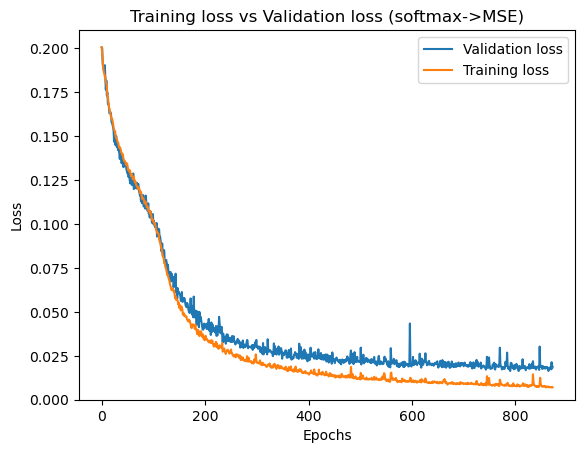

In [40]:
plt.title("Training loss vs Validation loss (softmax->MSE)")
plt.plot(epoch_nums, validation_losses, label="Validation loss")
plt.plot(epoch_nums, training_losses, label="Training loss")
plt.ylim(bottom=0)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

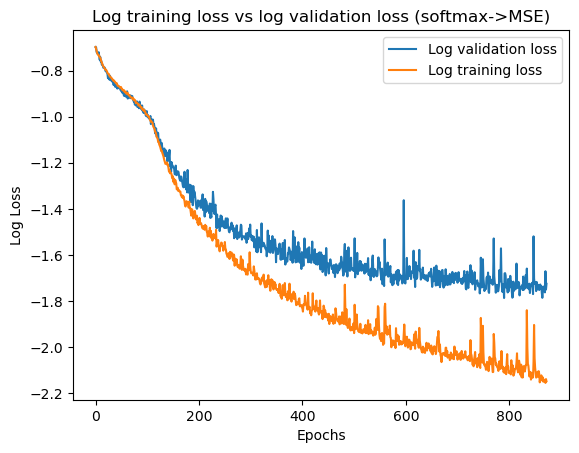

In [41]:
plt.title("Log training loss vs log validation loss (softmax->MSE)")
plt.plot(epoch_nums, [math.log(x, 10) for x in validation_losses], label="Log validation loss")
plt.plot(epoch_nums, [math.log(x, 10) for x in training_losses], label="Log training loss")
plt.xlabel("Epochs")
plt.ylabel("Log Loss")
plt.legend()
plt.show()

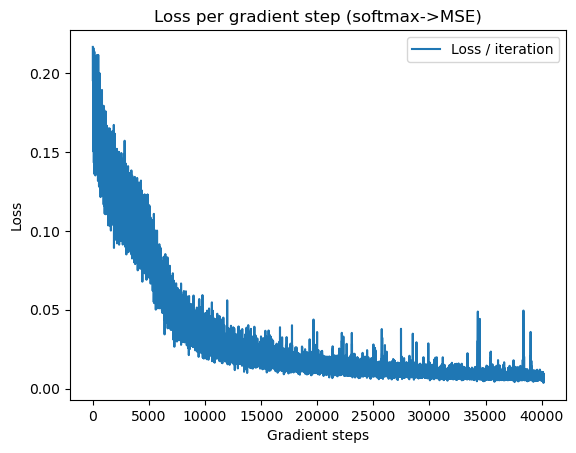

In [42]:
plt.title("Loss per gradient step (softmax->MSE)")
plt.plot(iter_nums, batch_losses, label="Loss / iteration")
plt.xlabel("Gradient steps")
plt.ylabel("Loss")
plt.legend()
plt.show()

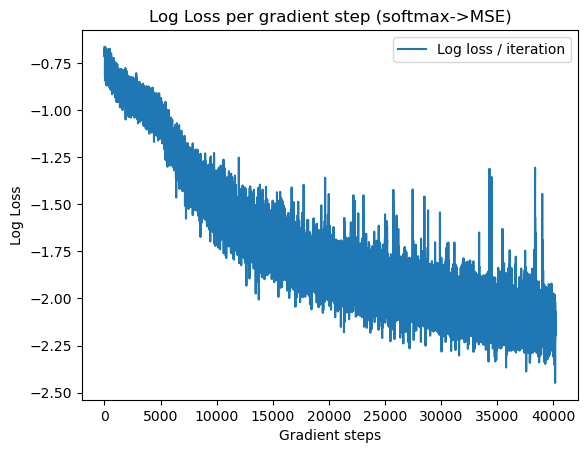

In [43]:
plt.title("Log Loss per gradient step (softmax->MSE)")
plt.plot(iter_nums, [math.log(x, 10) for x in batch_losses], label="Log loss / iteration")
plt.xlabel("Gradient steps")
plt.ylabel("Log Loss")
plt.legend()
plt.show()

In [44]:
torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': losses,
            }, f"{output_dir}/info_model_021026_872.pt")

In [79]:
model_dict = torch.load(f"{output_dir}/info_model_021026_872.pt")
model_loaded = VisionTransformer(model_image_size, 3, NUM_LANDMARKS, 4, 3)
model_loaded.load_state_dict(model_dict['model_state_dict'])

Learnable ape shape: torch.Size([256, 16, 16])
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)
(0, 2, 3, 1)
(0, 3, 1, 2)


<All keys matched successfully>

In [80]:
print(model_loaded)

VisionTransformer(
  (resizechannels): Conv2d(192, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (norm1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (transformer_layers): Sequential(
    (0): MultiHeadVisionAttention(
      (initnorm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (queryNorm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (keyNorm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (valueNorm): ChannelLayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (combine): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (resnorm): ResidualNorm(
        (res_conv): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (layer_norm): ChannelLayerNorm((256,), eps=1e-05, elementwise_affine=True)
      )
      (mlp): MLP(
        (conv_layers): Sequential(
          (0): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): Ba

Goal: search for where outputs across channels collapse to one result.

Initial conv: 
Patch conv: seemed that these weights changed, even after setting grad to false.
MHA1:
* query, key, value exhibit regular std (~0.1)
* mlp weights and residual linear seem half as much as what they should be -- sqrt(2/256) -- correct bc of 0.4 factor added originally
    * batchnorm2d weights range from 0.85 to 1.15, biases from -0.06 to 0.06
* residual: std around 0.08
* layer norm: 0.9 to 1.075 weight, -0.03 to 0.03 bias
* combine: sounds good
Found mistake in initialization scheme for Conv2D
MHA2: no abn
BatchNorm2D: no abn
MHA3: no abn
BatchNorm2D: no abns
ConvTranspose2D: need to work out initialization scheme here.
SameSizeConv: very last batchnorm has significant positive bias (0.2-0.7); otherwise, no abn

In [68]:
examined_weights = model.patch_conv[0].patch_filter.weight

torch.Size([192, 3, 8, 8])


(array([36672.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,   192.]),
 array([0.        , 0.03333334, 0.06666667, 0.1       , 0.13333334,
        0.16666667, 0.2       , 0.23333333, 0.26666668, 0.30000001,
        0.33333334, 0.36666667, 0.40000001, 0.43333334, 0.46666667,
        0.5       , 0.53333336, 0.56666666, 0.60000002, 0.63333333,
        0.66666669, 0.69999999, 0.73333335, 0.76666665, 0.80000001,
        0.83333331, 0.86666667, 0.89999998, 0.93333334, 0.96666664,
        1.        ]),
 <BarContainer object of 30 artists>)

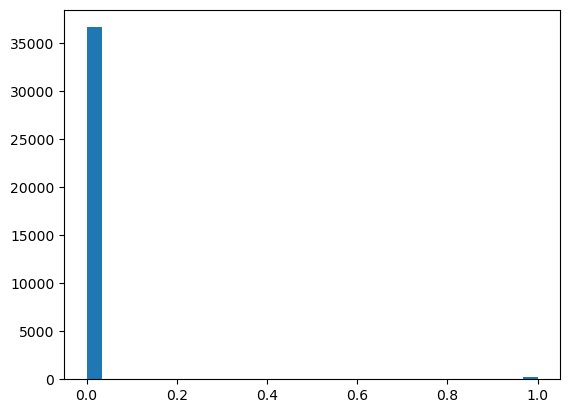

In [69]:
print(examined_weights.shape)
plt.hist(examined_weights.flatten().detach().numpy(), bins=30)

In [70]:
model_loaded.eval()

VisionTransformer(
  (resizechannels): Conv2d(192, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (norm1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (transformer_layers): Sequential(
    (0): MultiHeadVisionAttention(
      (initnorm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (queryNorm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (keyNorm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (valueNorm): ChannelLayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (combine): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (resnorm): ResidualNorm(
        (res_conv): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (layer_norm): ChannelLayerNorm((256,), eps=1e-05, elementwise_affine=True)
      )
      (mlp): MLP(
        (conv_layers): Sequential(
          (0): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): Ba

In [71]:
#DATA_PT = 115
DATA_PT = 179
example_point = dataset[DATA_PT]
input_example = example_point['image'].to(dtype=torch.float32)

/Users/ishwar/anaconda3/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


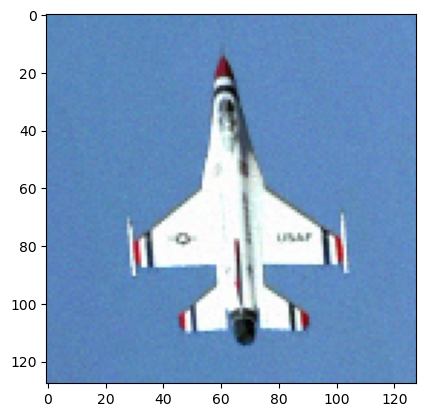

In [72]:
image = torch.permute(example_point['image'], (1, 2, 0))
plt.imshow(image.numpy()*0.5 + 0.5)

tensor(-0.9966) tensor(1.)
torch.Size([3, 128, 128])
tensor(11.5811, grad_fn=<MaxBackward1>)
tensor(10.6801, grad_fn=<MaxBackward1>)
tensor(12.1136, grad_fn=<MaxBackward1>)
torch.Size([1, 5, 128, 128])


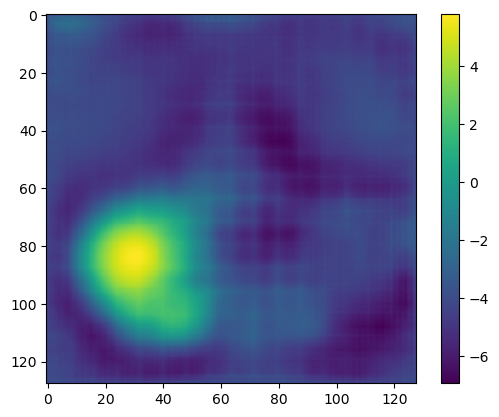

In [73]:
print(torch.min(input_example), torch.max(input_example))
print(input_example.shape)
SAVE_SWITCH=1
heatmap_pred = model( torch.stack((input_example,)) ).detach() # take unet outputted by first unet in the stacked hourglass
print(heatmap_pred.shape)
plt.imshow(heatmap_pred.numpy()[0][1])
plt.colorbar()

In [ ]:
# provided by Gemini

# 2. Create a dictionary to store activations
activations = {}

# 3. Define the hook function
def get_activation(name):
    def hook(model, input, output):
        # .detach() removes the tensor from the computation graph
        activations[name] = output.detach()
    return hook

# 4. Register hooks on desired layers
dims = {}

# 4. Register hooks on desired layers
model_loaded.transformer_layers[0].register_forward_hook(get_activation('transformer_layers[0]')); dims['transformer_layers[0]'] = [1, 256,16]
model_loaded.transformer_layers[2].register_forward_hook(get_activation('transformer_layers[2]')); dims['transformer_layers[2]'] = [1, 256,16]
model_loaded.transformer_layers[4].register_forward_hook(get_activation('transformer_layers[4]')); dims['transformer_layers[4]'] = [1, 256,16]
model_loaded.patch_conv[0].register_forward_hook(get_activation('patch_conv')); dims['patch_conv'] = [1,192, 16]
model_loaded.resizechannels.register_forward_hook(get_activation('resizechannels')); dims['resizechannels'] = [1,256, 16]
model_loaded.transformer_layers[6].register_forward_hook(get_activation('up1')); dims['up1'] = [1,64,32]
model_loaded.transformer_layers[8].register_forward_hook(get_activation('up2')); dims['up2'] = [1,16,64]
model_loaded.transformer_layers[10].register_forward_hook(get_activation('up3')); dims['up3'] = [1,5,128]

# model_loaded.unet1.upsize1.register_forward_hook(get_activation('unet1.upsize1')); dims['unet1.upsize1'] = [1, 16, 128]
# model_loaded.unet1.upsize2.register_forward_hook(get_activation('unet1.upsize2')); dims['unet1.upsize2'] = [2, 16, 64]
# model_loaded.unet1.upsize3.register_forward_hook(get_activation('unet1.upsize3')); dims['unet1.upsize3'] = [3, 32, 32]
# model_loaded.unet1.upsize4.register_forward_hook(get_activation('unet1.upsize4')); dims['unet1.upsize4'] = [4, 64, 16]
# model_loaded.unet1.convs0a.register_forward_hook(get_activation('unet1.convs0a')); dims['unet1.convs0a'] = [0, 16, 128]
# model_loaded.unet1.convs1a.register_forward_hook(get_activation('unet1.convs1a')); dims['unet1.convs1a'] = [1, 16, 64]
# model_loaded.unet1.convs2a.register_forward_hook(get_activation('unet1.convs2a')); dims['unet1.convs2a'] = [2, 32, 32]
# model_loaded.unet1.convs3a.register_forward_hook(get_activation('unet1.convs3a')); dims['unet1.convs3a'] = [3, 64, 16]
# model_loaded.unet1.lowest_convs.register_forward_hook(get_activation('unet1.lowest_convs')); dims['unet1.lowest_convs'] = [-1, 128, 8]
# model_loaded.unet1.final_conv.register_forward_hook(get_activation('unet1.final_conv')); dims['unet1.final_conv'] = [-1, 13, 128]

# 5. Perform a forward pass
#sample_input = torch.randn(1, 3, 32, 32) # Batch size 1, 3 channels, 32x32 image
_ = model_loaded( torch.stack((input_example,)) ) # Run the model

# 6. Access the stored activations
print(f"Shape of mha1 output: {activations['transformer_layers[0]'].shape}")

tensor(10.3630, grad_fn=<MaxBackward1>)
tensor(10.5530, grad_fn=<MaxBackward1>)
tensor(11.7986, grad_fn=<MaxBackward1>)
Shape of mha1 output: torch.Size([1, 256, 16, 16])


In [60]:
def visualize_outputs(moniker, outputs):
    num_channels = outputs.shape[0]
    h = outputs.shape[1]
    w = outputs.shape[2]
    # Define the grid dimensions
    columns = 4
    rows = (num_channels+columns-1)//columns

    # find rank across output channels:
    output_mat = torch.flatten(outputs, start_dim=1).detach().numpy()
    print(output_mat.shape)
    s = np.linalg.svd(output_mat, compute_uv=False)
    # Select the top k singular values
    s_rank = [x for x in s if x > s[0]/100]
    print(f"\t{moniker}: Total Channels: {output_mat.shape[0]}, s_rank: {len(s_rank)}")

    # 2. Create figure and axes
    # fig is the entire figure, axs is a 2D array of axes (subplots)
    fig, axs = plt.subplots(rows, columns, figsize=(8, 3+rows))

    fig.suptitle(f"{moniker} features ({h}x{w}), srank={len(s_rank)}", fontsize=16, y=1)

    #images = [np.random.rand(10, 10) * i for i in range(1, 5)]
    vmin = torch.min(outputs).item()
    vmax = torch.max(outputs).item()
    # 2. Create the normalization and mappable
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = matplotlib.cm.ScalarMappable(norm=norm, cmap='viridis')

    titles = ["Channel "+str(i) for i in range(num_channels)]
    # 3. Iterate through axes and display images
    # Use .flatten() to turn the 2D array of axes into a 1D array for easy iteration
    for i, ax in enumerate(axs.flatten()):
        if i >= num_channels:
            break
        ax.imshow(outputs[i].numpy())
        ax.set_title(titles[i]) # Set a title for each subplot
        ax.axis('off') # Hide the axes ticks and labels for cleaner image presentation

    # Adjust layout for better spacing
    plt.tight_layout()
    fig.colorbar(sm, ax=axs, orientation='horizontal', label='Shared Scale')
    # Display the figure
    plt.savefig(f"{output_dir}/{moniker}_{DATA_PT}.png")

In [ ]:
for which_layer in dims:
    visualize_outputs(f"transformer_{which_layer}",  activations[which_layer][0])

In [ ]:
visualize_outputs(f"transformer_mha1_raw_out", torch.load(f"{output_dir}/tsf_out_image.pt").detach()[0])
visualize_outputs(f"transformer_mha1_combined", torch.load(f"{output_dir}/post_res_norm.pt").detach()[0])
visualize_outputs(f"transformer_mha1_mlp_out", torch.load(f"{output_dir}/mlp_image.pt").detach()[0])
visualize_outputs(f"transformer_mha1_values", torch.load(f"{output_dir}/values.pt").detach()[0])

In [ ]:
visualize_outputs(f"transformer_mha1_attentionmat", torch.load(f"{output_dir}/attention.pt").detach()[0])

In [ ]:
visualize_outputs(f"transformer_mha1_cosinesimmat", torch.load(f"{output_dir}/cosine_sim.pt").detach()[0])

In [ ]:
visualize_outputs(f"transformer_mha1_keys", torch.load(f"{output_dir}/keys.pt").detach()[0])

In [ ]:
visualize_outputs(f"transformer_mha1_queries", torch.load(f"{output_dir}/queries.pt").detach()[0])

In [ ]:
plt.hist(torch.load(f"{output_dir}/queryMatrix.pt").detach().numpy().flatten(), bins=30)

In [ ]:
plt.plot(range(256), np.linalg.svd(torch.load(f"{output_dir}/queryMatrix.pt").detach().numpy()[0], compute_uv=False))

In [ ]:
print(model_loaded.resizechannels)
print(model_loaded.resizechannels.weight.shape)
plt.hist(model_loaded.resizechannels.weight.detach().flatten(), bins=30)

In [84]:
import frame_manager
import importlib
importlib.reload(frame_manager)

<module 'frame_manager' from '/Users/ishwar/Desktop/Aero_ML/frame_manager.py'>

In [85]:
SMOOTH_CONST = 1
# ---------- Main runner ----------
@torch.inference_mode()
def run_video_demo(model, source=0, device=None, window_name="Landmark Demo"):
    """
    source: 0 for webcam, or path to video file.
    model: a loaded torch.nn.Module that outputs heatmaps (B,C,Hh,Wh)
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model.eval().to(device)

    cap = cv2.VideoCapture(source)
    if not cap.isOpened():
        raise RuntimeError(f"Could not open video source: {source}")

    t_prev = time.time()
    fps_ema = None

    try:
        while True:
            ok, frame = cap.read()
            if not ok: break

            # Keep a copy for drawing at native res
            out_frame = frame.copy()

            # Preprocess & infer
            tin, orig_wh = preprocess_frame(frame, device)
            # Optional: mixed precision for speed on GPU
            with torch.cuda.amp.autocast(enabled=(device == "cuda")):
                pred = F.softmax(model(tin), dim=1)                 # expect (1, C, Hh, Wh)
            if pred.dim() == 5: pred = pred[0]    # in case model returns (pred, aux)
            if pred.shape[0] == 1: pred = pred    # (1,C,Hh,Wh)
            _, C, Hh, Wh = pred.shape

            # Get coords in model-input space
            xs_in, ys_in = heatmaps_to_coords(pred)      # each (1,C)
            xs_in, ys_in = xs_in[0], ys_in[0]            # (C,)

            # Draw
            draw_points(out_frame, xs_in, ys_in, orig_wh)

            # FPS
            t_now = time.time()
            fps = 1.0 / max(t_now - t_prev, 1e-6)
            fps_ema = fps if fps_ema is None else 0.9*fps_ema + 0.1*fps
            t_prev = t_now
            put_fps(out_frame, fps_ema)

            cv2.imshow(window_name, out_frame)
            key = cv2.waitKey(1) & 0xFF
            if key in (27, ord('q')):  # ESC or q
                break
    finally:
        cap.release()
        cv2.destroyAllWindows()


class LatestFrameGrabber:
    """Continuously grabs frames on a background thread and keeps only the most recent one."""
    def __init__(self, source=0):
        self.cap = cv2.VideoCapture(source)
        if not self.cap.isOpened():
            raise RuntimeError(f"Could not open video source: {source}")
        # Best-effort: keep tiny buffer (works on some backends; harmless otherwise)
        try:
            self.cap.set(cv2.CAP_PROP_BUFFERSIZE, 1)
        except Exception:
            pass
        self.lock = threading.Lock()
        self.frame = None
        self.stopped = False
        self.t = threading.Thread(target=self._update, daemon=True)
        self.t.start()

    def _update(self):
        while not self.stopped:
            ok, f = self.cap.read()
            if not ok:
                self.stopped = True
                break
            with self.lock:
                self.frame = f

    def read(self):
        with self.lock:
            return None if self.frame is None else self.frame.copy()

    def release(self):
        self.stopped = True
        try:
            self.t.join(timeout=1.0)
        except Exception:
            pass
        self.cap.release()

import time, cv2, torch

@torch.inference_mode()
def run_video_demo_fixed_rate(model, source=0, device=None, window_name="Landmark Demo",
                              sample_hz=15.0, show_fps=True):
    """
    Samples the *latest* frame every 1/sample_hz seconds, runs inference on that frame,
    and displays only those results. Drops frames between ticks to avoid latency buildup.
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model.eval().to(device)

    grab = LatestFrameGrabber(source)  # from previous code: grabs frames on a thread
    dt = 1.0 / float(max(sample_hz, 1e-6))
    next_t = time.perf_counter()  # monotonic clock

    disp_fps_ema = None
    try:
        while True:
            now = time.perf_counter()
            # sleep until the next scheduled tick (keeps rate steady, avoids drift)
            if now < next_t:
                time.sleep(next_t - now)
                continue
            # schedule the following tick
            next_t += dt

            t0 = time.perf_counter()
            frame = grab.read()
            if frame is None:
                # No new frame yet; skip this tick but keep schedule
                continue

            out_frame = frame.copy()

            # Preprocess & infer on the ticked frame
            tin, orig_wh = preprocess_frame(frame, device)
            with torch.cuda.amp.autocast(enabled=(device == "cuda")):
                tin = tin.to(dtype=torch.float32)
                pred = model(tin)  # (1, C, Hh, Wh)

            xs_in, ys_in = heatmaps_to_coords(pred)   # each (1, C) in model-input coords
            xs_in, ys_in = xs_in[0], ys_in[0]
            draw_points(out_frame, xs_in, ys_in, orig_wh)

            # Display + UI FPS (UI FPS may be ~ sample_hz)
            t1 = time.perf_counter()
            ui_fps = 1.0 / max(t1 - t0, 1e-6)
            disp_fps_ema = ui_fps if disp_fps_ema is None else 0.9*disp_fps_ema + 0.1*ui_fps
            if show_fps:
                put_fps(out_frame, disp_fps_ema)
                cv2.putText(out_frame, f"Sample: {sample_hz:.1f} Hz",
                            (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2, cv2.LINE_AA)

            cv2.imshow(window_name, out_frame)
            key = cv2.waitKey(1) & 0xFF
            if key in (27, ord('q')):
                break

            # If inference was slower than dt, catch the schedule up (drop extra ticks)
            # so next tick isn't delayed by accumulated lag.
            now2 = time.perf_counter()
            while next_t < now2 - 1e-4:
                next_t += dt
    finally:
        grab.release()
        cv2.destroyAllWindows()

import time, cv2, torch

@torch.inference_mode()
def run_video_demo_auto(model, source=0, device=None, window_name="Landmark Demo",
                        sample_hz=15.0, show_fps=True):
    """
    - If source is webcam (fps not available) → run at fixed sample_hz (e.g. 15 Hz).
    - If source is video file (fps available) → throttle playback to the file's FPS.
    """

    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model.eval().to(device)

    cap = cv2.VideoCapture(source)
    if not cap.isOpened():
        raise RuntimeError(f"Could not open video source: {source}")

    # Try to read FPS from file
    fps_file = cap.get(cv2.CAP_PROP_FPS)
    if fps_file is None or fps_file <= 1e-2:  # webcams often report 0
        mode = "webcam"
        dt = 1.0 / float(max(sample_hz, 1e-6))   # fixed rate
        print(f"[INFO] Webcam mode: target {sample_hz} Hz")
    else:
        mode = "file"
        dt = 1.0 / fps_file
        print(f"[INFO] Video file mode: target {fps_file:.2f} FPS")

    next_t = time.perf_counter()
    disp_fps_ema = None

    prev_xs_in_smooth, prev_ys_in_smooth = None, None

    prev_mask = [None] * 4
    prev_pred = None
    i = 0

    tau = 0.1

    try:
        while True:
            ok, frame = cap.read()
            if not ok:
                break
            out_frame = frame.copy()

            i += 1
            if i % 5 != 0:
                continue

            # preprocess
            tin, orig_wh = frame_manager.preprocess_frame(frame, device)

            # inference
            with torch.cuda.amp.autocast(enabled=(device == "cuda")):
                ##pred = F.softmax(model(tin), dim=1).detach()  # (1, C, H, W)
                model_output = model((tin*2 - 1))
                pred_logits = [x.detach() / tau for x in model_output]  # (1, C, H, W)
                pred_probs = heatmap_softmax(pred_logits, 1, NUM_LANDMARKS)
            """
            out_frame_2 = out_frame.copy().astype(np.float32)
            if (prev_pred is None):
                pred_smooth = pred
            else:
                pred_smooth = 0.3*pred + 0.7*prev_pred
            prev_pred = pred_smooth
            pred_round = torch.round(pred_smooth)
            for i in range(0, 3): 
                colored_heatmap = torch.permute(torch.tensor([255, 255, 255]) - torch.tensor(frame_manager.COLORS[i]).repeat(128, 128, 1), (2, 0, 1)) * pred_round[0][i].repeat(3, 1, 1).view(1, 3, 128, 128)
                # print(out_frame_2.shape)
                # print(colored_heatmap.shape)
                new_img = F.interpolate(colored_heatmap, size=(324, 324), mode='bilinear').to(torch.uint8)
                new_img_2 = (torch.ones(new_img.shape)*255 - new_img*0.5)/255
                # print(new_img.shape)
                mask = torch.permute(new_img_2, (0, 2, 3, 1)).view(324, 324, 3).numpy()
                
                out_frame_2 = out_frame_2 * mask

            out_frame_2 = out_frame_2.astype(np.uint8)
            """

            xs_in, ys_in = frame_manager.heatmaps_to_coords(pred_probs[0])
            #xs_in, ys_in = xs_in[0], ys_in[0]
            if prev_xs_in_smooth is None:
                xs_in_smooth, ys_in_smooth = xs_in, ys_in
            else:
                xs_in_smooth, ys_in_smooth = xs_in*SMOOTH_CONST + prev_xs_in_smooth*(1-SMOOTH_CONST), ys_in*SMOOTH_CONST + prev_ys_in_smooth*(1-SMOOTH_CONST)
            frame_manager.draw_points(out_frame, xs_in_smooth, ys_in_smooth, orig_wh)
            prev_xs_in_smooth, prev_ys_in_smooth = xs_in_smooth, ys_in_smooth

            # UI FPS
            now = time.perf_counter()
            ui_fps = 1.0 / max(now - next_t + dt, 1e-6)
            disp_fps_ema = ui_fps if disp_fps_ema is None else 0.9*disp_fps_ema + 0.1*ui_fps
            if show_fps:
                frame_manager.put_fps(out_frame, disp_fps_ema)

            ## cv2.imshow(window_name, out_frame_2)
            cv2.imshow(window_name, out_frame)
            key = cv2.waitKey(1) & 0xFF
            if key in (27, ord('q')):
                break

            # pacing
            if mode == "webcam":
                # sleep until next scheduled tickq
                now = time.perf_counter()
                if now < next_t:
                    time.sleep(next_t - now)
                next_t += dt
            else:  # file
                wait_ms = int(max(1, dt * 1000))
                if cv2.waitKey(wait_ms) & 0xFF in (27, ord('q')):
                    break

    finally:
        cap.release()
        cv2.destroyAllWindows()


In [86]:
# or a file:
run_video_demo_auto(model, source="plane_2.mov", sample_hz=60.0)

[INFO] Video file mode: target 59.85 FPS
tensor(9.6684)
tensor(9.7593)
tensor(10.9779)
tensor(9.4654)
tensor(9.9116)
tensor(10.6933)
tensor(9.1417)
tensor(9.8386)
tensor(10.9708)
tensor(9.1680)
tensor(9.8895)
tensor(10.9215)
tensor(9.2343)
tensor(10.0055)
tensor(10.4414)
tensor(8.9574)
tensor(9.9372)
tensor(10.4184)
tensor(8.9419)
tensor(9.9464)
tensor(10.2590)
tensor(8.9575)
tensor(9.8712)
tensor(10.0755)
tensor(9.0317)
tensor(9.8936)
tensor(10.8537)
tensor(9.1542)
tensor(9.9451)
tensor(10.7325)
tensor(9.0492)
tensor(9.8325)
tensor(10.4226)
tensor(9.0133)
tensor(9.9029)
tensor(10.1268)
tensor(9.0477)
tensor(10.0432)
tensor(10.4615)
tensor(8.9284)
tensor(9.9106)
tensor(10.6713)
tensor(8.8864)
tensor(9.9511)
tensor(10.6862)
tensor(8.9096)
tensor(9.9175)
tensor(10.6262)
tensor(9.0632)
tensor(9.9949)
tensor(10.7744)
tensor(9.0064)
tensor(10.0163)
tensor(10.7007)
tensor(8.9325)
tensor(10.0423)
tensor(10.4724)
tensor(8.9017)
tensor(9.9403)
tensor(10.4995)
tensor(8.9742)
tensor(9.8130)
tenso

In [ ]:
DATA_PT = 10
example_point = dataset[DATA_PT]
#example_point = dataset[115]
image = torch.permute(example_point['image'], (1, 2, 0))
plt.imshow(image.numpy()*0.5 + 0.5)

In [ ]:
input_example = example_point['image'].to(dtype=torch.float32)
print(torch.min(input_example), torch.max(input_example))
print(input_example.shape)
heatmap_pred = model( torch.stack((input_example,)) )[0][2].detach()
print(heatmap_pred.shape)

In [ ]:
plt.imshow(heatmap_pred[0].numpy()[1])
plt.colorbar()